In [38]:
import time
import warnings
from math import sqrt

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import KFold, TimeSeriesSplit, train_test_split, GridSearchCV, RandomizedSearchCV

from catboost import CatBoostRegressor, Pool

# !pip install lightgbm -q
import lightgbm as lgbm
from lightgbm import Dataset

import xgboost as xgb
from xgboost import XGBRegressor

# warnings.filterwarnings(action="ignore", message="Mean of empty slice")
warnings.filterwarnings("ignore")

matplotlib.style.use("ggplot")
pd.set_option("display.max_rows", 30)
pd.options.mode.chained_assignment = None

In [7]:
import shap
shap.initjs()

# Вспомогательные функции

In [8]:
def root_mean_squared_error(target, pred):
    return np.sqrt(mean_squared_error(target, pred))

In [9]:
rmse_scorer = make_scorer(root_mean_squared_error, greater_is_better=False)

In [10]:
def perform_grid_search(X, y, model, param_grid, rmse_scorer, tscv):
    for train_index, test_index in tscv.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        start = time.time()
        print('\nSearching for the best parameters...')

        grid_search = GridSearchCV(model, param_grid, scoring=rmse_scorer, n_jobs=-1)
        grid_search_result = grid_search.fit(X_train, y_train)

        elapsed_time = time.time() - start
        print(f'Time taken for grid search: {round(elapsed_time / 60, 2)} minutes')
        print('Best parameters:   ', grid_search_result.best_params_)
        print('Best RMSE score: ', round(np.abs(grid_search_result.best_score_), 2))

# Загрузка данных

In [11]:
X_train = pd.read_csv('../data/X_train.csv', parse_dates=['reportts'])
y_train = pd.read_csv('../data/y_train.csv', parse_dates=['reportts'])

# X_test = pd.read_csv('../data/X_test.csv', parse_dates=['reportts']).fillna(0)

X_train.rename(columns={"reportts": "datetime"}, inplace=True);
# X_test.rename(columns={"reportts": "datetime"}, inplace=True);
y_train.rename(columns={"reportts": "datetime"}, inplace=True);

dataset = X_train.merge(y_train, on=['acnum', 'pos', 'datetime']).dropna(subset=['egtm'])


In [12]:
dataset.head()

,datetime,acnum,pos,fltdes,dep,arr,ivs12,ibe,iaie,iai,zwbp,acct,alt,alt_peak,alt_rtd,aoc,b25,baf,bbf,bbr,bbv,btmc,cas,cas_peak,cas_rtd,cg,cnt,code,dbfl,dbfs,dbnfl,dbnfs,dflm,dflm_peak,dfsm,dfsm_peak,dnflm,dnflm_peak,dnfsm,dnfsm_peak,...,ps14,ptmc,qe,rfan,rvn1,rvn2,shptp,slptp,sva,t14,t2,t25,t2_peak,t3,tat,tat_peak,tat_rtd,tcc,tccoc,tec,tfuel,tla,tn,tol,tr,ttp,vb1,vb2,vorrc,vorv,votm,vsva,w14,pf,wai,nai,prv,hpv,xf,egtm
0,2018-12-24 10:53:22,VQ-BGU,1,8990.0,EDHI,UUDD,NaN,NaN,NaN,NaN,NaN,-20.0,1418.0,1247.0,-352.0,3.6,7.3,3.9,0.27,0.44,0.52,-30.0,166.0,163.0,130.0,18.6,1206,4000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,15.991,0.0,NaN,0.06,0.08,0.05,87.9,17.1,76.5,25.4,3.0,83.1,1.8,522.8,2.0,2.2,3.5,0.1,0.0,13.0,63.6,34.8,41.4,NaN,NaN,50.0,0.2,0.2,58.2,NaN,NaN,0.0,1160.0,0.53,0.0,0.0,1.0,0.0,0.0,44.437
1,2018-12-24 10:53:22,VQ-BGU,2,8990.0,EDHI,UUDD,NaN,NaN,NaN,NaN,NaN,-20.0,1418.0,1247.0,-352.0,3.5,7.3,4.3,0.23,0.36,0.43,-30.0,166.0,163.0,130.0,18.6,1206,4000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,15.895,0.0,NaN,0.01,0.06,0.00,88.2,17.1,77.7,25.5,3.1,82.1,2.0,523.9,2.0,2.2,3.5,0.0,0.0,10.0,65.0,34.7,40.3,NaN,NaN,50.0,0.0,0.1,57.3,NaN,NaN,0.0,1160.0,0.53,0.0,0.0,1.0,0.0,0.0,45.869
2,2018-12-25 15:23:23,VQ-BGU,1,1024.0,URSS,UUDD,NaN,NaN,NaN,NaN,NaN,-20.0,2005.0,1581.0,96.0,3.5,7.3,4.1,0.25,0.29,0.39,-30.0,163.0,157.0,126.0,22.5,2813,4000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.026,0.0,NaN,0.09,0.03,0.02,96.5,17.5,77.3,38.1,10.4,105.5,10.8,570.0,10.2,11.3,11.0,0.0,0.0,24.0,83.0,34.9,60.1,NaN,NaN,54.0,0.2,0.1,55.4,NaN,NaN,0.0,1179.0,0.53,0.0,0.0,1.0,0.0,0.0,44.379
3,2018-12-25 15:23:23,VQ-BGU,2,1024.0,URSS,UUDD,NaN,NaN,NaN,NaN,NaN,-20.0,2005.0,1676.0,96.0,3.4,7.3,4.5,0.27,0.37,0.45,-30.0,163.0,157.0,126.0,22.5,2813,4000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,15.873,0.0,NaN,0.02,0.07,0.02,97.0,17.5,78.4,37.9,10.6,104.4,10.9,573.2,10.2,11.0,11.0,0.0,0.0,23.0,82.7,35.0,57.9,NaN,NaN,54.0,0.1,0.1,54.6,NaN,NaN,0.0,1179.0,0.53,0.0,0.0,1.0,0.0,0.0,44.904
4,2018-12-25 20:49:27,VQ-BGU,1,217.0,UUDD,UNBB,NaN,NaN,NaN,NaN,NaN,-20.0,1739.0,1566.0,619.0,3.5,7.3,3.9,0.35,0.29,0.45,-30.0,168.0,167.0,128.0,26.7,4506,4000,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.482,0.0,NaN,0.07,0.02,0.04,111.0,18.3,81.1,21.4,-8.9,90.4,-7.8,548.5,-7.2,-7.2,-8.0,0.0,0.0,8.0,67.0,34.9,41.2,NaN,NaN,36.0,0.2,0.5,50.8,NaN,NaN,0.0,1302.0,0.51,0.0,0.0,1.0,0.0,0.0,43.742


In [13]:
dataset.shape

(2827, 166)

# TODO: заполнить иначе nans

In [14]:
# Delete cols where all values are Nan
dataset = dataset.dropna(axis=1, how='all')
# X_test = X_test.dropna(axis=1, how='all')

# Fill NaNs
dataset = dataset.fillna(0)
# X_test = X_test.fillna(0)

In [15]:
dataset.shape

(2827, 144)

In [16]:
dataset_time_sorted = dataset.sort_values(by='datetime').reset_index(drop=True)

In [17]:
dataset_time_sorted.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2827 entries, 0 to 2826
Data columns (total 144 columns):
 #    Column      Dtype         
---   ------      -----         
 0    datetime    datetime64[ns]
 1    acnum       object        
 2    pos         int64         
 3    fltdes      float64       
 4    dep         object        
 5    arr         object        
 6    acct        float64       
 7    alt         float64       
 8    alt_peak    float64       
 9    alt_rtd     float64       
 10   aoc         float64       
 11   b25         float64       
 12   baf         float64       
 13   bbf         float64       
 14   bbr         float64       
 15   bbv         float64       
 16   btmc        float64       
 17   cas         float64       
 18   cas_peak    float64       
 19   cas_rtd     float64       
 20   cg          float64       
 21   cnt         int64         
 22   code        int64         
 23   dflm        float64       
 24   dflm_peak   float64       
 

In [18]:
# drop_cols = ["datetime", "egtm", 'dep', 'arr', 'acnum']
dataset_time_sorted_BGU = dataset_time_sorted[dataset_time_sorted['acnum'] == 'VQ-BGU'].reset_index(drop=True)

drop_cols = ["datetime", "egtm", "acnum"]

X = dataset_time_sorted_BGU.drop(drop_cols, axis=1, errors="ignore")
y = dataset_time_sorted_BGU["egtm"]

# cat_features = X.select_dtypes(include=['object']).columns.tolist()
cat_features = ['pos','dep', 'arr']

for col in cat_features:
    X[col] = X[col].astype('category')

random_state = 42
n_splits = 3

tscv = TimeSeriesSplit(n_splits=n_splits)
kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

X_train_folds, X_test_folds, y_train_folds, y_test_folds = [], [], [], []

for train_index, test_index in tscv.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    X_train_folds.append(X_train)
    X_test_folds.append(X_test)
    y_train_folds.append(y_train)
    y_test_folds.append(y_test)

## Catboost

In [152]:
# params_grid1 = {
#     'depth': [4, 6, 8],  # глубина дерева
#     'learning_rate': [0.25, 0.05, 0.01],
#     'l2_leaf_reg': [0, 1, 3, 5],  # коэффициент регуляризации L2
#     'bagging_temperature': [0.5, 1.0, 1.5],  # температура бэггинга
#     'random_strength': [0.1, 0.5, 1.0],  # разброс при выборе признаков
#     'one_hot_max_size': [2, 5, 10],  # предел для one-hot кодирования
#     'colsample_bylevel': [0.5, 0.8, 1.0],  # доля колонок для каждого уровня
#     'leaf_estimation_iterations': [5, 10, 15],  # число итераций для оптимизации значения в листе
#     'max_ctr_complexity': [1, 3, 5],  # сложность признаков
#     'grow_policy': ['SymmetricTree', 'Depthwise', 'Lossguide'],  # политика роста дерева
#     'min_data_in_leaf': [1, 3, 5],  # минимальное число объектов в листе
#     'leaf_estimation_method': ['Newton', 'Gradient'],  # метод оценки листа
#     'max_leaves': [30, 50, 100],  # максимальное число листьев
#     'max_bin': [128, 256, 512],  # число бакетов для числовых признаков
#     'boosting_type': ['Plain', 'Ordered'],  # тип бустинга
# }

params = {'max_leaves': 50,
             'border_count': 512,
             'leaf_estimation_iterations': 10,
             'one_hot_max_size': 2,
             'max_ctr_complexity': 3,
             'l2_leaf_reg': 5,
             'depth': 4,
             'min_data_in_leaf': 5,
             'bagging_temperature': 0.5,
             'rsm': 0.5,
             'random_strength': 0.1,
             'learning_rate': 0.01,
             'grow_policy': 'Lossguide',
             'boosting_type': 'Plain',
             'leaf_estimation_method': 'Gradient',
            'learning_rate': 0.06,
            'loss_function':'RMSE',
            'eval_metric':'RMSE',
            'cat_features':cat_features,
            'thread_count':-1,
            'random_seed':random_state,
            'early_stopping_rounds':50 }

params_grid2 = {'depth': [2, 3, 4, 5, 6],
                  'learning_rate': np.linspace(0.01, 0.5, 10),
                  'l2_leaf_reg': [0, 1, 2, 3, 4, 5],
#                   'bootstrap_type': ['No', 'Bayesian', 'Bernoulli', 'Poisson']
             }

models = []
rmse_scores = []
best_params = []

for train_index, val_index in tscv.split(X, y):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    train_pool = Pool(X_train, y_train, cat_features=cat_features)
    val_pool = Pool(X_val, y_val, cat_features=cat_features)

#     model = CatBoostRegressor(random_state=random_state,
#                               cat_features=cat_features,
#                               loss_function='RMSE',
#                               eval_metric="RMSE",
#                               verbose=False,
#                               thread_count=-1,
#                               early_stopping_rounds=50)
    model = CatBoostRegressor(**params)

    search_results = model.randomized_search(params_grid2, X=train_pool,y=None,
                                             partition_random_seed=random_state,
                                             verbose=False,
                                             plot=False,
                                             n_iter=100
                                            )

    model.fit(train_pool)
    models.append(model)

    pred = model.predict(val_pool)
    rmse = np.sqrt(mean_squared_error(y_val, pred))
    rmse_scores.append(rmse)

    best_params.append(search_results['params'])

    print("Лучшие гиперпараметры для этого сплита:")
    print(search_results['params'])

best_model_index = np.argmin(rmse_scores)
best_model = models[best_model_index]

print("Лучшие гиперпараметры для лучшей модели:")
print(best_params[best_model_index])

# best_model.save_model('best_model_catboost.cbm')

print('RMSE лучшей модели:', rmse_scores[best_model_index])

0:	learn: 20.2049617	test: 20.1845911	best: 20.1845911 (0)	total: 1.59ms	remaining: 1.59s
1:	learn: 10.4501357	test: 10.4734079	best: 10.4734079 (1)	total: 2.64ms	remaining: 1.32s
2:	learn: 5.4233748	test: 5.6481338	best: 5.6481338 (2)	total: 3.27ms	remaining: 1.09s
3:	learn: 2.9263637	test: 3.1368538	best: 3.1368538 (3)	total: 4.07ms	remaining: 1.01s
4:	learn: 1.7968338	test: 1.9418445	best: 1.9418445 (4)	total: 5.12ms	remaining: 1.02s
5:	learn: 1.2390995	test: 1.4297601	best: 1.4297601 (5)	total: 6.93ms	remaining: 1.15s
6:	learn: 0.9777988	test: 1.1667208	best: 1.1667208 (6)	total: 7.64ms	remaining: 1.08s
7:	learn: 0.8479241	test: 0.9609742	best: 0.9609742 (7)	total: 8.64ms	remaining: 1.07s
8:	learn: 0.7788385	test: 0.9081126	best: 0.9081126 (8)	total: 9.67ms	remaining: 1.06s
9:	learn: 0.7102922	test: 0.8480177	best: 0.8480177 (9)	total: 10.7ms	remaining: 1.05s
10:	learn: 0.6751733	test: 0.8198378	best: 0.8198378 (10)	total: 12.2ms	remaining: 1.09s
11:	learn: 0.6362367	test: 0.776174

155:	learn: 0.0996469	test: 0.6077660	best: 0.6070561 (117)	total: 116ms	remaining: 627ms
156:	learn: 0.0982752	test: 0.6075612	best: 0.6070561 (117)	total: 119ms	remaining: 638ms
157:	learn: 0.0976432	test: 0.6053730	best: 0.6053730 (157)	total: 120ms	remaining: 639ms
158:	learn: 0.0965829	test: 0.6064496	best: 0.6053730 (157)	total: 122ms	remaining: 643ms
159:	learn: 0.0953004	test: 0.6069106	best: 0.6053730 (157)	total: 123ms	remaining: 643ms
160:	learn: 0.0948245	test: 0.6074474	best: 0.6053730 (157)	total: 123ms	remaining: 643ms
161:	learn: 0.0940118	test: 0.6084402	best: 0.6053730 (157)	total: 125ms	remaining: 648ms
162:	learn: 0.0926980	test: 0.6072839	best: 0.6053730 (157)	total: 127ms	remaining: 651ms
163:	learn: 0.0919764	test: 0.6073188	best: 0.6053730 (157)	total: 128ms	remaining: 654ms
164:	learn: 0.0914916	test: 0.6079048	best: 0.6053730 (157)	total: 130ms	remaining: 656ms
165:	learn: 0.0911350	test: 0.6074541	best: 0.6053730 (157)	total: 131ms	remaining: 658ms
166:	learn

45:	learn: 0.3765530	test: 0.7770073	best: 0.7770073 (45)	total: 47.2ms	remaining: 978ms
46:	learn: 0.3706311	test: 0.7649711	best: 0.7649711 (46)	total: 50.3ms	remaining: 1.02s
47:	learn: 0.3617351	test: 0.7545966	best: 0.7545966 (47)	total: 51.9ms	remaining: 1.03s
48:	learn: 0.3565075	test: 0.7567385	best: 0.7545966 (47)	total: 54.1ms	remaining: 1.05s
49:	learn: 0.3535392	test: 0.7565308	best: 0.7545966 (47)	total: 56.4ms	remaining: 1.07s
50:	learn: 0.3496908	test: 0.7570148	best: 0.7545966 (47)	total: 58.4ms	remaining: 1.09s
51:	learn: 0.3466747	test: 0.7619017	best: 0.7545966 (47)	total: 60.4ms	remaining: 1.1s
52:	learn: 0.3424170	test: 0.7602752	best: 0.7545966 (47)	total: 61.5ms	remaining: 1.1s
53:	learn: 0.3404657	test: 0.7598570	best: 0.7545966 (47)	total: 62.4ms	remaining: 1.09s
54:	learn: 0.3350612	test: 0.7589039	best: 0.7545966 (47)	total: 63.5ms	remaining: 1.09s
55:	learn: 0.3280185	test: 0.7533300	best: 0.7533300 (55)	total: 64.6ms	remaining: 1.09s
56:	learn: 0.3243258	te

197:	learn: 0.0959095	test: 0.6774686	best: 0.6734143 (148)	total: 246ms	remaining: 998ms
198:	learn: 0.0953895	test: 0.6770791	best: 0.6734143 (148)	total: 249ms	remaining: 1s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.6734142887
bestIteration = 148

0:	learn: 26.6638380	test: 26.6414599	best: 26.6414599 (0)	total: 2.07ms	remaining: 2.07s
1:	learn: 17.8011007	test: 17.8332743	best: 17.8332743 (1)	total: 4.75ms	remaining: 2.37s
2:	learn: 11.9916836	test: 12.0319716	best: 12.0319716 (2)	total: 7.38ms	remaining: 2.45s
3:	learn: 8.1010673	test: 8.2140844	best: 8.2140844 (3)	total: 8.9ms	remaining: 2.22s
4:	learn: 5.5179770	test: 5.6970900	best: 5.6970900 (4)	total: 10.4ms	remaining: 2.08s
5:	learn: 3.8493003	test: 3.9542466	best: 3.9542466 (5)	total: 12.7ms	remaining: 2.1s
6:	learn: 2.7605338	test: 2.8811993	best: 2.8811993 (6)	total: 13.5ms	remaining: 1.92s
7:	learn: 1.9978989	test: 2.1795985	best: 2.1795985 (7)	total: 15.1ms	remaining: 1.87s
8:	learn: 1.5230999	

151:	learn: 0.1208825	test: 0.8114938	best: 0.8105091 (150)	total: 196ms	remaining: 1.09s
152:	learn: 0.1194814	test: 0.8126715	best: 0.8105091 (150)	total: 201ms	remaining: 1.11s
153:	learn: 0.1189961	test: 0.8122218	best: 0.8105091 (150)	total: 202ms	remaining: 1.11s
154:	learn: 0.1180554	test: 0.8116938	best: 0.8105091 (150)	total: 205ms	remaining: 1.11s
155:	learn: 0.1171546	test: 0.8108010	best: 0.8105091 (150)	total: 208ms	remaining: 1.13s
156:	learn: 0.1171236	test: 0.8107991	best: 0.8105091 (150)	total: 210ms	remaining: 1.13s
157:	learn: 0.1157387	test: 0.8095106	best: 0.8095106 (157)	total: 212ms	remaining: 1.13s
158:	learn: 0.1145024	test: 0.8095331	best: 0.8095106 (157)	total: 216ms	remaining: 1.14s
159:	learn: 0.1142361	test: 0.8090281	best: 0.8090281 (159)	total: 217ms	remaining: 1.14s
160:	learn: 0.1130784	test: 0.8079764	best: 0.8079764 (160)	total: 218ms	remaining: 1.14s
161:	learn: 0.1120842	test: 0.8069471	best: 0.8069471 (161)	total: 221ms	remaining: 1.14s
162:	learn

285:	learn: 0.0440614	test: 0.8006194	best: 0.8004830 (283)	total: 398ms	remaining: 994ms
286:	learn: 0.0439412	test: 0.8000704	best: 0.8000704 (286)	total: 400ms	remaining: 995ms
287:	learn: 0.0435550	test: 0.8000124	best: 0.8000124 (287)	total: 401ms	remaining: 992ms
288:	learn: 0.0432183	test: 0.8002335	best: 0.8000124 (287)	total: 402ms	remaining: 990ms
289:	learn: 0.0430728	test: 0.8002433	best: 0.8000124 (287)	total: 405ms	remaining: 991ms
290:	learn: 0.0427022	test: 0.8006041	best: 0.8000124 (287)	total: 407ms	remaining: 992ms
291:	learn: 0.0421345	test: 0.8007662	best: 0.8000124 (287)	total: 411ms	remaining: 997ms
292:	learn: 0.0419711	test: 0.8007812	best: 0.8000124 (287)	total: 413ms	remaining: 997ms
293:	learn: 0.0413335	test: 0.8000363	best: 0.8000124 (287)	total: 415ms	remaining: 997ms
294:	learn: 0.0412270	test: 0.8001142	best: 0.8000124 (287)	total: 417ms	remaining: 997ms
295:	learn: 0.0411193	test: 0.7995815	best: 0.7995815 (295)	total: 419ms	remaining: 996ms
296:	learn

422:	learn: 0.0216771	test: 0.7953454	best: 0.7948111 (394)	total: 597ms	remaining: 815ms
423:	learn: 0.0216153	test: 0.7952951	best: 0.7948111 (394)	total: 600ms	remaining: 815ms
424:	learn: 0.0215747	test: 0.7952803	best: 0.7948111 (394)	total: 602ms	remaining: 814ms
425:	learn: 0.0215019	test: 0.7953275	best: 0.7948111 (394)	total: 603ms	remaining: 813ms
426:	learn: 0.0213052	test: 0.7954887	best: 0.7948111 (394)	total: 604ms	remaining: 811ms
427:	learn: 0.0212837	test: 0.7954721	best: 0.7948111 (394)	total: 605ms	remaining: 808ms
428:	learn: 0.0212344	test: 0.7955142	best: 0.7948111 (394)	total: 606ms	remaining: 806ms
429:	learn: 0.0211760	test: 0.7953179	best: 0.7948111 (394)	total: 611ms	remaining: 810ms
430:	learn: 0.0211700	test: 0.7952913	best: 0.7948111 (394)	total: 613ms	remaining: 809ms
431:	learn: 0.0210309	test: 0.7954292	best: 0.7948111 (394)	total: 614ms	remaining: 807ms
432:	learn: 0.0209231	test: 0.7953922	best: 0.7948111 (394)	total: 616ms	remaining: 806ms
433:	learn

108:	learn: 13.6129841	test: 13.6895993	best: 13.6895993 (108)	total: 165ms	remaining: 1.34s
109:	learn: 13.4789465	test: 13.5581299	best: 13.5581299 (109)	total: 167ms	remaining: 1.35s
110:	learn: 13.3458802	test: 13.4289361	best: 13.4289361 (110)	total: 168ms	remaining: 1.35s
111:	learn: 13.2175043	test: 13.3016373	best: 13.3016373 (111)	total: 169ms	remaining: 1.34s
112:	learn: 13.0904102	test: 13.1737805	best: 13.1737805 (112)	total: 171ms	remaining: 1.34s
113:	learn: 12.9627184	test: 13.0454271	best: 13.0454271 (113)	total: 172ms	remaining: 1.33s
114:	learn: 12.8381554	test: 12.9182758	best: 12.9182758 (114)	total: 173ms	remaining: 1.33s
115:	learn: 12.7151949	test: 12.7953990	best: 12.7953990 (115)	total: 173ms	remaining: 1.32s
116:	learn: 12.5907612	test: 12.6713425	best: 12.6713425 (116)	total: 177ms	remaining: 1.34s
117:	learn: 12.4669565	test: 12.5501644	best: 12.5501644 (117)	total: 180ms	remaining: 1.34s
118:	learn: 12.3440880	test: 12.4312675	best: 12.4312675 (118)	total: 

255:	learn: 3.3400832	test: 3.5506149	best: 3.5506149 (255)	total: 365ms	remaining: 1.06s
256:	learn: 3.3109201	test: 3.5213305	best: 3.5213305 (256)	total: 366ms	remaining: 1.06s
257:	learn: 3.2813189	test: 3.4930339	best: 3.4930339 (257)	total: 368ms	remaining: 1.06s
258:	learn: 3.2511053	test: 3.4625810	best: 3.4625810 (258)	total: 371ms	remaining: 1.06s
259:	learn: 3.2229869	test: 3.4345580	best: 3.4345580 (259)	total: 373ms	remaining: 1.06s
260:	learn: 3.1929402	test: 3.4058424	best: 3.4058424 (260)	total: 376ms	remaining: 1.06s
261:	learn: 3.1632731	test: 3.3762109	best: 3.3762109 (261)	total: 376ms	remaining: 1.06s
262:	learn: 3.1343984	test: 3.3487216	best: 3.3487216 (262)	total: 379ms	remaining: 1.06s
263:	learn: 3.1068977	test: 3.3199169	best: 3.3199169 (263)	total: 380ms	remaining: 1.06s
264:	learn: 3.0793146	test: 3.2928250	best: 3.2928250 (264)	total: 382ms	remaining: 1.06s
265:	learn: 3.0516770	test: 3.2656035	best: 3.2656035 (265)	total: 384ms	remaining: 1.06s
266:	learn

398:	learn: 1.0953418	test: 1.3093037	best: 1.3093037 (398)	total: 567ms	remaining: 854ms
399:	learn: 1.0889308	test: 1.3018941	best: 1.3018941 (399)	total: 570ms	remaining: 855ms
400:	learn: 1.0826273	test: 1.2949311	best: 1.2949311 (400)	total: 573ms	remaining: 855ms
401:	learn: 1.0765848	test: 1.2884840	best: 1.2884840 (401)	total: 575ms	remaining: 856ms
402:	learn: 1.0704521	test: 1.2813301	best: 1.2813301 (402)	total: 577ms	remaining: 855ms
403:	learn: 1.0645324	test: 1.2751894	best: 1.2751894 (403)	total: 579ms	remaining: 854ms
404:	learn: 1.0582700	test: 1.2690098	best: 1.2690098 (404)	total: 580ms	remaining: 853ms
405:	learn: 1.0523936	test: 1.2624527	best: 1.2624527 (405)	total: 581ms	remaining: 851ms
406:	learn: 1.0465375	test: 1.2555692	best: 1.2555692 (406)	total: 582ms	remaining: 848ms
407:	learn: 1.0405262	test: 1.2497628	best: 1.2497628 (407)	total: 584ms	remaining: 847ms
408:	learn: 1.0344379	test: 1.2434986	best: 1.2434986 (408)	total: 587ms	remaining: 849ms
409:	learn

542:	learn: 0.6182350	test: 0.7894596	best: 0.7894596 (542)	total: 766ms	remaining: 645ms
543:	learn: 0.6169309	test: 0.7878671	best: 0.7878671 (543)	total: 769ms	remaining: 644ms
544:	learn: 0.6154069	test: 0.7863518	best: 0.7863518 (544)	total: 770ms	remaining: 643ms
545:	learn: 0.6137089	test: 0.7853042	best: 0.7853042 (545)	total: 771ms	remaining: 641ms
546:	learn: 0.6119627	test: 0.7839648	best: 0.7839648 (546)	total: 772ms	remaining: 640ms
547:	learn: 0.6102465	test: 0.7826483	best: 0.7826483 (547)	total: 774ms	remaining: 638ms
548:	learn: 0.6086477	test: 0.7809098	best: 0.7809098 (548)	total: 775ms	remaining: 637ms
549:	learn: 0.6071674	test: 0.7796532	best: 0.7796532 (549)	total: 776ms	remaining: 635ms
550:	learn: 0.6055664	test: 0.7786843	best: 0.7786843 (550)	total: 777ms	remaining: 633ms
551:	learn: 0.6041551	test: 0.7767729	best: 0.7767729 (551)	total: 779ms	remaining: 632ms
552:	learn: 0.6027612	test: 0.7753214	best: 0.7753214 (552)	total: 781ms	remaining: 631ms
553:	learn

719:	learn: 0.4644501	test: 0.6413993	best: 0.6413993 (719)	total: 965ms	remaining: 375ms
720:	learn: 0.4637777	test: 0.6406964	best: 0.6406964 (720)	total: 968ms	remaining: 374ms
721:	learn: 0.4631354	test: 0.6404741	best: 0.6404741 (721)	total: 969ms	remaining: 373ms
722:	learn: 0.4626513	test: 0.6397020	best: 0.6397020 (722)	total: 972ms	remaining: 372ms
723:	learn: 0.4622451	test: 0.6394479	best: 0.6394479 (723)	total: 974ms	remaining: 371ms
724:	learn: 0.4616358	test: 0.6386599	best: 0.6386599 (724)	total: 976ms	remaining: 370ms
725:	learn: 0.4611417	test: 0.6381506	best: 0.6381506 (725)	total: 978ms	remaining: 369ms
726:	learn: 0.4606677	test: 0.6375925	best: 0.6375925 (726)	total: 979ms	remaining: 368ms
727:	learn: 0.4601770	test: 0.6371709	best: 0.6371709 (727)	total: 980ms	remaining: 366ms
728:	learn: 0.4596885	test: 0.6366429	best: 0.6366429 (728)	total: 981ms	remaining: 365ms
729:	learn: 0.4590458	test: 0.6364492	best: 0.6364492 (729)	total: 982ms	remaining: 363ms
730:	learn

867:	learn: 0.4047877	test: 0.5927753	best: 0.5927753 (867)	total: 1.16s	remaining: 177ms
868:	learn: 0.4045159	test: 0.5927910	best: 0.5927753 (867)	total: 1.17s	remaining: 176ms
869:	learn: 0.4042819	test: 0.5924688	best: 0.5924688 (869)	total: 1.17s	remaining: 174ms
870:	learn: 0.4040298	test: 0.5922773	best: 0.5922773 (870)	total: 1.17s	remaining: 173ms
871:	learn: 0.4037697	test: 0.5919872	best: 0.5919872 (871)	total: 1.17s	remaining: 172ms
872:	learn: 0.4033972	test: 0.5919280	best: 0.5919280 (872)	total: 1.18s	remaining: 171ms
873:	learn: 0.4030386	test: 0.5918797	best: 0.5918797 (873)	total: 1.18s	remaining: 170ms
874:	learn: 0.4028232	test: 0.5916293	best: 0.5916293 (874)	total: 1.18s	remaining: 168ms
875:	learn: 0.4025898	test: 0.5914579	best: 0.5914579 (875)	total: 1.18s	remaining: 167ms
876:	learn: 0.4023371	test: 0.5913315	best: 0.5913315 (876)	total: 1.18s	remaining: 166ms
877:	learn: 0.4018640	test: 0.5909465	best: 0.5909465 (877)	total: 1.18s	remaining: 164ms
878:	learn

38:	learn: 3.2864418	test: 3.4765495	best: 3.4765495 (38)	total: 48.5ms	remaining: 1.2s
39:	learn: 3.0976233	test: 3.2894664	best: 3.2894664 (39)	total: 49.6ms	remaining: 1.19s
40:	learn: 2.9226391	test: 3.1216096	best: 3.1216096 (40)	total: 50.7ms	remaining: 1.19s
41:	learn: 2.7510794	test: 2.9587650	best: 2.9587650 (41)	total: 53.1ms	remaining: 1.21s
42:	learn: 2.5955009	test: 2.8137005	best: 2.8137005 (42)	total: 55.1ms	remaining: 1.23s
43:	learn: 2.4470445	test: 2.6722012	best: 2.6722012 (43)	total: 57.6ms	remaining: 1.25s
44:	learn: 2.3128650	test: 2.5374297	best: 2.5374297 (44)	total: 59.8ms	remaining: 1.27s
45:	learn: 2.1822820	test: 2.4100936	best: 2.4100936 (45)	total: 60.6ms	remaining: 1.26s
46:	learn: 2.0668384	test: 2.2912738	best: 2.2912738 (46)	total: 61.8ms	remaining: 1.25s
47:	learn: 1.9581582	test: 2.1852735	best: 2.1852735 (47)	total: 63.8ms	remaining: 1.26s
48:	learn: 1.8535516	test: 2.0832645	best: 2.0832645 (48)	total: 65.7ms	remaining: 1.27s
49:	learn: 1.7584148	t

176:	learn: 0.3636933	test: 0.6287161	best: 0.6279108 (175)	total: 250ms	remaining: 1.16s
177:	learn: 0.3624820	test: 0.6278120	best: 0.6278120 (177)	total: 251ms	remaining: 1.16s
178:	learn: 0.3614999	test: 0.6291117	best: 0.6278120 (177)	total: 252ms	remaining: 1.16s
179:	learn: 0.3606408	test: 0.6291410	best: 0.6278120 (177)	total: 253ms	remaining: 1.15s
180:	learn: 0.3587030	test: 0.6289118	best: 0.6278120 (177)	total: 253ms	remaining: 1.15s
181:	learn: 0.3572486	test: 0.6275989	best: 0.6275989 (181)	total: 254ms	remaining: 1.14s
182:	learn: 0.3556623	test: 0.6275673	best: 0.6275673 (182)	total: 256ms	remaining: 1.14s
183:	learn: 0.3552074	test: 0.6261652	best: 0.6261652 (183)	total: 257ms	remaining: 1.14s
184:	learn: 0.3543764	test: 0.6259135	best: 0.6259135 (184)	total: 258ms	remaining: 1.14s
185:	learn: 0.3533959	test: 0.6278800	best: 0.6259135 (184)	total: 261ms	remaining: 1.14s
186:	learn: 0.3511374	test: 0.6274341	best: 0.6259135 (184)	total: 263ms	remaining: 1.14s
187:	learn

323:	learn: 0.2445477	test: 0.5920667	best: 0.5915196 (310)	total: 449ms	remaining: 936ms
324:	learn: 0.2435588	test: 0.5916874	best: 0.5915196 (310)	total: 450ms	remaining: 935ms
325:	learn: 0.2427593	test: 0.5916583	best: 0.5915196 (310)	total: 451ms	remaining: 932ms
326:	learn: 0.2415905	test: 0.5912415	best: 0.5912415 (326)	total: 452ms	remaining: 930ms
327:	learn: 0.2411994	test: 0.5913751	best: 0.5912415 (326)	total: 453ms	remaining: 929ms
328:	learn: 0.2407897	test: 0.5913718	best: 0.5912415 (326)	total: 454ms	remaining: 927ms
329:	learn: 0.2400278	test: 0.5909125	best: 0.5909125 (329)	total: 456ms	remaining: 925ms
330:	learn: 0.2395254	test: 0.5916105	best: 0.5909125 (329)	total: 457ms	remaining: 925ms
331:	learn: 0.2387143	test: 0.5911266	best: 0.5909125 (329)	total: 458ms	remaining: 922ms
332:	learn: 0.2378064	test: 0.5906148	best: 0.5906148 (332)	total: 459ms	remaining: 920ms
333:	learn: 0.2372210	test: 0.5891872	best: 0.5891872 (333)	total: 464ms	remaining: 925ms
334:	learn

468:	learn: 0.1750565	test: 0.5681023	best: 0.5681023 (468)	total: 647ms	remaining: 732ms
469:	learn: 0.1745983	test: 0.5677005	best: 0.5677005 (469)	total: 649ms	remaining: 732ms
470:	learn: 0.1740452	test: 0.5677671	best: 0.5677005 (469)	total: 651ms	remaining: 731ms
471:	learn: 0.1738991	test: 0.5675278	best: 0.5675278 (471)	total: 651ms	remaining: 729ms
472:	learn: 0.1737350	test: 0.5676046	best: 0.5675278 (471)	total: 653ms	remaining: 727ms
473:	learn: 0.1734982	test: 0.5675148	best: 0.5675148 (473)	total: 654ms	remaining: 725ms
474:	learn: 0.1728501	test: 0.5673256	best: 0.5673256 (474)	total: 655ms	remaining: 723ms
475:	learn: 0.1724763	test: 0.5669718	best: 0.5669718 (475)	total: 656ms	remaining: 722ms
476:	learn: 0.1722324	test: 0.5671965	best: 0.5669718 (475)	total: 658ms	remaining: 722ms
477:	learn: 0.1715484	test: 0.5667106	best: 0.5667106 (477)	total: 659ms	remaining: 720ms
478:	learn: 0.1709934	test: 0.5661310	best: 0.5661310 (478)	total: 662ms	remaining: 720ms
479:	learn

606:	learn: 0.1306700	test: 0.5602928	best: 0.5593417 (589)	total: 848ms	remaining: 549ms
607:	learn: 0.1304564	test: 0.5600453	best: 0.5593417 (589)	total: 849ms	remaining: 548ms
608:	learn: 0.1303508	test: 0.5599207	best: 0.5593417 (589)	total: 850ms	remaining: 546ms
609:	learn: 0.1300303	test: 0.5599504	best: 0.5593417 (589)	total: 851ms	remaining: 544ms
610:	learn: 0.1296613	test: 0.5603271	best: 0.5593417 (589)	total: 853ms	remaining: 543ms
611:	learn: 0.1292928	test: 0.5601629	best: 0.5593417 (589)	total: 854ms	remaining: 541ms
612:	learn: 0.1288920	test: 0.5598910	best: 0.5593417 (589)	total: 854ms	remaining: 539ms
613:	learn: 0.1285332	test: 0.5596771	best: 0.5593417 (589)	total: 855ms	remaining: 538ms
614:	learn: 0.1283403	test: 0.5592420	best: 0.5592420 (614)	total: 858ms	remaining: 537ms
615:	learn: 0.1281031	test: 0.5592558	best: 0.5592420 (614)	total: 860ms	remaining: 536ms
616:	learn: 0.1278170	test: 0.5594491	best: 0.5592420 (614)	total: 863ms	remaining: 536ms
617:	learn

764:	learn: 0.0971808	test: 0.5547211	best: 0.5543316 (758)	total: 1.05s	remaining: 322ms
765:	learn: 0.0968762	test: 0.5543743	best: 0.5543316 (758)	total: 1.05s	remaining: 321ms
766:	learn: 0.0966676	test: 0.5545065	best: 0.5543316 (758)	total: 1.05s	remaining: 320ms
767:	learn: 0.0963991	test: 0.5540908	best: 0.5540908 (767)	total: 1.06s	remaining: 319ms
768:	learn: 0.0960981	test: 0.5536047	best: 0.5536047 (768)	total: 1.06s	remaining: 318ms
769:	learn: 0.0958332	test: 0.5533820	best: 0.5533820 (769)	total: 1.06s	remaining: 317ms
770:	learn: 0.0957514	test: 0.5534683	best: 0.5533820 (769)	total: 1.06s	remaining: 316ms
771:	learn: 0.0956796	test: 0.5534872	best: 0.5533820 (769)	total: 1.06s	remaining: 314ms
772:	learn: 0.0955919	test: 0.5534288	best: 0.5533820 (769)	total: 1.06s	remaining: 313ms
773:	learn: 0.0953363	test: 0.5531910	best: 0.5531910 (773)	total: 1.07s	remaining: 312ms
774:	learn: 0.0951836	test: 0.5530952	best: 0.5530952 (774)	total: 1.07s	remaining: 310ms
775:	learn

58:	learn: 0.5257456	test: 0.7505281	best: 0.7505281 (58)	total: 103ms	remaining: 1.64s
59:	learn: 0.5158757	test: 0.7461839	best: 0.7461839 (59)	total: 107ms	remaining: 1.67s
60:	learn: 0.5104098	test: 0.7431800	best: 0.7431800 (60)	total: 108ms	remaining: 1.66s
61:	learn: 0.5041187	test: 0.7343695	best: 0.7343695 (61)	total: 110ms	remaining: 1.66s
62:	learn: 0.5000558	test: 0.7339951	best: 0.7339951 (62)	total: 111ms	remaining: 1.65s
63:	learn: 0.4952119	test: 0.7290243	best: 0.7290243 (63)	total: 113ms	remaining: 1.65s
64:	learn: 0.4896497	test: 0.7279531	best: 0.7279531 (64)	total: 114ms	remaining: 1.64s
65:	learn: 0.4839560	test: 0.7236813	best: 0.7236813 (65)	total: 115ms	remaining: 1.63s
66:	learn: 0.4802690	test: 0.7215510	best: 0.7215510 (66)	total: 116ms	remaining: 1.62s
67:	learn: 0.4739069	test: 0.7141441	best: 0.7141441 (67)	total: 117ms	remaining: 1.61s
68:	learn: 0.4686130	test: 0.7087666	best: 0.7087666 (68)	total: 118ms	remaining: 1.59s
69:	learn: 0.4631596	test: 0.700

197:	learn: 0.2192070	test: 0.6323407	best: 0.6286389 (174)	total: 302ms	remaining: 1.22s
198:	learn: 0.2185937	test: 0.6322124	best: 0.6286389 (174)	total: 303ms	remaining: 1.22s
199:	learn: 0.2174076	test: 0.6303087	best: 0.6286389 (174)	total: 304ms	remaining: 1.22s
200:	learn: 0.2172273	test: 0.6300662	best: 0.6286389 (174)	total: 306ms	remaining: 1.21s
201:	learn: 0.2151672	test: 0.6281338	best: 0.6281338 (201)	total: 308ms	remaining: 1.22s
202:	learn: 0.2127027	test: 0.6263119	best: 0.6263119 (202)	total: 310ms	remaining: 1.22s
203:	learn: 0.2123855	test: 0.6270555	best: 0.6263119 (202)	total: 311ms	remaining: 1.21s
204:	learn: 0.2121117	test: 0.6273304	best: 0.6263119 (202)	total: 313ms	remaining: 1.21s
205:	learn: 0.2111586	test: 0.6273335	best: 0.6263119 (202)	total: 316ms	remaining: 1.22s
206:	learn: 0.2094745	test: 0.6261269	best: 0.6261269 (206)	total: 318ms	remaining: 1.22s
207:	learn: 0.2088298	test: 0.6269311	best: 0.6261269 (206)	total: 320ms	remaining: 1.22s
208:	learn

8:	learn: 2.4200421	test: 2.6296192	best: 2.6296192 (8)	total: 14.2ms	remaining: 1.56s
9:	learn: 1.8596110	test: 2.0580579	best: 2.0580579 (9)	total: 15.5ms	remaining: 1.53s
10:	learn: 1.4739639	test: 1.6964402	best: 1.6964402 (10)	total: 16.5ms	remaining: 1.49s
11:	learn: 1.1932025	test: 1.4249071	best: 1.4249071 (11)	total: 17.4ms	remaining: 1.43s
12:	learn: 0.9994324	test: 1.2146693	best: 1.2146693 (12)	total: 18.8ms	remaining: 1.43s
13:	learn: 0.8795942	test: 1.0788069	best: 1.0788069 (13)	total: 20.3ms	remaining: 1.43s
14:	learn: 0.7843254	test: 0.9791661	best: 0.9791661 (14)	total: 21.2ms	remaining: 1.39s
15:	learn: 0.7151056	test: 0.9204160	best: 0.9204160 (15)	total: 22.1ms	remaining: 1.36s
16:	learn: 0.6727115	test: 0.8786639	best: 0.8786639 (16)	total: 23.4ms	remaining: 1.35s
17:	learn: 0.6416488	test: 0.8418712	best: 0.8418712 (17)	total: 25.7ms	remaining: 1.4s
18:	learn: 0.6135364	test: 0.8313483	best: 0.8313483 (18)	total: 28.5ms	remaining: 1.47s
19:	learn: 0.5904864	test:

24:	learn: 0.4491349	test: 0.7194203	best: 0.7194203 (24)	total: 30.8ms	remaining: 1.2s
25:	learn: 0.4424541	test: 0.7311815	best: 0.7194203 (24)	total: 32.3ms	remaining: 1.21s
26:	learn: 0.4321779	test: 0.7248845	best: 0.7194203 (24)	total: 33.4ms	remaining: 1.2s
27:	learn: 0.4258400	test: 0.7218248	best: 0.7194203 (24)	total: 34.2ms	remaining: 1.19s
28:	learn: 0.4225764	test: 0.7234905	best: 0.7194203 (24)	total: 35.5ms	remaining: 1.19s
29:	learn: 0.4085453	test: 0.7057879	best: 0.7057879 (29)	total: 37.6ms	remaining: 1.22s
30:	learn: 0.4041540	test: 0.7073542	best: 0.7057879 (29)	total: 39.2ms	remaining: 1.23s
31:	learn: 0.3917052	test: 0.6937747	best: 0.6937747 (31)	total: 40.6ms	remaining: 1.23s
32:	learn: 0.3857102	test: 0.6936867	best: 0.6936867 (32)	total: 41.9ms	remaining: 1.23s
33:	learn: 0.3778889	test: 0.7082939	best: 0.6936867 (32)	total: 43.6ms	remaining: 1.24s
34:	learn: 0.3695822	test: 0.7072022	best: 0.6936867 (32)	total: 45.7ms	remaining: 1.26s
35:	learn: 0.3617159	te

32:	learn: 0.3147295	test: 0.7328624	best: 0.7183384 (30)	total: 45.8ms	remaining: 1.34s
33:	learn: 0.3100946	test: 0.7407285	best: 0.7183384 (30)	total: 46.8ms	remaining: 1.33s
34:	learn: 0.3047866	test: 0.7411164	best: 0.7183384 (30)	total: 49.2ms	remaining: 1.36s
35:	learn: 0.2981505	test: 0.7458233	best: 0.7183384 (30)	total: 50.9ms	remaining: 1.36s
36:	learn: 0.2942304	test: 0.7552575	best: 0.7183384 (30)	total: 53.6ms	remaining: 1.4s
37:	learn: 0.2845824	test: 0.7478321	best: 0.7183384 (30)	total: 57ms	remaining: 1.44s
38:	learn: 0.2795151	test: 0.7468185	best: 0.7183384 (30)	total: 58.9ms	remaining: 1.45s
39:	learn: 0.2765070	test: 0.7472252	best: 0.7183384 (30)	total: 61.1ms	remaining: 1.47s
40:	learn: 0.2737550	test: 0.7416909	best: 0.7183384 (30)	total: 62.1ms	remaining: 1.45s
41:	learn: 0.2697848	test: 0.7396614	best: 0.7183384 (30)	total: 63.1ms	remaining: 1.44s
42:	learn: 0.2649763	test: 0.7426894	best: 0.7183384 (30)	total: 64.3ms	remaining: 1.43s
43:	learn: 0.2626733	tes

82:	learn: 0.6255614	test: 0.9201197	best: 0.9201197 (82)	total: 127ms	remaining: 1.4s
83:	learn: 0.6180425	test: 0.9095984	best: 0.9095984 (83)	total: 132ms	remaining: 1.44s
84:	learn: 0.6099369	test: 0.9043415	best: 0.9043415 (84)	total: 134ms	remaining: 1.45s
85:	learn: 0.6033790	test: 0.8967950	best: 0.8967950 (85)	total: 137ms	remaining: 1.46s
86:	learn: 0.5943952	test: 0.8914101	best: 0.8914101 (86)	total: 139ms	remaining: 1.46s
87:	learn: 0.5865615	test: 0.8801919	best: 0.8801919 (87)	total: 142ms	remaining: 1.47s
88:	learn: 0.5791325	test: 0.8685542	best: 0.8685542 (88)	total: 144ms	remaining: 1.47s
89:	learn: 0.5722361	test: 0.8656528	best: 0.8656528 (89)	total: 147ms	remaining: 1.49s
90:	learn: 0.5665600	test: 0.8582996	best: 0.8582996 (90)	total: 150ms	remaining: 1.5s
91:	learn: 0.5604386	test: 0.8504391	best: 0.8504391 (91)	total: 153ms	remaining: 1.51s
92:	learn: 0.5532024	test: 0.8445201	best: 0.8445201 (92)	total: 155ms	remaining: 1.51s
93:	learn: 0.5478393	test: 0.83691

202:	learn: 0.3159454	test: 0.6969357	best: 0.6969357 (202)	total: 327ms	remaining: 1.28s
203:	learn: 0.3142254	test: 0.6965827	best: 0.6965827 (203)	total: 329ms	remaining: 1.28s
204:	learn: 0.3133598	test: 0.6971950	best: 0.6965827 (203)	total: 331ms	remaining: 1.28s
205:	learn: 0.3127715	test: 0.6963664	best: 0.6963664 (205)	total: 333ms	remaining: 1.28s
206:	learn: 0.3119551	test: 0.6964725	best: 0.6963664 (205)	total: 334ms	remaining: 1.28s
207:	learn: 0.3109963	test: 0.6964596	best: 0.6963664 (205)	total: 335ms	remaining: 1.28s
208:	learn: 0.3099273	test: 0.6953720	best: 0.6953720 (208)	total: 336ms	remaining: 1.27s
209:	learn: 0.3092055	test: 0.6962531	best: 0.6953720 (208)	total: 338ms	remaining: 1.27s
210:	learn: 0.3078968	test: 0.6960102	best: 0.6953720 (208)	total: 338ms	remaining: 1.26s
211:	learn: 0.3071417	test: 0.6951458	best: 0.6951458 (211)	total: 341ms	remaining: 1.27s
212:	learn: 0.3064132	test: 0.6960044	best: 0.6951458 (211)	total: 344ms	remaining: 1.27s
213:	learn

332:	learn: 0.2225075	test: 0.6625029	best: 0.6610110 (327)	total: 530ms	remaining: 1.06s
333:	learn: 0.2221933	test: 0.6624126	best: 0.6610110 (327)	total: 533ms	remaining: 1.06s
334:	learn: 0.2217745	test: 0.6624101	best: 0.6610110 (327)	total: 535ms	remaining: 1.06s
335:	learn: 0.2205612	test: 0.6622639	best: 0.6610110 (327)	total: 537ms	remaining: 1.06s
336:	learn: 0.2203933	test: 0.6620634	best: 0.6610110 (327)	total: 538ms	remaining: 1.06s
337:	learn: 0.2200696	test: 0.6617634	best: 0.6610110 (327)	total: 549ms	remaining: 1.07s
338:	learn: 0.2193494	test: 0.6613669	best: 0.6610110 (327)	total: 562ms	remaining: 1.1s
339:	learn: 0.2183490	test: 0.6610710	best: 0.6610110 (327)	total: 567ms	remaining: 1.1s
340:	learn: 0.2180978	test: 0.6605916	best: 0.6605916 (340)	total: 570ms	remaining: 1.1s
341:	learn: 0.2177428	test: 0.6599341	best: 0.6599341 (341)	total: 572ms	remaining: 1.1s
342:	learn: 0.2170086	test: 0.6595735	best: 0.6595735 (342)	total: 576ms	remaining: 1.1s
343:	learn: 0.2

50:	learn: 0.3950108	test: 0.8189165	best: 0.8174557 (43)	total: 64.5ms	remaining: 1.2s
51:	learn: 0.3845009	test: 0.8112064	best: 0.8112064 (51)	total: 66.1ms	remaining: 1.21s
52:	learn: 0.3797231	test: 0.8073260	best: 0.8073260 (52)	total: 67.2ms	remaining: 1.2s
53:	learn: 0.3747574	test: 0.8057423	best: 0.8057423 (53)	total: 68.2ms	remaining: 1.19s
54:	learn: 0.3693273	test: 0.8079033	best: 0.8057423 (53)	total: 69.3ms	remaining: 1.19s
55:	learn: 0.3668009	test: 0.8079357	best: 0.8057423 (53)	total: 70.2ms	remaining: 1.18s
56:	learn: 0.3614732	test: 0.8074903	best: 0.8057423 (53)	total: 72.7ms	remaining: 1.2s
57:	learn: 0.3593196	test: 0.8083010	best: 0.8057423 (53)	total: 74.3ms	remaining: 1.21s
58:	learn: 0.3541120	test: 0.8054243	best: 0.8054243 (58)	total: 75.6ms	remaining: 1.21s
59:	learn: 0.3512726	test: 0.8067914	best: 0.8054243 (58)	total: 76.5ms	remaining: 1.2s
60:	learn: 0.3492635	test: 0.8065654	best: 0.8054243 (58)	total: 78.3ms	remaining: 1.2s
61:	learn: 0.3470252	test:

185:	learn: 0.1299190	test: 0.7561060	best: 0.7550858 (180)	total: 263ms	remaining: 1.15s
186:	learn: 0.1293970	test: 0.7550199	best: 0.7550199 (186)	total: 265ms	remaining: 1.15s
187:	learn: 0.1290580	test: 0.7566824	best: 0.7550199 (186)	total: 266ms	remaining: 1.15s
188:	learn: 0.1287042	test: 0.7570569	best: 0.7550199 (186)	total: 267ms	remaining: 1.15s
189:	learn: 0.1281819	test: 0.7569531	best: 0.7550199 (186)	total: 268ms	remaining: 1.14s
190:	learn: 0.1261389	test: 0.7566247	best: 0.7550199 (186)	total: 272ms	remaining: 1.15s
191:	learn: 0.1253951	test: 0.7560267	best: 0.7550199 (186)	total: 273ms	remaining: 1.15s
192:	learn: 0.1248989	test: 0.7560837	best: 0.7550199 (186)	total: 275ms	remaining: 1.15s
193:	learn: 0.1233851	test: 0.7560976	best: 0.7550199 (186)	total: 276ms	remaining: 1.15s
194:	learn: 0.1220466	test: 0.7559904	best: 0.7550199 (186)	total: 280ms	remaining: 1.15s
195:	learn: 0.1210099	test: 0.7562556	best: 0.7550199 (186)	total: 281ms	remaining: 1.15s
196:	learn

319:	learn: 0.0567440	test: 0.7479708	best: 0.7452976 (291)	total: 462ms	remaining: 983ms
320:	learn: 0.0565812	test: 0.7469501	best: 0.7452976 (291)	total: 464ms	remaining: 982ms
321:	learn: 0.0562042	test: 0.7468883	best: 0.7452976 (291)	total: 466ms	remaining: 982ms
322:	learn: 0.0557436	test: 0.7467993	best: 0.7452976 (291)	total: 468ms	remaining: 981ms
323:	learn: 0.0556798	test: 0.7475415	best: 0.7452976 (291)	total: 469ms	remaining: 979ms
324:	learn: 0.0551224	test: 0.7474392	best: 0.7452976 (291)	total: 471ms	remaining: 978ms
325:	learn: 0.0549321	test: 0.7474326	best: 0.7452976 (291)	total: 472ms	remaining: 976ms
326:	learn: 0.0547163	test: 0.7481764	best: 0.7452976 (291)	total: 475ms	remaining: 978ms
327:	learn: 0.0546275	test: 0.7480265	best: 0.7452976 (291)	total: 478ms	remaining: 979ms
328:	learn: 0.0544816	test: 0.7481445	best: 0.7452976 (291)	total: 481ms	remaining: 982ms
329:	learn: 0.0543835	test: 0.7484361	best: 0.7452976 (291)	total: 483ms	remaining: 981ms
330:	learn

40:	learn: 0.3523311	test: 0.8144149	best: 0.7941872 (17)	total: 89.6ms	remaining: 2.09s
41:	learn: 0.3483834	test: 0.8174429	best: 0.7941872 (17)	total: 92.4ms	remaining: 2.11s
42:	learn: 0.3433270	test: 0.8094919	best: 0.7941872 (17)	total: 94.6ms	remaining: 2.1s
43:	learn: 0.3397397	test: 0.8121882	best: 0.7941872 (17)	total: 97ms	remaining: 2.11s
44:	learn: 0.3312384	test: 0.7995414	best: 0.7941872 (17)	total: 101ms	remaining: 2.13s
45:	learn: 0.3245833	test: 0.7985543	best: 0.7941872 (17)	total: 104ms	remaining: 2.16s
46:	learn: 0.3196043	test: 0.7997130	best: 0.7941872 (17)	total: 107ms	remaining: 2.17s
47:	learn: 0.3166299	test: 0.8005554	best: 0.7941872 (17)	total: 110ms	remaining: 2.18s
48:	learn: 0.3091319	test: 0.8054502	best: 0.7941872 (17)	total: 112ms	remaining: 2.18s
49:	learn: 0.3011672	test: 0.8041821	best: 0.7941872 (17)	total: 114ms	remaining: 2.17s
50:	learn: 0.2934570	test: 0.8008645	best: 0.7941872 (17)	total: 116ms	remaining: 2.16s
51:	learn: 0.2873308	test: 0.81

85:	learn: 0.1765672	test: 1.1146329	best: 1.1146329 (85)	total: 134ms	remaining: 1.43s
86:	learn: 0.1727104	test: 1.1144145	best: 1.1144145 (86)	total: 136ms	remaining: 1.43s
87:	learn: 0.1702357	test: 1.1143735	best: 1.1143735 (87)	total: 138ms	remaining: 1.43s
88:	learn: 0.1676421	test: 1.1138603	best: 1.1138603 (88)	total: 140ms	remaining: 1.44s
89:	learn: 0.1642812	test: 1.1148187	best: 1.1138603 (88)	total: 143ms	remaining: 1.45s
90:	learn: 0.1622447	test: 1.1143279	best: 1.1138603 (88)	total: 145ms	remaining: 1.45s
91:	learn: 0.1606783	test: 1.1145924	best: 1.1138603 (88)	total: 148ms	remaining: 1.46s
92:	learn: 0.1590382	test: 1.1141619	best: 1.1138603 (88)	total: 149ms	remaining: 1.45s
93:	learn: 0.1563885	test: 1.1137598	best: 1.1137598 (93)	total: 150ms	remaining: 1.44s
94:	learn: 0.1555989	test: 1.1132040	best: 1.1132040 (94)	total: 151ms	remaining: 1.44s
95:	learn: 0.1543159	test: 1.1134606	best: 1.1132040 (94)	total: 152ms	remaining: 1.43s
96:	learn: 0.1509725	test: 1.113

206:	learn: 0.0455156	test: 1.0918452	best: 1.0917867 (205)	total: 335ms	remaining: 1.28s
207:	learn: 0.0454357	test: 1.0918545	best: 1.0917867 (205)	total: 337ms	remaining: 1.28s
208:	learn: 0.0447997	test: 1.0916874	best: 1.0916874 (208)	total: 339ms	remaining: 1.28s
209:	learn: 0.0442223	test: 1.0916662	best: 1.0916662 (209)	total: 341ms	remaining: 1.28s
210:	learn: 0.0433777	test: 1.0919000	best: 1.0916662 (209)	total: 343ms	remaining: 1.28s
211:	learn: 0.0430786	test: 1.0915300	best: 1.0915300 (211)	total: 345ms	remaining: 1.28s
212:	learn: 0.0420983	test: 1.0917681	best: 1.0915300 (211)	total: 346ms	remaining: 1.28s
213:	learn: 0.0413426	test: 1.0914647	best: 1.0914647 (213)	total: 348ms	remaining: 1.28s
214:	learn: 0.0407588	test: 1.0912557	best: 1.0912557 (214)	total: 350ms	remaining: 1.28s
215:	learn: 0.0399636	test: 1.0913918	best: 1.0912557 (214)	total: 351ms	remaining: 1.27s
216:	learn: 0.0390340	test: 1.0915973	best: 1.0912557 (214)	total: 352ms	remaining: 1.27s
217:	learn

340:	learn: 0.0124384	test: 1.0863784	best: 1.0861845 (333)	total: 534ms	remaining: 1.03s
341:	learn: 0.0123167	test: 1.0863273	best: 1.0861845 (333)	total: 537ms	remaining: 1.03s
342:	learn: 0.0122143	test: 1.0863039	best: 1.0861845 (333)	total: 538ms	remaining: 1.03s
343:	learn: 0.0121884	test: 1.0863109	best: 1.0861845 (333)	total: 538ms	remaining: 1.03s
344:	learn: 0.0120803	test: 1.0863426	best: 1.0861845 (333)	total: 540ms	remaining: 1.02s
345:	learn: 0.0119626	test: 1.0863982	best: 1.0861845 (333)	total: 542ms	remaining: 1.02s
346:	learn: 0.0118810	test: 1.0864409	best: 1.0861845 (333)	total: 543ms	remaining: 1.02s
347:	learn: 0.0117841	test: 1.0864342	best: 1.0861845 (333)	total: 544ms	remaining: 1.02s
348:	learn: 0.0116448	test: 1.0864145	best: 1.0861845 (333)	total: 546ms	remaining: 1.02s
349:	learn: 0.0114964	test: 1.0864569	best: 1.0861845 (333)	total: 551ms	remaining: 1.02s
350:	learn: 0.0114604	test: 1.0864726	best: 1.0861845 (333)	total: 552ms	remaining: 1.02s
351:	learn

79:	learn: 0.1304094	test: 1.2839004	best: 1.2781890 (66)	total: 135ms	remaining: 1.55s
80:	learn: 0.1291446	test: 1.2837231	best: 1.2781890 (66)	total: 137ms	remaining: 1.56s
81:	learn: 0.1256001	test: 1.2823637	best: 1.2781890 (66)	total: 139ms	remaining: 1.56s
82:	learn: 0.1246644	test: 1.2821135	best: 1.2781890 (66)	total: 141ms	remaining: 1.55s
83:	learn: 0.1234796	test: 1.2815915	best: 1.2781890 (66)	total: 142ms	remaining: 1.54s
84:	learn: 0.1218698	test: 1.2820526	best: 1.2781890 (66)	total: 143ms	remaining: 1.53s
85:	learn: 0.1205594	test: 1.2817196	best: 1.2781890 (66)	total: 144ms	remaining: 1.53s
86:	learn: 0.1190879	test: 1.2817183	best: 1.2781890 (66)	total: 145ms	remaining: 1.52s
87:	learn: 0.1176597	test: 1.2817816	best: 1.2781890 (66)	total: 146ms	remaining: 1.51s
88:	learn: 0.1166329	test: 1.2818358	best: 1.2781890 (66)	total: 147ms	remaining: 1.51s
89:	learn: 0.1143697	test: 1.2816334	best: 1.2781890 (66)	total: 150ms	remaining: 1.51s
90:	learn: 0.1117369	test: 1.282

91:	learn: 0.0846515	test: 1.6002669	best: 1.5990893 (86)	total: 142ms	remaining: 1.4s
92:	learn: 0.0838471	test: 1.6003864	best: 1.5990893 (86)	total: 144ms	remaining: 1.4s
93:	learn: 0.0810163	test: 1.6063897	best: 1.5990893 (86)	total: 145ms	remaining: 1.4s
94:	learn: 0.0797798	test: 1.6065014	best: 1.5990893 (86)	total: 146ms	remaining: 1.39s
95:	learn: 0.0779207	test: 1.6056741	best: 1.5990893 (86)	total: 148ms	remaining: 1.39s
96:	learn: 0.0774758	test: 1.6056055	best: 1.5990893 (86)	total: 149ms	remaining: 1.39s
97:	learn: 0.0766489	test: 1.6051595	best: 1.5990893 (86)	total: 151ms	remaining: 1.39s
98:	learn: 0.0761302	test: 1.6057262	best: 1.5990893 (86)	total: 153ms	remaining: 1.39s
99:	learn: 0.0736607	test: 1.6052589	best: 1.5990893 (86)	total: 156ms	remaining: 1.41s
100:	learn: 0.0723901	test: 1.6039485	best: 1.5990893 (86)	total: 158ms	remaining: 1.41s
101:	learn: 0.0721452	test: 1.6040003	best: 1.5990893 (86)	total: 159ms	remaining: 1.4s
102:	learn: 0.0704458	test: 1.6035

92:	learn: 0.0917760	test: 1.8333198	best: 1.8331833 (91)	total: 136ms	remaining: 1.32s
93:	learn: 0.0904755	test: 1.8356694	best: 1.8331833 (91)	total: 137ms	remaining: 1.32s
94:	learn: 0.0895992	test: 1.8354622	best: 1.8331833 (91)	total: 138ms	remaining: 1.31s
95:	learn: 0.0886092	test: 1.8350543	best: 1.8331833 (91)	total: 139ms	remaining: 1.31s
96:	learn: 0.0878898	test: 1.8352722	best: 1.8331833 (91)	total: 140ms	remaining: 1.3s
97:	learn: 0.0855896	test: 1.8378761	best: 1.8331833 (91)	total: 144ms	remaining: 1.32s
98:	learn: 0.0841947	test: 1.8370314	best: 1.8331833 (91)	total: 146ms	remaining: 1.33s
99:	learn: 0.0826217	test: 1.8367498	best: 1.8331833 (91)	total: 148ms	remaining: 1.33s
100:	learn: 0.0823164	test: 1.8366655	best: 1.8331833 (91)	total: 149ms	remaining: 1.33s
101:	learn: 0.0808793	test: 1.8347436	best: 1.8331833 (91)	total: 151ms	remaining: 1.33s
102:	learn: 0.0786972	test: 1.8340297	best: 1.8331833 (91)	total: 152ms	remaining: 1.32s
103:	learn: 0.0784305	test: 1.

64:	learn: 0.2043121	test: 1.2308383	best: 1.2288843 (40)	total: 131ms	remaining: 1.88s
65:	learn: 0.2022597	test: 1.2291218	best: 1.2288843 (40)	total: 135ms	remaining: 1.91s
66:	learn: 0.1999225	test: 1.2295104	best: 1.2288843 (40)	total: 138ms	remaining: 1.92s
67:	learn: 0.1987984	test: 1.2290649	best: 1.2288843 (40)	total: 140ms	remaining: 1.92s
68:	learn: 0.1956680	test: 1.2270095	best: 1.2270095 (68)	total: 143ms	remaining: 1.93s
69:	learn: 0.1907176	test: 1.2267928	best: 1.2267928 (69)	total: 144ms	remaining: 1.91s
70:	learn: 0.1877265	test: 1.2271354	best: 1.2267928 (69)	total: 145ms	remaining: 1.9s
71:	learn: 0.1816349	test: 1.2264629	best: 1.2264629 (71)	total: 148ms	remaining: 1.9s
72:	learn: 0.1797994	test: 1.2256595	best: 1.2256595 (72)	total: 149ms	remaining: 1.89s
73:	learn: 0.1736941	test: 1.2252702	best: 1.2252702 (73)	total: 151ms	remaining: 1.88s
74:	learn: 0.1696880	test: 1.2256864	best: 1.2252702 (73)	total: 152ms	remaining: 1.87s
75:	learn: 0.1684822	test: 1.22524

14:	learn: 0.5236925	test: 2.0929868	best: 2.0929868 (14)	total: 41.2ms	remaining: 2.7s
15:	learn: 0.5016819	test: 2.1192393	best: 2.0929868 (14)	total: 42.7ms	remaining: 2.62s
16:	learn: 0.4774769	test: 2.1210976	best: 2.0929868 (14)	total: 45ms	remaining: 2.6s
17:	learn: 0.4639685	test: 2.1167690	best: 2.0929868 (14)	total: 46.8ms	remaining: 2.56s
18:	learn: 0.4413928	test: 2.1186666	best: 2.0929868 (14)	total: 48.7ms	remaining: 2.52s
19:	learn: 0.4266369	test: 2.1175456	best: 2.0929868 (14)	total: 50.7ms	remaining: 2.49s
20:	learn: 0.4149864	test: 2.1199257	best: 2.0929868 (14)	total: 52.6ms	remaining: 2.45s
21:	learn: 0.3985182	test: 2.1200453	best: 2.0929868 (14)	total: 55.7ms	remaining: 2.48s
22:	learn: 0.3792307	test: 2.1285118	best: 2.0929868 (14)	total: 58.1ms	remaining: 2.47s
23:	learn: 0.3698639	test: 2.1272801	best: 2.0929868 (14)	total: 61.2ms	remaining: 2.49s
24:	learn: 0.3537553	test: 2.1325734	best: 2.0929868 (14)	total: 63.6ms	remaining: 2.48s
25:	learn: 0.3412839	test

49:	learn: 1.7090549	test: 2.1143951	best: 2.1143951 (49)	total: 113ms	remaining: 2.15s
50:	learn: 1.6184854	test: 2.0302930	best: 2.0302930 (50)	total: 115ms	remaining: 2.14s
51:	learn: 1.5390010	test: 1.9487501	best: 1.9487501 (51)	total: 118ms	remaining: 2.15s
52:	learn: 1.4586773	test: 1.8693423	best: 1.8693423 (52)	total: 119ms	remaining: 2.13s
53:	learn: 1.3840684	test: 1.7998398	best: 1.7998398 (53)	total: 122ms	remaining: 2.13s
54:	learn: 1.3117465	test: 1.7267372	best: 1.7267372 (54)	total: 126ms	remaining: 2.16s
55:	learn: 1.2486543	test: 1.6652747	best: 1.6652747 (55)	total: 130ms	remaining: 2.18s
56:	learn: 1.1906986	test: 1.6062217	best: 1.6062217 (56)	total: 142ms	remaining: 2.35s
57:	learn: 1.1365286	test: 1.5534239	best: 1.5534239 (57)	total: 147ms	remaining: 2.39s
58:	learn: 1.0866137	test: 1.5097380	best: 1.5097380 (58)	total: 150ms	remaining: 2.4s
59:	learn: 1.0403049	test: 1.4635944	best: 1.4635944 (59)	total: 152ms	remaining: 2.38s
60:	learn: 0.9960645	test: 1.4228

237:	learn: 0.1639521	test: 0.7860385	best: 0.7860385 (237)	total: 515ms	remaining: 1.65s
238:	learn: 0.1625814	test: 0.7857447	best: 0.7857447 (238)	total: 517ms	remaining: 1.65s
239:	learn: 0.1621603	test: 0.7851466	best: 0.7851466 (239)	total: 518ms	remaining: 1.64s
240:	learn: 0.1618234	test: 0.7850345	best: 0.7850345 (240)	total: 521ms	remaining: 1.64s
241:	learn: 0.1609232	test: 0.7842356	best: 0.7842356 (241)	total: 523ms	remaining: 1.64s
242:	learn: 0.1600662	test: 0.7842457	best: 0.7842356 (241)	total: 527ms	remaining: 1.64s
243:	learn: 0.1584661	test: 0.7843366	best: 0.7842356 (241)	total: 529ms	remaining: 1.64s
244:	learn: 0.1579155	test: 0.7845738	best: 0.7842356 (241)	total: 532ms	remaining: 1.64s
245:	learn: 0.1574980	test: 0.7844966	best: 0.7842356 (241)	total: 534ms	remaining: 1.64s
246:	learn: 0.1560401	test: 0.7840632	best: 0.7840632 (246)	total: 535ms	remaining: 1.63s
247:	learn: 0.1553663	test: 0.7846490	best: 0.7840632 (246)	total: 537ms	remaining: 1.63s
248:	learn

341:	learn: 0.0957307	test: 0.7721766	best: 0.7721218 (340)	total: 715ms	remaining: 1.38s
342:	learn: 0.0954637	test: 0.7716976	best: 0.7716976 (342)	total: 719ms	remaining: 1.38s
343:	learn: 0.0951222	test: 0.7717148	best: 0.7716976 (342)	total: 722ms	remaining: 1.38s
344:	learn: 0.0948126	test: 0.7719505	best: 0.7716976 (342)	total: 724ms	remaining: 1.37s
345:	learn: 0.0944693	test: 0.7722618	best: 0.7716976 (342)	total: 726ms	remaining: 1.37s
346:	learn: 0.0941438	test: 0.7722906	best: 0.7716976 (342)	total: 727ms	remaining: 1.37s
347:	learn: 0.0933544	test: 0.7723388	best: 0.7716976 (342)	total: 732ms	remaining: 1.37s
348:	learn: 0.0931158	test: 0.7722978	best: 0.7716976 (342)	total: 735ms	remaining: 1.37s
349:	learn: 0.0928037	test: 0.7722004	best: 0.7716976 (342)	total: 738ms	remaining: 1.37s
350:	learn: 0.0921342	test: 0.7719905	best: 0.7716976 (342)	total: 740ms	remaining: 1.37s
351:	learn: 0.0917870	test: 0.7721058	best: 0.7716976 (342)	total: 742ms	remaining: 1.36s
352:	learn

441:	learn: 0.0617080	test: 0.7658470	best: 0.7654146 (422)	total: 916ms	remaining: 1.16s
442:	learn: 0.0611392	test: 0.7661109	best: 0.7654146 (422)	total: 918ms	remaining: 1.15s
443:	learn: 0.0608883	test: 0.7661226	best: 0.7654146 (422)	total: 919ms	remaining: 1.15s
444:	learn: 0.0607910	test: 0.7660341	best: 0.7654146 (422)	total: 921ms	remaining: 1.15s
445:	learn: 0.0604781	test: 0.7659201	best: 0.7654146 (422)	total: 923ms	remaining: 1.15s
446:	learn: 0.0603620	test: 0.7658710	best: 0.7654146 (422)	total: 925ms	remaining: 1.14s
447:	learn: 0.0599914	test: 0.7657803	best: 0.7654146 (422)	total: 926ms	remaining: 1.14s
448:	learn: 0.0597802	test: 0.7657332	best: 0.7654146 (422)	total: 929ms	remaining: 1.14s
449:	learn: 0.0593529	test: 0.7659782	best: 0.7654146 (422)	total: 932ms	remaining: 1.14s
450:	learn: 0.0590659	test: 0.7661786	best: 0.7654146 (422)	total: 934ms	remaining: 1.14s
451:	learn: 0.0586748	test: 0.7660151	best: 0.7654146 (422)	total: 938ms	remaining: 1.14s
452:	learn

74:	learn: 0.1032294	test: 2.2423726	best: 2.2282727 (40)	total: 144ms	remaining: 1.77s
75:	learn: 0.0982773	test: 2.2396103	best: 2.2282727 (40)	total: 146ms	remaining: 1.77s
76:	learn: 0.0952080	test: 2.2388288	best: 2.2282727 (40)	total: 148ms	remaining: 1.77s
77:	learn: 0.0919216	test: 2.2377220	best: 2.2282727 (40)	total: 153ms	remaining: 1.81s
78:	learn: 0.0882463	test: 2.2367111	best: 2.2282727 (40)	total: 157ms	remaining: 1.83s
79:	learn: 0.0849995	test: 2.2368651	best: 2.2282727 (40)	total: 159ms	remaining: 1.82s
80:	learn: 0.0843471	test: 2.2366369	best: 2.2282727 (40)	total: 160ms	remaining: 1.81s
81:	learn: 0.0822114	test: 2.2363803	best: 2.2282727 (40)	total: 162ms	remaining: 1.81s
82:	learn: 0.0810737	test: 2.2379412	best: 2.2282727 (40)	total: 163ms	remaining: 1.8s
83:	learn: 0.0782298	test: 2.2372810	best: 2.2282727 (40)	total: 164ms	remaining: 1.79s
84:	learn: 0.0765449	test: 2.2377471	best: 2.2282727 (40)	total: 166ms	remaining: 1.79s
85:	learn: 0.0747111	test: 2.2377

91:	learn: 0.0389980	test: 2.4489972	best: 2.4455207 (78)	total: 169ms	remaining: 1.67s
92:	learn: 0.0375101	test: 2.4490836	best: 2.4455207 (78)	total: 172ms	remaining: 1.68s
93:	learn: 0.0369726	test: 2.4489395	best: 2.4455207 (78)	total: 175ms	remaining: 1.69s
94:	learn: 0.0363920	test: 2.4487410	best: 2.4455207 (78)	total: 178ms	remaining: 1.69s
95:	learn: 0.0354358	test: 2.4488209	best: 2.4455207 (78)	total: 179ms	remaining: 1.69s
96:	learn: 0.0345270	test: 2.4486680	best: 2.4455207 (78)	total: 180ms	remaining: 1.68s
97:	learn: 0.0331860	test: 2.4487358	best: 2.4455207 (78)	total: 182ms	remaining: 1.68s
98:	learn: 0.0316791	test: 2.4483338	best: 2.4455207 (78)	total: 184ms	remaining: 1.68s
99:	learn: 0.0311286	test: 2.4483777	best: 2.4455207 (78)	total: 186ms	remaining: 1.68s
100:	learn: 0.0300168	test: 2.4490623	best: 2.4455207 (78)	total: 188ms	remaining: 1.68s
101:	learn: 0.0286428	test: 2.4490504	best: 2.4455207 (78)	total: 191ms	remaining: 1.69s
102:	learn: 0.0283441	test: 2.

73:	learn: 19.1859736	test: 19.2997651	best: 19.2997651 (73)	total: 130ms	remaining: 1.63s
74:	learn: 18.9978947	test: 19.1152602	best: 19.1152602 (74)	total: 134ms	remaining: 1.65s
75:	learn: 18.8117826	test: 18.9313154	best: 18.9313154 (75)	total: 137ms	remaining: 1.66s
76:	learn: 18.6275887	test: 18.7498820	best: 18.7498820 (76)	total: 140ms	remaining: 1.68s
77:	learn: 18.4455532	test: 18.5682501	best: 18.5682501 (77)	total: 141ms	remaining: 1.67s
78:	learn: 18.2651357	test: 18.3906292	best: 18.3906292 (78)	total: 145ms	remaining: 1.68s
79:	learn: 18.0866724	test: 18.2104956	best: 18.2104956 (79)	total: 149ms	remaining: 1.71s
80:	learn: 17.9093049	test: 18.0345690	best: 18.0345690 (80)	total: 150ms	remaining: 1.7s
81:	learn: 17.7338878	test: 17.8596311	best: 17.8596311 (81)	total: 152ms	remaining: 1.7s
82:	learn: 17.5609733	test: 17.6862590	best: 17.6862590 (82)	total: 155ms	remaining: 1.71s
83:	learn: 17.3894486	test: 17.5180422	best: 17.5180422 (83)	total: 157ms	remaining: 1.71s
8

252:	learn: 3.3945761	test: 3.7118310	best: 3.7118310 (252)	total: 531ms	remaining: 1.57s
253:	learn: 3.3628062	test: 3.6818042	best: 3.6818042 (253)	total: 534ms	remaining: 1.57s
254:	learn: 3.3314730	test: 3.6507553	best: 3.6507553 (254)	total: 536ms	remaining: 1.57s
255:	learn: 3.3001022	test: 3.6195314	best: 3.6195314 (255)	total: 540ms	remaining: 1.57s
256:	learn: 3.2689367	test: 3.5871402	best: 3.5871402 (256)	total: 544ms	remaining: 1.57s
257:	learn: 3.2388854	test: 3.5567235	best: 3.5567235 (257)	total: 546ms	remaining: 1.57s
258:	learn: 3.2085898	test: 3.5260280	best: 3.5260280 (258)	total: 547ms	remaining: 1.56s
259:	learn: 3.1790681	test: 3.4965344	best: 3.4965344 (259)	total: 549ms	remaining: 1.56s
260:	learn: 3.1503419	test: 3.4689557	best: 3.4689557 (260)	total: 550ms	remaining: 1.56s
261:	learn: 3.1205024	test: 3.4391822	best: 3.4391822 (261)	total: 552ms	remaining: 1.56s
262:	learn: 3.0915121	test: 3.4096571	best: 3.4096571 (262)	total: 554ms	remaining: 1.55s
263:	learn

351:	learn: 1.4186728	test: 1.7502417	best: 1.7502417 (351)	total: 736ms	remaining: 1.35s
352:	learn: 1.4068339	test: 1.7387497	best: 1.7387497 (352)	total: 739ms	remaining: 1.35s
353:	learn: 1.3956157	test: 1.7271103	best: 1.7271103 (353)	total: 743ms	remaining: 1.35s
354:	learn: 1.3846424	test: 1.7157134	best: 1.7157134 (354)	total: 745ms	remaining: 1.35s
355:	learn: 1.3738805	test: 1.7060681	best: 1.7060681 (355)	total: 747ms	remaining: 1.35s
356:	learn: 1.3634623	test: 1.6953102	best: 1.6953102 (356)	total: 750ms	remaining: 1.35s
357:	learn: 1.3526524	test: 1.6851215	best: 1.6851215 (357)	total: 752ms	remaining: 1.35s
358:	learn: 1.3418544	test: 1.6741861	best: 1.6741861 (358)	total: 757ms	remaining: 1.35s
359:	learn: 1.3313346	test: 1.6634413	best: 1.6634413 (359)	total: 759ms	remaining: 1.35s
360:	learn: 1.3214992	test: 1.6536768	best: 1.6536768 (360)	total: 760ms	remaining: 1.35s
361:	learn: 1.3109938	test: 1.6433282	best: 1.6433282 (361)	total: 762ms	remaining: 1.34s
362:	learn

517:	learn: 0.5192766	test: 0.8350229	best: 0.8350229 (517)	total: 1.14s	remaining: 1.06s
518:	learn: 0.5175282	test: 0.8326615	best: 0.8326615 (518)	total: 1.14s	remaining: 1.05s
519:	learn: 0.5154209	test: 0.8299971	best: 0.8299971 (519)	total: 1.14s	remaining: 1.05s
520:	learn: 0.5135989	test: 0.8279949	best: 0.8279949 (520)	total: 1.14s	remaining: 1.05s
521:	learn: 0.5114703	test: 0.8257473	best: 0.8257473 (521)	total: 1.15s	remaining: 1.05s
522:	learn: 0.5095900	test: 0.8238296	best: 0.8238296 (522)	total: 1.15s	remaining: 1.05s
523:	learn: 0.5075689	test: 0.8219589	best: 0.8219589 (523)	total: 1.16s	remaining: 1.05s
524:	learn: 0.5056169	test: 0.8198106	best: 0.8198106 (524)	total: 1.16s	remaining: 1.05s
525:	learn: 0.5038345	test: 0.8180198	best: 0.8180198 (525)	total: 1.16s	remaining: 1.04s
526:	learn: 0.5016309	test: 0.8155754	best: 0.8155754 (526)	total: 1.16s	remaining: 1.04s
527:	learn: 0.4997152	test: 0.8130002	best: 0.8130002 (527)	total: 1.16s	remaining: 1.04s
528:	learn

690:	learn: 0.3293794	test: 0.6457235	best: 0.6457235 (690)	total: 1.54s	remaining: 689ms
691:	learn: 0.3289198	test: 0.6450271	best: 0.6450271 (691)	total: 1.54s	remaining: 686ms
692:	learn: 0.3284324	test: 0.6445968	best: 0.6445968 (692)	total: 1.54s	remaining: 684ms
693:	learn: 0.3276517	test: 0.6439983	best: 0.6439983 (693)	total: 1.55s	remaining: 682ms
694:	learn: 0.3269090	test: 0.6436118	best: 0.6436118 (694)	total: 1.55s	remaining: 680ms
695:	learn: 0.3264703	test: 0.6434938	best: 0.6434938 (695)	total: 1.55s	remaining: 679ms
696:	learn: 0.3260168	test: 0.6434653	best: 0.6434653 (696)	total: 1.56s	remaining: 677ms
697:	learn: 0.3255240	test: 0.6426912	best: 0.6426912 (697)	total: 1.56s	remaining: 674ms
698:	learn: 0.3251183	test: 0.6421135	best: 0.6421135 (698)	total: 1.56s	remaining: 673ms
699:	learn: 0.3246777	test: 0.6417359	best: 0.6417359 (699)	total: 1.56s	remaining: 670ms
700:	learn: 0.3239667	test: 0.6413388	best: 0.6413388 (700)	total: 1.56s	remaining: 668ms
701:	learn

782:	learn: 0.2881479	test: 0.6160160	best: 0.6160160 (782)	total: 1.74s	remaining: 483ms
783:	learn: 0.2877268	test: 0.6160562	best: 0.6160160 (782)	total: 1.74s	remaining: 480ms
784:	learn: 0.2875100	test: 0.6159808	best: 0.6159808 (784)	total: 1.75s	remaining: 478ms
785:	learn: 0.2872500	test: 0.6157863	best: 0.6157863 (785)	total: 1.75s	remaining: 476ms
786:	learn: 0.2868287	test: 0.6153948	best: 0.6153948 (786)	total: 1.75s	remaining: 473ms
787:	learn: 0.2865368	test: 0.6152741	best: 0.6152741 (787)	total: 1.75s	remaining: 471ms
788:	learn: 0.2862977	test: 0.6152385	best: 0.6152385 (788)	total: 1.75s	remaining: 469ms
789:	learn: 0.2859847	test: 0.6149841	best: 0.6149841 (789)	total: 1.76s	remaining: 467ms
790:	learn: 0.2856405	test: 0.6150097	best: 0.6149841 (789)	total: 1.76s	remaining: 465ms
791:	learn: 0.2853353	test: 0.6148474	best: 0.6148474 (791)	total: 1.76s	remaining: 462ms
792:	learn: 0.2849927	test: 0.6146384	best: 0.6146384 (792)	total: 1.76s	remaining: 460ms
793:	learn

889:	learn: 0.2544774	test: 0.6017108	best: 0.6016573 (885)	total: 1.94s	remaining: 240ms
890:	learn: 0.2543260	test: 0.6018733	best: 0.6016573 (885)	total: 1.95s	remaining: 238ms
891:	learn: 0.2538638	test: 0.6016396	best: 0.6016396 (891)	total: 1.95s	remaining: 236ms
892:	learn: 0.2537297	test: 0.6016373	best: 0.6016373 (892)	total: 1.95s	remaining: 234ms
893:	learn: 0.2533988	test: 0.6014929	best: 0.6014929 (893)	total: 1.96s	remaining: 233ms
894:	learn: 0.2532412	test: 0.6013997	best: 0.6013997 (894)	total: 1.97s	remaining: 231ms
895:	learn: 0.2530796	test: 0.6013387	best: 0.6013387 (895)	total: 1.97s	remaining: 229ms
896:	learn: 0.2528310	test: 0.6012141	best: 0.6012141 (896)	total: 1.98s	remaining: 227ms
897:	learn: 0.2526607	test: 0.6014300	best: 0.6012141 (896)	total: 1.98s	remaining: 225ms
898:	learn: 0.2524579	test: 0.6013186	best: 0.6012141 (896)	total: 1.98s	remaining: 222ms
899:	learn: 0.2522360	test: 0.6015522	best: 0.6012141 (896)	total: 1.98s	remaining: 220ms
900:	learn

985:	learn: 0.2312671	test: 0.5930236	best: 0.5929052 (982)	total: 2.15s	remaining: 30.5ms
986:	learn: 0.2311236	test: 0.5929593	best: 0.5929052 (982)	total: 2.15s	remaining: 28.3ms
987:	learn: 0.2310121	test: 0.5930690	best: 0.5929052 (982)	total: 2.15s	remaining: 26.1ms
988:	learn: 0.2308378	test: 0.5930947	best: 0.5929052 (982)	total: 2.15s	remaining: 23.9ms
989:	learn: 0.2303999	test: 0.5928314	best: 0.5928314 (989)	total: 2.15s	remaining: 21.8ms
990:	learn: 0.2299849	test: 0.5923574	best: 0.5923574 (990)	total: 2.15s	remaining: 19.6ms
991:	learn: 0.2298730	test: 0.5924555	best: 0.5923574 (990)	total: 2.16s	remaining: 17.4ms
992:	learn: 0.2293896	test: 0.5921805	best: 0.5921805 (992)	total: 2.16s	remaining: 15.2ms
993:	learn: 0.2291914	test: 0.5922610	best: 0.5921805 (992)	total: 2.17s	remaining: 13.1ms
994:	learn: 0.2289987	test: 0.5923195	best: 0.5921805 (992)	total: 2.17s	remaining: 10.9ms
995:	learn: 0.2287466	test: 0.5923625	best: 0.5921805 (992)	total: 2.17s	remaining: 8.72ms

10:	learn: 0.5483613	test: 2.6844134	best: 2.6762763 (9)	total: 22.4ms	remaining: 2.02s
11:	learn: 0.5225321	test: 2.6848007	best: 2.6762763 (9)	total: 23.8ms	remaining: 1.96s
12:	learn: 0.4908867	test: 2.6581553	best: 2.6581553 (12)	total: 26.4ms	remaining: 2s
13:	learn: 0.4668195	test: 2.6598477	best: 2.6581553 (12)	total: 28.9ms	remaining: 2.03s
14:	learn: 0.4494687	test: 2.6570830	best: 2.6570830 (14)	total: 32.2ms	remaining: 2.12s
15:	learn: 0.4380134	test: 2.6596699	best: 2.6570830 (14)	total: 35ms	remaining: 2.15s
16:	learn: 0.4204167	test: 2.6515745	best: 2.6515745 (16)	total: 37ms	remaining: 2.14s
17:	learn: 0.4005527	test: 2.6507933	best: 2.6507933 (17)	total: 38.3ms	remaining: 2.09s
18:	learn: 0.3784843	test: 2.6492515	best: 2.6492515 (18)	total: 39.7ms	remaining: 2.05s
19:	learn: 0.3648158	test: 2.6512087	best: 2.6492515 (18)	total: 41.2ms	remaining: 2.02s
20:	learn: 0.3543534	test: 2.6505474	best: 2.6492515 (18)	total: 42.7ms	remaining: 1.99s
21:	learn: 0.3328964	test: 2.6

23:	learn: 0.7976004	test: 1.8543729	best: 1.8543729 (23)	total: 51.9ms	remaining: 2.11s
24:	learn: 0.7334536	test: 1.8015301	best: 1.8015301 (24)	total: 54.7ms	remaining: 2.13s
25:	learn: 0.6836328	test: 1.7566047	best: 1.7566047 (25)	total: 56.8ms	remaining: 2.13s
26:	learn: 0.6438170	test: 1.7389111	best: 1.7389111 (26)	total: 57.8ms	remaining: 2.08s
27:	learn: 0.6096240	test: 1.7105422	best: 1.7105422 (27)	total: 59ms	remaining: 2.05s
28:	learn: 0.5838728	test: 1.6898266	best: 1.6898266 (28)	total: 60.1ms	remaining: 2.01s
29:	learn: 0.5594282	test: 1.6669120	best: 1.6669120 (29)	total: 65.4ms	remaining: 2.11s
30:	learn: 0.5381160	test: 1.6517243	best: 1.6517243 (30)	total: 68.4ms	remaining: 2.14s
31:	learn: 0.5122878	test: 1.6387482	best: 1.6387482 (31)	total: 72.9ms	remaining: 2.2s
32:	learn: 0.4925659	test: 1.6193968	best: 1.6193968 (32)	total: 75.2ms	remaining: 2.2s
33:	learn: 0.4772191	test: 1.6102497	best: 1.6102497 (33)	total: 76.6ms	remaining: 2.17s
34:	learn: 0.4622593	test

122:	learn: 0.1170476	test: 1.5125008	best: 1.5125008 (122)	total: 252ms	remaining: 1.8s
123:	learn: 0.1165397	test: 1.5126977	best: 1.5125008 (122)	total: 255ms	remaining: 1.8s
124:	learn: 0.1159638	test: 1.5125297	best: 1.5125008 (122)	total: 260ms	remaining: 1.82s
125:	learn: 0.1154735	test: 1.5123119	best: 1.5123119 (125)	total: 262ms	remaining: 1.82s
126:	learn: 0.1138787	test: 1.5115770	best: 1.5115770 (126)	total: 265ms	remaining: 1.82s
127:	learn: 0.1129590	test: 1.5118838	best: 1.5115770 (126)	total: 268ms	remaining: 1.83s
128:	learn: 0.1106258	test: 1.5111273	best: 1.5111273 (128)	total: 271ms	remaining: 1.83s
129:	learn: 0.1094217	test: 1.5111838	best: 1.5111273 (128)	total: 273ms	remaining: 1.83s
130:	learn: 0.1084970	test: 1.5117008	best: 1.5111273 (128)	total: 275ms	remaining: 1.82s
131:	learn: 0.1065669	test: 1.5134811	best: 1.5111273 (128)	total: 277ms	remaining: 1.82s
132:	learn: 0.1055515	test: 1.5141515	best: 1.5111273 (128)	total: 279ms	remaining: 1.82s
133:	learn: 

227:	learn: 0.0362856	test: 1.4955929	best: 1.4955929 (227)	total: 452ms	remaining: 1.53s
228:	learn: 0.0361400	test: 1.4956183	best: 1.4955929 (227)	total: 454ms	remaining: 1.53s
229:	learn: 0.0358635	test: 1.4957166	best: 1.4955929 (227)	total: 457ms	remaining: 1.53s
230:	learn: 0.0354073	test: 1.4954795	best: 1.4954795 (230)	total: 460ms	remaining: 1.53s
231:	learn: 0.0351392	test: 1.4956373	best: 1.4954795 (230)	total: 463ms	remaining: 1.53s
232:	learn: 0.0348987	test: 1.4957860	best: 1.4954795 (230)	total: 466ms	remaining: 1.53s
233:	learn: 0.0343302	test: 1.4957139	best: 1.4954795 (230)	total: 469ms	remaining: 1.54s
234:	learn: 0.0339309	test: 1.4954812	best: 1.4954795 (230)	total: 471ms	remaining: 1.53s
235:	learn: 0.0337299	test: 1.4954707	best: 1.4954707 (235)	total: 473ms	remaining: 1.53s
236:	learn: 0.0331206	test: 1.4954240	best: 1.4954240 (236)	total: 474ms	remaining: 1.52s
237:	learn: 0.0329852	test: 1.4955608	best: 1.4954240 (236)	total: 475ms	remaining: 1.52s
238:	learn

17:	learn: 0.5104282	test: 2.3660948	best: 2.3570471 (16)	total: 36.2ms	remaining: 1.98s
18:	learn: 0.4788096	test: 2.3584535	best: 2.3570471 (16)	total: 39.9ms	remaining: 2.06s
19:	learn: 0.4574929	test: 2.3471375	best: 2.3471375 (19)	total: 42.6ms	remaining: 2.09s
20:	learn: 0.4414522	test: 2.3385150	best: 2.3385150 (20)	total: 45.7ms	remaining: 2.13s
21:	learn: 0.4278211	test: 2.3368749	best: 2.3368749 (21)	total: 48.9ms	remaining: 2.17s
22:	learn: 0.4110939	test: 2.3267098	best: 2.3267098 (22)	total: 50.2ms	remaining: 2.13s
23:	learn: 0.3990877	test: 2.3339833	best: 2.3267098 (22)	total: 51.7ms	remaining: 2.1s
24:	learn: 0.3773414	test: 2.3212335	best: 2.3212335 (24)	total: 56.7ms	remaining: 2.21s
25:	learn: 0.3607720	test: 2.3246576	best: 2.3212335 (24)	total: 58.2ms	remaining: 2.18s
26:	learn: 0.3544762	test: 2.3226423	best: 2.3212335 (24)	total: 61.8ms	remaining: 2.23s
27:	learn: 0.3375627	test: 2.3154887	best: 2.3154887 (27)	total: 64.6ms	remaining: 2.24s
28:	learn: 0.3331849	t

118:	learn: 0.0422215	test: 2.2612724	best: 2.2557565 (83)	total: 236ms	remaining: 1.75s
119:	learn: 0.0417861	test: 2.2611989	best: 2.2557565 (83)	total: 238ms	remaining: 1.75s
120:	learn: 0.0414779	test: 2.2603806	best: 2.2557565 (83)	total: 240ms	remaining: 1.74s
121:	learn: 0.0409203	test: 2.2603850	best: 2.2557565 (83)	total: 242ms	remaining: 1.74s
122:	learn: 0.0402695	test: 2.2595555	best: 2.2557565 (83)	total: 245ms	remaining: 1.75s
123:	learn: 0.0393892	test: 2.2593813	best: 2.2557565 (83)	total: 246ms	remaining: 1.74s
124:	learn: 0.0390810	test: 2.2592444	best: 2.2557565 (83)	total: 247ms	remaining: 1.73s
125:	learn: 0.0385835	test: 2.2589493	best: 2.2557565 (83)	total: 248ms	remaining: 1.72s
126:	learn: 0.0381908	test: 2.2592271	best: 2.2557565 (83)	total: 252ms	remaining: 1.73s
127:	learn: 0.0377796	test: 2.2591961	best: 2.2557565 (83)	total: 254ms	remaining: 1.73s
128:	learn: 0.0363795	test: 2.2579877	best: 2.2557565 (83)	total: 257ms	remaining: 1.74s
129:	learn: 0.0362114

2:	learn: 27.4696220	test: 27.4535358	best: 27.4535358 (2)	total: 6.46ms	remaining: 2.15s
3:	learn: 24.2444252	test: 24.2237090	best: 24.2237090 (3)	total: 7.7ms	remaining: 1.92s
4:	learn: 21.3933662	test: 21.3854596	best: 21.3854596 (4)	total: 8.99ms	remaining: 1.79s
5:	learn: 18.8957926	test: 18.8825197	best: 18.8825197 (5)	total: 11.2ms	remaining: 1.85s
6:	learn: 16.7010583	test: 16.7013481	best: 16.7013481 (6)	total: 12.9ms	remaining: 1.83s
7:	learn: 14.7366283	test: 14.7843437	best: 14.7843437 (7)	total: 16ms	remaining: 1.99s
8:	learn: 13.0386958	test: 13.0864410	best: 13.0864410 (8)	total: 21.3ms	remaining: 2.34s
9:	learn: 11.5378358	test: 11.5987588	best: 11.5987588 (9)	total: 24.3ms	remaining: 2.41s
10:	learn: 10.2305680	test: 10.3122825	best: 10.3122825 (10)	total: 27.6ms	remaining: 2.48s
11:	learn: 9.0427627	test: 9.1623612	best: 9.1623612 (11)	total: 29.4ms	remaining: 2.42s
12:	learn: 8.0316029	test: 8.1539181	best: 8.1539181 (12)	total: 31.9ms	remaining: 2.42s
13:	learn: 7.

187:	learn: 0.0984479	test: 0.7290371	best: 0.7282972 (180)	total: 411ms	remaining: 1.77s
188:	learn: 0.0982843	test: 0.7289713	best: 0.7282972 (180)	total: 413ms	remaining: 1.77s
189:	learn: 0.0971158	test: 0.7288546	best: 0.7282972 (180)	total: 417ms	remaining: 1.78s
190:	learn: 0.0954509	test: 0.7289908	best: 0.7282972 (180)	total: 420ms	remaining: 1.78s
191:	learn: 0.0947866	test: 0.7288432	best: 0.7282972 (180)	total: 422ms	remaining: 1.78s
192:	learn: 0.0945068	test: 0.7286643	best: 0.7282972 (180)	total: 423ms	remaining: 1.77s
193:	learn: 0.0936393	test: 0.7285135	best: 0.7282972 (180)	total: 425ms	remaining: 1.76s
194:	learn: 0.0924513	test: 0.7281492	best: 0.7281492 (194)	total: 427ms	remaining: 1.76s
195:	learn: 0.0921630	test: 0.7281999	best: 0.7281492 (194)	total: 428ms	remaining: 1.76s
196:	learn: 0.0908236	test: 0.7294836	best: 0.7281492 (194)	total: 431ms	remaining: 1.76s
197:	learn: 0.0906021	test: 0.7297250	best: 0.7281492 (194)	total: 432ms	remaining: 1.75s
198:	learn

285:	learn: 0.0466612	test: 0.7255495	best: 0.7241702 (254)	total: 617ms	remaining: 1.54s
286:	learn: 0.0462701	test: 0.7256452	best: 0.7241702 (254)	total: 621ms	remaining: 1.54s
287:	learn: 0.0461932	test: 0.7256317	best: 0.7241702 (254)	total: 623ms	remaining: 1.54s
288:	learn: 0.0460086	test: 0.7256409	best: 0.7241702 (254)	total: 629ms	remaining: 1.55s
289:	learn: 0.0456292	test: 0.7256254	best: 0.7241702 (254)	total: 634ms	remaining: 1.55s
290:	learn: 0.0453853	test: 0.7257194	best: 0.7241702 (254)	total: 635ms	remaining: 1.55s
291:	learn: 0.0450949	test: 0.7255007	best: 0.7241702 (254)	total: 637ms	remaining: 1.54s
292:	learn: 0.0449053	test: 0.7255281	best: 0.7241702 (254)	total: 638ms	remaining: 1.54s
293:	learn: 0.0442150	test: 0.7252415	best: 0.7241702 (254)	total: 640ms	remaining: 1.54s
294:	learn: 0.0436362	test: 0.7252537	best: 0.7241702 (254)	total: 641ms	remaining: 1.53s
295:	learn: 0.0434541	test: 0.7251973	best: 0.7241702 (254)	total: 643ms	remaining: 1.53s
296:	learn

384:	learn: 0.0224382	test: 0.7219706	best: 0.7217307 (378)	total: 817ms	remaining: 1.3s
385:	learn: 0.0223846	test: 0.7220113	best: 0.7217307 (378)	total: 818ms	remaining: 1.3s
386:	learn: 0.0223376	test: 0.7221206	best: 0.7217307 (378)	total: 819ms	remaining: 1.3s
387:	learn: 0.0222975	test: 0.7222118	best: 0.7217307 (378)	total: 820ms	remaining: 1.29s
388:	learn: 0.0222689	test: 0.7222073	best: 0.7217307 (378)	total: 820ms	remaining: 1.29s
389:	learn: 0.0220211	test: 0.7219930	best: 0.7217307 (378)	total: 823ms	remaining: 1.29s
390:	learn: 0.0218884	test: 0.7221225	best: 0.7217307 (378)	total: 828ms	remaining: 1.29s
391:	learn: 0.0218186	test: 0.7222015	best: 0.7217307 (378)	total: 831ms	remaining: 1.29s
392:	learn: 0.0214783	test: 0.7221602	best: 0.7217307 (378)	total: 833ms	remaining: 1.29s
393:	learn: 0.0213698	test: 0.7221485	best: 0.7217307 (378)	total: 835ms	remaining: 1.28s
394:	learn: 0.0213069	test: 0.7221052	best: 0.7217307 (378)	total: 837ms	remaining: 1.28s
395:	learn: 0

557:	learn: 0.0081856	test: 0.7205988	best: 0.7204660 (511)	total: 1.22s	remaining: 965ms
558:	learn: 0.0081663	test: 0.7206397	best: 0.7204660 (511)	total: 1.22s	remaining: 964ms
559:	learn: 0.0081496	test: 0.7206621	best: 0.7204660 (511)	total: 1.23s	remaining: 963ms
560:	learn: 0.0081268	test: 0.7206520	best: 0.7204660 (511)	total: 1.23s	remaining: 961ms
561:	learn: 0.0080789	test: 0.7206397	best: 0.7204660 (511)	total: 1.23s	remaining: 960ms
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.7204659671
bestIteration = 511

0:	learn: 33.1469388	test: 33.1136908	best: 33.1136908 (0)	total: 2.69ms	remaining: 2.69s
1:	learn: 27.4398141	test: 27.4135777	best: 27.4135777 (1)	total: 7.22ms	remaining: 3.6s
2:	learn: 22.7410673	test: 22.7323525	best: 22.7323525 (2)	total: 9.8ms	remaining: 3.26s
3:	learn: 18.8691062	test: 18.8543741	best: 18.8543741 (3)	total: 11.7ms	remaining: 2.91s
4:	learn: 15.6833698	test: 15.7001747	best: 15.7001747 (4)	total: 13.3ms	remaining: 2.65s
5:

160:	learn: 0.0681147	test: 0.6707609	best: 0.6697957 (157)	total: 384ms	remaining: 2s
161:	learn: 0.0673733	test: 0.6711792	best: 0.6697957 (157)	total: 387ms	remaining: 2s
162:	learn: 0.0655655	test: 0.6721308	best: 0.6697957 (157)	total: 390ms	remaining: 2s
163:	learn: 0.0646176	test: 0.6721052	best: 0.6697957 (157)	total: 391ms	remaining: 1.99s
164:	learn: 0.0640555	test: 0.6726886	best: 0.6697957 (157)	total: 394ms	remaining: 1.99s
165:	learn: 0.0638864	test: 0.6728562	best: 0.6697957 (157)	total: 396ms	remaining: 1.99s
166:	learn: 0.0635719	test: 0.6729978	best: 0.6697957 (157)	total: 399ms	remaining: 1.99s
167:	learn: 0.0626990	test: 0.6717496	best: 0.6697957 (157)	total: 403ms	remaining: 1.99s
168:	learn: 0.0623082	test: 0.6720007	best: 0.6697957 (157)	total: 404ms	remaining: 1.99s
169:	learn: 0.0611472	test: 0.6719598	best: 0.6697957 (157)	total: 407ms	remaining: 1.99s
170:	learn: 0.0605359	test: 0.6725120	best: 0.6697957 (157)	total: 408ms	remaining: 1.98s
171:	learn: 0.06018

76:	learn: 0.1770994	test: 0.7098791	best: 0.7098791 (76)	total: 226ms	remaining: 2.71s
77:	learn: 0.1747380	test: 0.7086328	best: 0.7086328 (77)	total: 229ms	remaining: 2.7s
78:	learn: 0.1721021	test: 0.7099935	best: 0.7086328 (77)	total: 230ms	remaining: 2.68s
79:	learn: 0.1676334	test: 0.7104658	best: 0.7086328 (77)	total: 231ms	remaining: 2.66s
80:	learn: 0.1640292	test: 0.7128580	best: 0.7086328 (77)	total: 238ms	remaining: 2.7s
81:	learn: 0.1573791	test: 0.7132148	best: 0.7086328 (77)	total: 242ms	remaining: 2.71s
82:	learn: 0.1542700	test: 0.7147855	best: 0.7086328 (77)	total: 245ms	remaining: 2.71s
83:	learn: 0.1531351	test: 0.7145978	best: 0.7086328 (77)	total: 257ms	remaining: 2.8s
84:	learn: 0.1522130	test: 0.7147236	best: 0.7086328 (77)	total: 261ms	remaining: 2.81s
85:	learn: 0.1480507	test: 0.7134068	best: 0.7086328 (77)	total: 264ms	remaining: 2.8s
86:	learn: 0.1461344	test: 0.7136895	best: 0.7086328 (77)	total: 266ms	remaining: 2.79s
87:	learn: 0.1445145	test: 0.7153836

44:	learn: 0.2028466	test: 0.8167389	best: 0.8167389 (44)	total: 93.1ms	remaining: 1.98s
45:	learn: 0.1992402	test: 0.8139431	best: 0.8139431 (45)	total: 94.7ms	remaining: 1.96s
46:	learn: 0.1960905	test: 0.8086355	best: 0.8086355 (46)	total: 97.9ms	remaining: 1.98s
47:	learn: 0.1879282	test: 0.8077284	best: 0.8077284 (47)	total: 100ms	remaining: 1.99s
48:	learn: 0.1840450	test: 0.8082588	best: 0.8077284 (47)	total: 104ms	remaining: 2.02s
49:	learn: 0.1776962	test: 0.8047421	best: 0.8047421 (49)	total: 107ms	remaining: 2.04s
50:	learn: 0.1760013	test: 0.8051418	best: 0.8047421 (49)	total: 112ms	remaining: 2.08s
51:	learn: 0.1737340	test: 0.8034309	best: 0.8034309 (51)	total: 115ms	remaining: 2.1s
52:	learn: 0.1702550	test: 0.8014239	best: 0.8014239 (52)	total: 117ms	remaining: 2.1s
53:	learn: 0.1670061	test: 0.8014637	best: 0.8014239 (52)	total: 119ms	remaining: 2.08s
54:	learn: 0.1624814	test: 0.7998197	best: 0.7998197 (54)	total: 121ms	remaining: 2.08s
55:	learn: 0.1559975	test: 0.80

242:	learn: 0.0092479	test: 0.7750234	best: 0.7749136 (241)	total: 491ms	remaining: 1.53s
243:	learn: 0.0091056	test: 0.7749114	best: 0.7749114 (243)	total: 494ms	remaining: 1.53s
244:	learn: 0.0090766	test: 0.7749307	best: 0.7749114 (243)	total: 496ms	remaining: 1.53s
245:	learn: 0.0089293	test: 0.7748309	best: 0.7748309 (245)	total: 499ms	remaining: 1.53s
246:	learn: 0.0089074	test: 0.7747724	best: 0.7747724 (246)	total: 501ms	remaining: 1.53s
247:	learn: 0.0088086	test: 0.7749065	best: 0.7747724 (246)	total: 504ms	remaining: 1.53s
248:	learn: 0.0088010	test: 0.7749277	best: 0.7747724 (246)	total: 505ms	remaining: 1.52s
249:	learn: 0.0086921	test: 0.7749201	best: 0.7747724 (246)	total: 508ms	remaining: 1.52s
250:	learn: 0.0086586	test: 0.7749100	best: 0.7747724 (246)	total: 510ms	remaining: 1.52s
251:	learn: 0.0085772	test: 0.7750005	best: 0.7747724 (246)	total: 511ms	remaining: 1.52s
252:	learn: 0.0084976	test: 0.7750530	best: 0.7747724 (246)	total: 513ms	remaining: 1.51s
253:	learn

23:	learn: 0.7070026	test: 1.7239918	best: 1.7239918 (23)	total: 57.3ms	remaining: 2.33s
24:	learn: 0.6384922	test: 1.6696432	best: 1.6696432 (24)	total: 63.4ms	remaining: 2.47s
25:	learn: 0.5873582	test: 1.6321736	best: 1.6321736 (25)	total: 66.3ms	remaining: 2.48s
26:	learn: 0.5428550	test: 1.6061235	best: 1.6061235 (26)	total: 69.7ms	remaining: 2.51s
27:	learn: 0.5047869	test: 1.5728098	best: 1.5728098 (27)	total: 72.8ms	remaining: 2.52s
28:	learn: 0.4653100	test: 1.5483970	best: 1.5483970 (28)	total: 75ms	remaining: 2.51s
29:	learn: 0.4323418	test: 1.5274553	best: 1.5274553 (29)	total: 76.5ms	remaining: 2.47s
30:	learn: 0.4072251	test: 1.5110593	best: 1.5110593 (30)	total: 79.4ms	remaining: 2.48s
31:	learn: 0.3876501	test: 1.5076122	best: 1.5076122 (31)	total: 82.7ms	remaining: 2.5s
32:	learn: 0.3680222	test: 1.4967786	best: 1.4967786 (32)	total: 85.1ms	remaining: 2.49s
33:	learn: 0.3544786	test: 1.4898269	best: 1.4898269 (33)	total: 87.1ms	remaining: 2.48s
34:	learn: 0.3411936	tes

1:	learn: 24.0070274	test: 24.1904527	best: 24.1904527 (1)	total: 3.59ms	remaining: 1.79s
2:	learn: 18.6352938	test: 18.8211744	best: 18.8211744 (2)	total: 6.88ms	remaining: 2.29s
3:	learn: 14.4973604	test: 14.7164614	best: 14.7164614 (3)	total: 9.37ms	remaining: 2.33s
4:	learn: 11.2608118	test: 11.4931448	best: 11.4931448 (4)	total: 11.8ms	remaining: 2.35s
5:	learn: 8.7596418	test: 9.0484943	best: 9.0484943 (5)	total: 13.9ms	remaining: 2.3s
6:	learn: 6.8222816	test: 7.1506966	best: 7.1506966 (6)	total: 20ms	remaining: 2.84s
7:	learn: 5.3390131	test: 5.7182582	best: 5.7182582 (7)	total: 24.9ms	remaining: 3.09s
8:	learn: 4.1916863	test: 4.5875002	best: 4.5875002 (8)	total: 27.7ms	remaining: 3.05s
9:	learn: 3.2937268	test: 3.7272288	best: 3.7272288 (9)	total: 30.3ms	remaining: 2.99s
10:	learn: 2.6137044	test: 3.1087848	best: 3.1087848 (10)	total: 32.6ms	remaining: 2.93s
11:	learn: 2.0861214	test: 2.6413023	best: 2.6413023 (11)	total: 34.2ms	remaining: 2.82s
12:	learn: 1.6770657	test: 2.2

36:	learn: 3.6303664	test: 4.0776269	best: 4.0776269 (36)	total: 103ms	remaining: 2.68s
37:	learn: 3.4090137	test: 3.8604509	best: 3.8604509 (37)	total: 107ms	remaining: 2.7s
38:	learn: 3.2037823	test: 3.6631960	best: 3.6631960 (38)	total: 112ms	remaining: 2.77s
39:	learn: 3.0100234	test: 3.4699961	best: 3.4699961 (39)	total: 117ms	remaining: 2.8s
40:	learn: 2.8273784	test: 3.2874957	best: 3.2874957 (40)	total: 121ms	remaining: 2.82s
41:	learn: 2.6593470	test: 3.1221673	best: 3.1221673 (41)	total: 123ms	remaining: 2.8s
42:	learn: 2.5025911	test: 2.9686790	best: 2.9686790 (42)	total: 125ms	remaining: 2.77s
43:	learn: 2.3551087	test: 2.8253174	best: 2.8253174 (43)	total: 129ms	remaining: 2.8s
44:	learn: 2.2173857	test: 2.6957993	best: 2.6957993 (44)	total: 131ms	remaining: 2.79s
45:	learn: 2.0876279	test: 2.5712549	best: 2.5712549 (45)	total: 134ms	remaining: 2.77s
46:	learn: 1.9708187	test: 2.4553573	best: 2.4553573 (46)	total: 137ms	remaining: 2.78s
47:	learn: 1.8614461	test: 2.3490631

171:	learn: 0.1364465	test: 0.8394973	best: 0.8390632 (167)	total: 504ms	remaining: 2.43s
172:	learn: 0.1360308	test: 0.8389553	best: 0.8389553 (172)	total: 508ms	remaining: 2.43s
173:	learn: 0.1352267	test: 0.8387442	best: 0.8387442 (173)	total: 511ms	remaining: 2.43s
174:	learn: 0.1346943	test: 0.8382914	best: 0.8382914 (174)	total: 516ms	remaining: 2.43s
175:	learn: 0.1341617	test: 0.8381989	best: 0.8381989 (175)	total: 517ms	remaining: 2.42s
176:	learn: 0.1330425	test: 0.8380491	best: 0.8380491 (176)	total: 518ms	remaining: 2.41s
177:	learn: 0.1325114	test: 0.8375039	best: 0.8375039 (177)	total: 520ms	remaining: 2.4s
178:	learn: 0.1316622	test: 0.8378235	best: 0.8375039 (177)	total: 522ms	remaining: 2.39s
179:	learn: 0.1302152	test: 0.8374031	best: 0.8374031 (179)	total: 524ms	remaining: 2.39s
180:	learn: 0.1291933	test: 0.8367861	best: 0.8367861 (180)	total: 526ms	remaining: 2.38s
181:	learn: 0.1284952	test: 0.8371273	best: 0.8367861 (180)	total: 528ms	remaining: 2.38s
182:	learn:

31:	learn: 0.9702722	test: 1.3730464	best: 1.3730464 (31)	total: 95.3ms	remaining: 2.88s
32:	learn: 0.8921529	test: 1.3047658	best: 1.3047658 (32)	total: 97.5ms	remaining: 2.85s
33:	learn: 0.8186073	test: 1.2487378	best: 1.2487378 (33)	total: 104ms	remaining: 2.96s
34:	learn: 0.7519751	test: 1.1797606	best: 1.1797606 (34)	total: 107ms	remaining: 2.95s
35:	learn: 0.6989639	test: 1.1241053	best: 1.1241053 (35)	total: 112ms	remaining: 3.01s
36:	learn: 0.6529167	test: 1.0801902	best: 1.0801902 (36)	total: 116ms	remaining: 3.01s
37:	learn: 0.6087089	test: 1.0435779	best: 1.0435779 (37)	total: 118ms	remaining: 2.98s
38:	learn: 0.5664642	test: 1.0124510	best: 1.0124510 (38)	total: 121ms	remaining: 2.98s
39:	learn: 0.5329283	test: 0.9868757	best: 0.9868757 (39)	total: 124ms	remaining: 2.99s
40:	learn: 0.5008994	test: 0.9688871	best: 0.9688871 (40)	total: 128ms	remaining: 2.98s
41:	learn: 0.4732776	test: 0.9483509	best: 0.9483509 (41)	total: 129ms	remaining: 2.95s
42:	learn: 0.4466568	test: 0.9

177:	learn: 0.0460983	test: 0.7471824	best: 0.7471824 (177)	total: 497ms	remaining: 2.3s
178:	learn: 0.0456912	test: 0.7471517	best: 0.7471517 (178)	total: 501ms	remaining: 2.3s
179:	learn: 0.0450885	test: 0.7469094	best: 0.7469094 (179)	total: 505ms	remaining: 2.3s
180:	learn: 0.0449555	test: 0.7468887	best: 0.7468887 (180)	total: 506ms	remaining: 2.29s
181:	learn: 0.0443470	test: 0.7466153	best: 0.7466153 (181)	total: 508ms	remaining: 2.28s
182:	learn: 0.0432550	test: 0.7458677	best: 0.7458677 (182)	total: 514ms	remaining: 2.29s
183:	learn: 0.0416622	test: 0.7455623	best: 0.7455623 (183)	total: 518ms	remaining: 2.3s
184:	learn: 0.0410562	test: 0.7451764	best: 0.7451764 (184)	total: 521ms	remaining: 2.29s
185:	learn: 0.0402402	test: 0.7450660	best: 0.7450660 (185)	total: 524ms	remaining: 2.29s
186:	learn: 0.0396916	test: 0.7453387	best: 0.7450660 (185)	total: 526ms	remaining: 2.28s
187:	learn: 0.0388676	test: 0.7459358	best: 0.7450660 (185)	total: 530ms	remaining: 2.29s
188:	learn: 0.

84:	learn: 0.0541662	test: 1.7168276	best: 1.7165165 (80)	total: 234ms	remaining: 2.52s
85:	learn: 0.0530904	test: 1.7167904	best: 1.7165165 (80)	total: 237ms	remaining: 2.52s
86:	learn: 0.0519784	test: 1.7184645	best: 1.7165165 (80)	total: 240ms	remaining: 2.52s
87:	learn: 0.0507079	test: 1.7186010	best: 1.7165165 (80)	total: 244ms	remaining: 2.53s
88:	learn: 0.0492877	test: 1.7185535	best: 1.7165165 (80)	total: 248ms	remaining: 2.54s
89:	learn: 0.0480450	test: 1.7177880	best: 1.7165165 (80)	total: 251ms	remaining: 2.54s
90:	learn: 0.0474777	test: 1.7178078	best: 1.7165165 (80)	total: 253ms	remaining: 2.53s
91:	learn: 0.0470372	test: 1.7180366	best: 1.7165165 (80)	total: 255ms	remaining: 2.51s
92:	learn: 0.0459422	test: 1.7183133	best: 1.7165165 (80)	total: 257ms	remaining: 2.5s
93:	learn: 0.0455464	test: 1.7185522	best: 1.7165165 (80)	total: 259ms	remaining: 2.5s
94:	learn: 0.0444338	test: 1.7183794	best: 1.7165165 (80)	total: 261ms	remaining: 2.49s
95:	learn: 0.0435985	test: 1.71894

235:	learn: 0.0040687	test: 1.7146632	best: 1.7142848 (191)	total: 636ms	remaining: 2.06s
236:	learn: 0.0039845	test: 1.7146732	best: 1.7142848 (191)	total: 637ms	remaining: 2.05s
237:	learn: 0.0039663	test: 1.7146836	best: 1.7142848 (191)	total: 639ms	remaining: 2.04s
238:	learn: 0.0038900	test: 1.7146524	best: 1.7142848 (191)	total: 641ms	remaining: 2.04s
239:	learn: 0.0038306	test: 1.7146568	best: 1.7142848 (191)	total: 644ms	remaining: 2.04s
240:	learn: 0.0038170	test: 1.7146528	best: 1.7142848 (191)	total: 649ms	remaining: 2.04s
241:	learn: 0.0037955	test: 1.7146410	best: 1.7142848 (191)	total: 652ms	remaining: 2.04s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.714284821
bestIteration = 191

0:	learn: 26.6632116	test: 26.9532544	best: 26.9532544 (0)	total: 3.62ms	remaining: 3.61s
1:	learn: 17.8256683	test: 18.3253044	best: 18.3253044 (1)	total: 6.52ms	remaining: 3.25s
2:	learn: 11.9021924	test: 12.4099066	best: 12.4099066 (2)	total: 9.52ms	remaining: 3.16s
3

26:	learn: 0.1515427	test: 2.9487921	best: 2.9135089 (9)	total: 68.9ms	remaining: 2.48s
27:	learn: 0.1340335	test: 2.9368518	best: 2.9135089 (9)	total: 72.2ms	remaining: 2.51s
28:	learn: 0.1302655	test: 2.9375633	best: 2.9135089 (9)	total: 73.4ms	remaining: 2.46s
29:	learn: 0.1212729	test: 2.9414347	best: 2.9135089 (9)	total: 75.1ms	remaining: 2.43s
30:	learn: 0.1185095	test: 2.9423399	best: 2.9135089 (9)	total: 77.3ms	remaining: 2.42s
31:	learn: 0.1158695	test: 2.9422865	best: 2.9135089 (9)	total: 79.4ms	remaining: 2.4s
32:	learn: 0.1099937	test: 2.9409350	best: 2.9135089 (9)	total: 83.2ms	remaining: 2.44s
33:	learn: 0.0984189	test: 2.9410736	best: 2.9135089 (9)	total: 88ms	remaining: 2.5s
34:	learn: 0.0901360	test: 2.9409693	best: 2.9135089 (9)	total: 91ms	remaining: 2.51s
35:	learn: 0.0870095	test: 2.9402411	best: 2.9135089 (9)	total: 93.3ms	remaining: 2.5s
36:	learn: 0.0823343	test: 2.9409483	best: 2.9135089 (9)	total: 94.9ms	remaining: 2.47s
37:	learn: 0.0739666	test: 2.9436570	be

132:	learn: 10.7207803	test: 10.9590972	best: 10.9590972 (132)	total: 321ms	remaining: 2.1s
133:	learn: 10.6160822	test: 10.8554589	best: 10.8554589 (133)	total: 324ms	remaining: 2.09s
134:	learn: 10.5124396	test: 10.7539798	best: 10.7539798 (134)	total: 327ms	remaining: 2.1s
135:	learn: 10.4085301	test: 10.6527346	best: 10.6527346 (135)	total: 331ms	remaining: 2.1s
136:	learn: 10.3087290	test: 10.5535545	best: 10.5535545 (136)	total: 335ms	remaining: 2.11s
137:	learn: 10.2072985	test: 10.4542154	best: 10.4542154 (137)	total: 339ms	remaining: 2.11s
138:	learn: 10.1093244	test: 10.3599186	best: 10.3599186 (138)	total: 341ms	remaining: 2.11s
139:	learn: 10.0102753	test: 10.2607160	best: 10.2607160 (139)	total: 343ms	remaining: 2.11s
140:	learn: 9.9123117	test: 10.1648233	best: 10.1648233 (140)	total: 346ms	remaining: 2.1s
141:	learn: 9.8154649	test: 10.0705928	best: 10.0705928 (141)	total: 349ms	remaining: 2.11s
142:	learn: 9.7199196	test: 9.9749838	best: 9.9749838 (142)	total: 352ms	rem

300:	learn: 2.1560069	test: 2.5570103	best: 2.5570103 (300)	total: 727ms	remaining: 1.69s
301:	learn: 2.1364472	test: 2.5376991	best: 2.5376991 (301)	total: 732ms	remaining: 1.69s
302:	learn: 2.1171603	test: 2.5181794	best: 2.5181794 (302)	total: 737ms	remaining: 1.69s
303:	learn: 2.0987698	test: 2.5005648	best: 2.5005648 (303)	total: 739ms	remaining: 1.69s
304:	learn: 2.0806042	test: 2.4832085	best: 2.4832085 (304)	total: 741ms	remaining: 1.69s
305:	learn: 2.0612654	test: 2.4642035	best: 2.4642035 (305)	total: 745ms	remaining: 1.69s
306:	learn: 2.0429313	test: 2.4468182	best: 2.4468182 (306)	total: 747ms	remaining: 1.69s
307:	learn: 2.0255026	test: 2.4291505	best: 2.4291505 (307)	total: 750ms	remaining: 1.68s
308:	learn: 2.0070752	test: 2.4106909	best: 2.4106909 (308)	total: 752ms	remaining: 1.68s
309:	learn: 1.9890318	test: 2.3936220	best: 2.3936220 (309)	total: 756ms	remaining: 1.68s
310:	learn: 1.9713858	test: 2.3751735	best: 2.3751735 (310)	total: 759ms	remaining: 1.68s
311:	learn

437:	learn: 0.7083551	test: 1.1452671	best: 1.1452671 (437)	total: 1.13s	remaining: 1.45s
438:	learn: 0.7037039	test: 1.1402906	best: 1.1402906 (438)	total: 1.13s	remaining: 1.45s
439:	learn: 0.6989677	test: 1.1363040	best: 1.1363040 (439)	total: 1.14s	remaining: 1.45s
440:	learn: 0.6943987	test: 1.1314237	best: 1.1314237 (440)	total: 1.14s	remaining: 1.45s
441:	learn: 0.6898428	test: 1.1271040	best: 1.1271040 (441)	total: 1.15s	remaining: 1.45s
442:	learn: 0.6854308	test: 1.1230618	best: 1.1230618 (442)	total: 1.15s	remaining: 1.44s
443:	learn: 0.6809805	test: 1.1189222	best: 1.1189222 (443)	total: 1.15s	remaining: 1.44s
444:	learn: 0.6759065	test: 1.1141463	best: 1.1141463 (444)	total: 1.15s	remaining: 1.44s
445:	learn: 0.6713708	test: 1.1099170	best: 1.1099170 (445)	total: 1.16s	remaining: 1.44s
446:	learn: 0.6664830	test: 1.1055691	best: 1.1055691 (446)	total: 1.16s	remaining: 1.43s
447:	learn: 0.6616034	test: 1.1012834	best: 1.1012834 (447)	total: 1.16s	remaining: 1.43s
448:	learn

587:	learn: 0.3150494	test: 0.7805617	best: 0.7805617 (587)	total: 1.53s	remaining: 1.07s
588:	learn: 0.3136329	test: 0.7796886	best: 0.7796886 (588)	total: 1.54s	remaining: 1.07s
589:	learn: 0.3123755	test: 0.7786485	best: 0.7786485 (589)	total: 1.55s	remaining: 1.07s
590:	learn: 0.3110487	test: 0.7780150	best: 0.7780150 (590)	total: 1.55s	remaining: 1.07s
591:	learn: 0.3097813	test: 0.7775141	best: 0.7775141 (591)	total: 1.55s	remaining: 1.07s
592:	learn: 0.3085183	test: 0.7761783	best: 0.7761783 (592)	total: 1.55s	remaining: 1.07s
593:	learn: 0.3074077	test: 0.7749581	best: 0.7749581 (593)	total: 1.56s	remaining: 1.06s
594:	learn: 0.3061837	test: 0.7734123	best: 0.7734123 (594)	total: 1.56s	remaining: 1.06s
595:	learn: 0.3049476	test: 0.7725705	best: 0.7725705 (595)	total: 1.56s	remaining: 1.06s
596:	learn: 0.3040655	test: 0.7716922	best: 0.7716922 (596)	total: 1.56s	remaining: 1.06s
597:	learn: 0.3027191	test: 0.7703274	best: 0.7703274 (597)	total: 1.57s	remaining: 1.05s
598:	learn

730:	learn: 0.2087724	test: 0.7041556	best: 0.7041556 (730)	total: 1.94s	remaining: 714ms
731:	learn: 0.2083793	test: 0.7038115	best: 0.7038115 (731)	total: 1.94s	remaining: 712ms
732:	learn: 0.2080943	test: 0.7037557	best: 0.7037557 (732)	total: 1.95s	remaining: 709ms
733:	learn: 0.2075051	test: 0.7034398	best: 0.7034398 (733)	total: 1.95s	remaining: 707ms
734:	learn: 0.2071491	test: 0.7031965	best: 0.7031965 (734)	total: 1.95s	remaining: 704ms
735:	learn: 0.2066113	test: 0.7029585	best: 0.7029585 (735)	total: 1.96s	remaining: 702ms
736:	learn: 0.2061980	test: 0.7028422	best: 0.7028422 (736)	total: 1.96s	remaining: 699ms
737:	learn: 0.2056151	test: 0.7026538	best: 0.7026538 (737)	total: 1.96s	remaining: 696ms
738:	learn: 0.2051631	test: 0.7026099	best: 0.7026099 (738)	total: 1.96s	remaining: 693ms
739:	learn: 0.2042094	test: 0.7025361	best: 0.7025361 (739)	total: 1.97s	remaining: 691ms
740:	learn: 0.2037911	test: 0.7025363	best: 0.7025361 (739)	total: 1.97s	remaining: 688ms
741:	learn

911:	learn: 0.1535692	test: 0.6846447	best: 0.6846305 (910)	total: 2.34s	remaining: 226ms
912:	learn: 0.1533135	test: 0.6845638	best: 0.6845638 (912)	total: 2.34s	remaining: 223ms
913:	learn: 0.1531979	test: 0.6845041	best: 0.6845041 (913)	total: 2.34s	remaining: 221ms
914:	learn: 0.1530792	test: 0.6844597	best: 0.6844597 (914)	total: 2.35s	remaining: 218ms
915:	learn: 0.1526732	test: 0.6844596	best: 0.6844596 (915)	total: 2.35s	remaining: 216ms
916:	learn: 0.1523825	test: 0.6844800	best: 0.6844596 (915)	total: 2.36s	remaining: 213ms
917:	learn: 0.1522280	test: 0.6843203	best: 0.6843203 (917)	total: 2.36s	remaining: 211ms
918:	learn: 0.1519122	test: 0.6841943	best: 0.6841943 (918)	total: 2.36s	remaining: 208ms
919:	learn: 0.1517967	test: 0.6842307	best: 0.6841943 (918)	total: 2.36s	remaining: 206ms
920:	learn: 0.1516517	test: 0.6841539	best: 0.6841539 (920)	total: 2.37s	remaining: 203ms
921:	learn: 0.1515645	test: 0.6840752	best: 0.6840752 (921)	total: 2.37s	remaining: 200ms
922:	learn

12:	learn: 7.9834942	test: 8.2769244	best: 8.2769244 (12)	total: 30.2ms	remaining: 2.29s
13:	learn: 7.0693643	test: 7.3804281	best: 7.3804281 (13)	total: 34.9ms	remaining: 2.46s
14:	learn: 6.2634162	test: 6.5840989	best: 6.5840989 (14)	total: 38.9ms	remaining: 2.55s
15:	learn: 5.5436291	test: 5.8714995	best: 5.8714995 (15)	total: 42.6ms	remaining: 2.62s
16:	learn: 4.9076822	test: 5.2479155	best: 5.2479155 (16)	total: 45.2ms	remaining: 2.62s
17:	learn: 4.3624634	test: 4.6923753	best: 4.6923753 (17)	total: 47.7ms	remaining: 2.6s
18:	learn: 3.8644616	test: 4.2249209	best: 4.2249209 (18)	total: 50.3ms	remaining: 2.6s
19:	learn: 3.4349192	test: 3.8225335	best: 3.8225335 (19)	total: 54ms	remaining: 2.65s
20:	learn: 3.0631499	test: 3.4523490	best: 3.4523490 (20)	total: 56.9ms	remaining: 2.65s
21:	learn: 2.7297900	test: 3.1185349	best: 3.1185349 (21)	total: 59ms	remaining: 2.62s
22:	learn: 2.4315582	test: 2.8207837	best: 2.8207837 (22)	total: 61ms	remaining: 2.59s
23:	learn: 2.1729549	test: 2.

187:	learn: 0.0417548	test: 0.8485957	best: 0.8480329 (181)	total: 432ms	remaining: 1.86s
188:	learn: 0.0413691	test: 0.8487316	best: 0.8480329 (181)	total: 435ms	remaining: 1.87s
189:	learn: 0.0410511	test: 0.8488445	best: 0.8480329 (181)	total: 438ms	remaining: 1.87s
190:	learn: 0.0406222	test: 0.8488223	best: 0.8480329 (181)	total: 441ms	remaining: 1.87s
191:	learn: 0.0399650	test: 0.8490230	best: 0.8480329 (181)	total: 445ms	remaining: 1.87s
192:	learn: 0.0397172	test: 0.8492461	best: 0.8480329 (181)	total: 449ms	remaining: 1.88s
193:	learn: 0.0392925	test: 0.8491565	best: 0.8480329 (181)	total: 454ms	remaining: 1.89s
194:	learn: 0.0386995	test: 0.8492035	best: 0.8480329 (181)	total: 458ms	remaining: 1.89s
195:	learn: 0.0382537	test: 0.8489522	best: 0.8480329 (181)	total: 461ms	remaining: 1.89s
196:	learn: 0.0381955	test: 0.8489496	best: 0.8480329 (181)	total: 464ms	remaining: 1.89s
197:	learn: 0.0380875	test: 0.8489120	best: 0.8480329 (181)	total: 467ms	remaining: 1.89s
198:	learn

300:	learn: 0.0118757	test: 0.8447819	best: 0.8447819 (300)	total: 832ms	remaining: 1.93s
301:	learn: 0.0116472	test: 0.8448288	best: 0.8447819 (300)	total: 836ms	remaining: 1.93s
302:	learn: 0.0115942	test: 0.8447380	best: 0.8447380 (302)	total: 838ms	remaining: 1.93s
303:	learn: 0.0114515	test: 0.8446167	best: 0.8446167 (303)	total: 842ms	remaining: 1.93s
304:	learn: 0.0112573	test: 0.8444672	best: 0.8444672 (304)	total: 857ms	remaining: 1.95s
305:	learn: 0.0110372	test: 0.8443970	best: 0.8443970 (305)	total: 865ms	remaining: 1.96s
306:	learn: 0.0109943	test: 0.8444276	best: 0.8443970 (305)	total: 866ms	remaining: 1.96s
307:	learn: 0.0109407	test: 0.8443066	best: 0.8443066 (307)	total: 868ms	remaining: 1.95s
308:	learn: 0.0107473	test: 0.8441551	best: 0.8441551 (308)	total: 869ms	remaining: 1.94s
309:	learn: 0.0107003	test: 0.8441233	best: 0.8441233 (309)	total: 871ms	remaining: 1.94s
310:	learn: 0.0106076	test: 0.8440637	best: 0.8440637 (310)	total: 873ms	remaining: 1.93s
311:	learn

398:	learn: 0.0045562	test: 0.8433568	best: 0.8432774 (348)	total: 1.03s	remaining: 1.56s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.8432773501
bestIteration = 348

0:	learn: 33.1435347	test: 33.1078184	best: 33.1078184 (0)	total: 5.04ms	remaining: 5.04s
1:	learn: 27.4537432	test: 27.4579235	best: 27.4579235 (1)	total: 8.09ms	remaining: 4.04s
2:	learn: 22.7606911	test: 22.8612750	best: 22.8612750 (2)	total: 10.7ms	remaining: 3.55s
3:	learn: 18.8502718	test: 18.9350451	best: 18.9350451 (3)	total: 13ms	remaining: 3.24s
4:	learn: 15.6587172	test: 15.7445603	best: 15.7445603 (4)	total: 15.3ms	remaining: 3.04s
5:	learn: 13.0164233	test: 13.1217278	best: 13.1217278 (5)	total: 17.2ms	remaining: 2.85s
6:	learn: 10.8056905	test: 10.8700568	best: 10.8700568 (6)	total: 21.1ms	remaining: 2.99s
7:	learn: 8.9871788	test: 9.0609078	best: 9.0609078 (7)	total: 23.9ms	remaining: 2.96s
8:	learn: 7.4822945	test: 7.6506198	best: 7.6506198 (8)	total: 26.4ms	remaining: 2.9s
9:	learn:

179:	learn: 0.0129621	test: 0.8722176	best: 0.8719632 (170)	total: 397ms	remaining: 1.81s
180:	learn: 0.0128124	test: 0.8722272	best: 0.8719632 (170)	total: 400ms	remaining: 1.81s
181:	learn: 0.0126190	test: 0.8722393	best: 0.8719632 (170)	total: 402ms	remaining: 1.81s
182:	learn: 0.0122323	test: 0.8723086	best: 0.8719632 (170)	total: 405ms	remaining: 1.81s
183:	learn: 0.0120220	test: 0.8723131	best: 0.8719632 (170)	total: 407ms	remaining: 1.8s
184:	learn: 0.0115846	test: 0.8721633	best: 0.8719632 (170)	total: 413ms	remaining: 1.82s
185:	learn: 0.0114847	test: 0.8721470	best: 0.8719632 (170)	total: 415ms	remaining: 1.82s
186:	learn: 0.0113481	test: 0.8721549	best: 0.8719632 (170)	total: 418ms	remaining: 1.81s
187:	learn: 0.0112046	test: 0.8722107	best: 0.8719632 (170)	total: 421ms	remaining: 1.82s
188:	learn: 0.0111733	test: 0.8722640	best: 0.8719632 (170)	total: 422ms	remaining: 1.81s
189:	learn: 0.0111135	test: 0.8722681	best: 0.8719632 (170)	total: 423ms	remaining: 1.8s
190:	learn: 

286:	learn: 0.0039094	test: 0.8715120	best: 0.8715120 (286)	total: 599ms	remaining: 1.49s
287:	learn: 0.0039011	test: 0.8715125	best: 0.8715120 (286)	total: 601ms	remaining: 1.48s
288:	learn: 0.0038597	test: 0.8715519	best: 0.8715120 (286)	total: 603ms	remaining: 1.48s
289:	learn: 0.0038515	test: 0.8715463	best: 0.8715120 (286)	total: 604ms	remaining: 1.48s
290:	learn: 0.0037968	test: 0.8714907	best: 0.8714907 (290)	total: 608ms	remaining: 1.48s
291:	learn: 0.0037596	test: 0.8715168	best: 0.8714907 (290)	total: 612ms	remaining: 1.48s
292:	learn: 0.0037524	test: 0.8715148	best: 0.8714907 (290)	total: 615ms	remaining: 1.48s
293:	learn: 0.0037145	test: 0.8715004	best: 0.8714907 (290)	total: 617ms	remaining: 1.48s
294:	learn: 0.0036731	test: 0.8715199	best: 0.8714907 (290)	total: 618ms	remaining: 1.48s
295:	learn: 0.0036146	test: 0.8715362	best: 0.8714907 (290)	total: 621ms	remaining: 1.48s
296:	learn: 0.0035517	test: 0.8715180	best: 0.8714907 (290)	total: 623ms	remaining: 1.47s
297:	learn

388:	learn: 0.0020320	test: 0.8713079	best: 0.8712916 (359)	total: 801ms	remaining: 1.26s
389:	learn: 0.0020237	test: 0.8712905	best: 0.8712905 (389)	total: 802ms	remaining: 1.25s
390:	learn: 0.0020169	test: 0.8712897	best: 0.8712897 (390)	total: 806ms	remaining: 1.25s
391:	learn: 0.0019988	test: 0.8712661	best: 0.8712661 (391)	total: 809ms	remaining: 1.25s
392:	learn: 0.0019955	test: 0.8712692	best: 0.8712661 (391)	total: 813ms	remaining: 1.25s
393:	learn: 0.0019809	test: 0.8712583	best: 0.8712583 (393)	total: 815ms	remaining: 1.25s
394:	learn: 0.0019788	test: 0.8712625	best: 0.8712583 (393)	total: 817ms	remaining: 1.25s
395:	learn: 0.0019763	test: 0.8712483	best: 0.8712483 (395)	total: 819ms	remaining: 1.25s
396:	learn: 0.0019657	test: 0.8712593	best: 0.8712483 (395)	total: 821ms	remaining: 1.25s
397:	learn: 0.0019608	test: 0.8712569	best: 0.8712483 (395)	total: 823ms	remaining: 1.24s
398:	learn: 0.0019570	test: 0.8712469	best: 0.8712469 (398)	total: 825ms	remaining: 1.24s
399:	learn

483:	learn: 0.0013898	test: 0.8712087	best: 0.8711529 (443)	total: 1000ms	remaining: 1.06s
484:	learn: 0.0013808	test: 0.8712069	best: 0.8711529 (443)	total: 1s	remaining: 1.07s
485:	learn: 0.0013807	test: 0.8712051	best: 0.8711529 (443)	total: 1.01s	remaining: 1.06s
486:	learn: 0.0013791	test: 0.8712059	best: 0.8711529 (443)	total: 1.01s	remaining: 1.06s
487:	learn: 0.0013764	test: 0.8711950	best: 0.8711529 (443)	total: 1.01s	remaining: 1.06s
488:	learn: 0.0013733	test: 0.8711930	best: 0.8711529 (443)	total: 1.01s	remaining: 1.06s
489:	learn: 0.0013713	test: 0.8711917	best: 0.8711529 (443)	total: 1.02s	remaining: 1.06s
490:	learn: 0.0013703	test: 0.8711876	best: 0.8711529 (443)	total: 1.02s	remaining: 1.05s
491:	learn: 0.0013668	test: 0.8711850	best: 0.8711529 (443)	total: 1.02s	remaining: 1.05s
492:	learn: 0.0013631	test: 0.8711855	best: 0.8711529 (443)	total: 1.02s	remaining: 1.05s
493:	learn: 0.0013572	test: 0.8711833	best: 0.8711529 (443)	total: 1.03s	remaining: 1.05s
Stopped by o

135:	learn: 0.0159626	test: 1.1016925	best: 1.0985702 (98)	total: 373ms	remaining: 2.37s
136:	learn: 0.0153158	test: 1.1016020	best: 1.0985702 (98)	total: 377ms	remaining: 2.38s
137:	learn: 0.0151039	test: 1.1015650	best: 1.0985702 (98)	total: 380ms	remaining: 2.38s
138:	learn: 0.0150260	test: 1.1015685	best: 1.0985702 (98)	total: 382ms	remaining: 2.37s
139:	learn: 0.0145978	test: 1.1018154	best: 1.0985702 (98)	total: 386ms	remaining: 2.37s
140:	learn: 0.0145149	test: 1.1018332	best: 1.0985702 (98)	total: 389ms	remaining: 2.37s
141:	learn: 0.0141734	test: 1.1016860	best: 1.0985702 (98)	total: 393ms	remaining: 2.37s
142:	learn: 0.0138202	test: 1.1016035	best: 1.0985702 (98)	total: 394ms	remaining: 2.36s
143:	learn: 0.0134183	test: 1.1015258	best: 1.0985702 (98)	total: 396ms	remaining: 2.36s
144:	learn: 0.0132909	test: 1.1012869	best: 1.0985702 (98)	total: 398ms	remaining: 2.34s
145:	learn: 0.0130164	test: 1.1011766	best: 1.0985702 (98)	total: 399ms	remaining: 2.33s
146:	learn: 0.0126503

63:	learn: 21.1739992	test: 21.3278708	best: 21.3278708 (63)	total: 187ms	remaining: 2.73s
64:	learn: 20.9653839	test: 21.1188430	best: 21.1188430 (64)	total: 193ms	remaining: 2.78s
65:	learn: 20.7589461	test: 20.9154086	best: 20.9154086 (65)	total: 196ms	remaining: 2.77s
66:	learn: 20.5548382	test: 20.7134813	best: 20.7134813 (66)	total: 200ms	remaining: 2.78s
67:	learn: 20.3530915	test: 20.5162774	best: 20.5162774 (67)	total: 205ms	remaining: 2.81s
68:	learn: 20.1512253	test: 20.3242835	best: 20.3242835 (68)	total: 209ms	remaining: 2.82s
69:	learn: 19.9527168	test: 20.1260333	best: 20.1260333 (69)	total: 213ms	remaining: 2.83s
70:	learn: 19.7570570	test: 19.9323028	best: 19.9323028 (70)	total: 216ms	remaining: 2.82s
71:	learn: 19.5630172	test: 19.7389829	best: 19.7389829 (71)	total: 218ms	remaining: 2.81s
72:	learn: 19.3697816	test: 19.5473649	best: 19.5473649 (72)	total: 220ms	remaining: 2.8s
73:	learn: 19.1784244	test: 19.3603738	best: 19.3603738 (73)	total: 224ms	remaining: 2.8s
7

190:	learn: 6.0900277	test: 6.5202901	best: 6.5202901 (190)	total: 588ms	remaining: 2.49s
191:	learn: 6.0314797	test: 6.4645097	best: 6.4645097 (191)	total: 591ms	remaining: 2.49s
192:	learn: 5.9740915	test: 6.4061057	best: 6.4061057 (192)	total: 598ms	remaining: 2.5s
193:	learn: 5.9173404	test: 6.3500212	best: 6.3500212 (193)	total: 601ms	remaining: 2.5s
194:	learn: 5.8607250	test: 6.2951730	best: 6.2951730 (194)	total: 606ms	remaining: 2.5s
195:	learn: 5.8038189	test: 6.2420415	best: 6.2420415 (195)	total: 608ms	remaining: 2.5s
196:	learn: 5.7473715	test: 6.1852744	best: 6.1852744 (196)	total: 611ms	remaining: 2.49s
197:	learn: 5.6925686	test: 6.1322030	best: 6.1322030 (197)	total: 614ms	remaining: 2.48s
198:	learn: 5.6384131	test: 6.0784360	best: 6.0784360 (198)	total: 616ms	remaining: 2.48s
199:	learn: 5.5846976	test: 6.0293936	best: 6.0293936 (199)	total: 619ms	remaining: 2.48s
200:	learn: 5.5314182	test: 5.9779942	best: 5.9779942 (200)	total: 622ms	remaining: 2.47s
201:	learn: 5.

316:	learn: 1.8679730	test: 2.3986295	best: 2.3986295 (316)	total: 991ms	remaining: 2.13s
317:	learn: 1.8513322	test: 2.3824865	best: 2.3824865 (317)	total: 997ms	remaining: 2.14s
318:	learn: 1.8354260	test: 2.3671997	best: 2.3671997 (318)	total: 1s	remaining: 2.14s
319:	learn: 1.8192423	test: 2.3517565	best: 2.3517565 (319)	total: 1.01s	remaining: 2.14s
320:	learn: 1.8034450	test: 2.3362549	best: 2.3362549 (320)	total: 1.01s	remaining: 2.14s
321:	learn: 1.7877214	test: 2.3205572	best: 2.3205572 (321)	total: 1.01s	remaining: 2.13s
322:	learn: 1.7723905	test: 2.3060144	best: 2.3060144 (322)	total: 1.02s	remaining: 2.13s
323:	learn: 1.7566619	test: 2.2903725	best: 2.2903725 (323)	total: 1.02s	remaining: 2.13s
324:	learn: 1.7415243	test: 2.2756406	best: 2.2756406 (324)	total: 1.02s	remaining: 2.13s
325:	learn: 1.7261827	test: 2.2602190	best: 2.2602190 (325)	total: 1.03s	remaining: 2.12s
326:	learn: 1.7112145	test: 2.2467205	best: 2.2467205 (326)	total: 1.03s	remaining: 2.12s
327:	learn: 1

442:	learn: 0.6835851	test: 1.2586849	best: 1.2586849 (442)	total: 1.4s	remaining: 1.75s
443:	learn: 0.6793982	test: 1.2546742	best: 1.2546742 (443)	total: 1.41s	remaining: 1.76s
444:	learn: 0.6744710	test: 1.2501973	best: 1.2501973 (444)	total: 1.41s	remaining: 1.76s
445:	learn: 0.6697589	test: 1.2454542	best: 1.2454542 (445)	total: 1.41s	remaining: 1.76s
446:	learn: 0.6651394	test: 1.2407911	best: 1.2407911 (446)	total: 1.42s	remaining: 1.75s
447:	learn: 0.6602628	test: 1.2361803	best: 1.2361803 (447)	total: 1.42s	remaining: 1.75s
448:	learn: 0.6556752	test: 1.2316289	best: 1.2316289 (448)	total: 1.42s	remaining: 1.75s
449:	learn: 0.6508973	test: 1.2274935	best: 1.2274935 (449)	total: 1.43s	remaining: 1.74s
450:	learn: 0.6462932	test: 1.2228243	best: 1.2228243 (450)	total: 1.43s	remaining: 1.74s
451:	learn: 0.6421164	test: 1.2188407	best: 1.2188407 (451)	total: 1.43s	remaining: 1.74s
452:	learn: 0.6381692	test: 1.2149477	best: 1.2149477 (452)	total: 1.43s	remaining: 1.73s
453:	learn:

574:	learn: 0.3307100	test: 0.9297166	best: 0.9297166 (574)	total: 1.8s	remaining: 1.33s
575:	learn: 0.3294195	test: 0.9283024	best: 0.9283024 (575)	total: 1.8s	remaining: 1.33s
576:	learn: 0.3280879	test: 0.9274844	best: 0.9274844 (576)	total: 1.81s	remaining: 1.33s
577:	learn: 0.3267591	test: 0.9267558	best: 0.9267558 (577)	total: 1.81s	remaining: 1.32s
578:	learn: 0.3253064	test: 0.9254534	best: 0.9254534 (578)	total: 1.82s	remaining: 1.32s
579:	learn: 0.3240843	test: 0.9242368	best: 0.9242368 (579)	total: 1.82s	remaining: 1.32s
580:	learn: 0.3229079	test: 0.9232221	best: 0.9232221 (580)	total: 1.83s	remaining: 1.32s
581:	learn: 0.3212063	test: 0.9224196	best: 0.9224196 (581)	total: 1.83s	remaining: 1.31s
582:	learn: 0.3200341	test: 0.9209756	best: 0.9209756 (582)	total: 1.83s	remaining: 1.31s
583:	learn: 0.3186452	test: 0.9202722	best: 0.9202722 (583)	total: 1.84s	remaining: 1.31s
584:	learn: 0.3174171	test: 0.9192028	best: 0.9192028 (584)	total: 1.84s	remaining: 1.3s
585:	learn: 0

696:	learn: 0.2189317	test: 0.8385424	best: 0.8385424 (696)	total: 2.21s	remaining: 959ms
697:	learn: 0.2185041	test: 0.8385557	best: 0.8385424 (696)	total: 2.21s	remaining: 957ms
698:	learn: 0.2179277	test: 0.8382085	best: 0.8382085 (698)	total: 2.22s	remaining: 955ms
699:	learn: 0.2172760	test: 0.8382201	best: 0.8382085 (698)	total: 2.23s	remaining: 957ms
700:	learn: 0.2167811	test: 0.8381778	best: 0.8381778 (700)	total: 2.24s	remaining: 954ms
701:	learn: 0.2161257	test: 0.8375049	best: 0.8375049 (701)	total: 2.24s	remaining: 951ms
702:	learn: 0.2157510	test: 0.8373690	best: 0.8373690 (702)	total: 2.24s	remaining: 947ms
703:	learn: 0.2150418	test: 0.8373993	best: 0.8373690 (702)	total: 2.25s	remaining: 944ms
704:	learn: 0.2144187	test: 0.8369908	best: 0.8369908 (704)	total: 2.25s	remaining: 940ms
705:	learn: 0.2139731	test: 0.8367422	best: 0.8367422 (705)	total: 2.25s	remaining: 937ms
706:	learn: 0.2136542	test: 0.8366421	best: 0.8366421 (706)	total: 2.25s	remaining: 933ms
707:	learn

839:	learn: 0.1635349	test: 0.8120655	best: 0.8120655 (839)	total: 2.61s	remaining: 497ms
840:	learn: 0.1633162	test: 0.8120594	best: 0.8120594 (840)	total: 2.61s	remaining: 493ms
841:	learn: 0.1630952	test: 0.8118842	best: 0.8118842 (841)	total: 2.61s	remaining: 490ms
842:	learn: 0.1629008	test: 0.8119118	best: 0.8118842 (841)	total: 2.61s	remaining: 487ms
843:	learn: 0.1626707	test: 0.8119951	best: 0.8118842 (841)	total: 2.62s	remaining: 484ms
844:	learn: 0.1623147	test: 0.8120717	best: 0.8118842 (841)	total: 2.62s	remaining: 481ms
845:	learn: 0.1620878	test: 0.8117995	best: 0.8117995 (845)	total: 2.63s	remaining: 478ms
846:	learn: 0.1617781	test: 0.8120651	best: 0.8117995 (845)	total: 2.63s	remaining: 475ms
847:	learn: 0.1615945	test: 0.8120591	best: 0.8117995 (845)	total: 2.63s	remaining: 472ms
848:	learn: 0.1612806	test: 0.8117997	best: 0.8117995 (845)	total: 2.63s	remaining: 468ms
849:	learn: 0.1610874	test: 0.8118282	best: 0.8117995 (845)	total: 2.63s	remaining: 465ms
850:	learn

11:	learn: 18.1527546	test: 18.2965064	best: 18.2965064 (11)	total: 36.9ms	remaining: 3.04s
12:	learn: 16.9932839	test: 17.1564627	best: 17.1564627 (12)	total: 39.9ms	remaining: 3.03s
13:	learn: 15.9221588	test: 16.0937920	best: 16.0937920 (13)	total: 45ms	remaining: 3.17s
14:	learn: 14.9220685	test: 15.0896490	best: 15.0896490 (14)	total: 47.8ms	remaining: 3.14s
15:	learn: 13.9822436	test: 14.1625280	best: 14.1625280 (15)	total: 51.9ms	remaining: 3.19s
16:	learn: 13.1087866	test: 13.2937348	best: 13.2937348 (16)	total: 55.3ms	remaining: 3.19s
17:	learn: 12.2766134	test: 12.4738520	best: 12.4738520 (17)	total: 57.7ms	remaining: 3.15s
18:	learn: 11.5085191	test: 11.7172974	best: 11.7172974 (18)	total: 59.8ms	remaining: 3.09s
19:	learn: 10.7843935	test: 11.0049218	best: 11.0049218 (19)	total: 63.1ms	remaining: 3.09s
20:	learn: 10.1145472	test: 10.3472421	best: 10.3472421 (20)	total: 66.1ms	remaining: 3.08s
21:	learn: 9.4739855	test: 9.7222559	best: 9.7222559 (21)	total: 69.2ms	remaining:

150:	learn: 0.1600362	test: 0.8588120	best: 0.8588120 (150)	total: 446ms	remaining: 2.51s
151:	learn: 0.1581526	test: 0.8588293	best: 0.8588120 (150)	total: 451ms	remaining: 2.51s
152:	learn: 0.1563800	test: 0.8600244	best: 0.8588120 (150)	total: 455ms	remaining: 2.52s
153:	learn: 0.1552569	test: 0.8596118	best: 0.8588120 (150)	total: 456ms	remaining: 2.51s
154:	learn: 0.1543045	test: 0.8598578	best: 0.8588120 (150)	total: 459ms	remaining: 2.5s
155:	learn: 0.1530993	test: 0.8597889	best: 0.8588120 (150)	total: 461ms	remaining: 2.5s
156:	learn: 0.1517439	test: 0.8603890	best: 0.8588120 (150)	total: 463ms	remaining: 2.48s
157:	learn: 0.1511263	test: 0.8605962	best: 0.8588120 (150)	total: 465ms	remaining: 2.48s
158:	learn: 0.1499907	test: 0.8605992	best: 0.8588120 (150)	total: 466ms	remaining: 2.47s
159:	learn: 0.1494749	test: 0.8606074	best: 0.8588120 (150)	total: 468ms	remaining: 2.46s
160:	learn: 0.1485269	test: 0.8599512	best: 0.8588120 (150)	total: 471ms	remaining: 2.45s
161:	learn: 

300:	learn: 0.0513188	test: 0.8461046	best: 0.8461041 (298)	total: 851ms	remaining: 1.98s
301:	learn: 0.0507461	test: 0.8462453	best: 0.8461041 (298)	total: 853ms	remaining: 1.97s
302:	learn: 0.0503048	test: 0.8461376	best: 0.8461041 (298)	total: 856ms	remaining: 1.97s
303:	learn: 0.0496636	test: 0.8461561	best: 0.8461041 (298)	total: 860ms	remaining: 1.97s
304:	learn: 0.0495596	test: 0.8459994	best: 0.8459994 (304)	total: 862ms	remaining: 1.96s
305:	learn: 0.0490603	test: 0.8458661	best: 0.8458661 (305)	total: 866ms	remaining: 1.96s
306:	learn: 0.0487033	test: 0.8459269	best: 0.8458661 (305)	total: 871ms	remaining: 1.97s
307:	learn: 0.0485173	test: 0.8458685	best: 0.8458661 (305)	total: 873ms	remaining: 1.96s
308:	learn: 0.0483170	test: 0.8458408	best: 0.8458408 (308)	total: 875ms	remaining: 1.96s
309:	learn: 0.0481744	test: 0.8455511	best: 0.8455511 (309)	total: 877ms	remaining: 1.95s
310:	learn: 0.0480133	test: 0.8455176	best: 0.8455176 (310)	total: 878ms	remaining: 1.94s
311:	learn

440:	learn: 0.0189783	test: 0.8427703	best: 0.8427703 (440)	total: 1.26s	remaining: 1.59s
441:	learn: 0.0188882	test: 0.8427522	best: 0.8427522 (441)	total: 1.26s	remaining: 1.59s
442:	learn: 0.0187381	test: 0.8427313	best: 0.8427313 (442)	total: 1.27s	remaining: 1.59s
443:	learn: 0.0184870	test: 0.8426987	best: 0.8426987 (443)	total: 1.27s	remaining: 1.59s
444:	learn: 0.0184277	test: 0.8427372	best: 0.8426987 (443)	total: 1.27s	remaining: 1.58s
445:	learn: 0.0183819	test: 0.8427106	best: 0.8426987 (443)	total: 1.27s	remaining: 1.58s
446:	learn: 0.0182420	test: 0.8425739	best: 0.8425739 (446)	total: 1.28s	remaining: 1.58s
447:	learn: 0.0181616	test: 0.8425912	best: 0.8425739 (446)	total: 1.28s	remaining: 1.58s
448:	learn: 0.0181115	test: 0.8425528	best: 0.8425528 (448)	total: 1.28s	remaining: 1.57s
449:	learn: 0.0178915	test: 0.8425446	best: 0.8425446 (449)	total: 1.28s	remaining: 1.57s
450:	learn: 0.0178699	test: 0.8425522	best: 0.8425446 (449)	total: 1.28s	remaining: 1.56s
451:	learn

584:	learn: 0.0076491	test: 0.8409115	best: 0.8408504 (568)	total: 1.66s	remaining: 1.18s
585:	learn: 0.0076048	test: 0.8409441	best: 0.8408504 (568)	total: 1.66s	remaining: 1.18s
586:	learn: 0.0075747	test: 0.8409292	best: 0.8408504 (568)	total: 1.67s	remaining: 1.17s
587:	learn: 0.0075353	test: 0.8409223	best: 0.8408504 (568)	total: 1.67s	remaining: 1.17s
588:	learn: 0.0074818	test: 0.8409219	best: 0.8408504 (568)	total: 1.68s	remaining: 1.17s
589:	learn: 0.0074585	test: 0.8409531	best: 0.8408504 (568)	total: 1.68s	remaining: 1.17s
590:	learn: 0.0074364	test: 0.8409397	best: 0.8408504 (568)	total: 1.68s	remaining: 1.16s
591:	learn: 0.0073998	test: 0.8409306	best: 0.8408504 (568)	total: 1.68s	remaining: 1.16s
592:	learn: 0.0073633	test: 0.8409302	best: 0.8408504 (568)	total: 1.69s	remaining: 1.16s
593:	learn: 0.0073542	test: 0.8409117	best: 0.8408504 (568)	total: 1.69s	remaining: 1.15s
594:	learn: 0.0073285	test: 0.8408930	best: 0.8408504 (568)	total: 1.69s	remaining: 1.15s
595:	learn

780:	learn: 0.0030136	test: 0.8402847	best: 0.8402847 (780)	total: 2.06s	remaining: 577ms
781:	learn: 0.0030055	test: 0.8402995	best: 0.8402847 (780)	total: 2.06s	remaining: 574ms
782:	learn: 0.0030020	test: 0.8402992	best: 0.8402847 (780)	total: 2.06s	remaining: 572ms
783:	learn: 0.0030005	test: 0.8403001	best: 0.8402847 (780)	total: 2.07s	remaining: 570ms
784:	learn: 0.0029873	test: 0.8403045	best: 0.8402847 (780)	total: 2.07s	remaining: 568ms
785:	learn: 0.0029665	test: 0.8403080	best: 0.8402847 (780)	total: 2.08s	remaining: 565ms
786:	learn: 0.0029626	test: 0.8403041	best: 0.8402847 (780)	total: 2.08s	remaining: 562ms
787:	learn: 0.0029505	test: 0.8403132	best: 0.8402847 (780)	total: 2.08s	remaining: 560ms
788:	learn: 0.0029415	test: 0.8402872	best: 0.8402847 (780)	total: 2.08s	remaining: 557ms
789:	learn: 0.0029105	test: 0.8402895	best: 0.8402847 (780)	total: 2.09s	remaining: 555ms
790:	learn: 0.0028949	test: 0.8402867	best: 0.8402847 (780)	total: 2.09s	remaining: 552ms
791:	learn

886:	learn: 0.0020672	test: 0.8403091	best: 0.8402638 (851)	total: 2.26s	remaining: 288ms
887:	learn: 0.0020649	test: 0.8403094	best: 0.8402638 (851)	total: 2.26s	remaining: 285ms
888:	learn: 0.0020503	test: 0.8403067	best: 0.8402638 (851)	total: 2.26s	remaining: 283ms
889:	learn: 0.0020486	test: 0.8403058	best: 0.8402638 (851)	total: 2.27s	remaining: 280ms
890:	learn: 0.0020337	test: 0.8403114	best: 0.8402638 (851)	total: 2.27s	remaining: 278ms
891:	learn: 0.0020311	test: 0.8403132	best: 0.8402638 (851)	total: 2.27s	remaining: 275ms
892:	learn: 0.0020235	test: 0.8403218	best: 0.8402638 (851)	total: 2.27s	remaining: 273ms
893:	learn: 0.0020198	test: 0.8403196	best: 0.8402638 (851)	total: 2.28s	remaining: 270ms
894:	learn: 0.0020159	test: 0.8403188	best: 0.8402638 (851)	total: 2.28s	remaining: 267ms
895:	learn: 0.0020149	test: 0.8403181	best: 0.8402638 (851)	total: 2.28s	remaining: 265ms
896:	learn: 0.0020021	test: 0.8403216	best: 0.8402638 (851)	total: 2.28s	remaining: 262ms
897:	learn

83:	learn: 0.0756343	test: 1.0359749	best: 1.0269298 (51)	total: 167ms	remaining: 1.82s
84:	learn: 0.0746596	test: 1.0363566	best: 1.0269298 (51)	total: 170ms	remaining: 1.83s
85:	learn: 0.0731646	test: 1.0359878	best: 1.0269298 (51)	total: 173ms	remaining: 1.84s
86:	learn: 0.0726518	test: 1.0363451	best: 1.0269298 (51)	total: 176ms	remaining: 1.85s
87:	learn: 0.0713408	test: 1.0359872	best: 1.0269298 (51)	total: 178ms	remaining: 1.85s
88:	learn: 0.0694925	test: 1.0360335	best: 1.0269298 (51)	total: 180ms	remaining: 1.84s
89:	learn: 0.0689506	test: 1.0359438	best: 1.0269298 (51)	total: 182ms	remaining: 1.83s
90:	learn: 0.0678333	test: 1.0352204	best: 1.0269298 (51)	total: 185ms	remaining: 1.84s
91:	learn: 0.0675105	test: 1.0350113	best: 1.0269298 (51)	total: 186ms	remaining: 1.83s
92:	learn: 0.0643524	test: 1.0334920	best: 1.0269298 (51)	total: 188ms	remaining: 1.84s
93:	learn: 0.0633057	test: 1.0334023	best: 1.0269298 (51)	total: 190ms	remaining: 1.83s
94:	learn: 0.0618936	test: 1.033

79:	learn: 18.0844216	test: 18.2640141	best: 18.2640141 (79)	total: 168ms	remaining: 1.93s
80:	learn: 17.9073395	test: 18.0892418	best: 18.0892418 (80)	total: 174ms	remaining: 1.98s
81:	learn: 17.7310894	test: 17.9131470	best: 17.9131470 (81)	total: 178ms	remaining: 1.99s
82:	learn: 17.5557759	test: 17.7352832	best: 17.7352832 (82)	total: 180ms	remaining: 1.99s
83:	learn: 17.3833818	test: 17.5728235	best: 17.5728235 (83)	total: 183ms	remaining: 1.99s
84:	learn: 17.2138129	test: 17.4037373	best: 17.4037373 (84)	total: 185ms	remaining: 1.99s
85:	learn: 17.0437418	test: 17.2357195	best: 17.2357195 (85)	total: 187ms	remaining: 1.98s
86:	learn: 16.8764173	test: 17.0700299	best: 17.0700299 (86)	total: 189ms	remaining: 1.98s
87:	learn: 16.7112088	test: 16.9043975	best: 16.9043975 (87)	total: 193ms	remaining: 2s
88:	learn: 16.5481386	test: 16.7465316	best: 16.7465316 (88)	total: 195ms	remaining: 2s
89:	learn: 16.3848401	test: 16.5926183	best: 16.5926183 (89)	total: 197ms	remaining: 1.99s
90:	l

169:	learn: 7.4810091	test: 7.8443927	best: 7.8443927 (169)	total: 368ms	remaining: 1.8s
170:	learn: 7.4086259	test: 7.7723511	best: 7.7723511 (170)	total: 373ms	remaining: 1.81s
171:	learn: 7.3360383	test: 7.6994638	best: 7.6994638 (171)	total: 377ms	remaining: 1.81s
172:	learn: 7.2650158	test: 7.6282164	best: 7.6282164 (172)	total: 391ms	remaining: 1.87s
173:	learn: 7.1951578	test: 7.5598727	best: 7.5598727 (173)	total: 397ms	remaining: 1.89s
174:	learn: 7.1246788	test: 7.4910617	best: 7.4910617 (174)	total: 400ms	remaining: 1.88s
175:	learn: 7.0559498	test: 7.4221191	best: 7.4221191 (175)	total: 401ms	remaining: 1.88s
176:	learn: 6.9886388	test: 7.3588275	best: 7.3588275 (176)	total: 403ms	remaining: 1.87s
177:	learn: 6.9217508	test: 7.2939955	best: 7.2939955 (177)	total: 405ms	remaining: 1.87s
178:	learn: 6.8551312	test: 7.2275708	best: 7.2275708 (178)	total: 407ms	remaining: 1.87s
179:	learn: 6.7886111	test: 7.1618807	best: 7.1618807 (179)	total: 409ms	remaining: 1.86s
180:	learn:

337:	learn: 1.5618221	test: 2.0374732	best: 2.0374732 (337)	total: 773ms	remaining: 1.51s
338:	learn: 1.5479140	test: 2.0237107	best: 2.0237107 (338)	total: 778ms	remaining: 1.52s
339:	learn: 1.5347894	test: 2.0109765	best: 2.0109765 (339)	total: 781ms	remaining: 1.52s
340:	learn: 1.5222176	test: 1.9979931	best: 1.9979931 (340)	total: 785ms	remaining: 1.52s
341:	learn: 1.5089727	test: 1.9852840	best: 1.9852840 (341)	total: 787ms	remaining: 1.51s
342:	learn: 1.4963761	test: 1.9729396	best: 1.9729396 (342)	total: 789ms	remaining: 1.51s
343:	learn: 1.4833688	test: 1.9607595	best: 1.9607595 (343)	total: 792ms	remaining: 1.51s
344:	learn: 1.4710852	test: 1.9476407	best: 1.9476407 (344)	total: 793ms	remaining: 1.51s
345:	learn: 1.4590574	test: 1.9352349	best: 1.9352349 (345)	total: 795ms	remaining: 1.5s
346:	learn: 1.4462535	test: 1.9222604	best: 1.9222604 (346)	total: 799ms	remaining: 1.5s
347:	learn: 1.4341763	test: 1.9104249	best: 1.9104249 (347)	total: 800ms	remaining: 1.5s
348:	learn: 1

498:	learn: 0.4875536	test: 1.0047690	best: 1.0047690 (498)	total: 1.17s	remaining: 1.18s
499:	learn: 0.4849754	test: 1.0022929	best: 1.0022929 (499)	total: 1.18s	remaining: 1.18s
500:	learn: 0.4819427	test: 1.0000889	best: 1.0000889 (500)	total: 1.18s	remaining: 1.18s
501:	learn: 0.4794339	test: 0.9978943	best: 0.9978943 (501)	total: 1.19s	remaining: 1.18s
502:	learn: 0.4766939	test: 0.9957864	best: 0.9957864 (502)	total: 1.19s	remaining: 1.17s
503:	learn: 0.4741285	test: 0.9931216	best: 0.9931216 (503)	total: 1.19s	remaining: 1.17s
504:	learn: 0.4717573	test: 0.9907094	best: 0.9907094 (504)	total: 1.19s	remaining: 1.17s
505:	learn: 0.4690401	test: 0.9881435	best: 0.9881435 (505)	total: 1.2s	remaining: 1.17s
506:	learn: 0.4662072	test: 0.9856160	best: 0.9856160 (506)	total: 1.2s	remaining: 1.17s
507:	learn: 0.4636239	test: 0.9830805	best: 0.9830805 (507)	total: 1.2s	remaining: 1.16s
508:	learn: 0.4610631	test: 0.9805410	best: 0.9805410 (508)	total: 1.2s	remaining: 1.16s
509:	learn: 0.

674:	learn: 0.2332648	test: 0.7849353	best: 0.7849353 (674)	total: 1.57s	remaining: 757ms
675:	learn: 0.2326007	test: 0.7844451	best: 0.7844451 (675)	total: 1.58s	remaining: 755ms
676:	learn: 0.2320634	test: 0.7840627	best: 0.7840627 (676)	total: 1.58s	remaining: 754ms
677:	learn: 0.2314252	test: 0.7835354	best: 0.7835354 (677)	total: 1.58s	remaining: 753ms
678:	learn: 0.2307707	test: 0.7829541	best: 0.7829541 (678)	total: 1.59s	remaining: 751ms
679:	learn: 0.2302024	test: 0.7825779	best: 0.7825779 (679)	total: 1.59s	remaining: 748ms
680:	learn: 0.2294414	test: 0.7817979	best: 0.7817979 (680)	total: 1.59s	remaining: 746ms
681:	learn: 0.2287980	test: 0.7810081	best: 0.7810081 (681)	total: 1.59s	remaining: 744ms
682:	learn: 0.2278179	test: 0.7801812	best: 0.7801812 (682)	total: 1.6s	remaining: 741ms
683:	learn: 0.2271916	test: 0.7795529	best: 0.7795529 (683)	total: 1.6s	remaining: 739ms
684:	learn: 0.2265911	test: 0.7788260	best: 0.7788260 (684)	total: 1.6s	remaining: 736ms
685:	learn: 0

773:	learn: 0.1845556	test: 0.7553046	best: 0.7553046 (773)	total: 1.77s	remaining: 518ms
774:	learn: 0.1840640	test: 0.7552090	best: 0.7552090 (774)	total: 1.78s	remaining: 517ms
775:	learn: 0.1836255	test: 0.7549330	best: 0.7549330 (775)	total: 1.78s	remaining: 515ms
776:	learn: 0.1833246	test: 0.7548222	best: 0.7548222 (776)	total: 1.78s	remaining: 513ms
777:	learn: 0.1829052	test: 0.7546755	best: 0.7546755 (777)	total: 1.79s	remaining: 510ms
778:	learn: 0.1826689	test: 0.7547342	best: 0.7546755 (777)	total: 1.79s	remaining: 508ms
779:	learn: 0.1821070	test: 0.7543026	best: 0.7543026 (779)	total: 1.79s	remaining: 506ms
780:	learn: 0.1818472	test: 0.7543632	best: 0.7543026 (779)	total: 1.79s	remaining: 503ms
781:	learn: 0.1812244	test: 0.7540313	best: 0.7540313 (781)	total: 1.8s	remaining: 501ms
782:	learn: 0.1808520	test: 0.7540679	best: 0.7540313 (781)	total: 1.8s	remaining: 499ms
783:	learn: 0.1803678	test: 0.7540056	best: 0.7540056 (783)	total: 1.8s	remaining: 496ms
784:	learn: 0

875:	learn: 0.1552905	test: 0.7454116	best: 0.7454116 (875)	total: 1.98s	remaining: 280ms
876:	learn: 0.1550409	test: 0.7454667	best: 0.7454116 (875)	total: 1.98s	remaining: 278ms
877:	learn: 0.1548475	test: 0.7453183	best: 0.7453183 (877)	total: 1.98s	remaining: 275ms
878:	learn: 0.1546716	test: 0.7451808	best: 0.7451808 (878)	total: 1.98s	remaining: 273ms
879:	learn: 0.1545432	test: 0.7451173	best: 0.7451173 (879)	total: 1.99s	remaining: 271ms
880:	learn: 0.1543893	test: 0.7451366	best: 0.7451173 (879)	total: 1.99s	remaining: 269ms
881:	learn: 0.1539598	test: 0.7451038	best: 0.7451038 (881)	total: 1.99s	remaining: 266ms
882:	learn: 0.1538191	test: 0.7450581	best: 0.7450581 (882)	total: 1.99s	remaining: 264ms
883:	learn: 0.1536887	test: 0.7450160	best: 0.7450160 (883)	total: 1.99s	remaining: 262ms
884:	learn: 0.1534268	test: 0.7449638	best: 0.7449638 (884)	total: 2s	remaining: 259ms
885:	learn: 0.1531657	test: 0.7449339	best: 0.7449339 (885)	total: 2s	remaining: 257ms
886:	learn: 0.15

985:	learn: 0.1320794	test: 0.7387537	best: 0.7386745 (984)	total: 2.18s	remaining: 30.9ms
986:	learn: 0.1317670	test: 0.7387715	best: 0.7386745 (984)	total: 2.18s	remaining: 28.8ms
987:	learn: 0.1315385	test: 0.7387851	best: 0.7386745 (984)	total: 2.19s	remaining: 26.6ms
988:	learn: 0.1314578	test: 0.7388891	best: 0.7386745 (984)	total: 2.19s	remaining: 24.4ms
989:	learn: 0.1312210	test: 0.7387409	best: 0.7386745 (984)	total: 2.19s	remaining: 22.1ms
990:	learn: 0.1310242	test: 0.7387606	best: 0.7386745 (984)	total: 2.19s	remaining: 19.9ms
991:	learn: 0.1309075	test: 0.7386854	best: 0.7386745 (984)	total: 2.2s	remaining: 17.7ms
992:	learn: 0.1307659	test: 0.7386294	best: 0.7386294 (992)	total: 2.2s	remaining: 15.5ms
993:	learn: 0.1306177	test: 0.7385239	best: 0.7385239 (993)	total: 2.2s	remaining: 13.3ms
994:	learn: 0.1302629	test: 0.7382464	best: 0.7382464 (994)	total: 2.2s	remaining: 11.1ms
995:	learn: 0.1301068	test: 0.7382454	best: 0.7382454 (995)	total: 2.2s	remaining: 8.85ms
996:

177:	learn: 0.1341223	test: 0.9972244	best: 0.9972244 (177)	total: 373ms	remaining: 1.72s
178:	learn: 0.1324379	test: 0.9971076	best: 0.9971076 (178)	total: 378ms	remaining: 1.73s
179:	learn: 0.1316665	test: 0.9971140	best: 0.9971076 (178)	total: 380ms	remaining: 1.73s
180:	learn: 0.1303155	test: 0.9979501	best: 0.9971076 (178)	total: 383ms	remaining: 1.73s
181:	learn: 0.1291912	test: 0.9975444	best: 0.9971076 (178)	total: 385ms	remaining: 1.73s
182:	learn: 0.1283624	test: 0.9982336	best: 0.9971076 (178)	total: 387ms	remaining: 1.73s
183:	learn: 0.1268896	test: 0.9979636	best: 0.9971076 (178)	total: 388ms	remaining: 1.72s
184:	learn: 0.1264623	test: 0.9977910	best: 0.9971076 (178)	total: 389ms	remaining: 1.72s
185:	learn: 0.1250045	test: 0.9982908	best: 0.9971076 (178)	total: 392ms	remaining: 1.71s
186:	learn: 0.1245185	test: 0.9984030	best: 0.9971076 (178)	total: 394ms	remaining: 1.71s
187:	learn: 0.1235778	test: 0.9987384	best: 0.9971076 (178)	total: 396ms	remaining: 1.71s
188:	learn

285:	learn: 0.0590528	test: 0.9919997	best: 0.9918551 (284)	total: 572ms	remaining: 1.43s
286:	learn: 0.0584671	test: 0.9918535	best: 0.9918535 (286)	total: 577ms	remaining: 1.43s
287:	learn: 0.0579339	test: 0.9914742	best: 0.9914742 (287)	total: 581ms	remaining: 1.44s
288:	learn: 0.0576256	test: 0.9915318	best: 0.9914742 (287)	total: 584ms	remaining: 1.44s
289:	learn: 0.0569343	test: 0.9914954	best: 0.9914742 (287)	total: 586ms	remaining: 1.44s
290:	learn: 0.0567102	test: 0.9913512	best: 0.9913512 (290)	total: 588ms	remaining: 1.43s
291:	learn: 0.0563570	test: 0.9915648	best: 0.9913512 (290)	total: 589ms	remaining: 1.43s
292:	learn: 0.0556012	test: 0.9917102	best: 0.9913512 (290)	total: 592ms	remaining: 1.43s
293:	learn: 0.0553472	test: 0.9914771	best: 0.9913512 (290)	total: 594ms	remaining: 1.43s
294:	learn: 0.0551723	test: 0.9916959	best: 0.9913512 (290)	total: 596ms	remaining: 1.43s
295:	learn: 0.0548288	test: 0.9918204	best: 0.9913512 (290)	total: 598ms	remaining: 1.42s
296:	learn

385:	learn: 0.0292511	test: 0.9885596	best: 0.9885190 (379)	total: 777ms	remaining: 1.24s
386:	learn: 0.0287659	test: 0.9885743	best: 0.9885190 (379)	total: 782ms	remaining: 1.24s
387:	learn: 0.0285077	test: 0.9885412	best: 0.9885190 (379)	total: 786ms	remaining: 1.24s
388:	learn: 0.0283785	test: 0.9885297	best: 0.9885190 (379)	total: 788ms	remaining: 1.24s
389:	learn: 0.0283220	test: 0.9884620	best: 0.9884620 (389)	total: 790ms	remaining: 1.24s
390:	learn: 0.0281740	test: 0.9883070	best: 0.9883070 (390)	total: 792ms	remaining: 1.23s
391:	learn: 0.0280296	test: 0.9881753	best: 0.9881753 (391)	total: 794ms	remaining: 1.23s
392:	learn: 0.0278605	test: 0.9881311	best: 0.9881311 (392)	total: 797ms	remaining: 1.23s
393:	learn: 0.0275276	test: 0.9880240	best: 0.9880240 (393)	total: 799ms	remaining: 1.23s
394:	learn: 0.0275143	test: 0.9880253	best: 0.9880240 (393)	total: 800ms	remaining: 1.23s
395:	learn: 0.0273874	test: 0.9879823	best: 0.9879823 (395)	total: 802ms	remaining: 1.22s
396:	learn

489:	learn: 0.0149915	test: 0.9864555	best: 0.9864555 (489)	total: 977ms	remaining: 1.02s
490:	learn: 0.0149667	test: 0.9865002	best: 0.9864555 (489)	total: 980ms	remaining: 1.01s
491:	learn: 0.0148412	test: 0.9865215	best: 0.9864555 (489)	total: 984ms	remaining: 1.02s
492:	learn: 0.0147712	test: 0.9865018	best: 0.9864555 (489)	total: 988ms	remaining: 1.02s
493:	learn: 0.0147163	test: 0.9864655	best: 0.9864555 (489)	total: 990ms	remaining: 1.01s
494:	learn: 0.0144569	test: 0.9864617	best: 0.9864555 (489)	total: 993ms	remaining: 1.01s
495:	learn: 0.0142326	test: 0.9864549	best: 0.9864549 (495)	total: 995ms	remaining: 1.01s
496:	learn: 0.0140495	test: 0.9864187	best: 0.9864187 (496)	total: 998ms	remaining: 1.01s
497:	learn: 0.0140004	test: 0.9863965	best: 0.9863965 (497)	total: 1s	remaining: 1.01s
498:	learn: 0.0138764	test: 0.9864103	best: 0.9863965 (497)	total: 1s	remaining: 1.01s
499:	learn: 0.0138038	test: 0.9863852	best: 0.9863852 (499)	total: 1s	remaining: 1s
500:	learn: 0.0137438	

594:	learn: 0.0078756	test: 0.9860010	best: 0.9859874 (584)	total: 1.18s	remaining: 800ms
595:	learn: 0.0078163	test: 0.9859963	best: 0.9859874 (584)	total: 1.18s	remaining: 800ms
596:	learn: 0.0078039	test: 0.9860081	best: 0.9859874 (584)	total: 1.18s	remaining: 799ms
597:	learn: 0.0076910	test: 0.9859986	best: 0.9859874 (584)	total: 1.19s	remaining: 799ms
598:	learn: 0.0076274	test: 0.9859945	best: 0.9859874 (584)	total: 1.19s	remaining: 797ms
599:	learn: 0.0076070	test: 0.9859926	best: 0.9859874 (584)	total: 1.19s	remaining: 794ms
600:	learn: 0.0075366	test: 0.9859558	best: 0.9859558 (600)	total: 1.19s	remaining: 792ms
601:	learn: 0.0075105	test: 0.9859516	best: 0.9859516 (601)	total: 1.2s	remaining: 790ms
602:	learn: 0.0074563	test: 0.9859666	best: 0.9859516 (601)	total: 1.2s	remaining: 789ms
603:	learn: 0.0074246	test: 0.9859754	best: 0.9859516 (601)	total: 1.2s	remaining: 787ms
604:	learn: 0.0073690	test: 0.9859823	best: 0.9859516 (601)	total: 1.2s	remaining: 785ms
605:	learn: 0.

701:	learn: 0.0043134	test: 0.9858702	best: 0.9857907 (686)	total: 1.38s	remaining: 584ms
702:	learn: 0.0042994	test: 0.9858683	best: 0.9857907 (686)	total: 1.38s	remaining: 583ms
703:	learn: 0.0042920	test: 0.9858839	best: 0.9857907 (686)	total: 1.38s	remaining: 581ms
704:	learn: 0.0042822	test: 0.9858851	best: 0.9857907 (686)	total: 1.38s	remaining: 579ms
705:	learn: 0.0042418	test: 0.9858657	best: 0.9857907 (686)	total: 1.39s	remaining: 578ms
706:	learn: 0.0042308	test: 0.9858628	best: 0.9857907 (686)	total: 1.39s	remaining: 576ms
707:	learn: 0.0042138	test: 0.9858612	best: 0.9857907 (686)	total: 1.39s	remaining: 574ms
708:	learn: 0.0042078	test: 0.9858722	best: 0.9857907 (686)	total: 1.39s	remaining: 572ms
709:	learn: 0.0041773	test: 0.9858550	best: 0.9857907 (686)	total: 1.4s	remaining: 570ms
710:	learn: 0.0041664	test: 0.9858490	best: 0.9857907 (686)	total: 1.4s	remaining: 568ms
711:	learn: 0.0041375	test: 0.9858593	best: 0.9857907 (686)	total: 1.4s	remaining: 566ms
712:	learn: 0

59:	learn: 0.2405467	test: 1.1458255	best: 1.1458255 (59)	total: 135ms	remaining: 2.11s
60:	learn: 0.2363722	test: 1.1419959	best: 1.1419959 (60)	total: 138ms	remaining: 2.13s
61:	learn: 0.2319533	test: 1.1405314	best: 1.1405314 (61)	total: 142ms	remaining: 2.14s
62:	learn: 0.2238006	test: 1.1371365	best: 1.1371365 (62)	total: 146ms	remaining: 2.17s
63:	learn: 0.2209868	test: 1.1357481	best: 1.1357481 (63)	total: 147ms	remaining: 2.15s
64:	learn: 0.2168211	test: 1.1328189	best: 1.1328189 (64)	total: 151ms	remaining: 2.17s
65:	learn: 0.2130197	test: 1.1331001	best: 1.1328189 (64)	total: 153ms	remaining: 2.16s
66:	learn: 0.2101135	test: 1.1303857	best: 1.1303857 (66)	total: 155ms	remaining: 2.15s
67:	learn: 0.2061143	test: 1.1295184	best: 1.1295184 (67)	total: 157ms	remaining: 2.15s
68:	learn: 0.2038971	test: 1.1290068	best: 1.1290068 (68)	total: 158ms	remaining: 2.13s
69:	learn: 0.2003016	test: 1.1269526	best: 1.1269526 (69)	total: 159ms	remaining: 2.11s
70:	learn: 0.1981612	test: 1.125

169:	learn: 0.0505114	test: 1.0952862	best: 1.0952862 (169)	total: 336ms	remaining: 1.64s
170:	learn: 0.0496191	test: 1.0950843	best: 1.0950843 (170)	total: 341ms	remaining: 1.65s
171:	learn: 0.0490575	test: 1.0947523	best: 1.0947523 (171)	total: 343ms	remaining: 1.65s
172:	learn: 0.0482559	test: 1.0942910	best: 1.0942910 (172)	total: 354ms	remaining: 1.69s
173:	learn: 0.0474252	test: 1.0936046	best: 1.0936046 (173)	total: 363ms	remaining: 1.72s
174:	learn: 0.0470762	test: 1.0935386	best: 1.0935386 (174)	total: 365ms	remaining: 1.72s
175:	learn: 0.0465403	test: 1.0934498	best: 1.0934498 (175)	total: 367ms	remaining: 1.72s
176:	learn: 0.0458743	test: 1.0933540	best: 1.0933540 (176)	total: 369ms	remaining: 1.72s
177:	learn: 0.0456958	test: 1.0930760	best: 1.0930760 (177)	total: 370ms	remaining: 1.71s
178:	learn: 0.0450342	test: 1.0928752	best: 1.0928752 (178)	total: 373ms	remaining: 1.71s
179:	learn: 0.0444217	test: 1.0928547	best: 1.0928547 (179)	total: 375ms	remaining: 1.71s
180:	learn

266:	learn: 0.0166426	test: 1.0891538	best: 1.0890315 (264)	total: 539ms	remaining: 1.48s
267:	learn: 0.0165920	test: 1.0890821	best: 1.0890315 (264)	total: 543ms	remaining: 1.48s
268:	learn: 0.0163222	test: 1.0890424	best: 1.0890315 (264)	total: 548ms	remaining: 1.49s
269:	learn: 0.0160949	test: 1.0891699	best: 1.0890315 (264)	total: 551ms	remaining: 1.49s
270:	learn: 0.0159780	test: 1.0891623	best: 1.0890315 (264)	total: 553ms	remaining: 1.49s
271:	learn: 0.0159377	test: 1.0891591	best: 1.0890315 (264)	total: 554ms	remaining: 1.48s
272:	learn: 0.0157758	test: 1.0888988	best: 1.0888988 (272)	total: 556ms	remaining: 1.48s
273:	learn: 0.0155253	test: 1.0888979	best: 1.0888979 (273)	total: 559ms	remaining: 1.48s
274:	learn: 0.0153024	test: 1.0888859	best: 1.0888859 (274)	total: 562ms	remaining: 1.48s
275:	learn: 0.0152126	test: 1.0888755	best: 1.0888755 (275)	total: 564ms	remaining: 1.48s
276:	learn: 0.0150736	test: 1.0888570	best: 1.0888570 (276)	total: 566ms	remaining: 1.48s
277:	learn

19:	learn: 1.1700248	test: 1.6185821	best: 1.6185821 (19)	total: 47.5ms	remaining: 2.33s
20:	learn: 1.0227102	test: 1.4806305	best: 1.4806305 (20)	total: 51.7ms	remaining: 2.41s
21:	learn: 0.8993656	test: 1.3653671	best: 1.3653671 (21)	total: 55.9ms	remaining: 2.48s
22:	learn: 0.7989905	test: 1.2834366	best: 1.2834366 (22)	total: 59.2ms	remaining: 2.51s
23:	learn: 0.7190301	test: 1.2177279	best: 1.2177279 (23)	total: 61.9ms	remaining: 2.52s
24:	learn: 0.6558503	test: 1.1662105	best: 1.1662105 (24)	total: 64.1ms	remaining: 2.5s
25:	learn: 0.6089931	test: 1.1160201	best: 1.1160201 (25)	total: 65.8ms	remaining: 2.47s
26:	learn: 0.5554185	test: 1.0622599	best: 1.0622599 (26)	total: 68.3ms	remaining: 2.46s
27:	learn: 0.5124987	test: 1.0301130	best: 1.0301130 (27)	total: 70.9ms	remaining: 2.46s
28:	learn: 0.4825281	test: 0.9990685	best: 0.9990685 (28)	total: 73.3ms	remaining: 2.45s
29:	learn: 0.4537888	test: 0.9823195	best: 0.9823195 (29)	total: 75.9ms	remaining: 2.45s
30:	learn: 0.4181037	t

128:	learn: 0.0387146	test: 0.8408478	best: 0.8385061 (86)	total: 246ms	remaining: 1.66s
129:	learn: 0.0380523	test: 0.8404762	best: 0.8385061 (86)	total: 252ms	remaining: 1.69s
130:	learn: 0.0377669	test: 0.8405755	best: 0.8385061 (86)	total: 255ms	remaining: 1.69s
131:	learn: 0.0370327	test: 0.8409130	best: 0.8385061 (86)	total: 258ms	remaining: 1.7s
132:	learn: 0.0366414	test: 0.8409947	best: 0.8385061 (86)	total: 260ms	remaining: 1.69s
133:	learn: 0.0357121	test: 0.8409338	best: 0.8385061 (86)	total: 262ms	remaining: 1.69s
134:	learn: 0.0350911	test: 0.8410045	best: 0.8385061 (86)	total: 264ms	remaining: 1.69s
135:	learn: 0.0347123	test: 0.8410905	best: 0.8385061 (86)	total: 265ms	remaining: 1.68s
136:	learn: 0.0339875	test: 0.8421862	best: 0.8385061 (86)	total: 267ms	remaining: 1.68s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.8385061413
bestIteration = 86

0:	learn: 26.6588032	test: 26.6717281	best: 26.6717281 (0)	total: 3.02ms	remaining: 3.02s
1:	learn: 1

95:	learn: 0.0144288	test: 1.6397666	best: 1.6370373 (82)	total: 180ms	remaining: 1.69s
96:	learn: 0.0138936	test: 1.6401762	best: 1.6370373 (82)	total: 184ms	remaining: 1.71s
97:	learn: 0.0136824	test: 1.6399196	best: 1.6370373 (82)	total: 187ms	remaining: 1.72s
98:	learn: 0.0125986	test: 1.6397734	best: 1.6370373 (82)	total: 190ms	remaining: 1.73s
99:	learn: 0.0119819	test: 1.6398397	best: 1.6370373 (82)	total: 193ms	remaining: 1.74s
100:	learn: 0.0113852	test: 1.6394902	best: 1.6370373 (82)	total: 196ms	remaining: 1.74s
101:	learn: 0.0111963	test: 1.6395112	best: 1.6370373 (82)	total: 197ms	remaining: 1.74s
102:	learn: 0.0109723	test: 1.6396406	best: 1.6370373 (82)	total: 199ms	remaining: 1.73s
103:	learn: 0.0108092	test: 1.6394882	best: 1.6370373 (82)	total: 203ms	remaining: 1.75s
104:	learn: 0.0102415	test: 1.6395693	best: 1.6370373 (82)	total: 206ms	remaining: 1.75s
105:	learn: 0.0099494	test: 1.6394944	best: 1.6370373 (82)	total: 208ms	remaining: 1.75s
106:	learn: 0.0098154	test

59:	learn: 0.0388691	test: 0.8835545	best: 0.8764078 (26)	total: 119ms	remaining: 1.86s
60:	learn: 0.0362164	test: 0.8812275	best: 0.8764078 (26)	total: 121ms	remaining: 1.87s
61:	learn: 0.0342656	test: 0.8810489	best: 0.8764078 (26)	total: 123ms	remaining: 1.86s
62:	learn: 0.0311718	test: 0.8806498	best: 0.8764078 (26)	total: 129ms	remaining: 1.92s
63:	learn: 0.0302225	test: 0.8810712	best: 0.8764078 (26)	total: 132ms	remaining: 1.93s
64:	learn: 0.0281895	test: 0.8811767	best: 0.8764078 (26)	total: 137ms	remaining: 1.97s
65:	learn: 0.0267913	test: 0.8811090	best: 0.8764078 (26)	total: 139ms	remaining: 1.97s
66:	learn: 0.0262746	test: 0.8811293	best: 0.8764078 (26)	total: 142ms	remaining: 1.97s
67:	learn: 0.0248041	test: 0.8812589	best: 0.8764078 (26)	total: 144ms	remaining: 1.97s
68:	learn: 0.0243178	test: 0.8812884	best: 0.8764078 (26)	total: 145ms	remaining: 1.96s
69:	learn: 0.0236233	test: 0.8798049	best: 0.8764078 (26)	total: 147ms	remaining: 1.95s
70:	learn: 0.0231020	test: 0.880

52:	learn: 0.0587230	test: 1.1210723	best: 1.1210723 (52)	total: 141ms	remaining: 2.51s
53:	learn: 0.0570673	test: 1.1207046	best: 1.1207046 (53)	total: 144ms	remaining: 2.52s
54:	learn: 0.0545779	test: 1.1204065	best: 1.1204065 (54)	total: 147ms	remaining: 2.53s
55:	learn: 0.0529608	test: 1.1214975	best: 1.1204065 (54)	total: 149ms	remaining: 2.52s
56:	learn: 0.0515778	test: 1.1200567	best: 1.1200567 (56)	total: 151ms	remaining: 2.49s
57:	learn: 0.0492600	test: 1.1189178	best: 1.1189178 (57)	total: 153ms	remaining: 2.49s
58:	learn: 0.0482886	test: 1.1173731	best: 1.1173731 (58)	total: 155ms	remaining: 2.47s
59:	learn: 0.0475081	test: 1.1175905	best: 1.1173731 (58)	total: 156ms	remaining: 2.45s
60:	learn: 0.0464279	test: 1.1183084	best: 1.1173731 (58)	total: 158ms	remaining: 2.43s
61:	learn: 0.0453553	test: 1.1177642	best: 1.1173731 (58)	total: 159ms	remaining: 2.4s
62:	learn: 0.0448807	test: 1.1180711	best: 1.1173731 (58)	total: 161ms	remaining: 2.4s
63:	learn: 0.0434672	test: 1.11824

180:	learn: 0.0007987	test: 1.1134198	best: 1.1133769 (160)	total: 545ms	remaining: 2.47s
181:	learn: 0.0007626	test: 1.1134174	best: 1.1133769 (160)	total: 555ms	remaining: 2.5s
182:	learn: 0.0007444	test: 1.1134054	best: 1.1133769 (160)	total: 557ms	remaining: 2.49s
183:	learn: 0.0007283	test: 1.1134149	best: 1.1133769 (160)	total: 560ms	remaining: 2.48s
184:	learn: 0.0007055	test: 1.1134220	best: 1.1133769 (160)	total: 563ms	remaining: 2.48s
185:	learn: 0.0007008	test: 1.1134209	best: 1.1133769 (160)	total: 565ms	remaining: 2.47s
186:	learn: 0.0006757	test: 1.1134238	best: 1.1133769 (160)	total: 570ms	remaining: 2.48s
187:	learn: 0.0006419	test: 1.1134305	best: 1.1133769 (160)	total: 574ms	remaining: 2.48s
188:	learn: 0.0006188	test: 1.1134361	best: 1.1133769 (160)	total: 578ms	remaining: 2.48s
189:	learn: 0.0005966	test: 1.1134284	best: 1.1133769 (160)	total: 580ms	remaining: 2.47s
190:	learn: 0.0005864	test: 1.1134258	best: 1.1133769 (160)	total: 583ms	remaining: 2.47s
191:	learn:

12:	learn: 0.5001068	test: 2.1315657	best: 2.1315657 (12)	total: 35.6ms	remaining: 2.7s
13:	learn: 0.4246581	test: 2.0922037	best: 2.0922037 (13)	total: 40.2ms	remaining: 2.83s
14:	learn: 0.3940979	test: 2.0747686	best: 2.0747686 (14)	total: 41.9ms	remaining: 2.75s
15:	learn: 0.3516618	test: 2.0774904	best: 2.0747686 (14)	total: 43.9ms	remaining: 2.7s
16:	learn: 0.3067299	test: 2.0685255	best: 2.0685255 (16)	total: 47.3ms	remaining: 2.74s
17:	learn: 0.2745237	test: 2.0706357	best: 2.0685255 (16)	total: 51.2ms	remaining: 2.79s
18:	learn: 0.2486480	test: 2.0617816	best: 2.0617816 (18)	total: 54.2ms	remaining: 2.8s
19:	learn: 0.2362075	test: 2.0529512	best: 2.0529512 (19)	total: 56.8ms	remaining: 2.78s
20:	learn: 0.2277084	test: 2.0532197	best: 2.0529512 (19)	total: 58.8ms	remaining: 2.74s
21:	learn: 0.2055696	test: 2.0546981	best: 2.0529512 (19)	total: 61ms	remaining: 2.71s
22:	learn: 0.1898460	test: 2.0556339	best: 2.0529512 (19)	total: 63.3ms	remaining: 2.69s
23:	learn: 0.1750935	test:

111:	learn: 0.0012014	test: 2.0331136	best: 2.0327738 (70)	total: 237ms	remaining: 1.88s
112:	learn: 0.0011638	test: 2.0331062	best: 2.0327738 (70)	total: 240ms	remaining: 1.88s
113:	learn: 0.0011111	test: 2.0330947	best: 2.0327738 (70)	total: 241ms	remaining: 1.87s
114:	learn: 0.0010565	test: 2.0330675	best: 2.0327738 (70)	total: 243ms	remaining: 1.87s
115:	learn: 0.0010202	test: 2.0330579	best: 2.0327738 (70)	total: 245ms	remaining: 1.87s
116:	learn: 0.0009468	test: 2.0330488	best: 2.0327738 (70)	total: 247ms	remaining: 1.87s
117:	learn: 0.0008948	test: 2.0330347	best: 2.0327738 (70)	total: 250ms	remaining: 1.86s
118:	learn: 0.0008335	test: 2.0330573	best: 2.0327738 (70)	total: 252ms	remaining: 1.86s
119:	learn: 0.0007944	test: 2.0330487	best: 2.0327738 (70)	total: 254ms	remaining: 1.86s
120:	learn: 0.0007798	test: 2.0330325	best: 2.0327738 (70)	total: 255ms	remaining: 1.85s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.032773774
bestIteration = 70

0:	learn: 24

10:	learn: 35.8709393	test: 35.8855161	best: 35.8855161 (10)	total: 35.8ms	remaining: 3.22s
11:	learn: 35.5145727	test: 35.5409933	best: 35.5409933 (11)	total: 39.5ms	remaining: 3.25s
12:	learn: 35.1611667	test: 35.1882382	best: 35.1882382 (12)	total: 43.7ms	remaining: 3.32s
13:	learn: 34.8115366	test: 34.8485396	best: 34.8485396 (13)	total: 47.7ms	remaining: 3.36s
14:	learn: 34.4656998	test: 34.5043075	best: 34.5043075 (14)	total: 51.8ms	remaining: 3.4s
15:	learn: 34.1236330	test: 34.1743332	best: 34.1743332 (15)	total: 54ms	remaining: 3.32s
16:	learn: 33.7850385	test: 33.8409529	best: 33.8409529 (16)	total: 56.2ms	remaining: 3.25s
17:	learn: 33.4494777	test: 33.5227792	best: 33.5227792 (17)	total: 59ms	remaining: 3.22s
18:	learn: 33.1176285	test: 33.1933899	best: 33.1933899 (18)	total: 61.6ms	remaining: 3.18s
19:	learn: 32.7887330	test: 32.8708052	best: 32.8708052 (19)	total: 63.8ms	remaining: 3.13s
20:	learn: 32.4636387	test: 32.5519035	best: 32.5519035 (20)	total: 66.2ms	remaining:

138:	learn: 10.0944716	test: 10.5277301	best: 10.5277301 (138)	total: 440ms	remaining: 2.73s
139:	learn: 9.9958454	test: 10.4324930	best: 10.4324930 (139)	total: 442ms	remaining: 2.71s
140:	learn: 9.8997152	test: 10.3374293	best: 10.3374293 (140)	total: 444ms	remaining: 2.7s
141:	learn: 9.8044014	test: 10.2436826	best: 10.2436826 (141)	total: 446ms	remaining: 2.7s
142:	learn: 9.7083074	test: 10.1492357	best: 10.1492357 (142)	total: 450ms	remaining: 2.7s
143:	learn: 9.6136305	test: 10.0552843	best: 10.0552843 (143)	total: 453ms	remaining: 2.69s
144:	learn: 9.5202461	test: 9.9627966	best: 9.9627966 (144)	total: 456ms	remaining: 2.69s
145:	learn: 9.4275438	test: 9.8678608	best: 9.8678608 (145)	total: 459ms	remaining: 2.68s
146:	learn: 9.3349546	test: 9.7752407	best: 9.7752407 (146)	total: 461ms	remaining: 2.68s
147:	learn: 9.2433606	test: 9.6860237	best: 9.6860237 (147)	total: 464ms	remaining: 2.67s
148:	learn: 9.1525810	test: 9.5968999	best: 9.5968999 (148)	total: 467ms	remaining: 2.67s


268:	learn: 2.8741377	test: 3.4948986	best: 3.4948986 (268)	total: 844ms	remaining: 2.29s
269:	learn: 2.8478922	test: 3.4700762	best: 3.4700762 (269)	total: 847ms	remaining: 2.29s
270:	learn: 2.8212468	test: 3.4442885	best: 3.4442885 (270)	total: 851ms	remaining: 2.29s
271:	learn: 2.7947040	test: 3.4178510	best: 3.4178510 (271)	total: 853ms	remaining: 2.28s
272:	learn: 2.7687115	test: 3.3924990	best: 3.3924990 (272)	total: 856ms	remaining: 2.28s
273:	learn: 2.7431044	test: 3.3676099	best: 3.3676099 (273)	total: 859ms	remaining: 2.27s
274:	learn: 2.7173711	test: 3.3427361	best: 3.3427361 (274)	total: 861ms	remaining: 2.27s
275:	learn: 2.6919360	test: 3.3190922	best: 3.3190922 (275)	total: 865ms	remaining: 2.27s
276:	learn: 2.6683538	test: 3.2957344	best: 3.2957344 (276)	total: 867ms	remaining: 2.26s
277:	learn: 2.6430969	test: 3.2713838	best: 3.2713838 (277)	total: 869ms	remaining: 2.26s
278:	learn: 2.6185656	test: 3.2475192	best: 3.2475192 (278)	total: 872ms	remaining: 2.25s
279:	learn

362:	learn: 1.2286989	test: 1.9227446	best: 1.9227446 (362)	total: 1.25s	remaining: 2.19s
363:	learn: 1.2182604	test: 1.9127125	best: 1.9127125 (363)	total: 1.25s	remaining: 2.18s
364:	learn: 1.2075831	test: 1.9022996	best: 1.9022996 (364)	total: 1.25s	remaining: 2.18s
365:	learn: 1.1970650	test: 1.8919176	best: 1.8919176 (365)	total: 1.26s	remaining: 2.18s
366:	learn: 1.1864769	test: 1.8816022	best: 1.8816022 (366)	total: 1.26s	remaining: 2.17s
367:	learn: 1.1764677	test: 1.8720144	best: 1.8720144 (367)	total: 1.26s	remaining: 2.17s
368:	learn: 1.1669420	test: 1.8624389	best: 1.8624389 (368)	total: 1.27s	remaining: 2.17s
369:	learn: 1.1572932	test: 1.8527299	best: 1.8527299 (369)	total: 1.27s	remaining: 2.16s
370:	learn: 1.1473838	test: 1.8438606	best: 1.8438606 (370)	total: 1.28s	remaining: 2.16s
371:	learn: 1.1375419	test: 1.8352733	best: 1.8352733 (371)	total: 1.28s	remaining: 2.16s
372:	learn: 1.1275375	test: 1.8257226	best: 1.8257226 (372)	total: 1.29s	remaining: 2.16s
373:	learn

464:	learn: 0.5486633	test: 1.2850594	best: 1.2850594 (464)	total: 1.85s	remaining: 2.13s
465:	learn: 0.5448589	test: 1.2817160	best: 1.2817160 (465)	total: 1.86s	remaining: 2.13s
466:	learn: 0.5411850	test: 1.2785784	best: 1.2785784 (466)	total: 1.86s	remaining: 2.13s
467:	learn: 0.5371961	test: 1.2750457	best: 1.2750457 (467)	total: 1.87s	remaining: 2.12s
468:	learn: 0.5330657	test: 1.2710958	best: 1.2710958 (468)	total: 1.87s	remaining: 2.12s
469:	learn: 0.5290989	test: 1.2676894	best: 1.2676894 (469)	total: 1.88s	remaining: 2.11s
470:	learn: 0.5254243	test: 1.2643436	best: 1.2643436 (470)	total: 1.88s	remaining: 2.11s
471:	learn: 0.5217811	test: 1.2613014	best: 1.2613014 (471)	total: 1.89s	remaining: 2.11s
472:	learn: 0.5177733	test: 1.2574551	best: 1.2574551 (472)	total: 1.89s	remaining: 2.1s
473:	learn: 0.5143239	test: 1.2543912	best: 1.2543912 (473)	total: 1.89s	remaining: 2.1s
474:	learn: 0.5109136	test: 1.2512268	best: 1.2512268 (474)	total: 1.9s	remaining: 2.1s
475:	learn: 0.

563:	learn: 0.2896586	test: 1.0557794	best: 1.0557794 (563)	total: 2.26s	remaining: 1.75s
564:	learn: 0.2880110	test: 1.0549786	best: 1.0549786 (564)	total: 2.26s	remaining: 1.74s
565:	learn: 0.2866306	test: 1.0537073	best: 1.0537073 (565)	total: 2.26s	remaining: 1.74s
566:	learn: 0.2850799	test: 1.0522258	best: 1.0522258 (566)	total: 2.27s	remaining: 1.73s
567:	learn: 0.2833519	test: 1.0508945	best: 1.0508945 (567)	total: 2.27s	remaining: 1.73s
568:	learn: 0.2815939	test: 1.0496189	best: 1.0496189 (568)	total: 2.27s	remaining: 1.72s
569:	learn: 0.2800328	test: 1.0479246	best: 1.0479246 (569)	total: 2.28s	remaining: 1.72s
570:	learn: 0.2785598	test: 1.0465502	best: 1.0465502 (570)	total: 2.28s	remaining: 1.71s
571:	learn: 0.2768825	test: 1.0448886	best: 1.0448886 (571)	total: 2.28s	remaining: 1.71s
572:	learn: 0.2754695	test: 1.0437604	best: 1.0437604 (572)	total: 2.29s	remaining: 1.7s
573:	learn: 0.2739710	test: 1.0423111	best: 1.0423111 (573)	total: 2.29s	remaining: 1.7s
574:	learn: 

668:	learn: 0.1731889	test: 0.9671885	best: 0.9671885 (668)	total: 2.66s	remaining: 1.32s
669:	learn: 0.1725628	test: 0.9668555	best: 0.9668555 (669)	total: 2.67s	remaining: 1.31s
670:	learn: 0.1716660	test: 0.9665802	best: 0.9665802 (670)	total: 2.67s	remaining: 1.31s
671:	learn: 0.1706967	test: 0.9660155	best: 0.9660155 (671)	total: 2.67s	remaining: 1.3s
672:	learn: 0.1698269	test: 0.9653967	best: 0.9653967 (672)	total: 2.68s	remaining: 1.3s
673:	learn: 0.1692981	test: 0.9649480	best: 0.9649480 (673)	total: 2.68s	remaining: 1.3s
674:	learn: 0.1686740	test: 0.9644053	best: 0.9644053 (674)	total: 2.69s	remaining: 1.29s
675:	learn: 0.1678723	test: 0.9636855	best: 0.9636855 (675)	total: 2.69s	remaining: 1.29s
676:	learn: 0.1670823	test: 0.9630075	best: 0.9630075 (676)	total: 2.69s	remaining: 1.28s
677:	learn: 0.1664896	test: 0.9626453	best: 0.9626453 (677)	total: 2.7s	remaining: 1.28s
678:	learn: 0.1658272	test: 0.9622430	best: 0.9622430 (678)	total: 2.7s	remaining: 1.28s
679:	learn: 0.1

796:	learn: 0.1134751	test: 0.9344552	best: 0.9344552 (796)	total: 3.07s	remaining: 781ms
797:	learn: 0.1132823	test: 0.9342312	best: 0.9342312 (797)	total: 3.07s	remaining: 777ms
798:	learn: 0.1129892	test: 0.9338087	best: 0.9338087 (798)	total: 3.07s	remaining: 773ms
799:	learn: 0.1128416	test: 0.9337090	best: 0.9337090 (799)	total: 3.07s	remaining: 768ms
800:	learn: 0.1126557	test: 0.9336671	best: 0.9336671 (800)	total: 3.08s	remaining: 764ms
801:	learn: 0.1123726	test: 0.9335718	best: 0.9335718 (801)	total: 3.08s	remaining: 760ms
802:	learn: 0.1121941	test: 0.9334927	best: 0.9334927 (802)	total: 3.08s	remaining: 755ms
803:	learn: 0.1119026	test: 0.9334822	best: 0.9334822 (803)	total: 3.08s	remaining: 751ms
804:	learn: 0.1116690	test: 0.9332800	best: 0.9332800 (804)	total: 3.08s	remaining: 747ms
805:	learn: 0.1114669	test: 0.9333256	best: 0.9332800 (804)	total: 3.09s	remaining: 743ms
806:	learn: 0.1112817	test: 0.9334434	best: 0.9332800 (804)	total: 3.09s	remaining: 739ms
807:	learn

948:	learn: 0.0845045	test: 0.9240332	best: 0.9240239 (947)	total: 3.47s	remaining: 187ms
949:	learn: 0.0844505	test: 0.9239538	best: 0.9239538 (949)	total: 3.47s	remaining: 183ms
950:	learn: 0.0843062	test: 0.9239589	best: 0.9239538 (949)	total: 3.48s	remaining: 179ms
951:	learn: 0.0842162	test: 0.9237977	best: 0.9237977 (951)	total: 3.48s	remaining: 175ms
952:	learn: 0.0839684	test: 0.9237529	best: 0.9237529 (952)	total: 3.48s	remaining: 172ms
953:	learn: 0.0838963	test: 0.9236452	best: 0.9236452 (953)	total: 3.48s	remaining: 168ms
954:	learn: 0.0838253	test: 0.9235875	best: 0.9235875 (954)	total: 3.48s	remaining: 164ms
955:	learn: 0.0837520	test: 0.9235720	best: 0.9235720 (955)	total: 3.49s	remaining: 160ms
956:	learn: 0.0835258	test: 0.9234800	best: 0.9234800 (956)	total: 3.49s	remaining: 157ms
957:	learn: 0.0833504	test: 0.9234372	best: 0.9234372 (957)	total: 3.49s	remaining: 153ms
958:	learn: 0.0831957	test: 0.9233065	best: 0.9233065 (958)	total: 3.5s	remaining: 149ms
959:	learn:

79:	learn: 0.1092716	test: 1.1644620	best: 1.1644620 (79)	total: 257ms	remaining: 2.96s
80:	learn: 0.1077061	test: 1.1635787	best: 1.1635787 (80)	total: 261ms	remaining: 2.97s
81:	learn: 0.1053557	test: 1.1631355	best: 1.1631355 (81)	total: 264ms	remaining: 2.96s
82:	learn: 0.1033234	test: 1.1613977	best: 1.1613977 (82)	total: 266ms	remaining: 2.94s
83:	learn: 0.1019152	test: 1.1606193	best: 1.1606193 (83)	total: 268ms	remaining: 2.92s
84:	learn: 0.1007932	test: 1.1602154	best: 1.1602154 (84)	total: 270ms	remaining: 2.91s
85:	learn: 0.0995142	test: 1.1597183	best: 1.1597183 (85)	total: 272ms	remaining: 2.89s
86:	learn: 0.0988106	test: 1.1594672	best: 1.1594672 (86)	total: 274ms	remaining: 2.87s
87:	learn: 0.0978063	test: 1.1596558	best: 1.1594672 (86)	total: 276ms	remaining: 2.86s
88:	learn: 0.0968076	test: 1.1583640	best: 1.1583640 (88)	total: 277ms	remaining: 2.84s
89:	learn: 0.0959663	test: 1.1580457	best: 1.1580457 (89)	total: 279ms	remaining: 2.82s
90:	learn: 0.0950645	test: 1.158

70:	learn: 0.0747829	test: 1.4163552	best: 1.4162605 (61)	total: 236ms	remaining: 3.09s
71:	learn: 0.0722022	test: 1.4150194	best: 1.4150194 (71)	total: 241ms	remaining: 3.11s
72:	learn: 0.0675094	test: 1.4143051	best: 1.4143051 (72)	total: 246ms	remaining: 3.12s
73:	learn: 0.0623674	test: 1.4135991	best: 1.4135991 (73)	total: 250ms	remaining: 3.13s
74:	learn: 0.0613596	test: 1.4133465	best: 1.4133465 (74)	total: 253ms	remaining: 3.12s
75:	learn: 0.0575348	test: 1.4136529	best: 1.4133465 (74)	total: 257ms	remaining: 3.12s
76:	learn: 0.0569855	test: 1.4140813	best: 1.4133465 (74)	total: 259ms	remaining: 3.1s
77:	learn: 0.0557827	test: 1.4135551	best: 1.4133465 (74)	total: 261ms	remaining: 3.08s
78:	learn: 0.0525636	test: 1.4147418	best: 1.4133465 (74)	total: 264ms	remaining: 3.08s
79:	learn: 0.0520312	test: 1.4145661	best: 1.4133465 (74)	total: 267ms	remaining: 3.06s
80:	learn: 0.0494988	test: 1.4148159	best: 1.4133465 (74)	total: 269ms	remaining: 3.06s
81:	learn: 0.0489392	test: 1.4144

51:	learn: 0.0617305	test: 1.9333358	best: 1.9279384 (38)	total: 144ms	remaining: 2.62s
52:	learn: 0.0606221	test: 1.9336102	best: 1.9279384 (38)	total: 146ms	remaining: 2.61s
53:	learn: 0.0586444	test: 1.9340846	best: 1.9279384 (38)	total: 148ms	remaining: 2.6s
54:	learn: 0.0577711	test: 1.9337693	best: 1.9279384 (38)	total: 150ms	remaining: 2.58s
55:	learn: 0.0569789	test: 1.9333337	best: 1.9279384 (38)	total: 152ms	remaining: 2.56s
56:	learn: 0.0535284	test: 1.9337141	best: 1.9279384 (38)	total: 155ms	remaining: 2.57s
57:	learn: 0.0529983	test: 1.9340947	best: 1.9279384 (38)	total: 157ms	remaining: 2.56s
58:	learn: 0.0499095	test: 1.9350582	best: 1.9279384 (38)	total: 160ms	remaining: 2.55s
59:	learn: 0.0476815	test: 1.9352692	best: 1.9279384 (38)	total: 162ms	remaining: 2.54s
60:	learn: 0.0445370	test: 1.9338555	best: 1.9279384 (38)	total: 165ms	remaining: 2.54s
61:	learn: 0.0429611	test: 1.9344562	best: 1.9279384 (38)	total: 168ms	remaining: 2.53s
62:	learn: 0.0413522	test: 1.9350

27:	learn: 0.0979895	test: 2.8203348	best: 2.8180324 (25)	total: 105ms	remaining: 3.63s
28:	learn: 0.0937051	test: 2.8216965	best: 2.8180324 (25)	total: 107ms	remaining: 3.6s
29:	learn: 0.0867053	test: 2.8207482	best: 2.8180324 (25)	total: 110ms	remaining: 3.56s
30:	learn: 0.0778417	test: 2.8227157	best: 2.8180324 (25)	total: 113ms	remaining: 3.53s
31:	learn: 0.0756932	test: 2.8228945	best: 2.8180324 (25)	total: 115ms	remaining: 3.48s
32:	learn: 0.0682571	test: 2.8216388	best: 2.8180324 (25)	total: 118ms	remaining: 3.46s
33:	learn: 0.0640775	test: 2.8226506	best: 2.8180324 (25)	total: 120ms	remaining: 3.41s
34:	learn: 0.0624199	test: 2.8224713	best: 2.8180324 (25)	total: 122ms	remaining: 3.36s
35:	learn: 0.0583361	test: 2.8239136	best: 2.8180324 (25)	total: 125ms	remaining: 3.34s
36:	learn: 0.0539614	test: 2.8245057	best: 2.8180324 (25)	total: 127ms	remaining: 3.3s
37:	learn: 0.0485450	test: 2.8223969	best: 2.8180324 (25)	total: 129ms	remaining: 3.27s
38:	learn: 0.0457956	test: 2.82196

84:	learn: 17.1829419	test: 17.4859302	best: 17.4859302 (84)	total: 283ms	remaining: 3.05s
85:	learn: 17.0138546	test: 17.3184085	best: 17.3184085 (85)	total: 286ms	remaining: 3.04s
86:	learn: 16.8470428	test: 17.1534843	best: 17.1534843 (86)	total: 289ms	remaining: 3.03s
87:	learn: 16.6798966	test: 16.9906912	best: 16.9906912 (87)	total: 294ms	remaining: 3.04s
88:	learn: 16.5150127	test: 16.8291302	best: 16.8291302 (88)	total: 296ms	remaining: 3.03s
89:	learn: 16.3512509	test: 16.6718497	best: 16.6718497 (89)	total: 301ms	remaining: 3.04s
90:	learn: 16.1909207	test: 16.5175804	best: 16.5175804 (90)	total: 303ms	remaining: 3.03s
91:	learn: 16.0326202	test: 16.3580990	best: 16.3580990 (91)	total: 308ms	remaining: 3.04s
92:	learn: 15.8747742	test: 16.2033255	best: 16.2033255 (92)	total: 311ms	remaining: 3.03s
93:	learn: 15.7190743	test: 16.0543577	best: 16.0543577 (93)	total: 316ms	remaining: 3.04s
94:	learn: 15.5635802	test: 15.9006960	best: 15.9006960 (94)	total: 318ms	remaining: 3.03s

188:	learn: 6.1924572	test: 6.7295906	best: 6.7295906 (188)	total: 685ms	remaining: 2.94s
189:	learn: 6.1324848	test: 6.6700152	best: 6.6700152 (189)	total: 690ms	remaining: 2.94s
190:	learn: 6.0743604	test: 6.6144457	best: 6.6144457 (190)	total: 693ms	remaining: 2.94s
191:	learn: 6.0148887	test: 6.5552380	best: 6.5552380 (191)	total: 697ms	remaining: 2.93s
192:	learn: 5.9564709	test: 6.4977800	best: 6.4977800 (192)	total: 699ms	remaining: 2.92s
193:	learn: 5.8985198	test: 6.4411469	best: 6.4411469 (193)	total: 702ms	remaining: 2.92s
194:	learn: 5.8413202	test: 6.3847254	best: 6.3847254 (194)	total: 705ms	remaining: 2.91s
195:	learn: 5.7849712	test: 6.3302478	best: 6.3302478 (195)	total: 709ms	remaining: 2.91s
196:	learn: 5.7281840	test: 6.2761390	best: 6.2761390 (196)	total: 713ms	remaining: 2.9s
197:	learn: 5.6723792	test: 6.2202248	best: 6.2202248 (197)	total: 716ms	remaining: 2.9s
198:	learn: 5.6187960	test: 6.1682049	best: 6.1682049 (198)	total: 719ms	remaining: 2.9s
199:	learn: 5

285:	learn: 2.4522921	test: 3.0815110	best: 3.0815110 (285)	total: 1.09s	remaining: 2.73s
286:	learn: 2.4294830	test: 3.0588935	best: 3.0588935 (286)	total: 1.1s	remaining: 2.72s
287:	learn: 2.4073859	test: 3.0363856	best: 3.0363856 (287)	total: 1.1s	remaining: 2.72s
288:	learn: 2.3852065	test: 3.0151396	best: 3.0151396 (288)	total: 1.1s	remaining: 2.71s
289:	learn: 2.3633964	test: 2.9946269	best: 2.9946269 (289)	total: 1.11s	remaining: 2.71s
290:	learn: 2.3415933	test: 2.9729974	best: 2.9729974 (290)	total: 1.11s	remaining: 2.7s
291:	learn: 2.3201076	test: 2.9526905	best: 2.9526905 (291)	total: 1.11s	remaining: 2.7s
292:	learn: 2.2983575	test: 2.9300605	best: 2.9300605 (292)	total: 1.12s	remaining: 2.69s
293:	learn: 2.2771542	test: 2.9092382	best: 2.9092382 (293)	total: 1.12s	remaining: 2.69s
294:	learn: 2.2561283	test: 2.8889007	best: 2.8889007 (294)	total: 1.12s	remaining: 2.68s
295:	learn: 2.2351986	test: 2.8683962	best: 2.8683962 (295)	total: 1.13s	remaining: 2.68s
296:	learn: 2.2

383:	learn: 1.0242019	test: 1.7114769	best: 1.7114769 (383)	total: 1.5s	remaining: 2.4s
384:	learn: 1.0159299	test: 1.7037505	best: 1.7037505 (384)	total: 1.5s	remaining: 2.4s
385:	learn: 1.0078537	test: 1.6957162	best: 1.6957162 (385)	total: 1.51s	remaining: 2.4s
386:	learn: 0.9999299	test: 1.6870175	best: 1.6870175 (386)	total: 1.51s	remaining: 2.4s
387:	learn: 0.9917639	test: 1.6804174	best: 1.6804174 (387)	total: 1.52s	remaining: 2.4s
388:	learn: 0.9833412	test: 1.6738918	best: 1.6738918 (388)	total: 1.53s	remaining: 2.4s
389:	learn: 0.9749513	test: 1.6662375	best: 1.6662375 (389)	total: 1.53s	remaining: 2.4s
390:	learn: 0.9676100	test: 1.6588135	best: 1.6588135 (390)	total: 1.54s	remaining: 2.39s
391:	learn: 0.9599142	test: 1.6512214	best: 1.6512214 (391)	total: 1.54s	remaining: 2.39s
392:	learn: 0.9522199	test: 1.6429407	best: 1.6429407 (392)	total: 1.54s	remaining: 2.38s
393:	learn: 0.9438809	test: 1.6349598	best: 1.6349598 (393)	total: 1.55s	remaining: 2.38s
394:	learn: 0.93632

499:	learn: 0.4207239	test: 1.1454467	best: 1.1454467 (499)	total: 2.1s	remaining: 2.1s
500:	learn: 0.4175144	test: 1.1434844	best: 1.1434844 (500)	total: 2.11s	remaining: 2.1s
501:	learn: 0.4149632	test: 1.1411471	best: 1.1411471 (501)	total: 2.12s	remaining: 2.1s
502:	learn: 0.4122507	test: 1.1384971	best: 1.1384971 (502)	total: 2.12s	remaining: 2.1s
503:	learn: 0.4091927	test: 1.1358964	best: 1.1358964 (503)	total: 2.13s	remaining: 2.1s
504:	learn: 0.4066173	test: 1.1329698	best: 1.1329698 (504)	total: 2.14s	remaining: 2.1s
505:	learn: 0.4039984	test: 1.1304568	best: 1.1304568 (505)	total: 2.15s	remaining: 2.09s
506:	learn: 0.4014285	test: 1.1279581	best: 1.1279581 (506)	total: 2.15s	remaining: 2.09s
507:	learn: 0.3988742	test: 1.1254422	best: 1.1254422 (507)	total: 2.16s	remaining: 2.09s
508:	learn: 0.3958703	test: 1.1226516	best: 1.1226516 (508)	total: 2.17s	remaining: 2.09s
509:	learn: 0.3932472	test: 1.1204588	best: 1.1204588 (509)	total: 2.17s	remaining: 2.08s
510:	learn: 0.390

596:	learn: 0.2352025	test: 0.9896168	best: 0.9896168 (596)	total: 2.51s	remaining: 1.7s
597:	learn: 0.2339411	test: 0.9887279	best: 0.9887279 (597)	total: 2.52s	remaining: 1.69s
598:	learn: 0.2326744	test: 0.9878350	best: 0.9878350 (598)	total: 2.52s	remaining: 1.69s
599:	learn: 0.2315273	test: 0.9868524	best: 0.9868524 (599)	total: 2.52s	remaining: 1.68s
600:	learn: 0.2301727	test: 0.9856994	best: 0.9856994 (600)	total: 2.52s	remaining: 1.68s
601:	learn: 0.2291678	test: 0.9848930	best: 0.9848930 (601)	total: 2.53s	remaining: 1.67s
602:	learn: 0.2281911	test: 0.9842818	best: 0.9842818 (602)	total: 2.53s	remaining: 1.67s
603:	learn: 0.2269100	test: 0.9833693	best: 0.9833693 (603)	total: 2.53s	remaining: 1.66s
604:	learn: 0.2255503	test: 0.9820213	best: 0.9820213 (604)	total: 2.54s	remaining: 1.66s
605:	learn: 0.2243438	test: 0.9811594	best: 0.9811594 (605)	total: 2.54s	remaining: 1.65s
606:	learn: 0.2233553	test: 0.9805069	best: 0.9805069 (606)	total: 2.54s	remaining: 1.65s
607:	learn:

723:	learn: 0.1374386	test: 0.9180106	best: 0.9180106 (723)	total: 2.92s	remaining: 1.11s
724:	learn: 0.1368816	test: 0.9175741	best: 0.9175741 (724)	total: 2.92s	remaining: 1.11s
725:	learn: 0.1364704	test: 0.9174506	best: 0.9174506 (725)	total: 2.92s	remaining: 1.1s
726:	learn: 0.1361617	test: 0.9172460	best: 0.9172460 (726)	total: 2.93s	remaining: 1.1s
727:	learn: 0.1359316	test: 0.9170463	best: 0.9170463 (727)	total: 2.93s	remaining: 1.09s
728:	learn: 0.1353778	test: 0.9166552	best: 0.9166552 (728)	total: 2.93s	remaining: 1.09s
729:	learn: 0.1347218	test: 0.9163469	best: 0.9163469 (729)	total: 2.94s	remaining: 1.09s
730:	learn: 0.1340564	test: 0.9160177	best: 0.9160177 (730)	total: 2.95s	remaining: 1.08s
731:	learn: 0.1337721	test: 0.9157196	best: 0.9157196 (731)	total: 2.95s	remaining: 1.08s
732:	learn: 0.1333157	test: 0.9155752	best: 0.9155752 (732)	total: 2.96s	remaining: 1.08s
733:	learn: 0.1328942	test: 0.9152241	best: 0.9152241 (733)	total: 2.97s	remaining: 1.07s
734:	learn: 

861:	learn: 0.0975016	test: 0.8976026	best: 0.8976026 (861)	total: 3.32s	remaining: 531ms
862:	learn: 0.0972201	test: 0.8975552	best: 0.8975552 (862)	total: 3.32s	remaining: 527ms
863:	learn: 0.0969189	test: 0.8973856	best: 0.8973856 (863)	total: 3.33s	remaining: 524ms
864:	learn: 0.0967751	test: 0.8971683	best: 0.8971683 (864)	total: 3.33s	remaining: 519ms
865:	learn: 0.0966834	test: 0.8969426	best: 0.8969426 (865)	total: 3.33s	remaining: 515ms
866:	learn: 0.0965287	test: 0.8968864	best: 0.8968864 (866)	total: 3.33s	remaining: 511ms
867:	learn: 0.0964198	test: 0.8967287	best: 0.8967287 (867)	total: 3.33s	remaining: 507ms
868:	learn: 0.0961129	test: 0.8966300	best: 0.8966300 (868)	total: 3.33s	remaining: 503ms
869:	learn: 0.0959993	test: 0.8966383	best: 0.8966300 (868)	total: 3.34s	remaining: 499ms
870:	learn: 0.0958523	test: 0.8966187	best: 0.8966187 (870)	total: 3.34s	remaining: 494ms
871:	learn: 0.0957060	test: 0.8964821	best: 0.8964821 (871)	total: 3.34s	remaining: 490ms
872:	learn

35:	learn: 3.8469681	test: 4.4026727	best: 4.4026727 (35)	total: 107ms	remaining: 2.85s
36:	learn: 3.6113848	test: 4.1796792	best: 4.1796792 (36)	total: 110ms	remaining: 2.85s
37:	learn: 3.3921017	test: 3.9760860	best: 3.9760860 (37)	total: 113ms	remaining: 2.86s
38:	learn: 3.1864268	test: 3.7711930	best: 3.7711930 (38)	total: 120ms	remaining: 2.94s
39:	learn: 2.9920058	test: 3.5842871	best: 3.5842871 (39)	total: 124ms	remaining: 2.97s
40:	learn: 2.8115367	test: 3.4122944	best: 3.4122944 (40)	total: 127ms	remaining: 2.96s
41:	learn: 2.6463370	test: 3.2595137	best: 3.2595137 (41)	total: 130ms	remaining: 2.96s
42:	learn: 2.4860593	test: 3.1077850	best: 3.1077850 (42)	total: 135ms	remaining: 3s
43:	learn: 2.3395403	test: 2.9603277	best: 2.9603277 (43)	total: 138ms	remaining: 3s
44:	learn: 2.2030773	test: 2.8370408	best: 2.8370408 (44)	total: 141ms	remaining: 2.98s
45:	learn: 2.0733834	test: 2.7206628	best: 2.7206628 (45)	total: 144ms	remaining: 2.98s
46:	learn: 1.9525202	test: 2.6101845	b

152:	learn: 0.0940200	test: 1.0699106	best: 1.0699106 (152)	total: 511ms	remaining: 2.83s
153:	learn: 0.0935416	test: 1.0695748	best: 1.0695748 (153)	total: 513ms	remaining: 2.82s
154:	learn: 0.0926181	test: 1.0693144	best: 1.0693144 (154)	total: 517ms	remaining: 2.82s
155:	learn: 0.0921557	test: 1.0696306	best: 1.0693144 (154)	total: 518ms	remaining: 2.8s
156:	learn: 0.0894979	test: 1.0697272	best: 1.0693144 (154)	total: 525ms	remaining: 2.82s
157:	learn: 0.0880907	test: 1.0701809	best: 1.0693144 (154)	total: 528ms	remaining: 2.81s
158:	learn: 0.0873563	test: 1.0698142	best: 1.0693144 (154)	total: 530ms	remaining: 2.8s
159:	learn: 0.0868496	test: 1.0695019	best: 1.0693144 (154)	total: 533ms	remaining: 2.8s
160:	learn: 0.0861325	test: 1.0691222	best: 1.0691222 (160)	total: 535ms	remaining: 2.79s
161:	learn: 0.0853026	test: 1.0683574	best: 1.0683574 (161)	total: 537ms	remaining: 2.77s
162:	learn: 0.0847196	test: 1.0684512	best: 1.0683574 (161)	total: 541ms	remaining: 2.78s
163:	learn: 0

302:	learn: 0.0204426	test: 1.0619419	best: 1.0619055 (301)	total: 914ms	remaining: 2.1s
303:	learn: 0.0200599	test: 1.0620086	best: 1.0619055 (301)	total: 918ms	remaining: 2.1s
304:	learn: 0.0198509	test: 1.0620884	best: 1.0619055 (301)	total: 920ms	remaining: 2.1s
305:	learn: 0.0196686	test: 1.0620379	best: 1.0619055 (301)	total: 923ms	remaining: 2.09s
306:	learn: 0.0194286	test: 1.0620950	best: 1.0619055 (301)	total: 925ms	remaining: 2.09s
307:	learn: 0.0193382	test: 1.0620011	best: 1.0619055 (301)	total: 927ms	remaining: 2.08s
308:	learn: 0.0192459	test: 1.0620153	best: 1.0619055 (301)	total: 929ms	remaining: 2.08s
309:	learn: 0.0190257	test: 1.0620335	best: 1.0619055 (301)	total: 932ms	remaining: 2.07s
310:	learn: 0.0189147	test: 1.0619786	best: 1.0619055 (301)	total: 934ms	remaining: 2.07s
311:	learn: 0.0186790	test: 1.0618802	best: 1.0618802 (311)	total: 936ms	remaining: 2.06s
312:	learn: 0.0185772	test: 1.0617982	best: 1.0617982 (312)	total: 938ms	remaining: 2.06s
313:	learn: 0

12:	learn: 3.6058540	test: 4.4082400	best: 4.4082400 (12)	total: 39.5ms	remaining: 3s
13:	learn: 3.0300470	test: 3.8800109	best: 3.8800109 (13)	total: 42.3ms	remaining: 2.98s
14:	learn: 2.5485914	test: 3.4078742	best: 3.4078742 (14)	total: 45.2ms	remaining: 2.97s
15:	learn: 2.1483804	test: 3.0675942	best: 3.0675942 (15)	total: 49.2ms	remaining: 3.02s
16:	learn: 1.8282271	test: 2.8178747	best: 2.8178747 (16)	total: 53.1ms	remaining: 3.07s
17:	learn: 1.5671925	test: 2.5959880	best: 2.5959880 (17)	total: 55.2ms	remaining: 3.01s
18:	learn: 1.3304185	test: 2.4057222	best: 2.4057222 (18)	total: 58ms	remaining: 3s
19:	learn: 1.1392205	test: 2.2666148	best: 2.2666148 (19)	total: 60.8ms	remaining: 2.98s
20:	learn: 0.9835276	test: 2.1696909	best: 2.1696909 (20)	total: 64.1ms	remaining: 2.99s
21:	learn: 0.8507949	test: 2.0820536	best: 2.0820536 (21)	total: 67.5ms	remaining: 3s
22:	learn: 0.7470581	test: 2.0130085	best: 2.0130085 (22)	total: 70.6ms	remaining: 3s
23:	learn: 0.6665557	test: 1.954359

148:	learn: 0.0096835	test: 1.6716697	best: 1.6715417 (117)	total: 442ms	remaining: 2.52s
149:	learn: 0.0093696	test: 1.6715950	best: 1.6715417 (117)	total: 446ms	remaining: 2.53s
150:	learn: 0.0090048	test: 1.6714101	best: 1.6714101 (150)	total: 448ms	remaining: 2.52s
151:	learn: 0.0087415	test: 1.6714078	best: 1.6714078 (151)	total: 451ms	remaining: 2.52s
152:	learn: 0.0086054	test: 1.6713052	best: 1.6713052 (152)	total: 453ms	remaining: 2.51s
153:	learn: 0.0085443	test: 1.6712926	best: 1.6712926 (153)	total: 455ms	remaining: 2.5s
154:	learn: 0.0085058	test: 1.6712979	best: 1.6712926 (153)	total: 457ms	remaining: 2.49s
155:	learn: 0.0084361	test: 1.6712616	best: 1.6712616 (155)	total: 459ms	remaining: 2.48s
156:	learn: 0.0082733	test: 1.6712888	best: 1.6712616 (155)	total: 461ms	remaining: 2.48s
157:	learn: 0.0081701	test: 1.6713074	best: 1.6712616 (155)	total: 463ms	remaining: 2.47s
158:	learn: 0.0080455	test: 1.6712603	best: 1.6712603 (158)	total: 466ms	remaining: 2.46s
159:	learn:

33:	learn: 0.0631603	test: 2.3086066	best: 2.3051608 (29)	total: 142ms	remaining: 4.03s
34:	learn: 0.0603970	test: 2.3080627	best: 2.3051608 (29)	total: 144ms	remaining: 3.97s
35:	learn: 0.0544414	test: 2.3049295	best: 2.3049295 (35)	total: 149ms	remaining: 3.99s
36:	learn: 0.0520674	test: 2.3048090	best: 2.3048090 (36)	total: 151ms	remaining: 3.94s
37:	learn: 0.0505244	test: 2.3074394	best: 2.3048090 (36)	total: 154ms	remaining: 3.9s
38:	learn: 0.0497341	test: 2.3080357	best: 2.3048090 (36)	total: 156ms	remaining: 3.83s
39:	learn: 0.0474259	test: 2.3075332	best: 2.3048090 (36)	total: 159ms	remaining: 3.82s
40:	learn: 0.0458555	test: 2.3066527	best: 2.3048090 (36)	total: 163ms	remaining: 3.8s
41:	learn: 0.0423887	test: 2.3062920	best: 2.3048090 (36)	total: 167ms	remaining: 3.8s
42:	learn: 0.0412780	test: 2.3055371	best: 2.3048090 (36)	total: 168ms	remaining: 3.73s
43:	learn: 0.0392684	test: 2.3045005	best: 2.3045005 (43)	total: 175ms	remaining: 3.8s
44:	learn: 0.0360801	test: 2.3059427

34:	learn: 0.0246438	test: 2.0733837	best: 2.0581767 (14)	total: 171ms	remaining: 4.7s
35:	learn: 0.0226433	test: 2.0733043	best: 2.0581767 (14)	total: 173ms	remaining: 4.64s
36:	learn: 0.0212321	test: 2.0746895	best: 2.0581767 (14)	total: 178ms	remaining: 4.64s
37:	learn: 0.0190592	test: 2.0739611	best: 2.0581767 (14)	total: 182ms	remaining: 4.61s
38:	learn: 0.0178839	test: 2.0729114	best: 2.0581767 (14)	total: 185ms	remaining: 4.56s
39:	learn: 0.0174035	test: 2.0727364	best: 2.0581767 (14)	total: 188ms	remaining: 4.51s
40:	learn: 0.0157047	test: 2.0724940	best: 2.0581767 (14)	total: 196ms	remaining: 4.58s
41:	learn: 0.0138619	test: 2.0718201	best: 2.0581767 (14)	total: 200ms	remaining: 4.57s
42:	learn: 0.0135593	test: 2.0721523	best: 2.0581767 (14)	total: 203ms	remaining: 4.52s
43:	learn: 0.0118358	test: 2.0719245	best: 2.0581767 (14)	total: 208ms	remaining: 4.51s
44:	learn: 0.0114994	test: 2.0719086	best: 2.0581767 (14)	total: 209ms	remaining: 4.43s
45:	learn: 0.0104766	test: 2.0715

99:	learn: 0.2021459	test: 1.1171554	best: 1.1171554 (99)	total: 489ms	remaining: 4.4s
100:	learn: 0.1973568	test: 1.1131084	best: 1.1131084 (100)	total: 492ms	remaining: 4.38s
101:	learn: 0.1937096	test: 1.1107504	best: 1.1107504 (101)	total: 495ms	remaining: 4.36s
102:	learn: 0.1896533	test: 1.1092875	best: 1.1092875 (102)	total: 498ms	remaining: 4.34s
103:	learn: 0.1846616	test: 1.1061675	best: 1.1061675 (103)	total: 501ms	remaining: 4.32s
104:	learn: 0.1813114	test: 1.1037760	best: 1.1037760 (104)	total: 504ms	remaining: 4.29s
105:	learn: 0.1762745	test: 1.1025195	best: 1.1025195 (105)	total: 507ms	remaining: 4.28s
106:	learn: 0.1728667	test: 1.1006002	best: 1.1006002 (106)	total: 511ms	remaining: 4.26s
107:	learn: 0.1695965	test: 1.0992912	best: 1.0992912 (107)	total: 514ms	remaining: 4.24s
108:	learn: 0.1664003	test: 1.0987284	best: 1.0987284 (108)	total: 517ms	remaining: 4.22s
109:	learn: 0.1635025	test: 1.0980633	best: 1.0980633 (109)	total: 519ms	remaining: 4.2s
110:	learn: 0.

263:	learn: 0.0254650	test: 1.0633225	best: 1.0632023 (260)	total: 890ms	remaining: 2.48s
264:	learn: 0.0254028	test: 1.0632223	best: 1.0632023 (260)	total: 892ms	remaining: 2.48s
265:	learn: 0.0253055	test: 1.0633147	best: 1.0632023 (260)	total: 894ms	remaining: 2.47s
266:	learn: 0.0251357	test: 1.0633016	best: 1.0632023 (260)	total: 896ms	remaining: 2.46s
267:	learn: 0.0250421	test: 1.0632846	best: 1.0632023 (260)	total: 898ms	remaining: 2.45s
268:	learn: 0.0246674	test: 1.0632174	best: 1.0632023 (260)	total: 900ms	remaining: 2.45s
269:	learn: 0.0243991	test: 1.0631995	best: 1.0631995 (269)	total: 902ms	remaining: 2.44s
270:	learn: 0.0240819	test: 1.0631741	best: 1.0631741 (270)	total: 905ms	remaining: 2.43s
271:	learn: 0.0239870	test: 1.0628264	best: 1.0628264 (271)	total: 906ms	remaining: 2.42s
272:	learn: 0.0237012	test: 1.0627871	best: 1.0627871 (272)	total: 908ms	remaining: 2.42s
273:	learn: 0.0235567	test: 1.0627652	best: 1.0627652 (273)	total: 910ms	remaining: 2.41s
274:	learn

65:	learn: 0.1359974	test: 1.0052828	best: 1.0052828 (65)	total: 211ms	remaining: 2.99s
66:	learn: 0.1333109	test: 1.0036382	best: 1.0036382 (66)	total: 213ms	remaining: 2.96s
67:	learn: 0.1300443	test: 1.0020757	best: 1.0020757 (67)	total: 215ms	remaining: 2.94s
68:	learn: 0.1265462	test: 0.9995815	best: 0.9995815 (68)	total: 218ms	remaining: 2.94s
69:	learn: 0.1236884	test: 0.9959798	best: 0.9959798 (69)	total: 220ms	remaining: 2.92s
70:	learn: 0.1185205	test: 0.9925443	best: 0.9925443 (70)	total: 223ms	remaining: 2.92s
71:	learn: 0.1164171	test: 0.9906617	best: 0.9906617 (71)	total: 226ms	remaining: 2.91s
72:	learn: 0.1119144	test: 0.9902329	best: 0.9902329 (72)	total: 228ms	remaining: 2.9s
73:	learn: 0.1084322	test: 0.9914787	best: 0.9902329 (72)	total: 231ms	remaining: 2.89s
74:	learn: 0.1069506	test: 0.9901728	best: 0.9901728 (74)	total: 232ms	remaining: 2.87s
75:	learn: 0.1051828	test: 0.9889834	best: 0.9889834 (75)	total: 234ms	remaining: 2.85s
76:	learn: 0.1041075	test: 0.9899

190:	learn: 0.0134622	test: 0.9772414	best: 0.9772083 (189)	total: 613ms	remaining: 2.6s
191:	learn: 0.0134124	test: 0.9773067	best: 0.9772083 (189)	total: 616ms	remaining: 2.59s
192:	learn: 0.0132324	test: 0.9772927	best: 0.9772083 (189)	total: 620ms	remaining: 2.59s
193:	learn: 0.0131125	test: 0.9773333	best: 0.9772083 (189)	total: 624ms	remaining: 2.59s
194:	learn: 0.0128649	test: 0.9773205	best: 0.9772083 (189)	total: 628ms	remaining: 2.59s
195:	learn: 0.0127589	test: 0.9771881	best: 0.9771881 (195)	total: 632ms	remaining: 2.59s
196:	learn: 0.0126444	test: 0.9771028	best: 0.9771028 (196)	total: 640ms	remaining: 2.61s
197:	learn: 0.0122646	test: 0.9768281	best: 0.9768281 (197)	total: 645ms	remaining: 2.61s
198:	learn: 0.0121143	test: 0.9768577	best: 0.9768281 (197)	total: 649ms	remaining: 2.61s
199:	learn: 0.0120523	test: 0.9767413	best: 0.9767413 (199)	total: 651ms	remaining: 2.6s
200:	learn: 0.0119740	test: 0.9767212	best: 0.9767212 (200)	total: 655ms	remaining: 2.6s
201:	learn: 0

314:	learn: 0.0028963	test: 0.9760239	best: 0.9760239 (314)	total: 1.01s	remaining: 2.21s
315:	learn: 0.0028619	test: 0.9760318	best: 0.9760239 (314)	total: 1.02s	remaining: 2.2s
316:	learn: 0.0028504	test: 0.9760286	best: 0.9760239 (314)	total: 1.02s	remaining: 2.2s
317:	learn: 0.0028344	test: 0.9760206	best: 0.9760206 (317)	total: 1.02s	remaining: 2.19s
318:	learn: 0.0028098	test: 0.9760170	best: 0.9760170 (318)	total: 1.02s	remaining: 2.19s
319:	learn: 0.0027974	test: 0.9760059	best: 0.9760059 (319)	total: 1.02s	remaining: 2.18s
320:	learn: 0.0027580	test: 0.9760008	best: 0.9760008 (320)	total: 1.03s	remaining: 2.18s
321:	learn: 0.0026932	test: 0.9759975	best: 0.9759975 (321)	total: 1.03s	remaining: 2.18s
322:	learn: 0.0026695	test: 0.9759953	best: 0.9759953 (322)	total: 1.04s	remaining: 2.17s
323:	learn: 0.0026566	test: 0.9759912	best: 0.9759912 (323)	total: 1.04s	remaining: 2.17s
324:	learn: 0.0026217	test: 0.9759929	best: 0.9759912 (323)	total: 1.05s	remaining: 2.17s
325:	learn: 

423:	learn: 0.0013483	test: 0.9758570	best: 0.9758402 (413)	total: 1.42s	remaining: 1.93s
424:	learn: 0.0013453	test: 0.9758567	best: 0.9758402 (413)	total: 1.42s	remaining: 1.93s
425:	learn: 0.0013359	test: 0.9758478	best: 0.9758402 (413)	total: 1.43s	remaining: 1.92s
426:	learn: 0.0013326	test: 0.9758429	best: 0.9758402 (413)	total: 1.43s	remaining: 1.92s
427:	learn: 0.0013217	test: 0.9758446	best: 0.9758402 (413)	total: 1.44s	remaining: 1.92s
428:	learn: 0.0013182	test: 0.9758470	best: 0.9758402 (413)	total: 1.44s	remaining: 1.91s
429:	learn: 0.0013044	test: 0.9758452	best: 0.9758402 (413)	total: 1.44s	remaining: 1.91s
430:	learn: 0.0012993	test: 0.9758441	best: 0.9758402 (413)	total: 1.45s	remaining: 1.91s
431:	learn: 0.0012961	test: 0.9758442	best: 0.9758402 (413)	total: 1.45s	remaining: 1.91s
432:	learn: 0.0012716	test: 0.9758456	best: 0.9758402 (413)	total: 1.46s	remaining: 1.91s
433:	learn: 0.0012692	test: 0.9758542	best: 0.9758402 (413)	total: 1.46s	remaining: 1.9s
434:	learn:

545:	learn: 0.0007060	test: 0.9758056	best: 0.9758031 (533)	total: 1.82s	remaining: 1.51s
546:	learn: 0.0006988	test: 0.9758064	best: 0.9758031 (533)	total: 1.82s	remaining: 1.51s
547:	learn: 0.0006982	test: 0.9758071	best: 0.9758031 (533)	total: 1.83s	remaining: 1.51s
548:	learn: 0.0006922	test: 0.9758145	best: 0.9758031 (533)	total: 1.83s	remaining: 1.5s
549:	learn: 0.0006899	test: 0.9758177	best: 0.9758031 (533)	total: 1.83s	remaining: 1.5s
550:	learn: 0.0006894	test: 0.9758180	best: 0.9758031 (533)	total: 1.83s	remaining: 1.49s
551:	learn: 0.0006867	test: 0.9758170	best: 0.9758031 (533)	total: 1.83s	remaining: 1.49s
552:	learn: 0.0006816	test: 0.9758206	best: 0.9758031 (533)	total: 1.84s	remaining: 1.49s
553:	learn: 0.0006808	test: 0.9758202	best: 0.9758031 (533)	total: 1.84s	remaining: 1.48s
554:	learn: 0.0006753	test: 0.9758219	best: 0.9758031 (533)	total: 1.84s	remaining: 1.48s
555:	learn: 0.0006720	test: 0.9758207	best: 0.9758031 (533)	total: 1.84s	remaining: 1.47s
556:	learn: 

109:	learn: 0.0073787	test: 0.6966685	best: 0.6966655 (104)	total: 298ms	remaining: 2.41s
110:	learn: 0.0070455	test: 0.6966539	best: 0.6966539 (110)	total: 303ms	remaining: 2.43s
111:	learn: 0.0066817	test: 0.6964615	best: 0.6964615 (111)	total: 306ms	remaining: 2.43s
112:	learn: 0.0064802	test: 0.6965195	best: 0.6964615 (111)	total: 309ms	remaining: 2.43s
113:	learn: 0.0064270	test: 0.6964503	best: 0.6964503 (113)	total: 311ms	remaining: 2.42s
114:	learn: 0.0063176	test: 0.6964867	best: 0.6964503 (113)	total: 313ms	remaining: 2.4s
115:	learn: 0.0061253	test: 0.6965100	best: 0.6964503 (113)	total: 315ms	remaining: 2.4s
116:	learn: 0.0060946	test: 0.6965004	best: 0.6964503 (113)	total: 316ms	remaining: 2.38s
117:	learn: 0.0057162	test: 0.6964377	best: 0.6964377 (117)	total: 320ms	remaining: 2.39s
118:	learn: 0.0056098	test: 0.6964486	best: 0.6964377 (117)	total: 322ms	remaining: 2.38s
119:	learn: 0.0054881	test: 0.6964533	best: 0.6964377 (117)	total: 325ms	remaining: 2.38s
120:	learn: 

23:	learn: 0.1174487	test: 1.3292624	best: 1.3292624 (23)	total: 125ms	remaining: 5.1s
24:	learn: 0.1073603	test: 1.3303030	best: 1.3292624 (23)	total: 131ms	remaining: 5.11s
25:	learn: 0.1025801	test: 1.3267467	best: 1.3267467 (25)	total: 136ms	remaining: 5.1s
26:	learn: 0.0982387	test: 1.3267476	best: 1.3267467 (25)	total: 141ms	remaining: 5.07s
27:	learn: 0.0936628	test: 1.3283736	best: 1.3267467 (25)	total: 145ms	remaining: 5.02s
28:	learn: 0.0868646	test: 1.3300687	best: 1.3267467 (25)	total: 151ms	remaining: 5.04s
29:	learn: 0.0837794	test: 1.3267221	best: 1.3267221 (29)	total: 156ms	remaining: 5.06s
30:	learn: 0.0798411	test: 1.3256754	best: 1.3256754 (30)	total: 160ms	remaining: 4.99s
31:	learn: 0.0760817	test: 1.3266809	best: 1.3256754 (30)	total: 165ms	remaining: 4.98s
32:	learn: 0.0685194	test: 1.3261417	best: 1.3256754 (30)	total: 173ms	remaining: 5.07s
33:	learn: 0.0617143	test: 1.3263834	best: 1.3256754 (30)	total: 177ms	remaining: 5.03s
34:	learn: 0.0602570	test: 1.32847

52:	learn: 0.0127327	test: 1.0916265	best: 1.0802370 (13)	total: 180ms	remaining: 3.22s
53:	learn: 0.0107102	test: 1.0912294	best: 1.0802370 (13)	total: 184ms	remaining: 3.22s
54:	learn: 0.0102792	test: 1.0913001	best: 1.0802370 (13)	total: 186ms	remaining: 3.19s
55:	learn: 0.0083348	test: 1.0917059	best: 1.0802370 (13)	total: 189ms	remaining: 3.19s
56:	learn: 0.0075312	test: 1.0918155	best: 1.0802370 (13)	total: 192ms	remaining: 3.17s
57:	learn: 0.0073403	test: 1.0918259	best: 1.0802370 (13)	total: 193ms	remaining: 3.14s
58:	learn: 0.0066570	test: 1.0922546	best: 1.0802370 (13)	total: 195ms	remaining: 3.12s
59:	learn: 0.0064282	test: 1.0921254	best: 1.0802370 (13)	total: 197ms	remaining: 3.08s
60:	learn: 0.0057034	test: 1.0915322	best: 1.0802370 (13)	total: 200ms	remaining: 3.07s
61:	learn: 0.0055128	test: 1.0915854	best: 1.0802370 (13)	total: 203ms	remaining: 3.07s
62:	learn: 0.0051265	test: 1.0914416	best: 1.0802370 (13)	total: 205ms	remaining: 3.04s
63:	learn: 0.0048543	test: 1.091

44:	learn: 2.2330900	test: 3.0758429	best: 3.0758429 (44)	total: 160ms	remaining: 3.4s
45:	learn: 2.1067432	test: 2.9573868	best: 2.9573868 (45)	total: 164ms	remaining: 3.41s
46:	learn: 1.9844922	test: 2.8465280	best: 2.8465280 (46)	total: 168ms	remaining: 3.41s
47:	learn: 1.8664129	test: 2.7374347	best: 2.7374347 (47)	total: 172ms	remaining: 3.41s
48:	learn: 1.7605828	test: 2.6344320	best: 2.6344320 (48)	total: 175ms	remaining: 3.39s
49:	learn: 1.6585759	test: 2.5381711	best: 2.5381711 (49)	total: 178ms	remaining: 3.39s
50:	learn: 1.5640880	test: 2.4681605	best: 2.4681605 (50)	total: 181ms	remaining: 3.37s
51:	learn: 1.4809994	test: 2.3877495	best: 2.3877495 (51)	total: 184ms	remaining: 3.36s
52:	learn: 1.4008258	test: 2.3101194	best: 2.3101194 (52)	total: 188ms	remaining: 3.36s
53:	learn: 1.3242185	test: 2.2415591	best: 2.2415591 (53)	total: 192ms	remaining: 3.36s
54:	learn: 1.2528908	test: 2.1826010	best: 2.1826010 (54)	total: 199ms	remaining: 3.42s
55:	learn: 1.1859554	test: 2.1272

187:	learn: 0.0613474	test: 1.2913931	best: 1.2911077 (184)	total: 762ms	remaining: 3.29s
188:	learn: 0.0604242	test: 1.2916043	best: 1.2911077 (184)	total: 766ms	remaining: 3.28s
189:	learn: 0.0592555	test: 1.2915510	best: 1.2911077 (184)	total: 771ms	remaining: 3.29s
190:	learn: 0.0584302	test: 1.2914304	best: 1.2911077 (184)	total: 775ms	remaining: 3.28s
191:	learn: 0.0582095	test: 1.2918046	best: 1.2911077 (184)	total: 777ms	remaining: 3.27s
192:	learn: 0.0578099	test: 1.2919800	best: 1.2911077 (184)	total: 780ms	remaining: 3.26s
193:	learn: 0.0574365	test: 1.2919942	best: 1.2911077 (184)	total: 784ms	remaining: 3.25s
194:	learn: 0.0569075	test: 1.2919965	best: 1.2911077 (184)	total: 790ms	remaining: 3.26s
195:	learn: 0.0564732	test: 1.2921023	best: 1.2911077 (184)	total: 792ms	remaining: 3.25s
196:	learn: 0.0562853	test: 1.2921204	best: 1.2911077 (184)	total: 795ms	remaining: 3.24s
197:	learn: 0.0560478	test: 1.2918952	best: 1.2911077 (184)	total: 798ms	remaining: 3.23s
198:	learn

34:	learn: 0.6914905	test: 1.3402328	best: 1.3402328 (34)	total: 156ms	remaining: 4.31s
35:	learn: 0.6344558	test: 1.2893938	best: 1.2893938 (35)	total: 162ms	remaining: 4.35s
36:	learn: 0.5833907	test: 1.2486778	best: 1.2486778 (36)	total: 166ms	remaining: 4.33s
37:	learn: 0.5363115	test: 1.2235643	best: 1.2235643 (37)	total: 171ms	remaining: 4.33s
38:	learn: 0.4959271	test: 1.1876831	best: 1.1876831 (38)	total: 175ms	remaining: 4.31s
39:	learn: 0.4563966	test: 1.1647528	best: 1.1647528 (39)	total: 180ms	remaining: 4.32s
40:	learn: 0.4254469	test: 1.1427582	best: 1.1427582 (40)	total: 183ms	remaining: 4.29s
41:	learn: 0.4005255	test: 1.1286447	best: 1.1286447 (41)	total: 189ms	remaining: 4.3s
42:	learn: 0.3772933	test: 1.1099132	best: 1.1099132 (42)	total: 194ms	remaining: 4.31s
43:	learn: 0.3531802	test: 1.0927069	best: 1.0927069 (43)	total: 197ms	remaining: 4.29s
44:	learn: 0.3336110	test: 1.0824972	best: 1.0824972 (44)	total: 200ms	remaining: 4.25s
45:	learn: 0.3167462	test: 1.0728

12:	learn: 35.1634487	test: 35.2104933	best: 35.2104933 (12)	total: 78.2ms	remaining: 5.94s
13:	learn: 34.8138319	test: 34.8676833	best: 34.8676833 (13)	total: 81.4ms	remaining: 5.73s
14:	learn: 34.4680671	test: 34.5316814	best: 34.5316814 (14)	total: 85.5ms	remaining: 5.62s
15:	learn: 34.1256544	test: 34.1965319	best: 34.1965319 (15)	total: 90.3ms	remaining: 5.55s
16:	learn: 33.7867028	test: 33.8575996	best: 33.8575996 (16)	total: 94.9ms	remaining: 5.49s
17:	learn: 33.4514456	test: 33.5239379	best: 33.5239379 (17)	total: 97.9ms	remaining: 5.34s
18:	learn: 33.1196697	test: 33.1902449	best: 33.1902449 (18)	total: 102ms	remaining: 5.24s
19:	learn: 32.7913848	test: 32.8611587	best: 32.8611587 (19)	total: 104ms	remaining: 5.11s
20:	learn: 32.4659713	test: 32.5454360	best: 32.5454360 (20)	total: 108ms	remaining: 5.05s
21:	learn: 32.1433896	test: 32.2280038	best: 32.2280038 (21)	total: 111ms	remaining: 4.91s
22:	learn: 31.8241216	test: 31.9077094	best: 31.9077094 (22)	total: 114ms	remaining:

123:	learn: 11.7071390	test: 12.1633096	best: 12.1633096 (123)	total: 483ms	remaining: 3.41s
124:	learn: 11.5923199	test: 12.0587952	best: 12.0587952 (124)	total: 487ms	remaining: 3.41s
125:	learn: 11.4775060	test: 11.9431450	best: 11.9431450 (125)	total: 490ms	remaining: 3.4s
126:	learn: 11.3649250	test: 11.8385494	best: 11.8385494 (126)	total: 493ms	remaining: 3.39s
127:	learn: 11.2540387	test: 11.7307419	best: 11.7307419 (127)	total: 497ms	remaining: 3.38s
128:	learn: 11.1432093	test: 11.6217117	best: 11.6217117 (128)	total: 499ms	remaining: 3.37s
129:	learn: 11.0340894	test: 11.5116280	best: 11.5116280 (129)	total: 503ms	remaining: 3.37s
130:	learn: 10.9268062	test: 11.4023907	best: 11.4023907 (130)	total: 505ms	remaining: 3.35s
131:	learn: 10.8204655	test: 11.3005097	best: 11.3005097 (131)	total: 508ms	remaining: 3.34s
132:	learn: 10.7163219	test: 11.1980687	best: 11.1980687 (132)	total: 510ms	remaining: 3.33s
133:	learn: 10.6117610	test: 11.0970695	best: 11.0970695 (133)	total: 5

227:	learn: 4.2573905	test: 4.8865291	best: 4.8865291 (227)	total: 882ms	remaining: 2.99s
228:	learn: 4.2169764	test: 4.8482616	best: 4.8482616 (228)	total: 886ms	remaining: 2.98s
229:	learn: 4.1768732	test: 4.8096137	best: 4.8096137 (229)	total: 888ms	remaining: 2.97s
230:	learn: 4.1374783	test: 4.7732395	best: 4.7732395 (230)	total: 892ms	remaining: 2.97s
231:	learn: 4.0980166	test: 4.7349342	best: 4.7349342 (231)	total: 895ms	remaining: 2.96s
232:	learn: 4.0586247	test: 4.6973425	best: 4.6973425 (232)	total: 900ms	remaining: 2.96s
233:	learn: 4.0204559	test: 4.6639440	best: 4.6639440 (233)	total: 903ms	remaining: 2.96s
234:	learn: 3.9817138	test: 4.6254000	best: 4.6254000 (234)	total: 912ms	remaining: 2.97s
235:	learn: 3.9433284	test: 4.5865898	best: 4.5865898 (235)	total: 916ms	remaining: 2.96s
236:	learn: 3.9053862	test: 4.5497703	best: 4.5497703 (236)	total: 919ms	remaining: 2.96s
237:	learn: 3.8682323	test: 4.5150640	best: 4.5150640 (237)	total: 924ms	remaining: 2.96s
238:	learn

341:	learn: 1.4783283	test: 2.1866720	best: 2.1866720 (341)	total: 1.29s	remaining: 2.48s
342:	learn: 1.4652459	test: 2.1733618	best: 2.1733618 (342)	total: 1.3s	remaining: 2.48s
343:	learn: 1.4521677	test: 2.1615164	best: 2.1615164 (343)	total: 1.3s	remaining: 2.48s
344:	learn: 1.4390283	test: 2.1487970	best: 2.1487970 (344)	total: 1.31s	remaining: 2.48s
345:	learn: 1.4267510	test: 2.1364602	best: 2.1364602 (345)	total: 1.31s	remaining: 2.48s
346:	learn: 1.4140765	test: 2.1245809	best: 2.1245809 (346)	total: 1.32s	remaining: 2.48s
347:	learn: 1.4017217	test: 2.1130896	best: 2.1130896 (347)	total: 1.32s	remaining: 2.48s
348:	learn: 1.3893023	test: 2.1014538	best: 2.1014538 (348)	total: 1.33s	remaining: 2.48s
349:	learn: 1.3766784	test: 2.0892228	best: 2.0892228 (349)	total: 1.33s	remaining: 2.47s
350:	learn: 1.3645254	test: 2.0772665	best: 2.0772665 (350)	total: 1.33s	remaining: 2.47s
351:	learn: 1.3533578	test: 2.0674932	best: 2.0674932 (351)	total: 1.34s	remaining: 2.47s
352:	learn: 

449:	learn: 0.6094921	test: 1.3540294	best: 1.3540294 (449)	total: 1.69s	remaining: 2.07s
450:	learn: 0.6050209	test: 1.3498284	best: 1.3498284 (450)	total: 1.7s	remaining: 2.06s
451:	learn: 0.6002398	test: 1.3452326	best: 1.3452326 (451)	total: 1.7s	remaining: 2.06s
452:	learn: 0.5959151	test: 1.3411486	best: 1.3411486 (452)	total: 1.7s	remaining: 2.06s
453:	learn: 0.5908630	test: 1.3369614	best: 1.3369614 (453)	total: 1.71s	remaining: 2.05s
454:	learn: 0.5864266	test: 1.3325458	best: 1.3325458 (454)	total: 1.71s	remaining: 2.05s
455:	learn: 0.5823063	test: 1.3287358	best: 1.3287358 (455)	total: 1.71s	remaining: 2.04s
456:	learn: 0.5778844	test: 1.3247918	best: 1.3247918 (456)	total: 1.72s	remaining: 2.04s
457:	learn: 0.5735784	test: 1.3212684	best: 1.3212684 (457)	total: 1.72s	remaining: 2.04s
458:	learn: 0.5694939	test: 1.3170952	best: 1.3170952 (458)	total: 1.73s	remaining: 2.03s
459:	learn: 0.5654091	test: 1.3131807	best: 1.3131807 (459)	total: 1.73s	remaining: 2.03s
460:	learn: 0

543:	learn: 0.3194462	test: 1.0862625	best: 1.0862625 (543)	total: 2.09s	remaining: 1.75s
544:	learn: 0.3173217	test: 1.0841912	best: 1.0841912 (544)	total: 2.1s	remaining: 1.75s
545:	learn: 0.3154937	test: 1.0825643	best: 1.0825643 (545)	total: 2.1s	remaining: 1.75s
546:	learn: 0.3133344	test: 1.0803375	best: 1.0803375 (546)	total: 2.1s	remaining: 1.74s
547:	learn: 0.3114468	test: 1.0788631	best: 1.0788631 (547)	total: 2.11s	remaining: 1.74s
548:	learn: 0.3092177	test: 1.0768386	best: 1.0768386 (548)	total: 2.11s	remaining: 1.73s
549:	learn: 0.3074241	test: 1.0754284	best: 1.0754284 (549)	total: 2.11s	remaining: 1.73s
550:	learn: 0.3055155	test: 1.0739604	best: 1.0739604 (550)	total: 2.12s	remaining: 1.73s
551:	learn: 0.3039377	test: 1.0722771	best: 1.0722771 (551)	total: 2.12s	remaining: 1.72s
552:	learn: 0.3020675	test: 1.0708512	best: 1.0708512 (552)	total: 2.12s	remaining: 1.72s
553:	learn: 0.3002218	test: 1.0694196	best: 1.0694196 (553)	total: 2.13s	remaining: 1.71s
554:	learn: 0

645:	learn: 0.1886694	test: 0.9698298	best: 0.9698298 (645)	total: 2.5s	remaining: 1.37s
646:	learn: 0.1877222	test: 0.9691784	best: 0.9691784 (646)	total: 2.5s	remaining: 1.36s
647:	learn: 0.1868671	test: 0.9682777	best: 0.9682777 (647)	total: 2.51s	remaining: 1.36s
648:	learn: 0.1859641	test: 0.9675617	best: 0.9675617 (648)	total: 2.51s	remaining: 1.36s
649:	learn: 0.1851890	test: 0.9673248	best: 0.9673248 (649)	total: 2.52s	remaining: 1.35s
650:	learn: 0.1841813	test: 0.9664495	best: 0.9664495 (650)	total: 2.52s	remaining: 1.35s
651:	learn: 0.1834301	test: 0.9656485	best: 0.9656485 (651)	total: 2.52s	remaining: 1.35s
652:	learn: 0.1827159	test: 0.9650797	best: 0.9650797 (652)	total: 2.53s	remaining: 1.34s
653:	learn: 0.1818833	test: 0.9640720	best: 0.9640720 (653)	total: 2.53s	remaining: 1.34s
654:	learn: 0.1810276	test: 0.9633489	best: 0.9633489 (654)	total: 2.54s	remaining: 1.33s
655:	learn: 0.1802093	test: 0.9622645	best: 0.9622645 (655)	total: 2.54s	remaining: 1.33s
656:	learn: 

742:	learn: 0.1275901	test: 0.9239179	best: 0.9239179 (742)	total: 2.9s	remaining: 1s
743:	learn: 0.1271489	test: 0.9236932	best: 0.9236932 (743)	total: 2.9s	remaining: 999ms
744:	learn: 0.1268701	test: 0.9234122	best: 0.9234122 (744)	total: 2.9s	remaining: 995ms
745:	learn: 0.1264345	test: 0.9227938	best: 0.9227938 (745)	total: 2.91s	remaining: 991ms
746:	learn: 0.1260702	test: 0.9226306	best: 0.9226306 (746)	total: 2.91s	remaining: 986ms
747:	learn: 0.1257187	test: 0.9223676	best: 0.9223676 (747)	total: 2.92s	remaining: 982ms
748:	learn: 0.1253115	test: 0.9222052	best: 0.9222052 (748)	total: 2.92s	remaining: 979ms
749:	learn: 0.1249195	test: 0.9219077	best: 0.9219077 (749)	total: 2.93s	remaining: 975ms
750:	learn: 0.1246182	test: 0.9216470	best: 0.9216470 (750)	total: 2.93s	remaining: 971ms
751:	learn: 0.1243638	test: 0.9215224	best: 0.9215224 (751)	total: 2.93s	remaining: 967ms
752:	learn: 0.1239430	test: 0.9211962	best: 0.9211962 (752)	total: 2.93s	remaining: 962ms
753:	learn: 0.12

866:	learn: 0.0927702	test: 0.9040226	best: 0.9039954 (863)	total: 3.3s	remaining: 506ms
867:	learn: 0.0926802	test: 0.9039417	best: 0.9039417 (867)	total: 3.3s	remaining: 502ms
868:	learn: 0.0923935	test: 0.9038000	best: 0.9038000 (868)	total: 3.31s	remaining: 499ms
869:	learn: 0.0922387	test: 0.9037835	best: 0.9037835 (869)	total: 3.31s	remaining: 495ms
870:	learn: 0.0920108	test: 0.9038423	best: 0.9037835 (869)	total: 3.31s	remaining: 491ms
871:	learn: 0.0918335	test: 0.9036937	best: 0.9036937 (871)	total: 3.32s	remaining: 487ms
872:	learn: 0.0916733	test: 0.9035429	best: 0.9035429 (872)	total: 3.32s	remaining: 484ms
873:	learn: 0.0915767	test: 0.9034258	best: 0.9034258 (873)	total: 3.33s	remaining: 480ms
874:	learn: 0.0912888	test: 0.9031768	best: 0.9031768 (874)	total: 3.33s	remaining: 476ms
875:	learn: 0.0910860	test: 0.9030653	best: 0.9030653 (875)	total: 3.33s	remaining: 472ms
876:	learn: 0.0909343	test: 0.9029813	best: 0.9029813 (876)	total: 3.34s	remaining: 468ms
877:	learn: 

988:	learn: 0.0737733	test: 0.8968509	best: 0.8968509 (988)	total: 3.7s	remaining: 41.2ms
989:	learn: 0.0735470	test: 0.8966964	best: 0.8966964 (989)	total: 3.71s	remaining: 37.4ms
990:	learn: 0.0734711	test: 0.8967302	best: 0.8966964 (989)	total: 3.71s	remaining: 33.7ms
991:	learn: 0.0733996	test: 0.8966626	best: 0.8966626 (991)	total: 3.71s	remaining: 29.9ms
992:	learn: 0.0733200	test: 0.8965776	best: 0.8965776 (992)	total: 3.71s	remaining: 26.2ms
993:	learn: 0.0732450	test: 0.8965888	best: 0.8965776 (992)	total: 3.71s	remaining: 22.4ms
994:	learn: 0.0729780	test: 0.8966430	best: 0.8965776 (992)	total: 3.72s	remaining: 18.7ms
995:	learn: 0.0729070	test: 0.8965779	best: 0.8965776 (992)	total: 3.72s	remaining: 14.9ms
996:	learn: 0.0727812	test: 0.8965332	best: 0.8965332 (996)	total: 3.73s	remaining: 11.2ms
997:	learn: 0.0727248	test: 0.8964733	best: 0.8964733 (997)	total: 3.73s	remaining: 7.47ms
998:	learn: 0.0726681	test: 0.8964303	best: 0.8964303 (998)	total: 3.73s	remaining: 3.73ms


81:	learn: 0.1052137	test: 0.9595763	best: 0.9582427 (74)	total: 372ms	remaining: 4.16s
82:	learn: 0.1036075	test: 0.9596973	best: 0.9582427 (74)	total: 375ms	remaining: 4.14s
83:	learn: 0.1018764	test: 0.9592018	best: 0.9582427 (74)	total: 376ms	remaining: 4.1s
84:	learn: 0.1003189	test: 0.9587545	best: 0.9582427 (74)	total: 380ms	remaining: 4.09s
85:	learn: 0.0990819	test: 0.9572784	best: 0.9572784 (85)	total: 382ms	remaining: 4.06s
86:	learn: 0.0972956	test: 0.9589270	best: 0.9572784 (85)	total: 385ms	remaining: 4.04s
87:	learn: 0.0962840	test: 0.9589208	best: 0.9572784 (85)	total: 386ms	remaining: 4s
88:	learn: 0.0950631	test: 0.9585859	best: 0.9572784 (85)	total: 388ms	remaining: 3.98s
89:	learn: 0.0936423	test: 0.9586502	best: 0.9572784 (85)	total: 391ms	remaining: 3.96s
90:	learn: 0.0924906	test: 0.9580526	best: 0.9572784 (85)	total: 394ms	remaining: 3.94s
91:	learn: 0.0918238	test: 0.9582992	best: 0.9572784 (85)	total: 396ms	remaining: 3.91s
92:	learn: 0.0897192	test: 0.9581096

174:	learn: 0.0163952	test: 0.9511562	best: 0.9511060 (171)	total: 787ms	remaining: 3.71s
175:	learn: 0.0156968	test: 0.9509518	best: 0.9509518 (175)	total: 796ms	remaining: 3.73s
176:	learn: 0.0153603	test: 0.9508171	best: 0.9508171 (176)	total: 802ms	remaining: 3.73s
177:	learn: 0.0150694	test: 0.9506614	best: 0.9506614 (177)	total: 807ms	remaining: 3.73s
178:	learn: 0.0148257	test: 0.9507758	best: 0.9506614 (177)	total: 812ms	remaining: 3.72s
179:	learn: 0.0144056	test: 0.9509481	best: 0.9506614 (177)	total: 820ms	remaining: 3.73s
180:	learn: 0.0140794	test: 0.9512005	best: 0.9506614 (177)	total: 826ms	remaining: 3.74s
181:	learn: 0.0134196	test: 0.9512810	best: 0.9506614 (177)	total: 834ms	remaining: 3.75s
182:	learn: 0.0129088	test: 0.9514056	best: 0.9506614 (177)	total: 843ms	remaining: 3.76s
183:	learn: 0.0126130	test: 0.9514559	best: 0.9506614 (177)	total: 849ms	remaining: 3.76s
184:	learn: 0.0123185	test: 0.9514577	best: 0.9506614 (177)	total: 859ms	remaining: 3.79s
185:	learn

46:	learn: 0.1585854	test: 1.2286313	best: 1.2286313 (46)	total: 247ms	remaining: 5s
47:	learn: 0.1544166	test: 1.2263448	best: 1.2263448 (47)	total: 250ms	remaining: 4.96s
48:	learn: 0.1497365	test: 1.2256406	best: 1.2256406 (48)	total: 253ms	remaining: 4.92s
49:	learn: 0.1424182	test: 1.2249763	best: 1.2249763 (49)	total: 258ms	remaining: 4.9s
50:	learn: 0.1366797	test: 1.2236064	best: 1.2236064 (50)	total: 261ms	remaining: 4.85s
51:	learn: 0.1312731	test: 1.2244686	best: 1.2236064 (50)	total: 265ms	remaining: 4.83s
52:	learn: 0.1280292	test: 1.2256255	best: 1.2236064 (50)	total: 271ms	remaining: 4.84s
53:	learn: 0.1244081	test: 1.2233986	best: 1.2233986 (53)	total: 275ms	remaining: 4.82s
54:	learn: 0.1225335	test: 1.2249576	best: 1.2233986 (53)	total: 278ms	remaining: 4.78s
55:	learn: 0.1186193	test: 1.2232955	best: 1.2232955 (55)	total: 282ms	remaining: 4.76s
56:	learn: 0.1092814	test: 1.2218332	best: 1.2218332 (56)	total: 289ms	remaining: 4.78s
57:	learn: 0.1040994	test: 1.2217854

48:	learn: 0.0136454	test: 0.8517322	best: 0.8397031 (12)	total: 190ms	remaining: 3.69s
49:	learn: 0.0131629	test: 0.8516607	best: 0.8397031 (12)	total: 194ms	remaining: 3.69s
50:	learn: 0.0117323	test: 0.8517329	best: 0.8397031 (12)	total: 201ms	remaining: 3.74s
51:	learn: 0.0107850	test: 0.8513862	best: 0.8397031 (12)	total: 208ms	remaining: 3.8s
52:	learn: 0.0097209	test: 0.8513489	best: 0.8397031 (12)	total: 216ms	remaining: 3.86s
53:	learn: 0.0092960	test: 0.8509935	best: 0.8397031 (12)	total: 224ms	remaining: 3.92s
54:	learn: 0.0087764	test: 0.8510762	best: 0.8397031 (12)	total: 229ms	remaining: 3.93s
55:	learn: 0.0083062	test: 0.8508540	best: 0.8397031 (12)	total: 236ms	remaining: 3.98s
56:	learn: 0.0076936	test: 0.8505431	best: 0.8397031 (12)	total: 245ms	remaining: 4.05s
57:	learn: 0.0066226	test: 0.8503697	best: 0.8397031 (12)	total: 252ms	remaining: 4.08s
58:	learn: 0.0057612	test: 0.8499336	best: 0.8397031 (12)	total: 261ms	remaining: 4.17s
59:	learn: 0.0052627	test: 0.8498

16:	learn: 1.7806166	test: 2.4368603	best: 2.4368603 (16)	total: 111ms	remaining: 6.42s
17:	learn: 1.4971925	test: 2.1953440	best: 2.1953440 (17)	total: 118ms	remaining: 6.45s
18:	learn: 1.2707522	test: 2.0240818	best: 2.0240818 (18)	total: 125ms	remaining: 6.44s
19:	learn: 1.0911702	test: 1.9007068	best: 1.9007068 (19)	total: 132ms	remaining: 6.47s
20:	learn: 0.9426900	test: 1.7898368	best: 1.7898368 (20)	total: 141ms	remaining: 6.57s
21:	learn: 0.8135779	test: 1.7034271	best: 1.7034271 (21)	total: 148ms	remaining: 6.57s
22:	learn: 0.7016621	test: 1.6510439	best: 1.6510439 (22)	total: 153ms	remaining: 6.52s
23:	learn: 0.6085627	test: 1.6003442	best: 1.6003442 (23)	total: 160ms	remaining: 6.51s
24:	learn: 0.5314322	test: 1.5578282	best: 1.5578282 (24)	total: 167ms	remaining: 6.5s
25:	learn: 0.4652795	test: 1.5175095	best: 1.5175095 (25)	total: 174ms	remaining: 6.51s
26:	learn: 0.4137649	test: 1.4906379	best: 1.4906379 (26)	total: 179ms	remaining: 6.44s
27:	learn: 0.3716193	test: 1.4710

13:	learn: 0.1551776	test: 2.5865256	best: 2.5850014 (10)	total: 78.9ms	remaining: 5.56s
14:	learn: 0.1452037	test: 2.5880909	best: 2.5850014 (10)	total: 80.8ms	remaining: 5.31s
15:	learn: 0.1270761	test: 2.5766457	best: 2.5766457 (15)	total: 84.8ms	remaining: 5.22s
16:	learn: 0.1218155	test: 2.5760193	best: 2.5760193 (16)	total: 89.8ms	remaining: 5.19s
17:	learn: 0.0986067	test: 2.5793945	best: 2.5760193 (16)	total: 101ms	remaining: 5.49s
18:	learn: 0.0759919	test: 2.5790860	best: 2.5760193 (16)	total: 138ms	remaining: 7.15s
19:	learn: 0.0648454	test: 2.5792665	best: 2.5760193 (16)	total: 145ms	remaining: 7.09s
20:	learn: 0.0573279	test: 2.5757555	best: 2.5757555 (20)	total: 151ms	remaining: 7.03s
21:	learn: 0.0531584	test: 2.5747977	best: 2.5747977 (21)	total: 155ms	remaining: 6.88s
22:	learn: 0.0464962	test: 2.5739935	best: 2.5739935 (22)	total: 160ms	remaining: 6.8s
23:	learn: 0.0412878	test: 2.5741130	best: 2.5739935 (22)	total: 166ms	remaining: 6.73s
24:	learn: 0.0367715	test: 2.

29:	learn: 29.6739781	test: 29.8097098	best: 29.8097098 (29)	total: 118ms	remaining: 3.82s
30:	learn: 29.3797624	test: 29.5280859	best: 29.5280859 (30)	total: 123ms	remaining: 3.84s
31:	learn: 29.0878956	test: 29.2472389	best: 29.2472389 (31)	total: 126ms	remaining: 3.82s
32:	learn: 28.7980629	test: 28.9693330	best: 28.9693330 (32)	total: 130ms	remaining: 3.81s
33:	learn: 28.5126558	test: 28.6847391	best: 28.6847391 (33)	total: 134ms	remaining: 3.8s
34:	learn: 28.2304948	test: 28.4088762	best: 28.4088762 (34)	total: 136ms	remaining: 3.75s
35:	learn: 27.9508827	test: 28.1308669	best: 28.1308669 (35)	total: 141ms	remaining: 3.78s
36:	learn: 27.6739953	test: 27.8566796	best: 27.8566796 (36)	total: 144ms	remaining: 3.75s
37:	learn: 27.3998024	test: 27.5842718	best: 27.5842718 (37)	total: 148ms	remaining: 3.73s
38:	learn: 27.1281461	test: 27.3145840	best: 27.3145840 (38)	total: 152ms	remaining: 3.75s
39:	learn: 26.8596753	test: 27.0477299	best: 27.0477299 (39)	total: 156ms	remaining: 3.74s


147:	learn: 9.2136942	test: 9.8584367	best: 9.8584367 (147)	total: 727ms	remaining: 4.19s
148:	learn: 9.1247755	test: 9.7722772	best: 9.7722772 (148)	total: 733ms	remaining: 4.19s
149:	learn: 9.0351001	test: 9.6899059	best: 9.6899059 (149)	total: 740ms	remaining: 4.19s
150:	learn: 8.9469632	test: 9.6062266	best: 9.6062266 (150)	total: 747ms	remaining: 4.2s
151:	learn: 8.8591359	test: 9.5248001	best: 9.5248001 (151)	total: 754ms	remaining: 4.21s
152:	learn: 8.7730812	test: 9.4429016	best: 9.4429016 (152)	total: 762ms	remaining: 4.22s
153:	learn: 8.6879413	test: 9.3598020	best: 9.3598020 (153)	total: 769ms	remaining: 4.22s
154:	learn: 8.6029925	test: 9.2737897	best: 9.2737897 (154)	total: 774ms	remaining: 4.22s
155:	learn: 8.5187211	test: 9.1926864	best: 9.1926864 (155)	total: 778ms	remaining: 4.21s
156:	learn: 8.4353515	test: 9.1131508	best: 9.1131508 (156)	total: 783ms	remaining: 4.2s
157:	learn: 8.3527673	test: 9.0319635	best: 9.0319635 (157)	total: 791ms	remaining: 4.21s
158:	learn: 

240:	learn: 3.7236150	test: 4.5691153	best: 4.5691153 (240)	total: 1.33s	remaining: 4.19s
241:	learn: 3.6885548	test: 4.5342936	best: 4.5342936 (241)	total: 1.34s	remaining: 4.2s
242:	learn: 3.6529644	test: 4.4997390	best: 4.4997390 (242)	total: 1.35s	remaining: 4.21s
243:	learn: 3.6175135	test: 4.4655634	best: 4.4655634 (243)	total: 1.35s	remaining: 4.19s
244:	learn: 3.5830590	test: 4.4309878	best: 4.4309878 (244)	total: 1.36s	remaining: 4.2s
245:	learn: 3.5489691	test: 4.3995720	best: 4.3995720 (245)	total: 1.37s	remaining: 4.2s
246:	learn: 3.5145886	test: 4.3665126	best: 4.3665126 (246)	total: 1.38s	remaining: 4.21s
247:	learn: 3.4808527	test: 4.3353181	best: 4.3353181 (247)	total: 1.4s	remaining: 4.23s
248:	learn: 3.4473312	test: 4.3037739	best: 4.3037739 (248)	total: 1.4s	remaining: 4.23s
249:	learn: 3.4149446	test: 4.2721508	best: 4.2721508 (249)	total: 1.41s	remaining: 4.23s
250:	learn: 3.3820657	test: 4.2396908	best: 4.2396908 (250)	total: 1.42s	remaining: 4.23s
251:	learn: 3.3

348:	learn: 1.3536910	test: 2.3078238	best: 2.3078238 (348)	total: 2.15s	remaining: 4.01s
349:	learn: 1.3413532	test: 2.2964068	best: 2.2964068 (349)	total: 2.16s	remaining: 4.01s
350:	learn: 1.3293187	test: 2.2851392	best: 2.2851392 (350)	total: 2.17s	remaining: 4s
351:	learn: 1.3175114	test: 2.2747403	best: 2.2747403 (351)	total: 2.17s	remaining: 4s
352:	learn: 1.3056334	test: 2.2643718	best: 2.2643718 (352)	total: 2.18s	remaining: 3.99s
353:	learn: 1.2937773	test: 2.2533127	best: 2.2533127 (353)	total: 2.18s	remaining: 3.98s
354:	learn: 1.2822247	test: 2.2424397	best: 2.2424397 (354)	total: 2.19s	remaining: 3.98s
355:	learn: 1.2707846	test: 2.2314517	best: 2.2314517 (355)	total: 2.2s	remaining: 3.98s
356:	learn: 1.2595116	test: 2.2210028	best: 2.2210028 (356)	total: 2.2s	remaining: 3.97s
357:	learn: 1.2479872	test: 2.2097783	best: 2.2097783 (357)	total: 2.21s	remaining: 3.96s
358:	learn: 1.2367356	test: 2.1993504	best: 2.1993504 (358)	total: 2.21s	remaining: 3.95s
359:	learn: 1.2257

462:	learn: 0.5124754	test: 1.5413755	best: 1.5413755 (462)	total: 2.75s	remaining: 3.19s
463:	learn: 0.5084094	test: 1.5376007	best: 1.5376007 (463)	total: 2.76s	remaining: 3.19s
464:	learn: 0.5042454	test: 1.5336379	best: 1.5336379 (464)	total: 2.76s	remaining: 3.18s
465:	learn: 0.5001565	test: 1.5299025	best: 1.5299025 (465)	total: 2.77s	remaining: 3.17s
466:	learn: 0.4960376	test: 1.5265938	best: 1.5265938 (466)	total: 2.77s	remaining: 3.17s
467:	learn: 0.4919501	test: 1.5229940	best: 1.5229940 (467)	total: 2.78s	remaining: 3.16s
468:	learn: 0.4880600	test: 1.5196671	best: 1.5196671 (468)	total: 2.78s	remaining: 3.15s
469:	learn: 0.4843504	test: 1.5167084	best: 1.5167084 (469)	total: 2.79s	remaining: 3.15s
470:	learn: 0.4805200	test: 1.5128538	best: 1.5128538 (470)	total: 2.79s	remaining: 3.14s
471:	learn: 0.4770573	test: 1.5099777	best: 1.5099777 (471)	total: 2.8s	remaining: 3.13s
472:	learn: 0.4732509	test: 1.5066924	best: 1.5066924 (472)	total: 2.8s	remaining: 3.12s
473:	learn: 

589:	learn: 0.2056260	test: 1.2802479	best: 1.2802479 (589)	total: 3.36s	remaining: 2.33s
590:	learn: 0.2043422	test: 1.2793771	best: 1.2793771 (590)	total: 3.36s	remaining: 2.33s
591:	learn: 0.2030789	test: 1.2784176	best: 1.2784176 (591)	total: 3.37s	remaining: 2.32s
592:	learn: 0.2015189	test: 1.2773749	best: 1.2773749 (592)	total: 3.37s	remaining: 2.31s
593:	learn: 0.2003231	test: 1.2766287	best: 1.2766287 (593)	total: 3.38s	remaining: 2.31s
594:	learn: 0.1991170	test: 1.2758514	best: 1.2758514 (594)	total: 3.38s	remaining: 2.3s
595:	learn: 0.1978774	test: 1.2748154	best: 1.2748154 (595)	total: 3.38s	remaining: 2.29s
596:	learn: 0.1967491	test: 1.2739390	best: 1.2739390 (596)	total: 3.39s	remaining: 2.29s
597:	learn: 0.1955298	test: 1.2728566	best: 1.2728566 (597)	total: 3.39s	remaining: 2.28s
598:	learn: 0.1942007	test: 1.2718620	best: 1.2718620 (598)	total: 3.4s	remaining: 2.28s
599:	learn: 0.1930882	test: 1.2709612	best: 1.2709612 (599)	total: 3.4s	remaining: 2.27s
600:	learn: 0

711:	learn: 0.1025924	test: 1.2026743	best: 1.2026743 (711)	total: 3.97s	remaining: 1.6s
712:	learn: 0.1022443	test: 1.2024297	best: 1.2024297 (712)	total: 3.97s	remaining: 1.6s
713:	learn: 0.1018205	test: 1.2021230	best: 1.2021230 (713)	total: 3.98s	remaining: 1.59s
714:	learn: 0.1014107	test: 1.2018108	best: 1.2018108 (714)	total: 3.98s	remaining: 1.59s
715:	learn: 0.1009462	test: 1.2016057	best: 1.2016057 (715)	total: 3.98s	remaining: 1.58s
716:	learn: 0.1006234	test: 1.2014066	best: 1.2014066 (716)	total: 3.99s	remaining: 1.57s
717:	learn: 0.1002083	test: 1.2010594	best: 1.2010594 (717)	total: 3.99s	remaining: 1.57s
718:	learn: 0.0996971	test: 1.2006597	best: 1.2006597 (718)	total: 4s	remaining: 1.56s
719:	learn: 0.0992416	test: 1.2004171	best: 1.2004171 (719)	total: 4s	remaining: 1.56s
720:	learn: 0.0987262	test: 1.1998975	best: 1.1998975 (720)	total: 4.01s	remaining: 1.55s
721:	learn: 0.0981466	test: 1.1995068	best: 1.1995068 (721)	total: 4.01s	remaining: 1.54s
722:	learn: 0.0976

818:	learn: 0.0671593	test: 1.1793453	best: 1.1793453 (818)	total: 4.37s	remaining: 967ms
819:	learn: 0.0669876	test: 1.1792402	best: 1.1792402 (819)	total: 4.38s	remaining: 961ms
820:	learn: 0.0668154	test: 1.1790749	best: 1.1790749 (820)	total: 4.38s	remaining: 955ms
821:	learn: 0.0665998	test: 1.1789524	best: 1.1789524 (821)	total: 4.38s	remaining: 950ms
822:	learn: 0.0664548	test: 1.1788110	best: 1.1788110 (822)	total: 4.39s	remaining: 944ms
823:	learn: 0.0662223	test: 1.1787186	best: 1.1787186 (823)	total: 4.39s	remaining: 938ms
824:	learn: 0.0660360	test: 1.1786491	best: 1.1786491 (824)	total: 4.39s	remaining: 932ms
825:	learn: 0.0659506	test: 1.1785439	best: 1.1785439 (825)	total: 4.4s	remaining: 926ms
826:	learn: 0.0656027	test: 1.1784082	best: 1.1784082 (826)	total: 4.4s	remaining: 921ms
827:	learn: 0.0653790	test: 1.1782278	best: 1.1782278 (827)	total: 4.4s	remaining: 915ms
828:	learn: 0.0651988	test: 1.1781388	best: 1.1781388 (828)	total: 4.41s	remaining: 909ms
829:	learn: 0

950:	learn: 0.0473772	test: 1.1697447	best: 1.1697447 (950)	total: 4.78s	remaining: 246ms
951:	learn: 0.0473058	test: 1.1697279	best: 1.1697279 (951)	total: 4.78s	remaining: 241ms
952:	learn: 0.0472156	test: 1.1697116	best: 1.1697116 (952)	total: 4.78s	remaining: 236ms
953:	learn: 0.0470913	test: 1.1696862	best: 1.1696862 (953)	total: 4.79s	remaining: 231ms
954:	learn: 0.0469500	test: 1.1696771	best: 1.1696771 (954)	total: 4.79s	remaining: 226ms
955:	learn: 0.0468210	test: 1.1696038	best: 1.1696038 (955)	total: 4.79s	remaining: 221ms
956:	learn: 0.0467290	test: 1.1695993	best: 1.1695993 (956)	total: 4.8s	remaining: 216ms
957:	learn: 0.0465982	test: 1.1695035	best: 1.1695035 (957)	total: 4.8s	remaining: 210ms
958:	learn: 0.0465047	test: 1.1694146	best: 1.1694146 (958)	total: 4.8s	remaining: 205ms
959:	learn: 0.0464391	test: 1.1693168	best: 1.1693168 (959)	total: 4.8s	remaining: 200ms
960:	learn: 0.0462863	test: 1.1692453	best: 1.1692453 (960)	total: 4.8s	remaining: 195ms
961:	learn: 0.0

66:	learn: 0.0022555	test: 1.8213391	best: 1.8149892 (31)	total: 247ms	remaining: 3.44s
67:	learn: 0.0021963	test: 1.8213759	best: 1.8149892 (31)	total: 250ms	remaining: 3.43s
68:	learn: 0.0021097	test: 1.8214117	best: 1.8149892 (31)	total: 253ms	remaining: 3.41s
69:	learn: 0.0020182	test: 1.8213932	best: 1.8149892 (31)	total: 255ms	remaining: 3.38s
70:	learn: 0.0019904	test: 1.8214387	best: 1.8149892 (31)	total: 256ms	remaining: 3.35s
71:	learn: 0.0018336	test: 1.8214112	best: 1.8149892 (31)	total: 259ms	remaining: 3.34s
72:	learn: 0.0016251	test: 1.8213594	best: 1.8149892 (31)	total: 263ms	remaining: 3.34s
73:	learn: 0.0015867	test: 1.8213546	best: 1.8149892 (31)	total: 265ms	remaining: 3.32s
74:	learn: 0.0014436	test: 1.8213570	best: 1.8149892 (31)	total: 269ms	remaining: 3.32s
75:	learn: 0.0013057	test: 1.8213266	best: 1.8149892 (31)	total: 273ms	remaining: 3.32s
76:	learn: 0.0011489	test: 1.8213136	best: 1.8149892 (31)	total: 278ms	remaining: 3.33s
77:	learn: 0.0010456	test: 1.821

93:	learn: 0.0432951	test: 1.5871211	best: 1.5853506 (86)	total: 567ms	remaining: 5.46s
94:	learn: 0.0422495	test: 1.5875447	best: 1.5853506 (86)	total: 571ms	remaining: 5.44s
95:	learn: 0.0413360	test: 1.5869352	best: 1.5853506 (86)	total: 576ms	remaining: 5.42s
96:	learn: 0.0402251	test: 1.5866268	best: 1.5853506 (86)	total: 583ms	remaining: 5.42s
97:	learn: 0.0394736	test: 1.5874149	best: 1.5853506 (86)	total: 588ms	remaining: 5.41s
98:	learn: 0.0380951	test: 1.5879017	best: 1.5853506 (86)	total: 592ms	remaining: 5.39s
99:	learn: 0.0370363	test: 1.5880864	best: 1.5853506 (86)	total: 600ms	remaining: 5.39s
100:	learn: 0.0359445	test: 1.5883053	best: 1.5853506 (86)	total: 606ms	remaining: 5.39s
101:	learn: 0.0348690	test: 1.5877869	best: 1.5853506 (86)	total: 610ms	remaining: 5.37s
102:	learn: 0.0334599	test: 1.5880215	best: 1.5853506 (86)	total: 620ms	remaining: 5.4s
103:	learn: 0.0323854	test: 1.5876278	best: 1.5853506 (86)	total: 626ms	remaining: 5.39s
104:	learn: 0.0316330	test: 1

84:	learn: 0.0024713	test: 2.3724842	best: 2.3722708 (41)	total: 361ms	remaining: 3.88s
85:	learn: 0.0024469	test: 2.3725130	best: 2.3722708 (41)	total: 364ms	remaining: 3.87s
86:	learn: 0.0023117	test: 2.3725314	best: 2.3722708 (41)	total: 369ms	remaining: 3.87s
87:	learn: 0.0022318	test: 2.3725329	best: 2.3722708 (41)	total: 372ms	remaining: 3.85s
88:	learn: 0.0021838	test: 2.3725313	best: 2.3722708 (41)	total: 376ms	remaining: 3.85s
89:	learn: 0.0021043	test: 2.3725738	best: 2.3722708 (41)	total: 379ms	remaining: 3.83s
90:	learn: 0.0020624	test: 2.3725608	best: 2.3722708 (41)	total: 381ms	remaining: 3.81s
91:	learn: 0.0019775	test: 2.3725137	best: 2.3722708 (41)	total: 387ms	remaining: 3.82s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.372270784
bestIteration = 41

0:	learn: 22.3293265	test: 22.2216370	best: 22.2216370 (0)	total: 4.85ms	remaining: 4.85s
1:	learn: 12.5642080	test: 12.4776357	best: 12.4776357 (1)	total: 8.99ms	remaining: 4.49s
2:	learn: 7.114603

27:	learn: 0.3786914	test: 1.8231893	best: 1.8231893 (27)	total: 128ms	remaining: 4.44s
28:	learn: 0.3433049	test: 1.8019011	best: 1.8019011 (28)	total: 132ms	remaining: 4.43s
29:	learn: 0.3135078	test: 1.7882028	best: 1.7882028 (29)	total: 137ms	remaining: 4.43s
30:	learn: 0.2846627	test: 1.7712696	best: 1.7712696 (30)	total: 142ms	remaining: 4.45s
31:	learn: 0.2603145	test: 1.7520620	best: 1.7520620 (31)	total: 149ms	remaining: 4.49s
32:	learn: 0.2389263	test: 1.7348422	best: 1.7348422 (32)	total: 154ms	remaining: 4.51s
33:	learn: 0.2225551	test: 1.7197003	best: 1.7197003 (33)	total: 158ms	remaining: 4.48s
34:	learn: 0.1997803	test: 1.7131421	best: 1.7131421 (34)	total: 163ms	remaining: 4.49s
35:	learn: 0.1824738	test: 1.7071748	best: 1.7071748 (35)	total: 167ms	remaining: 4.48s
36:	learn: 0.1682920	test: 1.7030054	best: 1.7030054 (36)	total: 170ms	remaining: 4.43s
37:	learn: 0.1562221	test: 1.7039666	best: 1.7030054 (36)	total: 174ms	remaining: 4.42s
38:	learn: 0.1442494	test: 1.701

21:	learn: 0.3130375	test: 1.8182135	best: 1.8182135 (21)	total: 97.7ms	remaining: 4.34s
22:	learn: 0.2703285	test: 1.7931193	best: 1.7931193 (22)	total: 102ms	remaining: 4.32s
23:	learn: 0.2453613	test: 1.7769285	best: 1.7769285 (23)	total: 105ms	remaining: 4.28s
24:	learn: 0.2213570	test: 1.7674620	best: 1.7674620 (24)	total: 108ms	remaining: 4.22s
25:	learn: 0.2023166	test: 1.7637473	best: 1.7637473 (25)	total: 112ms	remaining: 4.2s
26:	learn: 0.1807835	test: 1.7480128	best: 1.7480128 (26)	total: 118ms	remaining: 4.24s
27:	learn: 0.1648579	test: 1.7444046	best: 1.7444046 (27)	total: 122ms	remaining: 4.23s
28:	learn: 0.1509384	test: 1.7399684	best: 1.7399684 (28)	total: 126ms	remaining: 4.21s
29:	learn: 0.1443351	test: 1.7379205	best: 1.7379205 (29)	total: 128ms	remaining: 4.14s
30:	learn: 0.1353889	test: 1.7350661	best: 1.7350661 (30)	total: 131ms	remaining: 4.1s
31:	learn: 0.1298688	test: 1.7327565	best: 1.7327565 (31)	total: 140ms	remaining: 4.23s
32:	learn: 0.1190594	test: 1.7329

0:	learn: 22.3435120	test: 22.4906716	best: 22.4906716 (0)	total: 5.6ms	remaining: 5.6s
1:	learn: 12.5189713	test: 12.8739361	best: 12.8739361 (1)	total: 13.3ms	remaining: 6.65s
2:	learn: 7.1150029	test: 7.2998366	best: 7.2998366 (2)	total: 17.4ms	remaining: 5.78s
3:	learn: 4.0652580	test: 4.2961948	best: 4.2961948 (3)	total: 23.8ms	remaining: 5.92s
4:	learn: 2.4005653	test: 2.7895606	best: 2.7895606 (4)	total: 29.1ms	remaining: 5.78s
5:	learn: 1.4519465	test: 1.9590235	best: 1.9590235 (5)	total: 33.9ms	remaining: 5.62s
6:	learn: 0.9732944	test: 1.5200692	best: 1.5200692 (6)	total: 37.6ms	remaining: 5.33s
7:	learn: 0.6631994	test: 1.2650729	best: 1.2650729 (7)	total: 42.7ms	remaining: 5.29s
8:	learn: 0.4717452	test: 1.1880224	best: 1.1880224 (8)	total: 47.6ms	remaining: 5.24s
9:	learn: 0.3571165	test: 1.1378940	best: 1.1378940 (9)	total: 51.8ms	remaining: 5.13s
10:	learn: 0.3015841	test: 1.1104741	best: 1.1104741 (10)	total: 54.9ms	remaining: 4.94s
11:	learn: 0.2448380	test: 1.0825025	

26:	learn: 6.8418455	test: 7.7103084	best: 7.7103084 (26)	total: 128ms	remaining: 4.61s
27:	learn: 6.4080582	test: 7.3490345	best: 7.3490345 (27)	total: 134ms	remaining: 4.65s
28:	learn: 6.0090264	test: 6.9683015	best: 6.9683015 (28)	total: 138ms	remaining: 4.62s
29:	learn: 5.6333304	test: 6.6123480	best: 6.6123480 (29)	total: 144ms	remaining: 4.66s
30:	learn: 5.2853319	test: 6.2771875	best: 6.2771875 (30)	total: 148ms	remaining: 4.63s
31:	learn: 4.9607269	test: 5.9623639	best: 5.9623639 (31)	total: 159ms	remaining: 4.8s
32:	learn: 4.6504281	test: 5.6576759	best: 5.6576759 (32)	total: 166ms	remaining: 4.85s
33:	learn: 4.3667824	test: 5.3736896	best: 5.3736896 (33)	total: 172ms	remaining: 4.9s
34:	learn: 4.0994402	test: 5.1468062	best: 5.1468062 (34)	total: 180ms	remaining: 4.95s
35:	learn: 3.8482921	test: 4.9289771	best: 4.9289771 (35)	total: 191ms	remaining: 5.11s
36:	learn: 3.6126682	test: 4.6962643	best: 4.6962643 (36)	total: 199ms	remaining: 5.17s
37:	learn: 3.3922782	test: 4.48424

130:	learn: 0.0752658	test: 1.6311696	best: 1.6311696 (130)	total: 938ms	remaining: 6.22s
131:	learn: 0.0741116	test: 1.6311348	best: 1.6311348 (131)	total: 941ms	remaining: 6.19s
132:	learn: 0.0720980	test: 1.6308814	best: 1.6308814 (132)	total: 945ms	remaining: 6.16s
133:	learn: 0.0703566	test: 1.6297667	best: 1.6297667 (133)	total: 950ms	remaining: 6.14s
134:	learn: 0.0688749	test: 1.6293914	best: 1.6293914 (134)	total: 953ms	remaining: 6.11s
135:	learn: 0.0675117	test: 1.6300591	best: 1.6293914 (134)	total: 956ms	remaining: 6.07s
136:	learn: 0.0662204	test: 1.6290131	best: 1.6290131 (136)	total: 960ms	remaining: 6.04s
137:	learn: 0.0647953	test: 1.6285922	best: 1.6285922 (137)	total: 964ms	remaining: 6.02s
138:	learn: 0.0638858	test: 1.6280850	best: 1.6280850 (138)	total: 968ms	remaining: 5.99s
139:	learn: 0.0633212	test: 1.6279704	best: 1.6279704 (139)	total: 971ms	remaining: 5.96s
140:	learn: 0.0617531	test: 1.6282278	best: 1.6279704 (139)	total: 975ms	remaining: 5.94s
141:	learn

16:	learn: 1.8083416	test: 3.0553516	best: 3.0553516 (16)	total: 77.5ms	remaining: 4.48s
17:	learn: 1.5266471	test: 2.8301247	best: 2.8301247 (17)	total: 82.7ms	remaining: 4.51s
18:	learn: 1.3119317	test: 2.6642513	best: 2.6642513 (18)	total: 86.7ms	remaining: 4.48s
19:	learn: 1.1270761	test: 2.5148914	best: 2.5148914 (19)	total: 91.1ms	remaining: 4.46s
20:	learn: 0.9701499	test: 2.3918454	best: 2.3918454 (20)	total: 96ms	remaining: 4.47s
21:	learn: 0.8478146	test: 2.3152939	best: 2.3152939 (21)	total: 102ms	remaining: 4.52s
22:	learn: 0.7412506	test: 2.2409838	best: 2.2409838 (22)	total: 107ms	remaining: 4.56s
23:	learn: 0.6480647	test: 2.1681694	best: 2.1681694 (23)	total: 112ms	remaining: 4.54s
24:	learn: 0.5742461	test: 2.1150747	best: 2.1150747 (24)	total: 116ms	remaining: 4.53s
25:	learn: 0.5083292	test: 2.0708521	best: 2.0708521 (25)	total: 121ms	remaining: 4.52s
26:	learn: 0.4571863	test: 2.0507692	best: 2.0507692 (26)	total: 125ms	remaining: 4.51s
27:	learn: 0.4076344	test: 2.

15:	learn: 0.2216255	test: 2.3475866	best: 2.3475866 (15)	total: 121ms	remaining: 7.45s
16:	learn: 0.2049139	test: 2.3433166	best: 2.3433166 (16)	total: 125ms	remaining: 7.24s
17:	learn: 0.1848964	test: 2.3337151	best: 2.3337151 (17)	total: 130ms	remaining: 7.09s
18:	learn: 0.1532268	test: 2.3321919	best: 2.3321919 (18)	total: 138ms	remaining: 7.12s
19:	learn: 0.1411906	test: 2.3284242	best: 2.3284242 (19)	total: 145ms	remaining: 7.1s
20:	learn: 0.1289905	test: 2.3282791	best: 2.3282791 (20)	total: 151ms	remaining: 7.02s
21:	learn: 0.1210212	test: 2.3252371	best: 2.3252371 (21)	total: 153ms	remaining: 6.8s
22:	learn: 0.1120822	test: 2.3287306	best: 2.3252371 (21)	total: 161ms	remaining: 6.83s
23:	learn: 0.1019875	test: 2.3270246	best: 2.3252371 (21)	total: 167ms	remaining: 6.8s
24:	learn: 0.0898586	test: 2.3244204	best: 2.3244204 (24)	total: 174ms	remaining: 6.79s
25:	learn: 0.0805508	test: 2.3228734	best: 2.3228734 (25)	total: 186ms	remaining: 6.95s
26:	learn: 0.0774619	test: 2.324718

61:	learn: 1.0365157	test: 1.2697177	best: 1.2697177 (61)	total: 67.3ms	remaining: 1.02s
62:	learn: 1.0009897	test: 1.2447903	best: 1.2447903 (62)	total: 68.7ms	remaining: 1.02s
63:	learn: 0.9633364	test: 1.2146648	best: 1.2146648 (63)	total: 69.5ms	remaining: 1.02s
64:	learn: 0.9326450	test: 1.1886032	best: 1.1886032 (64)	total: 70.8ms	remaining: 1.02s
65:	learn: 0.9048240	test: 1.1708079	best: 1.1708079 (65)	total: 71.9ms	remaining: 1.02s
66:	learn: 0.8791176	test: 1.1520178	best: 1.1520178 (66)	total: 72.9ms	remaining: 1.01s
67:	learn: 0.8516870	test: 1.1321149	best: 1.1321149 (67)	total: 73.7ms	remaining: 1.01s
68:	learn: 0.8285438	test: 1.1170459	best: 1.1170459 (68)	total: 74.7ms	remaining: 1.01s
69:	learn: 0.8103503	test: 1.1018356	best: 1.1018356 (69)	total: 75.9ms	remaining: 1.01s
70:	learn: 0.7917199	test: 1.0923565	best: 1.0923565 (70)	total: 77.1ms	remaining: 1.01s
71:	learn: 0.7747282	test: 1.0806678	best: 1.0806678 (71)	total: 78.2ms	remaining: 1.01s
72:	learn: 0.7579859	

251:	learn: 0.2445466	test: 0.7531904	best: 0.7527680 (250)	total: 266ms	remaining: 791ms
252:	learn: 0.2431476	test: 0.7522938	best: 0.7522938 (252)	total: 270ms	remaining: 797ms
253:	learn: 0.2422870	test: 0.7521946	best: 0.7521946 (253)	total: 271ms	remaining: 796ms
254:	learn: 0.2410121	test: 0.7520846	best: 0.7520846 (254)	total: 273ms	remaining: 798ms
255:	learn: 0.2400304	test: 0.7517292	best: 0.7517292 (255)	total: 275ms	remaining: 800ms
256:	learn: 0.2390889	test: 0.7516094	best: 0.7516094 (256)	total: 277ms	remaining: 801ms
257:	learn: 0.2381114	test: 0.7509661	best: 0.7509661 (257)	total: 278ms	remaining: 799ms
258:	learn: 0.2371837	test: 0.7504857	best: 0.7504857 (258)	total: 279ms	remaining: 799ms
259:	learn: 0.2355486	test: 0.7510138	best: 0.7504857 (258)	total: 280ms	remaining: 798ms
260:	learn: 0.2349169	test: 0.7508963	best: 0.7504857 (258)	total: 281ms	remaining: 797ms
261:	learn: 0.2339385	test: 0.7508935	best: 0.7504857 (258)	total: 283ms	remaining: 796ms
262:	learn

370:	learn: 0.1657703	test: 0.7427844	best: 0.7426894 (368)	total: 464ms	remaining: 787ms
371:	learn: 0.1656504	test: 0.7427525	best: 0.7426894 (368)	total: 466ms	remaining: 787ms
372:	learn: 0.1653024	test: 0.7423666	best: 0.7423666 (372)	total: 468ms	remaining: 786ms
373:	learn: 0.1650635	test: 0.7417715	best: 0.7417715 (373)	total: 470ms	remaining: 787ms
374:	learn: 0.1645442	test: 0.7420075	best: 0.7417715 (373)	total: 471ms	remaining: 786ms
375:	learn: 0.1643712	test: 0.7421564	best: 0.7417715 (373)	total: 473ms	remaining: 785ms
376:	learn: 0.1634430	test: 0.7423907	best: 0.7417715 (373)	total: 474ms	remaining: 784ms
377:	learn: 0.1630617	test: 0.7426359	best: 0.7417715 (373)	total: 475ms	remaining: 782ms
378:	learn: 0.1626735	test: 0.7424874	best: 0.7417715 (373)	total: 478ms	remaining: 783ms
379:	learn: 0.1622268	test: 0.7422709	best: 0.7417715 (373)	total: 480ms	remaining: 783ms
380:	learn: 0.1617465	test: 0.7422658	best: 0.7417715 (373)	total: 482ms	remaining: 782ms
381:	learn

480:	learn: 0.1249554	test: 0.7394406	best: 0.7388452 (468)	total: 664ms	remaining: 717ms
481:	learn: 0.1246250	test: 0.7393854	best: 0.7388452 (468)	total: 668ms	remaining: 718ms
482:	learn: 0.1237995	test: 0.7391481	best: 0.7388452 (468)	total: 669ms	remaining: 717ms
483:	learn: 0.1237731	test: 0.7391345	best: 0.7388452 (468)	total: 671ms	remaining: 715ms
484:	learn: 0.1236461	test: 0.7392066	best: 0.7388452 (468)	total: 673ms	remaining: 715ms
485:	learn: 0.1232417	test: 0.7392896	best: 0.7388452 (468)	total: 676ms	remaining: 715ms
486:	learn: 0.1224946	test: 0.7390842	best: 0.7388452 (468)	total: 677ms	remaining: 714ms
487:	learn: 0.1220072	test: 0.7390019	best: 0.7388452 (468)	total: 679ms	remaining: 713ms
488:	learn: 0.1215586	test: 0.7387185	best: 0.7387185 (488)	total: 681ms	remaining: 711ms
489:	learn: 0.1213056	test: 0.7384522	best: 0.7384522 (489)	total: 686ms	remaining: 714ms
490:	learn: 0.1211910	test: 0.7386109	best: 0.7384522 (489)	total: 687ms	remaining: 712ms
491:	learn

579:	learn: 0.0969375	test: 0.7395105	best: 0.7368757 (540)	total: 863ms	remaining: 625ms
580:	learn: 0.0968220	test: 0.7395867	best: 0.7368757 (540)	total: 865ms	remaining: 624ms
581:	learn: 0.0966949	test: 0.7396219	best: 0.7368757 (540)	total: 867ms	remaining: 622ms
582:	learn: 0.0965113	test: 0.7396226	best: 0.7368757 (540)	total: 868ms	remaining: 621ms
583:	learn: 0.0962967	test: 0.7396443	best: 0.7368757 (540)	total: 870ms	remaining: 620ms
584:	learn: 0.0962448	test: 0.7395806	best: 0.7368757 (540)	total: 872ms	remaining: 619ms
585:	learn: 0.0957928	test: 0.7395364	best: 0.7368757 (540)	total: 873ms	remaining: 617ms
586:	learn: 0.0955868	test: 0.7395166	best: 0.7368757 (540)	total: 875ms	remaining: 616ms
587:	learn: 0.0953908	test: 0.7394879	best: 0.7368757 (540)	total: 877ms	remaining: 615ms
588:	learn: 0.0953287	test: 0.7395255	best: 0.7368757 (540)	total: 881ms	remaining: 615ms
589:	learn: 0.0950996	test: 0.7394281	best: 0.7368757 (540)	total: 884ms	remaining: 614ms
590:	learn

85:	learn: 0.6224997	test: 0.7424745	best: 0.7424745 (85)	total: 159ms	remaining: 1.69s
86:	learn: 0.6163631	test: 0.7423735	best: 0.7423735 (86)	total: 162ms	remaining: 1.7s
87:	learn: 0.6066767	test: 0.7354382	best: 0.7354382 (87)	total: 165ms	remaining: 1.71s
88:	learn: 0.5987612	test: 0.7286160	best: 0.7286160 (88)	total: 167ms	remaining: 1.71s
89:	learn: 0.5919770	test: 0.7219273	best: 0.7219273 (89)	total: 170ms	remaining: 1.72s
90:	learn: 0.5861807	test: 0.7200023	best: 0.7200023 (90)	total: 171ms	remaining: 1.71s
91:	learn: 0.5780860	test: 0.7137806	best: 0.7137806 (91)	total: 173ms	remaining: 1.71s
92:	learn: 0.5738136	test: 0.7110801	best: 0.7110801 (92)	total: 175ms	remaining: 1.71s
93:	learn: 0.5669548	test: 0.7072071	best: 0.7072071 (93)	total: 177ms	remaining: 1.7s
94:	learn: 0.5627679	test: 0.7049311	best: 0.7049311 (94)	total: 182ms	remaining: 1.74s
95:	learn: 0.5566676	test: 0.7026258	best: 0.7026258 (95)	total: 183ms	remaining: 1.73s
96:	learn: 0.5535917	test: 0.69993

217:	learn: 0.2881801	test: 0.5680597	best: 0.5680597 (217)	total: 359ms	remaining: 1.29s
218:	learn: 0.2876829	test: 0.5679277	best: 0.5679277 (218)	total: 360ms	remaining: 1.28s
219:	learn: 0.2864810	test: 0.5672388	best: 0.5672388 (219)	total: 361ms	remaining: 1.28s
220:	learn: 0.2860529	test: 0.5667519	best: 0.5667519 (220)	total: 362ms	remaining: 1.27s
221:	learn: 0.2847795	test: 0.5668881	best: 0.5667519 (220)	total: 364ms	remaining: 1.27s
222:	learn: 0.2839891	test: 0.5669061	best: 0.5667519 (220)	total: 365ms	remaining: 1.27s
223:	learn: 0.2828745	test: 0.5673425	best: 0.5667519 (220)	total: 371ms	remaining: 1.28s
224:	learn: 0.2814400	test: 0.5670332	best: 0.5667519 (220)	total: 373ms	remaining: 1.29s
225:	learn: 0.2802529	test: 0.5659143	best: 0.5659143 (225)	total: 376ms	remaining: 1.29s
226:	learn: 0.2798311	test: 0.5659661	best: 0.5659143 (225)	total: 378ms	remaining: 1.29s
227:	learn: 0.2793359	test: 0.5652114	best: 0.5652114 (227)	total: 380ms	remaining: 1.29s
228:	learn

331:	learn: 0.2001239	test: 0.5426988	best: 0.5420137 (297)	total: 562ms	remaining: 1.13s
332:	learn: 0.1996708	test: 0.5423746	best: 0.5420137 (297)	total: 564ms	remaining: 1.13s
333:	learn: 0.1992627	test: 0.5420578	best: 0.5420137 (297)	total: 566ms	remaining: 1.13s
334:	learn: 0.1989313	test: 0.5416199	best: 0.5416199 (334)	total: 567ms	remaining: 1.13s
335:	learn: 0.1984014	test: 0.5415194	best: 0.5415194 (335)	total: 569ms	remaining: 1.12s
336:	learn: 0.1976676	test: 0.5415569	best: 0.5415194 (335)	total: 570ms	remaining: 1.12s
337:	learn: 0.1972989	test: 0.5417465	best: 0.5415194 (335)	total: 572ms	remaining: 1.12s
338:	learn: 0.1963316	test: 0.5425019	best: 0.5415194 (335)	total: 574ms	remaining: 1.12s
339:	learn: 0.1954708	test: 0.5419810	best: 0.5415194 (335)	total: 575ms	remaining: 1.11s
340:	learn: 0.1949933	test: 0.5414348	best: 0.5414348 (340)	total: 577ms	remaining: 1.11s
341:	learn: 0.1947835	test: 0.5412618	best: 0.5412618 (341)	total: 578ms	remaining: 1.11s
342:	learn

459:	learn: 0.1476477	test: 0.5380157	best: 0.5375535 (443)	total: 759ms	remaining: 891ms
460:	learn: 0.1471467	test: 0.5379654	best: 0.5375535 (443)	total: 761ms	remaining: 889ms
461:	learn: 0.1466772	test: 0.5379996	best: 0.5375535 (443)	total: 762ms	remaining: 887ms
462:	learn: 0.1463610	test: 0.5380936	best: 0.5375535 (443)	total: 763ms	remaining: 885ms
463:	learn: 0.1460372	test: 0.5375655	best: 0.5375535 (443)	total: 764ms	remaining: 882ms
464:	learn: 0.1452616	test: 0.5377649	best: 0.5375535 (443)	total: 765ms	remaining: 880ms
465:	learn: 0.1450647	test: 0.5375565	best: 0.5375535 (443)	total: 766ms	remaining: 878ms
466:	learn: 0.1444168	test: 0.5379183	best: 0.5375535 (443)	total: 768ms	remaining: 876ms
467:	learn: 0.1442651	test: 0.5378595	best: 0.5375535 (443)	total: 769ms	remaining: 874ms
468:	learn: 0.1435691	test: 0.5378737	best: 0.5375535 (443)	total: 770ms	remaining: 871ms
469:	learn: 0.1427891	test: 0.5377743	best: 0.5375535 (443)	total: 770ms	remaining: 869ms
470:	learn

609:	learn: 0.1036094	test: 0.5329403	best: 0.5319450 (589)	total: 964ms	remaining: 616ms
610:	learn: 0.1035019	test: 0.5330401	best: 0.5319450 (589)	total: 966ms	remaining: 615ms
611:	learn: 0.1034206	test: 0.5330464	best: 0.5319450 (589)	total: 968ms	remaining: 613ms
612:	learn: 0.1032926	test: 0.5329204	best: 0.5319450 (589)	total: 970ms	remaining: 612ms
613:	learn: 0.1031896	test: 0.5329168	best: 0.5319450 (589)	total: 972ms	remaining: 611ms
614:	learn: 0.1030500	test: 0.5329092	best: 0.5319450 (589)	total: 974ms	remaining: 610ms
615:	learn: 0.1029326	test: 0.5326829	best: 0.5319450 (589)	total: 976ms	remaining: 608ms
616:	learn: 0.1026680	test: 0.5327829	best: 0.5319450 (589)	total: 979ms	remaining: 608ms
617:	learn: 0.1024055	test: 0.5327509	best: 0.5319450 (589)	total: 981ms	remaining: 606ms
618:	learn: 0.1022556	test: 0.5327282	best: 0.5319450 (589)	total: 983ms	remaining: 605ms
619:	learn: 0.1020085	test: 0.5328387	best: 0.5319450 (589)	total: 985ms	remaining: 603ms
620:	learn

71:	learn: 0.7542549	test: 1.0146231	best: 1.0146231 (71)	total: 129ms	remaining: 1.67s
72:	learn: 0.7385101	test: 0.9957819	best: 0.9957819 (72)	total: 130ms	remaining: 1.66s
73:	learn: 0.7238859	test: 0.9785355	best: 0.9785355 (73)	total: 132ms	remaining: 1.65s
74:	learn: 0.7096389	test: 0.9611061	best: 0.9611061 (74)	total: 133ms	remaining: 1.64s
75:	learn: 0.6951768	test: 0.9424679	best: 0.9424679 (75)	total: 135ms	remaining: 1.64s
76:	learn: 0.6830423	test: 0.9339336	best: 0.9339336 (76)	total: 136ms	remaining: 1.63s
77:	learn: 0.6692245	test: 0.9236117	best: 0.9236117 (77)	total: 138ms	remaining: 1.63s
78:	learn: 0.6569267	test: 0.9145277	best: 0.9145277 (78)	total: 140ms	remaining: 1.63s
79:	learn: 0.6458198	test: 0.9033883	best: 0.9033883 (79)	total: 141ms	remaining: 1.62s
80:	learn: 0.6355329	test: 0.8933325	best: 0.8933325 (80)	total: 142ms	remaining: 1.61s
81:	learn: 0.6240880	test: 0.8840176	best: 0.8840176 (81)	total: 143ms	remaining: 1.6s
82:	learn: 0.6144547	test: 0.8730

177:	learn: 0.3186909	test: 0.6409553	best: 0.6409553 (177)	total: 330ms	remaining: 1.52s
178:	learn: 0.3168135	test: 0.6395187	best: 0.6395187 (178)	total: 333ms	remaining: 1.53s
179:	learn: 0.3150385	test: 0.6389658	best: 0.6389658 (179)	total: 335ms	remaining: 1.53s
180:	learn: 0.3140655	test: 0.6396333	best: 0.6389658 (179)	total: 337ms	remaining: 1.53s
181:	learn: 0.3128243	test: 0.6388671	best: 0.6388671 (181)	total: 340ms	remaining: 1.53s
182:	learn: 0.3108894	test: 0.6379483	best: 0.6379483 (182)	total: 341ms	remaining: 1.52s
183:	learn: 0.3090616	test: 0.6367854	best: 0.6367854 (183)	total: 343ms	remaining: 1.52s
184:	learn: 0.3081865	test: 0.6359680	best: 0.6359680 (184)	total: 344ms	remaining: 1.52s
185:	learn: 0.3056021	test: 0.6340352	best: 0.6340352 (185)	total: 346ms	remaining: 1.51s
186:	learn: 0.3046225	test: 0.6340871	best: 0.6340352 (185)	total: 348ms	remaining: 1.51s
187:	learn: 0.3034255	test: 0.6338461	best: 0.6338461 (187)	total: 349ms	remaining: 1.51s
188:	learn

286:	learn: 0.2211934	test: 0.6124398	best: 0.6124398 (286)	total: 532ms	remaining: 1.32s
287:	learn: 0.2205993	test: 0.6129624	best: 0.6124398 (286)	total: 535ms	remaining: 1.32s
288:	learn: 0.2198429	test: 0.6122130	best: 0.6122130 (288)	total: 538ms	remaining: 1.32s
289:	learn: 0.2188693	test: 0.6118985	best: 0.6118985 (289)	total: 540ms	remaining: 1.32s
290:	learn: 0.2185180	test: 0.6118358	best: 0.6118358 (290)	total: 541ms	remaining: 1.32s
291:	learn: 0.2181076	test: 0.6117651	best: 0.6117651 (291)	total: 542ms	remaining: 1.31s
292:	learn: 0.2178163	test: 0.6119489	best: 0.6117651 (291)	total: 544ms	remaining: 1.31s
293:	learn: 0.2174382	test: 0.6121662	best: 0.6117651 (291)	total: 545ms	remaining: 1.31s
294:	learn: 0.2170855	test: 0.6128326	best: 0.6117651 (291)	total: 547ms	remaining: 1.31s
295:	learn: 0.2165450	test: 0.6129811	best: 0.6117651 (291)	total: 548ms	remaining: 1.3s
296:	learn: 0.2161959	test: 0.6129665	best: 0.6117651 (291)	total: 549ms	remaining: 1.3s
297:	learn: 

387:	learn: 0.1770174	test: 0.6119649	best: 0.6093799 (351)	total: 732ms	remaining: 1.16s
388:	learn: 0.1767766	test: 0.6120505	best: 0.6093799 (351)	total: 736ms	remaining: 1.16s
389:	learn: 0.1765288	test: 0.6118212	best: 0.6093799 (351)	total: 736ms	remaining: 1.15s
390:	learn: 0.1763597	test: 0.6117959	best: 0.6093799 (351)	total: 737ms	remaining: 1.15s
391:	learn: 0.1759568	test: 0.6117196	best: 0.6093799 (351)	total: 738ms	remaining: 1.15s
392:	learn: 0.1757599	test: 0.6117274	best: 0.6093799 (351)	total: 739ms	remaining: 1.14s
393:	learn: 0.1754813	test: 0.6112551	best: 0.6093799 (351)	total: 741ms	remaining: 1.14s
394:	learn: 0.1753409	test: 0.6110112	best: 0.6093799 (351)	total: 742ms	remaining: 1.14s
395:	learn: 0.1748833	test: 0.6107672	best: 0.6093799 (351)	total: 743ms	remaining: 1.13s
396:	learn: 0.1740507	test: 0.6106893	best: 0.6093799 (351)	total: 745ms	remaining: 1.13s
397:	learn: 0.1736860	test: 0.6109275	best: 0.6093799 (351)	total: 747ms	remaining: 1.13s
398:	learn

274:	learn: 0.2391324	total: 195ms	remaining: 513ms
275:	learn: 0.2388757	total: 195ms	remaining: 512ms
276:	learn: 0.2386236	total: 196ms	remaining: 511ms
277:	learn: 0.2377459	total: 197ms	remaining: 511ms
278:	learn: 0.2375547	total: 197ms	remaining: 510ms
279:	learn: 0.2364433	total: 198ms	remaining: 509ms
280:	learn: 0.2362448	total: 199ms	remaining: 508ms
281:	learn: 0.2358377	total: 199ms	remaining: 507ms
282:	learn: 0.2350572	total: 200ms	remaining: 507ms
283:	learn: 0.2345474	total: 201ms	remaining: 506ms
284:	learn: 0.2339196	total: 201ms	remaining: 505ms
285:	learn: 0.2334004	total: 202ms	remaining: 504ms
286:	learn: 0.2326497	total: 203ms	remaining: 504ms
287:	learn: 0.2322315	total: 204ms	remaining: 503ms
288:	learn: 0.2320307	total: 204ms	remaining: 503ms
289:	learn: 0.2317076	total: 205ms	remaining: 502ms
290:	learn: 0.2311568	total: 206ms	remaining: 501ms
291:	learn: 0.2306024	total: 206ms	remaining: 500ms
292:	learn: 0.2302458	total: 207ms	remaining: 499ms
293:	learn: 

557:	learn: 0.1456308	total: 389ms	remaining: 308ms
558:	learn: 0.1455448	total: 389ms	remaining: 307ms
559:	learn: 0.1454141	total: 390ms	remaining: 306ms
560:	learn: 0.1452848	total: 391ms	remaining: 306ms
561:	learn: 0.1451375	total: 391ms	remaining: 305ms
562:	learn: 0.1450363	total: 392ms	remaining: 304ms
563:	learn: 0.1447350	total: 393ms	remaining: 304ms
564:	learn: 0.1444319	total: 393ms	remaining: 303ms
565:	learn: 0.1442856	total: 394ms	remaining: 302ms
566:	learn: 0.1439469	total: 395ms	remaining: 301ms
567:	learn: 0.1434289	total: 395ms	remaining: 301ms
568:	learn: 0.1433699	total: 396ms	remaining: 300ms
569:	learn: 0.1430733	total: 397ms	remaining: 299ms
570:	learn: 0.1430369	total: 397ms	remaining: 298ms
571:	learn: 0.1429111	total: 398ms	remaining: 298ms
572:	learn: 0.1426106	total: 399ms	remaining: 297ms
573:	learn: 0.1422694	total: 400ms	remaining: 297ms
574:	learn: 0.1421460	total: 400ms	remaining: 296ms
575:	learn: 0.1420791	total: 401ms	remaining: 295ms
576:	learn: 

747:	learn: 0.1080079	total: 577ms	remaining: 194ms
748:	learn: 0.1079689	total: 577ms	remaining: 193ms
749:	learn: 0.1076290	total: 578ms	remaining: 193ms
750:	learn: 0.1073047	total: 579ms	remaining: 192ms
751:	learn: 0.1070383	total: 580ms	remaining: 191ms
752:	learn: 0.1068196	total: 581ms	remaining: 190ms
753:	learn: 0.1067891	total: 581ms	remaining: 190ms
754:	learn: 0.1066494	total: 582ms	remaining: 189ms
755:	learn: 0.1065879	total: 583ms	remaining: 188ms
756:	learn: 0.1065352	total: 583ms	remaining: 187ms
757:	learn: 0.1064253	total: 584ms	remaining: 187ms
758:	learn: 0.1063107	total: 585ms	remaining: 186ms
759:	learn: 0.1062521	total: 586ms	remaining: 185ms
760:	learn: 0.1060615	total: 587ms	remaining: 184ms
761:	learn: 0.1058895	total: 587ms	remaining: 183ms
762:	learn: 0.1058587	total: 588ms	remaining: 183ms
763:	learn: 0.1057771	total: 589ms	remaining: 182ms
764:	learn: 0.1056955	total: 589ms	remaining: 181ms
765:	learn: 0.1055099	total: 590ms	remaining: 180ms
766:	learn: 

0:	learn: 18.3189746	test: 18.0438958	best: 18.0438958 (0)	total: 1.2ms	remaining: 1.2s
1:	learn: 9.6401445	test: 9.5813279	best: 9.5813279 (1)	total: 2.01ms	remaining: 1s
2:	learn: 5.2194411	test: 5.4137887	best: 5.4137887 (2)	total: 2.73ms	remaining: 907ms
3:	learn: 3.2398279	test: 3.6076835	best: 3.6076835 (3)	total: 3.52ms	remaining: 877ms
4:	learn: 2.2008992	test: 2.7697443	best: 2.7697443 (4)	total: 4.42ms	remaining: 879ms
5:	learn: 1.7431469	test: 2.2790061	best: 2.2790061 (5)	total: 5.81ms	remaining: 963ms
6:	learn: 1.5133292	test: 2.1021690	best: 2.1021690 (6)	total: 6.65ms	remaining: 944ms
7:	learn: 1.4360561	test: 2.0083574	best: 2.0083574 (7)	total: 7.3ms	remaining: 906ms
8:	learn: 1.3528459	test: 1.9649712	best: 1.9649712 (8)	total: 8.03ms	remaining: 884ms
9:	learn: 1.2861690	test: 1.9137352	best: 1.9137352 (9)	total: 8.84ms	remaining: 875ms
10:	learn: 1.2391778	test: 1.8834804	best: 1.8834804 (10)	total: 9.81ms	remaining: 882ms
11:	learn: 1.1837183	test: 1.8867797	best: 1

81:	learn: 0.4729287	test: 1.3988866	best: 1.3940623 (80)	total: 72.4ms	remaining: 810ms
82:	learn: 0.4709587	test: 1.3869120	best: 1.3869120 (82)	total: 74.3ms	remaining: 821ms
83:	learn: 0.4681252	test: 1.3883588	best: 1.3869120 (82)	total: 75.1ms	remaining: 819ms
84:	learn: 0.4664837	test: 1.3879803	best: 1.3869120 (82)	total: 76ms	remaining: 818ms
85:	learn: 0.4658398	test: 1.3895584	best: 1.3869120 (82)	total: 76.7ms	remaining: 815ms
86:	learn: 0.4644962	test: 1.3876457	best: 1.3869120 (82)	total: 77.3ms	remaining: 811ms
87:	learn: 0.4608597	test: 1.3863067	best: 1.3863067 (87)	total: 78.1ms	remaining: 809ms
88:	learn: 0.4577029	test: 1.3866866	best: 1.3863067 (87)	total: 78.9ms	remaining: 808ms
89:	learn: 0.4562702	test: 1.3849550	best: 1.3849550 (89)	total: 79.5ms	remaining: 804ms
90:	learn: 0.4546647	test: 1.3849274	best: 1.3849274 (90)	total: 80.1ms	remaining: 800ms
91:	learn: 0.4522425	test: 1.3837542	best: 1.3837542 (91)	total: 80.9ms	remaining: 798ms
92:	learn: 0.4497557	te

138:	learn: 0.3046690	test: 1.6906876	best: 1.6847621 (129)	total: 124ms	remaining: 769ms
139:	learn: 0.3033102	test: 1.6913029	best: 1.6847621 (129)	total: 126ms	remaining: 775ms
140:	learn: 0.3023331	test: 1.6913145	best: 1.6847621 (129)	total: 127ms	remaining: 775ms
141:	learn: 0.3006167	test: 1.6917119	best: 1.6847621 (129)	total: 128ms	remaining: 773ms
142:	learn: 0.2997498	test: 1.6904305	best: 1.6847621 (129)	total: 129ms	remaining: 770ms
143:	learn: 0.2981949	test: 1.6895213	best: 1.6847621 (129)	total: 129ms	remaining: 769ms
144:	learn: 0.2962486	test: 1.6896500	best: 1.6847621 (129)	total: 130ms	remaining: 769ms
145:	learn: 0.2948581	test: 1.6910435	best: 1.6847621 (129)	total: 131ms	remaining: 767ms
146:	learn: 0.2925685	test: 1.6908970	best: 1.6847621 (129)	total: 132ms	remaining: 765ms
147:	learn: 0.2916401	test: 1.6909414	best: 1.6847621 (129)	total: 133ms	remaining: 763ms
148:	learn: 0.2907720	test: 1.6910411	best: 1.6847621 (129)	total: 133ms	remaining: 761ms
149:	learn

44:	learn: 0.6565995	test: 1.5681679	best: 1.5664347 (43)	total: 54.8ms	remaining: 1.16s
45:	learn: 0.6493864	test: 1.5650026	best: 1.5650026 (45)	total: 57.3ms	remaining: 1.19s
46:	learn: 0.6411645	test: 1.5604975	best: 1.5604975 (46)	total: 58.4ms	remaining: 1.18s
47:	learn: 0.6368307	test: 1.5604170	best: 1.5604170 (47)	total: 59.5ms	remaining: 1.18s
48:	learn: 0.6265496	test: 1.5555261	best: 1.5555261 (48)	total: 60.4ms	remaining: 1.17s
49:	learn: 0.6220683	test: 1.5544389	best: 1.5544389 (49)	total: 61.7ms	remaining: 1.17s
50:	learn: 0.6123866	test: 1.5492495	best: 1.5492495 (50)	total: 62.8ms	remaining: 1.17s
51:	learn: 0.6088501	test: 1.5461587	best: 1.5461587 (51)	total: 63.8ms	remaining: 1.16s
52:	learn: 0.6038886	test: 1.5384621	best: 1.5384621 (52)	total: 64.9ms	remaining: 1.16s
53:	learn: 0.5957664	test: 1.5257499	best: 1.5257499 (53)	total: 65.9ms	remaining: 1.15s
54:	learn: 0.5843731	test: 1.5251975	best: 1.5251975 (54)	total: 67.2ms	remaining: 1.15s
55:	learn: 0.5758967	

47:	learn: 0.6633690	test: 1.5189496	best: 1.5154712 (46)	total: 57.3ms	remaining: 1.14s
48:	learn: 0.6587263	test: 1.5207067	best: 1.5154712 (46)	total: 58.7ms	remaining: 1.14s
49:	learn: 0.6561306	test: 1.5237462	best: 1.5154712 (46)	total: 60.1ms	remaining: 1.14s
50:	learn: 0.6503263	test: 1.5200315	best: 1.5154712 (46)	total: 61.1ms	remaining: 1.14s
51:	learn: 0.6414044	test: 1.5199643	best: 1.5154712 (46)	total: 62.4ms	remaining: 1.14s
52:	learn: 0.6320803	test: 1.5168095	best: 1.5154712 (46)	total: 63.7ms	remaining: 1.14s
53:	learn: 0.6254452	test: 1.5172136	best: 1.5154712 (46)	total: 64.8ms	remaining: 1.14s
54:	learn: 0.6220154	test: 1.5165683	best: 1.5154712 (46)	total: 65.8ms	remaining: 1.13s
55:	learn: 0.6109758	test: 1.5189294	best: 1.5154712 (46)	total: 67.1ms	remaining: 1.13s
56:	learn: 0.6055814	test: 1.5152524	best: 1.5152524 (56)	total: 68.5ms	remaining: 1.13s
57:	learn: 0.6021192	test: 1.5157733	best: 1.5152524 (56)	total: 69.8ms	remaining: 1.13s
58:	learn: 0.5995499	

221:	learn: 0.2088350	test: 1.3927354	best: 1.3889394 (190)	total: 258ms	remaining: 903ms
222:	learn: 0.2084133	test: 1.3937867	best: 1.3889394 (190)	total: 259ms	remaining: 904ms
223:	learn: 0.2077101	test: 1.3931270	best: 1.3889394 (190)	total: 260ms	remaining: 902ms
224:	learn: 0.2073110	test: 1.3936159	best: 1.3889394 (190)	total: 262ms	remaining: 901ms
225:	learn: 0.2067794	test: 1.3927766	best: 1.3889394 (190)	total: 263ms	remaining: 900ms
226:	learn: 0.2063463	test: 1.3932876	best: 1.3889394 (190)	total: 264ms	remaining: 898ms
227:	learn: 0.2061260	test: 1.3932100	best: 1.3889394 (190)	total: 265ms	remaining: 897ms
228:	learn: 0.2057795	test: 1.3922418	best: 1.3889394 (190)	total: 266ms	remaining: 896ms
229:	learn: 0.2044638	test: 1.3939177	best: 1.3889394 (190)	total: 267ms	remaining: 894ms
230:	learn: 0.2034269	test: 1.3903814	best: 1.3889394 (190)	total: 268ms	remaining: 892ms
231:	learn: 0.2029249	test: 1.3905957	best: 1.3889394 (190)	total: 269ms	remaining: 890ms
232:	learn

140:	learn: 9.1704736	test: 9.0676379	best: 9.0676379 (140)	total: 181ms	remaining: 1.1s
141:	learn: 9.0839164	test: 8.9833467	best: 8.9833467 (141)	total: 184ms	remaining: 1.11s
142:	learn: 8.9972769	test: 8.8997075	best: 8.8997075 (142)	total: 186ms	remaining: 1.12s
143:	learn: 8.9122097	test: 8.8177157	best: 8.8177157 (143)	total: 188ms	remaining: 1.12s
144:	learn: 8.8296298	test: 8.7374093	best: 8.7374093 (144)	total: 189ms	remaining: 1.11s
145:	learn: 8.7462441	test: 8.6567504	best: 8.6567504 (145)	total: 191ms	remaining: 1.11s
146:	learn: 8.6645563	test: 8.5770916	best: 8.5770916 (146)	total: 193ms	remaining: 1.12s
147:	learn: 8.5837915	test: 8.4984484	best: 8.4984484 (147)	total: 194ms	remaining: 1.12s
148:	learn: 8.5025348	test: 8.4195394	best: 8.4195394 (148)	total: 196ms	remaining: 1.12s
149:	learn: 8.4228691	test: 8.3423114	best: 8.3423114 (149)	total: 197ms	remaining: 1.12s
150:	learn: 8.3441252	test: 8.2668254	best: 8.2668254 (150)	total: 198ms	remaining: 1.11s
151:	learn:

297:	learn: 2.3865914	test: 2.7668208	best: 2.7668208 (297)	total: 382ms	remaining: 900ms
298:	learn: 2.3694882	test: 2.7545696	best: 2.7545696 (298)	total: 384ms	remaining: 900ms
299:	learn: 2.3525843	test: 2.7413367	best: 2.7413367 (299)	total: 385ms	remaining: 898ms
300:	learn: 2.3358530	test: 2.7284240	best: 2.7284240 (300)	total: 386ms	remaining: 896ms
301:	learn: 2.3203936	test: 2.7149409	best: 2.7149409 (301)	total: 387ms	remaining: 895ms
302:	learn: 2.3051313	test: 2.7022022	best: 2.7022022 (302)	total: 388ms	remaining: 893ms
303:	learn: 2.2896372	test: 2.6882639	best: 2.6882639 (303)	total: 389ms	remaining: 891ms
304:	learn: 2.2738003	test: 2.6763363	best: 2.6763363 (304)	total: 390ms	remaining: 890ms
305:	learn: 2.2596886	test: 2.6657484	best: 2.6657484 (305)	total: 392ms	remaining: 888ms
306:	learn: 2.2440566	test: 2.6539302	best: 2.6539302 (306)	total: 414ms	remaining: 934ms
307:	learn: 2.2299525	test: 2.6411263	best: 2.6411263 (307)	total: 417ms	remaining: 936ms
308:	learn

426:	learn: 1.2195561	test: 1.8276575	best: 1.8276575 (426)	total: 582ms	remaining: 781ms
427:	learn: 1.2160003	test: 1.8249994	best: 1.8249994 (427)	total: 584ms	remaining: 781ms
428:	learn: 1.2125834	test: 1.8221659	best: 1.8221659 (428)	total: 585ms	remaining: 779ms
429:	learn: 1.2082595	test: 1.8181038	best: 1.8181038 (429)	total: 586ms	remaining: 777ms
430:	learn: 1.2029785	test: 1.8127095	best: 1.8127095 (430)	total: 587ms	remaining: 775ms
431:	learn: 1.1967340	test: 1.8066212	best: 1.8066212 (431)	total: 588ms	remaining: 774ms
432:	learn: 1.1931117	test: 1.8032191	best: 1.8032191 (432)	total: 589ms	remaining: 772ms
433:	learn: 1.1893282	test: 1.7991182	best: 1.7991182 (433)	total: 590ms	remaining: 770ms
434:	learn: 1.1858168	test: 1.7968156	best: 1.7968156 (434)	total: 591ms	remaining: 768ms
435:	learn: 1.1824336	test: 1.7940319	best: 1.7940319 (435)	total: 592ms	remaining: 766ms
436:	learn: 1.1791939	test: 1.7928206	best: 1.7928206 (436)	total: 593ms	remaining: 764ms
437:	learn

601:	learn: 0.8457699	test: 1.5487973	best: 1.5487973 (601)	total: 783ms	remaining: 518ms
602:	learn: 0.8448098	test: 1.5487032	best: 1.5487032 (602)	total: 785ms	remaining: 517ms
603:	learn: 0.8441902	test: 1.5482763	best: 1.5482763 (603)	total: 786ms	remaining: 515ms
604:	learn: 0.8426134	test: 1.5470423	best: 1.5470423 (604)	total: 787ms	remaining: 514ms
605:	learn: 0.8417304	test: 1.5462923	best: 1.5462923 (605)	total: 789ms	remaining: 513ms
606:	learn: 0.8408895	test: 1.5456105	best: 1.5456105 (606)	total: 790ms	remaining: 511ms
607:	learn: 0.8395575	test: 1.5452930	best: 1.5452930 (607)	total: 791ms	remaining: 510ms
608:	learn: 0.8382311	test: 1.5450957	best: 1.5450957 (608)	total: 793ms	remaining: 509ms
609:	learn: 0.8364729	test: 1.5426213	best: 1.5426213 (609)	total: 794ms	remaining: 508ms
610:	learn: 0.8355467	test: 1.5417851	best: 1.5417851 (610)	total: 795ms	remaining: 506ms
611:	learn: 0.8347802	test: 1.5412651	best: 1.5412651 (611)	total: 797ms	remaining: 505ms
612:	learn

723:	learn: 0.7333957	test: 1.4707674	best: 1.4707674 (723)	total: 982ms	remaining: 374ms
724:	learn: 0.7327908	test: 1.4704609	best: 1.4704609 (724)	total: 986ms	remaining: 374ms
725:	learn: 0.7323196	test: 1.4703723	best: 1.4703723 (725)	total: 988ms	remaining: 373ms
726:	learn: 0.7318099	test: 1.4702278	best: 1.4702278 (726)	total: 991ms	remaining: 372ms
727:	learn: 0.7310017	test: 1.4698719	best: 1.4698719 (727)	total: 992ms	remaining: 371ms
728:	learn: 0.7305429	test: 1.4697858	best: 1.4697858 (728)	total: 994ms	remaining: 370ms
729:	learn: 0.7296932	test: 1.4694438	best: 1.4694438 (729)	total: 997ms	remaining: 369ms
730:	learn: 0.7285316	test: 1.4686012	best: 1.4686012 (730)	total: 999ms	remaining: 367ms
731:	learn: 0.7280937	test: 1.4685250	best: 1.4685250 (731)	total: 1000ms	remaining: 366ms
732:	learn: 0.7265211	test: 1.4652000	best: 1.4652000 (732)	total: 1s	remaining: 365ms
733:	learn: 0.7259036	test: 1.4649394	best: 1.4649394 (733)	total: 1s	remaining: 364ms
734:	learn: 0.7

940:	learn: 0.6007081	test: 1.3749446	best: 1.3749446 (940)	total: 1.38s	remaining: 86.6ms
941:	learn: 0.6003506	test: 1.3749628	best: 1.3749446 (940)	total: 1.38s	remaining: 85.1ms
942:	learn: 0.5993978	test: 1.3744922	best: 1.3744922 (942)	total: 1.38s	remaining: 83.7ms
943:	learn: 0.5990934	test: 1.3742526	best: 1.3742526 (943)	total: 1.39s	remaining: 82.3ms
944:	learn: 0.5984515	test: 1.3736758	best: 1.3736758 (944)	total: 1.39s	remaining: 80.9ms
945:	learn: 0.5980612	test: 1.3733700	best: 1.3733700 (945)	total: 1.39s	remaining: 79.4ms
946:	learn: 0.5976905	test: 1.3731448	best: 1.3731448 (946)	total: 1.39s	remaining: 78ms
947:	learn: 0.5968581	test: 1.3727070	best: 1.3727070 (947)	total: 1.4s	remaining: 76.6ms
948:	learn: 0.5966072	test: 1.3723804	best: 1.3723804 (948)	total: 1.4s	remaining: 75.2ms
949:	learn: 0.5962822	test: 1.3722799	best: 1.3722799 (949)	total: 1.4s	remaining: 73.8ms
950:	learn: 0.5954667	test: 1.3718529	best: 1.3718529 (950)	total: 1.41s	remaining: 72.4ms
951:

63:	learn: 1.3017641	test: 1.9104070	best: 1.9104070 (63)	total: 91.6ms	remaining: 1.34s
64:	learn: 1.2771224	test: 1.8878998	best: 1.8878998 (64)	total: 93.1ms	remaining: 1.34s
65:	learn: 1.2552580	test: 1.8663635	best: 1.8663635 (65)	total: 94.1ms	remaining: 1.33s
66:	learn: 1.2378022	test: 1.8554376	best: 1.8554376 (66)	total: 95.2ms	remaining: 1.32s
67:	learn: 1.2181084	test: 1.8466296	best: 1.8466296 (67)	total: 96.3ms	remaining: 1.32s
68:	learn: 1.2012309	test: 1.8398770	best: 1.8398770 (68)	total: 97.2ms	remaining: 1.31s
69:	learn: 1.1690222	test: 1.7984472	best: 1.7984472 (69)	total: 98.2ms	remaining: 1.3s
70:	learn: 1.1542165	test: 1.7924330	best: 1.7924330 (70)	total: 99.3ms	remaining: 1.3s
71:	learn: 1.1245993	test: 1.7746711	best: 1.7746711 (71)	total: 100ms	remaining: 1.29s
72:	learn: 1.0989700	test: 1.7704740	best: 1.7704740 (72)	total: 102ms	remaining: 1.29s
73:	learn: 1.0864861	test: 1.7676945	best: 1.7676945 (73)	total: 103ms	remaining: 1.29s
74:	learn: 1.0682434	test:

222:	learn: 0.5173831	test: 1.4363537	best: 1.4361400 (221)	total: 293ms	remaining: 1.02s
223:	learn: 0.5146178	test: 1.4350506	best: 1.4350506 (223)	total: 295ms	remaining: 1.02s
224:	learn: 0.5135309	test: 1.4327646	best: 1.4327646 (224)	total: 296ms	remaining: 1.02s
225:	learn: 0.5116815	test: 1.4316551	best: 1.4316551 (225)	total: 297ms	remaining: 1.02s
226:	learn: 0.5102894	test: 1.4314868	best: 1.4314868 (226)	total: 299ms	remaining: 1.02s
227:	learn: 0.5098293	test: 1.4299604	best: 1.4299604 (227)	total: 299ms	remaining: 1.01s
228:	learn: 0.5085987	test: 1.4287937	best: 1.4287937 (228)	total: 301ms	remaining: 1.01s
229:	learn: 0.5067106	test: 1.4270659	best: 1.4270659 (229)	total: 302ms	remaining: 1.01s
230:	learn: 0.5058110	test: 1.4276918	best: 1.4270659 (229)	total: 304ms	remaining: 1.01s
231:	learn: 0.5051615	test: 1.4274880	best: 1.4270659 (229)	total: 305ms	remaining: 1.01s
232:	learn: 0.5039650	test: 1.4265410	best: 1.4265410 (232)	total: 306ms	remaining: 1.01s
233:	learn

391:	learn: 0.3682842	test: 1.3860727	best: 1.3858426 (387)	total: 493ms	remaining: 764ms
392:	learn: 0.3679779	test: 1.3861616	best: 1.3858426 (387)	total: 495ms	remaining: 764ms
393:	learn: 0.3677190	test: 1.3856946	best: 1.3856946 (393)	total: 495ms	remaining: 762ms
394:	learn: 0.3669960	test: 1.3861370	best: 1.3856946 (393)	total: 497ms	remaining: 761ms
395:	learn: 0.3665448	test: 1.3861485	best: 1.3856946 (393)	total: 498ms	remaining: 760ms
396:	learn: 0.3660186	test: 1.3858043	best: 1.3856946 (393)	total: 500ms	remaining: 759ms
397:	learn: 0.3656028	test: 1.3857368	best: 1.3856946 (393)	total: 501ms	remaining: 758ms
398:	learn: 0.3654015	test: 1.3857190	best: 1.3856946 (393)	total: 502ms	remaining: 757ms
399:	learn: 0.3635889	test: 1.3855008	best: 1.3855008 (399)	total: 504ms	remaining: 756ms
400:	learn: 0.3629415	test: 1.3856479	best: 1.3855008 (399)	total: 505ms	remaining: 754ms
401:	learn: 0.3620989	test: 1.3852244	best: 1.3852244 (401)	total: 506ms	remaining: 753ms
402:	learn

549:	learn: 0.2815072	test: 1.3656225	best: 1.3651756 (546)	total: 692ms	remaining: 566ms
550:	learn: 0.2812304	test: 1.3657207	best: 1.3651756 (546)	total: 694ms	remaining: 566ms
551:	learn: 0.2809492	test: 1.3656350	best: 1.3651756 (546)	total: 696ms	remaining: 564ms
552:	learn: 0.2800390	test: 1.3652335	best: 1.3651756 (546)	total: 697ms	remaining: 563ms
553:	learn: 0.2798577	test: 1.3652765	best: 1.3651756 (546)	total: 697ms	remaining: 561ms
554:	learn: 0.2794245	test: 1.3641954	best: 1.3641954 (554)	total: 699ms	remaining: 560ms
555:	learn: 0.2789859	test: 1.3636387	best: 1.3636387 (555)	total: 699ms	remaining: 558ms
556:	learn: 0.2787037	test: 1.3635057	best: 1.3635057 (556)	total: 701ms	remaining: 558ms
557:	learn: 0.2780194	test: 1.3633882	best: 1.3633882 (557)	total: 702ms	remaining: 556ms
558:	learn: 0.2778170	test: 1.3634979	best: 1.3633882 (557)	total: 703ms	remaining: 555ms
559:	learn: 0.2775856	test: 1.3635871	best: 1.3633882 (557)	total: 704ms	remaining: 553ms
560:	learn

701:	learn: 0.2307873	test: 1.3551653	best: 1.3541712 (700)	total: 894ms	remaining: 379ms
702:	learn: 0.2305036	test: 1.3552460	best: 1.3541712 (700)	total: 896ms	remaining: 379ms
703:	learn: 0.2304015	test: 1.3552749	best: 1.3541712 (700)	total: 900ms	remaining: 378ms
704:	learn: 0.2301579	test: 1.3552520	best: 1.3541712 (700)	total: 901ms	remaining: 377ms
705:	learn: 0.2298160	test: 1.3554199	best: 1.3541712 (700)	total: 903ms	remaining: 376ms
706:	learn: 0.2294055	test: 1.3558185	best: 1.3541712 (700)	total: 904ms	remaining: 375ms
707:	learn: 0.2290292	test: 1.3558409	best: 1.3541712 (700)	total: 906ms	remaining: 374ms
708:	learn: 0.2288470	test: 1.3558550	best: 1.3541712 (700)	total: 908ms	remaining: 373ms
709:	learn: 0.2286847	test: 1.3560587	best: 1.3541712 (700)	total: 909ms	remaining: 371ms
710:	learn: 0.2282438	test: 1.3560212	best: 1.3541712 (700)	total: 910ms	remaining: 370ms
711:	learn: 0.2280763	test: 1.3559801	best: 1.3541712 (700)	total: 911ms	remaining: 369ms
712:	learn

854:	learn: 0.1945018	test: 1.3471966	best: 1.3470590 (848)	total: 1.09s	remaining: 185ms
855:	learn: 0.1943759	test: 1.3469624	best: 1.3469624 (855)	total: 1.09s	remaining: 184ms
856:	learn: 0.1939382	test: 1.3464825	best: 1.3464825 (856)	total: 1.1s	remaining: 183ms
857:	learn: 0.1938817	test: 1.3465172	best: 1.3464825 (856)	total: 1.1s	remaining: 182ms
858:	learn: 0.1935534	test: 1.3466156	best: 1.3464825 (856)	total: 1.1s	remaining: 180ms
859:	learn: 0.1934777	test: 1.3465818	best: 1.3464825 (856)	total: 1.1s	remaining: 179ms
860:	learn: 0.1929180	test: 1.3463701	best: 1.3463701 (860)	total: 1.1s	remaining: 178ms
861:	learn: 0.1925585	test: 1.3463609	best: 1.3463609 (861)	total: 1.1s	remaining: 176ms
862:	learn: 0.1924958	test: 1.3462445	best: 1.3462445 (862)	total: 1.1s	remaining: 175ms
863:	learn: 0.1924220	test: 1.3463587	best: 1.3462445 (862)	total: 1.1s	remaining: 174ms
864:	learn: 0.1923674	test: 1.3462503	best: 1.3462445 (862)	total: 1.1s	remaining: 173ms
865:	learn: 0.19227

12:	learn: 7.4484816	test: 7.3763347	best: 7.3763347 (12)	total: 35.9ms	remaining: 2.73s
13:	learn: 6.6379649	test: 6.6115727	best: 6.6115727 (13)	total: 39.4ms	remaining: 2.77s
14:	learn: 5.9372241	test: 5.9655970	best: 5.9655970 (14)	total: 42.5ms	remaining: 2.79s
15:	learn: 5.3124882	test: 5.3586321	best: 5.3586321 (15)	total: 44.9ms	remaining: 2.76s
16:	learn: 4.7496208	test: 4.8541660	best: 4.8541660 (16)	total: 46.3ms	remaining: 2.68s
17:	learn: 4.2819385	test: 4.4392849	best: 4.4392849 (17)	total: 47.4ms	remaining: 2.58s
18:	learn: 3.8631566	test: 4.0727493	best: 4.0727493 (18)	total: 49.3ms	remaining: 2.54s
19:	learn: 3.4974990	test: 3.7612227	best: 3.7612227 (19)	total: 51.3ms	remaining: 2.52s
20:	learn: 3.1594449	test: 3.4633425	best: 3.4633425 (20)	total: 52.9ms	remaining: 2.46s
21:	learn: 2.8770609	test: 3.2333188	best: 3.2333188 (21)	total: 54.3ms	remaining: 2.41s
22:	learn: 2.6397294	test: 3.0465120	best: 3.0465120 (22)	total: 55.6ms	remaining: 2.36s
23:	learn: 2.4017883	

167:	learn: 0.4334681	test: 1.2222809	best: 1.2222809 (167)	total: 237ms	remaining: 1.18s
168:	learn: 0.4326866	test: 1.2217646	best: 1.2217646 (168)	total: 240ms	remaining: 1.18s
169:	learn: 0.4311066	test: 1.2216679	best: 1.2216679 (169)	total: 242ms	remaining: 1.18s
170:	learn: 0.4280550	test: 1.2188258	best: 1.2188258 (170)	total: 244ms	remaining: 1.18s
171:	learn: 0.4260919	test: 1.2178830	best: 1.2178830 (171)	total: 246ms	remaining: 1.19s
172:	learn: 0.4250549	test: 1.2185142	best: 1.2178830 (171)	total: 247ms	remaining: 1.18s
173:	learn: 0.4243937	test: 1.2187634	best: 1.2178830 (171)	total: 248ms	remaining: 1.18s
174:	learn: 0.4236719	test: 1.2181851	best: 1.2178830 (171)	total: 253ms	remaining: 1.19s
175:	learn: 0.4227279	test: 1.2192442	best: 1.2178830 (171)	total: 255ms	remaining: 1.19s
176:	learn: 0.4194642	test: 1.2177189	best: 1.2177189 (176)	total: 256ms	remaining: 1.19s
177:	learn: 0.4180316	test: 1.2155771	best: 1.2155771 (177)	total: 257ms	remaining: 1.19s
178:	learn

318:	learn: 0.2803138	test: 1.1508957	best: 1.1500916 (308)	total: 437ms	remaining: 934ms
319:	learn: 0.2793999	test: 1.1508648	best: 1.1500916 (308)	total: 439ms	remaining: 933ms
320:	learn: 0.2782749	test: 1.1495078	best: 1.1495078 (320)	total: 441ms	remaining: 932ms
321:	learn: 0.2770214	test: 1.1487434	best: 1.1487434 (321)	total: 442ms	remaining: 931ms
322:	learn: 0.2761109	test: 1.1495018	best: 1.1487434 (321)	total: 443ms	remaining: 929ms
323:	learn: 0.2754760	test: 1.1486423	best: 1.1486423 (323)	total: 444ms	remaining: 927ms
324:	learn: 0.2751295	test: 1.1484047	best: 1.1484047 (324)	total: 445ms	remaining: 924ms
325:	learn: 0.2741091	test: 1.1482260	best: 1.1482260 (325)	total: 447ms	remaining: 923ms
326:	learn: 0.2732170	test: 1.1481478	best: 1.1481478 (326)	total: 448ms	remaining: 922ms
327:	learn: 0.2725028	test: 1.1483388	best: 1.1481478 (326)	total: 449ms	remaining: 919ms
328:	learn: 0.2720864	test: 1.1482943	best: 1.1481478 (326)	total: 450ms	remaining: 917ms
329:	learn

470:	learn: 0.2017952	test: 1.1353983	best: 1.1340543 (433)	total: 637ms	remaining: 716ms
471:	learn: 0.2015236	test: 1.1354004	best: 1.1340543 (433)	total: 639ms	remaining: 715ms
472:	learn: 0.2013994	test: 1.1356823	best: 1.1340543 (433)	total: 640ms	remaining: 713ms
473:	learn: 0.2007635	test: 1.1357180	best: 1.1340543 (433)	total: 641ms	remaining: 712ms
474:	learn: 0.2004459	test: 1.1355014	best: 1.1340543 (433)	total: 642ms	remaining: 710ms
475:	learn: 0.2003876	test: 1.1352944	best: 1.1340543 (433)	total: 643ms	remaining: 708ms
476:	learn: 0.1997524	test: 1.1348790	best: 1.1340543 (433)	total: 644ms	remaining: 706ms
477:	learn: 0.1994006	test: 1.1343189	best: 1.1340543 (433)	total: 646ms	remaining: 705ms
478:	learn: 0.1986886	test: 1.1343216	best: 1.1340543 (433)	total: 650ms	remaining: 707ms
479:	learn: 0.1981173	test: 1.1341825	best: 1.1340543 (433)	total: 653ms	remaining: 707ms
480:	learn: 0.1977282	test: 1.1342899	best: 1.1340543 (433)	total: 658ms	remaining: 710ms
481:	learn

124:	learn: 0.3630899	test: 0.9956574	best: 0.9956574 (124)	total: 169ms	remaining: 1.18s
125:	learn: 0.3625337	test: 0.9967555	best: 0.9956574 (124)	total: 171ms	remaining: 1.18s
126:	learn: 0.3617187	test: 0.9946316	best: 0.9946316 (126)	total: 172ms	remaining: 1.18s
127:	learn: 0.3591615	test: 0.9949993	best: 0.9946316 (126)	total: 173ms	remaining: 1.18s
128:	learn: 0.3589611	test: 0.9898658	best: 0.9898658 (128)	total: 174ms	remaining: 1.17s
129:	learn: 0.3559462	test: 0.9910429	best: 0.9898658 (128)	total: 175ms	remaining: 1.17s
130:	learn: 0.3548872	test: 0.9900411	best: 0.9898658 (128)	total: 176ms	remaining: 1.17s
131:	learn: 0.3542268	test: 0.9907350	best: 0.9898658 (128)	total: 177ms	remaining: 1.16s
132:	learn: 0.3532409	test: 0.9906722	best: 0.9898658 (128)	total: 178ms	remaining: 1.16s
133:	learn: 0.3500113	test: 0.9909409	best: 0.9898658 (128)	total: 179ms	remaining: 1.16s
134:	learn: 0.3488949	test: 0.9954281	best: 0.9898658 (128)	total: 181ms	remaining: 1.16s
135:	learn

266:	learn: 0.1978595	test: 0.9543469	best: 0.9543469 (266)	total: 370ms	remaining: 1.02s
267:	learn: 0.1972521	test: 0.9535798	best: 0.9535798 (267)	total: 372ms	remaining: 1.01s
268:	learn: 0.1965155	test: 0.9531566	best: 0.9531566 (268)	total: 373ms	remaining: 1.01s
269:	learn: 0.1949983	test: 0.9538245	best: 0.9531566 (268)	total: 374ms	remaining: 1.01s
270:	learn: 0.1946245	test: 0.9542323	best: 0.9531566 (268)	total: 375ms	remaining: 1.01s
271:	learn: 0.1937174	test: 0.9543027	best: 0.9531566 (268)	total: 376ms	remaining: 1.01s
272:	learn: 0.1932160	test: 0.9527423	best: 0.9527423 (272)	total: 378ms	remaining: 1.01s
273:	learn: 0.1919973	test: 0.9523689	best: 0.9523689 (273)	total: 379ms	remaining: 1s
274:	learn: 0.1913915	test: 0.9517803	best: 0.9517803 (274)	total: 380ms	remaining: 1s
275:	learn: 0.1905001	test: 0.9512522	best: 0.9512522 (275)	total: 383ms	remaining: 1s
276:	learn: 0.1891523	test: 0.9512811	best: 0.9512522 (275)	total: 384ms	remaining: 1s
277:	learn: 0.1888644	

431:	learn: 0.1094301	test: 0.9381380	best: 0.9372588 (414)	total: 572ms	remaining: 752ms
432:	learn: 0.1093514	test: 0.9378852	best: 0.9372588 (414)	total: 573ms	remaining: 751ms
433:	learn: 0.1086128	test: 0.9388922	best: 0.9372588 (414)	total: 575ms	remaining: 749ms
434:	learn: 0.1080120	test: 0.9386185	best: 0.9372588 (414)	total: 576ms	remaining: 748ms
435:	learn: 0.1078141	test: 0.9386020	best: 0.9372588 (414)	total: 576ms	remaining: 746ms
436:	learn: 0.1076091	test: 0.9397175	best: 0.9372588 (414)	total: 578ms	remaining: 744ms
437:	learn: 0.1075378	test: 0.9396584	best: 0.9372588 (414)	total: 579ms	remaining: 742ms
438:	learn: 0.1068752	test: 0.9398157	best: 0.9372588 (414)	total: 581ms	remaining: 742ms
439:	learn: 0.1067501	test: 0.9401420	best: 0.9372588 (414)	total: 583ms	remaining: 742ms
440:	learn: 0.1066916	test: 0.9401840	best: 0.9372588 (414)	total: 584ms	remaining: 740ms
441:	learn: 0.1060641	test: 0.9403385	best: 0.9372588 (414)	total: 585ms	remaining: 739ms
442:	learn

133:	learn: 0.3454396	test: 1.2299832	best: 1.2299832 (133)	total: 156ms	remaining: 1.01s
134:	learn: 0.3435843	test: 1.2281435	best: 1.2281435 (134)	total: 158ms	remaining: 1.01s
135:	learn: 0.3391709	test: 1.2274323	best: 1.2274323 (135)	total: 160ms	remaining: 1.01s
136:	learn: 0.3381917	test: 1.2246416	best: 1.2246416 (136)	total: 161ms	remaining: 1.01s
137:	learn: 0.3372596	test: 1.2234247	best: 1.2234247 (137)	total: 162ms	remaining: 1.01s
138:	learn: 0.3346355	test: 1.2182775	best: 1.2182775 (138)	total: 163ms	remaining: 1.01s
139:	learn: 0.3339326	test: 1.2197022	best: 1.2182775 (138)	total: 165ms	remaining: 1.01s
140:	learn: 0.3327037	test: 1.2222477	best: 1.2182775 (138)	total: 166ms	remaining: 1.01s
141:	learn: 0.3269396	test: 1.2136738	best: 1.2136738 (141)	total: 167ms	remaining: 1.01s
142:	learn: 0.3251296	test: 1.2159450	best: 1.2136738 (141)	total: 168ms	remaining: 1.01s
143:	learn: 0.3242303	test: 1.2131347	best: 1.2131347 (143)	total: 169ms	remaining: 1s
144:	learn: 0

266:	learn: 0.1703668	test: 1.1919704	best: 1.1911049 (263)	total: 356ms	remaining: 977ms
267:	learn: 0.1700524	test: 1.1912106	best: 1.1911049 (263)	total: 358ms	remaining: 978ms
268:	learn: 0.1699041	test: 1.1904057	best: 1.1904057 (268)	total: 360ms	remaining: 977ms
269:	learn: 0.1691902	test: 1.1903650	best: 1.1903650 (269)	total: 361ms	remaining: 976ms
270:	learn: 0.1686732	test: 1.1896686	best: 1.1896686 (270)	total: 362ms	remaining: 975ms
271:	learn: 0.1683685	test: 1.1902344	best: 1.1896686 (270)	total: 364ms	remaining: 973ms
272:	learn: 0.1665434	test: 1.1902912	best: 1.1896686 (270)	total: 365ms	remaining: 972ms
273:	learn: 0.1662131	test: 1.1911090	best: 1.1896686 (270)	total: 366ms	remaining: 971ms
274:	learn: 0.1650605	test: 1.1921704	best: 1.1896686 (270)	total: 368ms	remaining: 970ms
275:	learn: 0.1641131	test: 1.1932287	best: 1.1896686 (270)	total: 369ms	remaining: 969ms
276:	learn: 0.1637862	test: 1.1933301	best: 1.1896686 (270)	total: 371ms	remaining: 967ms
277:	learn

75:	learn: 0.4418051	test: 1.3546317	best: 1.3546317 (75)	total: 106ms	remaining: 1.28s
76:	learn: 0.4382225	test: 1.3482209	best: 1.3482209 (76)	total: 108ms	remaining: 1.29s
77:	learn: 0.4355748	test: 1.3453963	best: 1.3453963 (77)	total: 109ms	remaining: 1.29s
78:	learn: 0.4332890	test: 1.3521144	best: 1.3453963 (77)	total: 111ms	remaining: 1.29s
79:	learn: 0.4286992	test: 1.3419378	best: 1.3419378 (79)	total: 112ms	remaining: 1.29s
80:	learn: 0.4231162	test: 1.3446018	best: 1.3419378 (79)	total: 113ms	remaining: 1.28s
81:	learn: 0.4200845	test: 1.3418114	best: 1.3418114 (81)	total: 114ms	remaining: 1.28s
82:	learn: 0.4178665	test: 1.3445174	best: 1.3418114 (81)	total: 115ms	remaining: 1.27s
83:	learn: 0.4167018	test: 1.3447948	best: 1.3418114 (81)	total: 116ms	remaining: 1.27s
84:	learn: 0.4122110	test: 1.3413006	best: 1.3413006 (84)	total: 117ms	remaining: 1.26s
85:	learn: 0.4084129	test: 1.3353717	best: 1.3353717 (85)	total: 118ms	remaining: 1.25s
86:	learn: 0.4073596	test: 1.335

90:	learn: 0.8705922	test: 1.5334426	best: 1.5334426 (90)	total: 111ms	remaining: 1.11s
91:	learn: 0.8598025	test: 1.5280966	best: 1.5280966 (91)	total: 113ms	remaining: 1.11s
92:	learn: 0.8502982	test: 1.5246029	best: 1.5246029 (92)	total: 114ms	remaining: 1.11s
93:	learn: 0.8440652	test: 1.5219248	best: 1.5219248 (93)	total: 115ms	remaining: 1.1s
94:	learn: 0.8348920	test: 1.5109330	best: 1.5109330 (94)	total: 116ms	remaining: 1.1s
95:	learn: 0.8305265	test: 1.5086417	best: 1.5086417 (95)	total: 117ms	remaining: 1.1s
96:	learn: 0.8249752	test: 1.5008642	best: 1.5008642 (96)	total: 118ms	remaining: 1.1s
97:	learn: 0.8178545	test: 1.4979671	best: 1.4979671 (97)	total: 120ms	remaining: 1.1s
98:	learn: 0.8148881	test: 1.4960547	best: 1.4960547 (98)	total: 121ms	remaining: 1.1s
99:	learn: 0.8103333	test: 1.4952627	best: 1.4952627 (99)	total: 122ms	remaining: 1.1s
100:	learn: 0.8007311	test: 1.4933681	best: 1.4933681 (100)	total: 123ms	remaining: 1.09s
101:	learn: 0.7955606	test: 1.4907264

238:	learn: 0.4740425	test: 1.2471040	best: 1.2465221 (236)	total: 311ms	remaining: 991ms
239:	learn: 0.4726141	test: 1.2456229	best: 1.2456229 (239)	total: 314ms	remaining: 993ms
240:	learn: 0.4712558	test: 1.2438754	best: 1.2438754 (240)	total: 315ms	remaining: 993ms
241:	learn: 0.4683711	test: 1.2352375	best: 1.2352375 (241)	total: 317ms	remaining: 993ms
242:	learn: 0.4675700	test: 1.2351600	best: 1.2351600 (242)	total: 319ms	remaining: 992ms
243:	learn: 0.4660972	test: 1.2346570	best: 1.2346570 (243)	total: 320ms	remaining: 992ms
244:	learn: 0.4650356	test: 1.2343746	best: 1.2343746 (244)	total: 321ms	remaining: 990ms
245:	learn: 0.4642504	test: 1.2353348	best: 1.2343746 (244)	total: 322ms	remaining: 988ms
246:	learn: 0.4638906	test: 1.2350845	best: 1.2343746 (244)	total: 323ms	remaining: 985ms
247:	learn: 0.4631752	test: 1.2350837	best: 1.2343746 (244)	total: 325ms	remaining: 984ms
248:	learn: 0.4626712	test: 1.2350034	best: 1.2343746 (244)	total: 326ms	remaining: 982ms
249:	learn

398:	learn: 0.3510128	test: 1.1842639	best: 1.1842639 (398)	total: 513ms	remaining: 772ms
399:	learn: 0.3504259	test: 1.1842421	best: 1.1842421 (399)	total: 514ms	remaining: 771ms
400:	learn: 0.3498355	test: 1.1837030	best: 1.1837030 (400)	total: 515ms	remaining: 769ms
401:	learn: 0.3495410	test: 1.1837473	best: 1.1837030 (400)	total: 516ms	remaining: 767ms
402:	learn: 0.3490277	test: 1.1837219	best: 1.1837030 (400)	total: 517ms	remaining: 766ms
403:	learn: 0.3483360	test: 1.1827815	best: 1.1827815 (403)	total: 518ms	remaining: 765ms
404:	learn: 0.3476597	test: 1.1821067	best: 1.1821067 (404)	total: 519ms	remaining: 763ms
405:	learn: 0.3468714	test: 1.1818359	best: 1.1818359 (405)	total: 520ms	remaining: 762ms
406:	learn: 0.3453373	test: 1.1815355	best: 1.1815355 (406)	total: 521ms	remaining: 760ms
407:	learn: 0.3450910	test: 1.1815769	best: 1.1815355 (406)	total: 523ms	remaining: 758ms
408:	learn: 0.3449284	test: 1.1814156	best: 1.1814156 (408)	total: 524ms	remaining: 756ms
409:	learn

560:	learn: 0.2732881	test: 1.1526226	best: 1.1520076 (557)	total: 713ms	remaining: 558ms
561:	learn: 0.2727053	test: 1.1524054	best: 1.1520076 (557)	total: 714ms	remaining: 557ms
562:	learn: 0.2725561	test: 1.1524875	best: 1.1520076 (557)	total: 715ms	remaining: 555ms
563:	learn: 0.2718775	test: 1.1522102	best: 1.1520076 (557)	total: 716ms	remaining: 554ms
564:	learn: 0.2712572	test: 1.1518482	best: 1.1518482 (564)	total: 717ms	remaining: 552ms
565:	learn: 0.2709440	test: 1.1515832	best: 1.1515832 (565)	total: 719ms	remaining: 551ms
566:	learn: 0.2707472	test: 1.1515255	best: 1.1515255 (566)	total: 720ms	remaining: 550ms
567:	learn: 0.2702807	test: 1.1513449	best: 1.1513449 (567)	total: 721ms	remaining: 548ms
568:	learn: 0.2701007	test: 1.1512822	best: 1.1512822 (568)	total: 722ms	remaining: 547ms
569:	learn: 0.2698734	test: 1.1513354	best: 1.1512822 (568)	total: 724ms	remaining: 546ms
570:	learn: 0.2692954	test: 1.1510723	best: 1.1510723 (570)	total: 725ms	remaining: 545ms
571:	learn

724:	learn: 0.2199879	test: 1.1343130	best: 1.1338970 (716)	total: 922ms	remaining: 350ms
725:	learn: 0.2199121	test: 1.1341687	best: 1.1338970 (716)	total: 926ms	remaining: 350ms
726:	learn: 0.2196900	test: 1.1341348	best: 1.1338970 (716)	total: 929ms	remaining: 349ms
727:	learn: 0.2193164	test: 1.1343378	best: 1.1338970 (716)	total: 931ms	remaining: 348ms
728:	learn: 0.2190915	test: 1.1341121	best: 1.1338970 (716)	total: 933ms	remaining: 347ms
729:	learn: 0.2187796	test: 1.1342718	best: 1.1338970 (716)	total: 936ms	remaining: 346ms
730:	learn: 0.2183319	test: 1.1340089	best: 1.1338970 (716)	total: 938ms	remaining: 345ms
731:	learn: 0.2182204	test: 1.1340147	best: 1.1338970 (716)	total: 940ms	remaining: 344ms
732:	learn: 0.2178505	test: 1.1340696	best: 1.1338970 (716)	total: 942ms	remaining: 343ms
733:	learn: 0.2176495	test: 1.1343865	best: 1.1338970 (716)	total: 944ms	remaining: 342ms
734:	learn: 0.2175728	test: 1.1341893	best: 1.1338970 (716)	total: 945ms	remaining: 341ms
735:	learn

879:	learn: 0.1835899	test: 1.1267995	best: 1.1267995 (879)	total: 1.12s	remaining: 153ms
880:	learn: 0.1834942	test: 1.1268124	best: 1.1267995 (879)	total: 1.12s	remaining: 152ms
881:	learn: 0.1830501	test: 1.1267894	best: 1.1267894 (881)	total: 1.13s	remaining: 151ms
882:	learn: 0.1828676	test: 1.1267712	best: 1.1267712 (882)	total: 1.13s	remaining: 149ms
883:	learn: 0.1826133	test: 1.1266944	best: 1.1266944 (883)	total: 1.13s	remaining: 148ms
884:	learn: 0.1824298	test: 1.1266709	best: 1.1266709 (884)	total: 1.13s	remaining: 147ms
885:	learn: 0.1823407	test: 1.1266881	best: 1.1266709 (884)	total: 1.13s	remaining: 145ms
886:	learn: 0.1822791	test: 1.1266418	best: 1.1266418 (886)	total: 1.13s	remaining: 144ms
887:	learn: 0.1821047	test: 1.1267187	best: 1.1266418 (886)	total: 1.13s	remaining: 143ms
888:	learn: 0.1820366	test: 1.1268474	best: 1.1266418 (886)	total: 1.13s	remaining: 142ms
889:	learn: 0.1818419	test: 1.1267664	best: 1.1266418 (886)	total: 1.13s	remaining: 140ms
890:	learn

40:	learn: 0.8277253	test: 1.5528155	best: 1.5528155 (40)	total: 57.3ms	remaining: 1.34s
41:	learn: 0.8196084	test: 1.5473876	best: 1.5473876 (41)	total: 59.6ms	remaining: 1.36s
42:	learn: 0.7973136	test: 1.5053915	best: 1.5053915 (42)	total: 61.2ms	remaining: 1.36s
43:	learn: 0.7864098	test: 1.5037666	best: 1.5037666 (43)	total: 62.3ms	remaining: 1.35s
44:	learn: 0.7701566	test: 1.4616794	best: 1.4616794 (44)	total: 63.2ms	remaining: 1.34s
45:	learn: 0.7600025	test: 1.4667864	best: 1.4616794 (44)	total: 64.3ms	remaining: 1.33s
46:	learn: 0.7474869	test: 1.4524869	best: 1.4524869 (46)	total: 65.7ms	remaining: 1.33s
47:	learn: 0.7332047	test: 1.4490639	best: 1.4490639 (47)	total: 66.9ms	remaining: 1.33s
48:	learn: 0.7282834	test: 1.4433852	best: 1.4433852 (48)	total: 67.9ms	remaining: 1.32s
49:	learn: 0.7198300	test: 1.4434147	best: 1.4433852 (48)	total: 69.2ms	remaining: 1.31s
50:	learn: 0.7159389	test: 1.4436302	best: 1.4433852 (48)	total: 70.3ms	remaining: 1.31s
51:	learn: 0.7026590	

205:	learn: 0.3324245	test: 1.2863451	best: 1.2863451 (205)	total: 257ms	remaining: 990ms
206:	learn: 0.3310539	test: 1.2867690	best: 1.2863451 (205)	total: 259ms	remaining: 992ms
207:	learn: 0.3293578	test: 1.2869680	best: 1.2863451 (205)	total: 260ms	remaining: 990ms
208:	learn: 0.3268326	test: 1.2858170	best: 1.2858170 (208)	total: 261ms	remaining: 989ms
209:	learn: 0.3242625	test: 1.2845808	best: 1.2845808 (209)	total: 262ms	remaining: 987ms
210:	learn: 0.3236694	test: 1.2839573	best: 1.2839573 (210)	total: 263ms	remaining: 984ms
211:	learn: 0.3230425	test: 1.2838168	best: 1.2838168 (211)	total: 264ms	remaining: 982ms
212:	learn: 0.3224681	test: 1.2832883	best: 1.2832883 (212)	total: 265ms	remaining: 979ms
213:	learn: 0.3219968	test: 1.2839190	best: 1.2832883 (212)	total: 266ms	remaining: 977ms
214:	learn: 0.3215179	test: 1.2841584	best: 1.2832883 (212)	total: 267ms	remaining: 976ms
215:	learn: 0.3208692	test: 1.2840341	best: 1.2832883 (212)	total: 269ms	remaining: 975ms
216:	learn

375:	learn: 0.1854990	test: 1.2417053	best: 1.2404717 (372)	total: 458ms	remaining: 759ms
376:	learn: 0.1849999	test: 1.2416856	best: 1.2404717 (372)	total: 460ms	remaining: 760ms
377:	learn: 0.1842117	test: 1.2410840	best: 1.2404717 (372)	total: 461ms	remaining: 759ms
378:	learn: 0.1829161	test: 1.2397235	best: 1.2397235 (378)	total: 463ms	remaining: 758ms
379:	learn: 0.1826077	test: 1.2402872	best: 1.2397235 (378)	total: 464ms	remaining: 757ms
380:	learn: 0.1819747	test: 1.2396055	best: 1.2396055 (380)	total: 465ms	remaining: 756ms
381:	learn: 0.1815792	test: 1.2395013	best: 1.2395013 (381)	total: 466ms	remaining: 754ms
382:	learn: 0.1807591	test: 1.2392444	best: 1.2392444 (382)	total: 467ms	remaining: 753ms
383:	learn: 0.1800526	test: 1.2381809	best: 1.2381809 (383)	total: 469ms	remaining: 752ms
384:	learn: 0.1792565	test: 1.2380117	best: 1.2380117 (384)	total: 470ms	remaining: 751ms
385:	learn: 0.1790450	test: 1.2381030	best: 1.2380117 (384)	total: 471ms	remaining: 750ms
386:	learn

539:	learn: 0.1207597	test: 1.2283932	best: 1.2251902 (515)	total: 659ms	remaining: 561ms
540:	learn: 0.1206736	test: 1.2283695	best: 1.2251902 (515)	total: 660ms	remaining: 560ms
541:	learn: 0.1206407	test: 1.2283740	best: 1.2251902 (515)	total: 662ms	remaining: 559ms
542:	learn: 0.1203083	test: 1.2286699	best: 1.2251902 (515)	total: 664ms	remaining: 559ms
543:	learn: 0.1202280	test: 1.2284953	best: 1.2251902 (515)	total: 666ms	remaining: 558ms
544:	learn: 0.1198996	test: 1.2280964	best: 1.2251902 (515)	total: 667ms	remaining: 557ms
545:	learn: 0.1196382	test: 1.2282622	best: 1.2251902 (515)	total: 668ms	remaining: 556ms
546:	learn: 0.1193646	test: 1.2286119	best: 1.2251902 (515)	total: 670ms	remaining: 554ms
547:	learn: 0.1191440	test: 1.2277084	best: 1.2251902 (515)	total: 671ms	remaining: 554ms
548:	learn: 0.1187520	test: 1.2276576	best: 1.2251902 (515)	total: 673ms	remaining: 553ms
549:	learn: 0.1184878	test: 1.2277310	best: 1.2251902 (515)	total: 675ms	remaining: 552ms
550:	learn

82:	learn: 0.4591513	test: 1.2517684	best: 1.2454074 (80)	total: 161ms	remaining: 1.78s
83:	learn: 0.4540513	test: 1.2486463	best: 1.2454074 (80)	total: 162ms	remaining: 1.77s
84:	learn: 0.4480669	test: 1.2459499	best: 1.2454074 (80)	total: 164ms	remaining: 1.77s
85:	learn: 0.4402948	test: 1.2466989	best: 1.2454074 (80)	total: 166ms	remaining: 1.76s
86:	learn: 0.4384717	test: 1.2465567	best: 1.2454074 (80)	total: 167ms	remaining: 1.76s
87:	learn: 0.4374757	test: 1.2474950	best: 1.2454074 (80)	total: 170ms	remaining: 1.76s
88:	learn: 0.4353846	test: 1.2449027	best: 1.2449027 (88)	total: 171ms	remaining: 1.75s
89:	learn: 0.4310424	test: 1.2420208	best: 1.2420208 (89)	total: 173ms	remaining: 1.75s
90:	learn: 0.4273737	test: 1.2406651	best: 1.2406651 (90)	total: 175ms	remaining: 1.75s
91:	learn: 0.4239377	test: 1.2447188	best: 1.2406651 (90)	total: 177ms	remaining: 1.75s
92:	learn: 0.4217812	test: 1.2460511	best: 1.2406651 (90)	total: 179ms	remaining: 1.74s
93:	learn: 0.4208476	test: 1.249

182:	learn: 0.2314945	test: 1.1670643	best: 1.1604816 (174)	total: 363ms	remaining: 1.62s
183:	learn: 0.2285503	test: 1.1674727	best: 1.1604816 (174)	total: 366ms	remaining: 1.62s
184:	learn: 0.2280153	test: 1.1679327	best: 1.1604816 (174)	total: 368ms	remaining: 1.62s
185:	learn: 0.2276561	test: 1.1684271	best: 1.1604816 (174)	total: 370ms	remaining: 1.62s
186:	learn: 0.2259844	test: 1.1658254	best: 1.1604816 (174)	total: 372ms	remaining: 1.62s
187:	learn: 0.2240833	test: 1.1655929	best: 1.1604816 (174)	total: 373ms	remaining: 1.61s
188:	learn: 0.2237924	test: 1.1654887	best: 1.1604816 (174)	total: 375ms	remaining: 1.61s
189:	learn: 0.2233162	test: 1.1600582	best: 1.1600582 (189)	total: 376ms	remaining: 1.6s
190:	learn: 0.2216197	test: 1.1606845	best: 1.1600582 (189)	total: 377ms	remaining: 1.6s
191:	learn: 0.2200882	test: 1.1584032	best: 1.1584032 (191)	total: 379ms	remaining: 1.6s
192:	learn: 0.2191797	test: 1.1576340	best: 1.1576340 (192)	total: 382ms	remaining: 1.6s
193:	learn: 0.

285:	learn: 0.1270233	test: 1.1501149	best: 1.1452512 (276)	total: 563ms	remaining: 1.4s
286:	learn: 0.1268446	test: 1.1501149	best: 1.1452512 (276)	total: 565ms	remaining: 1.4s
287:	learn: 0.1265106	test: 1.1503709	best: 1.1452512 (276)	total: 566ms	remaining: 1.4s
288:	learn: 0.1262810	test: 1.1501152	best: 1.1452512 (276)	total: 568ms	remaining: 1.4s
289:	learn: 0.1261496	test: 1.1502326	best: 1.1452512 (276)	total: 569ms	remaining: 1.39s
290:	learn: 0.1258067	test: 1.1502596	best: 1.1452512 (276)	total: 572ms	remaining: 1.39s
291:	learn: 0.1257150	test: 1.1503868	best: 1.1452512 (276)	total: 574ms	remaining: 1.39s
292:	learn: 0.1254523	test: 1.1505403	best: 1.1452512 (276)	total: 575ms	remaining: 1.39s
293:	learn: 0.1252852	test: 1.1501413	best: 1.1452512 (276)	total: 577ms	remaining: 1.39s
294:	learn: 0.1242069	test: 1.1496604	best: 1.1452512 (276)	total: 579ms	remaining: 1.38s
295:	learn: 0.1237271	test: 1.1502034	best: 1.1452512 (276)	total: 580ms	remaining: 1.38s
296:	learn: 0.

25:	learn: 0.9185533	test: 1.4650618	best: 1.4650618 (25)	total: 56.8ms	remaining: 2.13s
26:	learn: 0.9101374	test: 1.4625151	best: 1.4625151 (26)	total: 58.6ms	remaining: 2.11s
27:	learn: 0.8911290	test: 1.4471907	best: 1.4471907 (27)	total: 60.4ms	remaining: 2.1s
28:	learn: 0.8744900	test: 1.4330089	best: 1.4330089 (28)	total: 64.6ms	remaining: 2.16s
29:	learn: 0.8343341	test: 1.4162437	best: 1.4162437 (29)	total: 66.5ms	remaining: 2.15s
30:	learn: 0.8104101	test: 1.4026034	best: 1.4026034 (30)	total: 67.9ms	remaining: 2.12s
31:	learn: 0.8018631	test: 1.3971136	best: 1.3971136 (31)	total: 69.6ms	remaining: 2.11s
32:	learn: 0.7956414	test: 1.3945363	best: 1.3945363 (32)	total: 71.1ms	remaining: 2.08s
33:	learn: 0.7908010	test: 1.3964447	best: 1.3945363 (32)	total: 72.4ms	remaining: 2.06s
34:	learn: 0.7774174	test: 1.3957518	best: 1.3945363 (32)	total: 73.8ms	remaining: 2.03s
35:	learn: 0.7701054	test: 1.3994063	best: 1.3945363 (32)	total: 74.7ms	remaining: 2s
36:	learn: 0.7575878	test

9:	learn: 5.8394909	test: 5.9971263	best: 5.9971263 (9)	total: 18.4ms	remaining: 1.82s
10:	learn: 4.9362673	test: 5.1404012	best: 5.1404012 (10)	total: 19.7ms	remaining: 1.77s
11:	learn: 4.1644726	test: 4.4205516	best: 4.4205516 (11)	total: 21ms	remaining: 1.73s
12:	learn: 3.4856227	test: 3.8963915	best: 3.8963915 (12)	total: 22.1ms	remaining: 1.67s
13:	learn: 2.9579090	test: 3.4376316	best: 3.4376316 (13)	total: 23.8ms	remaining: 1.68s
14:	learn: 2.5233181	test: 3.0968541	best: 3.0968541 (14)	total: 25ms	remaining: 1.64s
15:	learn: 2.1526817	test: 2.8144634	best: 2.8144634 (15)	total: 26.5ms	remaining: 1.63s
16:	learn: 1.8453742	test: 2.5502076	best: 2.5502076 (16)	total: 27.9ms	remaining: 1.61s
17:	learn: 1.6159412	test: 2.3905904	best: 2.3905904 (17)	total: 29ms	remaining: 1.58s
18:	learn: 1.4293672	test: 2.2836794	best: 2.2836794 (18)	total: 30.4ms	remaining: 1.57s
19:	learn: 1.2651281	test: 2.1981363	best: 2.1981363 (19)	total: 31.6ms	remaining: 1.55s
20:	learn: 1.1433606	test: 2.

116:	learn: 0.2646714	test: 1.6151524	best: 1.6120463 (112)	total: 220ms	remaining: 1.66s
117:	learn: 0.2629575	test: 1.6149146	best: 1.6120463 (112)	total: 223ms	remaining: 1.66s
118:	learn: 0.2615098	test: 1.6135098	best: 1.6120463 (112)	total: 224ms	remaining: 1.66s
119:	learn: 0.2576469	test: 1.6132673	best: 1.6120463 (112)	total: 227ms	remaining: 1.67s
120:	learn: 0.2553163	test: 1.6143086	best: 1.6120463 (112)	total: 234ms	remaining: 1.7s
121:	learn: 0.2520315	test: 1.6140172	best: 1.6120463 (112)	total: 238ms	remaining: 1.71s
122:	learn: 0.2516022	test: 1.6136885	best: 1.6120463 (112)	total: 240ms	remaining: 1.71s
123:	learn: 0.2491611	test: 1.6139908	best: 1.6120463 (112)	total: 245ms	remaining: 1.73s
124:	learn: 0.2464544	test: 1.6133799	best: 1.6120463 (112)	total: 249ms	remaining: 1.74s
125:	learn: 0.2450585	test: 1.6124900	best: 1.6120463 (112)	total: 252ms	remaining: 1.75s
126:	learn: 0.2441364	test: 1.6134543	best: 1.6120463 (112)	total: 255ms	remaining: 1.75s
127:	learn:

223:	learn: 0.1344444	test: 1.6020395	best: 1.6017950 (221)	total: 421ms	remaining: 1.46s
224:	learn: 0.1341136	test: 1.6021301	best: 1.6017950 (221)	total: 422ms	remaining: 1.45s
225:	learn: 0.1331890	test: 1.6012453	best: 1.6012453 (225)	total: 424ms	remaining: 1.45s
226:	learn: 0.1329815	test: 1.6012048	best: 1.6012048 (226)	total: 426ms	remaining: 1.45s
227:	learn: 0.1326151	test: 1.6012726	best: 1.6012048 (226)	total: 428ms	remaining: 1.45s
228:	learn: 0.1321201	test: 1.6017486	best: 1.6012048 (226)	total: 431ms	remaining: 1.45s
229:	learn: 0.1317305	test: 1.6021714	best: 1.6012048 (226)	total: 432ms	remaining: 1.45s
230:	learn: 0.1306088	test: 1.6015582	best: 1.6012048 (226)	total: 434ms	remaining: 1.44s
231:	learn: 0.1298965	test: 1.6008357	best: 1.6008357 (231)	total: 435ms	remaining: 1.44s
232:	learn: 0.1289981	test: 1.6016635	best: 1.6008357 (231)	total: 436ms	remaining: 1.43s
233:	learn: 0.1280616	test: 1.6000379	best: 1.6000379 (233)	total: 438ms	remaining: 1.43s
234:	learn

18:	learn: 0.8685807	test: 1.5501366	best: 1.5501366 (18)	total: 27.2ms	remaining: 1.4s
19:	learn: 0.8310004	test: 1.5392610	best: 1.5392610 (19)	total: 29.5ms	remaining: 1.44s
20:	learn: 0.7727881	test: 1.5275257	best: 1.5275257 (20)	total: 30.7ms	remaining: 1.43s
21:	learn: 0.7417439	test: 1.4904521	best: 1.4904521 (21)	total: 31.8ms	remaining: 1.41s
22:	learn: 0.7121281	test: 1.4817598	best: 1.4817598 (22)	total: 33.1ms	remaining: 1.41s
23:	learn: 0.6903740	test: 1.4781725	best: 1.4781725 (23)	total: 34.3ms	remaining: 1.39s
24:	learn: 0.6405317	test: 1.4577555	best: 1.4577555 (24)	total: 35.8ms	remaining: 1.39s
25:	learn: 0.6195955	test: 1.4527604	best: 1.4527604 (25)	total: 37ms	remaining: 1.38s
26:	learn: 0.5922893	test: 1.4512712	best: 1.4512712 (26)	total: 38.1ms	remaining: 1.37s
27:	learn: 0.5820101	test: 1.4489826	best: 1.4489826 (27)	total: 39.2ms	remaining: 1.36s
28:	learn: 0.5703102	test: 1.4504767	best: 1.4489826 (27)	total: 40.9ms	remaining: 1.37s
29:	learn: 0.5506338	tes

181:	learn: 0.1042633	test: 1.2909299	best: 1.2904650 (172)	total: 431ms	remaining: 1.94s
182:	learn: 0.1040598	test: 1.2916272	best: 1.2904650 (172)	total: 433ms	remaining: 1.93s
183:	learn: 0.1030598	test: 1.2922178	best: 1.2904650 (172)	total: 436ms	remaining: 1.94s
184:	learn: 0.1019588	test: 1.2925124	best: 1.2904650 (172)	total: 439ms	remaining: 1.93s
185:	learn: 0.1014677	test: 1.2921378	best: 1.2904650 (172)	total: 441ms	remaining: 1.93s
186:	learn: 0.1002278	test: 1.2914579	best: 1.2904650 (172)	total: 444ms	remaining: 1.93s
187:	learn: 0.0991204	test: 1.2915461	best: 1.2904650 (172)	total: 447ms	remaining: 1.93s
188:	learn: 0.0986728	test: 1.2914732	best: 1.2904650 (172)	total: 449ms	remaining: 1.93s
189:	learn: 0.0983197	test: 1.2902828	best: 1.2902828 (189)	total: 451ms	remaining: 1.92s
190:	learn: 0.0976064	test: 1.2892033	best: 1.2892033 (190)	total: 454ms	remaining: 1.92s
191:	learn: 0.0967369	test: 1.2891764	best: 1.2891764 (191)	total: 456ms	remaining: 1.92s
192:	learn

4:	learn: 7.3552533	test: 7.3467160	best: 7.3467160 (4)	total: 8.1ms	remaining: 1.61s
5:	learn: 5.3535075	test: 5.5050147	best: 5.5050147 (5)	total: 10.2ms	remaining: 1.7s
6:	learn: 3.9579620	test: 4.2613034	best: 4.2613034 (6)	total: 12.2ms	remaining: 1.73s
7:	learn: 3.0279161	test: 3.5711911	best: 3.5711911 (7)	total: 14.9ms	remaining: 1.84s
8:	learn: 2.3289657	test: 2.9248134	best: 2.9248134 (8)	total: 16ms	remaining: 1.76s
9:	learn: 1.8345267	test: 2.5310948	best: 2.5310948 (9)	total: 17.2ms	remaining: 1.7s
10:	learn: 1.4739601	test: 2.2811559	best: 2.2811559 (10)	total: 20.3ms	remaining: 1.82s
11:	learn: 1.2375417	test: 2.1409339	best: 2.1409339 (11)	total: 24.4ms	remaining: 2s
12:	learn: 1.0465735	test: 2.0105267	best: 2.0105267 (12)	total: 28.1ms	remaining: 2.13s
13:	learn: 0.9265725	test: 1.9150077	best: 1.9150077 (13)	total: 32.6ms	remaining: 2.29s
14:	learn: 0.8636860	test: 1.8640767	best: 1.8640767 (14)	total: 35.1ms	remaining: 2.31s
15:	learn: 0.8175778	test: 1.8460699	best

130:	learn: 0.1411737	test: 1.6748303	best: 1.6701454 (125)	total: 207ms	remaining: 1.37s
131:	learn: 0.1406085	test: 1.6681626	best: 1.6681626 (131)	total: 210ms	remaining: 1.38s
132:	learn: 0.1403815	test: 1.6700020	best: 1.6681626 (131)	total: 211ms	remaining: 1.37s
133:	learn: 0.1391264	test: 1.6708692	best: 1.6681626 (131)	total: 212ms	remaining: 1.37s
134:	learn: 0.1389071	test: 1.6705047	best: 1.6681626 (131)	total: 213ms	remaining: 1.36s
135:	learn: 0.1383663	test: 1.6713028	best: 1.6681626 (131)	total: 219ms	remaining: 1.39s
136:	learn: 0.1368491	test: 1.6726295	best: 1.6681626 (131)	total: 221ms	remaining: 1.39s
137:	learn: 0.1360687	test: 1.6720586	best: 1.6681626 (131)	total: 222ms	remaining: 1.39s
138:	learn: 0.1341006	test: 1.6718477	best: 1.6681626 (131)	total: 224ms	remaining: 1.39s
139:	learn: 0.1322274	test: 1.6728269	best: 1.6681626 (131)	total: 227ms	remaining: 1.4s
140:	learn: 0.1304374	test: 1.6733051	best: 1.6681626 (131)	total: 228ms	remaining: 1.39s
141:	learn:

42:	learn: 0.3851605	test: 1.6144425	best: 1.6143073 (41)	total: 58.3ms	remaining: 1.3s
43:	learn: 0.3804646	test: 1.6200549	best: 1.6143073 (41)	total: 59.3ms	remaining: 1.29s
44:	learn: 0.3728596	test: 1.6088961	best: 1.6088961 (44)	total: 60.6ms	remaining: 1.29s
45:	learn: 0.3573693	test: 1.6141899	best: 1.6088961 (44)	total: 62.7ms	remaining: 1.3s
46:	learn: 0.3475126	test: 1.6138000	best: 1.6088961 (44)	total: 65.5ms	remaining: 1.33s
47:	learn: 0.3407029	test: 1.6055894	best: 1.6055894 (47)	total: 78.7ms	remaining: 1.56s
48:	learn: 0.3379506	test: 1.6058656	best: 1.6055894 (47)	total: 83.6ms	remaining: 1.62s
49:	learn: 0.3331025	test: 1.6058520	best: 1.6055894 (47)	total: 86.9ms	remaining: 1.65s
50:	learn: 0.3301435	test: 1.6070001	best: 1.6055894 (47)	total: 89.3ms	remaining: 1.66s
51:	learn: 0.3253086	test: 1.6085224	best: 1.6055894 (47)	total: 92.3ms	remaining: 1.68s
52:	learn: 0.3181743	test: 1.6128577	best: 1.6055894 (47)	total: 94.7ms	remaining: 1.69s
53:	learn: 0.3126086	te

36:	learn: 0.4797739	test: 1.3904518	best: 1.3904518 (36)	total: 66.7ms	remaining: 1.74s
37:	learn: 0.4663972	test: 1.3810012	best: 1.3810012 (37)	total: 69.4ms	remaining: 1.76s
38:	learn: 0.4578654	test: 1.3714536	best: 1.3714536 (38)	total: 71.1ms	remaining: 1.75s
39:	learn: 0.4511991	test: 1.3690370	best: 1.3690370 (39)	total: 72.3ms	remaining: 1.73s
40:	learn: 0.4384756	test: 1.3605776	best: 1.3605776 (40)	total: 73.9ms	remaining: 1.73s
41:	learn: 0.4354647	test: 1.3568038	best: 1.3568038 (41)	total: 75.1ms	remaining: 1.71s
42:	learn: 0.4324588	test: 1.3597076	best: 1.3568038 (41)	total: 76.2ms	remaining: 1.7s
43:	learn: 0.4213738	test: 1.3610285	best: 1.3568038 (41)	total: 78.2ms	remaining: 1.7s
44:	learn: 0.4158989	test: 1.3634930	best: 1.3568038 (41)	total: 79.5ms	remaining: 1.69s
45:	learn: 0.4064623	test: 1.3541524	best: 1.3541524 (45)	total: 80.9ms	remaining: 1.68s
46:	learn: 0.4026130	test: 1.3527303	best: 1.3527303 (46)	total: 82.4ms	remaining: 1.67s
47:	learn: 0.3945015	te

154:	learn: 0.1339297	test: 1.3171529	best: 1.3154888 (147)	total: 270ms	remaining: 1.47s
155:	learn: 0.1330169	test: 1.3161598	best: 1.3154888 (147)	total: 271ms	remaining: 1.47s
156:	learn: 0.1324272	test: 1.3164135	best: 1.3154888 (147)	total: 273ms	remaining: 1.46s
157:	learn: 0.1312479	test: 1.3160561	best: 1.3154888 (147)	total: 274ms	remaining: 1.46s
158:	learn: 0.1310073	test: 1.3170299	best: 1.3154888 (147)	total: 276ms	remaining: 1.46s
159:	learn: 0.1287015	test: 1.3178141	best: 1.3154888 (147)	total: 277ms	remaining: 1.46s
160:	learn: 0.1281806	test: 1.3167762	best: 1.3154888 (147)	total: 282ms	remaining: 1.47s
161:	learn: 0.1268498	test: 1.3176253	best: 1.3154888 (147)	total: 285ms	remaining: 1.47s
162:	learn: 0.1262177	test: 1.3178434	best: 1.3154888 (147)	total: 286ms	remaining: 1.47s
163:	learn: 0.1246444	test: 1.3174821	best: 1.3154888 (147)	total: 289ms	remaining: 1.47s
164:	learn: 0.1242993	test: 1.3180132	best: 1.3154888 (147)	total: 291ms	remaining: 1.47s
165:	learn

123:	learn: 0.1119736	test: 1.4502729	best: 1.4502729 (123)	total: 288ms	remaining: 2.03s
124:	learn: 0.1101575	test: 1.4505052	best: 1.4502729 (123)	total: 290ms	remaining: 2.03s
125:	learn: 0.1077778	test: 1.4517191	best: 1.4502729 (123)	total: 292ms	remaining: 2.02s
126:	learn: 0.1066791	test: 1.4511116	best: 1.4502729 (123)	total: 294ms	remaining: 2.02s
127:	learn: 0.1062231	test: 1.4511618	best: 1.4502729 (123)	total: 295ms	remaining: 2.01s
128:	learn: 0.1059127	test: 1.4516158	best: 1.4502729 (123)	total: 297ms	remaining: 2s
129:	learn: 0.1032227	test: 1.4514073	best: 1.4502729 (123)	total: 298ms	remaining: 2s
130:	learn: 0.1025310	test: 1.4505384	best: 1.4502729 (123)	total: 300ms	remaining: 1.99s
131:	learn: 0.1013900	test: 1.4508579	best: 1.4502729 (123)	total: 303ms	remaining: 1.99s
132:	learn: 0.0993696	test: 1.4505278	best: 1.4502729 (123)	total: 304ms	remaining: 1.98s
133:	learn: 0.0989848	test: 1.4515043	best: 1.4502729 (123)	total: 306ms	remaining: 1.97s
134:	learn: 0.09

91:	learn: 0.5766580	test: 1.5331165	best: 1.5325753 (90)	total: 258ms	remaining: 2.54s
92:	learn: 0.5701291	test: 1.5301150	best: 1.5301150 (92)	total: 260ms	remaining: 2.53s
93:	learn: 0.5656048	test: 1.5284528	best: 1.5284528 (93)	total: 262ms	remaining: 2.52s
94:	learn: 0.5605376	test: 1.5270306	best: 1.5270306 (94)	total: 265ms	remaining: 2.52s
95:	learn: 0.5570005	test: 1.5245631	best: 1.5245631 (95)	total: 267ms	remaining: 2.52s
96:	learn: 0.5515422	test: 1.5231174	best: 1.5231174 (96)	total: 273ms	remaining: 2.54s
97:	learn: 0.5479703	test: 1.5206834	best: 1.5206834 (97)	total: 275ms	remaining: 2.53s
98:	learn: 0.5429626	test: 1.5164966	best: 1.5164966 (98)	total: 278ms	remaining: 2.53s
99:	learn: 0.5375436	test: 1.5084458	best: 1.5084458 (99)	total: 280ms	remaining: 2.52s
100:	learn: 0.5343222	test: 1.5075409	best: 1.5075409 (100)	total: 284ms	remaining: 2.53s
101:	learn: 0.5318451	test: 1.5078357	best: 1.5075409 (100)	total: 288ms	remaining: 2.54s
102:	learn: 0.5286217	test: 

234:	learn: 0.2864372	test: 1.4178066	best: 1.4178066 (234)	total: 662ms	remaining: 2.15s
235:	learn: 0.2861335	test: 1.4170534	best: 1.4170534 (235)	total: 665ms	remaining: 2.15s
236:	learn: 0.2849215	test: 1.4174484	best: 1.4170534 (235)	total: 667ms	remaining: 2.15s
237:	learn: 0.2843030	test: 1.4173646	best: 1.4170534 (235)	total: 670ms	remaining: 2.14s
238:	learn: 0.2822562	test: 1.4163831	best: 1.4163831 (238)	total: 672ms	remaining: 2.14s
239:	learn: 0.2815249	test: 1.4158828	best: 1.4158828 (239)	total: 675ms	remaining: 2.14s
240:	learn: 0.2808012	test: 1.4156132	best: 1.4156132 (240)	total: 678ms	remaining: 2.13s
241:	learn: 0.2797381	test: 1.4154544	best: 1.4154544 (241)	total: 681ms	remaining: 2.13s
242:	learn: 0.2790822	test: 1.4146069	best: 1.4146069 (242)	total: 683ms	remaining: 2.13s
243:	learn: 0.2787209	test: 1.4147872	best: 1.4146069 (242)	total: 685ms	remaining: 2.12s
244:	learn: 0.2782986	test: 1.4146592	best: 1.4146069 (242)	total: 687ms	remaining: 2.12s
245:	learn

373:	learn: 0.1845696	test: 1.3912877	best: 1.3912545 (372)	total: 1.06s	remaining: 1.78s
374:	learn: 0.1844263	test: 1.3912201	best: 1.3912201 (374)	total: 1.07s	remaining: 1.78s
375:	learn: 0.1837714	test: 1.3914351	best: 1.3912201 (374)	total: 1.07s	remaining: 1.77s
376:	learn: 0.1825878	test: 1.3910161	best: 1.3910161 (376)	total: 1.07s	remaining: 1.77s
377:	learn: 0.1824078	test: 1.3911819	best: 1.3910161 (376)	total: 1.08s	remaining: 1.77s
378:	learn: 0.1820356	test: 1.3910405	best: 1.3910161 (376)	total: 1.08s	remaining: 1.77s
379:	learn: 0.1815762	test: 1.3911787	best: 1.3910161 (376)	total: 1.08s	remaining: 1.77s
380:	learn: 0.1809600	test: 1.3911024	best: 1.3910161 (376)	total: 1.08s	remaining: 1.76s
381:	learn: 0.1803180	test: 1.3910131	best: 1.3910131 (381)	total: 1.09s	remaining: 1.76s
382:	learn: 0.1800932	test: 1.3910107	best: 1.3910107 (382)	total: 1.09s	remaining: 1.76s
383:	learn: 0.1798740	test: 1.3909036	best: 1.3909036 (383)	total: 1.09s	remaining: 1.75s
384:	learn

550:	learn: 0.1160373	test: 1.3779563	best: 1.3773342 (500)	total: 1.46s	remaining: 1.19s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.377334231
bestIteration = 500

0:	learn: 24.1441930	test: 23.8067815	best: 23.8067815 (0)	total: 2.37ms	remaining: 2.37s
1:	learn: 16.1409206	test: 15.9509208	best: 15.9509208 (1)	total: 3.91ms	remaining: 1.95s
2:	learn: 10.8376406	test: 10.7725346	best: 10.7725346 (2)	total: 5.8ms	remaining: 1.93s
3:	learn: 7.3460942	test: 7.3695878	best: 7.3695878 (3)	total: 7.4ms	remaining: 1.84s
4:	learn: 5.1160842	test: 5.2844461	best: 5.2844461 (4)	total: 8.73ms	remaining: 1.74s
5:	learn: 3.5379266	test: 3.7756018	best: 3.7756018 (5)	total: 10.2ms	remaining: 1.68s
6:	learn: 2.5326466	test: 2.8664147	best: 2.8664147 (6)	total: 11.8ms	remaining: 1.67s
7:	learn: 1.9460785	test: 2.4074349	best: 2.4074349 (7)	total: 13.8ms	remaining: 1.71s
8:	learn: 1.4863237	test: 2.0737684	best: 2.0737684 (8)	total: 15.5ms	remaining: 1.7s
9:	learn: 1.2164498	te

93:	learn: 0.1640161	test: 1.3925575	best: 1.3889906 (90)	total: 201ms	remaining: 1.94s
94:	learn: 0.1608724	test: 1.3921977	best: 1.3889906 (90)	total: 203ms	remaining: 1.93s
95:	learn: 0.1603460	test: 1.3914695	best: 1.3889906 (90)	total: 204ms	remaining: 1.92s
96:	learn: 0.1574342	test: 1.3938561	best: 1.3889906 (90)	total: 205ms	remaining: 1.91s
97:	learn: 0.1552936	test: 1.3934627	best: 1.3889906 (90)	total: 207ms	remaining: 1.91s
98:	learn: 0.1535253	test: 1.3940736	best: 1.3889906 (90)	total: 208ms	remaining: 1.89s
99:	learn: 0.1508260	test: 1.3932575	best: 1.3889906 (90)	total: 210ms	remaining: 1.89s
100:	learn: 0.1497630	test: 1.3935130	best: 1.3889906 (90)	total: 211ms	remaining: 1.88s
101:	learn: 0.1481435	test: 1.3930930	best: 1.3889906 (90)	total: 213ms	remaining: 1.88s
102:	learn: 0.1469596	test: 1.3932023	best: 1.3889906 (90)	total: 215ms	remaining: 1.87s
103:	learn: 0.1464106	test: 1.3930739	best: 1.3889906 (90)	total: 216ms	remaining: 1.86s
104:	learn: 0.1460396	test: 

47:	learn: 0.2754449	test: 1.9826438	best: 1.9820624 (38)	total: 106ms	remaining: 2.1s
48:	learn: 0.2711647	test: 1.9867237	best: 1.9820624 (38)	total: 108ms	remaining: 2.1s
49:	learn: 0.2625212	test: 1.9871943	best: 1.9820624 (38)	total: 111ms	remaining: 2.11s
50:	learn: 0.2596849	test: 1.9862354	best: 1.9820624 (38)	total: 112ms	remaining: 2.09s
51:	learn: 0.2584350	test: 1.9882185	best: 1.9820624 (38)	total: 114ms	remaining: 2.07s
52:	learn: 0.2558646	test: 1.9879961	best: 1.9820624 (38)	total: 115ms	remaining: 2.06s
53:	learn: 0.2539438	test: 1.9861831	best: 1.9820624 (38)	total: 117ms	remaining: 2.05s
54:	learn: 0.2490222	test: 1.9862004	best: 1.9820624 (38)	total: 119ms	remaining: 2.04s
55:	learn: 0.2474016	test: 1.9846339	best: 1.9820624 (38)	total: 121ms	remaining: 2.03s
56:	learn: 0.2390678	test: 1.9860606	best: 1.9820624 (38)	total: 122ms	remaining: 2.02s
57:	learn: 0.2333849	test: 1.9856032	best: 1.9820624 (38)	total: 125ms	remaining: 2.03s
58:	learn: 0.2292702	test: 1.98472

6:	learn: 33.8060722	test: 33.3763118	best: 33.3763118 (6)	total: 16.5ms	remaining: 2.34s
7:	learn: 33.4705959	test: 33.0444408	best: 33.0444408 (7)	total: 18.8ms	remaining: 2.33s
8:	learn: 33.1419053	test: 32.7166581	best: 32.7166581 (8)	total: 21.4ms	remaining: 2.36s
9:	learn: 32.8160630	test: 32.3911850	best: 32.3911850 (9)	total: 25.2ms	remaining: 2.5s
10:	learn: 32.4916537	test: 32.0709123	best: 32.0709123 (10)	total: 27.5ms	remaining: 2.47s
11:	learn: 32.1722168	test: 31.7562935	best: 31.7562935 (11)	total: 29.5ms	remaining: 2.43s
12:	learn: 31.8568739	test: 31.4408479	best: 31.4408479 (12)	total: 30.6ms	remaining: 2.32s
13:	learn: 31.5435872	test: 31.1317645	best: 31.1317645 (13)	total: 31.9ms	remaining: 2.25s
14:	learn: 31.2344830	test: 30.8229688	best: 30.8229688 (14)	total: 33.4ms	remaining: 2.19s
15:	learn: 30.9243893	test: 30.5158845	best: 30.5158845 (15)	total: 35.2ms	remaining: 2.16s
16:	learn: 30.6207086	test: 30.2195778	best: 30.2195778 (16)	total: 37.2ms	remaining: 2.1

98:	learn: 13.6722272	test: 13.5319942	best: 13.5319942 (98)	total: 219ms	remaining: 2s
99:	learn: 13.5423701	test: 13.4039417	best: 13.4039417 (99)	total: 221ms	remaining: 1.99s
100:	learn: 13.4116656	test: 13.2731987	best: 13.2731987 (100)	total: 222ms	remaining: 1.98s
101:	learn: 13.2840403	test: 13.1483778	best: 13.1483778 (101)	total: 226ms	remaining: 1.99s
102:	learn: 13.1564189	test: 13.0214694	best: 13.0214694 (102)	total: 228ms	remaining: 1.99s
103:	learn: 13.0281555	test: 12.8993742	best: 12.8993742 (103)	total: 231ms	remaining: 1.99s
104:	learn: 12.9022638	test: 12.7748124	best: 12.7748124 (104)	total: 233ms	remaining: 1.99s
105:	learn: 12.7767786	test: 12.6509734	best: 12.6509734 (105)	total: 235ms	remaining: 1.98s
106:	learn: 12.6522701	test: 12.5294928	best: 12.5294928 (106)	total: 237ms	remaining: 1.98s
107:	learn: 12.5295752	test: 12.4100414	best: 12.4100414 (107)	total: 239ms	remaining: 1.97s
108:	learn: 12.4077304	test: 12.2926552	best: 12.2926552 (108)	total: 241ms	r

262:	learn: 2.9818873	test: 3.3883419	best: 3.3883419 (262)	total: 626ms	remaining: 1.75s
263:	learn: 2.9568113	test: 3.3654498	best: 3.3654498 (263)	total: 628ms	remaining: 1.75s
264:	learn: 2.9331776	test: 3.3437206	best: 3.3437206 (264)	total: 632ms	remaining: 1.75s
265:	learn: 2.9072236	test: 3.3260077	best: 3.3260077 (265)	total: 634ms	remaining: 1.75s
266:	learn: 2.8835677	test: 3.3060069	best: 3.3060069 (266)	total: 635ms	remaining: 1.74s
267:	learn: 2.8584823	test: 3.2847212	best: 3.2847212 (267)	total: 638ms	remaining: 1.74s
268:	learn: 2.8337124	test: 3.2640283	best: 3.2640283 (268)	total: 641ms	remaining: 1.74s
269:	learn: 2.8095118	test: 3.2405936	best: 3.2405936 (269)	total: 643ms	remaining: 1.74s
270:	learn: 2.7861980	test: 3.2211700	best: 3.2211700 (270)	total: 646ms	remaining: 1.74s
271:	learn: 2.7621027	test: 3.2024783	best: 3.2024783 (271)	total: 649ms	remaining: 1.74s
272:	learn: 2.7367632	test: 3.1804590	best: 3.1804590 (272)	total: 651ms	remaining: 1.73s
273:	learn

413:	learn: 0.9994309	test: 1.7946217	best: 1.7946217 (413)	total: 1.04s	remaining: 1.48s
414:	learn: 0.9940378	test: 1.7908693	best: 1.7908693 (414)	total: 1.05s	remaining: 1.48s
415:	learn: 0.9885529	test: 1.7856770	best: 1.7856770 (415)	total: 1.05s	remaining: 1.48s
416:	learn: 0.9837444	test: 1.7830266	best: 1.7830266 (416)	total: 1.05s	remaining: 1.47s
417:	learn: 0.9786803	test: 1.7780539	best: 1.7780539 (417)	total: 1.06s	remaining: 1.47s
418:	learn: 0.9735310	test: 1.7737860	best: 1.7737860 (418)	total: 1.06s	remaining: 1.47s
419:	learn: 0.9683817	test: 1.7702148	best: 1.7702148 (419)	total: 1.06s	remaining: 1.47s
420:	learn: 0.9632895	test: 1.7664475	best: 1.7664475 (420)	total: 1.06s	remaining: 1.46s
421:	learn: 0.9581411	test: 1.7621897	best: 1.7621897 (421)	total: 1.06s	remaining: 1.46s
422:	learn: 0.9532588	test: 1.7596984	best: 1.7596984 (422)	total: 1.07s	remaining: 1.46s
423:	learn: 0.9487381	test: 1.7571140	best: 1.7571140 (423)	total: 1.07s	remaining: 1.45s
424:	learn

572:	learn: 0.5701250	test: 1.4857740	best: 1.4857740 (572)	total: 1.44s	remaining: 1.08s
573:	learn: 0.5694024	test: 1.4850428	best: 1.4850428 (573)	total: 1.45s	remaining: 1.07s
574:	learn: 0.5681060	test: 1.4845985	best: 1.4845985 (574)	total: 1.45s	remaining: 1.07s
575:	learn: 0.5670792	test: 1.4839576	best: 1.4839576 (575)	total: 1.45s	remaining: 1.07s
576:	learn: 0.5657708	test: 1.4839831	best: 1.4839576 (575)	total: 1.45s	remaining: 1.06s
577:	learn: 0.5647951	test: 1.4835334	best: 1.4835334 (577)	total: 1.45s	remaining: 1.06s
578:	learn: 0.5638986	test: 1.4830503	best: 1.4830503 (578)	total: 1.46s	remaining: 1.06s
579:	learn: 0.5630785	test: 1.4824371	best: 1.4824371 (579)	total: 1.46s	remaining: 1.05s
580:	learn: 0.5619131	test: 1.4825296	best: 1.4824371 (579)	total: 1.46s	remaining: 1.05s
581:	learn: 0.5607125	test: 1.4821003	best: 1.4821003 (581)	total: 1.46s	remaining: 1.05s
582:	learn: 0.5594246	test: 1.4816569	best: 1.4816569 (582)	total: 1.46s	remaining: 1.05s
583:	learn

681:	learn: 0.4753782	test: 1.4325040	best: 1.4325040 (681)	total: 1.65s	remaining: 768ms
682:	learn: 0.4748383	test: 1.4321636	best: 1.4321636 (682)	total: 1.65s	remaining: 765ms
683:	learn: 0.4743655	test: 1.4318549	best: 1.4318549 (683)	total: 1.65s	remaining: 762ms
684:	learn: 0.4737129	test: 1.4314341	best: 1.4314341 (684)	total: 1.65s	remaining: 761ms
685:	learn: 0.4726427	test: 1.4306271	best: 1.4306271 (685)	total: 1.66s	remaining: 759ms
686:	learn: 0.4722735	test: 1.4303324	best: 1.4303324 (686)	total: 1.66s	remaining: 756ms
687:	learn: 0.4719043	test: 1.4302460	best: 1.4302460 (687)	total: 1.66s	remaining: 753ms
688:	learn: 0.4713212	test: 1.4300498	best: 1.4300498 (688)	total: 1.66s	remaining: 750ms
689:	learn: 0.4705467	test: 1.4297605	best: 1.4297605 (689)	total: 1.67s	remaining: 749ms
690:	learn: 0.4701377	test: 1.4296054	best: 1.4296054 (690)	total: 1.67s	remaining: 747ms
691:	learn: 0.4696747	test: 1.4291823	best: 1.4291823 (691)	total: 1.67s	remaining: 745ms
692:	learn

849:	learn: 0.4007538	test: 1.3877683	best: 1.3877683 (849)	total: 2.05s	remaining: 361ms
850:	learn: 0.4004859	test: 1.3874227	best: 1.3874227 (850)	total: 2.05s	remaining: 359ms
851:	learn: 0.3995649	test: 1.3870332	best: 1.3870332 (851)	total: 2.05s	remaining: 356ms
852:	learn: 0.3991560	test: 1.3869374	best: 1.3869374 (852)	total: 2.05s	remaining: 354ms
853:	learn: 0.3989291	test: 1.3869220	best: 1.3869220 (853)	total: 2.05s	remaining: 351ms
854:	learn: 0.3986454	test: 1.3868515	best: 1.3868515 (854)	total: 2.06s	remaining: 349ms
855:	learn: 0.3980587	test: 1.3865234	best: 1.3865234 (855)	total: 2.06s	remaining: 346ms
856:	learn: 0.3977616	test: 1.3864417	best: 1.3864417 (856)	total: 2.06s	remaining: 344ms
857:	learn: 0.3972955	test: 1.3863116	best: 1.3863116 (857)	total: 2.06s	remaining: 341ms
858:	learn: 0.3969978	test: 1.3861195	best: 1.3861195 (858)	total: 2.06s	remaining: 339ms
859:	learn: 0.3966811	test: 1.3859192	best: 1.3859192 (859)	total: 2.06s	remaining: 336ms
860:	learn

950:	learn: 0.3662997	test: 1.3715514	best: 1.3715501 (949)	total: 2.25s	remaining: 116ms
951:	learn: 0.3662144	test: 1.3715815	best: 1.3715501 (949)	total: 2.25s	remaining: 113ms
952:	learn: 0.3660221	test: 1.3713171	best: 1.3713171 (952)	total: 2.25s	remaining: 111ms
953:	learn: 0.3655269	test: 1.3711280	best: 1.3711280 (953)	total: 2.25s	remaining: 109ms
954:	learn: 0.3653124	test: 1.3709783	best: 1.3709783 (954)	total: 2.26s	remaining: 106ms
955:	learn: 0.3647601	test: 1.3709020	best: 1.3709020 (955)	total: 2.26s	remaining: 104ms
956:	learn: 0.3646118	test: 1.3707376	best: 1.3707376 (956)	total: 2.26s	remaining: 102ms
957:	learn: 0.3642697	test: 1.3705172	best: 1.3705172 (957)	total: 2.26s	remaining: 99.3ms
958:	learn: 0.3635909	test: 1.3702913	best: 1.3702913 (958)	total: 2.27s	remaining: 97ms
959:	learn: 0.3634017	test: 1.3703077	best: 1.3702913 (958)	total: 2.27s	remaining: 94.6ms
960:	learn: 0.3631665	test: 1.3701057	best: 1.3701057 (960)	total: 2.27s	remaining: 92.2ms
961:	lea

143:	learn: 0.1344539	test: 1.5204388	best: 1.5130813 (94)	total: 297ms	remaining: 1.76s
144:	learn: 0.1336432	test: 1.5205507	best: 1.5130813 (94)	total: 299ms	remaining: 1.76s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.513081272
bestIteration = 94

0:	learn: 18.3768448	test: 18.1209192	best: 18.1209192 (0)	total: 4.25ms	remaining: 4.25s
1:	learn: 9.5007683	test: 9.4751486	best: 9.4751486 (1)	total: 7.21ms	remaining: 3.6s
2:	learn: 5.1645196	test: 5.4165482	best: 5.4165482 (2)	total: 10.7ms	remaining: 3.56s
3:	learn: 2.9705987	test: 3.3368210	best: 3.3368210 (3)	total: 13.9ms	remaining: 3.45s
4:	learn: 1.9414335	test: 2.4076116	best: 2.4076116 (4)	total: 17.5ms	remaining: 3.48s
5:	learn: 1.4877038	test: 1.9211295	best: 1.9211295 (5)	total: 19.9ms	remaining: 3.29s
6:	learn: 1.3112288	test: 1.7254223	best: 1.7254223 (6)	total: 22.3ms	remaining: 3.17s
7:	learn: 1.2015677	test: 1.7185540	best: 1.7185540 (7)	total: 24.8ms	remaining: 3.07s
8:	learn: 1.1407932	test: 

0:	learn: 30.0211451	test: 29.6338827	best: 29.6338827 (0)	total: 4.58ms	remaining: 4.58s
1:	learn: 24.8747803	test: 24.5622879	best: 24.5622879 (1)	total: 7.52ms	remaining: 3.75s
2:	learn: 20.6656251	test: 20.4065720	best: 20.4065720 (2)	total: 9.8ms	remaining: 3.26s
3:	learn: 17.1456250	test: 16.9210386	best: 16.9210386 (3)	total: 13.1ms	remaining: 3.26s
4:	learn: 14.3046338	test: 14.1022098	best: 14.1022098 (4)	total: 15.6ms	remaining: 3.11s
5:	learn: 11.8950094	test: 11.7580556	best: 11.7580556 (5)	total: 18.1ms	remaining: 2.99s
6:	learn: 9.9095160	test: 9.9082955	best: 9.9082955 (6)	total: 21.2ms	remaining: 3.01s
7:	learn: 8.2679912	test: 8.3061465	best: 8.3061465 (7)	total: 23.6ms	remaining: 2.93s
8:	learn: 6.9448162	test: 7.0615749	best: 7.0615749 (8)	total: 25.5ms	remaining: 2.81s
9:	learn: 5.8105794	test: 5.9830545	best: 5.9830545 (9)	total: 28.3ms	remaining: 2.8s
10:	learn: 4.9247266	test: 5.1743399	best: 5.1743399 (10)	total: 30ms	remaining: 2.69s
11:	learn: 4.1691220	test: 

111:	learn: 0.2689477	test: 1.5187169	best: 1.5140833 (102)	total: 205ms	remaining: 1.63s
112:	learn: 0.2670835	test: 1.5188474	best: 1.5140833 (102)	total: 207ms	remaining: 1.63s
113:	learn: 0.2638285	test: 1.5183264	best: 1.5140833 (102)	total: 209ms	remaining: 1.63s
114:	learn: 0.2609713	test: 1.5173908	best: 1.5140833 (102)	total: 211ms	remaining: 1.63s
115:	learn: 0.2597180	test: 1.5181756	best: 1.5140833 (102)	total: 212ms	remaining: 1.62s
116:	learn: 0.2561763	test: 1.5144875	best: 1.5140833 (102)	total: 214ms	remaining: 1.61s
117:	learn: 0.2536345	test: 1.5127474	best: 1.5127474 (117)	total: 216ms	remaining: 1.62s
118:	learn: 0.2516609	test: 1.5105798	best: 1.5105798 (118)	total: 218ms	remaining: 1.61s
119:	learn: 0.2491584	test: 1.5096237	best: 1.5096237 (119)	total: 220ms	remaining: 1.61s
120:	learn: 0.2447852	test: 1.5094825	best: 1.5094825 (120)	total: 222ms	remaining: 1.61s
121:	learn: 0.2439881	test: 1.5093412	best: 1.5093412 (121)	total: 224ms	remaining: 1.61s
122:	learn

39:	learn: 0.4481368	test: 1.1699224	best: 1.1699224 (39)	total: 74.8ms	remaining: 1.79s
40:	learn: 0.4382855	test: 1.1655599	best: 1.1655599 (40)	total: 76.3ms	remaining: 1.78s
41:	learn: 0.4290747	test: 1.1576100	best: 1.1576100 (41)	total: 78ms	remaining: 1.78s
42:	learn: 0.4231593	test: 1.1511432	best: 1.1511432 (42)	total: 79.6ms	remaining: 1.77s
43:	learn: 0.4111925	test: 1.1517929	best: 1.1511432 (42)	total: 81.3ms	remaining: 1.76s
44:	learn: 0.4024042	test: 1.1532547	best: 1.1511432 (42)	total: 83.1ms	remaining: 1.76s
45:	learn: 0.3984150	test: 1.1535901	best: 1.1511432 (42)	total: 84.6ms	remaining: 1.75s
46:	learn: 0.3943269	test: 1.1528633	best: 1.1511432 (42)	total: 85.9ms	remaining: 1.74s
47:	learn: 0.3792081	test: 1.1459844	best: 1.1459844 (47)	total: 87.6ms	remaining: 1.74s
48:	learn: 0.3730862	test: 1.1450443	best: 1.1450443 (48)	total: 89.2ms	remaining: 1.73s
49:	learn: 0.3691433	test: 1.1498450	best: 1.1450443 (48)	total: 90.8ms	remaining: 1.72s
50:	learn: 0.3645073	te

143:	learn: 0.1102618	test: 1.1165284	best: 1.1165284 (143)	total: 274ms	remaining: 1.63s
144:	learn: 0.1092599	test: 1.1167913	best: 1.1165284 (143)	total: 278ms	remaining: 1.64s
145:	learn: 0.1084639	test: 1.1167099	best: 1.1165284 (143)	total: 280ms	remaining: 1.64s
146:	learn: 0.1053854	test: 1.1184632	best: 1.1165284 (143)	total: 283ms	remaining: 1.64s
147:	learn: 0.1034278	test: 1.1195855	best: 1.1165284 (143)	total: 284ms	remaining: 1.64s
148:	learn: 0.1015285	test: 1.1196169	best: 1.1165284 (143)	total: 286ms	remaining: 1.63s
149:	learn: 0.0992071	test: 1.1187297	best: 1.1165284 (143)	total: 288ms	remaining: 1.63s
150:	learn: 0.0989451	test: 1.1184028	best: 1.1165284 (143)	total: 290ms	remaining: 1.63s
151:	learn: 0.0974798	test: 1.1178267	best: 1.1165284 (143)	total: 292ms	remaining: 1.63s
152:	learn: 0.0967407	test: 1.1181350	best: 1.1165284 (143)	total: 294ms	remaining: 1.63s
153:	learn: 0.0950342	test: 1.1189277	best: 1.1165284 (143)	total: 295ms	remaining: 1.62s
154:	learn

245:	learn: 0.0431865	test: 1.1160651	best: 1.1142160 (208)	total: 477ms	remaining: 1.46s
246:	learn: 0.0428201	test: 1.1164800	best: 1.1142160 (208)	total: 479ms	remaining: 1.46s
247:	learn: 0.0426758	test: 1.1165963	best: 1.1142160 (208)	total: 482ms	remaining: 1.46s
248:	learn: 0.0425956	test: 1.1165529	best: 1.1142160 (208)	total: 483ms	remaining: 1.46s
249:	learn: 0.0422771	test: 1.1165206	best: 1.1142160 (208)	total: 487ms	remaining: 1.46s
250:	learn: 0.0418600	test: 1.1162266	best: 1.1142160 (208)	total: 489ms	remaining: 1.46s
251:	learn: 0.0418108	test: 1.1162102	best: 1.1142160 (208)	total: 490ms	remaining: 1.46s
252:	learn: 0.0416957	test: 1.1160205	best: 1.1142160 (208)	total: 493ms	remaining: 1.46s
253:	learn: 0.0407012	test: 1.1160034	best: 1.1142160 (208)	total: 495ms	remaining: 1.45s
254:	learn: 0.0403371	test: 1.1158806	best: 1.1142160 (208)	total: 496ms	remaining: 1.45s
255:	learn: 0.0396658	test: 1.1157783	best: 1.1142160 (208)	total: 501ms	remaining: 1.46s
256:	learn

81:	learn: 0.2078395	test: 1.5859766	best: 1.5727703 (44)	total: 171ms	remaining: 1.91s
82:	learn: 0.2043107	test: 1.5804210	best: 1.5727703 (44)	total: 173ms	remaining: 1.91s
83:	learn: 0.2015562	test: 1.5842948	best: 1.5727703 (44)	total: 174ms	remaining: 1.9s
84:	learn: 0.1983818	test: 1.5859926	best: 1.5727703 (44)	total: 176ms	remaining: 1.9s
85:	learn: 0.1929736	test: 1.5862404	best: 1.5727703 (44)	total: 178ms	remaining: 1.89s
86:	learn: 0.1905183	test: 1.5873110	best: 1.5727703 (44)	total: 180ms	remaining: 1.88s
87:	learn: 0.1890485	test: 1.5862918	best: 1.5727703 (44)	total: 181ms	remaining: 1.87s
88:	learn: 0.1802109	test: 1.5819771	best: 1.5727703 (44)	total: 183ms	remaining: 1.87s
89:	learn: 0.1768660	test: 1.5805366	best: 1.5727703 (44)	total: 184ms	remaining: 1.86s
90:	learn: 0.1741053	test: 1.5794931	best: 1.5727703 (44)	total: 187ms	remaining: 1.86s
91:	learn: 0.1700891	test: 1.5825927	best: 1.5727703 (44)	total: 189ms	remaining: 1.86s
92:	learn: 0.1693546	test: 1.58194

94:	learn: 0.3719931	test: 1.2089900	best: 1.2089900 (94)	total: 178ms	remaining: 1.69s
95:	learn: 0.3698445	test: 1.2091420	best: 1.2089900 (94)	total: 181ms	remaining: 1.7s
96:	learn: 0.3679923	test: 1.2065718	best: 1.2065718 (96)	total: 183ms	remaining: 1.7s
97:	learn: 0.3630478	test: 1.2087758	best: 1.2065718 (96)	total: 185ms	remaining: 1.7s
98:	learn: 0.3616678	test: 1.2072195	best: 1.2065718 (96)	total: 186ms	remaining: 1.7s
99:	learn: 0.3573275	test: 1.2054450	best: 1.2054450 (99)	total: 189ms	remaining: 1.7s
100:	learn: 0.3532188	test: 1.2066102	best: 1.2054450 (99)	total: 191ms	remaining: 1.7s
101:	learn: 0.3517062	test: 1.2097520	best: 1.2054450 (99)	total: 192ms	remaining: 1.69s
102:	learn: 0.3505094	test: 1.2021307	best: 1.2021307 (102)	total: 194ms	remaining: 1.69s
103:	learn: 0.3465355	test: 1.1997088	best: 1.1997088 (103)	total: 196ms	remaining: 1.69s
104:	learn: 0.3438626	test: 1.1985801	best: 1.1985801 (104)	total: 198ms	remaining: 1.69s
105:	learn: 0.3426885	test: 1.

198:	learn: 0.2001382	test: 1.1536281	best: 1.1532308 (194)	total: 378ms	remaining: 1.52s
199:	learn: 0.1996018	test: 1.1547447	best: 1.1532308 (194)	total: 380ms	remaining: 1.52s
200:	learn: 0.1976679	test: 1.1553749	best: 1.1532308 (194)	total: 383ms	remaining: 1.52s
201:	learn: 0.1969964	test: 1.1562585	best: 1.1532308 (194)	total: 385ms	remaining: 1.52s
202:	learn: 0.1965043	test: 1.1560079	best: 1.1532308 (194)	total: 387ms	remaining: 1.52s
203:	learn: 0.1959291	test: 1.1553704	best: 1.1532308 (194)	total: 389ms	remaining: 1.52s
204:	learn: 0.1940810	test: 1.1552609	best: 1.1532308 (194)	total: 391ms	remaining: 1.51s
205:	learn: 0.1926446	test: 1.1537466	best: 1.1532308 (194)	total: 392ms	remaining: 1.51s
206:	learn: 0.1920214	test: 1.1537015	best: 1.1532308 (194)	total: 394ms	remaining: 1.51s
207:	learn: 0.1905258	test: 1.1534243	best: 1.1532308 (194)	total: 395ms	remaining: 1.5s
208:	learn: 0.1900011	test: 1.1528784	best: 1.1528784 (208)	total: 398ms	remaining: 1.5s
209:	learn: 

25:	learn: 0.8500343	test: 1.5547718	best: 1.5547718 (25)	total: 57.5ms	remaining: 2.15s
26:	learn: 0.8179276	test: 1.5150570	best: 1.5150570 (26)	total: 63.2ms	remaining: 2.28s
27:	learn: 0.7854122	test: 1.4967471	best: 1.4967471 (27)	total: 66.2ms	remaining: 2.3s
28:	learn: 0.7551287	test: 1.4660789	best: 1.4660789 (28)	total: 69.5ms	remaining: 2.33s
29:	learn: 0.7321798	test: 1.4496155	best: 1.4496155 (29)	total: 71.4ms	remaining: 2.31s
30:	learn: 0.6914320	test: 1.4013240	best: 1.4013240 (30)	total: 73.9ms	remaining: 2.31s
31:	learn: 0.6799075	test: 1.3917467	best: 1.3917467 (31)	total: 76.2ms	remaining: 2.3s
32:	learn: 0.6548718	test: 1.3862409	best: 1.3862409 (32)	total: 78.6ms	remaining: 2.3s
33:	learn: 0.6425612	test: 1.3808822	best: 1.3808822 (33)	total: 80.7ms	remaining: 2.29s
34:	learn: 0.6236614	test: 1.3676851	best: 1.3676851 (34)	total: 83.6ms	remaining: 2.3s
35:	learn: 0.6093232	test: 1.3551417	best: 1.3551417 (35)	total: 86.3ms	remaining: 2.31s
36:	learn: 0.5975287	test

13:	learn: 1.5158165	test: 2.0430012	best: 2.0430012 (13)	total: 34.3ms	remaining: 2.42s
14:	learn: 1.3208759	test: 1.8747703	best: 1.8747703 (14)	total: 37.8ms	remaining: 2.48s
15:	learn: 1.1790207	test: 1.7771697	best: 1.7771697 (15)	total: 39.7ms	remaining: 2.44s
16:	learn: 1.0663234	test: 1.7008879	best: 1.7008879 (16)	total: 42ms	remaining: 2.43s
17:	learn: 0.9656916	test: 1.6738947	best: 1.6738947 (17)	total: 44.2ms	remaining: 2.41s
18:	learn: 0.9038874	test: 1.6034680	best: 1.6034680 (18)	total: 46ms	remaining: 2.38s
19:	learn: 0.8467517	test: 1.5755055	best: 1.5755055 (19)	total: 47.5ms	remaining: 2.33s
20:	learn: 0.8034737	test: 1.5332903	best: 1.5332903 (20)	total: 49.4ms	remaining: 2.3s
21:	learn: 0.7700439	test: 1.5270930	best: 1.5270930 (21)	total: 50.9ms	remaining: 2.26s
22:	learn: 0.7372152	test: 1.4861521	best: 1.4861521 (22)	total: 52.6ms	remaining: 2.23s
23:	learn: 0.7051513	test: 1.4649344	best: 1.4649344 (23)	total: 54.2ms	remaining: 2.21s
24:	learn: 0.6811212	test:

4:	learn: 5.1843801	test: 5.3707556	best: 5.3707556 (4)	total: 12.4ms	remaining: 2.46s
5:	learn: 3.6117754	test: 3.8173382	best: 3.8173382 (5)	total: 15.6ms	remaining: 2.59s
6:	learn: 2.6333851	test: 2.9554280	best: 2.9554280 (6)	total: 17.7ms	remaining: 2.51s
7:	learn: 1.9976070	test: 2.3567448	best: 2.3567448 (7)	total: 19.6ms	remaining: 2.43s
8:	learn: 1.6069319	test: 1.9781735	best: 1.9781735 (8)	total: 21.7ms	remaining: 2.39s
9:	learn: 1.3455155	test: 1.7159808	best: 1.7159808 (9)	total: 24ms	remaining: 2.37s
10:	learn: 1.1355217	test: 1.6767791	best: 1.6767791 (10)	total: 25.5ms	remaining: 2.29s
11:	learn: 1.0488110	test: 1.5868900	best: 1.5868900 (11)	total: 27.5ms	remaining: 2.26s
12:	learn: 0.9732652	test: 1.5297503	best: 1.5297503 (12)	total: 29.6ms	remaining: 2.25s
13:	learn: 0.9228661	test: 1.5146735	best: 1.5146735 (13)	total: 31.4ms	remaining: 2.21s
14:	learn: 0.8666067	test: 1.4830709	best: 1.4830709 (14)	total: 32.9ms	remaining: 2.16s
15:	learn: 0.8355260	test: 1.464884

186:	learn: 0.0797378	test: 1.3107222	best: 1.3076553 (156)	total: 414ms	remaining: 1.8s
187:	learn: 0.0784303	test: 1.3110087	best: 1.3076553 (156)	total: 416ms	remaining: 1.8s
188:	learn: 0.0782018	test: 1.3104326	best: 1.3076553 (156)	total: 417ms	remaining: 1.79s
189:	learn: 0.0773232	test: 1.3103655	best: 1.3076553 (156)	total: 419ms	remaining: 1.78s
190:	learn: 0.0769287	test: 1.3101935	best: 1.3076553 (156)	total: 420ms	remaining: 1.78s
191:	learn: 0.0765008	test: 1.3099596	best: 1.3076553 (156)	total: 422ms	remaining: 1.78s
192:	learn: 0.0757450	test: 1.3104269	best: 1.3076553 (156)	total: 424ms	remaining: 1.77s
193:	learn: 0.0747509	test: 1.3097797	best: 1.3076553 (156)	total: 426ms	remaining: 1.77s
194:	learn: 0.0734390	test: 1.3093643	best: 1.3076553 (156)	total: 428ms	remaining: 1.77s
195:	learn: 0.0727149	test: 1.3092847	best: 1.3076553 (156)	total: 431ms	remaining: 1.77s
196:	learn: 0.0724470	test: 1.3092889	best: 1.3076553 (156)	total: 432ms	remaining: 1.76s
197:	learn: 

120:	learn: 0.1318341	test: 1.8339760	best: 1.8292477 (92)	total: 360ms	remaining: 2.62s
121:	learn: 0.1305749	test: 1.8336082	best: 1.8292477 (92)	total: 362ms	remaining: 2.61s
122:	learn: 0.1282085	test: 1.8335721	best: 1.8292477 (92)	total: 364ms	remaining: 2.6s
123:	learn: 0.1271420	test: 1.8335019	best: 1.8292477 (92)	total: 368ms	remaining: 2.6s
124:	learn: 0.1263053	test: 1.8332862	best: 1.8292477 (92)	total: 369ms	remaining: 2.58s
125:	learn: 0.1255790	test: 1.8333971	best: 1.8292477 (92)	total: 370ms	remaining: 2.57s
126:	learn: 0.1231867	test: 1.8336697	best: 1.8292477 (92)	total: 373ms	remaining: 2.56s
127:	learn: 0.1226629	test: 1.8333610	best: 1.8292477 (92)	total: 374ms	remaining: 2.55s
128:	learn: 0.1209397	test: 1.8350164	best: 1.8292477 (92)	total: 378ms	remaining: 2.55s
129:	learn: 0.1205116	test: 1.8346472	best: 1.8292477 (92)	total: 380ms	remaining: 2.54s
130:	learn: 0.1202886	test: 1.8347224	best: 1.8292477 (92)	total: 381ms	remaining: 2.53s
131:	learn: 0.1186874	t

151:	learn: 0.0586314	test: 1.1903246	best: 1.1902308 (150)	total: 363ms	remaining: 2.02s
152:	learn: 0.0573201	test: 1.1913126	best: 1.1902308 (150)	total: 365ms	remaining: 2.02s
153:	learn: 0.0561539	test: 1.1915132	best: 1.1902308 (150)	total: 368ms	remaining: 2.02s
154:	learn: 0.0559496	test: 1.1915089	best: 1.1902308 (150)	total: 371ms	remaining: 2.02s
155:	learn: 0.0555446	test: 1.1913388	best: 1.1902308 (150)	total: 372ms	remaining: 2.02s
156:	learn: 0.0548548	test: 1.1913006	best: 1.1902308 (150)	total: 374ms	remaining: 2.01s
157:	learn: 0.0543475	test: 1.1911619	best: 1.1902308 (150)	total: 377ms	remaining: 2.01s
158:	learn: 0.0532455	test: 1.1916495	best: 1.1902308 (150)	total: 381ms	remaining: 2.01s
159:	learn: 0.0515472	test: 1.1912210	best: 1.1902308 (150)	total: 384ms	remaining: 2.01s
160:	learn: 0.0511653	test: 1.1908785	best: 1.1902308 (150)	total: 387ms	remaining: 2.02s
161:	learn: 0.0499185	test: 1.1916709	best: 1.1902308 (150)	total: 389ms	remaining: 2.01s
162:	learn

77:	learn: 0.5465598	test: 1.4569992	best: 1.4569992 (77)	total: 269ms	remaining: 3.18s
78:	learn: 0.5342019	test: 1.4444646	best: 1.4444646 (78)	total: 272ms	remaining: 3.17s
79:	learn: 0.5228422	test: 1.4380092	best: 1.4380092 (79)	total: 277ms	remaining: 3.18s
80:	learn: 0.5079527	test: 1.4202058	best: 1.4202058 (80)	total: 280ms	remaining: 3.18s
81:	learn: 0.4953153	test: 1.4139976	best: 1.4139976 (81)	total: 285ms	remaining: 3.19s
82:	learn: 0.4832198	test: 1.4098889	best: 1.4098889 (82)	total: 288ms	remaining: 3.18s
83:	learn: 0.4743937	test: 1.4068390	best: 1.4068390 (83)	total: 294ms	remaining: 3.2s
84:	learn: 0.4619838	test: 1.3986444	best: 1.3986444 (84)	total: 297ms	remaining: 3.19s
85:	learn: 0.4523850	test: 1.3906599	best: 1.3906599 (85)	total: 301ms	remaining: 3.2s
86:	learn: 0.4423484	test: 1.3796020	best: 1.3796020 (86)	total: 304ms	remaining: 3.19s
87:	learn: 0.4335260	test: 1.3710577	best: 1.3710577 (87)	total: 309ms	remaining: 3.21s
88:	learn: 0.4270911	test: 1.36721

189:	learn: 0.2011089	test: 1.2758007	best: 1.2758007 (189)	total: 685ms	remaining: 2.92s
190:	learn: 0.2004480	test: 1.2758489	best: 1.2758007 (189)	total: 688ms	remaining: 2.91s
191:	learn: 0.1985488	test: 1.2758867	best: 1.2758007 (189)	total: 693ms	remaining: 2.92s
192:	learn: 0.1963422	test: 1.2747652	best: 1.2747652 (192)	total: 697ms	remaining: 2.91s
193:	learn: 0.1947093	test: 1.2744122	best: 1.2744122 (193)	total: 702ms	remaining: 2.91s
194:	learn: 0.1935880	test: 1.2743476	best: 1.2743476 (194)	total: 705ms	remaining: 2.91s
195:	learn: 0.1926675	test: 1.2740390	best: 1.2740390 (195)	total: 709ms	remaining: 2.91s
196:	learn: 0.1920134	test: 1.2740116	best: 1.2740116 (196)	total: 711ms	remaining: 2.9s
197:	learn: 0.1900742	test: 1.2747332	best: 1.2740116 (196)	total: 717ms	remaining: 2.9s
198:	learn: 0.1890497	test: 1.2740263	best: 1.2740116 (196)	total: 721ms	remaining: 2.9s
199:	learn: 0.1873103	test: 1.2729763	best: 1.2729763 (199)	total: 726ms	remaining: 2.9s
200:	learn: 0.

309:	learn: 0.1039492	test: 1.2532728	best: 1.2531783 (303)	total: 1.09s	remaining: 2.42s
310:	learn: 0.1038487	test: 1.2533519	best: 1.2531783 (303)	total: 1.09s	remaining: 2.41s
311:	learn: 0.1036365	test: 1.2532694	best: 1.2531783 (303)	total: 1.09s	remaining: 2.41s
312:	learn: 0.1029513	test: 1.2529763	best: 1.2529763 (312)	total: 1.09s	remaining: 2.4s
313:	learn: 0.1024939	test: 1.2530572	best: 1.2529763 (312)	total: 1.1s	remaining: 2.4s
314:	learn: 0.1016779	test: 1.2532314	best: 1.2529763 (312)	total: 1.1s	remaining: 2.39s
315:	learn: 0.1013101	test: 1.2530675	best: 1.2529763 (312)	total: 1.1s	remaining: 2.39s
316:	learn: 0.1005951	test: 1.2530185	best: 1.2529763 (312)	total: 1.1s	remaining: 2.38s
317:	learn: 0.1003738	test: 1.2529599	best: 1.2529599 (317)	total: 1.11s	remaining: 2.38s
318:	learn: 0.1000880	test: 1.2530857	best: 1.2529599 (317)	total: 1.11s	remaining: 2.37s
319:	learn: 0.0998882	test: 1.2524259	best: 1.2524259 (319)	total: 1.11s	remaining: 2.37s
320:	learn: 0.09

429:	learn: 0.0636215	test: 1.2493263	best: 1.2486313 (417)	total: 1.49s	remaining: 1.97s
430:	learn: 0.0630486	test: 1.2491998	best: 1.2486313 (417)	total: 1.49s	remaining: 1.97s
431:	learn: 0.0627893	test: 1.2494072	best: 1.2486313 (417)	total: 1.5s	remaining: 1.97s
432:	learn: 0.0624873	test: 1.2494895	best: 1.2486313 (417)	total: 1.5s	remaining: 1.96s
433:	learn: 0.0622679	test: 1.2494759	best: 1.2486313 (417)	total: 1.5s	remaining: 1.96s
434:	learn: 0.0618068	test: 1.2496340	best: 1.2486313 (417)	total: 1.51s	remaining: 1.96s
435:	learn: 0.0614299	test: 1.2497270	best: 1.2486313 (417)	total: 1.51s	remaining: 1.95s
436:	learn: 0.0611442	test: 1.2496953	best: 1.2486313 (417)	total: 1.51s	remaining: 1.95s
437:	learn: 0.0607912	test: 1.2496451	best: 1.2486313 (417)	total: 1.51s	remaining: 1.94s
438:	learn: 0.0605898	test: 1.2496114	best: 1.2486313 (417)	total: 1.52s	remaining: 1.94s
439:	learn: 0.0602277	test: 1.2495749	best: 1.2486313 (417)	total: 1.52s	remaining: 1.94s
440:	learn: 0

76:	learn: 0.3208740	test: 1.5668943	best: 1.5668943 (76)	total: 296ms	remaining: 3.55s
77:	learn: 0.3185267	test: 1.5661715	best: 1.5661715 (77)	total: 299ms	remaining: 3.54s
78:	learn: 0.3131766	test: 1.5650356	best: 1.5650356 (78)	total: 303ms	remaining: 3.53s
79:	learn: 0.3065385	test: 1.5644522	best: 1.5644522 (79)	total: 306ms	remaining: 3.52s
80:	learn: 0.3002642	test: 1.5628982	best: 1.5628982 (80)	total: 313ms	remaining: 3.55s
81:	learn: 0.2957598	test: 1.5632704	best: 1.5628982 (80)	total: 315ms	remaining: 3.52s
82:	learn: 0.2946550	test: 1.5633690	best: 1.5628982 (80)	total: 319ms	remaining: 3.52s
83:	learn: 0.2935172	test: 1.5640703	best: 1.5628982 (80)	total: 321ms	remaining: 3.5s
84:	learn: 0.2897039	test: 1.5621275	best: 1.5621275 (84)	total: 327ms	remaining: 3.52s
85:	learn: 0.2844568	test: 1.5627770	best: 1.5621275 (84)	total: 330ms	remaining: 3.51s
86:	learn: 0.2798674	test: 1.5615484	best: 1.5615484 (86)	total: 335ms	remaining: 3.51s
87:	learn: 0.2730077	test: 1.5616

203:	learn: 0.0987609	test: 1.5232738	best: 1.5227070 (192)	total: 700ms	remaining: 2.73s
204:	learn: 0.0982757	test: 1.5235649	best: 1.5227070 (192)	total: 704ms	remaining: 2.73s
205:	learn: 0.0973206	test: 1.5234773	best: 1.5227070 (192)	total: 709ms	remaining: 2.73s
206:	learn: 0.0968894	test: 1.5232465	best: 1.5227070 (192)	total: 712ms	remaining: 2.73s
207:	learn: 0.0962680	test: 1.5230640	best: 1.5227070 (192)	total: 715ms	remaining: 2.72s
208:	learn: 0.0959400	test: 1.5234001	best: 1.5227070 (192)	total: 718ms	remaining: 2.72s
209:	learn: 0.0954106	test: 1.5226757	best: 1.5226757 (209)	total: 722ms	remaining: 2.71s
210:	learn: 0.0951602	test: 1.5227374	best: 1.5226757 (209)	total: 726ms	remaining: 2.71s
211:	learn: 0.0944415	test: 1.5225354	best: 1.5225354 (211)	total: 729ms	remaining: 2.71s
212:	learn: 0.0937518	test: 1.5224943	best: 1.5224943 (212)	total: 734ms	remaining: 2.71s
213:	learn: 0.0927438	test: 1.5227126	best: 1.5224943 (212)	total: 737ms	remaining: 2.71s
214:	learn

325:	learn: 0.0438592	test: 1.5207418	best: 1.5207418 (325)	total: 1.11s	remaining: 2.29s
326:	learn: 0.0435484	test: 1.5205212	best: 1.5205212 (326)	total: 1.11s	remaining: 2.29s
327:	learn: 0.0431427	test: 1.5204825	best: 1.5204825 (327)	total: 1.11s	remaining: 2.28s
328:	learn: 0.0430478	test: 1.5203701	best: 1.5203701 (328)	total: 1.12s	remaining: 2.28s
329:	learn: 0.0429003	test: 1.5202268	best: 1.5202268 (329)	total: 1.12s	remaining: 2.27s
330:	learn: 0.0424104	test: 1.5200277	best: 1.5200277 (330)	total: 1.12s	remaining: 2.27s
331:	learn: 0.0423340	test: 1.5200323	best: 1.5200277 (330)	total: 1.13s	remaining: 2.27s
332:	learn: 0.0421912	test: 1.5200427	best: 1.5200277 (330)	total: 1.13s	remaining: 2.26s
333:	learn: 0.0420402	test: 1.5200322	best: 1.5200277 (330)	total: 1.13s	remaining: 2.26s
334:	learn: 0.0419979	test: 1.5200124	best: 1.5200124 (334)	total: 1.13s	remaining: 2.25s
335:	learn: 0.0416459	test: 1.5200113	best: 1.5200113 (335)	total: 1.14s	remaining: 2.25s
336:	learn

448:	learn: 0.0228120	test: 1.5180330	best: 1.5180330 (448)	total: 1.51s	remaining: 1.86s
449:	learn: 0.0227188	test: 1.5180227	best: 1.5180227 (449)	total: 1.52s	remaining: 1.85s
450:	learn: 0.0226752	test: 1.5179864	best: 1.5179864 (450)	total: 1.52s	remaining: 1.85s
451:	learn: 0.0226074	test: 1.5178482	best: 1.5178482 (451)	total: 1.53s	remaining: 1.85s
452:	learn: 0.0223829	test: 1.5178426	best: 1.5178426 (452)	total: 1.53s	remaining: 1.85s
453:	learn: 0.0223237	test: 1.5178447	best: 1.5178426 (452)	total: 1.53s	remaining: 1.84s
454:	learn: 0.0222499	test: 1.5179703	best: 1.5178426 (452)	total: 1.53s	remaining: 1.84s
455:	learn: 0.0220190	test: 1.5179505	best: 1.5178426 (452)	total: 1.54s	remaining: 1.83s
456:	learn: 0.0219795	test: 1.5178565	best: 1.5178426 (452)	total: 1.54s	remaining: 1.83s
457:	learn: 0.0219575	test: 1.5178704	best: 1.5178426 (452)	total: 1.54s	remaining: 1.82s
458:	learn: 0.0218392	test: 1.5178642	best: 1.5178426 (452)	total: 1.55s	remaining: 1.82s
459:	learn

61:	learn: 0.2422558	test: 1.7891338	best: 1.7891338 (61)	total: 186ms	remaining: 2.81s
62:	learn: 0.2389839	test: 1.7885653	best: 1.7885653 (62)	total: 188ms	remaining: 2.8s
63:	learn: 0.2373668	test: 1.7888460	best: 1.7885653 (62)	total: 191ms	remaining: 2.79s
64:	learn: 0.2307999	test: 1.7863280	best: 1.7863280 (64)	total: 195ms	remaining: 2.8s
65:	learn: 0.2267632	test: 1.7863495	best: 1.7863280 (64)	total: 197ms	remaining: 2.78s
66:	learn: 0.2194182	test: 1.7831879	best: 1.7831879 (66)	total: 199ms	remaining: 2.77s
67:	learn: 0.2178942	test: 1.7824196	best: 1.7824196 (67)	total: 201ms	remaining: 2.75s
68:	learn: 0.2122551	test: 1.7796937	best: 1.7796937 (68)	total: 203ms	remaining: 2.74s
69:	learn: 0.2102296	test: 1.7804129	best: 1.7796937 (68)	total: 206ms	remaining: 2.73s
70:	learn: 0.2061922	test: 1.7801557	best: 1.7796937 (68)	total: 208ms	remaining: 2.72s
71:	learn: 0.2046348	test: 1.7803470	best: 1.7796937 (68)	total: 210ms	remaining: 2.71s
72:	learn: 0.2016950	test: 1.77853

32:	learn: 0.3011902	test: 1.5909104	best: 1.5828744 (31)	total: 96.3ms	remaining: 2.82s
33:	learn: 0.2890861	test: 1.5910657	best: 1.5828744 (31)	total: 100ms	remaining: 2.85s
34:	learn: 0.2840636	test: 1.5888519	best: 1.5828744 (31)	total: 102ms	remaining: 2.82s
35:	learn: 0.2786805	test: 1.5881244	best: 1.5828744 (31)	total: 105ms	remaining: 2.81s
36:	learn: 0.2749198	test: 1.5899386	best: 1.5828744 (31)	total: 106ms	remaining: 2.77s
37:	learn: 0.2714609	test: 1.5886001	best: 1.5828744 (31)	total: 108ms	remaining: 2.74s
38:	learn: 0.2648260	test: 1.5873670	best: 1.5828744 (31)	total: 111ms	remaining: 2.73s
39:	learn: 0.2598146	test: 1.5862889	best: 1.5828744 (31)	total: 114ms	remaining: 2.73s
40:	learn: 0.2541180	test: 1.5772791	best: 1.5772791 (40)	total: 116ms	remaining: 2.71s
41:	learn: 0.2405956	test: 1.5738647	best: 1.5738647 (41)	total: 119ms	remaining: 2.71s
42:	learn: 0.2341314	test: 1.5784837	best: 1.5738647 (41)	total: 122ms	remaining: 2.71s
43:	learn: 0.2306557	test: 1.57

36:	learn: 0.2318735	test: 1.5461339	best: 1.5448076 (30)	total: 82.6ms	remaining: 2.15s
37:	learn: 0.2259155	test: 1.5388946	best: 1.5388946 (37)	total: 84.2ms	remaining: 2.13s
38:	learn: 0.2201752	test: 1.5440211	best: 1.5388946 (37)	total: 86.4ms	remaining: 2.13s
39:	learn: 0.2036727	test: 1.5460934	best: 1.5388946 (37)	total: 88.9ms	remaining: 2.13s
40:	learn: 0.1953740	test: 1.5467012	best: 1.5388946 (37)	total: 91.5ms	remaining: 2.14s
41:	learn: 0.1928066	test: 1.5455221	best: 1.5388946 (37)	total: 93.1ms	remaining: 2.12s
42:	learn: 0.1785628	test: 1.5391425	best: 1.5388946 (37)	total: 95.5ms	remaining: 2.13s
43:	learn: 0.1724871	test: 1.5380995	best: 1.5380995 (43)	total: 99.4ms	remaining: 2.16s
44:	learn: 0.1695667	test: 1.5372907	best: 1.5372907 (44)	total: 101ms	remaining: 2.15s
45:	learn: 0.1663238	test: 1.5372567	best: 1.5372567 (45)	total: 103ms	remaining: 2.14s
46:	learn: 0.1579337	test: 1.5370196	best: 1.5370196 (46)	total: 107ms	remaining: 2.17s
47:	learn: 0.1547595	tes

48:	learn: 22.3099173	test: 22.0059266	best: 22.0059266 (48)	total: 202ms	remaining: 3.92s
49:	learn: 22.0930332	test: 21.7897221	best: 21.7897221 (49)	total: 207ms	remaining: 3.94s
50:	learn: 21.8753353	test: 21.5750318	best: 21.5750318 (50)	total: 217ms	remaining: 4.05s
51:	learn: 21.6610644	test: 21.3644975	best: 21.3644975 (51)	total: 221ms	remaining: 4.03s
52:	learn: 21.4500039	test: 21.1569133	best: 21.1569133 (52)	total: 225ms	remaining: 4.02s
53:	learn: 21.2414885	test: 20.9504029	best: 20.9504029 (53)	total: 228ms	remaining: 4s
54:	learn: 21.0320770	test: 20.7451251	best: 20.7451251 (54)	total: 233ms	remaining: 4.01s
55:	learn: 20.8244595	test: 20.5412204	best: 20.5412204 (55)	total: 239ms	remaining: 4.03s
56:	learn: 20.6189535	test: 20.3389045	best: 20.3389045 (56)	total: 242ms	remaining: 4.01s
57:	learn: 20.4195666	test: 20.1411400	best: 20.1411400 (57)	total: 246ms	remaining: 3.99s
58:	learn: 20.2191204	test: 19.9437776	best: 19.9437776 (58)	total: 250ms	remaining: 3.99s
59

159:	learn: 7.5663790	test: 7.6050235	best: 7.6050235 (159)	total: 604ms	remaining: 3.17s
160:	learn: 7.4942722	test: 7.5354481	best: 7.5354481 (160)	total: 609ms	remaining: 3.17s
161:	learn: 7.4227911	test: 7.4668318	best: 7.4668318 (161)	total: 615ms	remaining: 3.18s
162:	learn: 7.3516800	test: 7.3980823	best: 7.3980823 (162)	total: 619ms	remaining: 3.18s
163:	learn: 7.2822304	test: 7.3319117	best: 7.3319117 (163)	total: 623ms	remaining: 3.18s
164:	learn: 7.2132134	test: 7.2658784	best: 7.2658784 (164)	total: 627ms	remaining: 3.17s
165:	learn: 7.1440482	test: 7.1995148	best: 7.1995148 (165)	total: 634ms	remaining: 3.19s
166:	learn: 7.0763065	test: 7.1344351	best: 7.1344351 (166)	total: 640ms	remaining: 3.19s
167:	learn: 7.0087326	test: 7.0712722	best: 7.0712722 (167)	total: 643ms	remaining: 3.18s
168:	learn: 6.9416165	test: 7.0074564	best: 7.0074564 (168)	total: 648ms	remaining: 3.19s
169:	learn: 6.8757691	test: 6.9450857	best: 6.9450857 (169)	total: 652ms	remaining: 3.18s
170:	learn

289:	learn: 2.2607905	test: 2.7601713	best: 2.7601713 (289)	total: 1.22s	remaining: 2.98s
290:	learn: 2.2406125	test: 2.7419863	best: 2.7419863 (290)	total: 1.22s	remaining: 2.98s
291:	learn: 2.2214990	test: 2.7275033	best: 2.7275033 (291)	total: 1.23s	remaining: 2.98s
292:	learn: 2.2021878	test: 2.7104744	best: 2.7104744 (292)	total: 1.23s	remaining: 2.98s
293:	learn: 2.1835294	test: 2.6951104	best: 2.6951104 (293)	total: 1.24s	remaining: 2.97s
294:	learn: 2.1637367	test: 2.6790263	best: 2.6790263 (294)	total: 1.24s	remaining: 2.96s
295:	learn: 2.1452659	test: 2.6625043	best: 2.6625043 (295)	total: 1.24s	remaining: 2.96s
296:	learn: 2.1266413	test: 2.6457925	best: 2.6457925 (296)	total: 1.25s	remaining: 2.95s
297:	learn: 2.1079256	test: 2.6288963	best: 2.6288963 (297)	total: 1.25s	remaining: 2.94s
298:	learn: 2.0888203	test: 2.6169760	best: 2.6169760 (298)	total: 1.25s	remaining: 2.93s
299:	learn: 2.0711491	test: 2.6018341	best: 2.6018341 (299)	total: 1.25s	remaining: 2.92s
300:	learn

405:	learn: 0.9174341	test: 1.7380774	best: 1.7380774 (405)	total: 1.62s	remaining: 2.37s
406:	learn: 0.9113582	test: 1.7340689	best: 1.7340689 (406)	total: 1.63s	remaining: 2.37s
407:	learn: 0.9053430	test: 1.7298342	best: 1.7298342 (407)	total: 1.63s	remaining: 2.36s
408:	learn: 0.8993491	test: 1.7257113	best: 1.7257113 (408)	total: 1.64s	remaining: 2.36s
409:	learn: 0.8938355	test: 1.7216824	best: 1.7216824 (409)	total: 1.64s	remaining: 2.36s
410:	learn: 0.8884509	test: 1.7183960	best: 1.7183960 (410)	total: 1.65s	remaining: 2.36s
411:	learn: 0.8827610	test: 1.7150788	best: 1.7150788 (411)	total: 1.65s	remaining: 2.35s
412:	learn: 0.8767394	test: 1.7105103	best: 1.7105103 (412)	total: 1.65s	remaining: 2.35s
413:	learn: 0.8707363	test: 1.7062558	best: 1.7062558 (413)	total: 1.66s	remaining: 2.35s
414:	learn: 0.8651113	test: 1.7019683	best: 1.7019683 (414)	total: 1.66s	remaining: 2.34s
415:	learn: 0.8595522	test: 1.6982184	best: 1.6982184 (415)	total: 1.67s	remaining: 2.34s
416:	learn

527:	learn: 0.4954590	test: 1.4773809	best: 1.4773809 (527)	total: 2.03s	remaining: 1.81s
528:	learn: 0.4931856	test: 1.4760913	best: 1.4760913 (528)	total: 2.03s	remaining: 1.81s
529:	learn: 0.4914120	test: 1.4754327	best: 1.4754327 (529)	total: 2.04s	remaining: 1.8s
530:	learn: 0.4897255	test: 1.4740385	best: 1.4740385 (530)	total: 2.04s	remaining: 1.8s
531:	learn: 0.4882607	test: 1.4730419	best: 1.4730419 (531)	total: 2.04s	remaining: 1.79s
532:	learn: 0.4865077	test: 1.4724813	best: 1.4724813 (532)	total: 2.04s	remaining: 1.79s
533:	learn: 0.4846902	test: 1.4702937	best: 1.4702937 (533)	total: 2.05s	remaining: 1.79s
534:	learn: 0.4831529	test: 1.4692630	best: 1.4692630 (534)	total: 2.05s	remaining: 1.78s
535:	learn: 0.4815055	test: 1.4685590	best: 1.4685590 (535)	total: 2.05s	remaining: 1.78s
536:	learn: 0.4793774	test: 1.4672141	best: 1.4672141 (536)	total: 2.06s	remaining: 1.77s
537:	learn: 0.4778535	test: 1.4662632	best: 1.4662632 (537)	total: 2.06s	remaining: 1.77s
538:	learn: 

679:	learn: 0.3417892	test: 1.4001994	best: 1.4001994 (679)	total: 2.43s	remaining: 1.14s
680:	learn: 0.3411778	test: 1.4002402	best: 1.4001994 (679)	total: 2.44s	remaining: 1.14s
681:	learn: 0.3406336	test: 1.3999666	best: 1.3999666 (681)	total: 2.44s	remaining: 1.14s
682:	learn: 0.3400463	test: 1.3995979	best: 1.3995979 (682)	total: 2.44s	remaining: 1.13s
683:	learn: 0.3392513	test: 1.3988110	best: 1.3988110 (683)	total: 2.44s	remaining: 1.13s
684:	learn: 0.3387537	test: 1.3984301	best: 1.3984301 (684)	total: 2.44s	remaining: 1.12s
685:	learn: 0.3379556	test: 1.3983932	best: 1.3983932 (685)	total: 2.45s	remaining: 1.12s
686:	learn: 0.3374456	test: 1.3982027	best: 1.3982027 (686)	total: 2.45s	remaining: 1.12s
687:	learn: 0.3366915	test: 1.3977831	best: 1.3977831 (687)	total: 2.45s	remaining: 1.11s
688:	learn: 0.3359624	test: 1.3971327	best: 1.3971327 (688)	total: 2.46s	remaining: 1.11s
689:	learn: 0.3354434	test: 1.3967388	best: 1.3967388 (689)	total: 2.46s	remaining: 1.1s
690:	learn:

839:	learn: 0.2699607	test: 1.3682481	best: 1.3682260 (838)	total: 2.84s	remaining: 540ms
840:	learn: 0.2694415	test: 1.3682392	best: 1.3682260 (838)	total: 2.84s	remaining: 537ms
841:	learn: 0.2692115	test: 1.3682068	best: 1.3682068 (841)	total: 2.84s	remaining: 533ms
842:	learn: 0.2689597	test: 1.3682008	best: 1.3682008 (842)	total: 2.84s	remaining: 530ms
843:	learn: 0.2685512	test: 1.3677649	best: 1.3677649 (843)	total: 2.85s	remaining: 526ms
844:	learn: 0.2682768	test: 1.3675770	best: 1.3675770 (844)	total: 2.85s	remaining: 523ms
845:	learn: 0.2679385	test: 1.3673684	best: 1.3673684 (845)	total: 2.85s	remaining: 519ms
846:	learn: 0.2676121	test: 1.3672495	best: 1.3672495 (846)	total: 2.85s	remaining: 516ms
847:	learn: 0.2672697	test: 1.3669077	best: 1.3669077 (847)	total: 2.86s	remaining: 512ms
848:	learn: 0.2668561	test: 1.3670447	best: 1.3669077 (847)	total: 2.86s	remaining: 508ms
849:	learn: 0.2665524	test: 1.3669458	best: 1.3669077 (847)	total: 2.86s	remaining: 505ms
850:	learn

0:	learn: 31.9599426	test: 31.5495813	best: 31.5495813 (0)	total: 4.17ms	remaining: 4.16s
1:	learn: 28.2222603	test: 27.8461898	best: 27.8461898 (1)	total: 7.39ms	remaining: 3.69s
2:	learn: 24.9451963	test: 24.6065401	best: 24.6065401 (2)	total: 9.24ms	remaining: 3.07s
3:	learn: 22.0137967	test: 21.7242572	best: 21.7242572 (3)	total: 11.6ms	remaining: 2.89s
4:	learn: 19.4321715	test: 19.1865499	best: 19.1865499 (4)	total: 14.1ms	remaining: 2.8s
5:	learn: 17.1615096	test: 16.9544195	best: 16.9544195 (5)	total: 16.3ms	remaining: 2.7s
6:	learn: 15.1808634	test: 14.9935251	best: 14.9935251 (6)	total: 19.8ms	remaining: 2.81s
7:	learn: 13.4256010	test: 13.2791266	best: 13.2791266 (7)	total: 22.3ms	remaining: 2.77s
8:	learn: 11.8572104	test: 11.7366030	best: 11.7366030 (8)	total: 24.6ms	remaining: 2.71s
9:	learn: 10.4939258	test: 10.4104482	best: 10.4104482 (9)	total: 27.6ms	remaining: 2.73s
10:	learn: 9.2942971	test: 9.1964022	best: 9.1964022 (10)	total: 30.6ms	remaining: 2.75s
11:	learn: 8.

138:	learn: 0.1755424	test: 1.1008247	best: 1.1008247 (138)	total: 411ms	remaining: 2.55s
139:	learn: 0.1726445	test: 1.1013095	best: 1.1008247 (138)	total: 414ms	remaining: 2.54s
140:	learn: 0.1706332	test: 1.1019944	best: 1.1008247 (138)	total: 418ms	remaining: 2.54s
141:	learn: 0.1684997	test: 1.1012974	best: 1.1008247 (138)	total: 425ms	remaining: 2.56s
142:	learn: 0.1663543	test: 1.1007037	best: 1.1007037 (142)	total: 428ms	remaining: 2.56s
143:	learn: 0.1657215	test: 1.1008871	best: 1.1007037 (142)	total: 430ms	remaining: 2.55s
144:	learn: 0.1636791	test: 1.1009142	best: 1.1007037 (142)	total: 432ms	remaining: 2.55s
145:	learn: 0.1619480	test: 1.1012682	best: 1.1007037 (142)	total: 435ms	remaining: 2.54s
146:	learn: 0.1601782	test: 1.1013180	best: 1.1007037 (142)	total: 438ms	remaining: 2.54s
147:	learn: 0.1593968	test: 1.1015890	best: 1.1007037 (142)	total: 440ms	remaining: 2.53s
148:	learn: 0.1580818	test: 1.1012674	best: 1.1007037 (142)	total: 443ms	remaining: 2.53s
149:	learn

18:	learn: 1.3611586	test: 1.9926934	best: 1.9926934 (18)	total: 49.8ms	remaining: 2.57s
19:	learn: 1.1998097	test: 1.8804488	best: 1.8804488 (19)	total: 52.7ms	remaining: 2.58s
20:	learn: 1.0683189	test: 1.8118123	best: 1.8118123 (20)	total: 55.4ms	remaining: 2.58s
21:	learn: 0.9626047	test: 1.7478302	best: 1.7478302 (21)	total: 58.7ms	remaining: 2.61s
22:	learn: 0.8814373	test: 1.7015401	best: 1.7015401 (22)	total: 61.5ms	remaining: 2.61s
23:	learn: 0.7964955	test: 1.6511883	best: 1.6511883 (23)	total: 64.4ms	remaining: 2.62s
24:	learn: 0.7442648	test: 1.6242396	best: 1.6242396 (24)	total: 66.7ms	remaining: 2.6s
25:	learn: 0.7001646	test: 1.6105297	best: 1.6105297 (25)	total: 69.5ms	remaining: 2.6s
26:	learn: 0.6500618	test: 1.5855485	best: 1.5855485 (26)	total: 72.9ms	remaining: 2.63s
27:	learn: 0.6172530	test: 1.5750401	best: 1.5750401 (27)	total: 76.4ms	remaining: 2.65s
28:	learn: 0.5923348	test: 1.5620665	best: 1.5620665 (28)	total: 79.2ms	remaining: 2.65s
29:	learn: 0.5576910	te

176:	learn: 0.0719805	test: 1.4793492	best: 1.4780393 (162)	total: 455ms	remaining: 2.11s
177:	learn: 0.0717038	test: 1.4793272	best: 1.4780393 (162)	total: 457ms	remaining: 2.11s
178:	learn: 0.0710956	test: 1.4794817	best: 1.4780393 (162)	total: 459ms	remaining: 2.1s
179:	learn: 0.0708113	test: 1.4794887	best: 1.4780393 (162)	total: 461ms	remaining: 2.1s
180:	learn: 0.0704124	test: 1.4792107	best: 1.4780393 (162)	total: 463ms	remaining: 2.09s
181:	learn: 0.0699429	test: 1.4791983	best: 1.4780393 (162)	total: 467ms	remaining: 2.1s
182:	learn: 0.0697011	test: 1.4791525	best: 1.4780393 (162)	total: 469ms	remaining: 2.09s
183:	learn: 0.0691896	test: 1.4790585	best: 1.4780393 (162)	total: 472ms	remaining: 2.09s
184:	learn: 0.0690323	test: 1.4796344	best: 1.4780393 (162)	total: 474ms	remaining: 2.09s
185:	learn: 0.0685254	test: 1.4795365	best: 1.4780393 (162)	total: 475ms	remaining: 2.08s
186:	learn: 0.0681649	test: 1.4795648	best: 1.4780393 (162)	total: 477ms	remaining: 2.07s
187:	learn: 0

55:	learn: 0.2437829	test: 1.4023855	best: 1.4023855 (55)	total: 146ms	remaining: 2.46s
56:	learn: 0.2387367	test: 1.4010567	best: 1.4010567 (56)	total: 149ms	remaining: 2.46s
57:	learn: 0.2317841	test: 1.4006774	best: 1.4006774 (57)	total: 152ms	remaining: 2.47s
58:	learn: 0.2312467	test: 1.4014162	best: 1.4006774 (57)	total: 153ms	remaining: 2.44s
59:	learn: 0.2301430	test: 1.4010942	best: 1.4006774 (57)	total: 155ms	remaining: 2.43s
60:	learn: 0.2240976	test: 1.4010923	best: 1.4006774 (57)	total: 159ms	remaining: 2.45s
61:	learn: 0.2205375	test: 1.4000604	best: 1.4000604 (61)	total: 161ms	remaining: 2.44s
62:	learn: 0.2122085	test: 1.3990814	best: 1.3990814 (62)	total: 165ms	remaining: 2.45s
63:	learn: 0.2072996	test: 1.3990538	best: 1.3990538 (63)	total: 168ms	remaining: 2.45s
64:	learn: 0.2042764	test: 1.3983314	best: 1.3983314 (64)	total: 170ms	remaining: 2.44s
65:	learn: 0.2026993	test: 1.3987435	best: 1.3983314 (64)	total: 172ms	remaining: 2.43s
66:	learn: 0.1956545	test: 1.398

87:	learn: 0.0418132	test: 1.4455676	best: 1.4368076 (37)	total: 247ms	remaining: 2.56s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.436807631
bestIteration = 37

0:	learn: 35.8767577	test: 35.4350537	best: 35.4350537 (0)	total: 3.13ms	remaining: 3.12s
1:	learn: 35.5241330	test: 35.0838031	best: 35.0838031 (1)	total: 5.01ms	remaining: 2.5s
2:	learn: 35.1711954	test: 34.7350809	best: 34.7350809 (2)	total: 7.83ms	remaining: 2.6s
3:	learn: 34.8235324	test: 34.3927658	best: 34.3927658 (3)	total: 10.7ms	remaining: 2.67s
4:	learn: 34.4806355	test: 34.0506318	best: 34.0506318 (4)	total: 13.5ms	remaining: 2.69s
5:	learn: 34.1417023	test: 33.7140013	best: 33.7140013 (5)	total: 17.2ms	remaining: 2.85s
6:	learn: 33.8047716	test: 33.3887136	best: 33.3887136 (6)	total: 19.5ms	remaining: 2.76s
7:	learn: 33.4699048	test: 33.0595534	best: 33.0595534 (7)	total: 22.1ms	remaining: 2.74s
8:	learn: 33.1407014	test: 32.7297441	best: 32.7297441 (8)	total: 25.3ms	remaining: 2.79s
9:	lea

121:	learn: 10.9027867	test: 10.8517851	best: 10.8517851 (121)	total: 403ms	remaining: 2.9s
122:	learn: 10.7980028	test: 10.7485677	best: 10.7485677 (122)	total: 408ms	remaining: 2.91s
123:	learn: 10.6938003	test: 10.6482001	best: 10.6482001 (123)	total: 411ms	remaining: 2.9s
124:	learn: 10.5903201	test: 10.5480816	best: 10.5480816 (124)	total: 418ms	remaining: 2.92s
125:	learn: 10.4877400	test: 10.4480985	best: 10.4480985 (125)	total: 420ms	remaining: 2.92s
126:	learn: 10.3871518	test: 10.3498946	best: 10.3498946 (126)	total: 424ms	remaining: 2.91s
127:	learn: 10.2864868	test: 10.2533881	best: 10.2533881 (127)	total: 427ms	remaining: 2.91s
128:	learn: 10.1869940	test: 10.1584723	best: 10.1584723 (128)	total: 430ms	remaining: 2.9s
129:	learn: 10.0879723	test: 10.0623537	best: 10.0623537 (129)	total: 436ms	remaining: 2.92s
130:	learn: 9.9893020	test: 9.9670724	best: 9.9670724 (130)	total: 440ms	remaining: 2.92s
131:	learn: 9.8926870	test: 9.8739385	best: 9.8739385 (131)	total: 445ms	rem

220:	learn: 4.2400267	test: 4.5117115	best: 4.5117115 (220)	total: 812ms	remaining: 2.86s
221:	learn: 4.2009004	test: 4.4731687	best: 4.4731687 (221)	total: 817ms	remaining: 2.86s
222:	learn: 4.1618530	test: 4.4392971	best: 4.4392971 (222)	total: 820ms	remaining: 2.86s
223:	learn: 4.1225060	test: 4.4054913	best: 4.4054913 (223)	total: 824ms	remaining: 2.85s
224:	learn: 4.0834319	test: 4.3693858	best: 4.3693858 (224)	total: 828ms	remaining: 2.85s
225:	learn: 4.0451384	test: 4.3340494	best: 4.3340494 (225)	total: 832ms	remaining: 2.85s
226:	learn: 4.0077937	test: 4.2995834	best: 4.2995834 (226)	total: 835ms	remaining: 2.84s
227:	learn: 3.9714924	test: 4.2673159	best: 4.2673159 (227)	total: 838ms	remaining: 2.84s
228:	learn: 3.9352206	test: 4.2346261	best: 4.2346261 (228)	total: 843ms	remaining: 2.84s
229:	learn: 3.8991852	test: 4.2023482	best: 4.2023482 (229)	total: 847ms	remaining: 2.84s
230:	learn: 3.8639522	test: 4.1698880	best: 4.1698880 (230)	total: 852ms	remaining: 2.83s
231:	learn

341:	learn: 1.4593922	test: 2.1407735	best: 2.1407735 (341)	total: 1.22s	remaining: 2.34s
342:	learn: 1.4475108	test: 2.1291899	best: 2.1291899 (342)	total: 1.22s	remaining: 2.34s
343:	learn: 1.4359788	test: 2.1232991	best: 2.1232991 (343)	total: 1.23s	remaining: 2.34s
344:	learn: 1.4245855	test: 2.1157861	best: 2.1157861 (344)	total: 1.23s	remaining: 2.33s
345:	learn: 1.4130043	test: 2.1055400	best: 2.1055400 (345)	total: 1.23s	remaining: 2.33s
346:	learn: 1.4015434	test: 2.0961119	best: 2.0961119 (346)	total: 1.24s	remaining: 2.34s
347:	learn: 1.3912541	test: 2.0887095	best: 2.0887095 (347)	total: 1.25s	remaining: 2.33s
348:	learn: 1.3800244	test: 2.0816232	best: 2.0816232 (348)	total: 1.25s	remaining: 2.33s
349:	learn: 1.3690120	test: 2.0736388	best: 2.0736388 (349)	total: 1.25s	remaining: 2.33s
350:	learn: 1.3588369	test: 2.0662553	best: 2.0662553 (350)	total: 1.26s	remaining: 2.33s
351:	learn: 1.3477131	test: 2.0596919	best: 2.0596919 (351)	total: 1.26s	remaining: 2.32s
352:	learn

447:	learn: 0.7198721	test: 1.6240845	best: 1.6240845 (447)	total: 1.62s	remaining: 1.99s
448:	learn: 0.7164431	test: 1.6216685	best: 1.6216685 (448)	total: 1.62s	remaining: 1.99s
449:	learn: 0.7119817	test: 1.6192366	best: 1.6192366 (449)	total: 1.63s	remaining: 1.99s
450:	learn: 0.7077408	test: 1.6165741	best: 1.6165741 (450)	total: 1.63s	remaining: 1.98s
451:	learn: 0.7044765	test: 1.6151256	best: 1.6151256 (451)	total: 1.63s	remaining: 1.98s
452:	learn: 0.7009475	test: 1.6130602	best: 1.6130602 (452)	total: 1.64s	remaining: 1.98s
453:	learn: 0.6973303	test: 1.6099975	best: 1.6099975 (453)	total: 1.64s	remaining: 1.97s
454:	learn: 0.6933983	test: 1.6085338	best: 1.6085338 (454)	total: 1.64s	remaining: 1.97s
455:	learn: 0.6890017	test: 1.6048230	best: 1.6048230 (455)	total: 1.65s	remaining: 1.97s
456:	learn: 0.6851165	test: 1.6025290	best: 1.6025290 (456)	total: 1.65s	remaining: 1.96s
457:	learn: 0.6815575	test: 1.6006271	best: 1.6006271 (457)	total: 1.65s	remaining: 1.96s
458:	learn

553:	learn: 0.4604789	test: 1.4611704	best: 1.4611704 (553)	total: 2.02s	remaining: 1.63s
554:	learn: 0.4590151	test: 1.4606076	best: 1.4606076 (554)	total: 2.03s	remaining: 1.63s
555:	learn: 0.4577435	test: 1.4595471	best: 1.4595471 (555)	total: 2.03s	remaining: 1.62s
556:	learn: 0.4559465	test: 1.4584116	best: 1.4584116 (556)	total: 2.03s	remaining: 1.62s
557:	learn: 0.4546796	test: 1.4575547	best: 1.4575547 (557)	total: 2.04s	remaining: 1.61s
558:	learn: 0.4529986	test: 1.4566179	best: 1.4566179 (558)	total: 2.04s	remaining: 1.61s
559:	learn: 0.4521457	test: 1.4559454	best: 1.4559454 (559)	total: 2.04s	remaining: 1.6s
560:	learn: 0.4506692	test: 1.4554108	best: 1.4554108 (560)	total: 2.04s	remaining: 1.6s
561:	learn: 0.4498032	test: 1.4548578	best: 1.4548578 (561)	total: 2.05s	remaining: 1.59s
562:	learn: 0.4482240	test: 1.4532901	best: 1.4532901 (562)	total: 2.05s	remaining: 1.59s
563:	learn: 0.4470447	test: 1.4524989	best: 1.4524989 (563)	total: 2.05s	remaining: 1.59s
564:	learn: 

650:	learn: 0.3624762	test: 1.4107153	best: 1.4107153 (650)	total: 2.44s	remaining: 1.31s
651:	learn: 0.3617142	test: 1.4101295	best: 1.4101295 (651)	total: 2.45s	remaining: 1.3s
652:	learn: 0.3610680	test: 1.4100301	best: 1.4100301 (652)	total: 2.46s	remaining: 1.31s
653:	learn: 0.3604779	test: 1.4096765	best: 1.4096765 (653)	total: 2.47s	remaining: 1.31s
654:	learn: 0.3598528	test: 1.4094931	best: 1.4094931 (654)	total: 2.47s	remaining: 1.3s
655:	learn: 0.3591204	test: 1.4092767	best: 1.4092767 (655)	total: 2.48s	remaining: 1.3s
656:	learn: 0.3585852	test: 1.4090542	best: 1.4090542 (656)	total: 2.48s	remaining: 1.3s
657:	learn: 0.3577407	test: 1.4083402	best: 1.4083402 (657)	total: 2.49s	remaining: 1.29s
658:	learn: 0.3571824	test: 1.4078397	best: 1.4078397 (658)	total: 2.49s	remaining: 1.29s
659:	learn: 0.3563457	test: 1.4072733	best: 1.4072733 (659)	total: 2.5s	remaining: 1.29s
660:	learn: 0.3559144	test: 1.4070748	best: 1.4070748 (660)	total: 2.5s	remaining: 1.28s
661:	learn: 0.35

798:	learn: 0.2878113	test: 1.3736664	best: 1.3736664 (798)	total: 3.04s	remaining: 766ms
799:	learn: 0.2876253	test: 1.3734412	best: 1.3734412 (799)	total: 3.05s	remaining: 762ms
800:	learn: 0.2870982	test: 1.3729124	best: 1.3729124 (800)	total: 3.05s	remaining: 759ms
801:	learn: 0.2868923	test: 1.3728126	best: 1.3728126 (801)	total: 3.06s	remaining: 755ms
802:	learn: 0.2865383	test: 1.3726644	best: 1.3726644 (802)	total: 3.06s	remaining: 751ms
803:	learn: 0.2861384	test: 1.3724865	best: 1.3724865 (803)	total: 3.06s	remaining: 747ms
804:	learn: 0.2857900	test: 1.3720414	best: 1.3720414 (804)	total: 3.06s	remaining: 742ms
805:	learn: 0.2855501	test: 1.3719088	best: 1.3719088 (805)	total: 3.06s	remaining: 738ms
806:	learn: 0.2852601	test: 1.3719162	best: 1.3719088 (805)	total: 3.07s	remaining: 734ms
807:	learn: 0.2849380	test: 1.3717903	best: 1.3717903 (807)	total: 3.07s	remaining: 730ms
808:	learn: 0.2846040	test: 1.3716907	best: 1.3716907 (808)	total: 3.07s	remaining: 726ms
809:	learn

967:	learn: 0.2347317	test: 1.3531550	best: 1.3531550 (967)	total: 3.45s	remaining: 114ms
968:	learn: 0.2346427	test: 1.3531074	best: 1.3531074 (968)	total: 3.45s	remaining: 111ms
969:	learn: 0.2344007	test: 1.3531555	best: 1.3531074 (968)	total: 3.46s	remaining: 107ms
970:	learn: 0.2341404	test: 1.3531991	best: 1.3531074 (968)	total: 3.47s	remaining: 104ms
971:	learn: 0.2340059	test: 1.3529824	best: 1.3529824 (971)	total: 3.47s	remaining: 99.9ms
972:	learn: 0.2336942	test: 1.3527211	best: 1.3527211 (972)	total: 3.47s	remaining: 96.3ms
973:	learn: 0.2333571	test: 1.3526550	best: 1.3526550 (973)	total: 3.47s	remaining: 92.7ms
974:	learn: 0.2331893	test: 1.3525605	best: 1.3525605 (974)	total: 3.47s	remaining: 89.1ms
975:	learn: 0.2327583	test: 1.3524344	best: 1.3524344 (975)	total: 3.48s	remaining: 85.5ms
976:	learn: 0.2325530	test: 1.3522988	best: 1.3522988 (976)	total: 3.48s	remaining: 81.9ms
977:	learn: 0.2324832	test: 1.3523230	best: 1.3522988 (976)	total: 3.48s	remaining: 78.3ms
978

102:	learn: 0.4085297	test: 1.5706023	best: 1.5706023 (102)	total: 319ms	remaining: 2.77s
103:	learn: 0.4066461	test: 1.5704036	best: 1.5704036 (103)	total: 324ms	remaining: 2.79s
104:	learn: 0.4045578	test: 1.5677335	best: 1.5677335 (104)	total: 333ms	remaining: 2.83s
105:	learn: 0.4015988	test: 1.5672784	best: 1.5672784 (105)	total: 338ms	remaining: 2.85s
106:	learn: 0.3976444	test: 1.5664188	best: 1.5664188 (106)	total: 345ms	remaining: 2.88s
107:	learn: 0.3939960	test: 1.5657026	best: 1.5657026 (107)	total: 349ms	remaining: 2.89s
108:	learn: 0.3899993	test: 1.5643473	best: 1.5643473 (108)	total: 352ms	remaining: 2.87s
109:	learn: 0.3854932	test: 1.5627439	best: 1.5627439 (109)	total: 355ms	remaining: 2.87s
110:	learn: 0.3828327	test: 1.5616962	best: 1.5616962 (110)	total: 358ms	remaining: 2.87s
111:	learn: 0.3792484	test: 1.5596627	best: 1.5596627 (111)	total: 361ms	remaining: 2.86s
112:	learn: 0.3758281	test: 1.5580097	best: 1.5580097 (112)	total: 364ms	remaining: 2.86s
113:	learn

229:	learn: 0.1669938	test: 1.4851886	best: 1.4839198 (222)	total: 723ms	remaining: 2.42s
230:	learn: 0.1665457	test: 1.4847800	best: 1.4839198 (222)	total: 725ms	remaining: 2.41s
231:	learn: 0.1661282	test: 1.4848896	best: 1.4839198 (222)	total: 727ms	remaining: 2.4s
232:	learn: 0.1642041	test: 1.4842953	best: 1.4839198 (222)	total: 734ms	remaining: 2.42s
233:	learn: 0.1631176	test: 1.4832169	best: 1.4832169 (233)	total: 740ms	remaining: 2.42s
234:	learn: 0.1616895	test: 1.4825393	best: 1.4825393 (234)	total: 746ms	remaining: 2.43s
235:	learn: 0.1614213	test: 1.4826008	best: 1.4825393 (234)	total: 748ms	remaining: 2.42s
236:	learn: 0.1611166	test: 1.4822585	best: 1.4822585 (236)	total: 749ms	remaining: 2.41s
237:	learn: 0.1602551	test: 1.4822153	best: 1.4822153 (237)	total: 751ms	remaining: 2.4s
238:	learn: 0.1597584	test: 1.4823766	best: 1.4822153 (237)	total: 755ms	remaining: 2.4s
239:	learn: 0.1586481	test: 1.4821771	best: 1.4821771 (239)	total: 758ms	remaining: 2.4s
240:	learn: 0.

372:	learn: 0.0853723	test: 1.4687882	best: 1.4684060 (358)	total: 1.13s	remaining: 1.89s
373:	learn: 0.0850325	test: 1.4688196	best: 1.4684060 (358)	total: 1.13s	remaining: 1.9s
374:	learn: 0.0846962	test: 1.4687411	best: 1.4684060 (358)	total: 1.14s	remaining: 1.9s
375:	learn: 0.0843500	test: 1.4688034	best: 1.4684060 (358)	total: 1.14s	remaining: 1.9s
376:	learn: 0.0841253	test: 1.4686542	best: 1.4684060 (358)	total: 1.14s	remaining: 1.89s
377:	learn: 0.0836703	test: 1.4686067	best: 1.4684060 (358)	total: 1.15s	remaining: 1.89s
378:	learn: 0.0833219	test: 1.4690384	best: 1.4684060 (358)	total: 1.15s	remaining: 1.89s
379:	learn: 0.0831051	test: 1.4689283	best: 1.4684060 (358)	total: 1.15s	remaining: 1.88s
380:	learn: 0.0821822	test: 1.4689324	best: 1.4684060 (358)	total: 1.16s	remaining: 1.88s
381:	learn: 0.0817596	test: 1.4687187	best: 1.4684060 (358)	total: 1.16s	remaining: 1.87s
382:	learn: 0.0815884	test: 1.4687052	best: 1.4684060 (358)	total: 1.16s	remaining: 1.87s
383:	learn: 0

541:	learn: 0.0449492	test: 1.4664664	best: 1.4664660 (540)	total: 1.53s	remaining: 1.29s
542:	learn: 0.0448147	test: 1.4664983	best: 1.4664660 (540)	total: 1.54s	remaining: 1.29s
543:	learn: 0.0445995	test: 1.4665681	best: 1.4664660 (540)	total: 1.54s	remaining: 1.29s
544:	learn: 0.0443868	test: 1.4664924	best: 1.4664660 (540)	total: 1.54s	remaining: 1.29s
545:	learn: 0.0440552	test: 1.4662662	best: 1.4662662 (545)	total: 1.55s	remaining: 1.29s
546:	learn: 0.0437996	test: 1.4662118	best: 1.4662118 (546)	total: 1.55s	remaining: 1.28s
547:	learn: 0.0437411	test: 1.4662260	best: 1.4662118 (546)	total: 1.55s	remaining: 1.28s
548:	learn: 0.0437015	test: 1.4662382	best: 1.4662118 (546)	total: 1.56s	remaining: 1.28s
549:	learn: 0.0434734	test: 1.4663361	best: 1.4662118 (546)	total: 1.56s	remaining: 1.28s
550:	learn: 0.0433752	test: 1.4663020	best: 1.4662118 (546)	total: 1.56s	remaining: 1.27s
551:	learn: 0.0433333	test: 1.4663328	best: 1.4662118 (546)	total: 1.56s	remaining: 1.27s
552:	learn

677:	learn: 0.0274456	test: 1.4651045	best: 1.4650195 (637)	total: 1.94s	remaining: 920ms
678:	learn: 0.0273454	test: 1.4651580	best: 1.4650195 (637)	total: 1.94s	remaining: 918ms
679:	learn: 0.0271566	test: 1.4652649	best: 1.4650195 (637)	total: 1.95s	remaining: 916ms
680:	learn: 0.0271337	test: 1.4652835	best: 1.4650195 (637)	total: 1.95s	remaining: 913ms
681:	learn: 0.0270324	test: 1.4652099	best: 1.4650195 (637)	total: 1.96s	remaining: 912ms
682:	learn: 0.0268839	test: 1.4651695	best: 1.4650195 (637)	total: 1.96s	remaining: 910ms
683:	learn: 0.0268704	test: 1.4651824	best: 1.4650195 (637)	total: 1.96s	remaining: 907ms
684:	learn: 0.0268244	test: 1.4651730	best: 1.4650195 (637)	total: 1.97s	remaining: 904ms
685:	learn: 0.0267764	test: 1.4651792	best: 1.4650195 (637)	total: 1.97s	remaining: 901ms
686:	learn: 0.0267114	test: 1.4651737	best: 1.4650195 (637)	total: 1.97s	remaining: 898ms
687:	learn: 0.0265701	test: 1.4651736	best: 1.4650195 (637)	total: 1.98s	remaining: 896ms
Stopped by

93:	learn: 0.1501826	test: 1.6188635	best: 1.6181066 (92)	total: 365ms	remaining: 3.52s
94:	learn: 0.1481598	test: 1.6191534	best: 1.6181066 (92)	total: 369ms	remaining: 3.51s
95:	learn: 0.1466473	test: 1.6187288	best: 1.6181066 (92)	total: 372ms	remaining: 3.5s
96:	learn: 0.1425306	test: 1.6192186	best: 1.6181066 (92)	total: 377ms	remaining: 3.5s
97:	learn: 0.1367097	test: 1.6152052	best: 1.6152052 (97)	total: 381ms	remaining: 3.51s
98:	learn: 0.1354052	test: 1.6148360	best: 1.6148360 (98)	total: 385ms	remaining: 3.51s
99:	learn: 0.1333175	test: 1.6143939	best: 1.6143939 (99)	total: 389ms	remaining: 3.5s
100:	learn: 0.1314033	test: 1.6154688	best: 1.6143939 (99)	total: 395ms	remaining: 3.52s
101:	learn: 0.1310770	test: 1.6149203	best: 1.6143939 (99)	total: 397ms	remaining: 3.5s
102:	learn: 0.1275830	test: 1.6136746	best: 1.6136746 (102)	total: 402ms	remaining: 3.5s
103:	learn: 0.1263714	test: 1.6137623	best: 1.6136746 (102)	total: 405ms	remaining: 3.49s
104:	learn: 0.1258133	test: 1.6

225:	learn: 0.0325433	test: 1.5963820	best: 1.5963820 (225)	total: 771ms	remaining: 2.64s
226:	learn: 0.0321333	test: 1.5964765	best: 1.5963820 (225)	total: 774ms	remaining: 2.64s
227:	learn: 0.0314220	test: 1.5968716	best: 1.5963820 (225)	total: 779ms	remaining: 2.64s
228:	learn: 0.0305381	test: 1.5968071	best: 1.5963820 (225)	total: 786ms	remaining: 2.65s
229:	learn: 0.0304920	test: 1.5968213	best: 1.5963820 (225)	total: 788ms	remaining: 2.64s
230:	learn: 0.0302595	test: 1.5969876	best: 1.5963820 (225)	total: 790ms	remaining: 2.63s
231:	learn: 0.0302091	test: 1.5970006	best: 1.5963820 (225)	total: 791ms	remaining: 2.62s
232:	learn: 0.0298253	test: 1.5968325	best: 1.5963820 (225)	total: 794ms	remaining: 2.61s
233:	learn: 0.0297600	test: 1.5967993	best: 1.5963820 (225)	total: 796ms	remaining: 2.61s
234:	learn: 0.0296129	test: 1.5967604	best: 1.5963820 (225)	total: 800ms	remaining: 2.6s
235:	learn: 0.0294870	test: 1.5967995	best: 1.5963820 (225)	total: 802ms	remaining: 2.6s
236:	learn: 

43:	learn: 23.4389025	test: 23.1364650	best: 23.1364650 (43)	total: 151ms	remaining: 3.29s
44:	learn: 23.2073454	test: 22.9086300	best: 22.9086300 (44)	total: 154ms	remaining: 3.27s
45:	learn: 22.9787614	test: 22.6831296	best: 22.6831296 (45)	total: 159ms	remaining: 3.29s
46:	learn: 22.7525080	test: 22.4610318	best: 22.4610318 (46)	total: 163ms	remaining: 3.31s
47:	learn: 22.5286800	test: 22.2402186	best: 22.2402186 (47)	total: 171ms	remaining: 3.39s
48:	learn: 22.3101352	test: 22.0239922	best: 22.0239922 (48)	total: 177ms	remaining: 3.43s
49:	learn: 22.0896836	test: 21.8067447	best: 21.8067447 (49)	total: 179ms	remaining: 3.4s
50:	learn: 21.8742221	test: 21.5915064	best: 21.5915064 (50)	total: 183ms	remaining: 3.4s
51:	learn: 21.6585927	test: 21.3783419	best: 21.3783419 (51)	total: 187ms	remaining: 3.41s
52:	learn: 21.4461769	test: 21.1712681	best: 21.1712681 (52)	total: 189ms	remaining: 3.38s
53:	learn: 21.2357426	test: 20.9638704	best: 20.9638704 (53)	total: 193ms	remaining: 3.37s
5

150:	learn: 8.2279885	test: 8.2610620	best: 8.2610620 (150)	total: 555ms	remaining: 3.12s
151:	learn: 8.1492001	test: 8.1864232	best: 8.1864232 (151)	total: 560ms	remaining: 3.12s
152:	learn: 8.0708773	test: 8.1097980	best: 8.1097980 (152)	total: 565ms	remaining: 3.13s
153:	learn: 7.9937469	test: 8.0346356	best: 8.0346356 (153)	total: 569ms	remaining: 3.12s
154:	learn: 7.9173034	test: 7.9633258	best: 7.9633258 (154)	total: 572ms	remaining: 3.12s
155:	learn: 7.8418816	test: 7.8926962	best: 7.8926962 (155)	total: 574ms	remaining: 3.11s
156:	learn: 7.7668032	test: 7.8197694	best: 7.8197694 (156)	total: 580ms	remaining: 3.11s
157:	learn: 7.6928392	test: 7.7500728	best: 7.7500728 (157)	total: 583ms	remaining: 3.11s
158:	learn: 7.6198106	test: 7.6826434	best: 7.6826434 (158)	total: 585ms	remaining: 3.1s
159:	learn: 7.5477432	test: 7.6142195	best: 7.6142195 (159)	total: 589ms	remaining: 3.09s
160:	learn: 7.4757831	test: 7.5468659	best: 7.5468659 (160)	total: 591ms	remaining: 3.08s
161:	learn:

271:	learn: 2.6596516	test: 3.1028067	best: 3.1028067 (271)	total: 957ms	remaining: 2.56s
272:	learn: 2.6352977	test: 3.0823128	best: 3.0823128 (272)	total: 960ms	remaining: 2.56s
273:	learn: 2.6111853	test: 3.0602439	best: 3.0602439 (273)	total: 963ms	remaining: 2.55s
274:	learn: 2.5875934	test: 3.0402456	best: 3.0402456 (274)	total: 968ms	remaining: 2.55s
275:	learn: 2.5640287	test: 3.0216115	best: 3.0216115 (275)	total: 972ms	remaining: 2.55s
276:	learn: 2.5417954	test: 3.0019299	best: 3.0019299 (276)	total: 979ms	remaining: 2.56s
277:	learn: 2.5192814	test: 2.9841200	best: 2.9841200 (277)	total: 983ms	remaining: 2.55s
278:	learn: 2.4966017	test: 2.9638802	best: 2.9638802 (278)	total: 985ms	remaining: 2.55s
279:	learn: 2.4750962	test: 2.9454195	best: 2.9454195 (279)	total: 991ms	remaining: 2.55s
280:	learn: 2.4537086	test: 2.9270616	best: 2.9270616 (280)	total: 993ms	remaining: 2.54s
281:	learn: 2.4320306	test: 2.9084738	best: 2.9084738 (281)	total: 996ms	remaining: 2.54s
282:	learn

379:	learn: 1.0979332	test: 1.8503963	best: 1.8503963 (379)	total: 1.36s	remaining: 2.22s
380:	learn: 1.0899811	test: 1.8427327	best: 1.8427327 (380)	total: 1.36s	remaining: 2.22s
381:	learn: 1.0819743	test: 1.8368214	best: 1.8368214 (381)	total: 1.37s	remaining: 2.21s
382:	learn: 1.0743944	test: 1.8333778	best: 1.8333778 (382)	total: 1.37s	remaining: 2.21s
383:	learn: 1.0666697	test: 1.8285474	best: 1.8285474 (383)	total: 1.38s	remaining: 2.21s
384:	learn: 1.0596339	test: 1.8237244	best: 1.8237244 (384)	total: 1.38s	remaining: 2.21s
385:	learn: 1.0526376	test: 1.8186577	best: 1.8186577 (385)	total: 1.39s	remaining: 2.21s
386:	learn: 1.0446800	test: 1.8117005	best: 1.8117005 (386)	total: 1.39s	remaining: 2.2s
387:	learn: 1.0371409	test: 1.8063931	best: 1.8063931 (387)	total: 1.4s	remaining: 2.2s
388:	learn: 1.0297276	test: 1.8016414	best: 1.8016414 (388)	total: 1.4s	remaining: 2.2s
389:	learn: 1.0230466	test: 1.7972865	best: 1.7972865 (389)	total: 1.4s	remaining: 2.19s
390:	learn: 1.01

498:	learn: 0.5585218	test: 1.4979336	best: 1.4979336 (498)	total: 1.76s	remaining: 1.77s
499:	learn: 0.5564563	test: 1.4971334	best: 1.4971334 (499)	total: 1.77s	remaining: 1.77s
500:	learn: 0.5543312	test: 1.4961076	best: 1.4961076 (500)	total: 1.77s	remaining: 1.77s
501:	learn: 0.5519509	test: 1.4949020	best: 1.4949020 (501)	total: 1.78s	remaining: 1.77s
502:	learn: 0.5498865	test: 1.4935040	best: 1.4935040 (502)	total: 1.79s	remaining: 1.76s
503:	learn: 0.5478623	test: 1.4923759	best: 1.4923759 (503)	total: 1.79s	remaining: 1.76s
504:	learn: 0.5455183	test: 1.4910794	best: 1.4910794 (504)	total: 1.79s	remaining: 1.76s
505:	learn: 0.5433090	test: 1.4901756	best: 1.4901756 (505)	total: 1.8s	remaining: 1.75s
506:	learn: 0.5409745	test: 1.4888119	best: 1.4888119 (506)	total: 1.8s	remaining: 1.75s
507:	learn: 0.5389903	test: 1.4873143	best: 1.4873143 (507)	total: 1.8s	remaining: 1.75s
508:	learn: 0.5362441	test: 1.4860139	best: 1.4860139 (508)	total: 1.81s	remaining: 1.74s
509:	learn: 0

608:	learn: 0.3940773	test: 1.4141954	best: 1.4141954 (608)	total: 2.17s	remaining: 1.39s
609:	learn: 0.3931845	test: 1.4136691	best: 1.4136691 (609)	total: 2.17s	remaining: 1.39s
610:	learn: 0.3921158	test: 1.4134131	best: 1.4134131 (610)	total: 2.18s	remaining: 1.39s
611:	learn: 0.3911128	test: 1.4131389	best: 1.4131389 (611)	total: 2.18s	remaining: 1.38s
612:	learn: 0.3902997	test: 1.4129062	best: 1.4129062 (612)	total: 2.18s	remaining: 1.38s
613:	learn: 0.3895699	test: 1.4128484	best: 1.4128484 (613)	total: 2.19s	remaining: 1.37s
614:	learn: 0.3889725	test: 1.4127132	best: 1.4127132 (614)	total: 2.19s	remaining: 1.37s
615:	learn: 0.3884730	test: 1.4123271	best: 1.4123271 (615)	total: 2.19s	remaining: 1.37s
616:	learn: 0.3878508	test: 1.4119155	best: 1.4119155 (616)	total: 2.19s	remaining: 1.36s
617:	learn: 0.3870865	test: 1.4116917	best: 1.4116917 (617)	total: 2.2s	remaining: 1.36s
618:	learn: 0.3863166	test: 1.4110230	best: 1.4110230 (618)	total: 2.2s	remaining: 1.35s
619:	learn: 

749:	learn: 0.3095306	test: 1.3739874	best: 1.3739874 (749)	total: 2.57s	remaining: 857ms
750:	learn: 0.3092870	test: 1.3737799	best: 1.3737799 (750)	total: 2.58s	remaining: 856ms
751:	learn: 0.3090588	test: 1.3735415	best: 1.3735415 (751)	total: 2.59s	remaining: 853ms
752:	learn: 0.3088030	test: 1.3733822	best: 1.3733822 (752)	total: 2.59s	remaining: 850ms
753:	learn: 0.3080918	test: 1.3730538	best: 1.3730538 (753)	total: 2.59s	remaining: 846ms
754:	learn: 0.3078018	test: 1.3728960	best: 1.3728960 (754)	total: 2.6s	remaining: 842ms
755:	learn: 0.3073101	test: 1.3726582	best: 1.3726582 (755)	total: 2.6s	remaining: 839ms
756:	learn: 0.3069814	test: 1.3724121	best: 1.3724121 (756)	total: 2.6s	remaining: 836ms
757:	learn: 0.3065562	test: 1.3722536	best: 1.3722536 (757)	total: 2.6s	remaining: 832ms
758:	learn: 0.3063145	test: 1.3720838	best: 1.3720838 (758)	total: 2.61s	remaining: 828ms
759:	learn: 0.3056428	test: 1.3716549	best: 1.3716549 (759)	total: 2.61s	remaining: 824ms
760:	learn: 0.

869:	learn: 0.2672399	test: 1.3579215	best: 1.3579215 (869)	total: 2.97s	remaining: 444ms
870:	learn: 0.2670855	test: 1.3578224	best: 1.3578224 (870)	total: 2.97s	remaining: 441ms
871:	learn: 0.2666605	test: 1.3576206	best: 1.3576206 (871)	total: 2.98s	remaining: 437ms
872:	learn: 0.2665613	test: 1.3576165	best: 1.3576165 (872)	total: 2.98s	remaining: 434ms
873:	learn: 0.2664525	test: 1.3576725	best: 1.3576165 (872)	total: 2.98s	remaining: 430ms
874:	learn: 0.2662123	test: 1.3575875	best: 1.3575875 (874)	total: 2.98s	remaining: 427ms
875:	learn: 0.2659112	test: 1.3575195	best: 1.3575195 (875)	total: 2.99s	remaining: 423ms
876:	learn: 0.2652810	test: 1.3574238	best: 1.3574238 (876)	total: 2.99s	remaining: 420ms
877:	learn: 0.2650659	test: 1.3573181	best: 1.3573181 (877)	total: 3s	remaining: 416ms
878:	learn: 0.2647493	test: 1.3571456	best: 1.3571456 (878)	total: 3s	remaining: 413ms
879:	learn: 0.2643431	test: 1.3570500	best: 1.3570500 (879)	total: 3s	remaining: 410ms
880:	learn: 0.26395

0:	learn: 33.9250172	test: 33.4920576	best: 33.4920576 (0)	total: 4.57ms	remaining: 4.56s
1:	learn: 31.7800010	test: 31.3563067	best: 31.3563067 (1)	total: 7.1ms	remaining: 3.54s
2:	learn: 29.7483788	test: 29.3516759	best: 29.3516759 (2)	total: 11.7ms	remaining: 3.9s
3:	learn: 27.8590888	test: 27.4960642	best: 27.4960642 (3)	total: 15.3ms	remaining: 3.82s
4:	learn: 26.1019360	test: 25.7574906	best: 25.7574906 (4)	total: 19.4ms	remaining: 3.87s
5:	learn: 24.4586162	test: 24.1193090	best: 24.1193090 (5)	total: 24ms	remaining: 3.97s
6:	learn: 22.9170847	test: 22.5667215	best: 22.5667215 (6)	total: 26.6ms	remaining: 3.78s
7:	learn: 21.4578949	test: 21.1304680	best: 21.1304680 (7)	total: 28.8ms	remaining: 3.58s
8:	learn: 20.1140506	test: 19.8224973	best: 19.8224973 (8)	total: 31.4ms	remaining: 3.45s
9:	learn: 18.8606559	test: 18.6019634	best: 18.6019634 (9)	total: 34.4ms	remaining: 3.41s
10:	learn: 17.6696604	test: 17.4340281	best: 17.4340281 (10)	total: 37.5ms	remaining: 3.37s
11:	learn: 1

103:	learn: 0.4022900	test: 1.2181303	best: 1.2181303 (103)	total: 407ms	remaining: 3.5s
104:	learn: 0.3986412	test: 1.2162683	best: 1.2162683 (104)	total: 411ms	remaining: 3.51s
105:	learn: 0.3944756	test: 1.2151199	best: 1.2151199 (105)	total: 419ms	remaining: 3.54s
106:	learn: 0.3918138	test: 1.2138407	best: 1.2138407 (106)	total: 423ms	remaining: 3.53s
107:	learn: 0.3879201	test: 1.2091476	best: 1.2091476 (107)	total: 425ms	remaining: 3.51s
108:	learn: 0.3840307	test: 1.2069314	best: 1.2069314 (108)	total: 429ms	remaining: 3.5s
109:	learn: 0.3811658	test: 1.2064678	best: 1.2064678 (109)	total: 434ms	remaining: 3.51s
110:	learn: 0.3783394	test: 1.2046693	best: 1.2046693 (110)	total: 438ms	remaining: 3.51s
111:	learn: 0.3744963	test: 1.2033469	best: 1.2033469 (111)	total: 442ms	remaining: 3.5s
112:	learn: 0.3725102	test: 1.2018350	best: 1.2018350 (112)	total: 445ms	remaining: 3.49s
113:	learn: 0.3691133	test: 1.1995836	best: 1.1995836 (113)	total: 449ms	remaining: 3.49s
114:	learn: 0

228:	learn: 0.1820626	test: 1.1622851	best: 1.1583962 (185)	total: 808ms	remaining: 2.72s
229:	learn: 0.1802411	test: 1.1621436	best: 1.1583962 (185)	total: 810ms	remaining: 2.71s
230:	learn: 0.1797407	test: 1.1622028	best: 1.1583962 (185)	total: 812ms	remaining: 2.7s
231:	learn: 0.1792850	test: 1.1619782	best: 1.1583962 (185)	total: 816ms	remaining: 2.7s
232:	learn: 0.1780150	test: 1.1620439	best: 1.1583962 (185)	total: 822ms	remaining: 2.71s
233:	learn: 0.1769638	test: 1.1615543	best: 1.1583962 (185)	total: 826ms	remaining: 2.7s
234:	learn: 0.1766161	test: 1.1613359	best: 1.1583962 (185)	total: 831ms	remaining: 2.7s
235:	learn: 0.1749602	test: 1.1609920	best: 1.1583962 (185)	total: 835ms	remaining: 2.7s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.158396229
bestIteration = 185

0:	learn: 31.9746122	test: 31.5508879	best: 31.5508879 (0)	total: 4.36ms	remaining: 4.35s
1:	learn: 28.2526885	test: 27.8473190	best: 27.8473190 (1)	total: 6.62ms	remaining: 3.3s
2:	lear

99:	learn: 0.2817545	test: 1.5136108	best: 1.5136108 (99)	total: 379ms	remaining: 3.41s
100:	learn: 0.2812079	test: 1.5126140	best: 1.5126140 (100)	total: 382ms	remaining: 3.4s
101:	learn: 0.2777351	test: 1.5124607	best: 1.5124607 (101)	total: 388ms	remaining: 3.42s
102:	learn: 0.2718326	test: 1.5109583	best: 1.5109583 (102)	total: 396ms	remaining: 3.45s
103:	learn: 0.2669870	test: 1.5101103	best: 1.5101103 (103)	total: 403ms	remaining: 3.48s
104:	learn: 0.2651543	test: 1.5085555	best: 1.5085555 (104)	total: 407ms	remaining: 3.47s
105:	learn: 0.2643538	test: 1.5073593	best: 1.5073593 (105)	total: 410ms	remaining: 3.46s
106:	learn: 0.2595690	test: 1.5054488	best: 1.5054488 (106)	total: 416ms	remaining: 3.47s
107:	learn: 0.2552406	test: 1.5049528	best: 1.5049528 (107)	total: 421ms	remaining: 3.47s
108:	learn: 0.2531685	test: 1.5056775	best: 1.5049528 (107)	total: 424ms	remaining: 3.47s
109:	learn: 0.2488777	test: 1.5059577	best: 1.5049528 (107)	total: 431ms	remaining: 3.49s
110:	learn: 0

246:	learn: 0.0785089	test: 1.4819795	best: 1.4819795 (246)	total: 982ms	remaining: 2.99s
247:	learn: 0.0776247	test: 1.4818470	best: 1.4818470 (247)	total: 987ms	remaining: 2.99s
248:	learn: 0.0771703	test: 1.4816877	best: 1.4816877 (248)	total: 990ms	remaining: 2.99s
249:	learn: 0.0768995	test: 1.4819234	best: 1.4816877 (248)	total: 993ms	remaining: 2.98s
250:	learn: 0.0767873	test: 1.4816166	best: 1.4816166 (250)	total: 998ms	remaining: 2.98s
251:	learn: 0.0762108	test: 1.4816632	best: 1.4816166 (250)	total: 1s	remaining: 2.97s
252:	learn: 0.0760241	test: 1.4814032	best: 1.4814032 (252)	total: 1s	remaining: 2.96s
253:	learn: 0.0757186	test: 1.4817189	best: 1.4814032 (252)	total: 1.01s	remaining: 2.96s
254:	learn: 0.0754728	test: 1.4816470	best: 1.4814032 (252)	total: 1.01s	remaining: 2.95s
255:	learn: 0.0753002	test: 1.4817720	best: 1.4814032 (252)	total: 1.01s	remaining: 2.94s
256:	learn: 0.0748982	test: 1.4818302	best: 1.4814032 (252)	total: 1.01s	remaining: 2.93s
257:	learn: 0.07

19:	learn: 1.2937820	test: 2.0701061	best: 2.0701061 (19)	total: 66.4ms	remaining: 3.25s
20:	learn: 1.1548585	test: 1.9624167	best: 1.9624167 (20)	total: 69.9ms	remaining: 3.26s
21:	learn: 1.0491576	test: 1.8709776	best: 1.8709776 (21)	total: 76.8ms	remaining: 3.42s
22:	learn: 0.9613074	test: 1.8086697	best: 1.8086697 (22)	total: 82.2ms	remaining: 3.49s
23:	learn: 0.8863207	test: 1.7379999	best: 1.7379999 (23)	total: 90.3ms	remaining: 3.67s
24:	learn: 0.8347322	test: 1.7034279	best: 1.7034279 (24)	total: 94.1ms	remaining: 3.67s
25:	learn: 0.7821793	test: 1.6546807	best: 1.6546807 (25)	total: 99.7ms	remaining: 3.73s
26:	learn: 0.7411632	test: 1.6282297	best: 1.6282297 (26)	total: 102ms	remaining: 3.69s
27:	learn: 0.7004363	test: 1.6069941	best: 1.6069941 (27)	total: 107ms	remaining: 3.7s
28:	learn: 0.6667242	test: 1.5838954	best: 1.5838954 (28)	total: 111ms	remaining: 3.72s
29:	learn: 0.6394492	test: 1.5663900	best: 1.5663900 (29)	total: 116ms	remaining: 3.75s
30:	learn: 0.6057998	test:

147:	learn: 0.1028099	test: 1.3483861	best: 1.3483861 (147)	total: 469ms	remaining: 2.7s
148:	learn: 0.1021626	test: 1.3487809	best: 1.3483861 (147)	total: 473ms	remaining: 2.7s
149:	learn: 0.1015061	test: 1.3491973	best: 1.3483861 (147)	total: 476ms	remaining: 2.7s
150:	learn: 0.1010967	test: 1.3467872	best: 1.3467872 (150)	total: 479ms	remaining: 2.69s
151:	learn: 0.1009511	test: 1.3468063	best: 1.3467872 (150)	total: 484ms	remaining: 2.7s
152:	learn: 0.0993555	test: 1.3459808	best: 1.3459808 (152)	total: 486ms	remaining: 2.69s
153:	learn: 0.0975014	test: 1.3454246	best: 1.3454246 (153)	total: 489ms	remaining: 2.69s
154:	learn: 0.0970695	test: 1.3455079	best: 1.3454246 (153)	total: 491ms	remaining: 2.68s
155:	learn: 0.0966751	test: 1.3453005	best: 1.3453005 (155)	total: 494ms	remaining: 2.67s
156:	learn: 0.0950444	test: 1.3455410	best: 1.3453005 (155)	total: 498ms	remaining: 2.67s
157:	learn: 0.0940573	test: 1.3452551	best: 1.3452551 (157)	total: 500ms	remaining: 2.66s
158:	learn: 0.

302:	learn: 0.0231105	test: 1.3399691	best: 1.3397376 (293)	total: 871ms	remaining: 2s
303:	learn: 0.0229724	test: 1.3400216	best: 1.3397376 (293)	total: 874ms	remaining: 2s
304:	learn: 0.0226221	test: 1.3401383	best: 1.3397376 (293)	total: 876ms	remaining: 2s
305:	learn: 0.0225150	test: 1.3401665	best: 1.3397376 (293)	total: 880ms	remaining: 2s
306:	learn: 0.0222785	test: 1.3404621	best: 1.3397376 (293)	total: 884ms	remaining: 1.99s
307:	learn: 0.0221256	test: 1.3404663	best: 1.3397376 (293)	total: 888ms	remaining: 2s
308:	learn: 0.0217943	test: 1.3404540	best: 1.3397376 (293)	total: 892ms	remaining: 1.99s
309:	learn: 0.0215854	test: 1.3406045	best: 1.3397376 (293)	total: 897ms	remaining: 2s
310:	learn: 0.0213461	test: 1.3407525	best: 1.3397376 (293)	total: 899ms	remaining: 1.99s
311:	learn: 0.0211665	test: 1.3407704	best: 1.3397376 (293)	total: 902ms	remaining: 1.99s
312:	learn: 0.0208524	test: 1.3407274	best: 1.3397376 (293)	total: 906ms	remaining: 1.99s
313:	learn: 0.0205652	test: 

99:	learn: 0.0753371	test: 1.4519974	best: 1.4511326 (96)	total: 286ms	remaining: 2.57s
100:	learn: 0.0735226	test: 1.4517868	best: 1.4511326 (96)	total: 292ms	remaining: 2.6s
101:	learn: 0.0713708	test: 1.4526188	best: 1.4511326 (96)	total: 296ms	remaining: 2.61s
102:	learn: 0.0707128	test: 1.4530868	best: 1.4511326 (96)	total: 300ms	remaining: 2.61s
103:	learn: 0.0704336	test: 1.4532720	best: 1.4511326 (96)	total: 302ms	remaining: 2.6s
104:	learn: 0.0685209	test: 1.4527570	best: 1.4511326 (96)	total: 306ms	remaining: 2.61s
105:	learn: 0.0682178	test: 1.4527960	best: 1.4511326 (96)	total: 309ms	remaining: 2.6s
106:	learn: 0.0680065	test: 1.4531404	best: 1.4511326 (96)	total: 310ms	remaining: 2.59s
107:	learn: 0.0660631	test: 1.4535766	best: 1.4511326 (96)	total: 313ms	remaining: 2.59s
108:	learn: 0.0651557	test: 1.4529061	best: 1.4511326 (96)	total: 316ms	remaining: 2.58s
109:	learn: 0.0622830	test: 1.4518920	best: 1.4511326 (96)	total: 319ms	remaining: 2.58s
110:	learn: 0.0619737	tes

110:	learn: 0.0626256	test: 1.3870164	best: 1.3854628 (105)	total: 268ms	remaining: 2.14s
111:	learn: 0.0615475	test: 1.3871638	best: 1.3854628 (105)	total: 272ms	remaining: 2.16s
112:	learn: 0.0604676	test: 1.3875821	best: 1.3854628 (105)	total: 277ms	remaining: 2.17s
113:	learn: 0.0592067	test: 1.3879609	best: 1.3854628 (105)	total: 282ms	remaining: 2.19s
114:	learn: 0.0577299	test: 1.3885082	best: 1.3854628 (105)	total: 285ms	remaining: 2.19s
115:	learn: 0.0574563	test: 1.3884369	best: 1.3854628 (105)	total: 287ms	remaining: 2.19s
116:	learn: 0.0562877	test: 1.3884327	best: 1.3854628 (105)	total: 290ms	remaining: 2.19s
117:	learn: 0.0557839	test: 1.3892611	best: 1.3854628 (105)	total: 293ms	remaining: 2.19s
118:	learn: 0.0555190	test: 1.3890162	best: 1.3854628 (105)	total: 296ms	remaining: 2.19s
119:	learn: 0.0544084	test: 1.3892218	best: 1.3854628 (105)	total: 300ms	remaining: 2.2s
120:	learn: 0.0536936	test: 1.3890556	best: 1.3854628 (105)	total: 302ms	remaining: 2.2s
121:	learn: 

63:	learn: 0.1199098	test: 1.6387974	best: 1.6387692 (62)	total: 198ms	remaining: 2.9s
64:	learn: 0.1189481	test: 1.6367332	best: 1.6367332 (64)	total: 200ms	remaining: 2.88s
65:	learn: 0.1164461	test: 1.6375815	best: 1.6367332 (64)	total: 203ms	remaining: 2.87s
66:	learn: 0.1081555	test: 1.6364813	best: 1.6364813 (66)	total: 206ms	remaining: 2.87s
67:	learn: 0.1029014	test: 1.6336211	best: 1.6336211 (67)	total: 213ms	remaining: 2.92s
68:	learn: 0.0991513	test: 1.6343773	best: 1.6336211 (67)	total: 217ms	remaining: 2.93s
69:	learn: 0.0974262	test: 1.6346762	best: 1.6336211 (67)	total: 220ms	remaining: 2.92s
70:	learn: 0.0919653	test: 1.6352531	best: 1.6336211 (67)	total: 224ms	remaining: 2.93s
71:	learn: 0.0895794	test: 1.6346635	best: 1.6336211 (67)	total: 227ms	remaining: 2.92s
72:	learn: 0.0871901	test: 1.6348347	best: 1.6336211 (67)	total: 229ms	remaining: 2.91s
73:	learn: 0.0815895	test: 1.6353167	best: 1.6336211 (67)	total: 233ms	remaining: 2.91s
74:	learn: 0.0778953	test: 1.6369

202:	learn: 0.0050881	test: 1.6289441	best: 1.6278269 (156)	total: 602ms	remaining: 2.36s
203:	learn: 0.0050225	test: 1.6289257	best: 1.6278269 (156)	total: 607ms	remaining: 2.37s
204:	learn: 0.0050043	test: 1.6289472	best: 1.6278269 (156)	total: 611ms	remaining: 2.37s
205:	learn: 0.0049002	test: 1.6291149	best: 1.6278269 (156)	total: 615ms	remaining: 2.37s
206:	learn: 0.0048825	test: 1.6290945	best: 1.6278269 (156)	total: 618ms	remaining: 2.37s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.627826854
bestIteration = 156

0:	learn: 24.1928238	test: 23.8134050	best: 23.8134050 (0)	total: 3.67ms	remaining: 3.67s
1:	learn: 16.1538787	test: 15.9798117	best: 15.9798117 (1)	total: 5.6ms	remaining: 2.8s
2:	learn: 10.9039319	test: 10.9088900	best: 10.9088900 (2)	total: 9.48ms	remaining: 3.15s
3:	learn: 7.3905579	test: 7.5636150	best: 7.5636150 (3)	total: 13.4ms	remaining: 3.33s
4:	learn: 4.9973179	test: 5.2918027	best: 5.2918027 (4)	total: 16.4ms	remaining: 3.26s
5:	learn:

30:	learn: 0.4615565	test: 1.9172367	best: 1.9172367 (30)	total: 133ms	remaining: 4.15s
31:	learn: 0.4396023	test: 1.9011931	best: 1.9011931 (31)	total: 138ms	remaining: 4.17s
32:	learn: 0.4146335	test: 1.8859308	best: 1.8859308 (32)	total: 143ms	remaining: 4.19s
33:	learn: 0.3990214	test: 1.8743254	best: 1.8743254 (33)	total: 149ms	remaining: 4.25s
34:	learn: 0.3841339	test: 1.8670442	best: 1.8670442 (34)	total: 155ms	remaining: 4.28s
35:	learn: 0.3759137	test: 1.8669454	best: 1.8669454 (35)	total: 158ms	remaining: 4.22s
36:	learn: 0.3680219	test: 1.8623434	best: 1.8623434 (36)	total: 160ms	remaining: 4.16s
37:	learn: 0.3614488	test: 1.8572154	best: 1.8572154 (37)	total: 166ms	remaining: 4.21s
38:	learn: 0.3464089	test: 1.8453873	best: 1.8453873 (38)	total: 170ms	remaining: 4.2s
39:	learn: 0.3348155	test: 1.8433701	best: 1.8433701 (39)	total: 174ms	remaining: 4.17s
40:	learn: 0.3237399	test: 1.8376170	best: 1.8376170 (40)	total: 178ms	remaining: 4.17s
41:	learn: 0.3179847	test: 1.8383

147:	learn: 0.0354998	test: 1.7930141	best: 1.7929475 (146)	total: 542ms	remaining: 3.12s
148:	learn: 0.0346810	test: 1.7928712	best: 1.7928712 (148)	total: 546ms	remaining: 3.12s
149:	learn: 0.0335192	test: 1.7931215	best: 1.7928712 (148)	total: 553ms	remaining: 3.13s
150:	learn: 0.0325945	test: 1.7931069	best: 1.7928712 (148)	total: 558ms	remaining: 3.14s
151:	learn: 0.0311540	test: 1.7927381	best: 1.7927381 (151)	total: 565ms	remaining: 3.15s
152:	learn: 0.0307117	test: 1.7927734	best: 1.7927381 (151)	total: 568ms	remaining: 3.15s
153:	learn: 0.0305014	test: 1.7928797	best: 1.7927381 (151)	total: 572ms	remaining: 3.14s
154:	learn: 0.0299978	test: 1.7928331	best: 1.7927381 (151)	total: 575ms	remaining: 3.13s
155:	learn: 0.0297367	test: 1.7927313	best: 1.7927313 (155)	total: 576ms	remaining: 3.12s
156:	learn: 0.0295947	test: 1.7927041	best: 1.7927041 (156)	total: 578ms	remaining: 3.1s
157:	learn: 0.0288539	test: 1.7927273	best: 1.7927041 (156)	total: 581ms	remaining: 3.1s
158:	learn: 

247:	learn: 0.0072876	test: 1.7905446	best: 1.7904960 (245)	total: 946ms	remaining: 2.87s
248:	learn: 0.0070667	test: 1.7905903	best: 1.7904960 (245)	total: 951ms	remaining: 2.87s
249:	learn: 0.0070336	test: 1.7905893	best: 1.7904960 (245)	total: 952ms	remaining: 2.86s
250:	learn: 0.0068033	test: 1.7907780	best: 1.7904960 (245)	total: 958ms	remaining: 2.86s
251:	learn: 0.0066213	test: 1.7907995	best: 1.7904960 (245)	total: 962ms	remaining: 2.85s
252:	learn: 0.0064708	test: 1.7907688	best: 1.7904960 (245)	total: 969ms	remaining: 2.86s
253:	learn: 0.0063344	test: 1.7908319	best: 1.7904960 (245)	total: 974ms	remaining: 2.86s
254:	learn: 0.0062980	test: 1.7908111	best: 1.7904960 (245)	total: 976ms	remaining: 2.85s
255:	learn: 0.0062775	test: 1.7908075	best: 1.7904960 (245)	total: 978ms	remaining: 2.84s
256:	learn: 0.0061949	test: 1.7908028	best: 1.7904960 (245)	total: 982ms	remaining: 2.84s
257:	learn: 0.0061847	test: 1.7908029	best: 1.7904960 (245)	total: 984ms	remaining: 2.83s
258:	learn

67:	learn: 0.0814245	test: 1.5811994	best: 1.5734784 (30)	total: 250ms	remaining: 3.42s
68:	learn: 0.0808115	test: 1.5816182	best: 1.5734784 (30)	total: 255ms	remaining: 3.44s
69:	learn: 0.0791447	test: 1.5816431	best: 1.5734784 (30)	total: 260ms	remaining: 3.46s
70:	learn: 0.0749845	test: 1.5811552	best: 1.5734784 (30)	total: 267ms	remaining: 3.49s
71:	learn: 0.0739599	test: 1.5800928	best: 1.5734784 (30)	total: 269ms	remaining: 3.46s
72:	learn: 0.0712213	test: 1.5797330	best: 1.5734784 (30)	total: 271ms	remaining: 3.44s
73:	learn: 0.0681964	test: 1.5788868	best: 1.5734784 (30)	total: 275ms	remaining: 3.44s
74:	learn: 0.0671963	test: 1.5779349	best: 1.5734784 (30)	total: 277ms	remaining: 3.41s
75:	learn: 0.0643938	test: 1.5769254	best: 1.5734784 (30)	total: 280ms	remaining: 3.41s
76:	learn: 0.0631590	test: 1.5770718	best: 1.5734784 (30)	total: 282ms	remaining: 3.38s
77:	learn: 0.0616567	test: 1.5775591	best: 1.5734784 (30)	total: 285ms	remaining: 3.37s
78:	learn: 0.0612964	test: 1.578

15:	learn: 0.4736722	test: 2.0596668	best: 2.0462787 (14)	total: 49.7ms	remaining: 3.06s
16:	learn: 0.4046652	test: 2.0322402	best: 2.0322402 (16)	total: 57.4ms	remaining: 3.32s
17:	learn: 0.3832824	test: 2.0327367	best: 2.0322402 (16)	total: 60.5ms	remaining: 3.3s
18:	learn: 0.3679945	test: 2.0249647	best: 2.0249647 (18)	total: 63ms	remaining: 3.25s
19:	learn: 0.3515937	test: 2.0233756	best: 2.0233756 (19)	total: 66.7ms	remaining: 3.27s
20:	learn: 0.3171324	test: 2.0220811	best: 2.0220811 (20)	total: 70.2ms	remaining: 3.27s
21:	learn: 0.3028484	test: 2.0237425	best: 2.0220811 (20)	total: 73.5ms	remaining: 3.27s
22:	learn: 0.2786761	test: 2.0177636	best: 2.0177636 (22)	total: 76.8ms	remaining: 3.26s
23:	learn: 0.2609437	test: 2.0183415	best: 2.0177636 (22)	total: 81.9ms	remaining: 3.33s
24:	learn: 0.2550094	test: 2.0192636	best: 2.0177636 (22)	total: 84.2ms	remaining: 3.28s
25:	learn: 0.2481862	test: 2.0136041	best: 2.0136041 (25)	total: 85.7ms	remaining: 3.21s
26:	learn: 0.2380424	tes

4:	learn: 34.4791637	test: 34.0535047	best: 34.0535047 (4)	total: 20.1ms	remaining: 4.01s
5:	learn: 34.1365664	test: 33.7171974	best: 33.7171974 (5)	total: 23.9ms	remaining: 3.96s
6:	learn: 33.7976209	test: 33.3801758	best: 33.3801758 (6)	total: 27.8ms	remaining: 3.94s
7:	learn: 33.4624789	test: 33.0545043	best: 33.0545043 (7)	total: 32.1ms	remaining: 3.98s
8:	learn: 33.1340037	test: 32.7265342	best: 32.7265342 (8)	total: 34.5ms	remaining: 3.8s
9:	learn: 32.8079381	test: 32.4043806	best: 32.4043806 (9)	total: 44.3ms	remaining: 4.38s
10:	learn: 32.4834303	test: 32.0813534	best: 32.0813534 (10)	total: 48.3ms	remaining: 4.34s
11:	learn: 32.1647552	test: 31.7632096	best: 31.7632096 (11)	total: 51ms	remaining: 4.2s
12:	learn: 31.8485063	test: 31.4496634	best: 31.4496634 (12)	total: 55.2ms	remaining: 4.19s
13:	learn: 31.5327960	test: 31.1365097	best: 31.1365097 (13)	total: 58.6ms	remaining: 4.12s
14:	learn: 31.2213883	test: 30.8265227	best: 30.8265227 (14)	total: 62.7ms	remaining: 4.12s
15:	

100:	learn: 13.3482941	test: 13.2690306	best: 13.2690306 (100)	total: 428ms	remaining: 3.81s
101:	learn: 13.2176919	test: 13.1432374	best: 13.1432374 (101)	total: 431ms	remaining: 3.79s
102:	learn: 13.0883974	test: 13.0178824	best: 13.0178824 (102)	total: 437ms	remaining: 3.8s
103:	learn: 12.9606790	test: 12.8929479	best: 12.8929479 (103)	total: 440ms	remaining: 3.79s
104:	learn: 12.8334054	test: 12.7691560	best: 12.7691560 (104)	total: 446ms	remaining: 3.8s
105:	learn: 12.7098139	test: 12.6477150	best: 12.6477150 (105)	total: 452ms	remaining: 3.81s
106:	learn: 12.5855237	test: 12.5284727	best: 12.5284727 (106)	total: 455ms	remaining: 3.8s
107:	learn: 12.4625326	test: 12.4082688	best: 12.4082688 (107)	total: 460ms	remaining: 3.8s
108:	learn: 12.3407794	test: 12.2885074	best: 12.2885074 (108)	total: 464ms	remaining: 3.79s
109:	learn: 12.2203410	test: 12.1700611	best: 12.1700611 (109)	total: 469ms	remaining: 3.8s
110:	learn: 12.1012756	test: 12.0552713	best: 12.0552713 (110)	total: 475ms

191:	learn: 5.5300321	test: 5.7925765	best: 5.7925765 (191)	total: 837ms	remaining: 3.52s
192:	learn: 5.4776462	test: 5.7428501	best: 5.7428501 (192)	total: 841ms	remaining: 3.52s
193:	learn: 5.4257267	test: 5.6943549	best: 5.6943549 (193)	total: 846ms	remaining: 3.51s
194:	learn: 5.3749998	test: 5.6481993	best: 5.6481993 (194)	total: 850ms	remaining: 3.51s
195:	learn: 5.3232260	test: 5.6002093	best: 5.6002093 (195)	total: 854ms	remaining: 3.5s
196:	learn: 5.2733990	test: 5.5530648	best: 5.5530648 (196)	total: 858ms	remaining: 3.5s
197:	learn: 5.2237424	test: 5.5062454	best: 5.5062454 (197)	total: 862ms	remaining: 3.49s
198:	learn: 5.1743906	test: 5.4605790	best: 5.4605790 (198)	total: 865ms	remaining: 3.48s
199:	learn: 5.1253065	test: 5.4164233	best: 5.4164233 (199)	total: 868ms	remaining: 3.47s
200:	learn: 5.0764771	test: 5.3745929	best: 5.3745929 (200)	total: 872ms	remaining: 3.46s
201:	learn: 5.0285566	test: 5.3308541	best: 5.3308541 (201)	total: 876ms	remaining: 3.46s
202:	learn: 

319:	learn: 1.7012706	test: 2.4716529	best: 2.4716529 (319)	total: 1.45s	remaining: 3.07s
320:	learn: 1.6872709	test: 2.4615924	best: 2.4615924 (320)	total: 1.45s	remaining: 3.06s
321:	learn: 1.6723890	test: 2.4477648	best: 2.4477648 (321)	total: 1.45s	remaining: 3.06s
322:	learn: 1.6581075	test: 2.4369072	best: 2.4369072 (322)	total: 1.46s	remaining: 3.06s
323:	learn: 1.6443585	test: 2.4268027	best: 2.4268027 (323)	total: 1.46s	remaining: 3.05s
324:	learn: 1.6301529	test: 2.4152264	best: 2.4152264 (324)	total: 1.47s	remaining: 3.04s
325:	learn: 1.6166423	test: 2.4061563	best: 2.4061563 (325)	total: 1.47s	remaining: 3.04s
326:	learn: 1.6033999	test: 2.3941769	best: 2.3941769 (326)	total: 1.47s	remaining: 3.03s
327:	learn: 1.5899406	test: 2.3842455	best: 2.3842455 (327)	total: 1.48s	remaining: 3.03s
328:	learn: 1.5761859	test: 2.3757097	best: 2.3757097 (328)	total: 1.48s	remaining: 3.02s
329:	learn: 1.5623732	test: 2.3655199	best: 2.3655199 (329)	total: 1.49s	remaining: 3.02s
330:	learn

446:	learn: 0.6410680	test: 1.7594428	best: 1.7594428 (446)	total: 2.06s	remaining: 2.54s
447:	learn: 0.6367086	test: 1.7563353	best: 1.7563353 (447)	total: 2.06s	remaining: 2.54s
448:	learn: 0.6327042	test: 1.7543529	best: 1.7543529 (448)	total: 2.07s	remaining: 2.54s
449:	learn: 0.6283247	test: 1.7518702	best: 1.7518702 (449)	total: 2.07s	remaining: 2.53s
450:	learn: 0.6244974	test: 1.7500111	best: 1.7500111 (450)	total: 2.08s	remaining: 2.53s
451:	learn: 0.6203752	test: 1.7477856	best: 1.7477856 (451)	total: 2.08s	remaining: 2.52s
452:	learn: 0.6164735	test: 1.7462704	best: 1.7462704 (452)	total: 2.08s	remaining: 2.52s
453:	learn: 0.6128699	test: 1.7441331	best: 1.7441331 (453)	total: 2.09s	remaining: 2.51s
454:	learn: 0.6090658	test: 1.7426210	best: 1.7426210 (454)	total: 2.09s	remaining: 2.51s
455:	learn: 0.6048433	test: 1.7401783	best: 1.7401783 (455)	total: 2.1s	remaining: 2.5s
456:	learn: 0.6012191	test: 1.7377288	best: 1.7377288 (456)	total: 2.1s	remaining: 2.5s
457:	learn: 0.

539:	learn: 0.3868430	test: 1.6202581	best: 1.6202581 (539)	total: 2.47s	remaining: 2.1s
540:	learn: 0.3847007	test: 1.6192758	best: 1.6192758 (540)	total: 2.47s	remaining: 2.1s
541:	learn: 0.3831994	test: 1.6180464	best: 1.6180464 (541)	total: 2.47s	remaining: 2.09s
542:	learn: 0.3814357	test: 1.6176013	best: 1.6176013 (542)	total: 2.48s	remaining: 2.08s
543:	learn: 0.3796392	test: 1.6172265	best: 1.6172265 (543)	total: 2.48s	remaining: 2.08s
544:	learn: 0.3780447	test: 1.6166819	best: 1.6166819 (544)	total: 2.48s	remaining: 2.07s
545:	learn: 0.3764527	test: 1.6154376	best: 1.6154376 (545)	total: 2.49s	remaining: 2.07s
546:	learn: 0.3751632	test: 1.6148693	best: 1.6148693 (546)	total: 2.49s	remaining: 2.06s
547:	learn: 0.3731237	test: 1.6135792	best: 1.6135792 (547)	total: 2.5s	remaining: 2.06s
548:	learn: 0.3717696	test: 1.6129170	best: 1.6129170 (548)	total: 2.5s	remaining: 2.06s
549:	learn: 0.3700073	test: 1.6120610	best: 1.6120610 (549)	total: 2.51s	remaining: 2.05s
550:	learn: 0.

672:	learn: 0.2433514	test: 1.5453156	best: 1.5453156 (672)	total: 3.08s	remaining: 1.5s
673:	learn: 0.2425576	test: 1.5449825	best: 1.5449825 (673)	total: 3.08s	remaining: 1.49s
674:	learn: 0.2419642	test: 1.5444107	best: 1.5444107 (674)	total: 3.09s	remaining: 1.49s
675:	learn: 0.2414122	test: 1.5440706	best: 1.5440706 (675)	total: 3.09s	remaining: 1.48s
676:	learn: 0.2408966	test: 1.5437774	best: 1.5437774 (676)	total: 3.1s	remaining: 1.48s
677:	learn: 0.2399019	test: 1.5435196	best: 1.5435196 (677)	total: 3.1s	remaining: 1.47s
678:	learn: 0.2392407	test: 1.5429990	best: 1.5429990 (678)	total: 3.11s	remaining: 1.47s
679:	learn: 0.2383695	test: 1.5423502	best: 1.5423502 (679)	total: 3.12s	remaining: 1.47s
680:	learn: 0.2377644	test: 1.5421384	best: 1.5421384 (680)	total: 3.12s	remaining: 1.46s
681:	learn: 0.2371065	test: 1.5419770	best: 1.5419770 (681)	total: 3.12s	remaining: 1.46s
682:	learn: 0.2364921	test: 1.5416666	best: 1.5416666 (682)	total: 3.13s	remaining: 1.45s
683:	learn: 0

772:	learn: 0.1929593	test: 1.5244503	best: 1.5244503 (772)	total: 3.48s	remaining: 1.02s
773:	learn: 0.1926191	test: 1.5242664	best: 1.5242664 (773)	total: 3.48s	remaining: 1.02s
774:	learn: 0.1921471	test: 1.5242720	best: 1.5242664 (773)	total: 3.49s	remaining: 1.01s
775:	learn: 0.1918774	test: 1.5242003	best: 1.5242003 (775)	total: 3.49s	remaining: 1.01s
776:	learn: 0.1913112	test: 1.5241030	best: 1.5241030 (776)	total: 3.49s	remaining: 1s
777:	learn: 0.1907415	test: 1.5239158	best: 1.5239158 (777)	total: 3.5s	remaining: 998ms
778:	learn: 0.1904230	test: 1.5239179	best: 1.5239158 (777)	total: 3.5s	remaining: 993ms
779:	learn: 0.1896947	test: 1.5237776	best: 1.5237776 (779)	total: 3.51s	remaining: 989ms
780:	learn: 0.1890917	test: 1.5235265	best: 1.5235265 (780)	total: 3.51s	remaining: 985ms
781:	learn: 0.1887377	test: 1.5233592	best: 1.5233592 (781)	total: 3.52s	remaining: 980ms
782:	learn: 0.1884542	test: 1.5232308	best: 1.5232308 (782)	total: 3.52s	remaining: 975ms
783:	learn: 0.1

878:	learn: 0.1579662	test: 1.5132217	best: 1.5132217 (878)	total: 3.88s	remaining: 534ms
879:	learn: 0.1575593	test: 1.5130456	best: 1.5130456 (879)	total: 3.88s	remaining: 530ms
880:	learn: 0.1573914	test: 1.5128880	best: 1.5128880 (880)	total: 3.89s	remaining: 525ms
881:	learn: 0.1570746	test: 1.5127706	best: 1.5127706 (881)	total: 3.89s	remaining: 520ms
882:	learn: 0.1568446	test: 1.5127639	best: 1.5127639 (882)	total: 3.89s	remaining: 516ms
883:	learn: 0.1565793	test: 1.5127271	best: 1.5127271 (883)	total: 3.9s	remaining: 511ms
884:	learn: 0.1564354	test: 1.5125938	best: 1.5125938 (884)	total: 3.9s	remaining: 507ms
885:	learn: 0.1560974	test: 1.5124523	best: 1.5124523 (885)	total: 3.9s	remaining: 502ms
886:	learn: 0.1556408	test: 1.5124127	best: 1.5124127 (886)	total: 3.91s	remaining: 498ms
887:	learn: 0.1553999	test: 1.5123952	best: 1.5123952 (887)	total: 3.91s	remaining: 493ms
888:	learn: 0.1552806	test: 1.5124018	best: 1.5123952 (887)	total: 3.91s	remaining: 488ms
889:	learn: 0

988:	learn: 0.1312257	test: 1.5051708	best: 1.5051708 (988)	total: 4.29s	remaining: 47.7ms
989:	learn: 0.1309250	test: 1.5051541	best: 1.5051541 (989)	total: 4.29s	remaining: 43.4ms
990:	learn: 0.1306218	test: 1.5050860	best: 1.5050860 (990)	total: 4.3s	remaining: 39ms
991:	learn: 0.1303899	test: 1.5050555	best: 1.5050555 (991)	total: 4.3s	remaining: 34.7ms
992:	learn: 0.1301228	test: 1.5049958	best: 1.5049958 (992)	total: 4.31s	remaining: 30.4ms
993:	learn: 0.1300429	test: 1.5049366	best: 1.5049366 (993)	total: 4.31s	remaining: 26ms
994:	learn: 0.1297314	test: 1.5048176	best: 1.5048176 (994)	total: 4.31s	remaining: 21.7ms
995:	learn: 0.1295554	test: 1.5048748	best: 1.5048176 (994)	total: 4.32s	remaining: 17.3ms
996:	learn: 0.1293698	test: 1.5049282	best: 1.5048176 (994)	total: 4.32s	remaining: 13ms
997:	learn: 0.1292118	test: 1.5049290	best: 1.5048176 (994)	total: 4.32s	remaining: 8.66ms
998:	learn: 0.1289885	test: 1.5048806	best: 1.5048176 (994)	total: 4.33s	remaining: 4.33ms
999:	le

134:	learn: 0.0970744	test: 1.4103813	best: 1.4103813 (134)	total: 562ms	remaining: 3.6s
135:	learn: 0.0958031	test: 1.4105845	best: 1.4103813 (134)	total: 565ms	remaining: 3.59s
136:	learn: 0.0946838	test: 1.4110600	best: 1.4103813 (134)	total: 567ms	remaining: 3.57s
137:	learn: 0.0940799	test: 1.4106014	best: 1.4103813 (134)	total: 570ms	remaining: 3.56s
138:	learn: 0.0932528	test: 1.4103383	best: 1.4103383 (138)	total: 573ms	remaining: 3.55s
139:	learn: 0.0916143	test: 1.4104075	best: 1.4103383 (138)	total: 576ms	remaining: 3.54s
140:	learn: 0.0897920	test: 1.4107041	best: 1.4103383 (138)	total: 580ms	remaining: 3.53s
141:	learn: 0.0891696	test: 1.4105247	best: 1.4103383 (138)	total: 582ms	remaining: 3.52s
142:	learn: 0.0888848	test: 1.4104922	best: 1.4103383 (138)	total: 584ms	remaining: 3.5s
143:	learn: 0.0885513	test: 1.4107463	best: 1.4103383 (138)	total: 587ms	remaining: 3.49s
144:	learn: 0.0877486	test: 1.4099544	best: 1.4099544 (144)	total: 590ms	remaining: 3.48s
145:	learn: 

264:	learn: 0.0229962	test: 1.4010740	best: 1.4008493 (258)	total: 963ms	remaining: 2.67s
265:	learn: 0.0229090	test: 1.4010881	best: 1.4008493 (258)	total: 965ms	remaining: 2.66s
266:	learn: 0.0228661	test: 1.4010981	best: 1.4008493 (258)	total: 967ms	remaining: 2.65s
267:	learn: 0.0225491	test: 1.4012274	best: 1.4008493 (258)	total: 971ms	remaining: 2.65s
268:	learn: 0.0224158	test: 1.4010967	best: 1.4008493 (258)	total: 974ms	remaining: 2.65s
269:	learn: 0.0223273	test: 1.4009810	best: 1.4008493 (258)	total: 976ms	remaining: 2.64s
270:	learn: 0.0220793	test: 1.4009961	best: 1.4008493 (258)	total: 979ms	remaining: 2.63s
271:	learn: 0.0219927	test: 1.4010416	best: 1.4008493 (258)	total: 981ms	remaining: 2.63s
272:	learn: 0.0219337	test: 1.4009504	best: 1.4008493 (258)	total: 983ms	remaining: 2.62s
273:	learn: 0.0218923	test: 1.4010395	best: 1.4008493 (258)	total: 984ms	remaining: 2.61s
274:	learn: 0.0218417	test: 1.4010179	best: 1.4008493 (258)	total: 987ms	remaining: 2.6s
275:	learn:

37:	learn: 0.3714535	test: 1.4090187	best: 1.4082106 (36)	total: 138ms	remaining: 3.5s
38:	learn: 0.3640173	test: 1.4084389	best: 1.4082106 (36)	total: 141ms	remaining: 3.48s
39:	learn: 0.3583238	test: 1.4073573	best: 1.4073573 (39)	total: 144ms	remaining: 3.45s
40:	learn: 0.3502442	test: 1.4036420	best: 1.4036420 (40)	total: 147ms	remaining: 3.44s
41:	learn: 0.3449251	test: 1.3999613	best: 1.3999613 (41)	total: 150ms	remaining: 3.41s
42:	learn: 0.3367015	test: 1.3959668	best: 1.3959668 (42)	total: 152ms	remaining: 3.38s
43:	learn: 0.3290492	test: 1.3901821	best: 1.3901821 (43)	total: 160ms	remaining: 3.47s
44:	learn: 0.3138201	test: 1.3849665	best: 1.3849665 (44)	total: 166ms	remaining: 3.53s
45:	learn: 0.3094458	test: 1.3799880	best: 1.3799880 (45)	total: 169ms	remaining: 3.5s
46:	learn: 0.2993683	test: 1.3748502	best: 1.3748502 (46)	total: 173ms	remaining: 3.51s
47:	learn: 0.2948773	test: 1.3747791	best: 1.3747791 (47)	total: 177ms	remaining: 3.51s
48:	learn: 0.2858469	test: 1.37301

163:	learn: 0.0411495	test: 1.3489951	best: 1.3478728 (150)	total: 542ms	remaining: 2.77s
164:	learn: 0.0410219	test: 1.3489142	best: 1.3478728 (150)	total: 545ms	remaining: 2.76s
165:	learn: 0.0409629	test: 1.3490096	best: 1.3478728 (150)	total: 546ms	remaining: 2.74s
166:	learn: 0.0405750	test: 1.3490642	best: 1.3478728 (150)	total: 548ms	remaining: 2.73s
167:	learn: 0.0398664	test: 1.3489687	best: 1.3478728 (150)	total: 551ms	remaining: 2.73s
168:	learn: 0.0395854	test: 1.3486405	best: 1.3478728 (150)	total: 553ms	remaining: 2.72s
169:	learn: 0.0392125	test: 1.3485039	best: 1.3478728 (150)	total: 556ms	remaining: 2.71s
170:	learn: 0.0389273	test: 1.3483688	best: 1.3478728 (150)	total: 559ms	remaining: 2.71s
171:	learn: 0.0387692	test: 1.3487595	best: 1.3478728 (150)	total: 561ms	remaining: 2.7s
172:	learn: 0.0382263	test: 1.3475440	best: 1.3475440 (172)	total: 563ms	remaining: 2.69s
173:	learn: 0.0376052	test: 1.3475437	best: 1.3475437 (173)	total: 566ms	remaining: 2.69s
174:	learn:

21:	learn: 0.3948172	test: 1.3461321	best: 1.3461321 (21)	total: 82.5ms	remaining: 3.67s
22:	learn: 0.3821849	test: 1.3569402	best: 1.3461321 (21)	total: 85.5ms	remaining: 3.63s
23:	learn: 0.3749062	test: 1.3492817	best: 1.3461321 (21)	total: 87.3ms	remaining: 3.55s
24:	learn: 0.3504955	test: 1.3387982	best: 1.3387982 (24)	total: 91.1ms	remaining: 3.55s
25:	learn: 0.3190578	test: 1.3404781	best: 1.3387982 (24)	total: 96.3ms	remaining: 3.61s
26:	learn: 0.3038195	test: 1.3294949	best: 1.3294949 (26)	total: 98.5ms	remaining: 3.55s
27:	learn: 0.2950251	test: 1.3216009	best: 1.3216009 (27)	total: 101ms	remaining: 3.51s
28:	learn: 0.2818638	test: 1.3199366	best: 1.3199366 (28)	total: 105ms	remaining: 3.51s
29:	learn: 0.2648939	test: 1.3160511	best: 1.3160511 (29)	total: 109ms	remaining: 3.52s
30:	learn: 0.2521613	test: 1.3129785	best: 1.3129785 (30)	total: 112ms	remaining: 3.51s
31:	learn: 0.2446934	test: 1.3093983	best: 1.3093983 (31)	total: 115ms	remaining: 3.48s
32:	learn: 0.2338820	test:

65:	learn: 0.0612381	test: 1.9598437	best: 1.9538780 (48)	total: 210ms	remaining: 2.97s
66:	learn: 0.0603924	test: 1.9600664	best: 1.9538780 (48)	total: 213ms	remaining: 2.96s
67:	learn: 0.0596891	test: 1.9598009	best: 1.9538780 (48)	total: 214ms	remaining: 2.94s
68:	learn: 0.0576674	test: 1.9601390	best: 1.9538780 (48)	total: 218ms	remaining: 2.94s
69:	learn: 0.0559466	test: 1.9605512	best: 1.9538780 (48)	total: 221ms	remaining: 2.94s
70:	learn: 0.0553656	test: 1.9604701	best: 1.9538780 (48)	total: 223ms	remaining: 2.91s
71:	learn: 0.0537926	test: 1.9619695	best: 1.9538780 (48)	total: 225ms	remaining: 2.9s
72:	learn: 0.0530861	test: 1.9620892	best: 1.9538780 (48)	total: 226ms	remaining: 2.88s
73:	learn: 0.0523576	test: 1.9622607	best: 1.9538780 (48)	total: 229ms	remaining: 2.86s
74:	learn: 0.0503176	test: 1.9621889	best: 1.9538780 (48)	total: 232ms	remaining: 2.86s
75:	learn: 0.0490651	test: 1.9618349	best: 1.9538780 (48)	total: 234ms	remaining: 2.85s
76:	learn: 0.0480725	test: 1.9622

12:	learn: 31.8589330	test: 31.4554322	best: 31.4554322 (12)	total: 48.2ms	remaining: 3.66s
13:	learn: 31.5451527	test: 31.1469663	best: 31.1469663 (13)	total: 51.1ms	remaining: 3.6s
14:	learn: 31.2340393	test: 30.8482643	best: 30.8482643 (14)	total: 55.8ms	remaining: 3.66s
15:	learn: 30.9250022	test: 30.5403496	best: 30.5403496 (15)	total: 59.7ms	remaining: 3.67s
16:	learn: 30.6208796	test: 30.2399361	best: 30.2399361 (16)	total: 63.6ms	remaining: 3.67s
17:	learn: 30.3172600	test: 29.9450364	best: 29.9450364 (17)	total: 66ms	remaining: 3.6s
18:	learn: 30.0170276	test: 29.6480635	best: 29.6480635 (18)	total: 70.3ms	remaining: 3.63s
19:	learn: 29.7204925	test: 29.3542840	best: 29.3542840 (19)	total: 73.4ms	remaining: 3.59s
20:	learn: 29.4271912	test: 29.0656011	best: 29.0656011 (20)	total: 76.9ms	remaining: 3.58s
21:	learn: 29.1387524	test: 28.7800247	best: 28.7800247 (21)	total: 80.2ms	remaining: 3.56s
22:	learn: 28.8493040	test: 28.4962967	best: 28.4962967 (22)	total: 84ms	remaining: 

121:	learn: 10.8784119	test: 10.8847510	best: 10.8847510 (121)	total: 457ms	remaining: 3.29s
122:	learn: 10.7717074	test: 10.7833765	best: 10.7833765 (122)	total: 461ms	remaining: 3.28s
123:	learn: 10.6664662	test: 10.6835092	best: 10.6835092 (123)	total: 466ms	remaining: 3.29s
124:	learn: 10.5638063	test: 10.5862996	best: 10.5862996 (124)	total: 469ms	remaining: 3.28s
125:	learn: 10.4614725	test: 10.4863543	best: 10.4863543 (125)	total: 472ms	remaining: 3.27s
126:	learn: 10.3606646	test: 10.3905067	best: 10.3905067 (126)	total: 476ms	remaining: 3.27s
127:	learn: 10.2595554	test: 10.2958594	best: 10.2958594 (127)	total: 481ms	remaining: 3.27s
128:	learn: 10.1602779	test: 10.2008950	best: 10.2008950 (128)	total: 485ms	remaining: 3.28s
129:	learn: 10.0616762	test: 10.1062771	best: 10.1062771 (129)	total: 489ms	remaining: 3.27s
130:	learn: 9.9637114	test: 10.0121158	best: 10.0121158 (130)	total: 494ms	remaining: 3.28s
131:	learn: 9.8674571	test: 9.9194790	best: 9.9194790 (131)	total: 497m

228:	learn: 3.8974641	test: 4.2931184	best: 4.2931184 (228)	total: 860ms	remaining: 2.9s
229:	learn: 3.8603899	test: 4.2629890	best: 4.2629890 (229)	total: 864ms	remaining: 2.89s
230:	learn: 3.8237398	test: 4.2284047	best: 4.2284047 (230)	total: 868ms	remaining: 2.89s
231:	learn: 3.7888480	test: 4.1996543	best: 4.1996543 (231)	total: 871ms	remaining: 2.88s
232:	learn: 3.7546335	test: 4.1699158	best: 4.1699158 (232)	total: 874ms	remaining: 2.88s
233:	learn: 3.7193903	test: 4.1423982	best: 4.1423982 (233)	total: 877ms	remaining: 2.87s
234:	learn: 3.6839018	test: 4.1117280	best: 4.1117280 (234)	total: 880ms	remaining: 2.86s
235:	learn: 3.6501777	test: 4.0827304	best: 4.0827304 (235)	total: 884ms	remaining: 2.86s
236:	learn: 3.6160144	test: 4.0561533	best: 4.0561533 (236)	total: 888ms	remaining: 2.86s
237:	learn: 3.5818117	test: 4.0273879	best: 4.0273879 (237)	total: 891ms	remaining: 2.85s
238:	learn: 3.5492128	test: 3.9982914	best: 3.9982914 (238)	total: 895ms	remaining: 2.85s
239:	learn:

338:	learn: 1.4468320	test: 2.2671767	best: 2.2671767 (338)	total: 1.26s	remaining: 2.47s
339:	learn: 1.4349480	test: 2.2586632	best: 2.2586632 (339)	total: 1.27s	remaining: 2.46s
340:	learn: 1.4235573	test: 2.2511441	best: 2.2511441 (340)	total: 1.27s	remaining: 2.46s
341:	learn: 1.4112418	test: 2.2426993	best: 2.2426993 (341)	total: 1.27s	remaining: 2.45s
342:	learn: 1.3991628	test: 2.2321920	best: 2.2321920 (342)	total: 1.28s	remaining: 2.45s
343:	learn: 1.3873513	test: 2.2227669	best: 2.2227669 (343)	total: 1.28s	remaining: 2.45s
344:	learn: 1.3761402	test: 2.2152226	best: 2.2152226 (344)	total: 1.29s	remaining: 2.44s
345:	learn: 1.3646678	test: 2.2059139	best: 2.2059139 (345)	total: 1.29s	remaining: 2.44s
346:	learn: 1.3527083	test: 2.1966652	best: 2.1966652 (346)	total: 1.29s	remaining: 2.44s
347:	learn: 1.3411766	test: 2.1884520	best: 2.1884520 (347)	total: 1.3s	remaining: 2.43s
348:	learn: 1.3306087	test: 2.1803009	best: 2.1803009 (348)	total: 1.3s	remaining: 2.43s
349:	learn: 

439:	learn: 0.6748198	test: 1.7383996	best: 1.7383996 (439)	total: 1.67s	remaining: 2.13s
440:	learn: 0.6701054	test: 1.7358150	best: 1.7358150 (440)	total: 1.68s	remaining: 2.13s
441:	learn: 0.6661214	test: 1.7335567	best: 1.7335567 (441)	total: 1.68s	remaining: 2.12s
442:	learn: 0.6622896	test: 1.7319673	best: 1.7319673 (442)	total: 1.69s	remaining: 2.12s
443:	learn: 0.6578307	test: 1.7291861	best: 1.7291861 (443)	total: 1.69s	remaining: 2.12s
444:	learn: 0.6542094	test: 1.7271506	best: 1.7271506 (444)	total: 1.69s	remaining: 2.11s
445:	learn: 0.6494997	test: 1.7243471	best: 1.7243471 (445)	total: 1.7s	remaining: 2.11s
446:	learn: 0.6454135	test: 1.7220316	best: 1.7220316 (446)	total: 1.7s	remaining: 2.1s
447:	learn: 0.6415111	test: 1.7208321	best: 1.7208321 (447)	total: 1.71s	remaining: 2.1s
448:	learn: 0.6376473	test: 1.7184246	best: 1.7184246 (448)	total: 1.71s	remaining: 2.1s
449:	learn: 0.6337559	test: 1.7155268	best: 1.7155268 (449)	total: 1.72s	remaining: 2.1s
450:	learn: 0.62

559:	learn: 0.3582888	test: 1.5587123	best: 1.5587123 (559)	total: 2.28s	remaining: 1.79s
560:	learn: 0.3570678	test: 1.5582029	best: 1.5582029 (560)	total: 2.28s	remaining: 1.79s
561:	learn: 0.3554932	test: 1.5573414	best: 1.5573414 (561)	total: 2.29s	remaining: 1.78s
562:	learn: 0.3542188	test: 1.5564911	best: 1.5564911 (562)	total: 2.29s	remaining: 1.78s
563:	learn: 0.3531124	test: 1.5557269	best: 1.5557269 (563)	total: 2.29s	remaining: 1.77s
564:	learn: 0.3517024	test: 1.5547561	best: 1.5547561 (564)	total: 2.3s	remaining: 1.77s
565:	learn: 0.3504397	test: 1.5540658	best: 1.5540658 (565)	total: 2.3s	remaining: 1.76s
566:	learn: 0.3493175	test: 1.5531985	best: 1.5531985 (566)	total: 2.3s	remaining: 1.76s
567:	learn: 0.3481352	test: 1.5527743	best: 1.5527743 (567)	total: 2.31s	remaining: 1.76s
568:	learn: 0.3462813	test: 1.5518655	best: 1.5518655 (568)	total: 2.31s	remaining: 1.75s
569:	learn: 0.3449437	test: 1.5507502	best: 1.5507502 (569)	total: 2.32s	remaining: 1.75s
570:	learn: 0

661:	learn: 0.2618221	test: 1.5060457	best: 1.5060457 (661)	total: 2.68s	remaining: 1.37s
662:	learn: 0.2608483	test: 1.5059345	best: 1.5059345 (662)	total: 2.69s	remaining: 1.37s
663:	learn: 0.2601688	test: 1.5055091	best: 1.5055091 (663)	total: 2.69s	remaining: 1.36s
664:	learn: 0.2595946	test: 1.5054435	best: 1.5054435 (664)	total: 2.69s	remaining: 1.36s
665:	learn: 0.2588530	test: 1.5050226	best: 1.5050226 (665)	total: 2.7s	remaining: 1.35s
666:	learn: 0.2582446	test: 1.5048447	best: 1.5048447 (666)	total: 2.71s	remaining: 1.35s
667:	learn: 0.2574262	test: 1.5044009	best: 1.5044009 (667)	total: 2.72s	remaining: 1.35s
668:	learn: 0.2567648	test: 1.5041991	best: 1.5041991 (668)	total: 2.73s	remaining: 1.35s
669:	learn: 0.2559131	test: 1.5036668	best: 1.5036668 (669)	total: 2.73s	remaining: 1.35s
670:	learn: 0.2553200	test: 1.5032998	best: 1.5032998 (670)	total: 2.74s	remaining: 1.34s
671:	learn: 0.2546152	test: 1.5030180	best: 1.5030180 (671)	total: 2.75s	remaining: 1.34s
672:	learn:

775:	learn: 0.2074773	test: 1.4798211	best: 1.4798211 (775)	total: 3.29s	remaining: 951ms
776:	learn: 0.2073282	test: 1.4797355	best: 1.4797355 (776)	total: 3.3s	remaining: 946ms
777:	learn: 0.2071142	test: 1.4794284	best: 1.4794284 (777)	total: 3.3s	remaining: 941ms
778:	learn: 0.2068706	test: 1.4791195	best: 1.4791195 (778)	total: 3.3s	remaining: 937ms
779:	learn: 0.2066383	test: 1.4789990	best: 1.4789990 (779)	total: 3.31s	remaining: 932ms
780:	learn: 0.2062385	test: 1.4789627	best: 1.4789627 (780)	total: 3.31s	remaining: 928ms
781:	learn: 0.2059434	test: 1.4788398	best: 1.4788398 (781)	total: 3.31s	remaining: 924ms
782:	learn: 0.2057472	test: 1.4787748	best: 1.4787748 (782)	total: 3.31s	remaining: 919ms
783:	learn: 0.2052381	test: 1.4786883	best: 1.4786883 (783)	total: 3.32s	remaining: 914ms
784:	learn: 0.2050261	test: 1.4787294	best: 1.4786883 (783)	total: 3.32s	remaining: 910ms
785:	learn: 0.2048260	test: 1.4786306	best: 1.4786306 (785)	total: 3.32s	remaining: 905ms
786:	learn: 0

881:	learn: 0.1733702	test: 1.4671681	best: 1.4671681 (881)	total: 3.69s	remaining: 494ms
882:	learn: 0.1731000	test: 1.4671407	best: 1.4671407 (882)	total: 3.71s	remaining: 491ms
883:	learn: 0.1727009	test: 1.4670953	best: 1.4670953 (883)	total: 3.71s	remaining: 487ms
884:	learn: 0.1724856	test: 1.4670838	best: 1.4670838 (884)	total: 3.72s	remaining: 483ms
885:	learn: 0.1723166	test: 1.4669732	best: 1.4669732 (885)	total: 3.72s	remaining: 479ms
886:	learn: 0.1720172	test: 1.4668871	best: 1.4668871 (886)	total: 3.73s	remaining: 476ms
887:	learn: 0.1717787	test: 1.4668385	best: 1.4668385 (887)	total: 3.74s	remaining: 472ms
888:	learn: 0.1715646	test: 1.4668139	best: 1.4668139 (888)	total: 3.74s	remaining: 467ms
889:	learn: 0.1712751	test: 1.4666392	best: 1.4666392 (889)	total: 3.75s	remaining: 463ms
890:	learn: 0.1710701	test: 1.4664875	best: 1.4664875 (890)	total: 3.75s	remaining: 459ms
891:	learn: 0.1707458	test: 1.4664552	best: 1.4664552 (891)	total: 3.75s	remaining: 454ms
892:	learn

996:	learn: 0.1452884	test: 1.4601690	best: 1.4601690 (996)	total: 4.09s	remaining: 12.3ms
997:	learn: 0.1450763	test: 1.4601324	best: 1.4601324 (997)	total: 4.1s	remaining: 8.21ms
998:	learn: 0.1449948	test: 1.4600351	best: 1.4600351 (998)	total: 4.1s	remaining: 4.11ms
999:	learn: 0.1448362	test: 1.4600591	best: 1.4600351 (998)	total: 4.1s	remaining: 0us

bestTest = 1.460035143
bestIteration = 998

0:	learn: 33.9171288	test: 33.4929275	best: 33.4929275 (0)	total: 4.03ms	remaining: 4.03s
1:	learn: 31.7656382	test: 31.3457914	best: 31.3457914 (1)	total: 7.26ms	remaining: 3.62s
2:	learn: 29.7380127	test: 29.3492866	best: 29.3492866 (2)	total: 10.1ms	remaining: 3.36s
3:	learn: 27.8356595	test: 27.4546919	best: 27.4546919 (3)	total: 13ms	remaining: 3.23s
4:	learn: 26.0729293	test: 25.7388654	best: 25.7388654 (4)	total: 16.6ms	remaining: 3.31s
5:	learn: 24.4269593	test: 24.1027114	best: 24.1027114 (5)	total: 20.4ms	remaining: 3.37s
6:	learn: 22.8846730	test: 22.5980363	best: 22.5980363 (6)	

98:	learn: 0.2984040	test: 1.4356055	best: 1.4356055 (98)	total: 394ms	remaining: 3.58s
99:	learn: 0.2941917	test: 1.4354019	best: 1.4354019 (99)	total: 398ms	remaining: 3.58s
100:	learn: 0.2913046	test: 1.4330764	best: 1.4330764 (100)	total: 401ms	remaining: 3.57s
101:	learn: 0.2854883	test: 1.4326473	best: 1.4326473 (101)	total: 405ms	remaining: 3.56s
102:	learn: 0.2822221	test: 1.4314840	best: 1.4314840 (102)	total: 407ms	remaining: 3.55s
103:	learn: 0.2770787	test: 1.4290228	best: 1.4290228 (103)	total: 412ms	remaining: 3.55s
104:	learn: 0.2735568	test: 1.4271433	best: 1.4271433 (104)	total: 416ms	remaining: 3.54s
105:	learn: 0.2699100	test: 1.4251894	best: 1.4251894 (105)	total: 420ms	remaining: 3.54s
106:	learn: 0.2666075	test: 1.4238830	best: 1.4238830 (106)	total: 423ms	remaining: 3.53s
107:	learn: 0.2624051	test: 1.4227840	best: 1.4227840 (107)	total: 427ms	remaining: 3.52s
108:	learn: 0.2584376	test: 1.4210420	best: 1.4210420 (108)	total: 431ms	remaining: 3.52s
109:	learn: 0.

223:	learn: 0.0904708	test: 1.3772503	best: 1.3772503 (223)	total: 797ms	remaining: 2.76s
224:	learn: 0.0898997	test: 1.3771482	best: 1.3771482 (224)	total: 800ms	remaining: 2.75s
225:	learn: 0.0897512	test: 1.3764134	best: 1.3764134 (225)	total: 802ms	remaining: 2.75s
226:	learn: 0.0895780	test: 1.3762860	best: 1.3762860 (226)	total: 803ms	remaining: 2.73s
227:	learn: 0.0891306	test: 1.3760688	best: 1.3760688 (227)	total: 805ms	remaining: 2.73s
228:	learn: 0.0886088	test: 1.3758257	best: 1.3758257 (228)	total: 808ms	remaining: 2.72s
229:	learn: 0.0884627	test: 1.3757544	best: 1.3757544 (229)	total: 810ms	remaining: 2.71s
230:	learn: 0.0880595	test: 1.3754691	best: 1.3754691 (230)	total: 812ms	remaining: 2.7s
231:	learn: 0.0877131	test: 1.3756203	best: 1.3754691 (230)	total: 815ms	remaining: 2.7s
232:	learn: 0.0868620	test: 1.3757394	best: 1.3754691 (230)	total: 819ms	remaining: 2.69s
233:	learn: 0.0862990	test: 1.3747000	best: 1.3747000 (233)	total: 822ms	remaining: 2.69s
234:	learn: 

20:	learn: 1.0148433	test: 2.1867536	best: 2.1867536 (20)	total: 75.9ms	remaining: 3.54s
21:	learn: 0.9035692	test: 2.1445304	best: 2.1445304 (21)	total: 80.6ms	remaining: 3.58s
22:	learn: 0.8073132	test: 2.0999801	best: 2.0999801 (22)	total: 84.7ms	remaining: 3.6s
23:	learn: 0.7323126	test: 2.0654966	best: 2.0654966 (23)	total: 88.9ms	remaining: 3.62s
24:	learn: 0.6571179	test: 2.0380156	best: 2.0380156 (24)	total: 92.9ms	remaining: 3.62s
25:	learn: 0.6086785	test: 2.0129507	best: 2.0129507 (25)	total: 97.1ms	remaining: 3.64s
26:	learn: 0.5700960	test: 2.0013744	best: 2.0013744 (26)	total: 101ms	remaining: 3.65s
27:	learn: 0.5264344	test: 1.9819389	best: 1.9819389 (27)	total: 106ms	remaining: 3.66s
28:	learn: 0.4850536	test: 1.9704098	best: 1.9704098 (28)	total: 111ms	remaining: 3.71s
29:	learn: 0.4609107	test: 1.9594851	best: 1.9594851 (29)	total: 115ms	remaining: 3.72s
30:	learn: 0.4328547	test: 1.9335746	best: 1.9335746 (30)	total: 118ms	remaining: 3.69s
31:	learn: 0.4104437	test: 

131:	learn: 0.0514130	test: 1.8542300	best: 1.8534787 (123)	total: 482ms	remaining: 3.17s
132:	learn: 0.0510325	test: 1.8544954	best: 1.8534787 (123)	total: 484ms	remaining: 3.15s
133:	learn: 0.0501396	test: 1.8549075	best: 1.8534787 (123)	total: 487ms	remaining: 3.15s
134:	learn: 0.0491895	test: 1.8549113	best: 1.8534787 (123)	total: 490ms	remaining: 3.14s
135:	learn: 0.0485569	test: 1.8552149	best: 1.8534787 (123)	total: 493ms	remaining: 3.13s
136:	learn: 0.0478128	test: 1.8552592	best: 1.8534787 (123)	total: 496ms	remaining: 3.12s
137:	learn: 0.0469005	test: 1.8544603	best: 1.8534787 (123)	total: 499ms	remaining: 3.12s
138:	learn: 0.0461542	test: 1.8547906	best: 1.8534787 (123)	total: 501ms	remaining: 3.11s
139:	learn: 0.0458454	test: 1.8549137	best: 1.8534787 (123)	total: 504ms	remaining: 3.09s
140:	learn: 0.0446051	test: 1.8549240	best: 1.8534787 (123)	total: 507ms	remaining: 3.09s
141:	learn: 0.0437123	test: 1.8551560	best: 1.8534787 (123)	total: 510ms	remaining: 3.08s
142:	learn

55:	learn: 0.0435035	test: 2.0602541	best: 2.0540937 (34)	total: 271ms	remaining: 4.58s
56:	learn: 0.0419616	test: 2.0614361	best: 2.0540937 (34)	total: 275ms	remaining: 4.55s
57:	learn: 0.0388722	test: 2.0622349	best: 2.0540937 (34)	total: 279ms	remaining: 4.53s
58:	learn: 0.0378438	test: 2.0632716	best: 2.0540937 (34)	total: 282ms	remaining: 4.49s
59:	learn: 0.0350478	test: 2.0626504	best: 2.0540937 (34)	total: 286ms	remaining: 4.49s
60:	learn: 0.0330638	test: 2.0626273	best: 2.0540937 (34)	total: 290ms	remaining: 4.47s
61:	learn: 0.0323228	test: 2.0625244	best: 2.0540937 (34)	total: 292ms	remaining: 4.42s
62:	learn: 0.0304607	test: 2.0630843	best: 2.0540937 (34)	total: 296ms	remaining: 4.4s
63:	learn: 0.0280665	test: 2.0627494	best: 2.0540937 (34)	total: 301ms	remaining: 4.4s
64:	learn: 0.0263204	test: 2.0627890	best: 2.0540937 (34)	total: 304ms	remaining: 4.37s
65:	learn: 0.0250716	test: 2.0631941	best: 2.0540937 (34)	total: 307ms	remaining: 4.35s
66:	learn: 0.0246359	test: 2.06288

90:	learn: 0.0095793	test: 2.2597909	best: 2.2594626 (81)	total: 307ms	remaining: 3.06s
91:	learn: 0.0091751	test: 2.2597848	best: 2.2594626 (81)	total: 311ms	remaining: 3.07s
92:	learn: 0.0089867	test: 2.2597841	best: 2.2594626 (81)	total: 315ms	remaining: 3.07s
93:	learn: 0.0087181	test: 2.2598578	best: 2.2594626 (81)	total: 322ms	remaining: 3.1s
94:	learn: 0.0085597	test: 2.2599000	best: 2.2594626 (81)	total: 325ms	remaining: 3.1s
95:	learn: 0.0084439	test: 2.2598561	best: 2.2594626 (81)	total: 332ms	remaining: 3.13s
96:	learn: 0.0083378	test: 2.2600109	best: 2.2594626 (81)	total: 337ms	remaining: 3.14s
97:	learn: 0.0082038	test: 2.2600994	best: 2.2594626 (81)	total: 340ms	remaining: 3.13s
98:	learn: 0.0078456	test: 2.2600893	best: 2.2594626 (81)	total: 348ms	remaining: 3.17s
99:	learn: 0.0075657	test: 2.2602337	best: 2.2594626 (81)	total: 355ms	remaining: 3.19s
100:	learn: 0.0075530	test: 2.2603275	best: 2.2594626 (81)	total: 356ms	remaining: 3.17s
101:	learn: 0.0074127	test: 2.260

92:	learn: 0.3382982	test: 1.9130928	best: 1.9130928 (92)	total: 416ms	remaining: 4.06s
93:	learn: 0.3348068	test: 1.9087075	best: 1.9087075 (93)	total: 419ms	remaining: 4.04s
94:	learn: 0.3298521	test: 1.9057626	best: 1.9057626 (94)	total: 422ms	remaining: 4.02s
95:	learn: 0.3252687	test: 1.9050929	best: 1.9050929 (95)	total: 426ms	remaining: 4.01s
96:	learn: 0.3171250	test: 1.9034319	best: 1.9034319 (96)	total: 431ms	remaining: 4.01s
97:	learn: 0.3133906	test: 1.9003076	best: 1.9003076 (97)	total: 433ms	remaining: 3.99s
98:	learn: 0.3086067	test: 1.8964077	best: 1.8964077 (98)	total: 437ms	remaining: 3.98s
99:	learn: 0.3038625	test: 1.8951331	best: 1.8951331 (99)	total: 441ms	remaining: 3.97s
100:	learn: 0.2981068	test: 1.8931785	best: 1.8931785 (100)	total: 445ms	remaining: 3.96s
101:	learn: 0.2953865	test: 1.8917040	best: 1.8917040 (101)	total: 449ms	remaining: 3.95s
102:	learn: 0.2927168	test: 1.8889996	best: 1.8889996 (102)	total: 451ms	remaining: 3.93s
103:	learn: 0.2894267	test

213:	learn: 0.1091198	test: 1.8456154	best: 1.8456154 (213)	total: 823ms	remaining: 3.02s
214:	learn: 0.1084733	test: 1.8453333	best: 1.8453333 (214)	total: 825ms	remaining: 3.01s
215:	learn: 0.1072787	test: 1.8454524	best: 1.8453333 (214)	total: 828ms	remaining: 3s
216:	learn: 0.1061791	test: 1.8454906	best: 1.8453333 (214)	total: 832ms	remaining: 3s
217:	learn: 0.1041945	test: 1.8451287	best: 1.8451287 (217)	total: 837ms	remaining: 3s
218:	learn: 0.1039415	test: 1.8451758	best: 1.8451287 (217)	total: 839ms	remaining: 2.99s
219:	learn: 0.1029668	test: 1.8447296	best: 1.8447296 (219)	total: 842ms	remaining: 2.98s
220:	learn: 0.1017882	test: 1.8452064	best: 1.8447296 (219)	total: 846ms	remaining: 2.98s
221:	learn: 0.1000686	test: 1.8451016	best: 1.8447296 (219)	total: 850ms	remaining: 2.98s
222:	learn: 0.0995643	test: 1.8450869	best: 1.8447296 (219)	total: 853ms	remaining: 2.97s
223:	learn: 0.0986406	test: 1.8449613	best: 1.8447296 (219)	total: 857ms	remaining: 2.97s
224:	learn: 0.09766

344:	learn: 0.0449059	test: 1.8391012	best: 1.8388935 (341)	total: 1.22s	remaining: 2.32s
345:	learn: 0.0448210	test: 1.8391029	best: 1.8388935 (341)	total: 1.23s	remaining: 2.32s
346:	learn: 0.0447179	test: 1.8391220	best: 1.8388935 (341)	total: 1.23s	remaining: 2.31s
347:	learn: 0.0444516	test: 1.8389748	best: 1.8388935 (341)	total: 1.23s	remaining: 2.31s
348:	learn: 0.0442685	test: 1.8389318	best: 1.8388935 (341)	total: 1.24s	remaining: 2.31s
349:	learn: 0.0438734	test: 1.8389811	best: 1.8388935 (341)	total: 1.24s	remaining: 2.3s
350:	learn: 0.0438404	test: 1.8389885	best: 1.8388935 (341)	total: 1.24s	remaining: 2.29s
351:	learn: 0.0435736	test: 1.8389098	best: 1.8388935 (341)	total: 1.24s	remaining: 2.29s
352:	learn: 0.0434677	test: 1.8388101	best: 1.8388101 (352)	total: 1.25s	remaining: 2.28s
353:	learn: 0.0432474	test: 1.8389868	best: 1.8388101 (352)	total: 1.25s	remaining: 2.28s
354:	learn: 0.0430164	test: 1.8389627	best: 1.8388101 (352)	total: 1.25s	remaining: 2.28s
355:	learn:

477:	learn: 0.0207430	test: 1.8367306	best: 1.8367183 (472)	total: 1.63s	remaining: 1.77s
478:	learn: 0.0205467	test: 1.8367414	best: 1.8367183 (472)	total: 1.63s	remaining: 1.77s
479:	learn: 0.0205199	test: 1.8366836	best: 1.8366836 (479)	total: 1.63s	remaining: 1.77s
480:	learn: 0.0204132	test: 1.8367010	best: 1.8366836 (479)	total: 1.64s	remaining: 1.77s
481:	learn: 0.0202047	test: 1.8366589	best: 1.8366589 (481)	total: 1.65s	remaining: 1.77s
482:	learn: 0.0201584	test: 1.8366721	best: 1.8366589 (481)	total: 1.65s	remaining: 1.76s
483:	learn: 0.0199864	test: 1.8366416	best: 1.8366416 (483)	total: 1.65s	remaining: 1.76s
484:	learn: 0.0198434	test: 1.8366440	best: 1.8366416 (483)	total: 1.66s	remaining: 1.76s
485:	learn: 0.0197593	test: 1.8365993	best: 1.8365993 (485)	total: 1.66s	remaining: 1.75s
486:	learn: 0.0197448	test: 1.8365943	best: 1.8365943 (486)	total: 1.66s	remaining: 1.75s
487:	learn: 0.0195115	test: 1.8365309	best: 1.8365309 (487)	total: 1.66s	remaining: 1.74s
488:	learn

608:	learn: 0.0111762	test: 1.8359976	best: 1.8359650 (605)	total: 2.03s	remaining: 1.3s
609:	learn: 0.0111520	test: 1.8360012	best: 1.8359650 (605)	total: 2.04s	remaining: 1.3s
610:	learn: 0.0110703	test: 1.8360666	best: 1.8359650 (605)	total: 2.04s	remaining: 1.3s
611:	learn: 0.0110161	test: 1.8360680	best: 1.8359650 (605)	total: 2.04s	remaining: 1.3s
612:	learn: 0.0109975	test: 1.8360676	best: 1.8359650 (605)	total: 2.05s	remaining: 1.29s
613:	learn: 0.0109122	test: 1.8361246	best: 1.8359650 (605)	total: 2.05s	remaining: 1.29s
614:	learn: 0.0108893	test: 1.8361245	best: 1.8359650 (605)	total: 2.05s	remaining: 1.28s
615:	learn: 0.0108564	test: 1.8361283	best: 1.8359650 (605)	total: 2.06s	remaining: 1.28s
616:	learn: 0.0108276	test: 1.8361549	best: 1.8359650 (605)	total: 2.06s	remaining: 1.28s
617:	learn: 0.0106898	test: 1.8361200	best: 1.8359650 (605)	total: 2.06s	remaining: 1.27s
618:	learn: 0.0106277	test: 1.8360972	best: 1.8359650 (605)	total: 2.06s	remaining: 1.27s
619:	learn: 0.

746:	learn: 0.0062930	test: 1.8358409	best: 1.8357897 (700)	total: 2.43s	remaining: 825ms
747:	learn: 0.0062786	test: 1.8358331	best: 1.8357897 (700)	total: 2.44s	remaining: 821ms
748:	learn: 0.0062230	test: 1.8357980	best: 1.8357897 (700)	total: 2.44s	remaining: 818ms
749:	learn: 0.0061901	test: 1.8357724	best: 1.8357724 (749)	total: 2.44s	remaining: 815ms
750:	learn: 0.0061844	test: 1.8357767	best: 1.8357724 (749)	total: 2.44s	remaining: 811ms
751:	learn: 0.0061606	test: 1.8357726	best: 1.8357724 (749)	total: 2.45s	remaining: 808ms
752:	learn: 0.0061365	test: 1.8357667	best: 1.8357667 (752)	total: 2.45s	remaining: 804ms
753:	learn: 0.0061157	test: 1.8357777	best: 1.8357667 (752)	total: 2.45s	remaining: 801ms
754:	learn: 0.0061001	test: 1.8357781	best: 1.8357667 (752)	total: 2.46s	remaining: 797ms
755:	learn: 0.0060618	test: 1.8357492	best: 1.8357492 (755)	total: 2.46s	remaining: 794ms
756:	learn: 0.0060512	test: 1.8357547	best: 1.8357492 (755)	total: 2.46s	remaining: 791ms
757:	learn

863:	learn: 0.0041690	test: 1.8355633	best: 1.8355433 (859)	total: 2.84s	remaining: 447ms
864:	learn: 0.0041546	test: 1.8355621	best: 1.8355433 (859)	total: 2.84s	remaining: 443ms
865:	learn: 0.0041369	test: 1.8355446	best: 1.8355433 (859)	total: 2.84s	remaining: 440ms
866:	learn: 0.0041197	test: 1.8355459	best: 1.8355433 (859)	total: 2.85s	remaining: 437ms
867:	learn: 0.0041132	test: 1.8355450	best: 1.8355433 (859)	total: 2.85s	remaining: 433ms
868:	learn: 0.0040942	test: 1.8355413	best: 1.8355413 (868)	total: 2.85s	remaining: 430ms
869:	learn: 0.0040866	test: 1.8355308	best: 1.8355308 (869)	total: 2.85s	remaining: 426ms
870:	learn: 0.0040581	test: 1.8355318	best: 1.8355308 (869)	total: 2.86s	remaining: 423ms
871:	learn: 0.0040532	test: 1.8355326	best: 1.8355308 (869)	total: 2.86s	remaining: 420ms
872:	learn: 0.0040232	test: 1.8355247	best: 1.8355247 (872)	total: 2.86s	remaining: 416ms
873:	learn: 0.0040210	test: 1.8355196	best: 1.8355196 (873)	total: 2.86s	remaining: 413ms
874:	learn

14:	learn: 5.7604005	test: 6.0674368	best: 6.0674368 (14)	total: 58.8ms	remaining: 3.86s
15:	learn: 5.1112848	test: 5.4676063	best: 5.4676063 (15)	total: 62.9ms	remaining: 3.87s
16:	learn: 4.5431745	test: 4.9546100	best: 4.9546100 (16)	total: 66.2ms	remaining: 3.83s
17:	learn: 4.0386758	test: 4.4910036	best: 4.4910036 (17)	total: 69.8ms	remaining: 3.81s
18:	learn: 3.5899707	test: 4.0825234	best: 4.0825234 (18)	total: 73.4ms	remaining: 3.79s
19:	learn: 3.1977894	test: 3.7477292	best: 3.7477292 (19)	total: 77.2ms	remaining: 3.78s
20:	learn: 2.8488220	test: 3.4631679	best: 3.4631679 (20)	total: 81.3ms	remaining: 3.79s
21:	learn: 2.5445025	test: 3.2035791	best: 3.2035791 (21)	total: 85.4ms	remaining: 3.8s
22:	learn: 2.2738665	test: 2.9526491	best: 2.9526491 (22)	total: 89.5ms	remaining: 3.8s
23:	learn: 2.0410745	test: 2.7464887	best: 2.7464887 (23)	total: 93.1ms	remaining: 3.79s
24:	learn: 1.8353602	test: 2.5750217	best: 2.5750217 (24)	total: 96.9ms	remaining: 3.78s
25:	learn: 1.6582943	te

133:	learn: 0.0892625	test: 1.5654493	best: 1.5649579 (132)	total: 464ms	remaining: 3s
134:	learn: 0.0888783	test: 1.5655051	best: 1.5649579 (132)	total: 466ms	remaining: 2.99s
135:	learn: 0.0874859	test: 1.5659134	best: 1.5649579 (132)	total: 470ms	remaining: 2.99s
136:	learn: 0.0849886	test: 1.5657839	best: 1.5649579 (132)	total: 476ms	remaining: 3s
137:	learn: 0.0844192	test: 1.5659575	best: 1.5649579 (132)	total: 480ms	remaining: 3s
138:	learn: 0.0833592	test: 1.5659059	best: 1.5649579 (132)	total: 484ms	remaining: 3s
139:	learn: 0.0822836	test: 1.5656135	best: 1.5649579 (132)	total: 493ms	remaining: 3.03s
140:	learn: 0.0812525	test: 1.5657685	best: 1.5649579 (132)	total: 499ms	remaining: 3.04s
141:	learn: 0.0809925	test: 1.5659614	best: 1.5649579 (132)	total: 501ms	remaining: 3.02s
142:	learn: 0.0796346	test: 1.5660166	best: 1.5649579 (132)	total: 506ms	remaining: 3.03s
143:	learn: 0.0773481	test: 1.5654206	best: 1.5649579 (132)	total: 517ms	remaining: 3.07s
144:	learn: 0.0765950	

17:	learn: 0.7144473	test: 2.1261051	best: 2.1261051 (17)	total: 71.1ms	remaining: 3.88s
18:	learn: 0.6266928	test: 2.0669498	best: 2.0669498 (18)	total: 75.7ms	remaining: 3.91s
19:	learn: 0.5619230	test: 2.0282217	best: 2.0282217 (19)	total: 80.5ms	remaining: 3.94s
20:	learn: 0.5136433	test: 2.0177383	best: 2.0177383 (20)	total: 85ms	remaining: 3.96s
21:	learn: 0.4672014	test: 1.9880264	best: 1.9880264 (21)	total: 89.8ms	remaining: 3.99s
22:	learn: 0.4251265	test: 1.9697537	best: 1.9697537 (22)	total: 93.8ms	remaining: 3.98s
23:	learn: 0.3973952	test: 1.9657834	best: 1.9657834 (23)	total: 97.8ms	remaining: 3.98s
24:	learn: 0.3682227	test: 1.9522563	best: 1.9522563 (24)	total: 103ms	remaining: 4.03s
25:	learn: 0.3538187	test: 1.9467009	best: 1.9467009 (25)	total: 107ms	remaining: 4s
26:	learn: 0.3288733	test: 1.9309934	best: 1.9309934 (26)	total: 112ms	remaining: 4.02s
27:	learn: 0.3151742	test: 1.9234568	best: 1.9234568 (27)	total: 114ms	remaining: 3.97s
28:	learn: 0.3031592	test: 1.9

144:	learn: 0.0178649	test: 1.8835153	best: 1.8828049 (130)	total: 686ms	remaining: 4.04s
145:	learn: 0.0178033	test: 1.8833373	best: 1.8828049 (130)	total: 689ms	remaining: 4.03s
146:	learn: 0.0174854	test: 1.8832461	best: 1.8828049 (130)	total: 696ms	remaining: 4.04s
147:	learn: 0.0172374	test: 1.8832676	best: 1.8828049 (130)	total: 701ms	remaining: 4.04s
148:	learn: 0.0169568	test: 1.8833278	best: 1.8828049 (130)	total: 705ms	remaining: 4.03s
149:	learn: 0.0166750	test: 1.8835075	best: 1.8828049 (130)	total: 710ms	remaining: 4.02s
150:	learn: 0.0165939	test: 1.8835025	best: 1.8828049 (130)	total: 713ms	remaining: 4.01s
151:	learn: 0.0161217	test: 1.8833543	best: 1.8828049 (130)	total: 717ms	remaining: 4s
152:	learn: 0.0154615	test: 1.8833606	best: 1.8828049 (130)	total: 724ms	remaining: 4s
153:	learn: 0.0151178	test: 1.8834560	best: 1.8828049 (130)	total: 729ms	remaining: 4s
154:	learn: 0.0149087	test: 1.8835183	best: 1.8828049 (130)	total: 739ms	remaining: 4.03s
155:	learn: 0.01453

62:	learn: 0.0720261	test: 1.9368449	best: 1.9279302 (32)	total: 242ms	remaining: 3.59s
63:	learn: 0.0676135	test: 1.9357960	best: 1.9279302 (32)	total: 248ms	remaining: 3.62s
64:	learn: 0.0655799	test: 1.9358771	best: 1.9279302 (32)	total: 251ms	remaining: 3.6s
65:	learn: 0.0648002	test: 1.9353853	best: 1.9279302 (32)	total: 258ms	remaining: 3.65s
66:	learn: 0.0627597	test: 1.9362959	best: 1.9279302 (32)	total: 263ms	remaining: 3.67s
67:	learn: 0.0623862	test: 1.9357049	best: 1.9279302 (32)	total: 265ms	remaining: 3.64s
68:	learn: 0.0592824	test: 1.9369511	best: 1.9279302 (32)	total: 270ms	remaining: 3.64s
69:	learn: 0.0583479	test: 1.9373980	best: 1.9279302 (32)	total: 272ms	remaining: 3.62s
70:	learn: 0.0570660	test: 1.9370778	best: 1.9279302 (32)	total: 276ms	remaining: 3.61s
71:	learn: 0.0559699	test: 1.9367864	best: 1.9279302 (32)	total: 279ms	remaining: 3.6s
72:	learn: 0.0545260	test: 1.9377188	best: 1.9279302 (32)	total: 283ms	remaining: 3.6s
73:	learn: 0.0530997	test: 1.937934

81:	learn: 0.0164622	test: 2.6130023	best: 2.6069201 (32)	total: 322ms	remaining: 3.61s
82:	learn: 0.0156287	test: 2.6129721	best: 2.6069201 (32)	total: 327ms	remaining: 3.61s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.606920133
bestIteration = 32

0:	learn: 18.3398308	test: 18.3469030	best: 18.3469030 (0)	total: 4.23ms	remaining: 4.23s
1:	learn: 9.3964705	test: 9.8043729	best: 9.8043729 (1)	total: 8.06ms	remaining: 4.02s
2:	learn: 5.1303416	test: 6.0110779	best: 6.0110779 (2)	total: 12.5ms	remaining: 4.15s
3:	learn: 2.8407389	test: 4.0852389	best: 4.0852389 (3)	total: 16.9ms	remaining: 4.2s
4:	learn: 1.7823485	test: 3.3773286	best: 3.3773286 (4)	total: 21.1ms	remaining: 4.19s
5:	learn: 1.1880474	test: 2.9757187	best: 2.9757187 (5)	total: 27.2ms	remaining: 4.51s
6:	learn: 0.8900035	test: 2.7693581	best: 2.7693581 (6)	total: 32ms	remaining: 4.54s
7:	learn: 0.7753791	test: 2.7379028	best: 2.7379028 (7)	total: 36ms	remaining: 4.46s
8:	learn: 0.6924721	test: 2.6896

9:	learn: 18.8398036	test: 18.6635826	best: 18.6635826 (9)	total: 41.1ms	remaining: 4.07s
10:	learn: 17.6392581	test: 17.5477198	best: 17.5477198 (10)	total: 46.4ms	remaining: 4.18s
11:	learn: 16.5458709	test: 16.4732305	best: 16.4732305 (11)	total: 48.6ms	remaining: 4s
12:	learn: 15.5012506	test: 15.4535960	best: 15.4535960 (12)	total: 60.8ms	remaining: 4.62s
13:	learn: 14.5195963	test: 14.4899798	best: 14.4899798 (13)	total: 65.5ms	remaining: 4.61s
14:	learn: 13.6046877	test: 13.6202922	best: 13.6202922 (14)	total: 68.6ms	remaining: 4.51s
15:	learn: 12.7471969	test: 12.7943535	best: 12.7943535 (15)	total: 72.3ms	remaining: 4.45s
16:	learn: 11.9495866	test: 12.0182343	best: 12.0182343 (16)	total: 75.2ms	remaining: 4.35s
17:	learn: 11.1961685	test: 11.3178872	best: 11.3178872 (17)	total: 78.6ms	remaining: 4.29s
18:	learn: 10.4981262	test: 10.6682739	best: 10.6682739 (18)	total: 83ms	remaining: 4.28s
19:	learn: 9.8413342	test: 10.0340656	best: 10.0340656 (19)	total: 86.2ms	remaining: 4.

108:	learn: 0.2564769	test: 1.7757758	best: 1.7757758 (108)	total: 446ms	remaining: 3.65s
109:	learn: 0.2522479	test: 1.7724828	best: 1.7724828 (109)	total: 450ms	remaining: 3.64s
110:	learn: 0.2487428	test: 1.7719618	best: 1.7719618 (110)	total: 455ms	remaining: 3.64s
111:	learn: 0.2466573	test: 1.7712812	best: 1.7712812 (111)	total: 457ms	remaining: 3.63s
112:	learn: 0.2422477	test: 1.7696392	best: 1.7696392 (112)	total: 461ms	remaining: 3.62s
113:	learn: 0.2380634	test: 1.7692203	best: 1.7692203 (113)	total: 465ms	remaining: 3.61s
114:	learn: 0.2354430	test: 1.7674744	best: 1.7674744 (114)	total: 468ms	remaining: 3.6s
115:	learn: 0.2327148	test: 1.7661415	best: 1.7661415 (115)	total: 471ms	remaining: 3.59s
116:	learn: 0.2291305	test: 1.7648850	best: 1.7648850 (116)	total: 475ms	remaining: 3.58s
117:	learn: 0.2270030	test: 1.7642952	best: 1.7642952 (117)	total: 478ms	remaining: 3.58s
118:	learn: 0.2236280	test: 1.7644049	best: 1.7642952 (117)	total: 482ms	remaining: 3.57s
119:	learn:

236:	learn: 0.0885176	test: 1.7363294	best: 1.7363294 (236)	total: 852ms	remaining: 2.74s
237:	learn: 0.0876002	test: 1.7362138	best: 1.7362138 (237)	total: 856ms	remaining: 2.74s
238:	learn: 0.0862036	test: 1.7358420	best: 1.7358420 (238)	total: 863ms	remaining: 2.75s
239:	learn: 0.0855013	test: 1.7356291	best: 1.7356291 (239)	total: 866ms	remaining: 2.74s
240:	learn: 0.0849001	test: 1.7356227	best: 1.7356227 (240)	total: 869ms	remaining: 2.74s
241:	learn: 0.0841070	test: 1.7359717	best: 1.7356227 (240)	total: 872ms	remaining: 2.73s
242:	learn: 0.0835768	test: 1.7359039	best: 1.7356227 (240)	total: 876ms	remaining: 2.73s
243:	learn: 0.0831657	test: 1.7359487	best: 1.7356227 (240)	total: 878ms	remaining: 2.72s
244:	learn: 0.0827798	test: 1.7358898	best: 1.7356227 (240)	total: 880ms	remaining: 2.71s
245:	learn: 0.0822648	test: 1.7361919	best: 1.7356227 (240)	total: 882ms	remaining: 2.7s
246:	learn: 0.0816202	test: 1.7362052	best: 1.7356227 (240)	total: 885ms	remaining: 2.7s
247:	learn: 

49:	learn: 0.3618287	test: 1.5527258	best: 1.5527258 (49)	total: 247ms	remaining: 4.69s
50:	learn: 0.3473190	test: 1.5488082	best: 1.5488082 (50)	total: 251ms	remaining: 4.67s
51:	learn: 0.3354579	test: 1.5474224	best: 1.5474224 (51)	total: 256ms	remaining: 4.67s
52:	learn: 0.3262870	test: 1.5387291	best: 1.5387291 (52)	total: 260ms	remaining: 4.65s
53:	learn: 0.3207951	test: 1.5360598	best: 1.5360598 (53)	total: 263ms	remaining: 4.61s
54:	learn: 0.3080246	test: 1.5352448	best: 1.5352448 (54)	total: 268ms	remaining: 4.6s
55:	learn: 0.2987356	test: 1.5306933	best: 1.5306933 (55)	total: 272ms	remaining: 4.59s
56:	learn: 0.2914271	test: 1.5273708	best: 1.5273708 (56)	total: 276ms	remaining: 4.56s
57:	learn: 0.2830781	test: 1.5249460	best: 1.5249460 (57)	total: 281ms	remaining: 4.56s
58:	learn: 0.2767289	test: 1.5218387	best: 1.5218387 (58)	total: 286ms	remaining: 4.56s
59:	learn: 0.2720702	test: 1.5208290	best: 1.5208290 (59)	total: 289ms	remaining: 4.53s
60:	learn: 0.2673905	test: 1.5190

173:	learn: 0.0579515	test: 1.4858868	best: 1.4841777 (150)	total: 647ms	remaining: 3.07s
174:	learn: 0.0576219	test: 1.4858500	best: 1.4841777 (150)	total: 650ms	remaining: 3.06s
175:	learn: 0.0565629	test: 1.4854689	best: 1.4841777 (150)	total: 653ms	remaining: 3.06s
176:	learn: 0.0561315	test: 1.4854038	best: 1.4841777 (150)	total: 656ms	remaining: 3.05s
177:	learn: 0.0560181	test: 1.4853646	best: 1.4841777 (150)	total: 658ms	remaining: 3.04s
178:	learn: 0.0546018	test: 1.4850422	best: 1.4841777 (150)	total: 661ms	remaining: 3.03s
179:	learn: 0.0539388	test: 1.4849555	best: 1.4841777 (150)	total: 664ms	remaining: 3.02s
180:	learn: 0.0533007	test: 1.4848214	best: 1.4841777 (150)	total: 667ms	remaining: 3.02s
181:	learn: 0.0532039	test: 1.4848342	best: 1.4841777 (150)	total: 669ms	remaining: 3s
182:	learn: 0.0526508	test: 1.4846417	best: 1.4841777 (150)	total: 672ms	remaining: 3s
183:	learn: 0.0524127	test: 1.4845117	best: 1.4841777 (150)	total: 674ms	remaining: 2.99s
184:	learn: 0.05

307:	learn: 0.0189124	test: 1.4823988	best: 1.4821276 (295)	total: 1.05s	remaining: 2.37s
308:	learn: 0.0187441	test: 1.4823623	best: 1.4821276 (295)	total: 1.06s	remaining: 2.37s
309:	learn: 0.0186696	test: 1.4823821	best: 1.4821276 (295)	total: 1.06s	remaining: 2.36s
310:	learn: 0.0182986	test: 1.4824112	best: 1.4821276 (295)	total: 1.06s	remaining: 2.36s
311:	learn: 0.0181499	test: 1.4823505	best: 1.4821276 (295)	total: 1.07s	remaining: 2.36s
312:	learn: 0.0180673	test: 1.4823450	best: 1.4821276 (295)	total: 1.07s	remaining: 2.35s
313:	learn: 0.0180400	test: 1.4823336	best: 1.4821276 (295)	total: 1.07s	remaining: 2.34s
314:	learn: 0.0179383	test: 1.4823445	best: 1.4821276 (295)	total: 1.08s	remaining: 2.34s
315:	learn: 0.0177276	test: 1.4823508	best: 1.4821276 (295)	total: 1.08s	remaining: 2.34s
316:	learn: 0.0176610	test: 1.4823124	best: 1.4821276 (295)	total: 1.08s	remaining: 2.33s
317:	learn: 0.0175403	test: 1.4822545	best: 1.4821276 (295)	total: 1.08s	remaining: 2.33s
318:	learn

57:	learn: 20.4154508	test: 20.2084101	best: 20.2084101 (57)	total: 263ms	remaining: 4.27s
58:	learn: 20.2152077	test: 20.0161390	best: 20.0161390 (58)	total: 269ms	remaining: 4.29s
59:	learn: 20.0192003	test: 19.8248718	best: 19.8248718 (59)	total: 271ms	remaining: 4.25s
60:	learn: 19.8206616	test: 19.6298797	best: 19.6298797 (60)	total: 277ms	remaining: 4.26s
61:	learn: 19.6291913	test: 19.4429723	best: 19.4429723 (61)	total: 280ms	remaining: 4.24s
62:	learn: 19.4396890	test: 19.2600391	best: 19.2600391 (62)	total: 285ms	remaining: 4.23s
63:	learn: 19.2485898	test: 19.0732383	best: 19.0732383 (63)	total: 289ms	remaining: 4.23s
64:	learn: 19.0589795	test: 18.8874374	best: 18.8874374 (64)	total: 295ms	remaining: 4.24s
65:	learn: 18.8707390	test: 18.7066731	best: 18.7066731 (65)	total: 299ms	remaining: 4.23s
66:	learn: 18.6852694	test: 18.5240042	best: 18.5240042 (66)	total: 304ms	remaining: 4.24s
67:	learn: 18.5007644	test: 18.3452096	best: 18.3452096 (67)	total: 308ms	remaining: 4.22s

147:	learn: 8.4528982	test: 8.6105783	best: 8.6105783 (147)	total: 667ms	remaining: 3.84s
148:	learn: 8.3715821	test: 8.5317156	best: 8.5317156 (148)	total: 669ms	remaining: 3.82s
149:	learn: 8.2913351	test: 8.4555437	best: 8.4555437 (149)	total: 672ms	remaining: 3.81s
150:	learn: 8.2103091	test: 8.3774150	best: 8.3774150 (150)	total: 680ms	remaining: 3.82s
151:	learn: 8.1305560	test: 8.3003775	best: 8.3003775 (151)	total: 686ms	remaining: 3.82s
152:	learn: 8.0513802	test: 8.2251851	best: 8.2251851 (152)	total: 690ms	remaining: 3.82s
153:	learn: 7.9744196	test: 8.1509285	best: 8.1509285 (153)	total: 694ms	remaining: 3.81s
154:	learn: 7.8980333	test: 8.0829843	best: 8.0829843 (154)	total: 698ms	remaining: 3.81s
155:	learn: 7.8222624	test: 8.0111208	best: 8.0111208 (155)	total: 703ms	remaining: 3.8s
156:	learn: 7.7480591	test: 7.9412356	best: 7.9412356 (156)	total: 707ms	remaining: 3.79s
157:	learn: 7.6741266	test: 7.8714095	best: 7.8714095 (157)	total: 712ms	remaining: 3.79s
158:	learn:

272:	learn: 2.6027572	test: 3.2566396	best: 3.2566396 (272)	total: 1.28s	remaining: 3.42s
273:	learn: 2.5796179	test: 3.2386541	best: 3.2386541 (273)	total: 1.29s	remaining: 3.42s
274:	learn: 2.5560411	test: 3.2172060	best: 3.2172060 (274)	total: 1.29s	remaining: 3.41s
275:	learn: 2.5330262	test: 3.1955373	best: 3.1955373 (275)	total: 1.3s	remaining: 3.4s
276:	learn: 2.5099065	test: 3.1759928	best: 3.1759928 (276)	total: 1.3s	remaining: 3.4s
277:	learn: 2.4867898	test: 3.1566569	best: 3.1566569 (277)	total: 1.31s	remaining: 3.4s
278:	learn: 2.4645724	test: 3.1386287	best: 3.1386287 (278)	total: 1.31s	remaining: 3.4s
279:	learn: 2.4423268	test: 3.1202759	best: 3.1202759 (279)	total: 1.32s	remaining: 3.39s
280:	learn: 2.4202237	test: 3.1015035	best: 3.1015035 (280)	total: 1.32s	remaining: 3.39s
281:	learn: 2.3990070	test: 3.0837754	best: 3.0837754 (281)	total: 1.33s	remaining: 3.39s
282:	learn: 2.3767190	test: 3.0684881	best: 3.0684881 (282)	total: 1.33s	remaining: 3.38s
283:	learn: 2.35

382:	learn: 1.0208904	test: 2.0255347	best: 2.0255347 (382)	total: 1.9s	remaining: 3.06s
383:	learn: 1.0133477	test: 2.0207093	best: 2.0207093 (383)	total: 1.91s	remaining: 3.06s
384:	learn: 1.0056315	test: 2.0182201	best: 2.0182201 (384)	total: 1.91s	remaining: 3.06s
385:	learn: 0.9981645	test: 2.0131226	best: 2.0131226 (385)	total: 1.92s	remaining: 3.05s
386:	learn: 0.9907646	test: 2.0091015	best: 2.0091015 (386)	total: 1.92s	remaining: 3.05s
387:	learn: 0.9831933	test: 2.0045057	best: 2.0045057 (387)	total: 1.93s	remaining: 3.04s
388:	learn: 0.9756182	test: 1.9989828	best: 1.9989828 (388)	total: 1.94s	remaining: 3.04s
389:	learn: 0.9685885	test: 1.9946096	best: 1.9946096 (389)	total: 1.94s	remaining: 3.04s
390:	learn: 0.9609295	test: 1.9902311	best: 1.9902311 (390)	total: 1.95s	remaining: 3.03s
391:	learn: 0.9538204	test: 1.9868798	best: 1.9868798 (391)	total: 1.95s	remaining: 3.02s
392:	learn: 0.9465661	test: 1.9819985	best: 1.9819985 (392)	total: 1.96s	remaining: 3.02s
393:	learn:

509:	learn: 0.4531296	test: 1.6763799	best: 1.6763799 (509)	total: 2.52s	remaining: 2.42s
510:	learn: 0.4506529	test: 1.6746820	best: 1.6746820 (510)	total: 2.52s	remaining: 2.41s
511:	learn: 0.4482897	test: 1.6724512	best: 1.6724512 (511)	total: 2.53s	remaining: 2.41s
512:	learn: 0.4465025	test: 1.6713090	best: 1.6713090 (512)	total: 2.53s	remaining: 2.4s
513:	learn: 0.4441555	test: 1.6698813	best: 1.6698813 (513)	total: 2.54s	remaining: 2.4s
514:	learn: 0.4419483	test: 1.6687494	best: 1.6687494 (514)	total: 2.54s	remaining: 2.4s
515:	learn: 0.4393346	test: 1.6664319	best: 1.6664319 (515)	total: 2.55s	remaining: 2.39s
516:	learn: 0.4370025	test: 1.6660547	best: 1.6660547 (516)	total: 2.55s	remaining: 2.38s
517:	learn: 0.4345184	test: 1.6649029	best: 1.6649029 (517)	total: 2.56s	remaining: 2.38s
518:	learn: 0.4324966	test: 1.6640768	best: 1.6640768 (518)	total: 2.56s	remaining: 2.38s
519:	learn: 0.4301363	test: 1.6633414	best: 1.6633414 (519)	total: 2.57s	remaining: 2.37s
520:	learn: 0

632:	learn: 0.2782015	test: 1.5738669	best: 1.5738669 (632)	total: 3.33s	remaining: 1.93s
633:	learn: 0.2773334	test: 1.5734811	best: 1.5734811 (633)	total: 3.33s	remaining: 1.92s
634:	learn: 0.2762467	test: 1.5726678	best: 1.5726678 (634)	total: 3.34s	remaining: 1.92s
635:	learn: 0.2756425	test: 1.5722601	best: 1.5722601 (635)	total: 3.34s	remaining: 1.91s
636:	learn: 0.2750744	test: 1.5721980	best: 1.5721980 (636)	total: 3.35s	remaining: 1.91s
637:	learn: 0.2743816	test: 1.5718438	best: 1.5718438 (637)	total: 3.35s	remaining: 1.9s
638:	learn: 0.2736490	test: 1.5709941	best: 1.5709941 (638)	total: 3.35s	remaining: 1.89s
639:	learn: 0.2730110	test: 1.5706830	best: 1.5706830 (639)	total: 3.36s	remaining: 1.89s
640:	learn: 0.2721283	test: 1.5704153	best: 1.5704153 (640)	total: 3.36s	remaining: 1.88s
641:	learn: 0.2713440	test: 1.5703043	best: 1.5703043 (641)	total: 3.37s	remaining: 1.88s
642:	learn: 0.2708932	test: 1.5699171	best: 1.5699171 (642)	total: 3.38s	remaining: 1.87s
643:	learn:

725:	learn: 0.2196325	test: 1.5447476	best: 1.5447476 (725)	total: 3.94s	remaining: 1.49s
726:	learn: 0.2192624	test: 1.5444806	best: 1.5444806 (726)	total: 3.95s	remaining: 1.48s
727:	learn: 0.2186243	test: 1.5441062	best: 1.5441062 (727)	total: 3.96s	remaining: 1.48s
728:	learn: 0.2180810	test: 1.5435806	best: 1.5435806 (728)	total: 3.97s	remaining: 1.47s
729:	learn: 0.2175493	test: 1.5433851	best: 1.5433851 (729)	total: 3.97s	remaining: 1.47s
730:	learn: 0.2170802	test: 1.5432115	best: 1.5432115 (730)	total: 3.98s	remaining: 1.47s
731:	learn: 0.2166638	test: 1.5431526	best: 1.5431526 (731)	total: 3.99s	remaining: 1.46s
732:	learn: 0.2161695	test: 1.5430463	best: 1.5430463 (732)	total: 4s	remaining: 1.46s
733:	learn: 0.2156387	test: 1.5427574	best: 1.5427574 (733)	total: 4.01s	remaining: 1.45s
734:	learn: 0.2150347	test: 1.5426206	best: 1.5426206 (734)	total: 4.02s	remaining: 1.45s
735:	learn: 0.2147733	test: 1.5423509	best: 1.5423509 (735)	total: 4.02s	remaining: 1.44s
736:	learn: 0

838:	learn: 0.1748595	test: 1.5279559	best: 1.5279559 (838)	total: 4.77s	remaining: 915ms
839:	learn: 0.1746298	test: 1.5279234	best: 1.5279234 (839)	total: 4.77s	remaining: 909ms
840:	learn: 0.1741509	test: 1.5279031	best: 1.5279031 (840)	total: 4.78s	remaining: 904ms
841:	learn: 0.1740225	test: 1.5276979	best: 1.5276979 (841)	total: 4.79s	remaining: 898ms
842:	learn: 0.1737047	test: 1.5276723	best: 1.5276723 (842)	total: 4.79s	remaining: 893ms
843:	learn: 0.1733241	test: 1.5276765	best: 1.5276723 (842)	total: 4.8s	remaining: 887ms
844:	learn: 0.1729118	test: 1.5277250	best: 1.5276723 (842)	total: 4.8s	remaining: 881ms
845:	learn: 0.1725011	test: 1.5275225	best: 1.5275225 (845)	total: 4.81s	remaining: 876ms
846:	learn: 0.1722828	test: 1.5275157	best: 1.5275157 (846)	total: 4.81s	remaining: 869ms
847:	learn: 0.1716266	test: 1.5273389	best: 1.5273389 (847)	total: 4.82s	remaining: 864ms
848:	learn: 0.1713080	test: 1.5272636	best: 1.5272636 (848)	total: 4.82s	remaining: 858ms
849:	learn: 

934:	learn: 0.1518652	test: 1.5217446	best: 1.5217446 (934)	total: 5.17s	remaining: 360ms
935:	learn: 0.1516870	test: 1.5215021	best: 1.5215021 (935)	total: 5.18s	remaining: 354ms
936:	learn: 0.1514827	test: 1.5214529	best: 1.5214529 (936)	total: 5.18s	remaining: 348ms
937:	learn: 0.1512658	test: 1.5214933	best: 1.5214529 (936)	total: 5.18s	remaining: 343ms
938:	learn: 0.1510349	test: 1.5214662	best: 1.5214529 (936)	total: 5.19s	remaining: 337ms
939:	learn: 0.1509173	test: 1.5214628	best: 1.5214529 (936)	total: 5.19s	remaining: 331ms
940:	learn: 0.1506059	test: 1.5213975	best: 1.5213975 (940)	total: 5.19s	remaining: 326ms
941:	learn: 0.1502861	test: 1.5214316	best: 1.5213975 (940)	total: 5.2s	remaining: 320ms
942:	learn: 0.1502242	test: 1.5213578	best: 1.5213578 (942)	total: 5.2s	remaining: 314ms
943:	learn: 0.1501700	test: 1.5213522	best: 1.5213522 (943)	total: 5.2s	remaining: 309ms
944:	learn: 0.1499930	test: 1.5213249	best: 1.5213249 (944)	total: 5.2s	remaining: 303ms
945:	learn: 0.

47:	learn: 0.3825823	test: 1.6498596	best: 1.6488333 (46)	total: 302ms	remaining: 5.99s
48:	learn: 0.3705906	test: 1.6446119	best: 1.6446119 (48)	total: 312ms	remaining: 6.06s
49:	learn: 0.3626915	test: 1.6428115	best: 1.6428115 (49)	total: 318ms	remaining: 6.04s
50:	learn: 0.3476523	test: 1.6429123	best: 1.6428115 (49)	total: 326ms	remaining: 6.07s
51:	learn: 0.3367749	test: 1.6425425	best: 1.6425425 (51)	total: 331ms	remaining: 6.04s
52:	learn: 0.3271777	test: 1.6396321	best: 1.6396321 (52)	total: 335ms	remaining: 5.99s
53:	learn: 0.3183635	test: 1.6390987	best: 1.6390987 (53)	total: 340ms	remaining: 5.96s
54:	learn: 0.3101193	test: 1.6391020	best: 1.6390987 (53)	total: 344ms	remaining: 5.91s
55:	learn: 0.3050124	test: 1.6389104	best: 1.6389104 (55)	total: 347ms	remaining: 5.85s
56:	learn: 0.2965784	test: 1.6358510	best: 1.6358510 (56)	total: 351ms	remaining: 5.8s
57:	learn: 0.2916574	test: 1.6325888	best: 1.6325888 (57)	total: 354ms	remaining: 5.75s
58:	learn: 0.2822908	test: 1.6296

146:	learn: 0.0828604	test: 1.5997197	best: 1.5989846 (143)	total: 705ms	remaining: 4.09s
147:	learn: 0.0821606	test: 1.5998007	best: 1.5989846 (143)	total: 709ms	remaining: 4.08s
148:	learn: 0.0804357	test: 1.6001130	best: 1.5989846 (143)	total: 717ms	remaining: 4.09s
149:	learn: 0.0797756	test: 1.6000574	best: 1.5989846 (143)	total: 722ms	remaining: 4.09s
150:	learn: 0.0793124	test: 1.6000680	best: 1.5989846 (143)	total: 726ms	remaining: 4.08s
151:	learn: 0.0776635	test: 1.5993212	best: 1.5989846 (143)	total: 734ms	remaining: 4.09s
152:	learn: 0.0770988	test: 1.5992287	best: 1.5989846 (143)	total: 739ms	remaining: 4.09s
153:	learn: 0.0763928	test: 1.5988772	best: 1.5988772 (153)	total: 743ms	remaining: 4.08s
154:	learn: 0.0755435	test: 1.5982618	best: 1.5982618 (154)	total: 748ms	remaining: 4.08s
155:	learn: 0.0750275	test: 1.5984749	best: 1.5982618 (154)	total: 750ms	remaining: 4.06s
156:	learn: 0.0738518	test: 1.5985997	best: 1.5982618 (154)	total: 756ms	remaining: 4.06s
157:	learn

272:	learn: 0.0223240	test: 1.5954665	best: 1.5953698 (271)	total: 1.31s	remaining: 3.49s
273:	learn: 0.0220176	test: 1.5952607	best: 1.5952607 (273)	total: 1.31s	remaining: 3.48s
274:	learn: 0.0216911	test: 1.5953580	best: 1.5952607 (273)	total: 1.32s	remaining: 3.48s
275:	learn: 0.0214977	test: 1.5953476	best: 1.5952607 (273)	total: 1.32s	remaining: 3.47s
276:	learn: 0.0212404	test: 1.5953634	best: 1.5952607 (273)	total: 1.33s	remaining: 3.47s
277:	learn: 0.0210495	test: 1.5953446	best: 1.5952607 (273)	total: 1.33s	remaining: 3.46s
278:	learn: 0.0209305	test: 1.5952958	best: 1.5952607 (273)	total: 1.33s	remaining: 3.45s
279:	learn: 0.0207734	test: 1.5952947	best: 1.5952607 (273)	total: 1.34s	remaining: 3.44s
280:	learn: 0.0205985	test: 1.5952175	best: 1.5952175 (280)	total: 1.34s	remaining: 3.44s
281:	learn: 0.0205022	test: 1.5952674	best: 1.5952175 (280)	total: 1.34s	remaining: 3.42s
282:	learn: 0.0203097	test: 1.5952773	best: 1.5952175 (280)	total: 1.35s	remaining: 3.42s
283:	learn

15:	learn: 2.0794712	test: 2.8719569	best: 2.8719569 (15)	total: 81.6ms	remaining: 5.02s
16:	learn: 1.7786283	test: 2.6460667	best: 2.6460667 (16)	total: 88.1ms	remaining: 5.09s
17:	learn: 1.5437756	test: 2.5048369	best: 2.5048369 (17)	total: 92.6ms	remaining: 5.05s
18:	learn: 1.3526404	test: 2.4016881	best: 2.4016881 (18)	total: 96.2ms	remaining: 4.97s
19:	learn: 1.1857097	test: 2.2494913	best: 2.2494913 (19)	total: 100ms	remaining: 4.92s
20:	learn: 1.0470554	test: 2.1928392	best: 2.1928392 (20)	total: 106ms	remaining: 4.96s
21:	learn: 0.9346432	test: 2.1351676	best: 2.1351676 (21)	total: 114ms	remaining: 5.05s
22:	learn: 0.8405777	test: 2.0779420	best: 2.0779420 (22)	total: 117ms	remaining: 4.98s
23:	learn: 0.7682167	test: 2.0188534	best: 2.0188534 (23)	total: 124ms	remaining: 5.04s
24:	learn: 0.7121852	test: 1.9801753	best: 1.9801753 (24)	total: 128ms	remaining: 5s
25:	learn: 0.6684948	test: 1.9589756	best: 1.9589756 (25)	total: 131ms	remaining: 4.91s
26:	learn: 0.6369879	test: 1.92

3:	learn: 3.8899636	test: 4.7114582	best: 4.7114582 (3)	total: 33ms	remaining: 8.22s
4:	learn: 2.4637927	test: 3.6009093	best: 3.6009093 (4)	total: 40.2ms	remaining: 8s
5:	learn: 1.6362287	test: 3.0261975	best: 3.0261975 (5)	total: 48.7ms	remaining: 8.07s
6:	learn: 1.1896697	test: 2.7290963	best: 2.7290963 (6)	total: 55.7ms	remaining: 7.9s
7:	learn: 0.9333411	test: 2.5117778	best: 2.5117778 (7)	total: 61.5ms	remaining: 7.62s
8:	learn: 0.8195822	test: 2.4559604	best: 2.4559604 (8)	total: 66.5ms	remaining: 7.32s
9:	learn: 0.7172443	test: 2.4445458	best: 2.4445458 (9)	total: 72.2ms	remaining: 7.14s
10:	learn: 0.6708444	test: 2.4252156	best: 2.4252156 (10)	total: 76.5ms	remaining: 6.87s
11:	learn: 0.6001135	test: 2.3950629	best: 2.3950629 (11)	total: 81.5ms	remaining: 6.71s
12:	learn: 0.5541832	test: 2.3834643	best: 2.3834643 (12)	total: 85.7ms	remaining: 6.5s
13:	learn: 0.5350689	test: 2.3752455	best: 2.3752455 (13)	total: 90.3ms	remaining: 6.36s
14:	learn: 0.5034523	test: 2.3707748	best:

55:	learn: 0.0274310	test: 1.6768732	best: 1.6695353 (31)	total: 290ms	remaining: 4.89s
56:	learn: 0.0270175	test: 1.6768361	best: 1.6695353 (31)	total: 292ms	remaining: 4.83s
57:	learn: 0.0262737	test: 1.6765535	best: 1.6695353 (31)	total: 297ms	remaining: 4.83s
58:	learn: 0.0251154	test: 1.6761474	best: 1.6695353 (31)	total: 300ms	remaining: 4.79s
59:	learn: 0.0243363	test: 1.6760699	best: 1.6695353 (31)	total: 306ms	remaining: 4.79s
60:	learn: 0.0235324	test: 1.6762251	best: 1.6695353 (31)	total: 311ms	remaining: 4.79s
61:	learn: 0.0224418	test: 1.6761668	best: 1.6695353 (31)	total: 320ms	remaining: 4.84s
62:	learn: 0.0209508	test: 1.6764233	best: 1.6695353 (31)	total: 331ms	remaining: 4.93s
63:	learn: 0.0201140	test: 1.6764199	best: 1.6695353 (31)	total: 337ms	remaining: 4.92s
64:	learn: 0.0188951	test: 1.6766600	best: 1.6695353 (31)	total: 343ms	remaining: 4.93s
65:	learn: 0.0182786	test: 1.6759987	best: 1.6695353 (31)	total: 351ms	remaining: 4.97s
66:	learn: 0.0176768	test: 1.675

84:	learn: 0.1058453	test: 2.0630710	best: 2.0625603 (77)	total: 466ms	remaining: 5.02s
85:	learn: 0.1027268	test: 2.0631563	best: 2.0625603 (77)	total: 472ms	remaining: 5.01s
86:	learn: 0.1016285	test: 2.0637870	best: 2.0625603 (77)	total: 475ms	remaining: 4.99s
87:	learn: 0.0985110	test: 2.0638308	best: 2.0625603 (77)	total: 479ms	remaining: 4.97s
88:	learn: 0.0943979	test: 2.0617057	best: 2.0617057 (88)	total: 485ms	remaining: 4.96s
89:	learn: 0.0933766	test: 2.0603495	best: 2.0603495 (89)	total: 488ms	remaining: 4.93s
90:	learn: 0.0913861	test: 2.0605672	best: 2.0603495 (89)	total: 492ms	remaining: 4.91s
91:	learn: 0.0884119	test: 2.0609696	best: 2.0603495 (89)	total: 496ms	remaining: 4.9s
92:	learn: 0.0866033	test: 2.0606739	best: 2.0603495 (89)	total: 499ms	remaining: 4.87s
93:	learn: 0.0850125	test: 2.0608424	best: 2.0603495 (89)	total: 504ms	remaining: 4.86s
94:	learn: 0.0840116	test: 2.0603194	best: 2.0603194 (94)	total: 507ms	remaining: 4.83s
95:	learn: 0.0810867	test: 2.0592

11:	learn: 0.4795123	test: 1.9438981	best: 1.9438981 (11)	total: 102ms	remaining: 8.38s
12:	learn: 0.4585895	test: 1.9442278	best: 1.9438981 (11)	total: 106ms	remaining: 8.06s
13:	learn: 0.3851835	test: 1.9325584	best: 1.9325584 (13)	total: 120ms	remaining: 8.44s
14:	learn: 0.3696310	test: 1.9365181	best: 1.9325584 (13)	total: 125ms	remaining: 8.21s
15:	learn: 0.3365918	test: 1.9330531	best: 1.9325584 (13)	total: 131ms	remaining: 8.09s
16:	learn: 0.3074736	test: 1.9370455	best: 1.9325584 (13)	total: 136ms	remaining: 7.84s
17:	learn: 0.2819202	test: 1.9406212	best: 1.9325584 (13)	total: 140ms	remaining: 7.64s
18:	learn: 0.2597943	test: 1.9374623	best: 1.9325584 (13)	total: 144ms	remaining: 7.44s
19:	learn: 0.2346092	test: 1.9341381	best: 1.9325584 (13)	total: 148ms	remaining: 7.27s
20:	learn: 0.2171680	test: 1.9332213	best: 1.9325584 (13)	total: 152ms	remaining: 7.1s
21:	learn: 0.2026007	test: 1.9305985	best: 1.9305985 (21)	total: 155ms	remaining: 6.91s
22:	learn: 0.1977167	test: 1.9296

28:	learn: 27.1629784	test: 26.8695018	best: 26.8695018 (28)	total: 191ms	remaining: 6.4s
29:	learn: 26.8942327	test: 26.6109760	best: 26.6109760 (29)	total: 199ms	remaining: 6.43s
30:	learn: 26.6280372	test: 26.3556273	best: 26.3556273 (30)	total: 207ms	remaining: 6.48s
31:	learn: 26.3660499	test: 26.1005123	best: 26.1005123 (31)	total: 211ms	remaining: 6.38s
32:	learn: 26.1058485	test: 25.8425633	best: 25.8425633 (32)	total: 216ms	remaining: 6.32s
33:	learn: 25.8474289	test: 25.5920434	best: 25.5920434 (33)	total: 223ms	remaining: 6.34s
34:	learn: 25.5920852	test: 25.3401474	best: 25.3401474 (34)	total: 229ms	remaining: 6.31s
35:	learn: 25.3399006	test: 25.0935523	best: 25.0935523 (35)	total: 235ms	remaining: 6.29s
36:	learn: 25.0882351	test: 24.8463288	best: 24.8463288 (36)	total: 243ms	remaining: 6.33s
37:	learn: 24.8396807	test: 24.6048900	best: 24.6048900 (37)	total: 249ms	remaining: 6.3s
38:	learn: 24.5955572	test: 24.3643315	best: 24.3643315 (38)	total: 257ms	remaining: 6.34s
3

129:	learn: 10.0316904	test: 10.1916642	best: 10.1916642 (129)	total: 1.21s	remaining: 8.09s
130:	learn: 9.9336980	test: 10.0976063	best: 10.0976063 (130)	total: 1.22s	remaining: 8.11s
131:	learn: 9.8357568	test: 10.0047843	best: 10.0047843 (131)	total: 1.23s	remaining: 8.11s
132:	learn: 9.7402437	test: 9.9146281	best: 9.9146281 (132)	total: 1.24s	remaining: 8.11s
133:	learn: 9.6449779	test: 9.8292639	best: 9.8292639 (133)	total: 1.25s	remaining: 8.11s
134:	learn: 9.5504680	test: 9.7392114	best: 9.7392114 (134)	total: 1.27s	remaining: 8.14s
135:	learn: 9.4577727	test: 9.6512160	best: 9.6512160 (135)	total: 1.28s	remaining: 8.14s
136:	learn: 9.3658321	test: 9.5614138	best: 9.5614138 (136)	total: 1.29s	remaining: 8.16s
137:	learn: 9.2743467	test: 9.4750794	best: 9.4750794 (137)	total: 1.31s	remaining: 8.17s
138:	learn: 9.1842723	test: 9.3883637	best: 9.3883637 (138)	total: 1.32s	remaining: 8.18s
139:	learn: 9.0938130	test: 9.3010963	best: 9.3010963 (139)	total: 1.33s	remaining: 8.18s
140

238:	learn: 3.5154696	test: 4.1183769	best: 4.1183769 (238)	total: 2.22s	remaining: 7.06s
239:	learn: 3.4826592	test: 4.0899049	best: 4.0899049 (239)	total: 2.23s	remaining: 7.06s
240:	learn: 3.4498659	test: 4.0602768	best: 4.0602768 (240)	total: 2.23s	remaining: 7.03s
241:	learn: 3.4169173	test: 4.0295002	best: 4.0295002 (241)	total: 2.24s	remaining: 7.02s
242:	learn: 3.3849443	test: 4.0020876	best: 4.0020876 (242)	total: 2.25s	remaining: 7s
243:	learn: 3.3528711	test: 3.9791666	best: 3.9791666 (243)	total: 2.25s	remaining: 6.99s
244:	learn: 3.3222887	test: 3.9544144	best: 3.9544144 (244)	total: 2.26s	remaining: 6.96s
245:	learn: 3.2910686	test: 3.9279986	best: 3.9279986 (245)	total: 2.27s	remaining: 6.96s
246:	learn: 3.2611890	test: 3.9026625	best: 3.9026625 (246)	total: 2.27s	remaining: 6.93s
247:	learn: 3.2306115	test: 3.8781784	best: 3.8781784 (247)	total: 2.28s	remaining: 6.91s
248:	learn: 3.2006899	test: 3.8565362	best: 3.8565362 (248)	total: 2.29s	remaining: 6.9s
249:	learn: 3.

333:	learn: 1.4751647	test: 2.4730469	best: 2.4730469 (333)	total: 3.04s	remaining: 6.06s
334:	learn: 1.4629280	test: 2.4642997	best: 2.4642997 (334)	total: 3.04s	remaining: 6.05s
335:	learn: 1.4499345	test: 2.4546207	best: 2.4546207 (335)	total: 3.05s	remaining: 6.03s
336:	learn: 1.4371732	test: 2.4459369	best: 2.4459369 (336)	total: 3.06s	remaining: 6.02s
337:	learn: 1.4244618	test: 2.4354687	best: 2.4354687 (337)	total: 3.07s	remaining: 6.01s
338:	learn: 1.4120711	test: 2.4273930	best: 2.4273930 (338)	total: 3.08s	remaining: 6.01s
339:	learn: 1.4005238	test: 2.4199272	best: 2.4199272 (339)	total: 3.09s	remaining: 6s
340:	learn: 1.3883490	test: 2.4106654	best: 2.4106654 (340)	total: 3.1s	remaining: 6s
341:	learn: 1.3760088	test: 2.4018212	best: 2.4018212 (341)	total: 3.12s	remaining: 6s
342:	learn: 1.3641711	test: 2.3943717	best: 2.3943717 (342)	total: 3.12s	remaining: 5.98s
343:	learn: 1.3526077	test: 2.3845149	best: 2.3845149 (343)	total: 3.13s	remaining: 5.97s
344:	learn: 1.340793

445:	learn: 0.6080725	test: 1.8909224	best: 1.8909224 (445)	total: 3.86s	remaining: 4.8s
446:	learn: 0.6034966	test: 1.8886898	best: 1.8886898 (446)	total: 3.87s	remaining: 4.79s
447:	learn: 0.5989339	test: 1.8853889	best: 1.8853889 (447)	total: 3.89s	remaining: 4.79s
448:	learn: 0.5944351	test: 1.8822443	best: 1.8822443 (448)	total: 3.9s	remaining: 4.79s
449:	learn: 0.5903929	test: 1.8796011	best: 1.8796011 (449)	total: 3.91s	remaining: 4.78s
450:	learn: 0.5863125	test: 1.8770145	best: 1.8770145 (450)	total: 3.92s	remaining: 4.77s
451:	learn: 0.5819885	test: 1.8743006	best: 1.8743006 (451)	total: 3.93s	remaining: 4.77s
452:	learn: 0.5778418	test: 1.8718285	best: 1.8718285 (452)	total: 3.94s	remaining: 4.76s
453:	learn: 0.5737507	test: 1.8693855	best: 1.8693855 (453)	total: 3.95s	remaining: 4.75s
454:	learn: 0.5697892	test: 1.8673616	best: 1.8673616 (454)	total: 3.96s	remaining: 4.74s
455:	learn: 0.5659655	test: 1.8660172	best: 1.8660172 (455)	total: 3.97s	remaining: 4.73s
456:	learn: 

565:	learn: 0.2928335	test: 1.7237676	best: 1.7237676 (565)	total: 4.88s	remaining: 3.74s
566:	learn: 0.2911203	test: 1.7224856	best: 1.7224856 (566)	total: 4.89s	remaining: 3.73s
567:	learn: 0.2896302	test: 1.7218886	best: 1.7218886 (567)	total: 4.89s	remaining: 3.72s
568:	learn: 0.2881491	test: 1.7211974	best: 1.7211974 (568)	total: 4.9s	remaining: 3.71s
569:	learn: 0.2866330	test: 1.7205877	best: 1.7205877 (569)	total: 4.91s	remaining: 3.7s
570:	learn: 0.2850647	test: 1.7198076	best: 1.7198076 (570)	total: 4.92s	remaining: 3.69s
571:	learn: 0.2836394	test: 1.7196036	best: 1.7196036 (571)	total: 4.92s	remaining: 3.69s
572:	learn: 0.2822895	test: 1.7190674	best: 1.7190674 (572)	total: 4.93s	remaining: 3.67s
573:	learn: 0.2806309	test: 1.7180245	best: 1.7180245 (573)	total: 4.94s	remaining: 3.66s
574:	learn: 0.2790568	test: 1.7167021	best: 1.7167021 (574)	total: 4.94s	remaining: 3.65s
575:	learn: 0.2779405	test: 1.7160019	best: 1.7160019 (575)	total: 4.95s	remaining: 3.64s
576:	learn: 

679:	learn: 0.1804339	test: 1.6716426	best: 1.6716426 (679)	total: 5.7s	remaining: 2.68s
680:	learn: 0.1801014	test: 1.6712811	best: 1.6712811 (680)	total: 5.7s	remaining: 2.67s
681:	learn: 0.1795291	test: 1.6708579	best: 1.6708579 (681)	total: 5.71s	remaining: 2.66s
682:	learn: 0.1789003	test: 1.6705100	best: 1.6705100 (682)	total: 5.71s	remaining: 2.65s
683:	learn: 0.1781785	test: 1.6702209	best: 1.6702209 (683)	total: 5.72s	remaining: 2.64s
684:	learn: 0.1774230	test: 1.6700126	best: 1.6700126 (684)	total: 5.73s	remaining: 2.63s
685:	learn: 0.1768195	test: 1.6696079	best: 1.6696079 (685)	total: 5.74s	remaining: 2.63s
686:	learn: 0.1762971	test: 1.6693544	best: 1.6693544 (686)	total: 5.74s	remaining: 2.62s
687:	learn: 0.1754897	test: 1.6689361	best: 1.6689361 (687)	total: 5.76s	remaining: 2.61s
688:	learn: 0.1747133	test: 1.6688275	best: 1.6688275 (688)	total: 5.77s	remaining: 2.6s
689:	learn: 0.1740475	test: 1.6687331	best: 1.6687331 (689)	total: 5.78s	remaining: 2.6s
690:	learn: 0.

771:	learn: 0.1364534	test: 1.6533142	best: 1.6533142 (771)	total: 6.32s	remaining: 1.86s
772:	learn: 0.1358614	test: 1.6529628	best: 1.6529628 (772)	total: 6.33s	remaining: 1.86s
773:	learn: 0.1354342	test: 1.6526185	best: 1.6526185 (773)	total: 6.34s	remaining: 1.85s
774:	learn: 0.1351411	test: 1.6524643	best: 1.6524643 (774)	total: 6.34s	remaining: 1.84s
775:	learn: 0.1347424	test: 1.6524283	best: 1.6524283 (775)	total: 6.35s	remaining: 1.83s
776:	learn: 0.1344974	test: 1.6523653	best: 1.6523653 (776)	total: 6.35s	remaining: 1.82s
777:	learn: 0.1342057	test: 1.6523505	best: 1.6523505 (777)	total: 6.36s	remaining: 1.81s
778:	learn: 0.1337900	test: 1.6522241	best: 1.6522241 (778)	total: 6.37s	remaining: 1.81s
779:	learn: 0.1335297	test: 1.6520353	best: 1.6520353 (779)	total: 6.37s	remaining: 1.8s
780:	learn: 0.1331177	test: 1.6519511	best: 1.6519511 (780)	total: 6.38s	remaining: 1.79s
781:	learn: 0.1329054	test: 1.6518880	best: 1.6518880 (781)	total: 6.38s	remaining: 1.78s
782:	learn:

875:	learn: 0.1058522	test: 1.6452180	best: 1.6452180 (875)	total: 7.15s	remaining: 1.01s
876:	learn: 0.1056132	test: 1.6451707	best: 1.6451707 (876)	total: 7.15s	remaining: 1s
877:	learn: 0.1053994	test: 1.6450961	best: 1.6450961 (877)	total: 7.16s	remaining: 995ms
878:	learn: 0.1052386	test: 1.6451780	best: 1.6450961 (877)	total: 7.16s	remaining: 986ms
879:	learn: 0.1050660	test: 1.6451307	best: 1.6450961 (877)	total: 7.17s	remaining: 977ms
880:	learn: 0.1049635	test: 1.6450702	best: 1.6450702 (880)	total: 7.17s	remaining: 969ms
881:	learn: 0.1046241	test: 1.6450161	best: 1.6450161 (881)	total: 7.18s	remaining: 961ms
882:	learn: 0.1044094	test: 1.6449699	best: 1.6449699 (882)	total: 7.19s	remaining: 952ms
883:	learn: 0.1041657	test: 1.6448376	best: 1.6448376 (883)	total: 7.19s	remaining: 944ms
884:	learn: 0.1039315	test: 1.6448379	best: 1.6448376 (883)	total: 7.2s	remaining: 936ms
885:	learn: 0.1037479	test: 1.6447429	best: 1.6447429 (885)	total: 7.21s	remaining: 927ms
886:	learn: 0.

998:	learn: 0.0818911	test: 1.6401155	best: 1.6401155 (998)	total: 7.96s	remaining: 7.97ms
999:	learn: 0.0816276	test: 1.6401081	best: 1.6401081 (999)	total: 7.97s	remaining: 0us

bestTest = 1.640108088
bestIteration = 999

0:	learn: 24.1372904	test: 23.8163842	best: 23.8163842 (0)	total: 7.28ms	remaining: 7.28s
1:	learn: 16.1358086	test: 16.0983189	best: 16.0983189 (1)	total: 14ms	remaining: 6.97s
2:	learn: 10.8569816	test: 10.9360466	best: 10.9360466 (2)	total: 18.8ms	remaining: 6.26s
3:	learn: 7.3340060	test: 7.6118084	best: 7.6118084 (3)	total: 25.6ms	remaining: 6.38s
4:	learn: 4.9849146	test: 5.4069255	best: 5.4069255 (4)	total: 33ms	remaining: 6.57s
5:	learn: 3.4585565	test: 4.0837887	best: 4.0837887 (5)	total: 39.6ms	remaining: 6.57s
6:	learn: 2.4184110	test: 3.4192805	best: 3.4192805 (6)	total: 44ms	remaining: 6.24s
7:	learn: 1.7730518	test: 2.9982509	best: 2.9982509 (7)	total: 51ms	remaining: 6.33s
8:	learn: 1.3474610	test: 2.7558068	best: 2.7558068 (8)	total: 56.2ms	remaining

92:	learn: 0.0117509	test: 2.3126537	best: 2.3120346 (76)	total: 598ms	remaining: 5.83s
93:	learn: 0.0116235	test: 2.3126441	best: 2.3120346 (76)	total: 601ms	remaining: 5.8s
94:	learn: 0.0112754	test: 2.3125793	best: 2.3120346 (76)	total: 607ms	remaining: 5.79s
95:	learn: 0.0111422	test: 2.3125843	best: 2.3120346 (76)	total: 610ms	remaining: 5.75s
96:	learn: 0.0109783	test: 2.3124903	best: 2.3120346 (76)	total: 614ms	remaining: 5.71s
97:	learn: 0.0107006	test: 2.3125805	best: 2.3120346 (76)	total: 619ms	remaining: 5.69s
98:	learn: 0.0104840	test: 2.3125653	best: 2.3120346 (76)	total: 622ms	remaining: 5.67s
99:	learn: 0.0101063	test: 2.3125164	best: 2.3120346 (76)	total: 627ms	remaining: 5.64s
100:	learn: 0.0099714	test: 2.3124954	best: 2.3120346 (76)	total: 630ms	remaining: 5.61s
101:	learn: 0.0097882	test: 2.3124256	best: 2.3120346 (76)	total: 634ms	remaining: 5.58s
102:	learn: 0.0094866	test: 2.3122078	best: 2.3120346 (76)	total: 638ms	remaining: 5.55s
103:	learn: 0.0092200	test: 2.

98:	learn: 0.1107825	test: 1.7003019	best: 1.7003019 (98)	total: 648ms	remaining: 5.9s
99:	learn: 0.1069913	test: 1.7004861	best: 1.7003019 (98)	total: 655ms	remaining: 5.89s
100:	learn: 0.1036622	test: 1.6994450	best: 1.6994450 (100)	total: 662ms	remaining: 5.89s
101:	learn: 0.1006041	test: 1.7006818	best: 1.6994450 (100)	total: 669ms	remaining: 5.89s
102:	learn: 0.0997078	test: 1.6996917	best: 1.6994450 (100)	total: 678ms	remaining: 5.9s
103:	learn: 0.0975251	test: 1.6994785	best: 1.6994450 (100)	total: 682ms	remaining: 5.88s
104:	learn: 0.0941314	test: 1.6996499	best: 1.6994450 (100)	total: 690ms	remaining: 5.88s
105:	learn: 0.0909786	test: 1.6984231	best: 1.6984231 (105)	total: 695ms	remaining: 5.86s
106:	learn: 0.0904451	test: 1.6980959	best: 1.6980959 (106)	total: 701ms	remaining: 5.85s
107:	learn: 0.0869657	test: 1.6977602	best: 1.6977602 (107)	total: 710ms	remaining: 5.87s
108:	learn: 0.0856350	test: 1.6979334	best: 1.6977602 (107)	total: 717ms	remaining: 5.86s
109:	learn: 0.08

15:	learn: 0.4369630	test: 2.1708137	best: 2.1708137 (15)	total: 179ms	remaining: 11s
16:	learn: 0.4047155	test: 2.1673645	best: 2.1673645 (16)	total: 191ms	remaining: 11.1s
17:	learn: 0.3806950	test: 2.1650710	best: 2.1650710 (17)	total: 196ms	remaining: 10.7s
18:	learn: 0.3503025	test: 2.1554609	best: 2.1554609 (18)	total: 202ms	remaining: 10.5s
19:	learn: 0.3367282	test: 2.1610659	best: 2.1554609 (18)	total: 208ms	remaining: 10.2s
20:	learn: 0.3028443	test: 2.1504957	best: 2.1504957 (20)	total: 216ms	remaining: 10.1s
21:	learn: 0.2928348	test: 2.1525302	best: 2.1504957 (20)	total: 220ms	remaining: 9.77s
22:	learn: 0.2738948	test: 2.1479019	best: 2.1479019 (22)	total: 231ms	remaining: 9.8s
23:	learn: 0.2668079	test: 2.1502383	best: 2.1479019 (22)	total: 233ms	remaining: 9.48s
24:	learn: 0.2588496	test: 2.1527796	best: 2.1479019 (22)	total: 242ms	remaining: 9.44s
25:	learn: 0.2295428	test: 2.1551439	best: 2.1479019 (22)	total: 265ms	remaining: 9.94s
26:	learn: 0.2186543	test: 2.154743

114:	learn: 0.0066765	test: 2.1357542	best: 2.1354477 (100)	total: 789ms	remaining: 6.07s
115:	learn: 0.0066292	test: 2.1357419	best: 2.1354477 (100)	total: 793ms	remaining: 6.04s
116:	learn: 0.0065298	test: 2.1357631	best: 2.1354477 (100)	total: 798ms	remaining: 6.02s
117:	learn: 0.0064699	test: 2.1357680	best: 2.1354477 (100)	total: 804ms	remaining: 6.01s
118:	learn: 0.0062846	test: 2.1358805	best: 2.1354477 (100)	total: 813ms	remaining: 6.02s
119:	learn: 0.0061195	test: 2.1359401	best: 2.1354477 (100)	total: 819ms	remaining: 6s
120:	learn: 0.0059309	test: 2.1358678	best: 2.1354477 (100)	total: 831ms	remaining: 6.04s
121:	learn: 0.0058252	test: 2.1358406	best: 2.1354477 (100)	total: 836ms	remaining: 6.01s
122:	learn: 0.0057469	test: 2.1358285	best: 2.1354477 (100)	total: 839ms	remaining: 5.98s
123:	learn: 0.0057330	test: 2.1358384	best: 2.1354477 (100)	total: 845ms	remaining: 5.97s
124:	learn: 0.0055961	test: 2.1358623	best: 2.1354477 (100)	total: 852ms	remaining: 5.97s
125:	learn: 0

81:	learn: 0.0131982	test: 2.7877583	best: 2.7876208 (66)	total: 406ms	remaining: 4.55s
82:	learn: 0.0124390	test: 2.7876748	best: 2.7876208 (66)	total: 413ms	remaining: 4.57s
83:	learn: 0.0122898	test: 2.7875294	best: 2.7875294 (83)	total: 418ms	remaining: 4.56s
84:	learn: 0.0120206	test: 2.7875512	best: 2.7875294 (83)	total: 423ms	remaining: 4.55s
85:	learn: 0.0119001	test: 2.7874198	best: 2.7874198 (85)	total: 427ms	remaining: 4.54s
86:	learn: 0.0117039	test: 2.7879384	best: 2.7874198 (85)	total: 430ms	remaining: 4.52s
87:	learn: 0.0114627	test: 2.7878558	best: 2.7874198 (85)	total: 435ms	remaining: 4.51s
88:	learn: 0.0110437	test: 2.7879380	best: 2.7874198 (85)	total: 443ms	remaining: 4.53s
89:	learn: 0.0109176	test: 2.7879818	best: 2.7874198 (85)	total: 447ms	remaining: 4.52s
90:	learn: 0.0107913	test: 2.7878612	best: 2.7874198 (85)	total: 449ms	remaining: 4.48s
91:	learn: 0.0103965	test: 2.7874671	best: 2.7874198 (85)	total: 459ms	remaining: 4.53s
92:	learn: 0.0101954	test: 2.787

188:	learn: 0.0019961	test: 2.7872044	best: 2.7872044 (188)	total: 1.02s	remaining: 4.39s
189:	learn: 0.0019742	test: 2.7872269	best: 2.7872044 (188)	total: 1.03s	remaining: 4.41s
190:	learn: 0.0019638	test: 2.7872348	best: 2.7872044 (188)	total: 1.04s	remaining: 4.4s
191:	learn: 0.0019533	test: 2.7872313	best: 2.7872044 (188)	total: 1.04s	remaining: 4.38s
192:	learn: 0.0019394	test: 2.7872256	best: 2.7872044 (188)	total: 1.05s	remaining: 4.39s
193:	learn: 0.0019209	test: 2.7872294	best: 2.7872044 (188)	total: 1.06s	remaining: 4.39s
194:	learn: 0.0019111	test: 2.7872240	best: 2.7872044 (188)	total: 1.06s	remaining: 4.39s
195:	learn: 0.0018948	test: 2.7872275	best: 2.7872044 (188)	total: 1.07s	remaining: 4.38s
196:	learn: 0.0018862	test: 2.7872250	best: 2.7872044 (188)	total: 1.07s	remaining: 4.37s
197:	learn: 0.0018608	test: 2.7872188	best: 2.7872044 (188)	total: 1.08s	remaining: 4.36s
198:	learn: 0.0018576	test: 2.7872245	best: 2.7872044 (188)	total: 1.08s	remaining: 4.35s
199:	learn:

8:	learn: 6.8390733	test: 7.0643665	best: 7.0643665 (8)	total: 88.6ms	remaining: 9.76s
9:	learn: 5.7379231	test: 6.0309960	best: 6.0309960 (9)	total: 95.7ms	remaining: 9.47s
10:	learn: 4.7967654	test: 5.1225110	best: 5.1225110 (10)	total: 103ms	remaining: 9.29s
11:	learn: 4.0419983	test: 4.4415433	best: 4.4415433 (11)	total: 112ms	remaining: 9.23s
12:	learn: 3.3893961	test: 3.8290564	best: 3.8290564 (12)	total: 120ms	remaining: 9.07s
13:	learn: 2.8604059	test: 3.3919649	best: 3.3919649 (13)	total: 133ms	remaining: 9.4s
14:	learn: 2.4282895	test: 3.0239132	best: 3.0239132 (14)	total: 142ms	remaining: 9.3s
15:	learn: 2.0867233	test: 2.7482978	best: 2.7482978 (15)	total: 152ms	remaining: 9.32s
16:	learn: 1.7862157	test: 2.4895447	best: 2.4895447 (16)	total: 160ms	remaining: 9.24s
17:	learn: 1.5364947	test: 2.2982801	best: 2.2982801 (17)	total: 169ms	remaining: 9.2s
18:	learn: 1.3408469	test: 2.1636932	best: 2.1636932 (18)	total: 176ms	remaining: 9.09s
19:	learn: 1.1772252	test: 2.0679856	

125:	learn: 0.0311238	test: 1.5431394	best: 1.5431394 (125)	total: 906ms	remaining: 6.29s
126:	learn: 0.0308263	test: 1.5429567	best: 1.5429567 (126)	total: 911ms	remaining: 6.26s
127:	learn: 0.0300449	test: 1.5431496	best: 1.5429567 (126)	total: 923ms	remaining: 6.29s
128:	learn: 0.0298122	test: 1.5429600	best: 1.5429567 (126)	total: 927ms	remaining: 6.26s
129:	learn: 0.0292631	test: 1.5430713	best: 1.5429567 (126)	total: 936ms	remaining: 6.26s
130:	learn: 0.0289672	test: 1.5432177	best: 1.5429567 (126)	total: 943ms	remaining: 6.25s
131:	learn: 0.0285655	test: 1.5434192	best: 1.5429567 (126)	total: 947ms	remaining: 6.23s
132:	learn: 0.0282066	test: 1.5436076	best: 1.5429567 (126)	total: 954ms	remaining: 6.22s
133:	learn: 0.0274676	test: 1.5435037	best: 1.5429567 (126)	total: 960ms	remaining: 6.2s
134:	learn: 0.0271667	test: 1.5434286	best: 1.5429567 (126)	total: 971ms	remaining: 6.22s
135:	learn: 0.0264157	test: 1.5435250	best: 1.5429567 (126)	total: 976ms	remaining: 6.2s
136:	learn: 

11:	learn: 1.9462282	test: 3.1025935	best: 3.1025935 (11)	total: 78.1ms	remaining: 6.43s
12:	learn: 1.5837011	test: 2.8454284	best: 2.8454284 (12)	total: 85.8ms	remaining: 6.51s
13:	learn: 1.3071703	test: 2.6366630	best: 2.6366630 (13)	total: 93.2ms	remaining: 6.56s
14:	learn: 1.1022568	test: 2.5014833	best: 2.5014833 (14)	total: 98.7ms	remaining: 6.48s
15:	learn: 0.9340130	test: 2.4257285	best: 2.4257285 (15)	total: 106ms	remaining: 6.5s
16:	learn: 0.8171894	test: 2.3785408	best: 2.3785408 (16)	total: 112ms	remaining: 6.5s
17:	learn: 0.6924333	test: 2.3547072	best: 2.3547072 (17)	total: 123ms	remaining: 6.73s
18:	learn: 0.6257662	test: 2.3368370	best: 2.3368370 (18)	total: 130ms	remaining: 6.7s
19:	learn: 0.5752530	test: 2.3159356	best: 2.3159356 (19)	total: 136ms	remaining: 6.65s
20:	learn: 0.5171311	test: 2.2994097	best: 2.2994097 (20)	total: 150ms	remaining: 6.97s
21:	learn: 0.4838988	test: 2.2793168	best: 2.2793168 (21)	total: 155ms	remaining: 6.89s
22:	learn: 0.4526703	test: 2.26

20:	learn: 0.3093471	test: 2.0442987	best: 2.0441280 (19)	total: 207ms	remaining: 9.64s
21:	learn: 0.2991036	test: 2.0496857	best: 2.0441280 (19)	total: 214ms	remaining: 9.49s
22:	learn: 0.2704207	test: 2.0476881	best: 2.0441280 (19)	total: 225ms	remaining: 9.58s
23:	learn: 0.2586115	test: 2.0376617	best: 2.0376617 (23)	total: 234ms	remaining: 9.54s
24:	learn: 0.2433702	test: 2.0333911	best: 2.0333911 (24)	total: 248ms	remaining: 9.66s
25:	learn: 0.2334842	test: 2.0321684	best: 2.0321684 (25)	total: 266ms	remaining: 9.95s
26:	learn: 0.2200139	test: 2.0374297	best: 2.0321684 (25)	total: 275ms	remaining: 9.92s
27:	learn: 0.2102255	test: 2.0375445	best: 2.0321684 (25)	total: 283ms	remaining: 9.81s
28:	learn: 0.2032842	test: 2.0368176	best: 2.0321684 (25)	total: 288ms	remaining: 9.65s
29:	learn: 0.1893842	test: 2.0367152	best: 2.0321684 (25)	total: 305ms	remaining: 9.85s
30:	learn: 0.1764799	test: 2.0363176	best: 2.0321684 (25)	total: 313ms	remaining: 9.79s
31:	learn: 0.1707598	test: 2.036

44:	learn: 0.0440480	test: 2.4450777	best: 2.4445015 (42)	total: 338ms	remaining: 7.16s
45:	learn: 0.0407174	test: 2.4455468	best: 2.4445015 (42)	total: 344ms	remaining: 7.13s
46:	learn: 0.0382555	test: 2.4451763	best: 2.4445015 (42)	total: 351ms	remaining: 7.12s
47:	learn: 0.0356046	test: 2.4447236	best: 2.4445015 (42)	total: 355ms	remaining: 7.05s
48:	learn: 0.0337191	test: 2.4444720	best: 2.4444720 (48)	total: 361ms	remaining: 7.01s
49:	learn: 0.0315913	test: 2.4443396	best: 2.4443396 (49)	total: 370ms	remaining: 7.04s
50:	learn: 0.0306570	test: 2.4443755	best: 2.4443396 (49)	total: 377ms	remaining: 7.02s
51:	learn: 0.0298175	test: 2.4442736	best: 2.4442736 (51)	total: 383ms	remaining: 6.98s
52:	learn: 0.0284851	test: 2.4439854	best: 2.4439854 (52)	total: 387ms	remaining: 6.92s
53:	learn: 0.0267892	test: 2.4441050	best: 2.4439854 (52)	total: 393ms	remaining: 6.88s
54:	learn: 0.0260633	test: 2.4438662	best: 2.4438662 (54)	total: 397ms	remaining: 6.81s
55:	learn: 0.0237767	test: 2.444

54:	learn: 1.1844055	test: 2.4061415	best: 2.4061415 (54)	total: 329ms	remaining: 5.66s
55:	learn: 1.1272179	test: 2.3740452	best: 2.3740452 (55)	total: 337ms	remaining: 5.67s
56:	learn: 1.0692607	test: 2.3346790	best: 2.3346790 (56)	total: 344ms	remaining: 5.7s
57:	learn: 1.0175984	test: 2.3011487	best: 2.3011487 (57)	total: 350ms	remaining: 5.68s
58:	learn: 0.9694293	test: 2.2745119	best: 2.2745119 (58)	total: 356ms	remaining: 5.68s
59:	learn: 0.9194659	test: 2.2412971	best: 2.2412971 (59)	total: 363ms	remaining: 5.68s
60:	learn: 0.8786922	test: 2.2161010	best: 2.2161010 (60)	total: 368ms	remaining: 5.67s
61:	learn: 0.8353364	test: 2.1973647	best: 2.1973647 (61)	total: 377ms	remaining: 5.7s
62:	learn: 0.7984356	test: 2.1738640	best: 2.1738640 (62)	total: 382ms	remaining: 5.68s
63:	learn: 0.7633436	test: 2.1500836	best: 2.1500836 (63)	total: 390ms	remaining: 5.71s
64:	learn: 0.7308923	test: 2.1295232	best: 2.1295232 (64)	total: 398ms	remaining: 5.72s
65:	learn: 0.6996435	test: 2.11036

185:	learn: 0.0969988	test: 1.8568258	best: 1.8568258 (185)	total: 1.15s	remaining: 5.04s
186:	learn: 0.0946042	test: 1.8569819	best: 1.8568258 (185)	total: 1.16s	remaining: 5.04s
187:	learn: 0.0943058	test: 1.8566787	best: 1.8566787 (187)	total: 1.16s	remaining: 5.02s
188:	learn: 0.0938785	test: 1.8565707	best: 1.8565707 (188)	total: 1.17s	remaining: 5s
189:	learn: 0.0928169	test: 1.8566278	best: 1.8565707 (188)	total: 1.17s	remaining: 4.98s
190:	learn: 0.0916080	test: 1.8565648	best: 1.8565648 (190)	total: 1.17s	remaining: 4.97s
191:	learn: 0.0910192	test: 1.8565653	best: 1.8565648 (190)	total: 1.18s	remaining: 4.95s
192:	learn: 0.0903714	test: 1.8563832	best: 1.8563832 (192)	total: 1.18s	remaining: 4.94s
193:	learn: 0.0895387	test: 1.8563301	best: 1.8563301 (193)	total: 1.19s	remaining: 4.92s
194:	learn: 0.0883737	test: 1.8554437	best: 1.8554437 (194)	total: 1.19s	remaining: 4.91s
195:	learn: 0.0875998	test: 1.8553492	best: 1.8553492 (195)	total: 1.19s	remaining: 4.89s
196:	learn: 0

278:	learn: 0.0429010	test: 1.8539905	best: 1.8538693 (273)	total: 1.56s	remaining: 4.03s
279:	learn: 0.0424693	test: 1.8538295	best: 1.8538295 (279)	total: 1.56s	remaining: 4.02s
280:	learn: 0.0422248	test: 1.8538767	best: 1.8538295 (279)	total: 1.57s	remaining: 4.01s
281:	learn: 0.0414064	test: 1.8538686	best: 1.8538295 (279)	total: 1.58s	remaining: 4.01s
282:	learn: 0.0411273	test: 1.8538881	best: 1.8538295 (279)	total: 1.58s	remaining: 4s
283:	learn: 0.0409231	test: 1.8539385	best: 1.8538295 (279)	total: 1.58s	remaining: 3.99s
284:	learn: 0.0407526	test: 1.8538623	best: 1.8538295 (279)	total: 1.59s	remaining: 3.98s
285:	learn: 0.0404495	test: 1.8537759	best: 1.8537759 (285)	total: 1.59s	remaining: 3.98s
286:	learn: 0.0400537	test: 1.8539291	best: 1.8537759 (285)	total: 1.6s	remaining: 3.97s
287:	learn: 0.0396810	test: 1.8538511	best: 1.8537759 (285)	total: 1.6s	remaining: 3.97s
288:	learn: 0.0393223	test: 1.8538886	best: 1.8537759 (285)	total: 1.61s	remaining: 3.96s
289:	learn: 0.0

370:	learn: 0.0200840	test: 1.8530319	best: 1.8528997 (328)	total: 1.97s	remaining: 3.33s
371:	learn: 0.0200309	test: 1.8530251	best: 1.8528997 (328)	total: 1.97s	remaining: 3.32s
372:	learn: 0.0199849	test: 1.8529771	best: 1.8528997 (328)	total: 1.97s	remaining: 3.31s
373:	learn: 0.0197835	test: 1.8529447	best: 1.8528997 (328)	total: 1.98s	remaining: 3.31s
374:	learn: 0.0196224	test: 1.8529943	best: 1.8528997 (328)	total: 1.98s	remaining: 3.3s
375:	learn: 0.0195257	test: 1.8530086	best: 1.8528997 (328)	total: 1.98s	remaining: 3.29s
376:	learn: 0.0194223	test: 1.8530434	best: 1.8528997 (328)	total: 1.99s	remaining: 3.28s
377:	learn: 0.0190331	test: 1.8529684	best: 1.8528997 (328)	total: 2s	remaining: 3.28s
378:	learn: 0.0189306	test: 1.8529535	best: 1.8528997 (328)	total: 2s	remaining: 3.27s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.852899662
bestIteration = 328

0:	learn: 30.0210576	test: 29.7403375	best: 29.7403375 (0)	total: 6.7ms	remaining: 6.69s
1:	learn:

106:	learn: 0.0415277	test: 1.7977255	best: 1.7977255 (106)	total: 569ms	remaining: 4.75s
107:	learn: 0.0408645	test: 1.7974833	best: 1.7974833 (107)	total: 573ms	remaining: 4.74s
108:	learn: 0.0401749	test: 1.7976773	best: 1.7974833 (107)	total: 577ms	remaining: 4.71s
109:	learn: 0.0393150	test: 1.7979307	best: 1.7974833 (107)	total: 581ms	remaining: 4.7s
110:	learn: 0.0390618	test: 1.7980033	best: 1.7974833 (107)	total: 582ms	remaining: 4.66s
111:	learn: 0.0380673	test: 1.7979858	best: 1.7974833 (107)	total: 586ms	remaining: 4.65s
112:	learn: 0.0362902	test: 1.7974575	best: 1.7974575 (112)	total: 591ms	remaining: 4.64s
113:	learn: 0.0357980	test: 1.7974440	best: 1.7974440 (113)	total: 594ms	remaining: 4.61s
114:	learn: 0.0352421	test: 1.7971805	best: 1.7971805 (114)	total: 599ms	remaining: 4.61s
115:	learn: 0.0342339	test: 1.7969828	best: 1.7969828 (115)	total: 602ms	remaining: 4.59s
116:	learn: 0.0336750	test: 1.7970631	best: 1.7969828 (115)	total: 606ms	remaining: 4.57s
117:	learn:

74:	learn: 0.0088396	test: 2.4374062	best: 2.4359699 (28)	total: 363ms	remaining: 4.48s
75:	learn: 0.0081488	test: 2.4373936	best: 2.4359699 (28)	total: 368ms	remaining: 4.48s
76:	learn: 0.0080660	test: 2.4373892	best: 2.4359699 (28)	total: 371ms	remaining: 4.45s
77:	learn: 0.0077096	test: 2.4373691	best: 2.4359699 (28)	total: 379ms	remaining: 4.48s
78:	learn: 0.0073971	test: 2.4372706	best: 2.4359699 (28)	total: 383ms	remaining: 4.47s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.435969935
bestIteration = 28

0:	learn: 20.3045149	test: 20.3725101	best: 20.3725101 (0)	total: 7.92ms	remaining: 7.91s
1:	learn: 11.4438813	test: 11.7863747	best: 11.7863747 (1)	total: 14.9ms	remaining: 7.45s
2:	learn: 6.5534311	test: 7.1962837	best: 7.1962837 (2)	total: 20.4ms	remaining: 6.78s
3:	learn: 3.8602468	test: 4.8356015	best: 4.8356015 (3)	total: 27.3ms	remaining: 6.79s
4:	learn: 2.4148811	test: 3.7309985	best: 3.7309985 (4)	total: 31.9ms	remaining: 6.34s
5:	learn: 1.6117315	t

117:	learn: 0.0048262	test: 2.6374050	best: 2.6369028 (84)	total: 583ms	remaining: 4.36s
118:	learn: 0.0046711	test: 2.6374040	best: 2.6369028 (84)	total: 590ms	remaining: 4.36s
119:	learn: 0.0046449	test: 2.6374327	best: 2.6369028 (84)	total: 592ms	remaining: 4.34s
120:	learn: 0.0045892	test: 2.6374692	best: 2.6369028 (84)	total: 598ms	remaining: 4.34s
121:	learn: 0.0045453	test: 2.6374559	best: 2.6369028 (84)	total: 602ms	remaining: 4.33s
122:	learn: 0.0044197	test: 2.6375355	best: 2.6369028 (84)	total: 611ms	remaining: 4.36s
123:	learn: 0.0043613	test: 2.6375096	best: 2.6369028 (84)	total: 617ms	remaining: 4.36s
124:	learn: 0.0043526	test: 2.6375212	best: 2.6369028 (84)	total: 620ms	remaining: 4.34s
125:	learn: 0.0042851	test: 2.6375401	best: 2.6369028 (84)	total: 624ms	remaining: 4.33s
126:	learn: 0.0042044	test: 2.6374911	best: 2.6369028 (84)	total: 629ms	remaining: 4.32s
127:	learn: 0.0041249	test: 2.6374778	best: 2.6369028 (84)	total: 633ms	remaining: 4.32s
128:	learn: 0.0040714

82:	learn: 0.4522888	test: 1.1576343	best: 1.1521218 (77)	total: 109ms	remaining: 1.2s
83:	learn: 0.4477361	test: 1.1520608	best: 1.1520608 (83)	total: 110ms	remaining: 1.2s
84:	learn: 0.4393275	test: 1.1493129	best: 1.1493129 (84)	total: 112ms	remaining: 1.2s
85:	learn: 0.4337685	test: 1.1449094	best: 1.1449094 (85)	total: 113ms	remaining: 1.2s
86:	learn: 0.4298890	test: 1.1407816	best: 1.1407816 (86)	total: 114ms	remaining: 1.2s
87:	learn: 0.4247802	test: 1.1412786	best: 1.1407816 (86)	total: 115ms	remaining: 1.19s
88:	learn: 0.4226878	test: 1.1416065	best: 1.1407816 (86)	total: 116ms	remaining: 1.19s
89:	learn: 0.4197777	test: 1.1410496	best: 1.1407816 (86)	total: 118ms	remaining: 1.19s
90:	learn: 0.4145903	test: 1.1411634	best: 1.1407816 (86)	total: 119ms	remaining: 1.19s
91:	learn: 0.4129410	test: 1.1428769	best: 1.1407816 (86)	total: 120ms	remaining: 1.19s
92:	learn: 0.4090213	test: 1.1429495	best: 1.1407816 (86)	total: 122ms	remaining: 1.19s
93:	learn: 0.4048603	test: 1.1456346	

238:	learn: 0.1596039	test: 1.0968307	best: 1.0937442 (236)	total: 311ms	remaining: 989ms
239:	learn: 0.1593316	test: 1.0967889	best: 1.0937442 (236)	total: 312ms	remaining: 989ms
240:	learn: 0.1582401	test: 1.0966093	best: 1.0937442 (236)	total: 316ms	remaining: 996ms
241:	learn: 0.1567135	test: 1.0969156	best: 1.0937442 (236)	total: 318ms	remaining: 996ms
242:	learn: 0.1564771	test: 1.0969068	best: 1.0937442 (236)	total: 320ms	remaining: 996ms
243:	learn: 0.1556186	test: 1.0973239	best: 1.0937442 (236)	total: 323ms	remaining: 1s
244:	learn: 0.1552602	test: 1.0976846	best: 1.0937442 (236)	total: 325ms	remaining: 1s
245:	learn: 0.1545339	test: 1.0980695	best: 1.0937442 (236)	total: 327ms	remaining: 1s
246:	learn: 0.1543417	test: 1.0979946	best: 1.0937442 (236)	total: 328ms	remaining: 1s
247:	learn: 0.1529469	test: 1.0970815	best: 1.0937442 (236)	total: 330ms	remaining: 1s
248:	learn: 0.1527748	test: 1.0970653	best: 1.0937442 (236)	total: 331ms	remaining: 999ms
249:	learn: 0.1522960	tes

3:	learn: 10.0488911	test: 9.9862530	best: 9.9862530 (3)	total: 28.2ms	remaining: 7.02s
4:	learn: 7.3703625	test: 7.3201509	best: 7.3201509 (4)	total: 30.4ms	remaining: 6.04s
5:	learn: 5.5317982	test: 5.5309881	best: 5.5309881 (5)	total: 32.5ms	remaining: 5.38s
6:	learn: 4.2439648	test: 4.2309809	best: 4.2309809 (6)	total: 34.6ms	remaining: 4.91s
7:	learn: 3.3789856	test: 3.3587209	best: 3.3587209 (7)	total: 36.3ms	remaining: 4.5s
8:	learn: 2.7196954	test: 2.7007747	best: 2.7007747 (8)	total: 37.4ms	remaining: 4.12s
9:	learn: 2.2862496	test: 2.2633173	best: 2.2633173 (9)	total: 39.6ms	remaining: 3.92s
10:	learn: 1.9804986	test: 1.9681165	best: 1.9681165 (10)	total: 41ms	remaining: 3.69s
11:	learn: 1.7912148	test: 1.7981325	best: 1.7981325 (11)	total: 43ms	remaining: 3.54s
12:	learn: 1.4870574	test: 1.6092850	best: 1.6092850 (12)	total: 45.1ms	remaining: 3.42s
13:	learn: 1.4065843	test: 1.5518367	best: 1.5518367 (13)	total: 47.7ms	remaining: 3.36s
14:	learn: 1.3495260	test: 1.4893602	be

136:	learn: 0.3150997	test: 1.1178806	best: 1.1152070 (129)	total: 227ms	remaining: 1.43s
137:	learn: 0.3121116	test: 1.1185275	best: 1.1152070 (129)	total: 229ms	remaining: 1.43s
138:	learn: 0.3114277	test: 1.1179139	best: 1.1152070 (129)	total: 231ms	remaining: 1.43s
139:	learn: 0.3083650	test: 1.1174249	best: 1.1152070 (129)	total: 232ms	remaining: 1.42s
140:	learn: 0.3055668	test: 1.1148425	best: 1.1148425 (140)	total: 233ms	remaining: 1.42s
141:	learn: 0.3046627	test: 1.1146130	best: 1.1146130 (141)	total: 234ms	remaining: 1.41s
142:	learn: 0.3023001	test: 1.1144338	best: 1.1144338 (142)	total: 235ms	remaining: 1.41s
143:	learn: 0.2999986	test: 1.1146941	best: 1.1144338 (142)	total: 236ms	remaining: 1.4s
144:	learn: 0.2978016	test: 1.1188895	best: 1.1144338 (142)	total: 238ms	remaining: 1.41s
145:	learn: 0.2938696	test: 1.1174727	best: 1.1144338 (142)	total: 240ms	remaining: 1.4s
146:	learn: 0.2929141	test: 1.1154692	best: 1.1144338 (142)	total: 241ms	remaining: 1.4s
147:	learn: 0

35:	learn: 0.6202918	test: 1.2041253	best: 1.2041253 (35)	total: 44.6ms	remaining: 1.2s
36:	learn: 0.6092672	test: 1.1986220	best: 1.1986220 (36)	total: 47.6ms	remaining: 1.24s
37:	learn: 0.5991534	test: 1.1964445	best: 1.1964445 (37)	total: 48.8ms	remaining: 1.23s
38:	learn: 0.5893606	test: 1.1918805	best: 1.1918805 (38)	total: 50.1ms	remaining: 1.23s
39:	learn: 0.5790361	test: 1.1908099	best: 1.1908099 (39)	total: 51.4ms	remaining: 1.23s
40:	learn: 0.5719739	test: 1.1902492	best: 1.1902492 (40)	total: 52.4ms	remaining: 1.23s
41:	learn: 0.5678637	test: 1.1852336	best: 1.1852336 (41)	total: 53.9ms	remaining: 1.23s
42:	learn: 0.5584907	test: 1.1816863	best: 1.1816863 (42)	total: 54.9ms	remaining: 1.22s
43:	learn: 0.5524775	test: 1.1784428	best: 1.1784428 (43)	total: 56.6ms	remaining: 1.23s
44:	learn: 0.5494329	test: 1.1760900	best: 1.1760900 (44)	total: 58ms	remaining: 1.23s
45:	learn: 0.5364997	test: 1.1736664	best: 1.1736664 (45)	total: 58.9ms	remaining: 1.22s
46:	learn: 0.5292987	tes

191:	learn: 0.1878755	test: 1.0747117	best: 1.0740905 (188)	total: 243ms	remaining: 1.02s
192:	learn: 0.1875121	test: 1.0744983	best: 1.0740905 (188)	total: 246ms	remaining: 1.03s
193:	learn: 0.1871870	test: 1.0752537	best: 1.0740905 (188)	total: 247ms	remaining: 1.03s
194:	learn: 0.1862900	test: 1.0731899	best: 1.0731899 (194)	total: 248ms	remaining: 1.02s
195:	learn: 0.1856003	test: 1.0728928	best: 1.0728928 (195)	total: 249ms	remaining: 1.02s
196:	learn: 0.1836359	test: 1.0720360	best: 1.0720360 (196)	total: 251ms	remaining: 1.02s
197:	learn: 0.1817173	test: 1.0715595	best: 1.0715595 (197)	total: 252ms	remaining: 1.02s
198:	learn: 0.1805024	test: 1.0714699	best: 1.0714699 (198)	total: 253ms	remaining: 1.02s
199:	learn: 0.1798110	test: 1.0720127	best: 1.0714699 (198)	total: 254ms	remaining: 1.02s
200:	learn: 0.1782723	test: 1.0718065	best: 1.0714699 (198)	total: 256ms	remaining: 1.02s
201:	learn: 0.1778378	test: 1.0719171	best: 1.0714699 (198)	total: 257ms	remaining: 1.01s
202:	learn

342:	learn: 0.0961166	test: 1.0566794	best: 1.0551391 (335)	total: 442ms	remaining: 846ms
343:	learn: 0.0955995	test: 1.0564145	best: 1.0551391 (335)	total: 444ms	remaining: 848ms
344:	learn: 0.0948026	test: 1.0566889	best: 1.0551391 (335)	total: 446ms	remaining: 847ms
345:	learn: 0.0944167	test: 1.0562728	best: 1.0551391 (335)	total: 448ms	remaining: 846ms
346:	learn: 0.0940756	test: 1.0560406	best: 1.0551391 (335)	total: 450ms	remaining: 847ms
347:	learn: 0.0936108	test: 1.0559832	best: 1.0551391 (335)	total: 452ms	remaining: 846ms
348:	learn: 0.0930902	test: 1.0553080	best: 1.0551391 (335)	total: 453ms	remaining: 845ms
349:	learn: 0.0927583	test: 1.0553546	best: 1.0551391 (335)	total: 455ms	remaining: 844ms
350:	learn: 0.0921804	test: 1.0555995	best: 1.0551391 (335)	total: 456ms	remaining: 843ms
351:	learn: 0.0919163	test: 1.0556359	best: 1.0551391 (335)	total: 457ms	remaining: 841ms
352:	learn: 0.0910625	test: 1.0557035	best: 1.0551391 (335)	total: 458ms	remaining: 839ms
353:	learn

492:	learn: 0.0550442	test: 1.0500607	best: 1.0496492 (474)	total: 640ms	remaining: 658ms
493:	learn: 0.0549830	test: 1.0501267	best: 1.0496492 (474)	total: 643ms	remaining: 658ms
494:	learn: 0.0547127	test: 1.0500522	best: 1.0496492 (474)	total: 644ms	remaining: 657ms
495:	learn: 0.0546278	test: 1.0498006	best: 1.0496492 (474)	total: 645ms	remaining: 656ms
496:	learn: 0.0543704	test: 1.0501030	best: 1.0496492 (474)	total: 647ms	remaining: 654ms
497:	learn: 0.0543359	test: 1.0501060	best: 1.0496492 (474)	total: 648ms	remaining: 653ms
498:	learn: 0.0542567	test: 1.0501317	best: 1.0496492 (474)	total: 649ms	remaining: 651ms
499:	learn: 0.0536964	test: 1.0500095	best: 1.0496492 (474)	total: 650ms	remaining: 650ms
500:	learn: 0.0535338	test: 1.0499442	best: 1.0496492 (474)	total: 651ms	remaining: 648ms
501:	learn: 0.0533023	test: 1.0497729	best: 1.0496492 (474)	total: 652ms	remaining: 647ms
502:	learn: 0.0530972	test: 1.0497934	best: 1.0496492 (474)	total: 653ms	remaining: 645ms
503:	learn

219:	learn: 0.2300518	total: 195ms	remaining: 692ms
220:	learn: 0.2296795	total: 196ms	remaining: 691ms
221:	learn: 0.2288011	total: 197ms	remaining: 691ms
222:	learn: 0.2279180	total: 198ms	remaining: 690ms
223:	learn: 0.2276891	total: 199ms	remaining: 689ms
224:	learn: 0.2271614	total: 200ms	remaining: 687ms
225:	learn: 0.2257755	total: 200ms	remaining: 686ms
226:	learn: 0.2244212	total: 201ms	remaining: 686ms
227:	learn: 0.2239980	total: 202ms	remaining: 685ms
228:	learn: 0.2231931	total: 203ms	remaining: 685ms
229:	learn: 0.2226775	total: 204ms	remaining: 684ms
230:	learn: 0.2221474	total: 205ms	remaining: 683ms
231:	learn: 0.2216971	total: 206ms	remaining: 682ms
232:	learn: 0.2211874	total: 207ms	remaining: 681ms
233:	learn: 0.2208218	total: 208ms	remaining: 679ms
234:	learn: 0.2203932	total: 208ms	remaining: 678ms
235:	learn: 0.2198319	total: 209ms	remaining: 677ms
236:	learn: 0.2183098	total: 210ms	remaining: 676ms
237:	learn: 0.2170116	total: 211ms	remaining: 677ms
238:	learn: 

438:	learn: 0.1130505	total: 390ms	remaining: 499ms
439:	learn: 0.1127126	total: 392ms	remaining: 498ms
440:	learn: 0.1123757	total: 393ms	remaining: 498ms
441:	learn: 0.1119281	total: 394ms	remaining: 497ms
442:	learn: 0.1114716	total: 395ms	remaining: 496ms
443:	learn: 0.1109443	total: 396ms	remaining: 495ms
444:	learn: 0.1108128	total: 397ms	remaining: 495ms
445:	learn: 0.1106667	total: 397ms	remaining: 494ms
446:	learn: 0.1106050	total: 398ms	remaining: 493ms
447:	learn: 0.1100294	total: 399ms	remaining: 492ms
448:	learn: 0.1098118	total: 400ms	remaining: 491ms
449:	learn: 0.1097343	total: 401ms	remaining: 490ms
450:	learn: 0.1094048	total: 402ms	remaining: 489ms
451:	learn: 0.1089195	total: 403ms	remaining: 488ms
452:	learn: 0.1084342	total: 404ms	remaining: 487ms
453:	learn: 0.1083493	total: 405ms	remaining: 487ms
454:	learn: 0.1078687	total: 405ms	remaining: 486ms
455:	learn: 0.1074938	total: 406ms	remaining: 485ms
456:	learn: 0.1073691	total: 407ms	remaining: 484ms
457:	learn: 

642:	learn: 0.0690301	total: 586ms	remaining: 325ms
643:	learn: 0.0689768	total: 587ms	remaining: 324ms
644:	learn: 0.0689455	total: 587ms	remaining: 323ms
645:	learn: 0.0686664	total: 588ms	remaining: 322ms
646:	learn: 0.0685903	total: 589ms	remaining: 321ms
647:	learn: 0.0683951	total: 590ms	remaining: 320ms
648:	learn: 0.0682496	total: 591ms	remaining: 320ms
649:	learn: 0.0681183	total: 592ms	remaining: 319ms
650:	learn: 0.0678323	total: 593ms	remaining: 318ms
651:	learn: 0.0675954	total: 594ms	remaining: 317ms
652:	learn: 0.0674431	total: 595ms	remaining: 316ms
653:	learn: 0.0674007	total: 595ms	remaining: 315ms
654:	learn: 0.0673737	total: 596ms	remaining: 314ms
655:	learn: 0.0672483	total: 597ms	remaining: 313ms
656:	learn: 0.0672058	total: 598ms	remaining: 312ms
657:	learn: 0.0670652	total: 599ms	remaining: 311ms
658:	learn: 0.0670287	total: 600ms	remaining: 310ms
659:	learn: 0.0668146	total: 601ms	remaining: 309ms
660:	learn: 0.0666109	total: 601ms	remaining: 308ms
661:	learn: 

864:	learn: 0.0440640	total: 780ms	remaining: 122ms
865:	learn: 0.0439704	total: 781ms	remaining: 121ms
866:	learn: 0.0439318	total: 782ms	remaining: 120ms
867:	learn: 0.0438356	total: 783ms	remaining: 119ms
868:	learn: 0.0438337	total: 784ms	remaining: 118ms
869:	learn: 0.0438113	total: 784ms	remaining: 117ms
870:	learn: 0.0437843	total: 785ms	remaining: 116ms
871:	learn: 0.0437547	total: 786ms	remaining: 115ms
872:	learn: 0.0437230	total: 787ms	remaining: 115ms
873:	learn: 0.0436931	total: 788ms	remaining: 114ms
874:	learn: 0.0436826	total: 789ms	remaining: 113ms
875:	learn: 0.0435664	total: 790ms	remaining: 112ms
876:	learn: 0.0434730	total: 790ms	remaining: 111ms
877:	learn: 0.0433907	total: 791ms	remaining: 110ms
878:	learn: 0.0432389	total: 792ms	remaining: 109ms
879:	learn: 0.0432221	total: 793ms	remaining: 108ms
880:	learn: 0.0431438	total: 794ms	remaining: 107ms
881:	learn: 0.0429350	total: 795ms	remaining: 106ms
882:	learn: 0.0427735	total: 796ms	remaining: 105ms
883:	learn: 

62:	learn: 0.6798484	test: 1.4903505	best: 1.4903505 (62)	total: 64ms	remaining: 952ms
63:	learn: 0.6769208	test: 1.4917555	best: 1.4903505 (62)	total: 65.1ms	remaining: 953ms
64:	learn: 0.6747213	test: 1.4927410	best: 1.4903505 (62)	total: 66.1ms	remaining: 951ms
65:	learn: 0.6648800	test: 1.4775818	best: 1.4775818 (65)	total: 67.1ms	remaining: 949ms
66:	learn: 0.6621188	test: 1.4799065	best: 1.4775818 (65)	total: 67.8ms	remaining: 944ms
67:	learn: 0.6555406	test: 1.4748478	best: 1.4748478 (67)	total: 68.5ms	remaining: 939ms
68:	learn: 0.6519650	test: 1.4738536	best: 1.4738536 (68)	total: 69.4ms	remaining: 937ms
69:	learn: 0.6516476	test: 1.4741858	best: 1.4738536 (68)	total: 70.5ms	remaining: 936ms
70:	learn: 0.6485505	test: 1.4766529	best: 1.4738536 (68)	total: 71.6ms	remaining: 937ms
71:	learn: 0.6466505	test: 1.4758458	best: 1.4738536 (68)	total: 72.2ms	remaining: 931ms
72:	learn: 0.6392615	test: 1.4697942	best: 1.4697942 (72)	total: 73.1ms	remaining: 928ms
73:	learn: 0.6337002	te

258:	learn: 0.2327598	test: 1.3527113	best: 1.3527113 (258)	total: 271ms	remaining: 775ms
259:	learn: 0.2324792	test: 1.3528361	best: 1.3527113 (258)	total: 277ms	remaining: 788ms
260:	learn: 0.2312908	test: 1.3535403	best: 1.3527113 (258)	total: 279ms	remaining: 790ms
261:	learn: 0.2308694	test: 1.3542494	best: 1.3527113 (258)	total: 280ms	remaining: 788ms
262:	learn: 0.2296771	test: 1.3516774	best: 1.3516774 (262)	total: 281ms	remaining: 787ms
263:	learn: 0.2292406	test: 1.3530608	best: 1.3516774 (262)	total: 282ms	remaining: 785ms
264:	learn: 0.2277750	test: 1.3526038	best: 1.3516774 (262)	total: 283ms	remaining: 784ms
265:	learn: 0.2262503	test: 1.3521688	best: 1.3516774 (262)	total: 283ms	remaining: 782ms
266:	learn: 0.2253691	test: 1.3534341	best: 1.3516774 (262)	total: 284ms	remaining: 780ms
267:	learn: 0.2250073	test: 1.3531658	best: 1.3516774 (262)	total: 286ms	remaining: 780ms
268:	learn: 0.2241092	test: 1.3532712	best: 1.3516774 (262)	total: 286ms	remaining: 778ms
269:	learn

448:	learn: 0.1178973	test: 1.3388344	best: 1.3377967 (418)	total: 472ms	remaining: 579ms
449:	learn: 0.1174614	test: 1.3378038	best: 1.3377967 (418)	total: 473ms	remaining: 578ms
450:	learn: 0.1171131	test: 1.3379049	best: 1.3377967 (418)	total: 474ms	remaining: 577ms
451:	learn: 0.1166210	test: 1.3363417	best: 1.3363417 (451)	total: 475ms	remaining: 576ms
452:	learn: 0.1163082	test: 1.3355524	best: 1.3355524 (452)	total: 476ms	remaining: 575ms
453:	learn: 0.1157750	test: 1.3358158	best: 1.3355524 (452)	total: 477ms	remaining: 574ms
454:	learn: 0.1152517	test: 1.3363159	best: 1.3355524 (452)	total: 478ms	remaining: 573ms
455:	learn: 0.1151692	test: 1.3364404	best: 1.3355524 (452)	total: 479ms	remaining: 572ms
456:	learn: 0.1147147	test: 1.3366217	best: 1.3355524 (452)	total: 480ms	remaining: 570ms
457:	learn: 0.1146109	test: 1.3363728	best: 1.3355524 (452)	total: 481ms	remaining: 569ms
458:	learn: 0.1135276	test: 1.3367000	best: 1.3355524 (452)	total: 482ms	remaining: 568ms
459:	learn

37:	learn: 0.9318316	test: 1.2999741	best: 1.2990336 (36)	total: 37.3ms	remaining: 945ms
38:	learn: 0.9247709	test: 1.2936691	best: 1.2936691 (38)	total: 38.3ms	remaining: 945ms
39:	learn: 0.9093642	test: 1.3188594	best: 1.2936691 (38)	total: 39.4ms	remaining: 946ms
40:	learn: 0.8966980	test: 1.3215683	best: 1.2936691 (38)	total: 40.4ms	remaining: 946ms
41:	learn: 0.8874862	test: 1.3169490	best: 1.2936691 (38)	total: 41.3ms	remaining: 941ms
42:	learn: 0.8833498	test: 1.3161533	best: 1.2936691 (38)	total: 42.1ms	remaining: 938ms
43:	learn: 0.8645437	test: 1.2993157	best: 1.2936691 (38)	total: 43.2ms	remaining: 938ms
44:	learn: 0.8576353	test: 1.3134501	best: 1.2936691 (38)	total: 43.9ms	remaining: 931ms
45:	learn: 0.8478890	test: 1.3096221	best: 1.2936691 (38)	total: 44.6ms	remaining: 925ms
46:	learn: 0.8451107	test: 1.3085318	best: 1.2936691 (38)	total: 45.5ms	remaining: 922ms
47:	learn: 0.8419819	test: 1.3087889	best: 1.2936691 (38)	total: 46.6ms	remaining: 925ms
48:	learn: 0.8289438	

238:	learn: 0.3054265	test: 1.1726456	best: 1.1722595 (237)	total: 236ms	remaining: 752ms
239:	learn: 0.3040212	test: 1.1719397	best: 1.1719397 (239)	total: 239ms	remaining: 756ms
240:	learn: 0.3022036	test: 1.1715238	best: 1.1715238 (240)	total: 239ms	remaining: 754ms
241:	learn: 0.3002284	test: 1.1706636	best: 1.1706636 (241)	total: 240ms	remaining: 753ms
242:	learn: 0.2987175	test: 1.1705862	best: 1.1705862 (242)	total: 241ms	remaining: 752ms
243:	learn: 0.2981656	test: 1.1692445	best: 1.1692445 (243)	total: 242ms	remaining: 750ms
244:	learn: 0.2979183	test: 1.1692305	best: 1.1692305 (244)	total: 243ms	remaining: 749ms
245:	learn: 0.2970587	test: 1.1680795	best: 1.1680795 (245)	total: 244ms	remaining: 749ms
246:	learn: 0.2968505	test: 1.1678433	best: 1.1678433 (246)	total: 245ms	remaining: 747ms
247:	learn: 0.2950224	test: 1.1696463	best: 1.1678433 (246)	total: 246ms	remaining: 746ms
248:	learn: 0.2937594	test: 1.1688652	best: 1.1678433 (246)	total: 247ms	remaining: 745ms
249:	learn

34:	learn: 0.8881926	test: 1.3241361	best: 1.3241361 (34)	total: 39.6ms	remaining: 1.09s
35:	learn: 0.8815367	test: 1.3204388	best: 1.3204388 (35)	total: 41ms	remaining: 1.1s
36:	learn: 0.8661993	test: 1.3210774	best: 1.3204388 (35)	total: 42ms	remaining: 1.09s
37:	learn: 0.8612847	test: 1.3169753	best: 1.3169753 (37)	total: 42.6ms	remaining: 1.08s
38:	learn: 0.8525989	test: 1.3012382	best: 1.3012382 (38)	total: 43.9ms	remaining: 1.08s
39:	learn: 0.8482475	test: 1.2967343	best: 1.2967343 (39)	total: 45.8ms	remaining: 1.1s
40:	learn: 0.8236661	test: 1.2903579	best: 1.2903579 (40)	total: 48.5ms	remaining: 1.13s
41:	learn: 0.8101822	test: 1.2904391	best: 1.2903579 (40)	total: 49.4ms	remaining: 1.13s
42:	learn: 0.8046470	test: 1.2844043	best: 1.2844043 (42)	total: 50.1ms	remaining: 1.11s
43:	learn: 0.7978352	test: 1.2818901	best: 1.2818901 (43)	total: 51.4ms	remaining: 1.12s
44:	learn: 0.7814045	test: 1.2681370	best: 1.2681370 (44)	total: 52.8ms	remaining: 1.12s
45:	learn: 0.7757787	test: 

191:	learn: 0.3062983	test: 1.1540593	best: 1.1525518 (182)	total: 239ms	remaining: 1s
192:	learn: 0.3059380	test: 1.1546899	best: 1.1525518 (182)	total: 240ms	remaining: 1s
193:	learn: 0.3040312	test: 1.1561248	best: 1.1525518 (182)	total: 242ms	remaining: 1.01s
194:	learn: 0.3030884	test: 1.1563854	best: 1.1525518 (182)	total: 243ms	remaining: 1s
195:	learn: 0.3018208	test: 1.1559529	best: 1.1525518 (182)	total: 244ms	remaining: 1s
196:	learn: 0.3009419	test: 1.1561196	best: 1.1525518 (182)	total: 245ms	remaining: 998ms
197:	learn: 0.3007552	test: 1.1559826	best: 1.1525518 (182)	total: 246ms	remaining: 997ms
198:	learn: 0.3002007	test: 1.1555859	best: 1.1525518 (182)	total: 248ms	remaining: 998ms
199:	learn: 0.2973086	test: 1.1531360	best: 1.1525518 (182)	total: 249ms	remaining: 995ms
200:	learn: 0.2963357	test: 1.1521900	best: 1.1521900 (200)	total: 250ms	remaining: 992ms
201:	learn: 0.2951775	test: 1.1550463	best: 1.1521900 (200)	total: 252ms	remaining: 997ms
202:	learn: 0.2935718	

330:	learn: 0.1839051	test: 1.1380575	best: 1.1373610 (327)	total: 439ms	remaining: 888ms
331:	learn: 0.1836998	test: 1.1386526	best: 1.1373610 (327)	total: 441ms	remaining: 888ms
332:	learn: 0.1835382	test: 1.1381783	best: 1.1373610 (327)	total: 443ms	remaining: 887ms
333:	learn: 0.1829536	test: 1.1381885	best: 1.1373610 (327)	total: 444ms	remaining: 885ms
334:	learn: 0.1826790	test: 1.1383927	best: 1.1373610 (327)	total: 446ms	remaining: 885ms
335:	learn: 0.1820747	test: 1.1377090	best: 1.1373610 (327)	total: 447ms	remaining: 884ms
336:	learn: 0.1817941	test: 1.1383408	best: 1.1373610 (327)	total: 449ms	remaining: 884ms
337:	learn: 0.1809766	test: 1.1389079	best: 1.1373610 (327)	total: 451ms	remaining: 883ms
338:	learn: 0.1799223	test: 1.1382802	best: 1.1373610 (327)	total: 453ms	remaining: 882ms
339:	learn: 0.1788133	test: 1.1377850	best: 1.1373610 (327)	total: 454ms	remaining: 881ms
340:	learn: 0.1773717	test: 1.1388915	best: 1.1373610 (327)	total: 456ms	remaining: 881ms
341:	learn

28:	learn: 1.1706556	test: 1.6356784	best: 1.6356784 (28)	total: 61.3ms	remaining: 2.05s
29:	learn: 1.1521753	test: 1.6277264	best: 1.6277264 (29)	total: 62.9ms	remaining: 2.03s
30:	learn: 1.1387742	test: 1.6074972	best: 1.6074972 (30)	total: 65ms	remaining: 2.03s
31:	learn: 1.1250138	test: 1.6069943	best: 1.6069943 (31)	total: 66.7ms	remaining: 2.02s
32:	learn: 1.0932446	test: 1.5880356	best: 1.5880356 (32)	total: 69.2ms	remaining: 2.03s
33:	learn: 1.0759580	test: 1.5716664	best: 1.5716664 (33)	total: 70.4ms	remaining: 2s
34:	learn: 1.0548061	test: 1.5655757	best: 1.5655757 (34)	total: 72.7ms	remaining: 2s
35:	learn: 1.0469662	test: 1.5615568	best: 1.5615568 (35)	total: 76.6ms	remaining: 2.05s
36:	learn: 1.0356171	test: 1.5564238	best: 1.5564238 (36)	total: 78.3ms	remaining: 2.04s
37:	learn: 1.0220410	test: 1.5465921	best: 1.5465921 (37)	total: 79.8ms	remaining: 2.02s
38:	learn: 1.0085422	test: 1.5380634	best: 1.5380634 (38)	total: 81.7ms	remaining: 2.01s
39:	learn: 0.9937384	test: 1.

257:	learn: 0.3311470	test: 1.2034043	best: 1.2016632 (251)	total: 467ms	remaining: 1.34s
258:	learn: 0.3303069	test: 1.2037090	best: 1.2016632 (251)	total: 469ms	remaining: 1.34s
259:	learn: 0.3283511	test: 1.2050518	best: 1.2016632 (251)	total: 470ms	remaining: 1.34s
260:	learn: 0.3265312	test: 1.2031517	best: 1.2016632 (251)	total: 475ms	remaining: 1.34s
261:	learn: 0.3250213	test: 1.2025985	best: 1.2016632 (251)	total: 477ms	remaining: 1.34s
262:	learn: 0.3236607	test: 1.2031466	best: 1.2016632 (251)	total: 483ms	remaining: 1.35s
263:	learn: 0.3231877	test: 1.2028283	best: 1.2016632 (251)	total: 486ms	remaining: 1.35s
264:	learn: 0.3215081	test: 1.2009988	best: 1.2009988 (264)	total: 490ms	remaining: 1.36s
265:	learn: 0.3200716	test: 1.2051569	best: 1.2009988 (264)	total: 491ms	remaining: 1.36s
266:	learn: 0.3192065	test: 1.2066207	best: 1.2009988 (264)	total: 493ms	remaining: 1.35s
267:	learn: 0.3185121	test: 1.2060202	best: 1.2009988 (264)	total: 495ms	remaining: 1.35s
268:	learn

414:	learn: 0.2075452	test: 1.1823580	best: 1.1815354 (413)	total: 868ms	remaining: 1.22s
415:	learn: 0.2068174	test: 1.1819597	best: 1.1815354 (413)	total: 869ms	remaining: 1.22s
416:	learn: 0.2060544	test: 1.1838545	best: 1.1815354 (413)	total: 870ms	remaining: 1.22s
417:	learn: 0.2059735	test: 1.1841475	best: 1.1815354 (413)	total: 872ms	remaining: 1.21s
418:	learn: 0.2058070	test: 1.1843181	best: 1.1815354 (413)	total: 874ms	remaining: 1.21s
419:	learn: 0.2050771	test: 1.1833857	best: 1.1815354 (413)	total: 877ms	remaining: 1.21s
420:	learn: 0.2047211	test: 1.1833819	best: 1.1815354 (413)	total: 879ms	remaining: 1.21s
421:	learn: 0.2045360	test: 1.1831633	best: 1.1815354 (413)	total: 882ms	remaining: 1.21s
422:	learn: 0.2040677	test: 1.1841814	best: 1.1815354 (413)	total: 885ms	remaining: 1.21s
423:	learn: 0.2029737	test: 1.1833579	best: 1.1815354 (413)	total: 887ms	remaining: 1.21s
424:	learn: 0.2028368	test: 1.1832761	best: 1.1815354 (413)	total: 889ms	remaining: 1.2s
425:	learn:

66:	learn: 0.7334865	test: 1.2125160	best: 1.2125160 (66)	total: 143ms	remaining: 1.99s
67:	learn: 0.7305661	test: 1.2116698	best: 1.2116698 (67)	total: 146ms	remaining: 2s
68:	learn: 0.7261115	test: 1.2085616	best: 1.2085616 (68)	total: 147ms	remaining: 1.98s
69:	learn: 0.7168668	test: 1.2075472	best: 1.2075472 (69)	total: 149ms	remaining: 1.98s
70:	learn: 0.7128289	test: 1.2057322	best: 1.2057322 (70)	total: 150ms	remaining: 1.97s
71:	learn: 0.7103206	test: 1.2039282	best: 1.2039282 (71)	total: 152ms	remaining: 1.96s
72:	learn: 0.7084040	test: 1.2085043	best: 1.2039282 (71)	total: 153ms	remaining: 1.95s
73:	learn: 0.7035475	test: 1.2097477	best: 1.2039282 (71)	total: 155ms	remaining: 1.94s
74:	learn: 0.7008864	test: 1.2104477	best: 1.2039282 (71)	total: 157ms	remaining: 1.94s
75:	learn: 0.6910330	test: 1.1906992	best: 1.1906992 (75)	total: 159ms	remaining: 1.93s
76:	learn: 0.6853985	test: 1.1910755	best: 1.1906992 (75)	total: 161ms	remaining: 1.94s
77:	learn: 0.6796741	test: 1.192616

196:	learn: 0.3816583	test: 1.1454057	best: 1.1362086 (160)	total: 343ms	remaining: 1.4s
197:	learn: 0.3793378	test: 1.1442902	best: 1.1362086 (160)	total: 345ms	remaining: 1.4s
198:	learn: 0.3786786	test: 1.1442800	best: 1.1362086 (160)	total: 347ms	remaining: 1.4s
199:	learn: 0.3781095	test: 1.1450594	best: 1.1362086 (160)	total: 348ms	remaining: 1.39s
200:	learn: 0.3769795	test: 1.1468300	best: 1.1362086 (160)	total: 349ms	remaining: 1.39s
201:	learn: 0.3765705	test: 1.1458544	best: 1.1362086 (160)	total: 351ms	remaining: 1.39s
202:	learn: 0.3739646	test: 1.1463357	best: 1.1362086 (160)	total: 352ms	remaining: 1.38s
203:	learn: 0.3727832	test: 1.1490978	best: 1.1362086 (160)	total: 355ms	remaining: 1.38s
204:	learn: 0.3714900	test: 1.1491411	best: 1.1362086 (160)	total: 357ms	remaining: 1.38s
205:	learn: 0.3700264	test: 1.1491197	best: 1.1362086 (160)	total: 359ms	remaining: 1.38s
206:	learn: 0.3674835	test: 1.1486325	best: 1.1362086 (160)	total: 364ms	remaining: 1.39s
207:	learn: 0

83:	learn: 14.6811311	test: 15.0197960	best: 15.0197960 (83)	total: 170ms	remaining: 1.85s
84:	learn: 14.5425472	test: 14.8791800	best: 14.8791800 (84)	total: 173ms	remaining: 1.86s
85:	learn: 14.4034996	test: 14.7363252	best: 14.7363252 (85)	total: 174ms	remaining: 1.85s
86:	learn: 14.2644740	test: 14.5941952	best: 14.5941952 (86)	total: 176ms	remaining: 1.84s
87:	learn: 14.1298586	test: 14.4578966	best: 14.4578966 (87)	total: 177ms	remaining: 1.83s
88:	learn: 13.9944150	test: 14.3203180	best: 14.3203180 (88)	total: 179ms	remaining: 1.83s
89:	learn: 13.8596320	test: 14.1824687	best: 14.1824687 (89)	total: 181ms	remaining: 1.83s
90:	learn: 13.7263009	test: 14.0466438	best: 14.0466438 (90)	total: 184ms	remaining: 1.83s
91:	learn: 13.5956215	test: 13.9165402	best: 13.9165402 (91)	total: 185ms	remaining: 1.83s
92:	learn: 13.4646327	test: 13.7837299	best: 13.7837299 (92)	total: 188ms	remaining: 1.83s
93:	learn: 13.3375009	test: 13.6550033	best: 13.6550033 (93)	total: 190ms	remaining: 1.83s

208:	learn: 4.7102312	test: 4.9177395	best: 4.9177395 (208)	total: 370ms	remaining: 1.4s
209:	learn: 4.6703923	test: 4.8779911	best: 4.8779911 (209)	total: 372ms	remaining: 1.4s
210:	learn: 4.6310024	test: 4.8383790	best: 4.8383790 (210)	total: 374ms	remaining: 1.4s
211:	learn: 4.5930012	test: 4.8002283	best: 4.8002283 (211)	total: 376ms	remaining: 1.4s
212:	learn: 4.5545395	test: 4.7601296	best: 4.7601296 (212)	total: 379ms	remaining: 1.4s
213:	learn: 4.5160315	test: 4.7202488	best: 4.7202488 (213)	total: 380ms	remaining: 1.4s
214:	learn: 4.4790483	test: 4.6843121	best: 4.6843121 (214)	total: 382ms	remaining: 1.39s
215:	learn: 4.4416444	test: 4.6461633	best: 4.6461633 (215)	total: 383ms	remaining: 1.39s
216:	learn: 4.4051230	test: 4.6082651	best: 4.6082651 (216)	total: 386ms	remaining: 1.39s
217:	learn: 4.3691159	test: 4.5716189	best: 4.5716189 (217)	total: 388ms	remaining: 1.39s
218:	learn: 4.3352362	test: 4.5341735	best: 4.5341735 (218)	total: 392ms	remaining: 1.4s
219:	learn: 4.299

374:	learn: 1.7375787	test: 1.8798494	best: 1.8798494 (374)	total: 769ms	remaining: 1.28s
375:	learn: 1.7319748	test: 1.8727104	best: 1.8727104 (375)	total: 771ms	remaining: 1.28s
376:	learn: 1.7261283	test: 1.8664403	best: 1.8664403 (376)	total: 773ms	remaining: 1.28s
377:	learn: 1.7207102	test: 1.8610032	best: 1.8610032 (377)	total: 776ms	remaining: 1.28s
378:	learn: 1.7147673	test: 1.8545364	best: 1.8545364 (378)	total: 777ms	remaining: 1.27s
379:	learn: 1.7096724	test: 1.8499302	best: 1.8499302 (379)	total: 779ms	remaining: 1.27s
380:	learn: 1.7042957	test: 1.8451746	best: 1.8451746 (380)	total: 782ms	remaining: 1.27s
381:	learn: 1.6988536	test: 1.8390726	best: 1.8390726 (381)	total: 784ms	remaining: 1.27s
382:	learn: 1.6921976	test: 1.8321970	best: 1.8321970 (382)	total: 786ms	remaining: 1.26s
383:	learn: 1.6868424	test: 1.8268440	best: 1.8268440 (383)	total: 787ms	remaining: 1.26s
384:	learn: 1.6816836	test: 1.8222621	best: 1.8222621 (384)	total: 789ms	remaining: 1.26s
385:	learn

479:	learn: 1.3553456	test: 1.5108174	best: 1.5108174 (479)	total: 968ms	remaining: 1.05s
480:	learn: 1.3518808	test: 1.5065297	best: 1.5065297 (480)	total: 970ms	remaining: 1.05s
481:	learn: 1.3485011	test: 1.5040113	best: 1.5040113 (481)	total: 972ms	remaining: 1.04s
482:	learn: 1.3466162	test: 1.5024705	best: 1.5024705 (482)	total: 974ms	remaining: 1.04s
483:	learn: 1.3432656	test: 1.4986039	best: 1.4986039 (483)	total: 976ms	remaining: 1.04s
484:	learn: 1.3400859	test: 1.4948686	best: 1.4948686 (484)	total: 978ms	remaining: 1.04s
485:	learn: 1.3380689	test: 1.4926358	best: 1.4926358 (485)	total: 979ms	remaining: 1.03s
486:	learn: 1.3359064	test: 1.4913990	best: 1.4913990 (486)	total: 981ms	remaining: 1.03s
487:	learn: 1.3335530	test: 1.4894828	best: 1.4894828 (487)	total: 983ms	remaining: 1.03s
488:	learn: 1.3314449	test: 1.4880730	best: 1.4880730 (488)	total: 986ms	remaining: 1.03s
489:	learn: 1.3296615	test: 1.4857228	best: 1.4857228 (489)	total: 988ms	remaining: 1.03s
490:	learn

590:	learn: 1.1747360	test: 1.3666498	best: 1.3666498 (590)	total: 1.17s	remaining: 808ms
591:	learn: 1.1739958	test: 1.3655065	best: 1.3655065 (591)	total: 1.17s	remaining: 806ms
592:	learn: 1.1728836	test: 1.3648477	best: 1.3648477 (592)	total: 1.17s	remaining: 805ms
593:	learn: 1.1719945	test: 1.3639684	best: 1.3639684 (593)	total: 1.17s	remaining: 803ms
594:	learn: 1.1712037	test: 1.3634629	best: 1.3634629 (594)	total: 1.18s	remaining: 800ms
595:	learn: 1.1704623	test: 1.3622070	best: 1.3622070 (595)	total: 1.18s	remaining: 799ms
596:	learn: 1.1690857	test: 1.3616943	best: 1.3616943 (596)	total: 1.18s	remaining: 798ms
597:	learn: 1.1678823	test: 1.3611407	best: 1.3611407 (597)	total: 1.18s	remaining: 795ms
598:	learn: 1.1670170	test: 1.3599670	best: 1.3599670 (598)	total: 1.18s	remaining: 793ms
599:	learn: 1.1661837	test: 1.3592817	best: 1.3592817 (599)	total: 1.19s	remaining: 791ms
600:	learn: 1.1653809	test: 1.3580419	best: 1.3580419 (600)	total: 1.19s	remaining: 789ms
601:	learn

695:	learn: 1.0859223	test: 1.3019210	best: 1.3019210 (695)	total: 1.37s	remaining: 597ms
696:	learn: 1.0853956	test: 1.3013181	best: 1.3013181 (696)	total: 1.37s	remaining: 595ms
697:	learn: 1.0847021	test: 1.2998554	best: 1.2998554 (697)	total: 1.37s	remaining: 593ms
698:	learn: 1.0838116	test: 1.2993406	best: 1.2993406 (698)	total: 1.37s	remaining: 591ms
699:	learn: 1.0829259	test: 1.2986887	best: 1.2986887 (699)	total: 1.37s	remaining: 589ms
700:	learn: 1.0822487	test: 1.2983083	best: 1.2983083 (700)	total: 1.37s	remaining: 586ms
701:	learn: 1.0814333	test: 1.2979920	best: 1.2979920 (701)	total: 1.38s	remaining: 585ms
702:	learn: 1.0802172	test: 1.2977618	best: 1.2977618 (702)	total: 1.38s	remaining: 584ms
703:	learn: 1.0795962	test: 1.2970956	best: 1.2970956 (703)	total: 1.39s	remaining: 582ms
704:	learn: 1.0791417	test: 1.2972030	best: 1.2970956 (703)	total: 1.39s	remaining: 580ms
705:	learn: 1.0787775	test: 1.2966960	best: 1.2966960 (705)	total: 1.39s	remaining: 578ms
706:	learn

861:	learn: 0.9640596	test: 1.2360056	best: 1.2360056 (861)	total: 1.76s	remaining: 283ms
862:	learn: 0.9636006	test: 1.2357434	best: 1.2357434 (862)	total: 1.77s	remaining: 281ms
863:	learn: 0.9631566	test: 1.2355803	best: 1.2355803 (863)	total: 1.77s	remaining: 279ms
864:	learn: 0.9621599	test: 1.2353864	best: 1.2353864 (864)	total: 1.77s	remaining: 276ms
865:	learn: 0.9617502	test: 1.2350716	best: 1.2350716 (865)	total: 1.77s	remaining: 274ms
866:	learn: 0.9613803	test: 1.2349644	best: 1.2349644 (866)	total: 1.77s	remaining: 272ms
867:	learn: 0.9608298	test: 1.2342822	best: 1.2342822 (867)	total: 1.78s	remaining: 270ms
868:	learn: 0.9603701	test: 1.2342248	best: 1.2342248 (868)	total: 1.78s	remaining: 268ms
869:	learn: 0.9599041	test: 1.2341514	best: 1.2341514 (869)	total: 1.78s	remaining: 266ms
870:	learn: 0.9594236	test: 1.2336837	best: 1.2336837 (870)	total: 1.78s	remaining: 264ms
871:	learn: 0.9589995	test: 1.2332784	best: 1.2332784 (871)	total: 1.78s	remaining: 262ms
872:	learn

15:	learn: 11.9148958	test: 12.2075233	best: 12.2075233 (15)	total: 74.6ms	remaining: 4.59s
16:	learn: 11.1888234	test: 11.4794301	best: 11.4794301 (16)	total: 76.9ms	remaining: 4.45s
17:	learn: 10.5118228	test: 10.7887593	best: 10.7887593 (17)	total: 78.6ms	remaining: 4.29s
18:	learn: 9.8870469	test: 10.1488856	best: 10.1488856 (18)	total: 79.7ms	remaining: 4.11s
19:	learn: 9.2884973	test: 9.5581847	best: 9.5581847 (19)	total: 81.3ms	remaining: 3.98s
20:	learn: 8.7422769	test: 9.0016069	best: 9.0016069 (20)	total: 83.3ms	remaining: 3.88s
21:	learn: 8.2176793	test: 8.4687648	best: 8.4687648 (21)	total: 84.7ms	remaining: 3.77s
22:	learn: 7.7398039	test: 8.0120132	best: 8.0120132 (22)	total: 86.6ms	remaining: 3.68s
23:	learn: 7.2950446	test: 7.5659160	best: 7.5659160 (23)	total: 88.2ms	remaining: 3.58s
24:	learn: 6.8804086	test: 7.1571002	best: 7.1571002 (24)	total: 89.5ms	remaining: 3.49s
25:	learn: 6.4893576	test: 6.7592125	best: 6.7592125 (25)	total: 90.6ms	remaining: 3.39s
26:	learn:

137:	learn: 0.9883480	test: 1.2646952	best: 1.2646952 (137)	total: 275ms	remaining: 1.72s
138:	learn: 0.9854296	test: 1.2616676	best: 1.2616676 (138)	total: 276ms	remaining: 1.71s
139:	learn: 0.9808749	test: 1.2575503	best: 1.2575503 (139)	total: 278ms	remaining: 1.71s
140:	learn: 0.9743924	test: 1.2557558	best: 1.2557558 (140)	total: 280ms	remaining: 1.7s
141:	learn: 0.9720059	test: 1.2526613	best: 1.2526613 (141)	total: 282ms	remaining: 1.71s
142:	learn: 0.9680852	test: 1.2513628	best: 1.2513628 (142)	total: 284ms	remaining: 1.7s
143:	learn: 0.9637226	test: 1.2485282	best: 1.2485282 (143)	total: 285ms	remaining: 1.69s
144:	learn: 0.9607764	test: 1.2441645	best: 1.2441645 (144)	total: 286ms	remaining: 1.69s
145:	learn: 0.9552977	test: 1.2471368	best: 1.2441645 (144)	total: 287ms	remaining: 1.68s
146:	learn: 0.9513793	test: 1.2435187	best: 1.2435187 (146)	total: 288ms	remaining: 1.67s
147:	learn: 0.9476994	test: 1.2404188	best: 1.2404188 (147)	total: 290ms	remaining: 1.67s
148:	learn: 

265:	learn: 0.6641565	test: 1.0944731	best: 1.0944731 (265)	total: 475ms	remaining: 1.31s
266:	learn: 0.6621142	test: 1.0931082	best: 1.0931082 (266)	total: 477ms	remaining: 1.31s
267:	learn: 0.6612252	test: 1.0922234	best: 1.0922234 (267)	total: 478ms	remaining: 1.31s
268:	learn: 0.6596989	test: 1.0921950	best: 1.0921950 (268)	total: 480ms	remaining: 1.3s
269:	learn: 0.6588078	test: 1.0918439	best: 1.0918439 (269)	total: 481ms	remaining: 1.3s
270:	learn: 0.6583024	test: 1.0917289	best: 1.0917289 (270)	total: 483ms	remaining: 1.3s
271:	learn: 0.6558852	test: 1.0911195	best: 1.0911195 (271)	total: 484ms	remaining: 1.3s
272:	learn: 0.6548784	test: 1.0908628	best: 1.0908628 (272)	total: 486ms	remaining: 1.29s
273:	learn: 0.6532751	test: 1.0915656	best: 1.0908628 (272)	total: 487ms	remaining: 1.29s
274:	learn: 0.6524439	test: 1.0904808	best: 1.0904808 (274)	total: 488ms	remaining: 1.29s
275:	learn: 0.6506478	test: 1.0894430	best: 1.0894430 (275)	total: 489ms	remaining: 1.28s
276:	learn: 0.

404:	learn: 0.5167039	test: 1.0291722	best: 1.0291722 (404)	total: 677ms	remaining: 995ms
405:	learn: 0.5153767	test: 1.0297230	best: 1.0291722 (404)	total: 679ms	remaining: 993ms
406:	learn: 0.5148107	test: 1.0293696	best: 1.0291722 (404)	total: 680ms	remaining: 990ms
407:	learn: 0.5144428	test: 1.0294281	best: 1.0291722 (404)	total: 681ms	remaining: 988ms
408:	learn: 0.5135896	test: 1.0291863	best: 1.0291722 (404)	total: 682ms	remaining: 985ms
409:	learn: 0.5127077	test: 1.0283929	best: 1.0283929 (409)	total: 683ms	remaining: 983ms
410:	learn: 0.5109294	test: 1.0267654	best: 1.0267654 (410)	total: 685ms	remaining: 981ms
411:	learn: 0.5105251	test: 1.0269696	best: 1.0267654 (410)	total: 686ms	remaining: 979ms
412:	learn: 0.5096218	test: 1.0275421	best: 1.0267654 (410)	total: 687ms	remaining: 976ms
413:	learn: 0.5088065	test: 1.0282631	best: 1.0267654 (410)	total: 688ms	remaining: 974ms
414:	learn: 0.5071023	test: 1.0259211	best: 1.0259211 (414)	total: 690ms	remaining: 973ms
415:	learn

507:	learn: 0.4537020	test: 1.0152026	best: 1.0152026 (507)	total: 878ms	remaining: 850ms
508:	learn: 0.4532702	test: 1.0149112	best: 1.0149112 (508)	total: 881ms	remaining: 850ms
509:	learn: 0.4528045	test: 1.0147888	best: 1.0147888 (509)	total: 884ms	remaining: 849ms
510:	learn: 0.4515755	test: 1.0134021	best: 1.0134021 (510)	total: 886ms	remaining: 848ms
511:	learn: 0.4508394	test: 1.0131267	best: 1.0131267 (511)	total: 889ms	remaining: 847ms
512:	learn: 0.4501443	test: 1.0127858	best: 1.0127858 (512)	total: 892ms	remaining: 846ms
513:	learn: 0.4494353	test: 1.0129136	best: 1.0127858 (512)	total: 894ms	remaining: 845ms
514:	learn: 0.4492019	test: 1.0130687	best: 1.0127858 (512)	total: 896ms	remaining: 844ms
515:	learn: 0.4485888	test: 1.0125545	best: 1.0125545 (515)	total: 898ms	remaining: 842ms
516:	learn: 0.4477332	test: 1.0129773	best: 1.0125545 (515)	total: 900ms	remaining: 841ms
517:	learn: 0.4475343	test: 1.0123989	best: 1.0123989 (517)	total: 901ms	remaining: 839ms
518:	learn

610:	learn: 0.4054302	test: 0.9941909	best: 0.9941909 (610)	total: 1.08s	remaining: 686ms
611:	learn: 0.4051790	test: 0.9939639	best: 0.9939639 (611)	total: 1.08s	remaining: 684ms
612:	learn: 0.4049853	test: 0.9939543	best: 0.9939543 (612)	total: 1.08s	remaining: 682ms
613:	learn: 0.4046494	test: 0.9942291	best: 0.9939543 (612)	total: 1.08s	remaining: 680ms
614:	learn: 0.4040117	test: 0.9936485	best: 0.9936485 (614)	total: 1.08s	remaining: 678ms
615:	learn: 0.4034881	test: 0.9934819	best: 0.9934819 (615)	total: 1.08s	remaining: 677ms
616:	learn: 0.4030632	test: 0.9931317	best: 0.9931317 (616)	total: 1.09s	remaining: 675ms
617:	learn: 0.4026251	test: 0.9928349	best: 0.9928349 (617)	total: 1.09s	remaining: 673ms
618:	learn: 0.4019991	test: 0.9928278	best: 0.9928278 (618)	total: 1.09s	remaining: 671ms
619:	learn: 0.4015191	test: 0.9926704	best: 0.9926704 (619)	total: 1.09s	remaining: 668ms
620:	learn: 0.4008114	test: 0.9926041	best: 0.9926041 (620)	total: 1.09s	remaining: 666ms
621:	learn

810:	learn: 0.3340697	test: 0.9631319	best: 0.9626439 (809)	total: 1.48s	remaining: 344ms
811:	learn: 0.3339038	test: 0.9630101	best: 0.9626439 (809)	total: 1.48s	remaining: 342ms
812:	learn: 0.3334560	test: 0.9624008	best: 0.9624008 (812)	total: 1.48s	remaining: 341ms
813:	learn: 0.3330245	test: 0.9622775	best: 0.9622775 (813)	total: 1.48s	remaining: 339ms
814:	learn: 0.3329131	test: 0.9624485	best: 0.9622775 (813)	total: 1.48s	remaining: 337ms
815:	learn: 0.3324881	test: 0.9624577	best: 0.9622775 (813)	total: 1.49s	remaining: 335ms
816:	learn: 0.3323541	test: 0.9618922	best: 0.9618922 (816)	total: 1.49s	remaining: 333ms
817:	learn: 0.3321706	test: 0.9617846	best: 0.9617846 (817)	total: 1.49s	remaining: 331ms
818:	learn: 0.3316499	test: 0.9621321	best: 0.9617846 (817)	total: 1.49s	remaining: 329ms
819:	learn: 0.3314042	test: 0.9620885	best: 0.9617846 (817)	total: 1.49s	remaining: 328ms
820:	learn: 0.3312649	test: 0.9621132	best: 0.9617846 (817)	total: 1.49s	remaining: 326ms
821:	learn

918:	learn: 0.3049974	test: 0.9569544	best: 0.9569544 (918)	total: 1.68s	remaining: 148ms
919:	learn: 0.3046859	test: 0.9567646	best: 0.9567646 (919)	total: 1.68s	remaining: 146ms
920:	learn: 0.3043584	test: 0.9567256	best: 0.9567256 (920)	total: 1.68s	remaining: 144ms
921:	learn: 0.3040284	test: 0.9564892	best: 0.9564892 (921)	total: 1.68s	remaining: 143ms
922:	learn: 0.3038573	test: 0.9565115	best: 0.9564892 (921)	total: 1.69s	remaining: 141ms
923:	learn: 0.3037891	test: 0.9565129	best: 0.9564892 (921)	total: 1.69s	remaining: 139ms
924:	learn: 0.3037189	test: 0.9567031	best: 0.9564892 (921)	total: 1.69s	remaining: 137ms
925:	learn: 0.3034630	test: 0.9564614	best: 0.9564614 (925)	total: 1.7s	remaining: 136ms
926:	learn: 0.3030356	test: 0.9568845	best: 0.9564614 (925)	total: 1.7s	remaining: 134ms
927:	learn: 0.3028953	test: 0.9568520	best: 0.9564614 (925)	total: 1.7s	remaining: 132ms
928:	learn: 0.3028086	test: 0.9568352	best: 0.9564614 (925)	total: 1.7s	remaining: 130ms
929:	learn: 0.

109:	learn: 0.8738485	test: 1.1659452	best: 1.1659452 (109)	total: 211ms	remaining: 1.7s
110:	learn: 0.8684609	test: 1.1661898	best: 1.1659452 (109)	total: 213ms	remaining: 1.7s
111:	learn: 0.8628037	test: 1.1632939	best: 1.1632939 (111)	total: 214ms	remaining: 1.7s
112:	learn: 0.8546026	test: 1.1579916	best: 1.1579916 (112)	total: 216ms	remaining: 1.69s
113:	learn: 0.8428063	test: 1.1410937	best: 1.1410937 (113)	total: 217ms	remaining: 1.69s
114:	learn: 0.8394150	test: 1.1400037	best: 1.1400037 (114)	total: 218ms	remaining: 1.68s
115:	learn: 0.8291259	test: 1.1266053	best: 1.1266053 (115)	total: 220ms	remaining: 1.67s
116:	learn: 0.8202118	test: 1.1202544	best: 1.1202544 (116)	total: 221ms	remaining: 1.67s
117:	learn: 0.8162045	test: 1.1185618	best: 1.1185618 (117)	total: 223ms	remaining: 1.66s
118:	learn: 0.8134336	test: 1.1183961	best: 1.1183961 (118)	total: 225ms	remaining: 1.66s
119:	learn: 0.8118095	test: 1.1170345	best: 1.1170345 (119)	total: 226ms	remaining: 1.66s
120:	learn: 0

217:	learn: 0.5868265	test: 1.0079481	best: 1.0079481 (217)	total: 412ms	remaining: 1.48s
218:	learn: 0.5859964	test: 1.0074367	best: 1.0074367 (218)	total: 413ms	remaining: 1.47s
219:	learn: 0.5832961	test: 1.0051563	best: 1.0051563 (219)	total: 415ms	remaining: 1.47s
220:	learn: 0.5826078	test: 1.0052047	best: 1.0051563 (219)	total: 416ms	remaining: 1.47s
221:	learn: 0.5820986	test: 1.0049639	best: 1.0049639 (221)	total: 417ms	remaining: 1.46s
222:	learn: 0.5814713	test: 1.0044651	best: 1.0044651 (222)	total: 419ms	remaining: 1.46s
223:	learn: 0.5796282	test: 1.0052882	best: 1.0044651 (222)	total: 420ms	remaining: 1.45s
224:	learn: 0.5790701	test: 1.0059684	best: 1.0044651 (222)	total: 421ms	remaining: 1.45s
225:	learn: 0.5766098	test: 1.0030524	best: 1.0030524 (225)	total: 423ms	remaining: 1.45s
226:	learn: 0.5728829	test: 1.0007398	best: 1.0007398 (226)	total: 424ms	remaining: 1.45s
227:	learn: 0.5717387	test: 1.0003435	best: 1.0003435 (227)	total: 426ms	remaining: 1.44s
228:	learn

352:	learn: 0.4441592	test: 0.9337120	best: 0.9326087 (349)	total: 619ms	remaining: 1.14s
353:	learn: 0.4439308	test: 0.9334957	best: 0.9326087 (349)	total: 621ms	remaining: 1.13s
354:	learn: 0.4435811	test: 0.9332364	best: 0.9326087 (349)	total: 623ms	remaining: 1.13s
355:	learn: 0.4416436	test: 0.9305039	best: 0.9305039 (355)	total: 624ms	remaining: 1.13s
356:	learn: 0.4406649	test: 0.9309287	best: 0.9305039 (355)	total: 627ms	remaining: 1.13s
357:	learn: 0.4403606	test: 0.9307603	best: 0.9305039 (355)	total: 628ms	remaining: 1.13s
358:	learn: 0.4400026	test: 0.9306399	best: 0.9305039 (355)	total: 630ms	remaining: 1.13s
359:	learn: 0.4396421	test: 0.9307952	best: 0.9305039 (355)	total: 633ms	remaining: 1.13s
360:	learn: 0.4393994	test: 0.9306430	best: 0.9305039 (355)	total: 635ms	remaining: 1.12s
361:	learn: 0.4391377	test: 0.9287718	best: 0.9287718 (361)	total: 636ms	remaining: 1.12s
362:	learn: 0.4388739	test: 0.9289417	best: 0.9287718 (361)	total: 638ms	remaining: 1.12s
363:	learn

465:	learn: 0.3681446	test: 0.9093278	best: 0.9090593 (464)	total: 821ms	remaining: 941ms
466:	learn: 0.3679317	test: 0.9079981	best: 0.9079981 (466)	total: 822ms	remaining: 938ms
467:	learn: 0.3669545	test: 0.9094319	best: 0.9079981 (466)	total: 825ms	remaining: 938ms
468:	learn: 0.3666460	test: 0.9094365	best: 0.9079981 (466)	total: 827ms	remaining: 936ms
469:	learn: 0.3664698	test: 0.9092276	best: 0.9079981 (466)	total: 828ms	remaining: 933ms
470:	learn: 0.3663114	test: 0.9092399	best: 0.9079981 (466)	total: 829ms	remaining: 932ms
471:	learn: 0.3657254	test: 0.9094640	best: 0.9079981 (466)	total: 831ms	remaining: 930ms
472:	learn: 0.3655899	test: 0.9093944	best: 0.9079981 (466)	total: 832ms	remaining: 927ms
473:	learn: 0.3652484	test: 0.9089887	best: 0.9079981 (466)	total: 833ms	remaining: 924ms
474:	learn: 0.3645675	test: 0.9092457	best: 0.9079981 (466)	total: 835ms	remaining: 923ms
475:	learn: 0.3637217	test: 0.9090111	best: 0.9079981 (466)	total: 836ms	remaining: 921ms
476:	learn

682:	learn: 0.2664343	test: 0.8895189	best: 0.8875454 (674)	total: 1.22s	remaining: 566ms
683:	learn: 0.2663135	test: 0.8893654	best: 0.8875454 (674)	total: 1.22s	remaining: 565ms
684:	learn: 0.2662659	test: 0.8893864	best: 0.8875454 (674)	total: 1.22s	remaining: 563ms
685:	learn: 0.2662010	test: 0.8893392	best: 0.8875454 (674)	total: 1.23s	remaining: 561ms
686:	learn: 0.2660952	test: 0.8896483	best: 0.8875454 (674)	total: 1.23s	remaining: 559ms
687:	learn: 0.2660165	test: 0.8896197	best: 0.8875454 (674)	total: 1.23s	remaining: 559ms
688:	learn: 0.2652608	test: 0.8896408	best: 0.8875454 (674)	total: 1.23s	remaining: 557ms
689:	learn: 0.2651995	test: 0.8896406	best: 0.8875454 (674)	total: 1.24s	remaining: 555ms
690:	learn: 0.2645342	test: 0.8898920	best: 0.8875454 (674)	total: 1.24s	remaining: 553ms
691:	learn: 0.2642216	test: 0.8906079	best: 0.8875454 (674)	total: 1.24s	remaining: 551ms
692:	learn: 0.2637113	test: 0.8908430	best: 0.8875454 (674)	total: 1.24s	remaining: 549ms
693:	learn

84:	learn: 0.6713711	test: 1.1723825	best: 1.1723825 (84)	total: 126ms	remaining: 1.35s
85:	learn: 0.6685072	test: 1.1708694	best: 1.1708694 (85)	total: 127ms	remaining: 1.35s
86:	learn: 0.6641109	test: 1.1690015	best: 1.1690015 (86)	total: 128ms	remaining: 1.35s
87:	learn: 0.6593100	test: 1.1681061	best: 1.1681061 (87)	total: 130ms	remaining: 1.35s
88:	learn: 0.6578847	test: 1.1671000	best: 1.1671000 (88)	total: 132ms	remaining: 1.35s
89:	learn: 0.6565341	test: 1.1689208	best: 1.1671000 (88)	total: 133ms	remaining: 1.34s
90:	learn: 0.6547329	test: 1.1727559	best: 1.1671000 (88)	total: 134ms	remaining: 1.34s
91:	learn: 0.6534232	test: 1.1728530	best: 1.1671000 (88)	total: 135ms	remaining: 1.33s
92:	learn: 0.6499810	test: 1.1709516	best: 1.1671000 (88)	total: 136ms	remaining: 1.33s
93:	learn: 0.6462928	test: 1.1640468	best: 1.1640468 (93)	total: 137ms	remaining: 1.32s
94:	learn: 0.6442363	test: 1.1646407	best: 1.1640468 (93)	total: 139ms	remaining: 1.32s
95:	learn: 0.6398412	test: 1.153

218:	learn: 0.3794694	test: 1.0443646	best: 1.0435500 (216)	total: 326ms	remaining: 1.16s
219:	learn: 0.3789655	test: 1.0434942	best: 1.0434942 (219)	total: 328ms	remaining: 1.16s
220:	learn: 0.3772177	test: 1.0426803	best: 1.0426803 (220)	total: 329ms	remaining: 1.16s
221:	learn: 0.3749864	test: 1.0445419	best: 1.0426803 (220)	total: 331ms	remaining: 1.16s
222:	learn: 0.3734333	test: 1.0459996	best: 1.0426803 (220)	total: 333ms	remaining: 1.16s
223:	learn: 0.3720545	test: 1.0456417	best: 1.0426803 (220)	total: 334ms	remaining: 1.16s
224:	learn: 0.3714618	test: 1.0452645	best: 1.0426803 (220)	total: 336ms	remaining: 1.16s
225:	learn: 0.3696865	test: 1.0455289	best: 1.0426803 (220)	total: 338ms	remaining: 1.16s
226:	learn: 0.3682774	test: 1.0444839	best: 1.0426803 (220)	total: 339ms	remaining: 1.15s
227:	learn: 0.3678212	test: 1.0438190	best: 1.0426803 (220)	total: 341ms	remaining: 1.15s
228:	learn: 0.3675409	test: 1.0438031	best: 1.0426803 (220)	total: 342ms	remaining: 1.15s
229:	learn

360:	learn: 0.2536461	test: 1.0305328	best: 1.0257414 (339)	total: 528ms	remaining: 935ms
361:	learn: 0.2534486	test: 1.0302161	best: 1.0257414 (339)	total: 529ms	remaining: 933ms
362:	learn: 0.2533791	test: 1.0306145	best: 1.0257414 (339)	total: 531ms	remaining: 931ms
363:	learn: 0.2531836	test: 1.0298867	best: 1.0257414 (339)	total: 532ms	remaining: 930ms
364:	learn: 0.2529730	test: 1.0305439	best: 1.0257414 (339)	total: 533ms	remaining: 928ms
365:	learn: 0.2517611	test: 1.0304789	best: 1.0257414 (339)	total: 535ms	remaining: 926ms
366:	learn: 0.2507416	test: 1.0302130	best: 1.0257414 (339)	total: 536ms	remaining: 925ms
367:	learn: 0.2499242	test: 1.0306439	best: 1.0257414 (339)	total: 537ms	remaining: 923ms
368:	learn: 0.2489373	test: 1.0310304	best: 1.0257414 (339)	total: 539ms	remaining: 922ms
369:	learn: 0.2481674	test: 1.0302670	best: 1.0257414 (339)	total: 540ms	remaining: 920ms
370:	learn: 0.2471650	test: 1.0296185	best: 1.0257414 (339)	total: 543ms	remaining: 920ms
371:	learn

99:	learn: 0.5983676	test: 1.2711686	best: 1.2700399 (98)	total: 162ms	remaining: 1.46s
100:	learn: 0.5974387	test: 1.2702673	best: 1.2700399 (98)	total: 163ms	remaining: 1.45s
101:	learn: 0.5925555	test: 1.2708650	best: 1.2700399 (98)	total: 165ms	remaining: 1.45s
102:	learn: 0.5878389	test: 1.2718616	best: 1.2700399 (98)	total: 166ms	remaining: 1.44s
103:	learn: 0.5836668	test: 1.2728459	best: 1.2700399 (98)	total: 167ms	remaining: 1.44s
104:	learn: 0.5795570	test: 1.2694274	best: 1.2694274 (104)	total: 169ms	remaining: 1.44s
105:	learn: 0.5778078	test: 1.2681096	best: 1.2681096 (105)	total: 170ms	remaining: 1.44s
106:	learn: 0.5740961	test: 1.2662639	best: 1.2662639 (106)	total: 173ms	remaining: 1.44s
107:	learn: 0.5697714	test: 1.2688033	best: 1.2662639 (106)	total: 174ms	remaining: 1.43s
108:	learn: 0.5663302	test: 1.2696977	best: 1.2662639 (106)	total: 175ms	remaining: 1.43s
109:	learn: 0.5624067	test: 1.2613446	best: 1.2613446 (109)	total: 176ms	remaining: 1.42s
110:	learn: 0.55

237:	learn: 0.3057303	test: 1.1684619	best: 1.1670581 (222)	total: 362ms	remaining: 1.16s
238:	learn: 0.3028686	test: 1.1694018	best: 1.1670581 (222)	total: 364ms	remaining: 1.16s
239:	learn: 0.3017321	test: 1.1685043	best: 1.1670581 (222)	total: 366ms	remaining: 1.16s
240:	learn: 0.3003587	test: 1.1682157	best: 1.1670581 (222)	total: 368ms	remaining: 1.16s
241:	learn: 0.2988997	test: 1.1708265	best: 1.1670581 (222)	total: 369ms	remaining: 1.16s
242:	learn: 0.2981504	test: 1.1681269	best: 1.1670581 (222)	total: 371ms	remaining: 1.16s
243:	learn: 0.2972029	test: 1.1683674	best: 1.1670581 (222)	total: 372ms	remaining: 1.15s
244:	learn: 0.2960588	test: 1.1699363	best: 1.1670581 (222)	total: 374ms	remaining: 1.15s
245:	learn: 0.2946643	test: 1.1699254	best: 1.1670581 (222)	total: 375ms	remaining: 1.15s
246:	learn: 0.2943638	test: 1.1700356	best: 1.1670581 (222)	total: 376ms	remaining: 1.15s
247:	learn: 0.2930167	test: 1.1695755	best: 1.1670581 (222)	total: 378ms	remaining: 1.15s
248:	learn

106:	learn: 0.5014707	test: 1.4480808	best: 1.4432818 (82)	total: 149ms	remaining: 1.24s
107:	learn: 0.4960231	test: 1.4443556	best: 1.4432818 (82)	total: 151ms	remaining: 1.24s
108:	learn: 0.4943310	test: 1.4425662	best: 1.4425662 (108)	total: 152ms	remaining: 1.24s
109:	learn: 0.4916580	test: 1.4439991	best: 1.4425662 (108)	total: 155ms	remaining: 1.25s
110:	learn: 0.4887549	test: 1.4427284	best: 1.4425662 (108)	total: 156ms	remaining: 1.25s
111:	learn: 0.4846943	test: 1.4437982	best: 1.4425662 (108)	total: 157ms	remaining: 1.24s
112:	learn: 0.4819774	test: 1.4460407	best: 1.4425662 (108)	total: 158ms	remaining: 1.24s
113:	learn: 0.4798437	test: 1.4440254	best: 1.4425662 (108)	total: 160ms	remaining: 1.24s
114:	learn: 0.4752555	test: 1.4456871	best: 1.4425662 (108)	total: 161ms	remaining: 1.24s
115:	learn: 0.4727892	test: 1.4440762	best: 1.4425662 (108)	total: 163ms	remaining: 1.24s
116:	learn: 0.4699731	test: 1.4441103	best: 1.4425662 (108)	total: 164ms	remaining: 1.24s
117:	learn: 

246:	learn: 0.2564828	test: 1.4134236	best: 1.4134236 (246)	total: 349ms	remaining: 1.06s
247:	learn: 0.2559474	test: 1.4141535	best: 1.4134236 (246)	total: 350ms	remaining: 1.06s
248:	learn: 0.2536338	test: 1.4147672	best: 1.4134236 (246)	total: 352ms	remaining: 1.06s
249:	learn: 0.2512572	test: 1.4143021	best: 1.4134236 (246)	total: 353ms	remaining: 1.06s
250:	learn: 0.2502463	test: 1.4144412	best: 1.4134236 (246)	total: 354ms	remaining: 1.06s
251:	learn: 0.2479356	test: 1.4142699	best: 1.4134236 (246)	total: 355ms	remaining: 1.05s
252:	learn: 0.2472126	test: 1.4134640	best: 1.4134236 (246)	total: 357ms	remaining: 1.05s
253:	learn: 0.2461448	test: 1.4127033	best: 1.4127033 (253)	total: 358ms	remaining: 1.05s
254:	learn: 0.2447351	test: 1.4117526	best: 1.4117526 (254)	total: 360ms	remaining: 1.05s
255:	learn: 0.2426587	test: 1.4118823	best: 1.4117526 (254)	total: 361ms	remaining: 1.05s
256:	learn: 0.2412755	test: 1.4120802	best: 1.4117526 (254)	total: 363ms	remaining: 1.05s
257:	learn

68:	learn: 1.5179317	test: 1.6499160	best: 1.6499160 (68)	total: 97.9ms	remaining: 1.32s
69:	learn: 1.5026249	test: 1.6362064	best: 1.6362064 (69)	total: 99.4ms	remaining: 1.32s
70:	learn: 1.4902214	test: 1.6201379	best: 1.6201379 (70)	total: 100ms	remaining: 1.31s
71:	learn: 1.4648624	test: 1.6010415	best: 1.6010415 (71)	total: 101ms	remaining: 1.31s
72:	learn: 1.4537981	test: 1.5906646	best: 1.5906646 (72)	total: 103ms	remaining: 1.3s
73:	learn: 1.4432702	test: 1.5762594	best: 1.5762594 (73)	total: 104ms	remaining: 1.31s
74:	learn: 1.4325770	test: 1.5671574	best: 1.5671574 (74)	total: 106ms	remaining: 1.3s
75:	learn: 1.4228071	test: 1.5584154	best: 1.5584154 (75)	total: 108ms	remaining: 1.31s
76:	learn: 1.4109823	test: 1.5514931	best: 1.5514931 (76)	total: 109ms	remaining: 1.3s
77:	learn: 1.3986139	test: 1.5442581	best: 1.5442581 (77)	total: 110ms	remaining: 1.3s
78:	learn: 1.3888762	test: 1.5372352	best: 1.5372352 (78)	total: 112ms	remaining: 1.3s
79:	learn: 1.3802835	test: 1.531165

199:	learn: 0.8397260	test: 1.1947376	best: 1.1947376 (199)	total: 298ms	remaining: 1.19s
200:	learn: 0.8370609	test: 1.1926842	best: 1.1926842 (200)	total: 300ms	remaining: 1.19s
201:	learn: 0.8346641	test: 1.1916699	best: 1.1916699 (201)	total: 302ms	remaining: 1.19s
202:	learn: 0.8332675	test: 1.1890894	best: 1.1890894 (202)	total: 304ms	remaining: 1.19s
203:	learn: 0.8321590	test: 1.1887410	best: 1.1887410 (203)	total: 305ms	remaining: 1.19s
204:	learn: 0.8287909	test: 1.1891931	best: 1.1887410 (203)	total: 307ms	remaining: 1.19s
205:	learn: 0.8276834	test: 1.1892585	best: 1.1887410 (203)	total: 308ms	remaining: 1.19s
206:	learn: 0.8233640	test: 1.1893204	best: 1.1887410 (203)	total: 310ms	remaining: 1.19s
207:	learn: 0.8211157	test: 1.1871307	best: 1.1871307 (207)	total: 311ms	remaining: 1.18s
208:	learn: 0.8182949	test: 1.1883733	best: 1.1871307 (207)	total: 312ms	remaining: 1.18s
209:	learn: 0.8161394	test: 1.1872991	best: 1.1871307 (207)	total: 313ms	remaining: 1.18s
210:	learn

339:	learn: 0.6229310	test: 1.0751654	best: 1.0751654 (339)	total: 498ms	remaining: 966ms
340:	learn: 0.6224488	test: 1.0756455	best: 1.0751654 (339)	total: 500ms	remaining: 967ms
341:	learn: 0.6207743	test: 1.0747607	best: 1.0747607 (341)	total: 502ms	remaining: 965ms
342:	learn: 0.6196786	test: 1.0735750	best: 1.0735750 (342)	total: 503ms	remaining: 964ms
343:	learn: 0.6189502	test: 1.0731998	best: 1.0731998 (343)	total: 506ms	remaining: 964ms
344:	learn: 0.6182369	test: 1.0733795	best: 1.0731998 (343)	total: 507ms	remaining: 963ms
345:	learn: 0.6161714	test: 1.0729516	best: 1.0729516 (345)	total: 509ms	remaining: 962ms
346:	learn: 0.6149414	test: 1.0712004	best: 1.0712004 (346)	total: 510ms	remaining: 960ms
347:	learn: 0.6137689	test: 1.0690765	best: 1.0690765 (347)	total: 511ms	remaining: 958ms
348:	learn: 0.6133068	test: 1.0689144	best: 1.0689144 (348)	total: 513ms	remaining: 957ms
349:	learn: 0.6118529	test: 1.0689364	best: 1.0689144 (348)	total: 515ms	remaining: 956ms
350:	learn

455:	learn: 0.5206942	test: 1.0247490	best: 1.0233768 (453)	total: 698ms	remaining: 833ms
456:	learn: 0.5202796	test: 1.0248091	best: 1.0233768 (453)	total: 700ms	remaining: 831ms
457:	learn: 0.5199954	test: 1.0248863	best: 1.0233768 (453)	total: 702ms	remaining: 831ms
458:	learn: 0.5189127	test: 1.0248595	best: 1.0233768 (453)	total: 704ms	remaining: 830ms
459:	learn: 0.5186677	test: 1.0248726	best: 1.0233768 (453)	total: 706ms	remaining: 829ms
460:	learn: 0.5174985	test: 1.0237782	best: 1.0233768 (453)	total: 708ms	remaining: 828ms
461:	learn: 0.5164282	test: 1.0228194	best: 1.0228194 (461)	total: 711ms	remaining: 827ms
462:	learn: 0.5152730	test: 1.0229043	best: 1.0228194 (461)	total: 712ms	remaining: 826ms
463:	learn: 0.5149317	test: 1.0228892	best: 1.0228194 (461)	total: 714ms	remaining: 825ms
464:	learn: 0.5146046	test: 1.0224826	best: 1.0224826 (464)	total: 716ms	remaining: 823ms
465:	learn: 0.5136555	test: 1.0213999	best: 1.0213999 (465)	total: 718ms	remaining: 823ms
466:	learn

560:	learn: 0.4563417	test: 0.9974757	best: 0.9974757 (560)	total: 900ms	remaining: 705ms
561:	learn: 0.4557819	test: 0.9974696	best: 0.9974696 (561)	total: 903ms	remaining: 704ms
562:	learn: 0.4553617	test: 0.9976749	best: 0.9974696 (561)	total: 905ms	remaining: 702ms
563:	learn: 0.4548697	test: 0.9973521	best: 0.9973521 (563)	total: 907ms	remaining: 701ms
564:	learn: 0.4543313	test: 0.9965268	best: 0.9965268 (564)	total: 908ms	remaining: 699ms
565:	learn: 0.4540779	test: 0.9961439	best: 0.9961439 (565)	total: 910ms	remaining: 697ms
566:	learn: 0.4533358	test: 0.9961367	best: 0.9961367 (566)	total: 914ms	remaining: 698ms
567:	learn: 0.4525072	test: 0.9965373	best: 0.9961367 (566)	total: 916ms	remaining: 696ms
568:	learn: 0.4523293	test: 0.9964162	best: 0.9961367 (566)	total: 917ms	remaining: 695ms
569:	learn: 0.4518637	test: 0.9965891	best: 0.9961367 (566)	total: 918ms	remaining: 693ms
570:	learn: 0.4512270	test: 0.9961563	best: 0.9961367 (566)	total: 923ms	remaining: 693ms
571:	learn

676:	learn: 0.4053479	test: 0.9730054	best: 0.9727047 (675)	total: 1.1s	remaining: 525ms
677:	learn: 0.4051496	test: 0.9728342	best: 0.9727047 (675)	total: 1.1s	remaining: 523ms
678:	learn: 0.4046699	test: 0.9732176	best: 0.9727047 (675)	total: 1.1s	remaining: 522ms
679:	learn: 0.4038911	test: 0.9725572	best: 0.9725572 (679)	total: 1.11s	remaining: 521ms
680:	learn: 0.4037631	test: 0.9725170	best: 0.9725170 (680)	total: 1.11s	remaining: 519ms
681:	learn: 0.4036017	test: 0.9719561	best: 0.9719561 (681)	total: 1.11s	remaining: 518ms
682:	learn: 0.4032330	test: 0.9718104	best: 0.9718104 (682)	total: 1.11s	remaining: 516ms
683:	learn: 0.4031351	test: 0.9721135	best: 0.9718104 (682)	total: 1.11s	remaining: 514ms
684:	learn: 0.4020015	test: 0.9714200	best: 0.9714200 (684)	total: 1.11s	remaining: 513ms
685:	learn: 0.4015580	test: 0.9712831	best: 0.9712831 (685)	total: 1.12s	remaining: 511ms
686:	learn: 0.4014622	test: 0.9716214	best: 0.9712831 (685)	total: 1.12s	remaining: 510ms
687:	learn: 0

799:	learn: 0.3566517	test: 0.9581925	best: 0.9581925 (799)	total: 1.3s	remaining: 325ms
800:	learn: 0.3562833	test: 0.9581190	best: 0.9581190 (800)	total: 1.31s	remaining: 326ms
801:	learn: 0.3558714	test: 0.9585205	best: 0.9581190 (800)	total: 1.32s	remaining: 326ms
802:	learn: 0.3557664	test: 0.9582302	best: 0.9581190 (800)	total: 1.32s	remaining: 325ms
803:	learn: 0.3555058	test: 0.9581836	best: 0.9581190 (800)	total: 1.33s	remaining: 324ms
804:	learn: 0.3552909	test: 0.9581843	best: 0.9581190 (800)	total: 1.33s	remaining: 322ms
805:	learn: 0.3549230	test: 0.9583057	best: 0.9581190 (800)	total: 1.33s	remaining: 321ms
806:	learn: 0.3545016	test: 0.9580488	best: 0.9580488 (806)	total: 1.33s	remaining: 319ms
807:	learn: 0.3540471	test: 0.9581349	best: 0.9580488 (806)	total: 1.33s	remaining: 317ms
808:	learn: 0.3536105	test: 0.9583527	best: 0.9580488 (806)	total: 1.33s	remaining: 315ms
809:	learn: 0.3534189	test: 0.9583533	best: 0.9580488 (806)	total: 1.34s	remaining: 313ms
810:	learn:

921:	learn: 0.3234949	test: 0.9476766	best: 0.9476766 (921)	total: 1.5s	remaining: 127ms
922:	learn: 0.3233810	test: 0.9473710	best: 0.9473710 (922)	total: 1.5s	remaining: 125ms
923:	learn: 0.3233078	test: 0.9471638	best: 0.9471638 (923)	total: 1.5s	remaining: 124ms
924:	learn: 0.3228786	test: 0.9468902	best: 0.9468902 (924)	total: 1.51s	remaining: 122ms
925:	learn: 0.3225867	test: 0.9470283	best: 0.9468902 (924)	total: 1.51s	remaining: 120ms
926:	learn: 0.3223293	test: 0.9471802	best: 0.9468902 (924)	total: 1.51s	remaining: 119ms
927:	learn: 0.3219930	test: 0.9471159	best: 0.9468902 (924)	total: 1.51s	remaining: 117ms
928:	learn: 0.3218265	test: 0.9467863	best: 0.9467863 (928)	total: 1.51s	remaining: 116ms
929:	learn: 0.3215062	test: 0.9467433	best: 0.9467433 (929)	total: 1.51s	remaining: 114ms
930:	learn: 0.3212339	test: 0.9468089	best: 0.9467433 (929)	total: 1.51s	remaining: 112ms
931:	learn: 0.3210623	test: 0.9467849	best: 0.9467433 (929)	total: 1.51s	remaining: 111ms
932:	learn: 0

50:	learn: 1.0149781	test: 1.4453438	best: 1.4453438 (50)	total: 78.9ms	remaining: 1.47s
51:	learn: 1.0085439	test: 1.4494740	best: 1.4453438 (50)	total: 80.5ms	remaining: 1.47s
52:	learn: 1.0013922	test: 1.4438573	best: 1.4438573 (52)	total: 82.3ms	remaining: 1.47s
53:	learn: 0.9942150	test: 1.4350951	best: 1.4350951 (53)	total: 83.7ms	remaining: 1.47s
54:	learn: 0.9872691	test: 1.4360602	best: 1.4350951 (53)	total: 84.9ms	remaining: 1.46s
55:	learn: 0.9806629	test: 1.4267498	best: 1.4267498 (55)	total: 86.5ms	remaining: 1.46s
56:	learn: 0.9746144	test: 1.4226556	best: 1.4226556 (56)	total: 87.6ms	remaining: 1.45s
57:	learn: 0.9605815	test: 1.4125293	best: 1.4125293 (57)	total: 88.7ms	remaining: 1.44s
58:	learn: 0.9563021	test: 1.4128158	best: 1.4125293 (57)	total: 89.9ms	remaining: 1.43s
59:	learn: 0.9508295	test: 1.4178144	best: 1.4125293 (57)	total: 91.5ms	remaining: 1.43s
60:	learn: 0.9435890	test: 1.4134330	best: 1.4125293 (57)	total: 93.1ms	remaining: 1.43s
61:	learn: 0.9378289	

178:	learn: 0.5106703	test: 1.1620142	best: 1.1620142 (178)	total: 280ms	remaining: 1.28s
179:	learn: 0.5081756	test: 1.1621257	best: 1.1620142 (178)	total: 281ms	remaining: 1.28s
180:	learn: 0.5070710	test: 1.1620525	best: 1.1620142 (178)	total: 282ms	remaining: 1.28s
181:	learn: 0.5062165	test: 1.1641237	best: 1.1620142 (178)	total: 283ms	remaining: 1.27s
182:	learn: 0.5027572	test: 1.1638831	best: 1.1620142 (178)	total: 286ms	remaining: 1.28s
183:	learn: 0.4995600	test: 1.1654989	best: 1.1620142 (178)	total: 287ms	remaining: 1.27s
184:	learn: 0.4956366	test: 1.1604562	best: 1.1604562 (184)	total: 288ms	remaining: 1.27s
185:	learn: 0.4929929	test: 1.1596368	best: 1.1596368 (185)	total: 290ms	remaining: 1.27s
186:	learn: 0.4922805	test: 1.1595456	best: 1.1595456 (186)	total: 291ms	remaining: 1.27s
187:	learn: 0.4915039	test: 1.1587462	best: 1.1587462 (187)	total: 293ms	remaining: 1.26s
188:	learn: 0.4905237	test: 1.1578715	best: 1.1578715 (188)	total: 294ms	remaining: 1.26s
189:	learn

77:	learn: 0.6922957	test: 1.4493119	best: 1.4470430 (74)	total: 107ms	remaining: 1.26s
78:	learn: 0.6861003	test: 1.4497109	best: 1.4470430 (74)	total: 110ms	remaining: 1.29s
79:	learn: 0.6838219	test: 1.4528256	best: 1.4470430 (74)	total: 112ms	remaining: 1.28s
80:	learn: 0.6769978	test: 1.4509873	best: 1.4470430 (74)	total: 113ms	remaining: 1.28s
81:	learn: 0.6712769	test: 1.4434547	best: 1.4434547 (81)	total: 114ms	remaining: 1.28s
82:	learn: 0.6643721	test: 1.4449771	best: 1.4434547 (81)	total: 115ms	remaining: 1.27s
83:	learn: 0.6558983	test: 1.4461824	best: 1.4434547 (81)	total: 117ms	remaining: 1.27s
84:	learn: 0.6532603	test: 1.4433342	best: 1.4433342 (84)	total: 118ms	remaining: 1.27s
85:	learn: 0.6502358	test: 1.4452519	best: 1.4433342 (84)	total: 120ms	remaining: 1.27s
86:	learn: 0.6484564	test: 1.4457736	best: 1.4433342 (84)	total: 121ms	remaining: 1.27s
87:	learn: 0.6472191	test: 1.4480117	best: 1.4433342 (84)	total: 122ms	remaining: 1.26s
88:	learn: 0.6391522	test: 1.461

216:	learn: 0.3344364	test: 1.3973554	best: 1.3973554 (216)	total: 307ms	remaining: 1.11s
217:	learn: 0.3318946	test: 1.3973990	best: 1.3973554 (216)	total: 309ms	remaining: 1.11s
218:	learn: 0.3289475	test: 1.3944080	best: 1.3944080 (218)	total: 310ms	remaining: 1.1s
219:	learn: 0.3280957	test: 1.3938425	best: 1.3938425 (219)	total: 311ms	remaining: 1.1s
220:	learn: 0.3272860	test: 1.3950059	best: 1.3938425 (219)	total: 313ms	remaining: 1.1s
221:	learn: 0.3256037	test: 1.3900352	best: 1.3900352 (221)	total: 314ms	remaining: 1.1s
222:	learn: 0.3236103	test: 1.3928222	best: 1.3900352 (221)	total: 315ms	remaining: 1.1s
223:	learn: 0.3229515	test: 1.3916414	best: 1.3900352 (221)	total: 317ms	remaining: 1.1s
224:	learn: 0.3220252	test: 1.3911977	best: 1.3900352 (221)	total: 318ms	remaining: 1.09s
225:	learn: 0.3204438	test: 1.3927124	best: 1.3900352 (221)	total: 319ms	remaining: 1.09s
226:	learn: 0.3196485	test: 1.3943806	best: 1.3900352 (221)	total: 320ms	remaining: 1.09s
227:	learn: 0.31

60:	learn: 0.7091191	test: 1.4140037	best: 1.4140037 (60)	total: 90.9ms	remaining: 1.4s
61:	learn: 0.7016809	test: 1.4228388	best: 1.4140037 (60)	total: 93.7ms	remaining: 1.42s
62:	learn: 0.6952157	test: 1.4233001	best: 1.4140037 (60)	total: 95.2ms	remaining: 1.42s
63:	learn: 0.6911307	test: 1.4208971	best: 1.4140037 (60)	total: 96.7ms	remaining: 1.41s
64:	learn: 0.6801344	test: 1.4171620	best: 1.4140037 (60)	total: 98.2ms	remaining: 1.41s
65:	learn: 0.6733389	test: 1.4232316	best: 1.4140037 (60)	total: 100ms	remaining: 1.42s
66:	learn: 0.6668601	test: 1.4194128	best: 1.4140037 (60)	total: 101ms	remaining: 1.41s
67:	learn: 0.6637615	test: 1.4194066	best: 1.4140037 (60)	total: 103ms	remaining: 1.41s
68:	learn: 0.6617892	test: 1.4230856	best: 1.4140037 (60)	total: 104ms	remaining: 1.4s
69:	learn: 0.6580026	test: 1.4230091	best: 1.4140037 (60)	total: 105ms	remaining: 1.39s
70:	learn: 0.6548127	test: 1.4184282	best: 1.4140037 (60)	total: 106ms	remaining: 1.39s
71:	learn: 0.6512532	test: 1.

58:	learn: 0.6539759	test: 1.2904973	best: 1.2904973 (58)	total: 105ms	remaining: 1.67s
59:	learn: 0.6469892	test: 1.2934196	best: 1.2904973 (58)	total: 107ms	remaining: 1.67s
60:	learn: 0.6347897	test: 1.2791456	best: 1.2791456 (60)	total: 109ms	remaining: 1.68s
61:	learn: 0.6311925	test: 1.2804967	best: 1.2791456 (60)	total: 110ms	remaining: 1.67s
62:	learn: 0.6208738	test: 1.2746417	best: 1.2746417 (62)	total: 112ms	remaining: 1.66s
63:	learn: 0.6152640	test: 1.2739507	best: 1.2739507 (63)	total: 113ms	remaining: 1.65s
64:	learn: 0.6076708	test: 1.2782400	best: 1.2739507 (63)	total: 115ms	remaining: 1.65s
65:	learn: 0.5978287	test: 1.2734557	best: 1.2734557 (65)	total: 117ms	remaining: 1.65s
66:	learn: 0.5912278	test: 1.2696688	best: 1.2696688 (66)	total: 119ms	remaining: 1.66s
67:	learn: 0.5851781	test: 1.2650776	best: 1.2650776 (67)	total: 120ms	remaining: 1.65s
68:	learn: 0.5821367	test: 1.2652343	best: 1.2650776 (67)	total: 122ms	remaining: 1.65s
69:	learn: 0.5736593	test: 1.261

179:	learn: 0.2705696	test: 1.1852592	best: 1.1818986 (174)	total: 305ms	remaining: 1.39s
180:	learn: 0.2701187	test: 1.1848424	best: 1.1818986 (174)	total: 307ms	remaining: 1.39s
181:	learn: 0.2691452	test: 1.1844359	best: 1.1818986 (174)	total: 308ms	remaining: 1.39s
182:	learn: 0.2683852	test: 1.1841109	best: 1.1818986 (174)	total: 309ms	remaining: 1.38s
183:	learn: 0.2669311	test: 1.1831714	best: 1.1818986 (174)	total: 311ms	remaining: 1.38s
184:	learn: 0.2659148	test: 1.1835705	best: 1.1818986 (174)	total: 312ms	remaining: 1.38s
185:	learn: 0.2636119	test: 1.1841311	best: 1.1818986 (174)	total: 314ms	remaining: 1.37s
186:	learn: 0.2631480	test: 1.1837652	best: 1.1818986 (174)	total: 315ms	remaining: 1.37s
187:	learn: 0.2623199	test: 1.1834176	best: 1.1818986 (174)	total: 317ms	remaining: 1.37s
188:	learn: 0.2611682	test: 1.1838636	best: 1.1818986 (174)	total: 318ms	remaining: 1.36s
189:	learn: 0.2606461	test: 1.1836544	best: 1.1818986 (174)	total: 319ms	remaining: 1.36s
190:	learn

316:	learn: 0.1481895	test: 1.1682238	best: 1.1669933 (303)	total: 505ms	remaining: 1.09s
317:	learn: 0.1475555	test: 1.1679287	best: 1.1669933 (303)	total: 508ms	remaining: 1.09s
318:	learn: 0.1467338	test: 1.1671326	best: 1.1669933 (303)	total: 509ms	remaining: 1.09s
319:	learn: 0.1460339	test: 1.1670436	best: 1.1669933 (303)	total: 511ms	remaining: 1.08s
320:	learn: 0.1455894	test: 1.1667676	best: 1.1667676 (320)	total: 512ms	remaining: 1.08s
321:	learn: 0.1454527	test: 1.1669131	best: 1.1667676 (320)	total: 514ms	remaining: 1.08s
322:	learn: 0.1450227	test: 1.1669524	best: 1.1667676 (320)	total: 516ms	remaining: 1.08s
323:	learn: 0.1436962	test: 1.1667604	best: 1.1667604 (323)	total: 526ms	remaining: 1.1s
324:	learn: 0.1433828	test: 1.1662882	best: 1.1662882 (324)	total: 527ms	remaining: 1.09s
325:	learn: 0.1423384	test: 1.1665109	best: 1.1662882 (324)	total: 528ms	remaining: 1.09s
326:	learn: 0.1421582	test: 1.1664713	best: 1.1662882 (324)	total: 529ms	remaining: 1.09s
327:	learn:

434:	learn: 0.0935364	test: 1.1548907	best: 1.1545690 (430)	total: 705ms	remaining: 915ms
435:	learn: 0.0933511	test: 1.1544235	best: 1.1544235 (435)	total: 707ms	remaining: 914ms
436:	learn: 0.0932061	test: 1.1540997	best: 1.1540997 (436)	total: 707ms	remaining: 911ms
437:	learn: 0.0929690	test: 1.1539822	best: 1.1539822 (437)	total: 709ms	remaining: 910ms
438:	learn: 0.0924980	test: 1.1540392	best: 1.1539822 (437)	total: 714ms	remaining: 912ms
439:	learn: 0.0924256	test: 1.1540511	best: 1.1539822 (437)	total: 716ms	remaining: 911ms
440:	learn: 0.0923230	test: 1.1541126	best: 1.1539822 (437)	total: 719ms	remaining: 911ms
441:	learn: 0.0919953	test: 1.1541304	best: 1.1539822 (437)	total: 721ms	remaining: 910ms
442:	learn: 0.0917925	test: 1.1540598	best: 1.1539822 (437)	total: 722ms	remaining: 908ms
443:	learn: 0.0912177	test: 1.1537616	best: 1.1537616 (443)	total: 725ms	remaining: 907ms
444:	learn: 0.0905978	test: 1.1533497	best: 1.1533497 (444)	total: 729ms	remaining: 909ms
445:	learn

558:	learn: 0.0624244	test: 1.1494595	best: 1.1488099 (543)	total: 904ms	remaining: 713ms
559:	learn: 0.0622387	test: 1.1493297	best: 1.1488099 (543)	total: 907ms	remaining: 713ms
560:	learn: 0.0622005	test: 1.1493536	best: 1.1488099 (543)	total: 908ms	remaining: 711ms
561:	learn: 0.0620474	test: 1.1492992	best: 1.1488099 (543)	total: 910ms	remaining: 709ms
562:	learn: 0.0617633	test: 1.1490504	best: 1.1488099 (543)	total: 911ms	remaining: 707ms
563:	learn: 0.0617461	test: 1.1490692	best: 1.1488099 (543)	total: 912ms	remaining: 705ms
564:	learn: 0.0616888	test: 1.1490628	best: 1.1488099 (543)	total: 914ms	remaining: 703ms
565:	learn: 0.0612735	test: 1.1484552	best: 1.1484552 (565)	total: 915ms	remaining: 702ms
566:	learn: 0.0612397	test: 1.1483711	best: 1.1483711 (566)	total: 917ms	remaining: 700ms
567:	learn: 0.0611979	test: 1.1483009	best: 1.1483009 (567)	total: 918ms	remaining: 698ms
568:	learn: 0.0611215	test: 1.1482207	best: 1.1482207 (568)	total: 919ms	remaining: 696ms
569:	learn

685:	learn: 0.0447641	test: 1.1466143	best: 1.1464025 (673)	total: 1.1s	remaining: 506ms
686:	learn: 0.0446759	test: 1.1466265	best: 1.1464025 (673)	total: 1.11s	remaining: 505ms
687:	learn: 0.0445903	test: 1.1466125	best: 1.1464025 (673)	total: 1.11s	remaining: 503ms
688:	learn: 0.0444911	test: 1.1466505	best: 1.1464025 (673)	total: 1.11s	remaining: 501ms
689:	learn: 0.0444304	test: 1.1466233	best: 1.1464025 (673)	total: 1.11s	remaining: 499ms
690:	learn: 0.0443752	test: 1.1465871	best: 1.1464025 (673)	total: 1.11s	remaining: 498ms
691:	learn: 0.0442458	test: 1.1466929	best: 1.1464025 (673)	total: 1.11s	remaining: 496ms
692:	learn: 0.0441028	test: 1.1467835	best: 1.1464025 (673)	total: 1.12s	remaining: 495ms
693:	learn: 0.0439264	test: 1.1465670	best: 1.1464025 (673)	total: 1.12s	remaining: 493ms
694:	learn: 0.0437537	test: 1.1465536	best: 1.1464025 (673)	total: 1.12s	remaining: 491ms
695:	learn: 0.0436653	test: 1.1465657	best: 1.1464025 (673)	total: 1.12s	remaining: 490ms
696:	learn:

82:	learn: 0.4884912	test: 1.1891849	best: 1.1891849 (82)	total: 145ms	remaining: 1.6s
83:	learn: 0.4864859	test: 1.1886928	best: 1.1886928 (83)	total: 147ms	remaining: 1.6s
84:	learn: 0.4806230	test: 1.1859201	best: 1.1859201 (84)	total: 148ms	remaining: 1.59s
85:	learn: 0.4786759	test: 1.1877337	best: 1.1859201 (84)	total: 149ms	remaining: 1.59s
86:	learn: 0.4759492	test: 1.1894576	best: 1.1859201 (84)	total: 151ms	remaining: 1.58s
87:	learn: 0.4737640	test: 1.1885374	best: 1.1859201 (84)	total: 152ms	remaining: 1.57s
88:	learn: 0.4664447	test: 1.1867131	best: 1.1859201 (84)	total: 153ms	remaining: 1.57s
89:	learn: 0.4624128	test: 1.1863274	best: 1.1859201 (84)	total: 155ms	remaining: 1.56s
90:	learn: 0.4582609	test: 1.1860035	best: 1.1859201 (84)	total: 157ms	remaining: 1.56s
91:	learn: 0.4556791	test: 1.1867581	best: 1.1859201 (84)	total: 159ms	remaining: 1.57s
92:	learn: 0.4445910	test: 1.1813365	best: 1.1813365 (92)	total: 160ms	remaining: 1.56s
93:	learn: 0.4426264	test: 1.18188

220:	learn: 0.1898752	test: 1.1630915	best: 1.1600509 (200)	total: 351ms	remaining: 1.24s
221:	learn: 0.1897575	test: 1.1630850	best: 1.1600509 (200)	total: 352ms	remaining: 1.23s
222:	learn: 0.1894180	test: 1.1633013	best: 1.1600509 (200)	total: 353ms	remaining: 1.23s
223:	learn: 0.1888314	test: 1.1632422	best: 1.1600509 (200)	total: 354ms	remaining: 1.23s
224:	learn: 0.1876849	test: 1.1631755	best: 1.1600509 (200)	total: 356ms	remaining: 1.23s
225:	learn: 0.1869810	test: 1.1625745	best: 1.1600509 (200)	total: 357ms	remaining: 1.22s
226:	learn: 0.1849444	test: 1.1631671	best: 1.1600509 (200)	total: 359ms	remaining: 1.22s
227:	learn: 0.1834147	test: 1.1635317	best: 1.1600509 (200)	total: 361ms	remaining: 1.22s
228:	learn: 0.1825401	test: 1.1623978	best: 1.1600509 (200)	total: 362ms	remaining: 1.22s
229:	learn: 0.1807837	test: 1.1555571	best: 1.1555571 (229)	total: 363ms	remaining: 1.22s
230:	learn: 0.1797375	test: 1.1547168	best: 1.1547168 (230)	total: 365ms	remaining: 1.22s
231:	learn

60:	learn: 0.5449070	test: 1.1937242	best: 1.1937242 (60)	total: 95.9ms	remaining: 1.48s
61:	learn: 0.5317439	test: 1.1798488	best: 1.1798488 (61)	total: 97.8ms	remaining: 1.48s
62:	learn: 0.5263980	test: 1.1795235	best: 1.1795235 (62)	total: 98.9ms	remaining: 1.47s
63:	learn: 0.5181955	test: 1.1769555	best: 1.1769555 (63)	total: 101ms	remaining: 1.48s
64:	learn: 0.5100035	test: 1.1738035	best: 1.1738035 (64)	total: 102ms	remaining: 1.47s
65:	learn: 0.4989052	test: 1.1729207	best: 1.1729207 (65)	total: 104ms	remaining: 1.48s
66:	learn: 0.4944428	test: 1.1747106	best: 1.1729207 (65)	total: 106ms	remaining: 1.48s
67:	learn: 0.4896342	test: 1.1725573	best: 1.1725573 (67)	total: 107ms	remaining: 1.47s
68:	learn: 0.4871885	test: 1.1748547	best: 1.1725573 (67)	total: 109ms	remaining: 1.47s
69:	learn: 0.4854133	test: 1.1743138	best: 1.1725573 (67)	total: 111ms	remaining: 1.47s
70:	learn: 0.4800604	test: 1.1720209	best: 1.1720209 (70)	total: 112ms	remaining: 1.46s
71:	learn: 0.4786685	test: 1.

190:	learn: 0.1790239	test: 1.1201261	best: 1.1199757 (188)	total: 297ms	remaining: 1.26s
191:	learn: 0.1777488	test: 1.1193115	best: 1.1193115 (191)	total: 299ms	remaining: 1.26s
192:	learn: 0.1774151	test: 1.1191191	best: 1.1191191 (192)	total: 300ms	remaining: 1.25s
193:	learn: 0.1760456	test: 1.1184919	best: 1.1184919 (193)	total: 301ms	remaining: 1.25s
194:	learn: 0.1741558	test: 1.1186566	best: 1.1184919 (193)	total: 303ms	remaining: 1.25s
195:	learn: 0.1724987	test: 1.1192900	best: 1.1184919 (193)	total: 305ms	remaining: 1.25s
196:	learn: 0.1709198	test: 1.1192253	best: 1.1184919 (193)	total: 307ms	remaining: 1.25s
197:	learn: 0.1686754	test: 1.1182063	best: 1.1182063 (197)	total: 308ms	remaining: 1.25s
198:	learn: 0.1679271	test: 1.1177719	best: 1.1177719 (198)	total: 311ms	remaining: 1.25s
199:	learn: 0.1664779	test: 1.1163598	best: 1.1163598 (199)	total: 313ms	remaining: 1.25s
200:	learn: 0.1640317	test: 1.1163492	best: 1.1163492 (200)	total: 314ms	remaining: 1.25s
201:	learn

63:	learn: 0.4747451	test: 1.3152358	best: 1.3152358 (63)	total: 106ms	remaining: 1.55s
64:	learn: 0.4690080	test: 1.3110399	best: 1.3110399 (64)	total: 108ms	remaining: 1.55s
65:	learn: 0.4623199	test: 1.3119388	best: 1.3110399 (64)	total: 109ms	remaining: 1.54s
66:	learn: 0.4578104	test: 1.3079729	best: 1.3079729 (66)	total: 110ms	remaining: 1.53s
67:	learn: 0.4532231	test: 1.3070911	best: 1.3070911 (67)	total: 111ms	remaining: 1.52s
68:	learn: 0.4433451	test: 1.2995161	best: 1.2995161 (68)	total: 113ms	remaining: 1.53s
69:	learn: 0.4350851	test: 1.2951879	best: 1.2951879 (69)	total: 115ms	remaining: 1.53s
70:	learn: 0.4255681	test: 1.2938374	best: 1.2938374 (70)	total: 116ms	remaining: 1.52s
71:	learn: 0.4190925	test: 1.2898615	best: 1.2898615 (71)	total: 118ms	remaining: 1.52s
72:	learn: 0.4139166	test: 1.2874530	best: 1.2874530 (72)	total: 119ms	remaining: 1.52s
73:	learn: 0.4105046	test: 1.2848664	best: 1.2848664 (73)	total: 121ms	remaining: 1.51s
74:	learn: 0.4023794	test: 1.278

18:	learn: 1.1518365	test: 1.3992195	best: 1.3992195 (18)	total: 40.4ms	remaining: 2.08s
19:	learn: 1.1017847	test: 1.4043166	best: 1.3992195 (18)	total: 42.9ms	remaining: 2.1s
20:	learn: 1.0701759	test: 1.3915515	best: 1.3915515 (20)	total: 44.2ms	remaining: 2.06s
21:	learn: 1.0292298	test: 1.3658153	best: 1.3658153 (21)	total: 47.3ms	remaining: 2.1s
22:	learn: 0.9834390	test: 1.3314397	best: 1.3314397 (22)	total: 52.2ms	remaining: 2.22s
23:	learn: 0.9642980	test: 1.3157127	best: 1.3157127 (23)	total: 55.9ms	remaining: 2.27s
24:	learn: 0.9250217	test: 1.2887368	best: 1.2887368 (24)	total: 58.8ms	remaining: 2.29s
25:	learn: 0.9066907	test: 1.2742393	best: 1.2742393 (25)	total: 60.3ms	remaining: 2.26s
26:	learn: 0.8893407	test: 1.2672019	best: 1.2672019 (26)	total: 64ms	remaining: 2.3s
27:	learn: 0.8711967	test: 1.2542873	best: 1.2542873 (27)	total: 70ms	remaining: 2.43s
28:	learn: 0.8517316	test: 1.2599340	best: 1.2542873 (27)	total: 75ms	remaining: 2.51s
29:	learn: 0.8252321	test: 1.2

171:	learn: 0.2158977	test: 1.0025725	best: 0.9994984 (162)	total: 457ms	remaining: 2.2s
172:	learn: 0.2144474	test: 1.0021496	best: 0.9994984 (162)	total: 459ms	remaining: 2.19s
173:	learn: 0.2128371	test: 1.0016976	best: 0.9994984 (162)	total: 461ms	remaining: 2.19s
174:	learn: 0.2110141	test: 1.0017664	best: 0.9994984 (162)	total: 462ms	remaining: 2.18s
175:	learn: 0.2105112	test: 1.0011745	best: 0.9994984 (162)	total: 465ms	remaining: 2.17s
176:	learn: 0.2089485	test: 1.0014835	best: 0.9994984 (162)	total: 466ms	remaining: 2.17s
177:	learn: 0.2081654	test: 1.0013810	best: 0.9994984 (162)	total: 468ms	remaining: 2.16s
178:	learn: 0.2079493	test: 1.0014491	best: 0.9994984 (162)	total: 469ms	remaining: 2.15s
179:	learn: 0.2072183	test: 1.0013691	best: 0.9994984 (162)	total: 470ms	remaining: 2.14s
180:	learn: 0.2063794	test: 1.0016818	best: 0.9994984 (162)	total: 472ms	remaining: 2.14s
181:	learn: 0.2050466	test: 1.0017828	best: 0.9994984 (162)	total: 474ms	remaining: 2.13s
182:	learn:

284:	learn: 0.1148382	test: 0.9973990	best: 0.9968618 (275)	total: 656ms	remaining: 1.65s
285:	learn: 0.1142393	test: 0.9964593	best: 0.9964593 (285)	total: 660ms	remaining: 1.65s
286:	learn: 0.1139337	test: 0.9965038	best: 0.9964593 (285)	total: 661ms	remaining: 1.64s
287:	learn: 0.1137933	test: 0.9965001	best: 0.9964593 (285)	total: 663ms	remaining: 1.64s
288:	learn: 0.1129363	test: 0.9958683	best: 0.9958683 (288)	total: 665ms	remaining: 1.64s
289:	learn: 0.1119541	test: 0.9956692	best: 0.9956692 (289)	total: 667ms	remaining: 1.63s
290:	learn: 0.1112557	test: 0.9959644	best: 0.9956692 (289)	total: 669ms	remaining: 1.63s
291:	learn: 0.1103760	test: 0.9960476	best: 0.9956692 (289)	total: 671ms	remaining: 1.63s
292:	learn: 0.1101459	test: 0.9962811	best: 0.9956692 (289)	total: 673ms	remaining: 1.62s
293:	learn: 0.1099736	test: 0.9958599	best: 0.9956692 (289)	total: 674ms	remaining: 1.62s
294:	learn: 0.1093794	test: 0.9955421	best: 0.9955421 (294)	total: 676ms	remaining: 1.61s
295:	learn

26:	learn: 0.8055047	test: 1.4135153	best: 1.4135153 (26)	total: 77.5ms	remaining: 2.79s
27:	learn: 0.7865093	test: 1.4231853	best: 1.4135153 (26)	total: 81.9ms	remaining: 2.84s
28:	learn: 0.7758397	test: 1.4195485	best: 1.4135153 (26)	total: 84.6ms	remaining: 2.83s
29:	learn: 0.7607487	test: 1.4368963	best: 1.4135153 (26)	total: 86.4ms	remaining: 2.79s
30:	learn: 0.7437555	test: 1.4256458	best: 1.4135153 (26)	total: 88ms	remaining: 2.75s
31:	learn: 0.7281766	test: 1.4344880	best: 1.4135153 (26)	total: 89.9ms	remaining: 2.72s
32:	learn: 0.7127914	test: 1.4283141	best: 1.4135153 (26)	total: 91.6ms	remaining: 2.68s
33:	learn: 0.6961840	test: 1.4129968	best: 1.4129968 (33)	total: 93.6ms	remaining: 2.66s
34:	learn: 0.6757448	test: 1.4027006	best: 1.4027006 (34)	total: 95.9ms	remaining: 2.64s
35:	learn: 0.6667396	test: 1.4001910	best: 1.4001910 (35)	total: 97.9ms	remaining: 2.62s
36:	learn: 0.6621690	test: 1.3991028	best: 1.3991028 (36)	total: 99.1ms	remaining: 2.58s
37:	learn: 0.6579217	te

131:	learn: 0.2331327	test: 1.3581947	best: 1.3566339 (129)	total: 280ms	remaining: 1.84s
132:	learn: 0.2326702	test: 1.3578368	best: 1.3566339 (129)	total: 281ms	remaining: 1.83s
133:	learn: 0.2306721	test: 1.3572383	best: 1.3566339 (129)	total: 283ms	remaining: 1.83s
134:	learn: 0.2303172	test: 1.3563444	best: 1.3563444 (134)	total: 285ms	remaining: 1.82s
135:	learn: 0.2294344	test: 1.3549611	best: 1.3549611 (135)	total: 287ms	remaining: 1.82s
136:	learn: 0.2269920	test: 1.3544164	best: 1.3544164 (136)	total: 289ms	remaining: 1.82s
137:	learn: 0.2261643	test: 1.3543167	best: 1.3543167 (137)	total: 290ms	remaining: 1.81s
138:	learn: 0.2216180	test: 1.3523836	best: 1.3523836 (138)	total: 292ms	remaining: 1.81s
139:	learn: 0.2189806	test: 1.3508265	best: 1.3508265 (139)	total: 294ms	remaining: 1.81s
140:	learn: 0.2157267	test: 1.3515285	best: 1.3508265 (139)	total: 297ms	remaining: 1.81s
141:	learn: 0.2142801	test: 1.3510565	best: 1.3508265 (139)	total: 300ms	remaining: 1.81s
142:	learn

44:	learn: 2.2118913	test: 2.4701929	best: 2.4701929 (44)	total: 92.7ms	remaining: 1.97s
45:	learn: 2.1106061	test: 2.3659297	best: 2.3659297 (45)	total: 95.1ms	remaining: 1.97s
46:	learn: 2.0188469	test: 2.2739852	best: 2.2739852 (46)	total: 98.2ms	remaining: 1.99s
47:	learn: 1.9315322	test: 2.1958364	best: 2.1958364 (47)	total: 101ms	remaining: 2s
48:	learn: 1.8534065	test: 2.1141453	best: 2.1141453 (48)	total: 104ms	remaining: 2.02s
49:	learn: 1.7809898	test: 2.0349660	best: 2.0349660 (49)	total: 107ms	remaining: 2.04s
50:	learn: 1.7144883	test: 1.9739725	best: 1.9739725 (50)	total: 111ms	remaining: 2.07s
51:	learn: 1.6460375	test: 1.9068883	best: 1.9068883 (51)	total: 113ms	remaining: 2.07s
52:	learn: 1.5890394	test: 1.8499712	best: 1.8499712 (52)	total: 115ms	remaining: 2.05s
53:	learn: 1.5368965	test: 1.7964968	best: 1.7964968 (53)	total: 117ms	remaining: 2.05s
54:	learn: 1.4836847	test: 1.7495773	best: 1.7495773 (54)	total: 121ms	remaining: 2.07s
55:	learn: 1.4327240	test: 1.701

226:	learn: 0.4335426	test: 0.9896071	best: 0.9896071 (226)	total: 494ms	remaining: 1.68s
227:	learn: 0.4311651	test: 0.9862860	best: 0.9862860 (227)	total: 496ms	remaining: 1.68s
228:	learn: 0.4293922	test: 0.9860797	best: 0.9860797 (228)	total: 499ms	remaining: 1.68s
229:	learn: 0.4273773	test: 0.9843411	best: 0.9843411 (229)	total: 501ms	remaining: 1.68s
230:	learn: 0.4257480	test: 0.9851892	best: 0.9843411 (229)	total: 502ms	remaining: 1.67s
231:	learn: 0.4246606	test: 0.9846209	best: 0.9843411 (229)	total: 504ms	remaining: 1.67s
232:	learn: 0.4230411	test: 0.9835323	best: 0.9835323 (232)	total: 506ms	remaining: 1.67s
233:	learn: 0.4223483	test: 0.9835047	best: 0.9835047 (233)	total: 508ms	remaining: 1.66s
234:	learn: 0.4207233	test: 0.9819237	best: 0.9819237 (234)	total: 510ms	remaining: 1.66s
235:	learn: 0.4196870	test: 0.9818825	best: 0.9818825 (235)	total: 511ms	remaining: 1.65s
236:	learn: 0.4179045	test: 0.9817804	best: 0.9817804 (236)	total: 514ms	remaining: 1.65s
237:	learn

322:	learn: 0.3246872	test: 0.9400873	best: 0.9397571 (321)	total: 696ms	remaining: 1.46s
323:	learn: 0.3242411	test: 0.9397851	best: 0.9397571 (321)	total: 698ms	remaining: 1.46s
324:	learn: 0.3230841	test: 0.9396225	best: 0.9396225 (324)	total: 700ms	remaining: 1.45s
325:	learn: 0.3221069	test: 0.9391031	best: 0.9391031 (325)	total: 702ms	remaining: 1.45s
326:	learn: 0.3206836	test: 0.9376804	best: 0.9376804 (326)	total: 704ms	remaining: 1.45s
327:	learn: 0.3204368	test: 0.9375662	best: 0.9375662 (327)	total: 705ms	remaining: 1.45s
328:	learn: 0.3199596	test: 0.9371601	best: 0.9371601 (328)	total: 708ms	remaining: 1.44s
329:	learn: 0.3195592	test: 0.9365210	best: 0.9365210 (329)	total: 710ms	remaining: 1.44s
330:	learn: 0.3184173	test: 0.9367637	best: 0.9365210 (329)	total: 711ms	remaining: 1.44s
331:	learn: 0.3166612	test: 0.9342858	best: 0.9342858 (331)	total: 716ms	remaining: 1.44s
332:	learn: 0.3161544	test: 0.9341383	best: 0.9341383 (332)	total: 718ms	remaining: 1.44s
333:	learn

418:	learn: 0.2608662	test: 0.9135658	best: 0.9135658 (418)	total: 897ms	remaining: 1.24s
419:	learn: 0.2606336	test: 0.9133518	best: 0.9133518 (419)	total: 899ms	remaining: 1.24s
420:	learn: 0.2599767	test: 0.9132152	best: 0.9132152 (420)	total: 901ms	remaining: 1.24s
421:	learn: 0.2598157	test: 0.9130445	best: 0.9130445 (421)	total: 903ms	remaining: 1.24s
422:	learn: 0.2593911	test: 0.9132190	best: 0.9130445 (421)	total: 905ms	remaining: 1.23s
423:	learn: 0.2586856	test: 0.9133071	best: 0.9130445 (421)	total: 907ms	remaining: 1.23s
424:	learn: 0.2578118	test: 0.9133039	best: 0.9130445 (421)	total: 909ms	remaining: 1.23s
425:	learn: 0.2575325	test: 0.9127778	best: 0.9127778 (425)	total: 911ms	remaining: 1.23s
426:	learn: 0.2568381	test: 0.9127604	best: 0.9127604 (426)	total: 912ms	remaining: 1.22s
427:	learn: 0.2565079	test: 0.9126444	best: 0.9126444 (427)	total: 915ms	remaining: 1.22s
428:	learn: 0.2554630	test: 0.9112847	best: 0.9112847 (428)	total: 916ms	remaining: 1.22s
429:	learn

586:	learn: 0.1907817	test: 0.8942415	best: 0.8939783 (578)	total: 1.3s	remaining: 913ms
587:	learn: 0.1906969	test: 0.8942749	best: 0.8939783 (578)	total: 1.3s	remaining: 911ms
588:	learn: 0.1901104	test: 0.8940968	best: 0.8939783 (578)	total: 1.3s	remaining: 909ms
589:	learn: 0.1900210	test: 0.8940859	best: 0.8939783 (578)	total: 1.3s	remaining: 906ms
590:	learn: 0.1898068	test: 0.8941883	best: 0.8939783 (578)	total: 1.3s	remaining: 903ms
591:	learn: 0.1897063	test: 0.8942117	best: 0.8939783 (578)	total: 1.31s	remaining: 901ms
592:	learn: 0.1892090	test: 0.8940548	best: 0.8939783 (578)	total: 1.31s	remaining: 898ms
593:	learn: 0.1886874	test: 0.8938304	best: 0.8938304 (593)	total: 1.31s	remaining: 896ms
594:	learn: 0.1880051	test: 0.8934933	best: 0.8934933 (594)	total: 1.31s	remaining: 894ms
595:	learn: 0.1875940	test: 0.8931011	best: 0.8931011 (595)	total: 1.31s	remaining: 891ms
596:	learn: 0.1873965	test: 0.8930693	best: 0.8930693 (596)	total: 1.32s	remaining: 889ms
597:	learn: 0.1

688:	learn: 0.1606637	test: 0.8882921	best: 0.8880394 (680)	total: 1.5s	remaining: 676ms
689:	learn: 0.1605969	test: 0.8884346	best: 0.8880394 (680)	total: 1.5s	remaining: 674ms
690:	learn: 0.1604841	test: 0.8884888	best: 0.8880394 (680)	total: 1.5s	remaining: 672ms
691:	learn: 0.1603247	test: 0.8883620	best: 0.8880394 (680)	total: 1.5s	remaining: 670ms
692:	learn: 0.1600646	test: 0.8884720	best: 0.8880394 (680)	total: 1.51s	remaining: 668ms
693:	learn: 0.1599745	test: 0.8882322	best: 0.8880394 (680)	total: 1.51s	remaining: 666ms
694:	learn: 0.1598096	test: 0.8882843	best: 0.8880394 (680)	total: 1.51s	remaining: 664ms
695:	learn: 0.1592687	test: 0.8881128	best: 0.8880394 (680)	total: 1.51s	remaining: 662ms
696:	learn: 0.1587860	test: 0.8883713	best: 0.8880394 (680)	total: 1.52s	remaining: 661ms
697:	learn: 0.1582870	test: 0.8884432	best: 0.8880394 (680)	total: 1.52s	remaining: 658ms
698:	learn: 0.1579194	test: 0.8885218	best: 0.8880394 (680)	total: 1.52s	remaining: 656ms
699:	learn: 0.

860:	learn: 0.1213576	test: 0.8817055	best: 0.8817055 (860)	total: 1.9s	remaining: 306ms
861:	learn: 0.1212571	test: 0.8817231	best: 0.8817055 (860)	total: 1.9s	remaining: 304ms
862:	learn: 0.1211260	test: 0.8816609	best: 0.8816609 (862)	total: 1.9s	remaining: 302ms
863:	learn: 0.1209683	test: 0.8815648	best: 0.8815648 (863)	total: 1.9s	remaining: 300ms
864:	learn: 0.1208976	test: 0.8815761	best: 0.8815648 (863)	total: 1.91s	remaining: 297ms
865:	learn: 0.1205621	test: 0.8815440	best: 0.8815440 (865)	total: 1.91s	remaining: 295ms
866:	learn: 0.1204574	test: 0.8815810	best: 0.8815440 (865)	total: 1.91s	remaining: 293ms
867:	learn: 0.1203465	test: 0.8815286	best: 0.8815286 (867)	total: 1.91s	remaining: 291ms
868:	learn: 0.1200425	test: 0.8815887	best: 0.8815286 (867)	total: 1.91s	remaining: 288ms
869:	learn: 0.1197237	test: 0.8815093	best: 0.8815093 (869)	total: 1.92s	remaining: 286ms
870:	learn: 0.1194300	test: 0.8814254	best: 0.8814254 (870)	total: 1.92s	remaining: 284ms
871:	learn: 0.

993:	learn: 0.0996324	test: 0.8787844	best: 0.8787844 (993)	total: 2.3s	remaining: 13.9ms
994:	learn: 0.0995780	test: 0.8787393	best: 0.8787393 (994)	total: 2.31s	remaining: 11.6ms
995:	learn: 0.0994891	test: 0.8788208	best: 0.8787393 (994)	total: 2.31s	remaining: 9.28ms
996:	learn: 0.0993292	test: 0.8787408	best: 0.8787393 (994)	total: 2.31s	remaining: 6.96ms
997:	learn: 0.0992185	test: 0.8786053	best: 0.8786053 (997)	total: 2.32s	remaining: 4.65ms
998:	learn: 0.0991745	test: 0.8786366	best: 0.8786053 (997)	total: 2.32s	remaining: 2.32ms
999:	learn: 0.0990594	test: 0.8785089	best: 0.8785089 (999)	total: 2.32s	remaining: 0us

bestTest = 0.8785088602
bestIteration = 999

0:	learn: 22.2952045	test: 22.7701443	best: 22.7701443 (0)	total: 3.73ms	remaining: 3.72s
1:	learn: 15.0764706	test: 15.4653685	best: 15.4653685 (1)	total: 7.08ms	remaining: 3.53s
2:	learn: 10.3176136	test: 10.6964559	best: 10.6964559 (2)	total: 10.6ms	remaining: 3.51s
3:	learn: 7.1330834	test: 7.4472156	best: 7.4472156

62:	learn: 0.4142401	test: 1.3668672	best: 1.3449892 (25)	total: 173ms	remaining: 2.57s
63:	learn: 0.4055261	test: 1.3720217	best: 1.3449892 (25)	total: 190ms	remaining: 2.78s
64:	learn: 0.4009047	test: 1.3702345	best: 1.3449892 (25)	total: 199ms	remaining: 2.86s
65:	learn: 0.3991824	test: 1.3698585	best: 1.3449892 (25)	total: 204ms	remaining: 2.88s
66:	learn: 0.3956878	test: 1.3697088	best: 1.3449892 (25)	total: 209ms	remaining: 2.91s
67:	learn: 0.3941427	test: 1.3652500	best: 1.3449892 (25)	total: 213ms	remaining: 2.92s
68:	learn: 0.3903918	test: 1.3662384	best: 1.3449892 (25)	total: 217ms	remaining: 2.93s
69:	learn: 0.3877419	test: 1.3680605	best: 1.3449892 (25)	total: 219ms	remaining: 2.91s
70:	learn: 0.3836728	test: 1.3658478	best: 1.3449892 (25)	total: 221ms	remaining: 2.9s
71:	learn: 0.3823749	test: 1.3678431	best: 1.3449892 (25)	total: 224ms	remaining: 2.88s
72:	learn: 0.3762965	test: 1.3661325	best: 1.3449892 (25)	total: 226ms	remaining: 2.87s
73:	learn: 0.3716859	test: 1.3696

118:	learn: 10.4681497	test: 10.7763475	best: 10.7763475 (118)	total: 332ms	remaining: 2.46s
119:	learn: 10.3687074	test: 10.6762622	best: 10.6762622 (119)	total: 333ms	remaining: 2.44s
120:	learn: 10.2694203	test: 10.5769905	best: 10.5769905 (120)	total: 335ms	remaining: 2.44s
121:	learn: 10.1715844	test: 10.4772217	best: 10.4772217 (121)	total: 338ms	remaining: 2.43s
122:	learn: 10.0735308	test: 10.3791993	best: 10.3791993 (122)	total: 340ms	remaining: 2.42s
123:	learn: 9.9778492	test: 10.2827746	best: 10.2827746 (123)	total: 342ms	remaining: 2.41s
124:	learn: 9.8831825	test: 10.1871743	best: 10.1871743 (124)	total: 345ms	remaining: 2.41s
125:	learn: 9.7899272	test: 10.0899799	best: 10.0899799 (125)	total: 347ms	remaining: 2.41s
126:	learn: 9.6975398	test: 9.9952384	best: 9.9952384 (126)	total: 349ms	remaining: 2.4s
127:	learn: 9.6054519	test: 9.9011525	best: 9.9011525 (127)	total: 352ms	remaining: 2.4s
128:	learn: 9.5135961	test: 9.8080092	best: 9.8080092 (128)	total: 355ms	remainin

280:	learn: 2.5120335	test: 2.7501584	best: 2.7501584 (280)	total: 736ms	remaining: 1.88s
281:	learn: 2.4933446	test: 2.7308503	best: 2.7308503 (281)	total: 739ms	remaining: 1.88s
282:	learn: 2.4754429	test: 2.7114890	best: 2.7114890 (282)	total: 741ms	remaining: 1.88s
283:	learn: 2.4572706	test: 2.6917838	best: 2.6917838 (283)	total: 745ms	remaining: 1.88s
284:	learn: 2.4397405	test: 2.6746012	best: 2.6746012 (284)	total: 746ms	remaining: 1.87s
285:	learn: 2.4217791	test: 2.6566035	best: 2.6566035 (285)	total: 749ms	remaining: 1.87s
286:	learn: 2.4035797	test: 2.6390864	best: 2.6390864 (286)	total: 752ms	remaining: 1.87s
287:	learn: 2.3856735	test: 2.6214391	best: 2.6214391 (287)	total: 754ms	remaining: 1.86s
288:	learn: 2.3686241	test: 2.6052054	best: 2.6052054 (288)	total: 757ms	remaining: 1.86s
289:	learn: 2.3509927	test: 2.5881397	best: 2.5881397 (289)	total: 760ms	remaining: 1.86s
290:	learn: 2.3334072	test: 2.5699813	best: 2.5699813 (290)	total: 771ms	remaining: 1.88s
291:	learn

421:	learn: 1.1530235	test: 1.4419689	best: 1.4419689 (421)	total: 1.14s	remaining: 1.56s
422:	learn: 1.1488340	test: 1.4382425	best: 1.4382425 (422)	total: 1.14s	remaining: 1.56s
423:	learn: 1.1448636	test: 1.4347611	best: 1.4347611 (423)	total: 1.14s	remaining: 1.55s
424:	learn: 1.1411809	test: 1.4313402	best: 1.4313402 (424)	total: 1.15s	remaining: 1.55s
425:	learn: 1.1373344	test: 1.4273518	best: 1.4273518 (425)	total: 1.15s	remaining: 1.55s
426:	learn: 1.1333862	test: 1.4240715	best: 1.4240715 (426)	total: 1.15s	remaining: 1.54s
427:	learn: 1.1294595	test: 1.4208764	best: 1.4208764 (427)	total: 1.15s	remaining: 1.54s
428:	learn: 1.1256531	test: 1.4195091	best: 1.4195091 (428)	total: 1.15s	remaining: 1.54s
429:	learn: 1.1220728	test: 1.4172599	best: 1.4172599 (429)	total: 1.16s	remaining: 1.53s
430:	learn: 1.1181550	test: 1.4143758	best: 1.4143758 (430)	total: 1.16s	remaining: 1.53s
431:	learn: 1.1146976	test: 1.4118806	best: 1.4118806 (431)	total: 1.16s	remaining: 1.53s
432:	learn

553:	learn: 0.8396984	test: 1.1829868	best: 1.1829868 (553)	total: 1.54s	remaining: 1.24s
554:	learn: 0.8385149	test: 1.1821532	best: 1.1821532 (554)	total: 1.55s	remaining: 1.24s
555:	learn: 0.8375926	test: 1.1813076	best: 1.1813076 (555)	total: 1.55s	remaining: 1.24s
556:	learn: 0.8367792	test: 1.1803338	best: 1.1803338 (556)	total: 1.55s	remaining: 1.23s
557:	learn: 0.8354514	test: 1.1788286	best: 1.1788286 (557)	total: 1.55s	remaining: 1.23s
558:	learn: 0.8334080	test: 1.1765666	best: 1.1765666 (558)	total: 1.55s	remaining: 1.23s
559:	learn: 0.8322432	test: 1.1756133	best: 1.1756133 (559)	total: 1.56s	remaining: 1.22s
560:	learn: 0.8312888	test: 1.1748798	best: 1.1748798 (560)	total: 1.56s	remaining: 1.22s
561:	learn: 0.8300403	test: 1.1742382	best: 1.1742382 (561)	total: 1.56s	remaining: 1.22s
562:	learn: 0.8291597	test: 1.1733981	best: 1.1733981 (562)	total: 1.57s	remaining: 1.22s
563:	learn: 0.8273432	test: 1.1723148	best: 1.1723148 (563)	total: 1.57s	remaining: 1.21s
564:	learn

679:	learn: 0.7159040	test: 1.0888053	best: 1.0888053 (679)	total: 1.94s	remaining: 915ms
680:	learn: 0.7154945	test: 1.0884870	best: 1.0884870 (680)	total: 1.95s	remaining: 913ms
681:	learn: 0.7143305	test: 1.0872075	best: 1.0872075 (681)	total: 1.95s	remaining: 910ms
682:	learn: 0.7135620	test: 1.0866595	best: 1.0866595 (682)	total: 1.95s	remaining: 906ms
683:	learn: 0.7130873	test: 1.0864936	best: 1.0864936 (683)	total: 1.96s	remaining: 904ms
684:	learn: 0.7125852	test: 1.0859567	best: 1.0859567 (684)	total: 1.96s	remaining: 901ms
685:	learn: 0.7121479	test: 1.0853103	best: 1.0853103 (685)	total: 1.96s	remaining: 897ms
686:	learn: 0.7110054	test: 1.0844801	best: 1.0844801 (686)	total: 1.96s	remaining: 894ms
687:	learn: 0.7095708	test: 1.0836653	best: 1.0836653 (687)	total: 1.97s	remaining: 891ms
688:	learn: 0.7092440	test: 1.0832312	best: 1.0832312 (688)	total: 1.97s	remaining: 888ms
689:	learn: 0.7086248	test: 1.0825389	best: 1.0825389 (689)	total: 1.97s	remaining: 885ms
690:	learn

810:	learn: 0.6207427	test: 1.0153096	best: 1.0153096 (810)	total: 2.35s	remaining: 547ms
811:	learn: 0.6199515	test: 1.0147915	best: 1.0147915 (811)	total: 2.35s	remaining: 544ms
812:	learn: 0.6189146	test: 1.0138453	best: 1.0138453 (812)	total: 2.35s	remaining: 541ms
813:	learn: 0.6180255	test: 1.0128255	best: 1.0128255 (813)	total: 2.36s	remaining: 538ms
814:	learn: 0.6171849	test: 1.0116531	best: 1.0116531 (814)	total: 2.36s	remaining: 535ms
815:	learn: 0.6167852	test: 1.0114203	best: 1.0114203 (815)	total: 2.36s	remaining: 533ms
816:	learn: 0.6163848	test: 1.0111525	best: 1.0111525 (816)	total: 2.36s	remaining: 530ms
817:	learn: 0.6160852	test: 1.0109216	best: 1.0109216 (817)	total: 2.37s	remaining: 527ms
818:	learn: 0.6151957	test: 1.0106995	best: 1.0106995 (818)	total: 2.37s	remaining: 524ms
819:	learn: 0.6148003	test: 1.0104131	best: 1.0104131 (819)	total: 2.37s	remaining: 521ms
820:	learn: 0.6140454	test: 1.0098683	best: 1.0098683 (820)	total: 2.38s	remaining: 518ms
821:	learn

973:	learn: 0.5378346	test: 0.9652537	best: 0.9652537 (973)	total: 2.75s	remaining: 73.4ms
974:	learn: 0.5376257	test: 0.9651156	best: 0.9651156 (974)	total: 2.75s	remaining: 70.6ms
975:	learn: 0.5371226	test: 0.9649088	best: 0.9649088 (975)	total: 2.75s	remaining: 67.7ms
976:	learn: 0.5367902	test: 0.9648426	best: 0.9648426 (976)	total: 2.75s	remaining: 64.9ms
977:	learn: 0.5363575	test: 0.9646267	best: 0.9646267 (977)	total: 2.76s	remaining: 62ms
978:	learn: 0.5359388	test: 0.9644274	best: 0.9644274 (978)	total: 2.76s	remaining: 59.2ms
979:	learn: 0.5357135	test: 0.9645163	best: 0.9644274 (978)	total: 2.76s	remaining: 56.4ms
980:	learn: 0.5352705	test: 0.9646776	best: 0.9644274 (978)	total: 2.76s	remaining: 53.5ms
981:	learn: 0.5346897	test: 0.9645019	best: 0.9644274 (978)	total: 2.77s	remaining: 50.7ms
982:	learn: 0.5341773	test: 0.9642529	best: 0.9642529 (982)	total: 2.77s	remaining: 47.9ms
983:	learn: 0.5338355	test: 0.9641386	best: 0.9641386 (983)	total: 2.77s	remaining: 45.1ms
9

125:	learn: 0.2589905	test: 1.0652864	best: 1.0646524 (123)	total: 349ms	remaining: 2.42s
126:	learn: 0.2569016	test: 1.0641652	best: 1.0641652 (126)	total: 352ms	remaining: 2.42s
127:	learn: 0.2558904	test: 1.0648995	best: 1.0641652 (126)	total: 353ms	remaining: 2.4s
128:	learn: 0.2543445	test: 1.0631610	best: 1.0631610 (128)	total: 356ms	remaining: 2.4s
129:	learn: 0.2529534	test: 1.0630715	best: 1.0630715 (129)	total: 358ms	remaining: 2.4s
130:	learn: 0.2511266	test: 1.0621913	best: 1.0621913 (130)	total: 362ms	remaining: 2.4s
131:	learn: 0.2490161	test: 1.0616556	best: 1.0616556 (131)	total: 366ms	remaining: 2.4s
132:	learn: 0.2467932	test: 1.0621198	best: 1.0616556 (131)	total: 371ms	remaining: 2.42s
133:	learn: 0.2446933	test: 1.0611877	best: 1.0611877 (133)	total: 375ms	remaining: 2.42s
134:	learn: 0.2440384	test: 1.0620551	best: 1.0611877 (133)	total: 381ms	remaining: 2.44s
135:	learn: 0.2417140	test: 1.0615882	best: 1.0611877 (133)	total: 385ms	remaining: 2.44s
136:	learn: 0.2

275:	learn: 0.0917153	test: 1.0271822	best: 1.0269993 (274)	total: 748ms	remaining: 1.96s
276:	learn: 0.0913041	test: 1.0280444	best: 1.0269993 (274)	total: 751ms	remaining: 1.96s
277:	learn: 0.0906901	test: 1.0272546	best: 1.0269993 (274)	total: 754ms	remaining: 1.96s
278:	learn: 0.0898682	test: 1.0270700	best: 1.0269993 (274)	total: 756ms	remaining: 1.95s
279:	learn: 0.0896586	test: 1.0270014	best: 1.0269993 (274)	total: 758ms	remaining: 1.95s
280:	learn: 0.0895113	test: 1.0267974	best: 1.0267974 (280)	total: 760ms	remaining: 1.95s
281:	learn: 0.0884232	test: 1.0268759	best: 1.0267974 (280)	total: 763ms	remaining: 1.94s
282:	learn: 0.0875582	test: 1.0265333	best: 1.0265333 (282)	total: 766ms	remaining: 1.94s
283:	learn: 0.0866185	test: 1.0268887	best: 1.0265333 (282)	total: 768ms	remaining: 1.94s
284:	learn: 0.0860656	test: 1.0269366	best: 1.0265333 (282)	total: 770ms	remaining: 1.93s
285:	learn: 0.0851054	test: 1.0273109	best: 1.0265333 (282)	total: 773ms	remaining: 1.93s
286:	learn

387:	learn: 0.0498593	test: 1.0228012	best: 1.0228012 (387)	total: 1.15s	remaining: 1.81s
388:	learn: 0.0492855	test: 1.0231177	best: 1.0228012 (387)	total: 1.16s	remaining: 1.81s
389:	learn: 0.0487592	test: 1.0229639	best: 1.0228012 (387)	total: 1.16s	remaining: 1.81s
390:	learn: 0.0485479	test: 1.0230167	best: 1.0228012 (387)	total: 1.16s	remaining: 1.81s
391:	learn: 0.0484651	test: 1.0232110	best: 1.0228012 (387)	total: 1.16s	remaining: 1.81s
392:	learn: 0.0483171	test: 1.0232244	best: 1.0228012 (387)	total: 1.17s	remaining: 1.8s
393:	learn: 0.0481241	test: 1.0233376	best: 1.0228012 (387)	total: 1.17s	remaining: 1.8s
394:	learn: 0.0475066	test: 1.0235121	best: 1.0228012 (387)	total: 1.17s	remaining: 1.8s
395:	learn: 0.0474301	test: 1.0234655	best: 1.0228012 (387)	total: 1.18s	remaining: 1.8s
396:	learn: 0.0472295	test: 1.0233354	best: 1.0228012 (387)	total: 1.18s	remaining: 1.79s
397:	learn: 0.0467369	test: 1.0232600	best: 1.0228012 (387)	total: 1.19s	remaining: 1.79s
398:	learn: 0.

21:	learn: 0.8959425	test: 1.4843736	best: 1.4843736 (21)	total: 48.3ms	remaining: 2.15s
22:	learn: 0.8697628	test: 1.4752696	best: 1.4752696 (22)	total: 50.8ms	remaining: 2.16s
23:	learn: 0.8294253	test: 1.4374979	best: 1.4374979 (23)	total: 52.6ms	remaining: 2.14s
24:	learn: 0.8135369	test: 1.4343774	best: 1.4343774 (24)	total: 54.7ms	remaining: 2.13s
25:	learn: 0.7857658	test: 1.4192405	best: 1.4192405 (25)	total: 57.9ms	remaining: 2.17s
26:	learn: 0.7705670	test: 1.4185936	best: 1.4185936 (26)	total: 60.3ms	remaining: 2.17s
27:	learn: 0.7631008	test: 1.4158547	best: 1.4158547 (27)	total: 61.8ms	remaining: 2.15s
28:	learn: 0.7559079	test: 1.4098369	best: 1.4098369 (28)	total: 64.2ms	remaining: 2.15s
29:	learn: 0.7332313	test: 1.4096162	best: 1.4096162 (29)	total: 66.8ms	remaining: 2.16s
30:	learn: 0.7119145	test: 1.4112046	best: 1.4096162 (29)	total: 68.8ms	remaining: 2.15s
31:	learn: 0.7040917	test: 1.4190413	best: 1.4096162 (29)	total: 70.7ms	remaining: 2.14s
32:	learn: 0.6788504	

74:	learn: 0.5153207	test: 1.0963843	best: 1.0963843 (74)	total: 262ms	remaining: 3.23s
75:	learn: 0.5132527	test: 1.0965607	best: 1.0963843 (74)	total: 266ms	remaining: 3.23s
76:	learn: 0.5070450	test: 1.0938737	best: 1.0938737 (76)	total: 270ms	remaining: 3.23s
77:	learn: 0.5024830	test: 1.0938607	best: 1.0938607 (77)	total: 274ms	remaining: 3.24s
78:	learn: 0.4999733	test: 1.0932267	best: 1.0932267 (78)	total: 277ms	remaining: 3.23s
79:	learn: 0.4982116	test: 1.0919204	best: 1.0919204 (79)	total: 279ms	remaining: 3.21s
80:	learn: 0.4938902	test: 1.0881884	best: 1.0881884 (80)	total: 284ms	remaining: 3.22s
81:	learn: 0.4888269	test: 1.0841880	best: 1.0841880 (81)	total: 288ms	remaining: 3.23s
82:	learn: 0.4867691	test: 1.0862547	best: 1.0841880 (81)	total: 291ms	remaining: 3.22s
83:	learn: 0.4811168	test: 1.0847637	best: 1.0841880 (81)	total: 296ms	remaining: 3.23s
84:	learn: 0.4759734	test: 1.0812061	best: 1.0812061 (84)	total: 299ms	remaining: 3.22s
85:	learn: 0.4718100	test: 1.082

166:	learn: 0.2900637	test: 1.0312009	best: 1.0312009 (166)	total: 667ms	remaining: 3.32s
167:	learn: 0.2865475	test: 1.0290046	best: 1.0290046 (167)	total: 675ms	remaining: 3.34s
168:	learn: 0.2857361	test: 1.0282621	best: 1.0282621 (168)	total: 679ms	remaining: 3.34s
169:	learn: 0.2850197	test: 1.0286378	best: 1.0282621 (168)	total: 683ms	remaining: 3.33s
170:	learn: 0.2847768	test: 1.0291146	best: 1.0282621 (168)	total: 684ms	remaining: 3.32s
171:	learn: 0.2836569	test: 1.0288663	best: 1.0282621 (168)	total: 686ms	remaining: 3.3s
172:	learn: 0.2819544	test: 1.0282584	best: 1.0282584 (172)	total: 693ms	remaining: 3.31s
173:	learn: 0.2802469	test: 1.0274218	best: 1.0274218 (173)	total: 697ms	remaining: 3.31s
174:	learn: 0.2787207	test: 1.0249247	best: 1.0249247 (174)	total: 701ms	remaining: 3.3s
175:	learn: 0.2775393	test: 1.0251184	best: 1.0249247 (174)	total: 706ms	remaining: 3.31s
176:	learn: 0.2753554	test: 1.0244170	best: 1.0244170 (176)	total: 711ms	remaining: 3.31s
177:	learn: 

284:	learn: 0.1616878	test: 0.9980124	best: 0.9975386 (243)	total: 1.07s	remaining: 2.7s
285:	learn: 0.1610223	test: 0.9972929	best: 0.9972929 (285)	total: 1.08s	remaining: 2.69s
286:	learn: 0.1606031	test: 0.9969312	best: 0.9969312 (286)	total: 1.08s	remaining: 2.69s
287:	learn: 0.1592140	test: 0.9962605	best: 0.9962605 (287)	total: 1.08s	remaining: 2.68s
288:	learn: 0.1582337	test: 0.9961117	best: 0.9961117 (288)	total: 1.08s	remaining: 2.67s
289:	learn: 0.1578232	test: 0.9960143	best: 0.9960143 (289)	total: 1.09s	remaining: 2.66s
290:	learn: 0.1566845	test: 0.9953762	best: 0.9953762 (290)	total: 1.09s	remaining: 2.66s
291:	learn: 0.1563452	test: 0.9958682	best: 0.9953762 (290)	total: 1.09s	remaining: 2.65s
292:	learn: 0.1558549	test: 0.9954285	best: 0.9953762 (290)	total: 1.1s	remaining: 2.65s
293:	learn: 0.1551636	test: 0.9951874	best: 0.9951874 (293)	total: 1.1s	remaining: 2.64s
294:	learn: 0.1535416	test: 0.9953514	best: 0.9951874 (293)	total: 1.1s	remaining: 2.64s
295:	learn: 0.

16:	learn: 1.0797326	test: 1.3923565	best: 1.3923565 (16)	total: 45ms	remaining: 2.6s
17:	learn: 1.0504535	test: 1.3757081	best: 1.3757081 (17)	total: 46.8ms	remaining: 2.55s
18:	learn: 0.9959269	test: 1.3210225	best: 1.3210225 (18)	total: 48.9ms	remaining: 2.52s
19:	learn: 0.9792749	test: 1.3196744	best: 1.3196744 (19)	total: 51.3ms	remaining: 2.51s
20:	learn: 0.9664787	test: 1.3155548	best: 1.3155548 (20)	total: 53.6ms	remaining: 2.5s
21:	learn: 0.9512961	test: 1.3178486	best: 1.3155548 (20)	total: 55.5ms	remaining: 2.47s
22:	learn: 0.9248423	test: 1.3011143	best: 1.3011143 (22)	total: 58.1ms	remaining: 2.47s
23:	learn: 0.9095306	test: 1.3048522	best: 1.3011143 (22)	total: 60.6ms	remaining: 2.46s
24:	learn: 0.8762676	test: 1.2930501	best: 1.2930501 (24)	total: 63.6ms	remaining: 2.48s
25:	learn: 0.8661179	test: 1.2954635	best: 1.2930501 (24)	total: 66.9ms	remaining: 2.5s
26:	learn: 0.8549835	test: 1.2915228	best: 1.2915228 (26)	total: 68.3ms	remaining: 2.46s
27:	learn: 0.8290886	test:

176:	learn: 0.1687406	test: 1.1234640	best: 1.1234640 (176)	total: 449ms	remaining: 2.09s
177:	learn: 0.1680556	test: 1.1224666	best: 1.1224666 (177)	total: 452ms	remaining: 2.08s
178:	learn: 0.1668759	test: 1.1215921	best: 1.1215921 (178)	total: 457ms	remaining: 2.1s
179:	learn: 0.1660853	test: 1.1218395	best: 1.1215921 (178)	total: 460ms	remaining: 2.1s
180:	learn: 0.1639008	test: 1.1211986	best: 1.1211986 (180)	total: 464ms	remaining: 2.1s
181:	learn: 0.1633929	test: 1.1206499	best: 1.1206499 (181)	total: 468ms	remaining: 2.1s
182:	learn: 0.1618788	test: 1.1215737	best: 1.1206499 (181)	total: 473ms	remaining: 2.11s
183:	learn: 0.1602631	test: 1.1209784	best: 1.1206499 (181)	total: 478ms	remaining: 2.12s
184:	learn: 0.1586255	test: 1.1230487	best: 1.1206499 (181)	total: 483ms	remaining: 2.13s
185:	learn: 0.1569923	test: 1.1230599	best: 1.1206499 (181)	total: 488ms	remaining: 2.13s
186:	learn: 0.1560311	test: 1.1225299	best: 1.1206499 (181)	total: 493ms	remaining: 2.14s
187:	learn: 0.

50:	learn: 0.5068400	test: 1.4318939	best: 1.4318939 (50)	total: 112ms	remaining: 2.08s
51:	learn: 0.4968520	test: 1.4297281	best: 1.4297281 (51)	total: 113ms	remaining: 2.07s
52:	learn: 0.4918495	test: 1.4328595	best: 1.4297281 (51)	total: 115ms	remaining: 2.06s
53:	learn: 0.4861847	test: 1.4312918	best: 1.4297281 (51)	total: 117ms	remaining: 2.05s
54:	learn: 0.4782701	test: 1.4304789	best: 1.4297281 (51)	total: 119ms	remaining: 2.04s
55:	learn: 0.4742587	test: 1.4280280	best: 1.4280280 (55)	total: 121ms	remaining: 2.03s
56:	learn: 0.4703072	test: 1.4316093	best: 1.4280280 (55)	total: 122ms	remaining: 2.02s
57:	learn: 0.4667464	test: 1.4326468	best: 1.4280280 (55)	total: 124ms	remaining: 2.01s
58:	learn: 0.4562719	test: 1.4243751	best: 1.4243751 (58)	total: 125ms	remaining: 2s
59:	learn: 0.4488949	test: 1.4241067	best: 1.4241067 (59)	total: 129ms	remaining: 2.01s
60:	learn: 0.4437548	test: 1.4234524	best: 1.4234524 (60)	total: 131ms	remaining: 2.02s
61:	learn: 0.4351343	test: 1.424380

10:	learn: 8.7392461	test: 9.0262450	best: 9.0262450 (10)	total: 23.8ms	remaining: 2.14s
11:	learn: 7.7639580	test: 8.0347864	best: 8.0347864 (11)	total: 27.4ms	remaining: 2.25s
12:	learn: 6.9074017	test: 7.1607433	best: 7.1607433 (12)	total: 29.2ms	remaining: 2.21s
13:	learn: 6.1356664	test: 6.3742397	best: 6.3742397 (13)	total: 31.4ms	remaining: 2.21s
14:	learn: 5.4720764	test: 5.7208282	best: 5.7208282 (14)	total: 34.5ms	remaining: 2.26s
15:	learn: 4.8939404	test: 5.1533435	best: 5.1533435 (15)	total: 36.8ms	remaining: 2.26s
16:	learn: 4.3812922	test: 4.6233199	best: 4.6233199 (16)	total: 38.8ms	remaining: 2.24s
17:	learn: 3.9360622	test: 4.1579566	best: 4.1579566 (17)	total: 40.5ms	remaining: 2.21s
18:	learn: 3.5546959	test: 3.7767098	best: 3.7767098 (18)	total: 42.8ms	remaining: 2.21s
19:	learn: 3.1972327	test: 3.4202436	best: 3.4202436 (19)	total: 44.4ms	remaining: 2.17s
20:	learn: 2.8920437	test: 3.1348248	best: 3.1348248 (20)	total: 47.7ms	remaining: 2.23s
21:	learn: 2.6408254	

132:	learn: 0.4542038	test: 1.0152902	best: 1.0152902 (132)	total: 428ms	remaining: 2.79s
133:	learn: 0.4520240	test: 1.0164713	best: 1.0152902 (132)	total: 430ms	remaining: 2.78s
134:	learn: 0.4506885	test: 1.0164359	best: 1.0152902 (132)	total: 432ms	remaining: 2.77s
135:	learn: 0.4499038	test: 1.0157625	best: 1.0152902 (132)	total: 433ms	remaining: 2.75s
136:	learn: 0.4476561	test: 1.0153189	best: 1.0152902 (132)	total: 435ms	remaining: 2.74s
137:	learn: 0.4452819	test: 1.0136544	best: 1.0136544 (137)	total: 437ms	remaining: 2.73s
138:	learn: 0.4417100	test: 1.0116771	best: 1.0116771 (138)	total: 440ms	remaining: 2.72s
139:	learn: 0.4401051	test: 1.0101852	best: 1.0101852 (139)	total: 442ms	remaining: 2.72s
140:	learn: 0.4393154	test: 1.0095026	best: 1.0095026 (140)	total: 444ms	remaining: 2.7s
141:	learn: 0.4385706	test: 1.0089958	best: 1.0089958 (141)	total: 445ms	remaining: 2.69s
142:	learn: 0.4368710	test: 1.0069052	best: 1.0069052 (142)	total: 448ms	remaining: 2.69s
143:	learn:

236:	learn: 0.3013383	test: 0.9665909	best: 0.9664368 (234)	total: 626ms	remaining: 2.02s
237:	learn: 0.3006715	test: 0.9661496	best: 0.9661496 (237)	total: 629ms	remaining: 2.01s
238:	learn: 0.3003129	test: 0.9658761	best: 0.9658761 (238)	total: 631ms	remaining: 2.01s
239:	learn: 0.3000298	test: 0.9661414	best: 0.9658761 (238)	total: 633ms	remaining: 2s
240:	learn: 0.2994488	test: 0.9661188	best: 0.9658761 (238)	total: 635ms	remaining: 2s
241:	learn: 0.2983902	test: 0.9654851	best: 0.9654851 (241)	total: 636ms	remaining: 1.99s
242:	learn: 0.2978690	test: 0.9651092	best: 0.9651092 (242)	total: 639ms	remaining: 1.99s
243:	learn: 0.2975541	test: 0.9652464	best: 0.9651092 (242)	total: 641ms	remaining: 1.99s
244:	learn: 0.2953524	test: 0.9655746	best: 0.9651092 (242)	total: 644ms	remaining: 1.98s
245:	learn: 0.2946613	test: 0.9662002	best: 0.9651092 (242)	total: 646ms	remaining: 1.98s
246:	learn: 0.2944143	test: 0.9662218	best: 0.9651092 (242)	total: 647ms	remaining: 1.97s
247:	learn: 0.29

328:	learn: 0.2211340	test: 0.9512184	best: 0.9512184 (328)	total: 825ms	remaining: 1.68s
329:	learn: 0.2198503	test: 0.9515396	best: 0.9512184 (328)	total: 832ms	remaining: 1.69s
330:	learn: 0.2194176	test: 0.9510542	best: 0.9510542 (330)	total: 836ms	remaining: 1.69s
331:	learn: 0.2185256	test: 0.9506002	best: 0.9506002 (331)	total: 840ms	remaining: 1.69s
332:	learn: 0.2174188	test: 0.9508797	best: 0.9506002 (331)	total: 842ms	remaining: 1.69s
333:	learn: 0.2165837	test: 0.9511745	best: 0.9506002 (331)	total: 845ms	remaining: 1.69s
334:	learn: 0.2162578	test: 0.9513039	best: 0.9506002 (331)	total: 847ms	remaining: 1.68s
335:	learn: 0.2160182	test: 0.9513033	best: 0.9506002 (331)	total: 849ms	remaining: 1.68s
336:	learn: 0.2150956	test: 0.9505871	best: 0.9505871 (336)	total: 852ms	remaining: 1.68s
337:	learn: 0.2139854	test: 0.9502443	best: 0.9502443 (337)	total: 854ms	remaining: 1.67s
338:	learn: 0.2129624	test: 0.9500827	best: 0.9500827 (338)	total: 856ms	remaining: 1.67s
339:	learn

496:	learn: 0.1306058	test: 0.9362878	best: 0.9359533 (487)	total: 1.23s	remaining: 1.24s
497:	learn: 0.1300908	test: 0.9363276	best: 0.9359533 (487)	total: 1.23s	remaining: 1.24s
498:	learn: 0.1300443	test: 0.9362783	best: 0.9359533 (487)	total: 1.23s	remaining: 1.23s
499:	learn: 0.1296507	test: 0.9363084	best: 0.9359533 (487)	total: 1.23s	remaining: 1.23s
500:	learn: 0.1291014	test: 0.9363398	best: 0.9359533 (487)	total: 1.23s	remaining: 1.23s
501:	learn: 0.1289444	test: 0.9362394	best: 0.9359533 (487)	total: 1.23s	remaining: 1.22s
502:	learn: 0.1286235	test: 0.9360413	best: 0.9359533 (487)	total: 1.24s	remaining: 1.22s
503:	learn: 0.1284196	test: 0.9358641	best: 0.9358641 (503)	total: 1.24s	remaining: 1.22s
504:	learn: 0.1280845	test: 0.9360495	best: 0.9358641 (503)	total: 1.24s	remaining: 1.22s
505:	learn: 0.1279138	test: 0.9359564	best: 0.9358641 (503)	total: 1.25s	remaining: 1.22s
506:	learn: 0.1274786	test: 0.9361468	best: 0.9358641 (503)	total: 1.25s	remaining: 1.21s
507:	learn

668:	learn: 0.0811215	test: 0.9264977	best: 0.9264686 (667)	total: 1.63s	remaining: 806ms
669:	learn: 0.0810132	test: 0.9264908	best: 0.9264686 (667)	total: 1.63s	remaining: 803ms
670:	learn: 0.0805956	test: 0.9266134	best: 0.9264686 (667)	total: 1.63s	remaining: 801ms
671:	learn: 0.0803694	test: 0.9265315	best: 0.9264686 (667)	total: 1.64s	remaining: 799ms
672:	learn: 0.0802313	test: 0.9265593	best: 0.9264686 (667)	total: 1.64s	remaining: 797ms
673:	learn: 0.0801405	test: 0.9264901	best: 0.9264686 (667)	total: 1.64s	remaining: 794ms
674:	learn: 0.0799294	test: 0.9264396	best: 0.9264396 (674)	total: 1.64s	remaining: 791ms
675:	learn: 0.0795639	test: 0.9264149	best: 0.9264149 (675)	total: 1.65s	remaining: 789ms
676:	learn: 0.0793163	test: 0.9262850	best: 0.9262850 (676)	total: 1.65s	remaining: 786ms
677:	learn: 0.0792750	test: 0.9263473	best: 0.9262850 (676)	total: 1.65s	remaining: 783ms
678:	learn: 0.0791894	test: 0.9263910	best: 0.9262850 (676)	total: 1.65s	remaining: 781ms
679:	learn

16:	learn: 2.0003948	test: 2.2926578	best: 2.2926578 (16)	total: 47ms	remaining: 2.72s
17:	learn: 1.7991620	test: 2.0775768	best: 2.0775768 (17)	total: 48.7ms	remaining: 2.65s
18:	learn: 1.6464737	test: 1.9410250	best: 1.9410250 (18)	total: 51.9ms	remaining: 2.68s
19:	learn: 1.5247857	test: 1.8218885	best: 1.8218885 (19)	total: 53.8ms	remaining: 2.64s
20:	learn: 1.4252406	test: 1.7104614	best: 1.7104614 (20)	total: 55.8ms	remaining: 2.6s
21:	learn: 1.3442563	test: 1.6111486	best: 1.6111486 (21)	total: 58.2ms	remaining: 2.58s
22:	learn: 1.2659097	test: 1.5391982	best: 1.5391982 (22)	total: 60.5ms	remaining: 2.57s
23:	learn: 1.2140124	test: 1.4865686	best: 1.4865686 (23)	total: 62.5ms	remaining: 2.54s
24:	learn: 1.1646091	test: 1.4486339	best: 1.4486339 (24)	total: 65ms	remaining: 2.54s
25:	learn: 1.1305691	test: 1.4124336	best: 1.4124336 (25)	total: 66.8ms	remaining: 2.5s
26:	learn: 1.0842063	test: 1.3709432	best: 1.3709432 (26)	total: 69.2ms	remaining: 2.49s
27:	learn: 1.0513706	test: 

175:	learn: 0.2965167	test: 1.0380108	best: 1.0380108 (175)	total: 446ms	remaining: 2.09s
176:	learn: 0.2960854	test: 1.0385350	best: 1.0380108 (175)	total: 449ms	remaining: 2.08s
177:	learn: 0.2928832	test: 1.0378925	best: 1.0378925 (177)	total: 450ms	remaining: 2.08s
178:	learn: 0.2915039	test: 1.0371669	best: 1.0371669 (178)	total: 452ms	remaining: 2.07s
179:	learn: 0.2901795	test: 1.0356840	best: 1.0356840 (179)	total: 454ms	remaining: 2.07s
180:	learn: 0.2891538	test: 1.0357479	best: 1.0356840 (179)	total: 455ms	remaining: 2.06s
181:	learn: 0.2883357	test: 1.0356278	best: 1.0356278 (181)	total: 457ms	remaining: 2.05s
182:	learn: 0.2865390	test: 1.0355831	best: 1.0355831 (182)	total: 458ms	remaining: 2.04s
183:	learn: 0.2846040	test: 1.0342610	best: 1.0342610 (183)	total: 460ms	remaining: 2.04s
184:	learn: 0.2818277	test: 1.0318530	best: 1.0318530 (184)	total: 463ms	remaining: 2.04s
185:	learn: 0.2806964	test: 1.0325255	best: 1.0318530 (184)	total: 466ms	remaining: 2.04s
186:	learn

45:	learn: 0.6896743	test: 1.2652428	best: 1.2652428 (45)	total: 108ms	remaining: 2.24s
46:	learn: 0.6811032	test: 1.2622993	best: 1.2622993 (46)	total: 112ms	remaining: 2.28s
47:	learn: 0.6641487	test: 1.2631816	best: 1.2622993 (46)	total: 114ms	remaining: 2.26s
48:	learn: 0.6573699	test: 1.2606339	best: 1.2606339 (48)	total: 117ms	remaining: 2.27s
49:	learn: 0.6507701	test: 1.2594015	best: 1.2594015 (49)	total: 118ms	remaining: 2.25s
50:	learn: 0.6380553	test: 1.2493144	best: 1.2493144 (50)	total: 121ms	remaining: 2.26s
51:	learn: 0.6293562	test: 1.2454172	best: 1.2454172 (51)	total: 126ms	remaining: 2.3s
52:	learn: 0.6206522	test: 1.2390993	best: 1.2390993 (52)	total: 129ms	remaining: 2.3s
53:	learn: 0.6182705	test: 1.2379960	best: 1.2379960 (53)	total: 137ms	remaining: 2.4s
54:	learn: 0.6130898	test: 1.2300584	best: 1.2300584 (54)	total: 141ms	remaining: 2.42s
55:	learn: 0.6017162	test: 1.2327653	best: 1.2300584 (54)	total: 144ms	remaining: 2.43s
56:	learn: 0.5966743	test: 1.234860

204:	learn: 0.2013968	test: 1.1541093	best: 1.1528501 (181)	total: 507ms	remaining: 1.97s
205:	learn: 0.2007418	test: 1.1551099	best: 1.1528501 (181)	total: 510ms	remaining: 1.97s
206:	learn: 0.1991347	test: 1.1541767	best: 1.1528501 (181)	total: 514ms	remaining: 1.97s
207:	learn: 0.1970686	test: 1.1525746	best: 1.1525746 (207)	total: 515ms	remaining: 1.96s
208:	learn: 0.1955870	test: 1.1529913	best: 1.1525746 (207)	total: 518ms	remaining: 1.96s
209:	learn: 0.1940459	test: 1.1529541	best: 1.1525746 (207)	total: 520ms	remaining: 1.96s
210:	learn: 0.1929509	test: 1.1528901	best: 1.1525746 (207)	total: 522ms	remaining: 1.95s
211:	learn: 0.1923520	test: 1.1523218	best: 1.1523218 (211)	total: 524ms	remaining: 1.95s
212:	learn: 0.1909701	test: 1.1517378	best: 1.1517378 (212)	total: 526ms	remaining: 1.94s
213:	learn: 0.1885980	test: 1.1511807	best: 1.1511807 (213)	total: 528ms	remaining: 1.94s
214:	learn: 0.1876015	test: 1.1519657	best: 1.1511807 (213)	total: 530ms	remaining: 1.94s
215:	learn

298:	learn: 0.1248653	test: 1.1386635	best: 1.1386635 (298)	total: 709ms	remaining: 1.66s
299:	learn: 0.1246084	test: 1.1378632	best: 1.1378632 (299)	total: 711ms	remaining: 1.66s
300:	learn: 0.1242503	test: 1.1377067	best: 1.1377067 (300)	total: 713ms	remaining: 1.66s
301:	learn: 0.1239517	test: 1.1375911	best: 1.1375911 (301)	total: 715ms	remaining: 1.65s
302:	learn: 0.1234409	test: 1.1373603	best: 1.1373603 (302)	total: 717ms	remaining: 1.65s
303:	learn: 0.1228886	test: 1.1377218	best: 1.1373603 (302)	total: 718ms	remaining: 1.64s
304:	learn: 0.1226669	test: 1.1374131	best: 1.1373603 (302)	total: 720ms	remaining: 1.64s
305:	learn: 0.1217566	test: 1.1382393	best: 1.1373603 (302)	total: 721ms	remaining: 1.64s
306:	learn: 0.1216930	test: 1.1380855	best: 1.1373603 (302)	total: 723ms	remaining: 1.63s
307:	learn: 0.1211849	test: 1.1383004	best: 1.1373603 (302)	total: 726ms	remaining: 1.63s
308:	learn: 0.1206749	test: 1.1381792	best: 1.1373603 (302)	total: 728ms	remaining: 1.63s
309:	learn

472:	learn: 0.0605415	test: 1.1298545	best: 1.1292560 (454)	total: 1.11s	remaining: 1.24s
473:	learn: 0.0605110	test: 1.1298214	best: 1.1292560 (454)	total: 1.11s	remaining: 1.24s
474:	learn: 0.0603059	test: 1.1294884	best: 1.1292560 (454)	total: 1.12s	remaining: 1.23s
475:	learn: 0.0599970	test: 1.1294755	best: 1.1292560 (454)	total: 1.12s	remaining: 1.24s
476:	learn: 0.0598575	test: 1.1293540	best: 1.1292560 (454)	total: 1.13s	remaining: 1.24s
477:	learn: 0.0595332	test: 1.1294158	best: 1.1292560 (454)	total: 1.13s	remaining: 1.24s
478:	learn: 0.0590898	test: 1.1293408	best: 1.1292560 (454)	total: 1.13s	remaining: 1.23s
479:	learn: 0.0586214	test: 1.1292474	best: 1.1292474 (479)	total: 1.14s	remaining: 1.23s
480:	learn: 0.0583455	test: 1.1292746	best: 1.1292474 (479)	total: 1.14s	remaining: 1.23s
481:	learn: 0.0580401	test: 1.1295848	best: 1.1292474 (479)	total: 1.14s	remaining: 1.22s
482:	learn: 0.0578883	test: 1.1295348	best: 1.1292474 (479)	total: 1.14s	remaining: 1.22s
483:	learn

91:	learn: 0.3315364	test: 1.0828517	best: 1.0828517 (91)	total: 210ms	remaining: 2.07s
92:	learn: 0.3281444	test: 1.0809398	best: 1.0809398 (92)	total: 212ms	remaining: 2.06s
93:	learn: 0.3234314	test: 1.0782186	best: 1.0782186 (93)	total: 216ms	remaining: 2.08s
94:	learn: 0.3194243	test: 1.0778114	best: 1.0778114 (94)	total: 218ms	remaining: 2.08s
95:	learn: 0.3170295	test: 1.0778955	best: 1.0778114 (94)	total: 221ms	remaining: 2.08s
96:	learn: 0.3142447	test: 1.0779555	best: 1.0778114 (94)	total: 223ms	remaining: 2.08s
97:	learn: 0.3125127	test: 1.0775899	best: 1.0775899 (97)	total: 225ms	remaining: 2.07s
98:	learn: 0.3095971	test: 1.0798143	best: 1.0775899 (97)	total: 227ms	remaining: 2.06s
99:	learn: 0.3070845	test: 1.0805572	best: 1.0775899 (97)	total: 229ms	remaining: 2.06s
100:	learn: 0.3029454	test: 1.0795971	best: 1.0775899 (97)	total: 231ms	remaining: 2.05s
101:	learn: 0.3010903	test: 1.0780217	best: 1.0775899 (97)	total: 232ms	remaining: 2.05s
102:	learn: 0.2989999	test: 1.

258:	learn: 0.0813316	test: 1.0449748	best: 1.0400552 (239)	total: 610ms	remaining: 1.75s
259:	learn: 0.0804843	test: 1.0444630	best: 1.0400552 (239)	total: 613ms	remaining: 1.74s
260:	learn: 0.0799636	test: 1.0443139	best: 1.0400552 (239)	total: 614ms	remaining: 1.74s
261:	learn: 0.0789282	test: 1.0445877	best: 1.0400552 (239)	total: 617ms	remaining: 1.74s
262:	learn: 0.0782993	test: 1.0446181	best: 1.0400552 (239)	total: 619ms	remaining: 1.74s
263:	learn: 0.0775622	test: 1.0446315	best: 1.0400552 (239)	total: 622ms	remaining: 1.73s
264:	learn: 0.0767321	test: 1.0443466	best: 1.0400552 (239)	total: 625ms	remaining: 1.73s
265:	learn: 0.0757748	test: 1.0437979	best: 1.0400552 (239)	total: 627ms	remaining: 1.73s
266:	learn: 0.0752967	test: 1.0437238	best: 1.0400552 (239)	total: 628ms	remaining: 1.72s
267:	learn: 0.0747748	test: 1.0433704	best: 1.0400552 (239)	total: 631ms	remaining: 1.72s
268:	learn: 0.0740881	test: 1.0426294	best: 1.0400552 (239)	total: 634ms	remaining: 1.72s
269:	learn

95:	learn: 0.3239718	test: 0.9259969	best: 0.9252785 (92)	total: 320ms	remaining: 3.01s
96:	learn: 0.3208225	test: 0.9261690	best: 0.9252785 (92)	total: 327ms	remaining: 3.04s
97:	learn: 0.3195411	test: 0.9257043	best: 0.9252785 (92)	total: 329ms	remaining: 3.02s
98:	learn: 0.3163849	test: 0.9262863	best: 0.9252785 (92)	total: 331ms	remaining: 3.01s
99:	learn: 0.3129490	test: 0.9249878	best: 0.9249878 (99)	total: 333ms	remaining: 2.99s
100:	learn: 0.3102428	test: 0.9254764	best: 0.9249878 (99)	total: 335ms	remaining: 2.98s
101:	learn: 0.3086526	test: 0.9267600	best: 0.9249878 (99)	total: 337ms	remaining: 2.97s
102:	learn: 0.3044204	test: 0.9259680	best: 0.9249878 (99)	total: 340ms	remaining: 2.96s
103:	learn: 0.3018845	test: 0.9261064	best: 0.9249878 (99)	total: 342ms	remaining: 2.95s
104:	learn: 0.2981997	test: 0.9245227	best: 0.9245227 (104)	total: 346ms	remaining: 2.95s
105:	learn: 0.2948123	test: 0.9219535	best: 0.9219535 (105)	total: 350ms	remaining: 2.95s
106:	learn: 0.2919759	te

201:	learn: 0.1358506	test: 0.8937382	best: 0.8926840 (197)	total: 724ms	remaining: 2.86s
202:	learn: 0.1353950	test: 0.8940844	best: 0.8926840 (197)	total: 745ms	remaining: 2.92s
203:	learn: 0.1346782	test: 0.8935484	best: 0.8926840 (197)	total: 764ms	remaining: 2.98s
204:	learn: 0.1335068	test: 0.8933265	best: 0.8926840 (197)	total: 768ms	remaining: 2.98s
205:	learn: 0.1318049	test: 0.8928112	best: 0.8926840 (197)	total: 775ms	remaining: 2.99s
206:	learn: 0.1305593	test: 0.8930882	best: 0.8926840 (197)	total: 781ms	remaining: 2.99s
207:	learn: 0.1297702	test: 0.8924681	best: 0.8924681 (207)	total: 791ms	remaining: 3.01s
208:	learn: 0.1294089	test: 0.8926270	best: 0.8924681 (207)	total: 794ms	remaining: 3s
209:	learn: 0.1288237	test: 0.8923012	best: 0.8923012 (209)	total: 798ms	remaining: 3s
210:	learn: 0.1283871	test: 0.8923279	best: 0.8923012 (209)	total: 803ms	remaining: 3s
211:	learn: 0.1275809	test: 0.8927406	best: 0.8923012 (209)	total: 808ms	remaining: 3s
212:	learn: 0.1263628	

358:	learn: 0.0490811	test: 0.8894449	best: 0.8894449 (358)	total: 1.33s	remaining: 2.37s
359:	learn: 0.0487692	test: 0.8892767	best: 0.8892767 (359)	total: 1.33s	remaining: 2.36s
360:	learn: 0.0486764	test: 0.8892963	best: 0.8892767 (359)	total: 1.33s	remaining: 2.36s
361:	learn: 0.0481376	test: 0.8893398	best: 0.8892767 (359)	total: 1.33s	remaining: 2.35s
362:	learn: 0.0478167	test: 0.8892951	best: 0.8892767 (359)	total: 1.34s	remaining: 2.34s
363:	learn: 0.0476245	test: 0.8894053	best: 0.8892767 (359)	total: 1.34s	remaining: 2.34s
364:	learn: 0.0472122	test: 0.8893644	best: 0.8892767 (359)	total: 1.34s	remaining: 2.33s
365:	learn: 0.0471045	test: 0.8891632	best: 0.8891632 (365)	total: 1.34s	remaining: 2.33s
366:	learn: 0.0469758	test: 0.8891330	best: 0.8891330 (366)	total: 1.34s	remaining: 2.32s
367:	learn: 0.0466399	test: 0.8892251	best: 0.8891330 (366)	total: 1.35s	remaining: 2.31s
368:	learn: 0.0464226	test: 0.8892111	best: 0.8891330 (366)	total: 1.35s	remaining: 2.31s
369:	learn

75:	learn: 0.3168885	test: 1.1948040	best: 1.1937824 (72)	total: 204ms	remaining: 2.48s
76:	learn: 0.3130285	test: 1.1955868	best: 1.1937824 (72)	total: 207ms	remaining: 2.48s
77:	learn: 0.3087377	test: 1.1934063	best: 1.1934063 (77)	total: 209ms	remaining: 2.47s
78:	learn: 0.3035063	test: 1.1908455	best: 1.1908455 (78)	total: 211ms	remaining: 2.46s
79:	learn: 0.3013926	test: 1.1919222	best: 1.1908455 (78)	total: 213ms	remaining: 2.45s
80:	learn: 0.2965981	test: 1.1908647	best: 1.1908455 (78)	total: 217ms	remaining: 2.46s
81:	learn: 0.2945827	test: 1.1912864	best: 1.1908455 (78)	total: 219ms	remaining: 2.45s
82:	learn: 0.2925118	test: 1.1925986	best: 1.1908455 (78)	total: 222ms	remaining: 2.45s
83:	learn: 0.2868501	test: 1.1899475	best: 1.1899475 (83)	total: 225ms	remaining: 2.46s
84:	learn: 0.2862002	test: 1.1900985	best: 1.1899475 (83)	total: 227ms	remaining: 2.44s
85:	learn: 0.2802174	test: 1.1841951	best: 1.1841951 (85)	total: 229ms	remaining: 2.44s
86:	learn: 0.2781139	test: 1.182

229:	learn: 0.0771148	test: 1.1481036	best: 1.1463129 (211)	total: 610ms	remaining: 2.04s
230:	learn: 0.0767798	test: 1.1482181	best: 1.1463129 (211)	total: 614ms	remaining: 2.04s
231:	learn: 0.0761104	test: 1.1476117	best: 1.1463129 (211)	total: 618ms	remaining: 2.05s
232:	learn: 0.0754071	test: 1.1471638	best: 1.1463129 (211)	total: 621ms	remaining: 2.04s
233:	learn: 0.0752922	test: 1.1474869	best: 1.1463129 (211)	total: 623ms	remaining: 2.04s
234:	learn: 0.0751236	test: 1.1473165	best: 1.1463129 (211)	total: 627ms	remaining: 2.04s
235:	learn: 0.0748715	test: 1.1472357	best: 1.1463129 (211)	total: 630ms	remaining: 2.04s
236:	learn: 0.0745516	test: 1.1468451	best: 1.1463129 (211)	total: 633ms	remaining: 2.04s
237:	learn: 0.0741443	test: 1.1464357	best: 1.1463129 (211)	total: 636ms	remaining: 2.04s
238:	learn: 0.0734049	test: 1.1463752	best: 1.1463129 (211)	total: 639ms	remaining: 2.04s
239:	learn: 0.0731395	test: 1.1463310	best: 1.1463129 (211)	total: 642ms	remaining: 2.03s
240:	learn

360:	learn: 0.0305121	test: 1.1382201	best: 1.1380322 (343)	total: 1.01s	remaining: 1.79s
361:	learn: 0.0301947	test: 1.1381356	best: 1.1380322 (343)	total: 1.02s	remaining: 1.79s
362:	learn: 0.0300002	test: 1.1383023	best: 1.1380322 (343)	total: 1.02s	remaining: 1.79s
363:	learn: 0.0299082	test: 1.1383128	best: 1.1380322 (343)	total: 1.02s	remaining: 1.78s
364:	learn: 0.0297567	test: 1.1383592	best: 1.1380322 (343)	total: 1.02s	remaining: 1.78s
365:	learn: 0.0295903	test: 1.1384090	best: 1.1380322 (343)	total: 1.02s	remaining: 1.77s
366:	learn: 0.0294656	test: 1.1385684	best: 1.1380322 (343)	total: 1.03s	remaining: 1.77s
367:	learn: 0.0290436	test: 1.1383979	best: 1.1380322 (343)	total: 1.03s	remaining: 1.77s
368:	learn: 0.0289406	test: 1.1384675	best: 1.1380322 (343)	total: 1.03s	remaining: 1.76s
369:	learn: 0.0286047	test: 1.1384393	best: 1.1380322 (343)	total: 1.04s	remaining: 1.76s
370:	learn: 0.0284577	test: 1.1384282	best: 1.1380322 (343)	total: 1.04s	remaining: 1.77s
371:	learn

84:	learn: 0.6448679	test: 1.1396893	best: 1.1396893 (84)	total: 308ms	remaining: 3.32s
85:	learn: 0.6353705	test: 1.1315467	best: 1.1315467 (85)	total: 313ms	remaining: 3.33s
86:	learn: 0.6258929	test: 1.1240288	best: 1.1240288 (86)	total: 316ms	remaining: 3.32s
87:	learn: 0.6170096	test: 1.1180784	best: 1.1180784 (87)	total: 320ms	remaining: 3.32s
88:	learn: 0.6119873	test: 1.1137170	best: 1.1137170 (88)	total: 323ms	remaining: 3.31s
89:	learn: 0.6024553	test: 1.1082227	best: 1.1082227 (89)	total: 326ms	remaining: 3.3s
90:	learn: 0.5929513	test: 1.1010271	best: 1.1010271 (90)	total: 330ms	remaining: 3.3s
91:	learn: 0.5822800	test: 1.0943924	best: 1.0943924 (91)	total: 339ms	remaining: 3.35s
92:	learn: 0.5751294	test: 1.0900997	best: 1.0900997 (92)	total: 342ms	remaining: 3.33s
93:	learn: 0.5659800	test: 1.0841424	best: 1.0841424 (93)	total: 345ms	remaining: 3.33s
94:	learn: 0.5579081	test: 1.0786757	best: 1.0786757 (94)	total: 349ms	remaining: 3.32s
95:	learn: 0.5519963	test: 1.07375

196:	learn: 0.2880583	test: 0.9553972	best: 0.9553972 (196)	total: 714ms	remaining: 2.91s
197:	learn: 0.2868191	test: 0.9556498	best: 0.9553972 (196)	total: 720ms	remaining: 2.92s
198:	learn: 0.2857081	test: 0.9549523	best: 0.9549523 (198)	total: 726ms	remaining: 2.92s
199:	learn: 0.2844881	test: 0.9543326	best: 0.9543326 (199)	total: 732ms	remaining: 2.93s
200:	learn: 0.2838333	test: 0.9536981	best: 0.9536981 (200)	total: 738ms	remaining: 2.93s
201:	learn: 0.2822967	test: 0.9532940	best: 0.9532940 (201)	total: 745ms	remaining: 2.94s
202:	learn: 0.2801084	test: 0.9527636	best: 0.9527636 (202)	total: 752ms	remaining: 2.95s
203:	learn: 0.2787872	test: 0.9519337	best: 0.9519337 (203)	total: 759ms	remaining: 2.96s
204:	learn: 0.2780737	test: 0.9520007	best: 0.9519337 (203)	total: 764ms	remaining: 2.96s
205:	learn: 0.2764364	test: 0.9520849	best: 0.9519337 (203)	total: 772ms	remaining: 2.98s
206:	learn: 0.2754897	test: 0.9519248	best: 0.9519248 (206)	total: 781ms	remaining: 2.99s
207:	learn

298:	learn: 0.1931930	test: 0.9318224	best: 0.9318224 (298)	total: 1.32s	remaining: 3.1s
299:	learn: 0.1924634	test: 0.9314990	best: 0.9314990 (299)	total: 1.33s	remaining: 3.1s
300:	learn: 0.1913872	test: 0.9311937	best: 0.9311937 (300)	total: 1.33s	remaining: 3.09s
301:	learn: 0.1908266	test: 0.9313005	best: 0.9311937 (300)	total: 1.34s	remaining: 3.09s
302:	learn: 0.1900961	test: 0.9310570	best: 0.9310570 (302)	total: 1.34s	remaining: 3.09s
303:	learn: 0.1896120	test: 0.9314898	best: 0.9310570 (302)	total: 1.35s	remaining: 3.08s
304:	learn: 0.1884690	test: 0.9314839	best: 0.9310570 (302)	total: 1.35s	remaining: 3.08s
305:	learn: 0.1874213	test: 0.9312795	best: 0.9310570 (302)	total: 1.36s	remaining: 3.08s
306:	learn: 0.1871433	test: 0.9310369	best: 0.9310369 (306)	total: 1.36s	remaining: 3.08s
307:	learn: 0.1867831	test: 0.9308905	best: 0.9308905 (307)	total: 1.37s	remaining: 3.07s
308:	learn: 0.1859786	test: 0.9307983	best: 0.9307983 (308)	total: 1.37s	remaining: 3.06s
309:	learn: 

396:	learn: 0.1354034	test: 0.9241944	best: 0.9241944 (396)	total: 1.74s	remaining: 2.65s
397:	learn: 0.1352347	test: 0.9243039	best: 0.9241944 (396)	total: 1.75s	remaining: 2.64s
398:	learn: 0.1347691	test: 0.9242528	best: 0.9241944 (396)	total: 1.75s	remaining: 2.63s
399:	learn: 0.1343770	test: 0.9241651	best: 0.9241651 (399)	total: 1.75s	remaining: 2.63s
400:	learn: 0.1336189	test: 0.9242461	best: 0.9241651 (399)	total: 1.76s	remaining: 2.63s
401:	learn: 0.1331968	test: 0.9241467	best: 0.9241467 (401)	total: 1.76s	remaining: 2.62s
402:	learn: 0.1328262	test: 0.9240624	best: 0.9240624 (402)	total: 1.76s	remaining: 2.61s
403:	learn: 0.1326675	test: 0.9239118	best: 0.9239118 (403)	total: 1.76s	remaining: 2.6s
404:	learn: 0.1320419	test: 0.9239170	best: 0.9239118 (403)	total: 1.77s	remaining: 2.6s
405:	learn: 0.1316192	test: 0.9237375	best: 0.9237375 (405)	total: 1.77s	remaining: 2.59s
406:	learn: 0.1314108	test: 0.9236645	best: 0.9236645 (406)	total: 1.77s	remaining: 2.59s
407:	learn: 

525:	learn: 0.0899266	test: 0.9191234	best: 0.9190242 (524)	total: 2.15s	remaining: 1.94s
526:	learn: 0.0897596	test: 0.9191049	best: 0.9190242 (524)	total: 2.16s	remaining: 1.94s
527:	learn: 0.0895878	test: 0.9189634	best: 0.9189634 (527)	total: 2.16s	remaining: 1.93s
528:	learn: 0.0894579	test: 0.9189994	best: 0.9189634 (527)	total: 2.16s	remaining: 1.92s
529:	learn: 0.0892025	test: 0.9189964	best: 0.9189634 (527)	total: 2.16s	remaining: 1.92s
530:	learn: 0.0889794	test: 0.9191106	best: 0.9189634 (527)	total: 2.17s	remaining: 1.91s
531:	learn: 0.0888819	test: 0.9191491	best: 0.9189634 (527)	total: 2.17s	remaining: 1.91s
532:	learn: 0.0888509	test: 0.9191141	best: 0.9189634 (527)	total: 2.17s	remaining: 1.9s
533:	learn: 0.0885070	test: 0.9190918	best: 0.9189634 (527)	total: 2.17s	remaining: 1.9s
534:	learn: 0.0882040	test: 0.9189933	best: 0.9189634 (527)	total: 2.18s	remaining: 1.89s
535:	learn: 0.0880215	test: 0.9188946	best: 0.9188946 (535)	total: 2.18s	remaining: 1.89s
536:	learn: 

628:	learn: 0.0672567	test: 0.9165485	best: 0.9162917 (611)	total: 2.56s	remaining: 1.51s
629:	learn: 0.0669120	test: 0.9164579	best: 0.9162917 (611)	total: 2.56s	remaining: 1.5s
630:	learn: 0.0665406	test: 0.9164801	best: 0.9162917 (611)	total: 2.57s	remaining: 1.5s
631:	learn: 0.0664730	test: 0.9165343	best: 0.9162917 (611)	total: 2.57s	remaining: 1.5s
632:	learn: 0.0662957	test: 0.9164424	best: 0.9162917 (611)	total: 2.57s	remaining: 1.49s
633:	learn: 0.0661574	test: 0.9165096	best: 0.9162917 (611)	total: 2.58s	remaining: 1.49s
634:	learn: 0.0659299	test: 0.9164349	best: 0.9162917 (611)	total: 2.58s	remaining: 1.48s
635:	learn: 0.0657923	test: 0.9164672	best: 0.9162917 (611)	total: 2.58s	remaining: 1.48s
636:	learn: 0.0654516	test: 0.9165278	best: 0.9162917 (611)	total: 2.59s	remaining: 1.47s
637:	learn: 0.0653452	test: 0.9165518	best: 0.9162917 (611)	total: 2.59s	remaining: 1.47s
638:	learn: 0.0652375	test: 0.9164994	best: 0.9162917 (611)	total: 2.59s	remaining: 1.46s
639:	learn: 0

98:	learn: 0.3330324	test: 1.0752113	best: 1.0735999 (97)	total: 484ms	remaining: 4.4s
99:	learn: 0.3281253	test: 1.0744431	best: 1.0735999 (97)	total: 487ms	remaining: 4.38s
100:	learn: 0.3257249	test: 1.0732649	best: 1.0732649 (100)	total: 491ms	remaining: 4.37s
101:	learn: 0.3226560	test: 1.0730460	best: 1.0730460 (101)	total: 494ms	remaining: 4.35s
102:	learn: 0.3210115	test: 1.0732853	best: 1.0730460 (101)	total: 498ms	remaining: 4.33s
103:	learn: 0.3173130	test: 1.0741250	best: 1.0730460 (101)	total: 502ms	remaining: 4.32s
104:	learn: 0.3144782	test: 1.0740690	best: 1.0730460 (101)	total: 507ms	remaining: 4.32s
105:	learn: 0.3103292	test: 1.0736860	best: 1.0730460 (101)	total: 510ms	remaining: 4.3s
106:	learn: 0.3084645	test: 1.0733241	best: 1.0730460 (101)	total: 515ms	remaining: 4.29s
107:	learn: 0.3062550	test: 1.0723809	best: 1.0723809 (107)	total: 519ms	remaining: 4.28s
108:	learn: 0.3025116	test: 1.0718261	best: 1.0718261 (108)	total: 524ms	remaining: 4.28s
109:	learn: 0.30

195:	learn: 0.1807096	test: 1.0520381	best: 1.0507465 (186)	total: 890ms	remaining: 3.65s
196:	learn: 0.1799130	test: 1.0521583	best: 1.0507465 (186)	total: 895ms	remaining: 3.65s
197:	learn: 0.1793800	test: 1.0516165	best: 1.0507465 (186)	total: 898ms	remaining: 3.64s
198:	learn: 0.1790103	test: 1.0516204	best: 1.0507465 (186)	total: 903ms	remaining: 3.63s
199:	learn: 0.1777003	test: 1.0521257	best: 1.0507465 (186)	total: 910ms	remaining: 3.64s
200:	learn: 0.1772064	test: 1.0524572	best: 1.0507465 (186)	total: 915ms	remaining: 3.64s
201:	learn: 0.1746601	test: 1.0508145	best: 1.0507465 (186)	total: 921ms	remaining: 3.64s
202:	learn: 0.1731927	test: 1.0502380	best: 1.0502380 (202)	total: 928ms	remaining: 3.65s
203:	learn: 0.1712850	test: 1.0509765	best: 1.0502380 (202)	total: 934ms	remaining: 3.65s
204:	learn: 0.1711385	test: 1.0508909	best: 1.0502380 (202)	total: 938ms	remaining: 3.64s
205:	learn: 0.1704505	test: 1.0504964	best: 1.0502380 (202)	total: 942ms	remaining: 3.63s
206:	learn

287:	learn: 0.1079479	test: 1.0427109	best: 1.0418894 (280)	total: 1.29s	remaining: 3.2s
288:	learn: 0.1072597	test: 1.0430046	best: 1.0418894 (280)	total: 1.3s	remaining: 3.19s
289:	learn: 0.1066660	test: 1.0428605	best: 1.0418894 (280)	total: 1.3s	remaining: 3.19s
290:	learn: 0.1060624	test: 1.0427085	best: 1.0418894 (280)	total: 1.3s	remaining: 3.18s
291:	learn: 0.1059002	test: 1.0429164	best: 1.0418894 (280)	total: 1.31s	remaining: 3.17s
292:	learn: 0.1050365	test: 1.0423602	best: 1.0418894 (280)	total: 1.31s	remaining: 3.17s
293:	learn: 0.1046171	test: 1.0423217	best: 1.0418894 (280)	total: 1.32s	remaining: 3.17s
294:	learn: 0.1039904	test: 1.0425326	best: 1.0418894 (280)	total: 1.32s	remaining: 3.16s
295:	learn: 0.1031139	test: 1.0427402	best: 1.0418894 (280)	total: 1.33s	remaining: 3.16s
296:	learn: 0.1025290	test: 1.0425827	best: 1.0418894 (280)	total: 1.33s	remaining: 3.15s
297:	learn: 0.1012984	test: 1.0425495	best: 1.0418894 (280)	total: 1.34s	remaining: 3.15s
298:	learn: 0.

85:	learn: 0.2296981	test: 0.9772067	best: 0.9772067 (85)	total: 439ms	remaining: 4.66s
86:	learn: 0.2252488	test: 0.9751780	best: 0.9751780 (86)	total: 445ms	remaining: 4.67s
87:	learn: 0.2229759	test: 0.9773709	best: 0.9751780 (86)	total: 449ms	remaining: 4.65s
88:	learn: 0.2196387	test: 0.9779842	best: 0.9751780 (86)	total: 454ms	remaining: 4.64s
89:	learn: 0.2177890	test: 0.9802460	best: 0.9751780 (86)	total: 459ms	remaining: 4.64s
90:	learn: 0.2159608	test: 0.9812459	best: 0.9751780 (86)	total: 464ms	remaining: 4.64s
91:	learn: 0.2106206	test: 0.9787089	best: 0.9751780 (86)	total: 467ms	remaining: 4.61s
92:	learn: 0.2087146	test: 0.9789960	best: 0.9751780 (86)	total: 471ms	remaining: 4.59s
93:	learn: 0.2069273	test: 0.9787752	best: 0.9751780 (86)	total: 475ms	remaining: 4.58s
94:	learn: 0.2041862	test: 0.9789635	best: 0.9751780 (86)	total: 480ms	remaining: 4.57s
95:	learn: 0.2031672	test: 0.9794049	best: 0.9751780 (86)	total: 482ms	remaining: 4.54s
96:	learn: 0.2019537	test: 0.979

16:	learn: 0.6961716	test: 1.3811959	best: 1.3811959 (16)	total: 75.2ms	remaining: 4.35s
17:	learn: 0.6669404	test: 1.3578170	best: 1.3578170 (17)	total: 79.1ms	remaining: 4.32s
18:	learn: 0.6290328	test: 1.3432895	best: 1.3432895 (18)	total: 82.4ms	remaining: 4.25s
19:	learn: 0.6029358	test: 1.3325402	best: 1.3325402 (19)	total: 85.5ms	remaining: 4.19s
20:	learn: 0.5693651	test: 1.3292817	best: 1.3292817 (20)	total: 89.5ms	remaining: 4.17s
21:	learn: 0.5562523	test: 1.3249078	best: 1.3249078 (21)	total: 91.5ms	remaining: 4.07s
22:	learn: 0.5408521	test: 1.3236292	best: 1.3236292 (22)	total: 94.1ms	remaining: 4s
23:	learn: 0.5309231	test: 1.3254303	best: 1.3236292 (22)	total: 96.6ms	remaining: 3.93s
24:	learn: 0.5155469	test: 1.3245355	best: 1.3236292 (22)	total: 100ms	remaining: 3.91s
25:	learn: 0.5086262	test: 1.3209161	best: 1.3209161 (25)	total: 104ms	remaining: 3.89s
26:	learn: 0.4914903	test: 1.3203817	best: 1.3203817 (26)	total: 108ms	remaining: 3.89s
27:	learn: 0.4815351	test: 

131:	learn: 0.0714588	test: 1.2531816	best: 1.2528142 (130)	total: 480ms	remaining: 3.15s
132:	learn: 0.0709910	test: 1.2530873	best: 1.2528142 (130)	total: 482ms	remaining: 3.14s
133:	learn: 0.0697056	test: 1.2518964	best: 1.2518964 (133)	total: 488ms	remaining: 3.15s
134:	learn: 0.0690992	test: 1.2517664	best: 1.2517664 (134)	total: 490ms	remaining: 3.14s
135:	learn: 0.0685793	test: 1.2517793	best: 1.2517664 (134)	total: 492ms	remaining: 3.12s
136:	learn: 0.0675258	test: 1.2519514	best: 1.2517664 (134)	total: 493ms	remaining: 3.11s
137:	learn: 0.0670198	test: 1.2517866	best: 1.2517664 (134)	total: 498ms	remaining: 3.11s
138:	learn: 0.0657774	test: 1.2518069	best: 1.2517664 (134)	total: 504ms	remaining: 3.12s
139:	learn: 0.0645746	test: 1.2514624	best: 1.2514624 (139)	total: 507ms	remaining: 3.11s
140:	learn: 0.0637494	test: 1.2510487	best: 1.2510487 (140)	total: 510ms	remaining: 3.1s
141:	learn: 0.0626575	test: 1.2513207	best: 1.2510487 (140)	total: 512ms	remaining: 3.1s
142:	learn: 

18:	learn: 0.6147647	test: 1.4132263	best: 1.3832953 (13)	total: 72ms	remaining: 3.72s
19:	learn: 0.6035673	test: 1.4156599	best: 1.3832953 (13)	total: 75.6ms	remaining: 3.7s
20:	learn: 0.5834022	test: 1.4232068	best: 1.3832953 (13)	total: 78.8ms	remaining: 3.67s
21:	learn: 0.5636915	test: 1.4215299	best: 1.3832953 (13)	total: 83.9ms	remaining: 3.73s
22:	learn: 0.5473214	test: 1.4180485	best: 1.3832953 (13)	total: 88.2ms	remaining: 3.75s
23:	learn: 0.5318670	test: 1.4295870	best: 1.3832953 (13)	total: 91.3ms	remaining: 3.71s
24:	learn: 0.5225435	test: 1.4240726	best: 1.3832953 (13)	total: 93.6ms	remaining: 3.65s
25:	learn: 0.5009394	test: 1.4235761	best: 1.3832953 (13)	total: 97.9ms	remaining: 3.67s
26:	learn: 0.4834398	test: 1.4235019	best: 1.3832953 (13)	total: 102ms	remaining: 3.67s
27:	learn: 0.4670986	test: 1.4243303	best: 1.3832953 (13)	total: 105ms	remaining: 3.65s
28:	learn: 0.4627347	test: 1.4251060	best: 1.3832953 (13)	total: 108ms	remaining: 3.62s
29:	learn: 0.4497807	test: 

68:	learn: 16.8940120	test: 17.2887524	best: 17.2887524 (68)	total: 234ms	remaining: 3.16s
69:	learn: 16.7303227	test: 17.1254476	best: 17.1254476 (69)	total: 239ms	remaining: 3.17s
70:	learn: 16.5684634	test: 16.9610209	best: 16.9610209 (70)	total: 242ms	remaining: 3.16s
71:	learn: 16.4083347	test: 16.8012018	best: 16.8012018 (71)	total: 245ms	remaining: 3.15s
72:	learn: 16.2483075	test: 16.6379212	best: 16.6379212 (72)	total: 248ms	remaining: 3.15s
73:	learn: 16.0909339	test: 16.4777016	best: 16.4777016 (73)	total: 251ms	remaining: 3.13s
74:	learn: 15.9343708	test: 16.3166742	best: 16.3166742 (74)	total: 254ms	remaining: 3.13s
75:	learn: 15.7790756	test: 16.1611134	best: 16.1611134 (75)	total: 257ms	remaining: 3.12s
76:	learn: 15.6255206	test: 16.0059116	best: 16.0059116 (76)	total: 260ms	remaining: 3.11s
77:	learn: 15.4754777	test: 15.8563426	best: 15.8563426 (77)	total: 264ms	remaining: 3.12s
78:	learn: 15.3257541	test: 15.7085998	best: 15.7085998 (78)	total: 268ms	remaining: 3.12s

186:	learn: 5.4512702	test: 5.7595168	best: 5.7595168 (186)	total: 637ms	remaining: 2.77s
187:	learn: 5.4012593	test: 5.7096785	best: 5.7096785 (187)	total: 640ms	remaining: 2.76s
188:	learn: 5.3515467	test: 5.6567745	best: 5.6567745 (188)	total: 643ms	remaining: 2.76s
189:	learn: 5.3027956	test: 5.6087497	best: 5.6087497 (189)	total: 646ms	remaining: 2.75s
190:	learn: 5.2550717	test: 5.5621606	best: 5.5621606 (190)	total: 648ms	remaining: 2.75s
191:	learn: 5.2072924	test: 5.5130797	best: 5.5130797 (191)	total: 652ms	remaining: 2.74s
192:	learn: 5.1588239	test: 5.4665527	best: 5.4665527 (192)	total: 655ms	remaining: 2.74s
193:	learn: 5.1122275	test: 5.4197785	best: 5.4197785 (193)	total: 660ms	remaining: 2.74s
194:	learn: 5.0657287	test: 5.3749764	best: 5.3749764 (194)	total: 662ms	remaining: 2.73s
195:	learn: 5.0195333	test: 5.3275106	best: 5.3275106 (195)	total: 666ms	remaining: 2.73s
196:	learn: 4.9739137	test: 5.2800307	best: 5.2800307 (196)	total: 668ms	remaining: 2.72s
197:	learn

305:	learn: 1.9550877	test: 2.2663369	best: 2.2663369 (305)	total: 1.04s	remaining: 2.36s
306:	learn: 1.9406519	test: 2.2531213	best: 2.2531213 (306)	total: 1.04s	remaining: 2.35s
307:	learn: 1.9244647	test: 2.2378716	best: 2.2378716 (307)	total: 1.05s	remaining: 2.35s
308:	learn: 1.9104803	test: 2.2237803	best: 2.2237803 (308)	total: 1.05s	remaining: 2.35s
309:	learn: 1.8956517	test: 2.2086315	best: 2.2086315 (309)	total: 1.05s	remaining: 2.35s
310:	learn: 1.8815219	test: 2.1938341	best: 2.1938341 (310)	total: 1.06s	remaining: 2.34s
311:	learn: 1.8677012	test: 2.1807643	best: 2.1807643 (311)	total: 1.06s	remaining: 2.34s
312:	learn: 1.8539662	test: 2.1669101	best: 2.1669101 (312)	total: 1.06s	remaining: 2.33s
313:	learn: 1.8397477	test: 2.1527652	best: 2.1527652 (313)	total: 1.07s	remaining: 2.33s
314:	learn: 1.8267753	test: 2.1390694	best: 2.1390694 (314)	total: 1.07s	remaining: 2.33s
315:	learn: 1.8137180	test: 2.1257389	best: 2.1257389 (315)	total: 1.07s	remaining: 2.32s
316:	learn

417:	learn: 0.9595386	test: 1.3308824	best: 1.3308824 (417)	total: 1.44s	remaining: 2.01s
418:	learn: 0.9551065	test: 1.3263658	best: 1.3263658 (418)	total: 1.45s	remaining: 2s
419:	learn: 0.9504746	test: 1.3225784	best: 1.3225784 (419)	total: 1.45s	remaining: 2s
420:	learn: 0.9457246	test: 1.3182089	best: 1.3182089 (420)	total: 1.45s	remaining: 2s
421:	learn: 0.9407289	test: 1.3138775	best: 1.3138775 (421)	total: 1.46s	remaining: 2s
422:	learn: 0.9357776	test: 1.3092009	best: 1.3092009 (422)	total: 1.46s	remaining: 1.99s
423:	learn: 0.9315578	test: 1.3057184	best: 1.3057184 (423)	total: 1.46s	remaining: 1.99s
424:	learn: 0.9279640	test: 1.3025898	best: 1.3025898 (424)	total: 1.47s	remaining: 1.98s
425:	learn: 0.9230795	test: 1.2975904	best: 1.2975904 (425)	total: 1.47s	remaining: 1.98s
426:	learn: 0.9184656	test: 1.2938058	best: 1.2938058 (426)	total: 1.47s	remaining: 1.98s
427:	learn: 0.9142376	test: 1.2898905	best: 1.2898905 (427)	total: 1.48s	remaining: 1.97s
428:	learn: 0.9098410	

530:	learn: 0.6430516	test: 1.0582358	best: 1.0582358 (530)	total: 1.84s	remaining: 1.63s
531:	learn: 0.6418795	test: 1.0570503	best: 1.0570503 (531)	total: 1.85s	remaining: 1.62s
532:	learn: 0.6407981	test: 1.0562944	best: 1.0562944 (532)	total: 1.85s	remaining: 1.62s
533:	learn: 0.6394163	test: 1.0549839	best: 1.0549839 (533)	total: 1.85s	remaining: 1.62s
534:	learn: 0.6379127	test: 1.0534951	best: 1.0534951 (534)	total: 1.85s	remaining: 1.61s
535:	learn: 0.6363443	test: 1.0516853	best: 1.0516853 (535)	total: 1.86s	remaining: 1.61s
536:	learn: 0.6344641	test: 1.0499708	best: 1.0499708 (536)	total: 1.86s	remaining: 1.61s
537:	learn: 0.6330686	test: 1.0486532	best: 1.0486532 (537)	total: 1.87s	remaining: 1.6s
538:	learn: 0.6315275	test: 1.0469678	best: 1.0469678 (538)	total: 1.87s	remaining: 1.6s
539:	learn: 0.6298324	test: 1.0458521	best: 1.0458521 (539)	total: 1.87s	remaining: 1.59s
540:	learn: 0.6277579	test: 1.0444300	best: 1.0444300 (540)	total: 1.87s	remaining: 1.59s
541:	learn: 

653:	learn: 0.5070895	test: 0.9484003	best: 0.9484003 (653)	total: 2.25s	remaining: 1.19s
654:	learn: 0.5065666	test: 0.9479954	best: 0.9479954 (654)	total: 2.25s	remaining: 1.19s
655:	learn: 0.5056683	test: 0.9471925	best: 0.9471925 (655)	total: 2.26s	remaining: 1.18s
656:	learn: 0.5048285	test: 0.9469634	best: 0.9469634 (656)	total: 2.26s	remaining: 1.18s
657:	learn: 0.5037528	test: 0.9463681	best: 0.9463681 (657)	total: 2.27s	remaining: 1.18s
658:	learn: 0.5026075	test: 0.9453634	best: 0.9453634 (658)	total: 2.27s	remaining: 1.17s
659:	learn: 0.5021314	test: 0.9444730	best: 0.9444730 (659)	total: 2.27s	remaining: 1.17s
660:	learn: 0.5016083	test: 0.9440121	best: 0.9440121 (660)	total: 2.27s	remaining: 1.17s
661:	learn: 0.5006176	test: 0.9433628	best: 0.9433628 (661)	total: 2.28s	remaining: 1.16s
662:	learn: 0.4997540	test: 0.9428520	best: 0.9428520 (662)	total: 2.28s	remaining: 1.16s
663:	learn: 0.4993604	test: 0.9420298	best: 0.9420298 (663)	total: 2.29s	remaining: 1.16s
664:	learn

776:	learn: 0.4252990	test: 0.8927086	best: 0.8927086 (776)	total: 2.65s	remaining: 762ms
777:	learn: 0.4245639	test: 0.8921063	best: 0.8921063 (777)	total: 2.66s	remaining: 758ms
778:	learn: 0.4238640	test: 0.8917091	best: 0.8917091 (778)	total: 2.66s	remaining: 754ms
779:	learn: 0.4233311	test: 0.8914021	best: 0.8914021 (779)	total: 2.66s	remaining: 751ms
780:	learn: 0.4226903	test: 0.8911496	best: 0.8911496 (780)	total: 2.67s	remaining: 747ms
781:	learn: 0.4219304	test: 0.8903918	best: 0.8903918 (781)	total: 2.67s	remaining: 744ms
782:	learn: 0.4216292	test: 0.8900910	best: 0.8900910 (782)	total: 2.67s	remaining: 741ms
783:	learn: 0.4214070	test: 0.8899796	best: 0.8899796 (783)	total: 2.68s	remaining: 737ms
784:	learn: 0.4211636	test: 0.8897181	best: 0.8897181 (784)	total: 2.68s	remaining: 734ms
785:	learn: 0.4202412	test: 0.8893003	best: 0.8893003 (785)	total: 2.68s	remaining: 730ms
786:	learn: 0.4193868	test: 0.8886704	best: 0.8886704 (786)	total: 2.69s	remaining: 727ms
787:	learn

900:	learn: 0.3734283	test: 0.8610990	best: 0.8610990 (900)	total: 3.07s	remaining: 338ms
901:	learn: 0.3731414	test: 0.8608740	best: 0.8608740 (901)	total: 3.08s	remaining: 334ms
902:	learn: 0.3726171	test: 0.8606626	best: 0.8606626 (902)	total: 3.08s	remaining: 331ms
903:	learn: 0.3725179	test: 0.8606557	best: 0.8606557 (903)	total: 3.08s	remaining: 327ms
904:	learn: 0.3720088	test: 0.8604067	best: 0.8604067 (904)	total: 3.09s	remaining: 324ms
905:	learn: 0.3715188	test: 0.8601626	best: 0.8601626 (905)	total: 3.09s	remaining: 320ms
906:	learn: 0.3712518	test: 0.8600089	best: 0.8600089 (906)	total: 3.09s	remaining: 317ms
907:	learn: 0.3708063	test: 0.8596486	best: 0.8596486 (907)	total: 3.1s	remaining: 314ms
908:	learn: 0.3702350	test: 0.8590210	best: 0.8590210 (908)	total: 3.1s	remaining: 310ms
909:	learn: 0.3699837	test: 0.8589381	best: 0.8589381 (909)	total: 3.1s	remaining: 307ms
910:	learn: 0.3692632	test: 0.8582300	best: 0.8582300 (910)	total: 3.1s	remaining: 303ms
911:	learn: 0.

20:	learn: 2.7571257	test: 2.9890668	best: 2.9890668 (20)	total: 72.4ms	remaining: 3.37s
21:	learn: 2.4891875	test: 2.7120193	best: 2.7120193 (21)	total: 75.4ms	remaining: 3.35s
22:	learn: 2.2544878	test: 2.5007182	best: 2.5007182 (22)	total: 78.9ms	remaining: 3.35s
23:	learn: 2.0492231	test: 2.3131833	best: 2.3131833 (23)	total: 82.7ms	remaining: 3.36s
24:	learn: 1.8742801	test: 2.1440194	best: 2.1440194 (24)	total: 86.5ms	remaining: 3.37s
25:	learn: 1.7210470	test: 2.0038142	best: 2.0038142 (25)	total: 90.6ms	remaining: 3.39s
26:	learn: 1.5737493	test: 1.8697589	best: 1.8697589 (26)	total: 93.7ms	remaining: 3.38s
27:	learn: 1.4542606	test: 1.7494559	best: 1.7494559 (27)	total: 97ms	remaining: 3.37s
28:	learn: 1.3398278	test: 1.6491925	best: 1.6491925 (28)	total: 100ms	remaining: 3.35s
29:	learn: 1.2441470	test: 1.5606866	best: 1.5606866 (29)	total: 103ms	remaining: 3.34s
30:	learn: 1.1707007	test: 1.4757306	best: 1.4757306 (30)	total: 107ms	remaining: 3.34s
31:	learn: 1.0921287	test:

151:	learn: 0.2254714	test: 0.8636885	best: 0.8632771 (149)	total: 476ms	remaining: 2.66s
152:	learn: 0.2239380	test: 0.8632430	best: 0.8632430 (152)	total: 480ms	remaining: 2.66s
153:	learn: 0.2228007	test: 0.8628295	best: 0.8628295 (153)	total: 483ms	remaining: 2.65s
154:	learn: 0.2210839	test: 0.8630831	best: 0.8628295 (153)	total: 486ms	remaining: 2.65s
155:	learn: 0.2201450	test: 0.8636276	best: 0.8628295 (153)	total: 489ms	remaining: 2.65s
156:	learn: 0.2183109	test: 0.8632814	best: 0.8628295 (153)	total: 492ms	remaining: 2.64s
157:	learn: 0.2157793	test: 0.8625588	best: 0.8625588 (157)	total: 495ms	remaining: 2.64s
158:	learn: 0.2150544	test: 0.8626778	best: 0.8625588 (157)	total: 498ms	remaining: 2.63s
159:	learn: 0.2134784	test: 0.8616735	best: 0.8616735 (159)	total: 503ms	remaining: 2.64s
160:	learn: 0.2122566	test: 0.8614999	best: 0.8614999 (160)	total: 506ms	remaining: 2.64s
161:	learn: 0.2104534	test: 0.8609263	best: 0.8609263 (161)	total: 510ms	remaining: 2.64s
162:	learn

282:	learn: 0.1010213	test: 0.8467877	best: 0.8467231 (279)	total: 882ms	remaining: 2.23s
283:	learn: 0.1001900	test: 0.8467310	best: 0.8467231 (279)	total: 885ms	remaining: 2.23s
284:	learn: 0.1000052	test: 0.8467065	best: 0.8467065 (284)	total: 887ms	remaining: 2.22s
285:	learn: 0.0997823	test: 0.8467862	best: 0.8467065 (284)	total: 890ms	remaining: 2.22s
286:	learn: 0.0994801	test: 0.8467455	best: 0.8467065 (284)	total: 892ms	remaining: 2.21s
287:	learn: 0.0991250	test: 0.8464036	best: 0.8464036 (287)	total: 895ms	remaining: 2.21s
288:	learn: 0.0983709	test: 0.8464369	best: 0.8464036 (287)	total: 898ms	remaining: 2.21s
289:	learn: 0.0976262	test: 0.8458826	best: 0.8458826 (289)	total: 900ms	remaining: 2.2s
290:	learn: 0.0970598	test: 0.8454298	best: 0.8454298 (290)	total: 903ms	remaining: 2.2s
291:	learn: 0.0963993	test: 0.8454682	best: 0.8454298 (290)	total: 905ms	remaining: 2.19s
292:	learn: 0.0955721	test: 0.8449340	best: 0.8449340 (292)	total: 907ms	remaining: 2.19s
293:	learn: 

425:	learn: 0.0496735	test: 0.8417555	best: 0.8416403 (408)	total: 1.28s	remaining: 1.73s
426:	learn: 0.0495457	test: 0.8417054	best: 0.8416403 (408)	total: 1.29s	remaining: 1.73s
427:	learn: 0.0493639	test: 0.8417863	best: 0.8416403 (408)	total: 1.29s	remaining: 1.73s
428:	learn: 0.0492505	test: 0.8419341	best: 0.8416403 (408)	total: 1.29s	remaining: 1.72s
429:	learn: 0.0490742	test: 0.8419174	best: 0.8416403 (408)	total: 1.3s	remaining: 1.72s
430:	learn: 0.0485822	test: 0.8420123	best: 0.8416403 (408)	total: 1.3s	remaining: 1.72s
431:	learn: 0.0481230	test: 0.8422100	best: 0.8416403 (408)	total: 1.3s	remaining: 1.72s
432:	learn: 0.0477575	test: 0.8422898	best: 0.8416403 (408)	total: 1.31s	remaining: 1.71s
433:	learn: 0.0475827	test: 0.8423008	best: 0.8416403 (408)	total: 1.31s	remaining: 1.71s
434:	learn: 0.0473830	test: 0.8423728	best: 0.8416403 (408)	total: 1.31s	remaining: 1.71s
435:	learn: 0.0471497	test: 0.8422910	best: 0.8416403 (408)	total: 1.32s	remaining: 1.7s
436:	learn: 0.

12:	learn: 3.2515075	test: 3.5570664	best: 3.5570664 (12)	total: 67.8ms	remaining: 5.15s
13:	learn: 2.7772411	test: 3.1139496	best: 3.1139496 (13)	total: 75.3ms	remaining: 5.31s
14:	learn: 2.3857994	test: 2.7210972	best: 2.7210972 (14)	total: 79.8ms	remaining: 5.24s
15:	learn: 2.0550624	test: 2.3911728	best: 2.3911728 (15)	total: 86.1ms	remaining: 5.3s
16:	learn: 1.8010615	test: 2.1301258	best: 2.1301258 (16)	total: 90.3ms	remaining: 5.22s
17:	learn: 1.5798583	test: 1.8909516	best: 1.8909516 (17)	total: 94.6ms	remaining: 5.16s
18:	learn: 1.4047819	test: 1.7315295	best: 1.7315295 (18)	total: 101ms	remaining: 5.22s
19:	learn: 1.2610848	test: 1.6164288	best: 1.6164288 (19)	total: 108ms	remaining: 5.29s
20:	learn: 1.1573668	test: 1.5296448	best: 1.5296448 (20)	total: 113ms	remaining: 5.27s
21:	learn: 1.0665934	test: 1.4539323	best: 1.4539323 (21)	total: 117ms	remaining: 5.21s
22:	learn: 0.9998420	test: 1.3995446	best: 1.3995446 (22)	total: 123ms	remaining: 5.24s
23:	learn: 0.9431660	test: 

107:	learn: 0.2422839	test: 1.0140020	best: 1.0140020 (107)	total: 476ms	remaining: 3.93s
108:	learn: 0.2414599	test: 1.0146864	best: 1.0140020 (107)	total: 482ms	remaining: 3.94s
109:	learn: 0.2397500	test: 1.0139407	best: 1.0139407 (109)	total: 487ms	remaining: 3.94s
110:	learn: 0.2368667	test: 1.0123059	best: 1.0123059 (110)	total: 494ms	remaining: 3.96s
111:	learn: 0.2344638	test: 1.0112590	best: 1.0112590 (111)	total: 502ms	remaining: 3.98s
112:	learn: 0.2313659	test: 1.0101402	best: 1.0101402 (112)	total: 509ms	remaining: 3.99s
113:	learn: 0.2267262	test: 1.0097263	best: 1.0097263 (113)	total: 515ms	remaining: 4s
114:	learn: 0.2242816	test: 1.0097141	best: 1.0097141 (114)	total: 523ms	remaining: 4.03s
115:	learn: 0.2230844	test: 1.0095683	best: 1.0095683 (115)	total: 527ms	remaining: 4.02s
116:	learn: 0.2199955	test: 1.0098053	best: 1.0095683 (115)	total: 534ms	remaining: 4.03s
117:	learn: 0.2181292	test: 1.0098510	best: 1.0095683 (115)	total: 540ms	remaining: 4.03s
118:	learn: 0

12:	learn: 1.8075783	test: 2.3264189	best: 2.3264189 (12)	total: 42.5ms	remaining: 3.23s
13:	learn: 1.5707310	test: 2.0748612	best: 2.0748612 (13)	total: 45.9ms	remaining: 3.23s
14:	learn: 1.3855333	test: 1.9236976	best: 1.9236976 (14)	total: 49.5ms	remaining: 3.25s
15:	learn: 1.2303178	test: 1.7613886	best: 1.7613886 (15)	total: 52.9ms	remaining: 3.25s
16:	learn: 1.1115942	test: 1.6509941	best: 1.6509941 (16)	total: 56.7ms	remaining: 3.28s
17:	learn: 1.0324422	test: 1.5553971	best: 1.5553971 (17)	total: 59.9ms	remaining: 3.27s
18:	learn: 0.9596870	test: 1.5107215	best: 1.5107215 (18)	total: 63.3ms	remaining: 3.27s
19:	learn: 0.9142414	test: 1.4418801	best: 1.4418801 (19)	total: 66.7ms	remaining: 3.27s
20:	learn: 0.8673330	test: 1.4067819	best: 1.4067819 (20)	total: 69.8ms	remaining: 3.25s
21:	learn: 0.8282875	test: 1.3934037	best: 1.3934037 (21)	total: 72.8ms	remaining: 3.23s
22:	learn: 0.7811037	test: 1.3522537	best: 1.3522537 (22)	total: 76ms	remaining: 3.23s
23:	learn: 0.7466558	te

125:	learn: 0.1556820	test: 1.1545953	best: 1.1535826 (105)	total: 451ms	remaining: 3.13s
126:	learn: 0.1528572	test: 1.1543893	best: 1.1535826 (105)	total: 457ms	remaining: 3.14s
127:	learn: 0.1524652	test: 1.1539566	best: 1.1535826 (105)	total: 460ms	remaining: 3.13s
128:	learn: 0.1519650	test: 1.1545649	best: 1.1535826 (105)	total: 463ms	remaining: 3.12s
129:	learn: 0.1508694	test: 1.1554529	best: 1.1535826 (105)	total: 467ms	remaining: 3.13s
130:	learn: 0.1488795	test: 1.1560571	best: 1.1535826 (105)	total: 471ms	remaining: 3.13s
131:	learn: 0.1462677	test: 1.1555455	best: 1.1535826 (105)	total: 477ms	remaining: 3.13s
132:	learn: 0.1444464	test: 1.1558170	best: 1.1535826 (105)	total: 481ms	remaining: 3.14s
133:	learn: 0.1436722	test: 1.1560992	best: 1.1535826 (105)	total: 485ms	remaining: 3.13s
134:	learn: 0.1419970	test: 1.1552860	best: 1.1535826 (105)	total: 489ms	remaining: 3.13s
135:	learn: 0.1415881	test: 1.1544502	best: 1.1535826 (105)	total: 492ms	remaining: 3.12s
136:	learn

17:	learn: 0.6838564	test: 1.3198725	best: 1.2948269 (14)	total: 66.6ms	remaining: 3.63s
18:	learn: 0.6432991	test: 1.3198126	best: 1.2948269 (14)	total: 72.6ms	remaining: 3.75s
19:	learn: 0.6166276	test: 1.3121180	best: 1.2948269 (14)	total: 75.7ms	remaining: 3.71s
20:	learn: 0.5833000	test: 1.3156062	best: 1.2948269 (14)	total: 78.8ms	remaining: 3.67s
21:	learn: 0.5647763	test: 1.3146212	best: 1.2948269 (14)	total: 81.2ms	remaining: 3.61s
22:	learn: 0.5429869	test: 1.3086460	best: 1.2948269 (14)	total: 84.5ms	remaining: 3.59s
23:	learn: 0.5221663	test: 1.3103526	best: 1.2948269 (14)	total: 89.5ms	remaining: 3.64s
24:	learn: 0.4914841	test: 1.2986684	best: 1.2948269 (14)	total: 93.7ms	remaining: 3.65s
25:	learn: 0.4692795	test: 1.3009727	best: 1.2948269 (14)	total: 97.7ms	remaining: 3.66s
26:	learn: 0.4486006	test: 1.2924686	best: 1.2924686 (26)	total: 104ms	remaining: 3.76s
27:	learn: 0.4396956	test: 1.3031338	best: 1.2924686 (26)	total: 107ms	remaining: 3.71s
28:	learn: 0.4314783	te

25:	learn: 25.7720352	test: 26.2000305	best: 26.2000305 (25)	total: 128ms	remaining: 4.79s
26:	learn: 25.5187556	test: 25.9432632	best: 25.9432632 (26)	total: 133ms	remaining: 4.78s
27:	learn: 25.2668098	test: 25.6873688	best: 25.6873688 (27)	total: 138ms	remaining: 4.78s
28:	learn: 25.0194010	test: 25.4400910	best: 25.4400910 (28)	total: 141ms	remaining: 4.72s
29:	learn: 24.7738371	test: 25.1926505	best: 25.1926505 (29)	total: 145ms	remaining: 4.68s
30:	learn: 24.5310733	test: 24.9475637	best: 24.9475637 (30)	total: 150ms	remaining: 4.69s
31:	learn: 24.2910732	test: 24.7070042	best: 24.7070042 (31)	total: 155ms	remaining: 4.69s
32:	learn: 24.0522765	test: 24.4691730	best: 24.4691730 (32)	total: 158ms	remaining: 4.64s
33:	learn: 23.8172608	test: 24.2323084	best: 24.2323084 (33)	total: 163ms	remaining: 4.64s
34:	learn: 23.5847688	test: 23.9971105	best: 23.9971105 (34)	total: 167ms	remaining: 4.61s
35:	learn: 23.3548374	test: 23.7684086	best: 23.7684086 (35)	total: 172ms	remaining: 4.59s

124:	learn: 9.8059446	test: 10.1206707	best: 10.1206707 (124)	total: 534ms	remaining: 3.74s
125:	learn: 9.7116777	test: 10.0262650	best: 10.0262650 (125)	total: 538ms	remaining: 3.73s
126:	learn: 9.6187390	test: 9.9324381	best: 9.9324381 (126)	total: 541ms	remaining: 3.72s
127:	learn: 9.5273030	test: 9.8400758	best: 9.8400758 (127)	total: 545ms	remaining: 3.71s
128:	learn: 9.4352425	test: 9.7478876	best: 9.7478876 (128)	total: 548ms	remaining: 3.7s
129:	learn: 9.3447121	test: 9.6579480	best: 9.6579480 (129)	total: 551ms	remaining: 3.69s
130:	learn: 9.2542657	test: 9.5653843	best: 9.5653843 (130)	total: 553ms	remaining: 3.67s
131:	learn: 9.1670868	test: 9.4798037	best: 9.4798037 (131)	total: 557ms	remaining: 3.66s
132:	learn: 9.0785353	test: 9.3906138	best: 9.3906138 (132)	total: 560ms	remaining: 3.65s
133:	learn: 8.9912170	test: 9.3019784	best: 9.3019784 (133)	total: 564ms	remaining: 3.64s
134:	learn: 8.9046029	test: 9.2141322	best: 9.2141322 (134)	total: 566ms	remaining: 3.63s
135:	le

244:	learn: 3.2285789	test: 3.5069920	best: 3.5069920 (244)	total: 937ms	remaining: 2.89s
245:	learn: 3.2005358	test: 3.4785236	best: 3.4785236 (245)	total: 940ms	remaining: 2.88s
246:	learn: 3.1715551	test: 3.4496717	best: 3.4496717 (246)	total: 944ms	remaining: 2.88s
247:	learn: 3.1452132	test: 3.4229269	best: 3.4229269 (247)	total: 947ms	remaining: 2.87s
248:	learn: 3.1187387	test: 3.3967469	best: 3.3967469 (248)	total: 950ms	remaining: 2.86s
249:	learn: 3.0911666	test: 3.3689744	best: 3.3689744 (249)	total: 952ms	remaining: 2.86s
250:	learn: 3.0637987	test: 3.3422195	best: 3.3422195 (250)	total: 956ms	remaining: 2.85s
251:	learn: 3.0372556	test: 3.3176071	best: 3.3176071 (251)	total: 959ms	remaining: 2.85s
252:	learn: 3.0115143	test: 3.2921561	best: 3.2921561 (252)	total: 963ms	remaining: 2.84s
253:	learn: 2.9859009	test: 3.2668063	best: 3.2668063 (253)	total: 967ms	remaining: 2.84s
254:	learn: 2.9611804	test: 3.2425595	best: 3.2425595 (254)	total: 970ms	remaining: 2.83s
255:	learn

350:	learn: 1.4093672	test: 1.7506024	best: 1.7506024 (350)	total: 1.34s	remaining: 2.48s
351:	learn: 1.3997913	test: 1.7420675	best: 1.7420675 (351)	total: 1.34s	remaining: 2.47s
352:	learn: 1.3899685	test: 1.7327340	best: 1.7327340 (352)	total: 1.35s	remaining: 2.47s
353:	learn: 1.3809144	test: 1.7244740	best: 1.7244740 (353)	total: 1.35s	remaining: 2.47s
354:	learn: 1.3715398	test: 1.7166851	best: 1.7166851 (354)	total: 1.35s	remaining: 2.46s
355:	learn: 1.3625706	test: 1.7076264	best: 1.7076264 (355)	total: 1.36s	remaining: 2.46s
356:	learn: 1.3539321	test: 1.6994011	best: 1.6994011 (356)	total: 1.36s	remaining: 2.45s
357:	learn: 1.3451974	test: 1.6915155	best: 1.6915155 (357)	total: 1.36s	remaining: 2.45s
358:	learn: 1.3372677	test: 1.6832747	best: 1.6832747 (358)	total: 1.37s	remaining: 2.44s
359:	learn: 1.3290866	test: 1.6747339	best: 1.6747339 (359)	total: 1.37s	remaining: 2.44s
360:	learn: 1.3202699	test: 1.6676836	best: 1.6676836 (360)	total: 1.37s	remaining: 2.43s
361:	learn

495:	learn: 0.7067077	test: 1.1334327	best: 1.1334327 (495)	total: 1.95s	remaining: 1.99s
496:	learn: 0.7050518	test: 1.1319839	best: 1.1319839 (496)	total: 1.96s	remaining: 1.98s
497:	learn: 0.7033793	test: 1.1312599	best: 1.1312599 (497)	total: 1.96s	remaining: 1.97s
498:	learn: 0.7014423	test: 1.1297892	best: 1.1297892 (498)	total: 1.96s	remaining: 1.97s
499:	learn: 0.6989660	test: 1.1274467	best: 1.1274467 (499)	total: 1.97s	remaining: 1.97s
500:	learn: 0.6966989	test: 1.1254342	best: 1.1254342 (500)	total: 1.97s	remaining: 1.96s
501:	learn: 0.6941710	test: 1.1236278	best: 1.1236278 (501)	total: 1.97s	remaining: 1.96s
502:	learn: 0.6925877	test: 1.1215846	best: 1.1215846 (502)	total: 1.98s	remaining: 1.95s
503:	learn: 0.6909280	test: 1.1197309	best: 1.1197309 (503)	total: 1.98s	remaining: 1.95s
504:	learn: 0.6892249	test: 1.1182572	best: 1.1182572 (504)	total: 1.98s	remaining: 1.95s
505:	learn: 0.6871961	test: 1.1174158	best: 1.1174158 (505)	total: 1.99s	remaining: 1.94s
506:	learn

613:	learn: 0.5437176	test: 1.0040136	best: 1.0040136 (613)	total: 2.36s	remaining: 1.48s
614:	learn: 0.5431278	test: 1.0034163	best: 1.0034163 (614)	total: 2.36s	remaining: 1.48s
615:	learn: 0.5415019	test: 1.0015587	best: 1.0015587 (615)	total: 2.37s	remaining: 1.48s
616:	learn: 0.5404611	test: 1.0007874	best: 1.0007874 (616)	total: 2.37s	remaining: 1.47s
617:	learn: 0.5393568	test: 0.9999661	best: 0.9999661 (617)	total: 2.37s	remaining: 1.47s
618:	learn: 0.5385419	test: 0.9997318	best: 0.9997318 (618)	total: 2.38s	remaining: 1.46s
619:	learn: 0.5373938	test: 0.9987149	best: 0.9987149 (619)	total: 2.38s	remaining: 1.46s
620:	learn: 0.5365391	test: 0.9980669	best: 0.9980669 (620)	total: 2.38s	remaining: 1.45s
621:	learn: 0.5358800	test: 0.9974149	best: 0.9974149 (621)	total: 2.38s	remaining: 1.45s
622:	learn: 0.5346814	test: 0.9966740	best: 0.9966740 (622)	total: 2.39s	remaining: 1.45s
623:	learn: 0.5337625	test: 0.9962334	best: 0.9962334 (623)	total: 2.4s	remaining: 1.44s
624:	learn:

712:	learn: 0.4674907	test: 0.9543913	best: 0.9543913 (712)	total: 2.77s	remaining: 1.11s
713:	learn: 0.4670086	test: 0.9539888	best: 0.9539888 (713)	total: 2.77s	remaining: 1.11s
714:	learn: 0.4664200	test: 0.9537234	best: 0.9537234 (714)	total: 2.77s	remaining: 1.11s
715:	learn: 0.4657602	test: 0.9530616	best: 0.9530616 (715)	total: 2.78s	remaining: 1.1s
716:	learn: 0.4651332	test: 0.9528019	best: 0.9528019 (716)	total: 2.78s	remaining: 1.1s
717:	learn: 0.4645983	test: 0.9523223	best: 0.9523223 (717)	total: 2.79s	remaining: 1.09s
718:	learn: 0.4636569	test: 0.9513767	best: 0.9513767 (718)	total: 2.79s	remaining: 1.09s
719:	learn: 0.4630687	test: 0.9510032	best: 0.9510032 (719)	total: 2.8s	remaining: 1.09s
720:	learn: 0.4623142	test: 0.9504904	best: 0.9504904 (720)	total: 2.81s	remaining: 1.09s
721:	learn: 0.4620584	test: 0.9502951	best: 0.9502951 (721)	total: 2.81s	remaining: 1.08s
722:	learn: 0.4617181	test: 0.9500244	best: 0.9500244 (722)	total: 2.81s	remaining: 1.08s
723:	learn: 0

807:	learn: 0.4180789	test: 0.9228544	best: 0.9228544 (807)	total: 3.18s	remaining: 755ms
808:	learn: 0.4176211	test: 0.9225961	best: 0.9225961 (808)	total: 3.18s	remaining: 751ms
809:	learn: 0.4172292	test: 0.9223706	best: 0.9223706 (809)	total: 3.19s	remaining: 748ms
810:	learn: 0.4168657	test: 0.9221296	best: 0.9221296 (810)	total: 3.19s	remaining: 743ms
811:	learn: 0.4159993	test: 0.9214991	best: 0.9214991 (811)	total: 3.2s	remaining: 740ms
812:	learn: 0.4156206	test: 0.9213746	best: 0.9213746 (812)	total: 3.2s	remaining: 736ms
813:	learn: 0.4150109	test: 0.9209230	best: 0.9209230 (813)	total: 3.21s	remaining: 732ms
814:	learn: 0.4146316	test: 0.9207448	best: 0.9207448 (814)	total: 3.21s	remaining: 729ms
815:	learn: 0.4140375	test: 0.9206239	best: 0.9206239 (815)	total: 3.21s	remaining: 725ms
816:	learn: 0.4135999	test: 0.9204935	best: 0.9204935 (816)	total: 3.22s	remaining: 721ms
817:	learn: 0.4132396	test: 0.9203587	best: 0.9203587 (817)	total: 3.22s	remaining: 717ms
818:	learn: 

910:	learn: 0.3735007	test: 0.9033306	best: 0.9033306 (910)	total: 3.78s	remaining: 370ms
911:	learn: 0.3730808	test: 0.9032033	best: 0.9032033 (911)	total: 3.79s	remaining: 366ms
912:	learn: 0.3724504	test: 0.9031505	best: 0.9031505 (912)	total: 3.8s	remaining: 362ms
913:	learn: 0.3720236	test: 0.9030713	best: 0.9030713 (913)	total: 3.81s	remaining: 359ms
914:	learn: 0.3717566	test: 0.9030840	best: 0.9030713 (913)	total: 3.82s	remaining: 355ms
915:	learn: 0.3714030	test: 0.9028134	best: 0.9028134 (915)	total: 3.83s	remaining: 351ms
916:	learn: 0.3709473	test: 0.9025072	best: 0.9025072 (916)	total: 3.83s	remaining: 347ms
917:	learn: 0.3706802	test: 0.9023120	best: 0.9023120 (917)	total: 3.84s	remaining: 343ms
918:	learn: 0.3704516	test: 0.9022361	best: 0.9022361 (918)	total: 3.85s	remaining: 339ms
919:	learn: 0.3699230	test: 0.9019613	best: 0.9019613 (919)	total: 3.85s	remaining: 335ms
920:	learn: 0.3697411	test: 0.9019279	best: 0.9019279 (920)	total: 3.85s	remaining: 331ms
921:	learn:

19:	learn: 9.1086025	test: 9.4281517	best: 9.4281517 (19)	total: 68.6ms	remaining: 3.36s
20:	learn: 8.5486826	test: 8.8734854	best: 8.8734854 (20)	total: 73.5ms	remaining: 3.42s
21:	learn: 8.0224270	test: 8.3703350	best: 8.3703350 (21)	total: 78.5ms	remaining: 3.49s
22:	learn: 7.5336890	test: 7.8946278	best: 7.8946278 (22)	total: 81.7ms	remaining: 3.47s
23:	learn: 7.0836191	test: 7.4433923	best: 7.4433923 (23)	total: 84.2ms	remaining: 3.42s
24:	learn: 6.6590692	test: 7.0142042	best: 7.0142042 (24)	total: 88ms	remaining: 3.43s
25:	learn: 6.2583340	test: 6.6051979	best: 6.6051979 (25)	total: 90.2ms	remaining: 3.38s
26:	learn: 5.8807849	test: 6.2303807	best: 6.2303807 (26)	total: 93.8ms	remaining: 3.38s
27:	learn: 5.5392752	test: 5.8897470	best: 5.8897470 (27)	total: 96.9ms	remaining: 3.36s
28:	learn: 5.2119734	test: 5.5593312	best: 5.5593312 (28)	total: 102ms	remaining: 3.41s
29:	learn: 4.8986840	test: 5.2457259	best: 5.2457259 (29)	total: 105ms	remaining: 3.4s
30:	learn: 4.6160091	test:

153:	learn: 0.3489247	test: 0.9494442	best: 0.9494442 (153)	total: 676ms	remaining: 3.71s
154:	learn: 0.3457408	test: 0.9479450	best: 0.9479450 (154)	total: 684ms	remaining: 3.73s
155:	learn: 0.3433713	test: 0.9463053	best: 0.9463053 (155)	total: 691ms	remaining: 3.74s
156:	learn: 0.3414597	test: 0.9463211	best: 0.9463053 (155)	total: 697ms	remaining: 3.74s
157:	learn: 0.3392992	test: 0.9453473	best: 0.9453473 (157)	total: 702ms	remaining: 3.74s
158:	learn: 0.3364352	test: 0.9459453	best: 0.9453473 (157)	total: 710ms	remaining: 3.76s
159:	learn: 0.3357011	test: 0.9459689	best: 0.9453473 (157)	total: 715ms	remaining: 3.75s
160:	learn: 0.3339826	test: 0.9464548	best: 0.9453473 (157)	total: 720ms	remaining: 3.75s
161:	learn: 0.3333228	test: 0.9460791	best: 0.9453473 (157)	total: 722ms	remaining: 3.74s
162:	learn: 0.3305429	test: 0.9445788	best: 0.9445788 (162)	total: 726ms	remaining: 3.73s
163:	learn: 0.3288033	test: 0.9454821	best: 0.9445788 (162)	total: 730ms	remaining: 3.72s
164:	learn

245:	learn: 0.2387739	test: 0.9215389	best: 0.9215389 (245)	total: 1.08s	remaining: 3.3s
246:	learn: 0.2370236	test: 0.9221104	best: 0.9215389 (245)	total: 1.08s	remaining: 3.3s
247:	learn: 0.2362416	test: 0.9218691	best: 0.9215389 (245)	total: 1.09s	remaining: 3.29s
248:	learn: 0.2353880	test: 0.9215794	best: 0.9215389 (245)	total: 1.09s	remaining: 3.29s
249:	learn: 0.2339601	test: 0.9211280	best: 0.9211280 (249)	total: 1.09s	remaining: 3.28s
250:	learn: 0.2337938	test: 0.9213544	best: 0.9211280 (249)	total: 1.1s	remaining: 3.27s
251:	learn: 0.2318813	test: 0.9210987	best: 0.9210987 (251)	total: 1.1s	remaining: 3.27s
252:	learn: 0.2311323	test: 0.9215484	best: 0.9210987 (251)	total: 1.11s	remaining: 3.27s
253:	learn: 0.2304685	test: 0.9213456	best: 0.9210987 (251)	total: 1.11s	remaining: 3.26s
254:	learn: 0.2294237	test: 0.9212526	best: 0.9210987 (251)	total: 1.12s	remaining: 3.26s
255:	learn: 0.2287856	test: 0.9209831	best: 0.9209831 (255)	total: 1.12s	remaining: 3.26s
256:	learn: 0.

386:	learn: 0.1478292	test: 0.9038940	best: 0.9038399 (385)	total: 1.68s	remaining: 2.67s
387:	learn: 0.1474037	test: 0.9037164	best: 0.9037164 (387)	total: 1.69s	remaining: 2.66s
388:	learn: 0.1470356	test: 0.9036459	best: 0.9036459 (388)	total: 1.69s	remaining: 2.66s
389:	learn: 0.1465917	test: 0.9038453	best: 0.9036459 (388)	total: 1.69s	remaining: 2.65s
390:	learn: 0.1464225	test: 0.9038188	best: 0.9036459 (388)	total: 1.7s	remaining: 2.65s
391:	learn: 0.1455921	test: 0.9036893	best: 0.9036459 (388)	total: 1.7s	remaining: 2.64s
392:	learn: 0.1454602	test: 0.9035599	best: 0.9035599 (392)	total: 1.71s	remaining: 2.64s
393:	learn: 0.1448638	test: 0.9035764	best: 0.9035599 (392)	total: 1.71s	remaining: 2.64s
394:	learn: 0.1447073	test: 0.9034882	best: 0.9034882 (394)	total: 1.72s	remaining: 2.63s
395:	learn: 0.1444926	test: 0.9036188	best: 0.9034882 (394)	total: 1.72s	remaining: 2.63s
396:	learn: 0.1441904	test: 0.9036884	best: 0.9034882 (394)	total: 1.73s	remaining: 2.63s
397:	learn: 

495:	learn: 0.1079813	test: 0.9025041	best: 0.9023536 (489)	total: 2.09s	remaining: 2.12s
496:	learn: 0.1076807	test: 0.9025169	best: 0.9023536 (489)	total: 2.09s	remaining: 2.12s
497:	learn: 0.1074298	test: 0.9024102	best: 0.9023536 (489)	total: 2.1s	remaining: 2.11s
498:	learn: 0.1071167	test: 0.9022004	best: 0.9022004 (498)	total: 2.1s	remaining: 2.11s
499:	learn: 0.1068043	test: 0.9021856	best: 0.9021856 (499)	total: 2.11s	remaining: 2.11s
500:	learn: 0.1066774	test: 0.9022329	best: 0.9021856 (499)	total: 2.11s	remaining: 2.1s
501:	learn: 0.1060183	test: 0.9023893	best: 0.9021856 (499)	total: 2.11s	remaining: 2.1s
502:	learn: 0.1058647	test: 0.9022387	best: 0.9021856 (499)	total: 2.12s	remaining: 2.09s
503:	learn: 0.1055549	test: 0.9023414	best: 0.9021856 (499)	total: 2.12s	remaining: 2.08s
504:	learn: 0.1054235	test: 0.9022807	best: 0.9021856 (499)	total: 2.12s	remaining: 2.08s
505:	learn: 0.1050124	test: 0.9024343	best: 0.9021856 (499)	total: 2.13s	remaining: 2.08s
506:	learn: 0.

614:	learn: 0.0747033	test: 0.9002779	best: 0.8998157 (596)	total: 2.5s	remaining: 1.56s
615:	learn: 0.0745820	test: 0.9002849	best: 0.8998157 (596)	total: 2.5s	remaining: 1.56s
616:	learn: 0.0743454	test: 0.9003933	best: 0.8998157 (596)	total: 2.51s	remaining: 1.56s
617:	learn: 0.0743208	test: 0.9003612	best: 0.8998157 (596)	total: 2.51s	remaining: 1.55s
618:	learn: 0.0740569	test: 0.9003777	best: 0.8998157 (596)	total: 2.51s	remaining: 1.55s
619:	learn: 0.0738689	test: 0.9004513	best: 0.8998157 (596)	total: 2.52s	remaining: 1.54s
620:	learn: 0.0736186	test: 0.9004025	best: 0.8998157 (596)	total: 2.52s	remaining: 1.54s
621:	learn: 0.0732649	test: 0.9004809	best: 0.8998157 (596)	total: 2.53s	remaining: 1.53s
622:	learn: 0.0728243	test: 0.9004304	best: 0.8998157 (596)	total: 2.53s	remaining: 1.53s
623:	learn: 0.0727421	test: 0.9003941	best: 0.8998157 (596)	total: 2.54s	remaining: 1.53s
624:	learn: 0.0726618	test: 0.9003547	best: 0.8998157 (596)	total: 2.54s	remaining: 1.52s
625:	learn: 

67:	learn: 0.3005533	test: 1.1335155	best: 1.1316801 (61)	total: 283ms	remaining: 3.88s
68:	learn: 0.2962444	test: 1.1342233	best: 1.1316801 (61)	total: 286ms	remaining: 3.85s
69:	learn: 0.2923950	test: 1.1305217	best: 1.1305217 (69)	total: 289ms	remaining: 3.84s
70:	learn: 0.2901883	test: 1.1313080	best: 1.1305217 (69)	total: 292ms	remaining: 3.82s
71:	learn: 0.2881372	test: 1.1312495	best: 1.1305217 (69)	total: 296ms	remaining: 3.82s
72:	learn: 0.2818554	test: 1.1295638	best: 1.1295638 (72)	total: 301ms	remaining: 3.82s
73:	learn: 0.2749951	test: 1.1271412	best: 1.1271412 (73)	total: 307ms	remaining: 3.84s
74:	learn: 0.2724047	test: 1.1281584	best: 1.1271412 (73)	total: 310ms	remaining: 3.82s
75:	learn: 0.2707950	test: 1.1260935	best: 1.1260935 (75)	total: 312ms	remaining: 3.79s
76:	learn: 0.2653218	test: 1.1264008	best: 1.1260935 (75)	total: 318ms	remaining: 3.81s
77:	learn: 0.2634892	test: 1.1267992	best: 1.1260935 (75)	total: 322ms	remaining: 3.8s
78:	learn: 0.2614570	test: 1.1257

175:	learn: 0.0963628	test: 1.1129965	best: 1.1111166 (165)	total: 684ms	remaining: 3.2s
176:	learn: 0.0951972	test: 1.1125362	best: 1.1111166 (165)	total: 688ms	remaining: 3.2s
177:	learn: 0.0945816	test: 1.1126289	best: 1.1111166 (165)	total: 693ms	remaining: 3.2s
178:	learn: 0.0926628	test: 1.1123813	best: 1.1111166 (165)	total: 699ms	remaining: 3.21s
179:	learn: 0.0905474	test: 1.1121296	best: 1.1111166 (165)	total: 705ms	remaining: 3.21s
180:	learn: 0.0897168	test: 1.1115781	best: 1.1111166 (165)	total: 709ms	remaining: 3.21s
181:	learn: 0.0886350	test: 1.1115984	best: 1.1111166 (165)	total: 711ms	remaining: 3.2s
182:	learn: 0.0872281	test: 1.1112900	best: 1.1111166 (165)	total: 714ms	remaining: 3.19s
183:	learn: 0.0858580	test: 1.1106209	best: 1.1106209 (183)	total: 719ms	remaining: 3.19s
184:	learn: 0.0856342	test: 1.1105380	best: 1.1105380 (184)	total: 721ms	remaining: 3.18s
185:	learn: 0.0852928	test: 1.1103769	best: 1.1103769 (185)	total: 723ms	remaining: 3.16s
186:	learn: 0.

51:	learn: 19.9585479	test: 20.3446856	best: 20.3446856 (51)	total: 185ms	remaining: 3.38s
52:	learn: 19.7637875	test: 20.1501349	best: 20.1501349 (52)	total: 189ms	remaining: 3.37s
53:	learn: 19.5714462	test: 19.9576506	best: 19.9576506 (53)	total: 192ms	remaining: 3.35s
54:	learn: 19.3814154	test: 19.7682172	best: 19.7682172 (54)	total: 195ms	remaining: 3.35s
55:	learn: 19.1918202	test: 19.5789276	best: 19.5789276 (55)	total: 198ms	remaining: 3.33s
56:	learn: 19.0034651	test: 19.3864811	best: 19.3864811 (56)	total: 201ms	remaining: 3.32s
57:	learn: 18.8200701	test: 19.2042371	best: 19.2042371 (57)	total: 203ms	remaining: 3.3s
58:	learn: 18.6379008	test: 19.0247552	best: 19.0247552 (58)	total: 209ms	remaining: 3.33s
59:	learn: 18.4558997	test: 18.8419045	best: 18.8419045 (59)	total: 212ms	remaining: 3.32s
60:	learn: 18.2753440	test: 18.6627827	best: 18.6627827 (60)	total: 216ms	remaining: 3.33s
61:	learn: 18.0978725	test: 18.4841420	best: 18.4841420 (61)	total: 218ms	remaining: 3.3s
6

157:	learn: 7.1551353	test: 7.4612800	best: 7.4612800 (157)	total: 591ms	remaining: 3.15s
158:	learn: 7.0889044	test: 7.3951148	best: 7.3951148 (158)	total: 595ms	remaining: 3.15s
159:	learn: 7.0213064	test: 7.3272356	best: 7.3272356 (159)	total: 599ms	remaining: 3.15s
160:	learn: 6.9549046	test: 7.2601512	best: 7.2601512 (160)	total: 603ms	remaining: 3.14s
161:	learn: 6.8899207	test: 7.1961655	best: 7.1961655 (161)	total: 608ms	remaining: 3.14s
162:	learn: 6.8240152	test: 7.1288834	best: 7.1288834 (162)	total: 612ms	remaining: 3.14s
163:	learn: 6.7597272	test: 7.0643308	best: 7.0643308 (163)	total: 615ms	remaining: 3.13s
164:	learn: 6.6969030	test: 7.0006280	best: 7.0006280 (164)	total: 619ms	remaining: 3.13s
165:	learn: 6.6338603	test: 6.9373845	best: 6.9373845 (165)	total: 622ms	remaining: 3.13s
166:	learn: 6.5709036	test: 6.8738768	best: 6.8738768 (166)	total: 626ms	remaining: 3.12s
167:	learn: 6.5099092	test: 6.8129636	best: 6.8129636 (167)	total: 631ms	remaining: 3.13s
168:	learn

295:	learn: 2.1162138	test: 2.4138306	best: 2.4138306 (295)	total: 1.2s	remaining: 2.86s
296:	learn: 2.0997646	test: 2.3971432	best: 2.3971432 (296)	total: 1.21s	remaining: 2.86s
297:	learn: 2.0830380	test: 2.3800348	best: 2.3800348 (297)	total: 1.21s	remaining: 2.85s
298:	learn: 2.0665128	test: 2.3636249	best: 2.3636249 (298)	total: 1.22s	remaining: 2.85s
299:	learn: 2.0500712	test: 2.3483516	best: 2.3483516 (299)	total: 1.22s	remaining: 2.85s
300:	learn: 2.0345254	test: 2.3327711	best: 2.3327711 (300)	total: 1.22s	remaining: 2.84s
301:	learn: 2.0179860	test: 2.3157952	best: 2.3157952 (301)	total: 1.23s	remaining: 2.83s
302:	learn: 2.0026370	test: 2.3017282	best: 2.3017282 (302)	total: 1.23s	remaining: 2.83s
303:	learn: 1.9877366	test: 2.2875077	best: 2.2875077 (303)	total: 1.23s	remaining: 2.82s
304:	learn: 1.9729398	test: 2.2734396	best: 2.2734396 (304)	total: 1.24s	remaining: 2.82s
305:	learn: 1.9580062	test: 2.2586736	best: 2.2586736 (305)	total: 1.24s	remaining: 2.81s
306:	learn:

403:	learn: 1.0351216	test: 1.3942860	best: 1.3942860 (403)	total: 1.6s	remaining: 2.37s
404:	learn: 1.0297389	test: 1.3895927	best: 1.3895927 (404)	total: 1.62s	remaining: 2.38s
405:	learn: 1.0241643	test: 1.3853107	best: 1.3853107 (405)	total: 1.63s	remaining: 2.39s
406:	learn: 1.0187535	test: 1.3809364	best: 1.3809364 (406)	total: 1.64s	remaining: 2.38s
407:	learn: 1.0141436	test: 1.3767585	best: 1.3767585 (407)	total: 1.64s	remaining: 2.38s
408:	learn: 1.0090455	test: 1.3713878	best: 1.3713878 (408)	total: 1.64s	remaining: 2.37s
409:	learn: 1.0042282	test: 1.3671417	best: 1.3671417 (409)	total: 1.64s	remaining: 2.37s
410:	learn: 0.9988695	test: 1.3626228	best: 1.3626228 (410)	total: 1.65s	remaining: 2.36s
411:	learn: 0.9937781	test: 1.3582703	best: 1.3582703 (411)	total: 1.65s	remaining: 2.36s
412:	learn: 0.9886744	test: 1.3538883	best: 1.3538883 (412)	total: 1.65s	remaining: 2.35s
413:	learn: 0.9842997	test: 1.3485677	best: 1.3485677 (413)	total: 1.66s	remaining: 2.35s
414:	learn:

513:	learn: 0.6769658	test: 1.0854616	best: 1.0854616 (513)	total: 2.01s	remaining: 1.9s
514:	learn: 0.6753856	test: 1.0839538	best: 1.0839538 (514)	total: 2.02s	remaining: 1.9s
515:	learn: 0.6738306	test: 1.0824725	best: 1.0824725 (515)	total: 2.02s	remaining: 1.89s
516:	learn: 0.6718369	test: 1.0810152	best: 1.0810152 (516)	total: 2.02s	remaining: 1.89s
517:	learn: 0.6695163	test: 1.0792195	best: 1.0792195 (517)	total: 2.03s	remaining: 1.89s
518:	learn: 0.6675976	test: 1.0776927	best: 1.0776927 (518)	total: 2.03s	remaining: 1.88s
519:	learn: 0.6659057	test: 1.0766842	best: 1.0766842 (519)	total: 2.04s	remaining: 1.88s
520:	learn: 0.6645396	test: 1.0756065	best: 1.0756065 (520)	total: 2.04s	remaining: 1.87s
521:	learn: 0.6626891	test: 1.0746891	best: 1.0746891 (521)	total: 2.04s	remaining: 1.87s
522:	learn: 0.6611111	test: 1.0735916	best: 1.0735916 (522)	total: 2.05s	remaining: 1.87s
523:	learn: 0.6595339	test: 1.0727236	best: 1.0727236 (523)	total: 2.05s	remaining: 1.86s
524:	learn: 

614:	learn: 0.5418094	test: 0.9768436	best: 0.9768436 (614)	total: 2.41s	remaining: 1.51s
615:	learn: 0.5408631	test: 0.9761863	best: 0.9761863 (615)	total: 2.42s	remaining: 1.51s
616:	learn: 0.5403218	test: 0.9757761	best: 0.9757761 (616)	total: 2.42s	remaining: 1.5s
617:	learn: 0.5392786	test: 0.9749578	best: 0.9749578 (617)	total: 2.43s	remaining: 1.5s
618:	learn: 0.5384210	test: 0.9742618	best: 0.9742618 (618)	total: 2.43s	remaining: 1.5s
619:	learn: 0.5377618	test: 0.9739247	best: 0.9739247 (619)	total: 2.43s	remaining: 1.49s
620:	learn: 0.5372152	test: 0.9733240	best: 0.9733240 (620)	total: 2.44s	remaining: 1.49s
621:	learn: 0.5362408	test: 0.9727138	best: 0.9727138 (621)	total: 2.44s	remaining: 1.48s
622:	learn: 0.5356095	test: 0.9723663	best: 0.9723663 (622)	total: 2.44s	remaining: 1.48s
623:	learn: 0.5343711	test: 0.9712168	best: 0.9712168 (623)	total: 2.45s	remaining: 1.48s
624:	learn: 0.5336659	test: 0.9704762	best: 0.9704762 (624)	total: 2.45s	remaining: 1.47s
625:	learn: 0

721:	learn: 0.4629169	test: 0.9241212	best: 0.9241212 (721)	total: 2.82s	remaining: 1.08s
722:	learn: 0.4620667	test: 0.9235429	best: 0.9235429 (722)	total: 2.82s	remaining: 1.08s
723:	learn: 0.4616912	test: 0.9230402	best: 0.9230402 (723)	total: 2.82s	remaining: 1.08s
724:	learn: 0.4614767	test: 0.9229038	best: 0.9229038 (724)	total: 2.82s	remaining: 1.07s
725:	learn: 0.4611074	test: 0.9226930	best: 0.9226930 (725)	total: 2.83s	remaining: 1.07s
726:	learn: 0.4604311	test: 0.9223178	best: 0.9223178 (726)	total: 2.83s	remaining: 1.06s
727:	learn: 0.4596837	test: 0.9222357	best: 0.9222357 (727)	total: 2.83s	remaining: 1.06s
728:	learn: 0.4590515	test: 0.9221000	best: 0.9221000 (728)	total: 2.84s	remaining: 1.05s
729:	learn: 0.4587019	test: 0.9218247	best: 0.9218247 (729)	total: 2.84s	remaining: 1.05s
730:	learn: 0.4582214	test: 0.9213357	best: 0.9213357 (730)	total: 2.84s	remaining: 1.05s
731:	learn: 0.4573553	test: 0.9208304	best: 0.9208304 (731)	total: 2.85s	remaining: 1.04s
732:	learn

842:	learn: 0.3959993	test: 0.8889803	best: 0.8889803 (842)	total: 3.22s	remaining: 600ms
843:	learn: 0.3957606	test: 0.8890009	best: 0.8889803 (842)	total: 3.23s	remaining: 596ms
844:	learn: 0.3953796	test: 0.8889156	best: 0.8889156 (844)	total: 3.23s	remaining: 592ms
845:	learn: 0.3948105	test: 0.8884041	best: 0.8884041 (845)	total: 3.23s	remaining: 589ms
846:	learn: 0.3941752	test: 0.8883390	best: 0.8883390 (846)	total: 3.24s	remaining: 585ms
847:	learn: 0.3939764	test: 0.8883654	best: 0.8883390 (846)	total: 3.24s	remaining: 581ms
848:	learn: 0.3935809	test: 0.8882705	best: 0.8882705 (848)	total: 3.25s	remaining: 578ms
849:	learn: 0.3929811	test: 0.8881640	best: 0.8881640 (849)	total: 3.25s	remaining: 574ms
850:	learn: 0.3924592	test: 0.8879239	best: 0.8879239 (850)	total: 3.26s	remaining: 571ms
851:	learn: 0.3922284	test: 0.8878045	best: 0.8878045 (851)	total: 3.27s	remaining: 567ms
852:	learn: 0.3918159	test: 0.8876158	best: 0.8876158 (852)	total: 3.27s	remaining: 564ms
853:	learn

939:	learn: 0.3589246	test: 0.8673108	best: 0.8673108 (939)	total: 3.63s	remaining: 232ms
940:	learn: 0.3582348	test: 0.8671602	best: 0.8671602 (940)	total: 3.63s	remaining: 228ms
941:	learn: 0.3580615	test: 0.8670214	best: 0.8670214 (941)	total: 3.63s	remaining: 224ms
942:	learn: 0.3576444	test: 0.8670911	best: 0.8670214 (941)	total: 3.64s	remaining: 220ms
943:	learn: 0.3573336	test: 0.8670433	best: 0.8670214 (941)	total: 3.64s	remaining: 216ms
944:	learn: 0.3571295	test: 0.8670540	best: 0.8670214 (941)	total: 3.64s	remaining: 212ms
945:	learn: 0.3568865	test: 0.8668356	best: 0.8668356 (945)	total: 3.64s	remaining: 208ms
946:	learn: 0.3565052	test: 0.8667734	best: 0.8667734 (946)	total: 3.65s	remaining: 204ms
947:	learn: 0.3560819	test: 0.8666633	best: 0.8666633 (947)	total: 3.65s	remaining: 200ms
948:	learn: 0.3558408	test: 0.8664795	best: 0.8664795 (948)	total: 3.65s	remaining: 196ms
949:	learn: 0.3553869	test: 0.8663799	best: 0.8663799 (949)	total: 3.65s	remaining: 192ms
950:	learn

58:	learn: 1.1480956	test: 1.5985822	best: 1.5985822 (58)	total: 232ms	remaining: 3.7s
59:	learn: 1.1107541	test: 1.5639978	best: 1.5639978 (59)	total: 236ms	remaining: 3.69s
60:	learn: 1.0761290	test: 1.5335754	best: 1.5335754 (60)	total: 239ms	remaining: 3.68s
61:	learn: 1.0429688	test: 1.5058307	best: 1.5058307 (61)	total: 244ms	remaining: 3.7s
62:	learn: 1.0153875	test: 1.4835618	best: 1.4835618 (62)	total: 249ms	remaining: 3.7s
63:	learn: 0.9819352	test: 1.4586421	best: 1.4586421 (63)	total: 253ms	remaining: 3.7s
64:	learn: 0.9589979	test: 1.4346828	best: 1.4346828 (64)	total: 256ms	remaining: 3.68s
65:	learn: 0.9327014	test: 1.4081861	best: 1.4081861 (65)	total: 259ms	remaining: 3.66s
66:	learn: 0.9094428	test: 1.3869284	best: 1.3869284 (66)	total: 263ms	remaining: 3.66s
67:	learn: 0.8885150	test: 1.3624014	best: 1.3624014 (67)	total: 266ms	remaining: 3.65s
68:	learn: 0.8678576	test: 1.3479895	best: 1.3479895 (68)	total: 272ms	remaining: 3.67s
69:	learn: 0.8464175	test: 1.3301010

193:	learn: 0.2918919	test: 0.9636242	best: 0.9636242 (193)	total: 841ms	remaining: 3.5s
194:	learn: 0.2901942	test: 0.9630229	best: 0.9630229 (194)	total: 849ms	remaining: 3.5s
195:	learn: 0.2889174	test: 0.9623704	best: 0.9623704 (195)	total: 857ms	remaining: 3.51s
196:	learn: 0.2868346	test: 0.9623873	best: 0.9623704 (195)	total: 863ms	remaining: 3.52s
197:	learn: 0.2857944	test: 0.9627215	best: 0.9623704 (195)	total: 869ms	remaining: 3.52s
198:	learn: 0.2851999	test: 0.9625121	best: 0.9623704 (195)	total: 874ms	remaining: 3.52s
199:	learn: 0.2845052	test: 0.9620940	best: 0.9620940 (199)	total: 915ms	remaining: 3.66s
200:	learn: 0.2837354	test: 0.9622882	best: 0.9620940 (199)	total: 919ms	remaining: 3.65s
201:	learn: 0.2834472	test: 0.9623935	best: 0.9620940 (199)	total: 924ms	remaining: 3.65s
202:	learn: 0.2816919	test: 0.9606216	best: 0.9606216 (202)	total: 937ms	remaining: 3.68s
203:	learn: 0.2795118	test: 0.9597746	best: 0.9597746 (203)	total: 943ms	remaining: 3.68s
204:	learn: 

290:	learn: 0.1968564	test: 0.9418934	best: 0.9417471 (287)	total: 1.24s	remaining: 3.02s
291:	learn: 0.1956078	test: 0.9415817	best: 0.9415817 (291)	total: 1.25s	remaining: 3.02s
292:	learn: 0.1942420	test: 0.9412508	best: 0.9412508 (292)	total: 1.25s	remaining: 3.02s
293:	learn: 0.1934499	test: 0.9418914	best: 0.9412508 (292)	total: 1.25s	remaining: 3.01s
294:	learn: 0.1930206	test: 0.9418920	best: 0.9412508 (292)	total: 1.25s	remaining: 3s
295:	learn: 0.1924306	test: 0.9411285	best: 0.9411285 (295)	total: 1.26s	remaining: 2.99s
296:	learn: 0.1920306	test: 0.9410476	best: 0.9410476 (296)	total: 1.26s	remaining: 2.98s
297:	learn: 0.1907136	test: 0.9408958	best: 0.9408958 (297)	total: 1.26s	remaining: 2.98s
298:	learn: 0.1903163	test: 0.9408631	best: 0.9408631 (298)	total: 1.27s	remaining: 2.97s
299:	learn: 0.1900705	test: 0.9408177	best: 0.9408177 (299)	total: 1.27s	remaining: 2.96s
300:	learn: 0.1895212	test: 0.9405323	best: 0.9405323 (300)	total: 1.27s	remaining: 2.96s
301:	learn: 0

394:	learn: 0.1318922	test: 0.9299328	best: 0.9299328 (394)	total: 1.64s	remaining: 2.52s
395:	learn: 0.1317885	test: 0.9296772	best: 0.9296772 (395)	total: 1.65s	remaining: 2.51s
396:	learn: 0.1314025	test: 0.9292999	best: 0.9292999 (396)	total: 1.65s	remaining: 2.5s
397:	learn: 0.1311589	test: 0.9292210	best: 0.9292210 (397)	total: 1.65s	remaining: 2.5s
398:	learn: 0.1310526	test: 0.9292970	best: 0.9292210 (397)	total: 1.66s	remaining: 2.5s
399:	learn: 0.1305233	test: 0.9292433	best: 0.9292210 (397)	total: 1.66s	remaining: 2.49s
400:	learn: 0.1296474	test: 0.9292700	best: 0.9292210 (397)	total: 1.66s	remaining: 2.49s
401:	learn: 0.1292567	test: 0.9293478	best: 0.9292210 (397)	total: 1.67s	remaining: 2.48s
402:	learn: 0.1286496	test: 0.9296150	best: 0.9292210 (397)	total: 1.67s	remaining: 2.48s
403:	learn: 0.1284470	test: 0.9296530	best: 0.9292210 (397)	total: 1.67s	remaining: 2.47s
404:	learn: 0.1283216	test: 0.9295789	best: 0.9292210 (397)	total: 1.68s	remaining: 2.46s
405:	learn: 0

527:	learn: 0.0851358	test: 0.9223398	best: 0.9223398 (527)	total: 2.05s	remaining: 1.83s
528:	learn: 0.0848557	test: 0.9222996	best: 0.9222996 (528)	total: 2.06s	remaining: 1.83s
529:	learn: 0.0846129	test: 0.9222736	best: 0.9222736 (529)	total: 2.06s	remaining: 1.82s
530:	learn: 0.0844467	test: 0.9222528	best: 0.9222528 (530)	total: 2.06s	remaining: 1.82s
531:	learn: 0.0843041	test: 0.9222070	best: 0.9222070 (531)	total: 2.06s	remaining: 1.82s
532:	learn: 0.0840796	test: 0.9223072	best: 0.9222070 (531)	total: 2.07s	remaining: 1.81s
533:	learn: 0.0840367	test: 0.9222653	best: 0.9222070 (531)	total: 2.07s	remaining: 1.8s
534:	learn: 0.0839505	test: 0.9222003	best: 0.9222003 (534)	total: 2.07s	remaining: 1.8s
535:	learn: 0.0835329	test: 0.9222027	best: 0.9222003 (534)	total: 2.08s	remaining: 1.8s
536:	learn: 0.0834556	test: 0.9222070	best: 0.9222003 (534)	total: 2.08s	remaining: 1.79s
537:	learn: 0.0833071	test: 0.9220488	best: 0.9220488 (537)	total: 2.08s	remaining: 1.79s
538:	learn: 0

663:	learn: 0.0573981	test: 0.9195286	best: 0.9193029 (657)	total: 2.45s	remaining: 1.24s
664:	learn: 0.0572885	test: 0.9195184	best: 0.9193029 (657)	total: 2.46s	remaining: 1.24s
665:	learn: 0.0569810	test: 0.9194621	best: 0.9193029 (657)	total: 2.46s	remaining: 1.23s
666:	learn: 0.0568671	test: 0.9194041	best: 0.9193029 (657)	total: 2.46s	remaining: 1.23s
667:	learn: 0.0566991	test: 0.9194342	best: 0.9193029 (657)	total: 2.47s	remaining: 1.23s
668:	learn: 0.0565983	test: 0.9194594	best: 0.9193029 (657)	total: 2.47s	remaining: 1.22s
669:	learn: 0.0564147	test: 0.9194597	best: 0.9193029 (657)	total: 2.47s	remaining: 1.22s
670:	learn: 0.0562739	test: 0.9195028	best: 0.9193029 (657)	total: 2.48s	remaining: 1.21s
671:	learn: 0.0562358	test: 0.9195038	best: 0.9193029 (657)	total: 2.48s	remaining: 1.21s
672:	learn: 0.0560750	test: 0.9195222	best: 0.9193029 (657)	total: 2.48s	remaining: 1.21s
673:	learn: 0.0559528	test: 0.9194093	best: 0.9193029 (657)	total: 2.48s	remaining: 1.2s
674:	learn:

22:	learn: 2.2738533	test: 2.7631988	best: 2.7631988 (22)	total: 78.5ms	remaining: 3.33s
23:	learn: 2.0649277	test: 2.5513363	best: 2.5513363 (23)	total: 83ms	remaining: 3.38s
24:	learn: 1.8955342	test: 2.3818297	best: 2.3818297 (24)	total: 85.8ms	remaining: 3.35s
25:	learn: 1.7406347	test: 2.2418761	best: 2.2418761 (25)	total: 88.8ms	remaining: 3.32s
26:	learn: 1.6133993	test: 2.1108570	best: 2.1108570 (26)	total: 92.1ms	remaining: 3.32s
27:	learn: 1.4910506	test: 2.0043179	best: 2.0043179 (27)	total: 95.6ms	remaining: 3.32s
28:	learn: 1.3809868	test: 1.8906758	best: 1.8906758 (28)	total: 99.1ms	remaining: 3.32s
29:	learn: 1.2939216	test: 1.8252207	best: 1.8252207 (29)	total: 102ms	remaining: 3.31s
30:	learn: 1.2164778	test: 1.7465098	best: 1.7465098 (30)	total: 107ms	remaining: 3.34s
31:	learn: 1.1483712	test: 1.6885649	best: 1.6885649 (31)	total: 111ms	remaining: 3.35s
32:	learn: 1.0969507	test: 1.6366784	best: 1.6366784 (32)	total: 115ms	remaining: 3.37s
33:	learn: 1.0476419	test: 

155:	learn: 0.2386514	test: 1.1028764	best: 1.1028764 (155)	total: 485ms	remaining: 2.62s
156:	learn: 0.2369587	test: 1.1030201	best: 1.1028764 (155)	total: 488ms	remaining: 2.62s
157:	learn: 0.2348055	test: 1.1037217	best: 1.1028764 (155)	total: 492ms	remaining: 2.62s
158:	learn: 0.2328286	test: 1.1033749	best: 1.1028764 (155)	total: 495ms	remaining: 2.62s
159:	learn: 0.2297712	test: 1.1003305	best: 1.1003305 (159)	total: 498ms	remaining: 2.61s
160:	learn: 0.2287294	test: 1.1003214	best: 1.1003214 (160)	total: 500ms	remaining: 2.6s
161:	learn: 0.2284522	test: 1.1002338	best: 1.1002338 (161)	total: 502ms	remaining: 2.59s
162:	learn: 0.2273523	test: 1.1004004	best: 1.1002338 (161)	total: 506ms	remaining: 2.6s
163:	learn: 0.2271298	test: 1.1001885	best: 1.1001885 (163)	total: 508ms	remaining: 2.59s
164:	learn: 0.2263373	test: 1.1000688	best: 1.1000688 (164)	total: 512ms	remaining: 2.59s
165:	learn: 0.2255100	test: 1.0997220	best: 1.0997220 (165)	total: 514ms	remaining: 2.58s
166:	learn: 

249:	learn: 0.1341687	test: 1.0832150	best: 1.0830446 (247)	total: 889ms	remaining: 2.67s
250:	learn: 0.1339147	test: 1.0834495	best: 1.0830446 (247)	total: 894ms	remaining: 2.67s
251:	learn: 0.1323004	test: 1.0826946	best: 1.0826946 (251)	total: 900ms	remaining: 2.67s
252:	learn: 0.1321539	test: 1.0827200	best: 1.0826946 (251)	total: 903ms	remaining: 2.67s
253:	learn: 0.1311694	test: 1.0826623	best: 1.0826623 (253)	total: 910ms	remaining: 2.67s
254:	learn: 0.1309299	test: 1.0822439	best: 1.0822439 (254)	total: 913ms	remaining: 2.67s
255:	learn: 0.1305735	test: 1.0823579	best: 1.0822439 (254)	total: 917ms	remaining: 2.66s
256:	learn: 0.1304587	test: 1.0822791	best: 1.0822439 (254)	total: 920ms	remaining: 2.66s
257:	learn: 0.1298132	test: 1.0820767	best: 1.0820767 (257)	total: 925ms	remaining: 2.66s
258:	learn: 0.1291863	test: 1.0818658	best: 1.0818658 (258)	total: 929ms	remaining: 2.66s
259:	learn: 0.1275087	test: 1.0815720	best: 1.0815720 (259)	total: 935ms	remaining: 2.66s
260:	learn

348:	learn: 0.0816771	test: 1.0741865	best: 1.0730816 (339)	total: 1.29s	remaining: 2.41s
349:	learn: 0.0813580	test: 1.0743118	best: 1.0730816 (339)	total: 1.29s	remaining: 2.4s
350:	learn: 0.0806283	test: 1.0744973	best: 1.0730816 (339)	total: 1.3s	remaining: 2.4s
351:	learn: 0.0795763	test: 1.0739288	best: 1.0730816 (339)	total: 1.31s	remaining: 2.4s
352:	learn: 0.0790827	test: 1.0742144	best: 1.0730816 (339)	total: 1.31s	remaining: 2.4s
353:	learn: 0.0787132	test: 1.0742257	best: 1.0730816 (339)	total: 1.31s	remaining: 2.4s
354:	learn: 0.0781916	test: 1.0739652	best: 1.0730816 (339)	total: 1.32s	remaining: 2.4s
355:	learn: 0.0773026	test: 1.0738953	best: 1.0730816 (339)	total: 1.32s	remaining: 2.4s
356:	learn: 0.0769612	test: 1.0738847	best: 1.0730816 (339)	total: 1.33s	remaining: 2.4s
357:	learn: 0.0767196	test: 1.0740941	best: 1.0730816 (339)	total: 1.34s	remaining: 2.4s
358:	learn: 0.0761154	test: 1.0742515	best: 1.0730816 (339)	total: 1.34s	remaining: 2.4s
359:	learn: 0.0759203

464:	learn: 0.0450155	test: 1.0718208	best: 1.0718208 (464)	total: 1.9s	remaining: 2.19s
465:	learn: 0.0444621	test: 1.0718395	best: 1.0718208 (464)	total: 1.91s	remaining: 2.19s
466:	learn: 0.0443598	test: 1.0717310	best: 1.0717310 (466)	total: 1.91s	remaining: 2.18s
467:	learn: 0.0443056	test: 1.0717647	best: 1.0717310 (466)	total: 1.92s	remaining: 2.18s
468:	learn: 0.0440081	test: 1.0716979	best: 1.0716979 (468)	total: 1.92s	remaining: 2.17s
469:	learn: 0.0439496	test: 1.0717032	best: 1.0716979 (468)	total: 1.93s	remaining: 2.17s
470:	learn: 0.0438115	test: 1.0716584	best: 1.0716584 (470)	total: 1.93s	remaining: 2.17s
471:	learn: 0.0434769	test: 1.0715121	best: 1.0715121 (471)	total: 1.94s	remaining: 2.17s
472:	learn: 0.0430270	test: 1.0714088	best: 1.0714088 (472)	total: 1.94s	remaining: 2.17s
473:	learn: 0.0427410	test: 1.0712854	best: 1.0712854 (473)	total: 1.95s	remaining: 2.16s
474:	learn: 0.0426995	test: 1.0712991	best: 1.0712854 (473)	total: 1.95s	remaining: 2.16s
475:	learn:

20:	learn: 1.2313176	test: 1.6832394	best: 1.6832394 (20)	total: 105ms	remaining: 4.92s
21:	learn: 1.1266000	test: 1.5790056	best: 1.5790056 (21)	total: 112ms	remaining: 4.98s
22:	learn: 1.0512871	test: 1.5044355	best: 1.5044355 (22)	total: 118ms	remaining: 5.01s
23:	learn: 0.9881857	test: 1.4691052	best: 1.4691052 (23)	total: 123ms	remaining: 5.01s
24:	learn: 0.9362731	test: 1.4059575	best: 1.4059575 (24)	total: 129ms	remaining: 5.01s
25:	learn: 0.8819283	test: 1.3518734	best: 1.3518734 (25)	total: 134ms	remaining: 5.03s
26:	learn: 0.8434424	test: 1.3234049	best: 1.3234049 (26)	total: 141ms	remaining: 5.07s
27:	learn: 0.8063561	test: 1.2995295	best: 1.2995295 (27)	total: 145ms	remaining: 5.05s
28:	learn: 0.7856289	test: 1.2764300	best: 1.2764300 (28)	total: 150ms	remaining: 5.03s
29:	learn: 0.7618947	test: 1.2560742	best: 1.2560742 (29)	total: 157ms	remaining: 5.07s
30:	learn: 0.7380577	test: 1.2297975	best: 1.2297975 (30)	total: 161ms	remaining: 5.02s
31:	learn: 0.7111006	test: 1.211

131:	learn: 0.2034850	test: 1.0048960	best: 1.0046322 (127)	total: 510ms	remaining: 3.35s
132:	learn: 0.2019517	test: 1.0044973	best: 1.0044973 (132)	total: 513ms	remaining: 3.34s
133:	learn: 0.2015569	test: 1.0042210	best: 1.0042210 (133)	total: 515ms	remaining: 3.33s
134:	learn: 0.1993284	test: 1.0048837	best: 1.0042210 (133)	total: 520ms	remaining: 3.33s
135:	learn: 0.1964638	test: 1.0017961	best: 1.0017961 (135)	total: 523ms	remaining: 3.32s
136:	learn: 0.1926860	test: 1.0015940	best: 1.0015940 (136)	total: 529ms	remaining: 3.33s
137:	learn: 0.1898853	test: 1.0017400	best: 1.0015940 (136)	total: 534ms	remaining: 3.33s
138:	learn: 0.1862181	test: 0.9988017	best: 0.9988017 (138)	total: 537ms	remaining: 3.33s
139:	learn: 0.1858015	test: 0.9991690	best: 0.9988017 (138)	total: 542ms	remaining: 3.33s
140:	learn: 0.1845105	test: 0.9987726	best: 0.9987726 (140)	total: 546ms	remaining: 3.33s
141:	learn: 0.1822024	test: 0.9988318	best: 0.9987726 (140)	total: 554ms	remaining: 3.35s
142:	learn

259:	learn: 0.0723351	test: 0.9737682	best: 0.9729923 (251)	total: 1.12s	remaining: 3.2s
260:	learn: 0.0720481	test: 0.9737825	best: 0.9729923 (251)	total: 1.13s	remaining: 3.19s
261:	learn: 0.0719123	test: 0.9737691	best: 0.9729923 (251)	total: 1.13s	remaining: 3.19s
262:	learn: 0.0712620	test: 0.9741284	best: 0.9729923 (251)	total: 1.14s	remaining: 3.18s
263:	learn: 0.0707656	test: 0.9741894	best: 0.9729923 (251)	total: 1.14s	remaining: 3.17s
264:	learn: 0.0702535	test: 0.9743535	best: 0.9729923 (251)	total: 1.14s	remaining: 3.17s
265:	learn: 0.0699576	test: 0.9743867	best: 0.9729923 (251)	total: 1.15s	remaining: 3.16s
266:	learn: 0.0694883	test: 0.9742464	best: 0.9729923 (251)	total: 1.15s	remaining: 3.16s
267:	learn: 0.0688195	test: 0.9742862	best: 0.9729923 (251)	total: 1.16s	remaining: 3.16s
268:	learn: 0.0684135	test: 0.9740616	best: 0.9729923 (251)	total: 1.16s	remaining: 3.15s
269:	learn: 0.0682267	test: 0.9739870	best: 0.9729923 (251)	total: 1.16s	remaining: 3.15s
270:	learn:

363:	learn: 0.0378967	test: 0.9706494	best: 0.9703196 (335)	total: 1.53s	remaining: 2.67s
364:	learn: 0.0376965	test: 0.9706789	best: 0.9703196 (335)	total: 1.53s	remaining: 2.67s
365:	learn: 0.0371086	test: 0.9707528	best: 0.9703196 (335)	total: 1.54s	remaining: 2.66s
366:	learn: 0.0367401	test: 0.9707525	best: 0.9703196 (335)	total: 1.54s	remaining: 2.67s
367:	learn: 0.0363902	test: 0.9707877	best: 0.9703196 (335)	total: 1.55s	remaining: 2.67s
368:	learn: 0.0360979	test: 0.9709771	best: 0.9703196 (335)	total: 1.56s	remaining: 2.66s
369:	learn: 0.0359249	test: 0.9709874	best: 0.9703196 (335)	total: 1.56s	remaining: 2.66s
370:	learn: 0.0356804	test: 0.9710600	best: 0.9703196 (335)	total: 1.56s	remaining: 2.65s
371:	learn: 0.0354763	test: 0.9711558	best: 0.9703196 (335)	total: 1.57s	remaining: 2.65s
372:	learn: 0.0352768	test: 0.9712670	best: 0.9703196 (335)	total: 1.57s	remaining: 2.65s
373:	learn: 0.0351400	test: 0.9712860	best: 0.9703196 (335)	total: 1.58s	remaining: 2.64s
374:	learn

70:	learn: 0.2434890	test: 1.2593361	best: 1.2578245 (65)	total: 299ms	remaining: 3.92s
71:	learn: 0.2403971	test: 1.2524711	best: 1.2524711 (71)	total: 302ms	remaining: 3.9s
72:	learn: 0.2368269	test: 1.2528004	best: 1.2524711 (71)	total: 307ms	remaining: 3.9s
73:	learn: 0.2286052	test: 1.2552216	best: 1.2524711 (71)	total: 311ms	remaining: 3.89s
74:	learn: 0.2245341	test: 1.2553336	best: 1.2524711 (71)	total: 318ms	remaining: 3.92s
75:	learn: 0.2159387	test: 1.2547629	best: 1.2524711 (71)	total: 323ms	remaining: 3.93s
76:	learn: 0.2136380	test: 1.2535007	best: 1.2524711 (71)	total: 327ms	remaining: 3.92s
77:	learn: 0.2116715	test: 1.2536001	best: 1.2524711 (71)	total: 331ms	remaining: 3.91s
78:	learn: 0.2093528	test: 1.2539720	best: 1.2524711 (71)	total: 334ms	remaining: 3.9s
79:	learn: 0.2079440	test: 1.2547385	best: 1.2524711 (71)	total: 337ms	remaining: 3.88s
80:	learn: 0.2052247	test: 1.2543462	best: 1.2524711 (71)	total: 341ms	remaining: 3.87s
81:	learn: 0.2041201	test: 1.255549

46:	learn: 0.3043204	test: 1.1537697	best: 1.1537697 (46)	total: 205ms	remaining: 4.16s
47:	learn: 0.2918119	test: 1.1526481	best: 1.1526481 (47)	total: 212ms	remaining: 4.19s
48:	learn: 0.2879859	test: 1.1512775	best: 1.1512775 (48)	total: 218ms	remaining: 4.23s
49:	learn: 0.2786328	test: 1.1488735	best: 1.1488735 (49)	total: 225ms	remaining: 4.28s
50:	learn: 0.2770996	test: 1.1490081	best: 1.1488735 (49)	total: 228ms	remaining: 4.24s
51:	learn: 0.2709316	test: 1.1523546	best: 1.1488735 (49)	total: 232ms	remaining: 4.23s
52:	learn: 0.2608818	test: 1.1520474	best: 1.1488735 (49)	total: 236ms	remaining: 4.21s
53:	learn: 0.2522496	test: 1.1514495	best: 1.1488735 (49)	total: 240ms	remaining: 4.2s
54:	learn: 0.2438647	test: 1.1500522	best: 1.1488735 (49)	total: 243ms	remaining: 4.18s
55:	learn: 0.2426170	test: 1.1531709	best: 1.1488735 (49)	total: 246ms	remaining: 4.15s
56:	learn: 0.2345627	test: 1.1560160	best: 1.1488735 (49)	total: 249ms	remaining: 4.12s
57:	learn: 0.2293638	test: 1.1614

59:	learn: 0.2266589	test: 1.2910041	best: 1.2827086 (49)	total: 250ms	remaining: 3.92s
60:	learn: 0.2213120	test: 1.2935524	best: 1.2827086 (49)	total: 256ms	remaining: 3.93s
61:	learn: 0.2109442	test: 1.2909789	best: 1.2827086 (49)	total: 262ms	remaining: 3.96s
62:	learn: 0.2016177	test: 1.2918942	best: 1.2827086 (49)	total: 268ms	remaining: 3.99s
63:	learn: 0.1976702	test: 1.2933210	best: 1.2827086 (49)	total: 274ms	remaining: 4s
64:	learn: 0.1901386	test: 1.2922205	best: 1.2827086 (49)	total: 280ms	remaining: 4.03s
65:	learn: 0.1847764	test: 1.2952233	best: 1.2827086 (49)	total: 286ms	remaining: 4.05s
66:	learn: 0.1831985	test: 1.2945342	best: 1.2827086 (49)	total: 290ms	remaining: 4.04s
67:	learn: 0.1761051	test: 1.2929445	best: 1.2827086 (49)	total: 299ms	remaining: 4.1s
68:	learn: 0.1736792	test: 1.2925540	best: 1.2827086 (49)	total: 304ms	remaining: 4.1s
69:	learn: 0.1731967	test: 1.2918724	best: 1.2827086 (49)	total: 307ms	remaining: 4.07s
70:	learn: 0.1719021	test: 1.2928731	

94:	learn: 0.1498487	test: 1.4537960	best: 1.4514619 (79)	total: 436ms	remaining: 4.15s
95:	learn: 0.1485310	test: 1.4536551	best: 1.4514619 (79)	total: 440ms	remaining: 4.14s
96:	learn: 0.1466286	test: 1.4543469	best: 1.4514619 (79)	total: 445ms	remaining: 4.14s
97:	learn: 0.1439491	test: 1.4538234	best: 1.4514619 (79)	total: 450ms	remaining: 4.14s
98:	learn: 0.1428439	test: 1.4539325	best: 1.4514619 (79)	total: 454ms	remaining: 4.13s
99:	learn: 0.1408305	test: 1.4539258	best: 1.4514619 (79)	total: 458ms	remaining: 4.12s
100:	learn: 0.1377865	test: 1.4529457	best: 1.4514619 (79)	total: 462ms	remaining: 4.11s
101:	learn: 0.1369836	test: 1.4539624	best: 1.4514619 (79)	total: 465ms	remaining: 4.09s
102:	learn: 0.1332650	test: 1.4540993	best: 1.4514619 (79)	total: 470ms	remaining: 4.1s
103:	learn: 0.1310857	test: 1.4552799	best: 1.4514619 (79)	total: 474ms	remaining: 4.08s
104:	learn: 0.1300445	test: 1.4542187	best: 1.4514619 (79)	total: 478ms	remaining: 4.07s
105:	learn: 0.1265100	test: 

79:	learn: 0.2110703	test: 1.0938331	best: 1.0938331 (79)	total: 458ms	remaining: 5.27s
80:	learn: 0.2054817	test: 1.0953380	best: 1.0938331 (79)	total: 482ms	remaining: 5.47s
81:	learn: 0.2037131	test: 1.0959324	best: 1.0938331 (79)	total: 488ms	remaining: 5.46s
82:	learn: 0.2016337	test: 1.0953094	best: 1.0938331 (79)	total: 492ms	remaining: 5.44s
83:	learn: 0.1996602	test: 1.0960347	best: 1.0938331 (79)	total: 498ms	remaining: 5.43s
84:	learn: 0.1984955	test: 1.0966165	best: 1.0938331 (79)	total: 502ms	remaining: 5.4s
85:	learn: 0.1945067	test: 1.0963068	best: 1.0938331 (79)	total: 508ms	remaining: 5.4s
86:	learn: 0.1912471	test: 1.0955815	best: 1.0938331 (79)	total: 514ms	remaining: 5.39s
87:	learn: 0.1894565	test: 1.0953867	best: 1.0938331 (79)	total: 519ms	remaining: 5.38s
88:	learn: 0.1875556	test: 1.0961270	best: 1.0938331 (79)	total: 523ms	remaining: 5.35s
89:	learn: 0.1864782	test: 1.0952062	best: 1.0938331 (79)	total: 526ms	remaining: 5.32s
90:	learn: 0.1855255	test: 1.09470

228:	learn: 0.0439803	test: 1.0787469	best: 1.0786526 (227)	total: 1.07s	remaining: 3.6s
229:	learn: 0.0435750	test: 1.0786539	best: 1.0786526 (227)	total: 1.07s	remaining: 3.6s
230:	learn: 0.0432990	test: 1.0789572	best: 1.0786526 (227)	total: 1.08s	remaining: 3.59s
231:	learn: 0.0429141	test: 1.0787552	best: 1.0786526 (227)	total: 1.08s	remaining: 3.58s
232:	learn: 0.0426999	test: 1.0787548	best: 1.0786526 (227)	total: 1.08s	remaining: 3.57s
233:	learn: 0.0426466	test: 1.0787524	best: 1.0786526 (227)	total: 1.09s	remaining: 3.56s
234:	learn: 0.0416521	test: 1.0789130	best: 1.0786526 (227)	total: 1.09s	remaining: 3.56s
235:	learn: 0.0407966	test: 1.0789494	best: 1.0786526 (227)	total: 1.1s	remaining: 3.55s
236:	learn: 0.0407318	test: 1.0788805	best: 1.0786526 (227)	total: 1.1s	remaining: 3.54s
237:	learn: 0.0404473	test: 1.0789236	best: 1.0786526 (227)	total: 1.1s	remaining: 3.54s
238:	learn: 0.0399829	test: 1.0789011	best: 1.0786526 (227)	total: 1.11s	remaining: 3.54s
239:	learn: 0.0

347:	learn: 0.0197013	test: 1.0771179	best: 1.0768365 (308)	total: 1.48s	remaining: 2.76s
348:	learn: 0.0195550	test: 1.0771172	best: 1.0768365 (308)	total: 1.48s	remaining: 2.76s
349:	learn: 0.0193594	test: 1.0770455	best: 1.0768365 (308)	total: 1.48s	remaining: 2.75s
350:	learn: 0.0192101	test: 1.0770186	best: 1.0768365 (308)	total: 1.49s	remaining: 2.75s
351:	learn: 0.0191350	test: 1.0770560	best: 1.0768365 (308)	total: 1.49s	remaining: 2.74s
352:	learn: 0.0190886	test: 1.0770603	best: 1.0768365 (308)	total: 1.49s	remaining: 2.73s
353:	learn: 0.0190403	test: 1.0771291	best: 1.0768365 (308)	total: 1.49s	remaining: 2.73s
354:	learn: 0.0188750	test: 1.0769427	best: 1.0768365 (308)	total: 1.5s	remaining: 2.73s
355:	learn: 0.0188627	test: 1.0769430	best: 1.0768365 (308)	total: 1.5s	remaining: 2.72s
356:	learn: 0.0187684	test: 1.0769954	best: 1.0768365 (308)	total: 1.51s	remaining: 2.71s
357:	learn: 0.0187383	test: 1.0769976	best: 1.0768365 (308)	total: 1.51s	remaining: 2.71s
358:	learn: 

28:	learn: 0.3775291	test: 1.5136857	best: 1.5016570 (15)	total: 171ms	remaining: 5.74s
29:	learn: 0.3505099	test: 1.5118136	best: 1.5016570 (15)	total: 179ms	remaining: 5.79s
30:	learn: 0.3409898	test: 1.5140243	best: 1.5016570 (15)	total: 183ms	remaining: 5.71s
31:	learn: 0.3250288	test: 1.5158712	best: 1.5016570 (15)	total: 191ms	remaining: 5.77s
32:	learn: 0.3128150	test: 1.5178938	best: 1.5016570 (15)	total: 196ms	remaining: 5.75s
33:	learn: 0.3088068	test: 1.5198034	best: 1.5016570 (15)	total: 199ms	remaining: 5.64s
34:	learn: 0.2933430	test: 1.5191913	best: 1.5016570 (15)	total: 204ms	remaining: 5.61s
35:	learn: 0.2767781	test: 1.5146989	best: 1.5016570 (15)	total: 211ms	remaining: 5.65s
36:	learn: 0.2662083	test: 1.5137862	best: 1.5016570 (15)	total: 218ms	remaining: 5.67s
37:	learn: 0.2605294	test: 1.5174913	best: 1.5016570 (15)	total: 221ms	remaining: 5.59s
38:	learn: 0.2587412	test: 1.5172665	best: 1.5016570 (15)	total: 224ms	remaining: 5.51s
39:	learn: 0.2512528	test: 1.517

124:	learn: 0.0289284	test: 1.5000650	best: 1.4978682 (78)	total: 778ms	remaining: 5.45s
125:	learn: 0.0282276	test: 1.4997929	best: 1.4978682 (78)	total: 787ms	remaining: 5.46s
126:	learn: 0.0279965	test: 1.4996895	best: 1.4978682 (78)	total: 791ms	remaining: 5.44s
127:	learn: 0.0274801	test: 1.4993452	best: 1.4978682 (78)	total: 799ms	remaining: 5.44s
128:	learn: 0.0272578	test: 1.4992094	best: 1.4978682 (78)	total: 803ms	remaining: 5.42s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.497868167
bestIteration = 78

0:	learn: 18.7368619	test: 19.3377699	best: 19.3377699 (0)	total: 6.83ms	remaining: 6.82s
1:	learn: 10.6249370	test: 11.1172206	best: 11.1172206 (1)	total: 12.8ms	remaining: 6.41s
2:	learn: 6.1751140	test: 6.8366596	best: 6.8366596 (2)	total: 19.9ms	remaining: 6.6s
3:	learn: 3.6562187	test: 4.2963237	best: 4.2963237 (3)	total: 26.8ms	remaining: 6.68s
4:	learn: 2.3338477	test: 3.0484751	best: 3.0484751 (4)	total: 35.8ms	remaining: 7.13s
5:	learn: 1.62268

16:	learn: 28.1575873	test: 28.6141558	best: 28.6141558 (16)	total: 121ms	remaining: 6.98s
17:	learn: 27.8812239	test: 28.3390009	best: 28.3390009 (17)	total: 129ms	remaining: 7.05s
18:	learn: 27.6070566	test: 28.0652748	best: 28.0652748 (18)	total: 135ms	remaining: 6.98s
19:	learn: 27.3354945	test: 27.7896095	best: 27.7896095 (19)	total: 142ms	remaining: 6.97s
20:	learn: 27.0663023	test: 27.5177246	best: 27.5177246 (20)	total: 146ms	remaining: 6.8s
21:	learn: 26.7995824	test: 27.2500188	best: 27.2500188 (21)	total: 154ms	remaining: 6.84s
22:	learn: 26.5365563	test: 26.9889611	best: 26.9889611 (22)	total: 160ms	remaining: 6.8s
23:	learn: 26.2739557	test: 26.7229474	best: 26.7229474 (23)	total: 169ms	remaining: 6.87s
24:	learn: 26.0154391	test: 26.4628264	best: 26.4628264 (24)	total: 174ms	remaining: 6.79s
25:	learn: 25.7591396	test: 26.2025148	best: 26.2025148 (25)	total: 184ms	remaining: 6.88s
26:	learn: 25.5051403	test: 25.9526939	best: 25.9526939 (26)	total: 190ms	remaining: 6.84s
2

130:	learn: 9.2225040	test: 9.5722917	best: 9.5722917 (130)	total: 934ms	remaining: 6.2s
131:	learn: 9.1339219	test: 9.4830478	best: 9.4830478 (131)	total: 942ms	remaining: 6.19s
132:	learn: 9.0457609	test: 9.3967861	best: 9.3967861 (132)	total: 948ms	remaining: 6.18s
133:	learn: 8.9581468	test: 9.3082802	best: 9.3082802 (133)	total: 955ms	remaining: 6.17s
134:	learn: 8.8718893	test: 9.2205616	best: 9.2205616 (134)	total: 962ms	remaining: 6.17s
135:	learn: 8.7865014	test: 9.1343025	best: 9.1343025 (135)	total: 969ms	remaining: 6.16s
136:	learn: 8.7014415	test: 9.0496156	best: 9.0496156 (136)	total: 975ms	remaining: 6.14s
137:	learn: 8.6175972	test: 8.9639102	best: 8.9639102 (137)	total: 981ms	remaining: 6.13s
138:	learn: 8.5347932	test: 8.8805986	best: 8.8805986 (138)	total: 988ms	remaining: 6.12s
139:	learn: 8.4528848	test: 8.7977204	best: 8.7977204 (139)	total: 995ms	remaining: 6.11s
140:	learn: 8.3724450	test: 8.7167827	best: 8.7167827 (140)	total: 1s	remaining: 6.1s
141:	learn: 8.2

238:	learn: 3.3511263	test: 3.6721734	best: 3.6721734 (238)	total: 1.75s	remaining: 5.58s
239:	learn: 3.3209258	test: 3.6421343	best: 3.6421343 (239)	total: 1.76s	remaining: 5.58s
240:	learn: 3.2905510	test: 3.6114013	best: 3.6114013 (240)	total: 1.77s	remaining: 5.58s
241:	learn: 3.2608659	test: 3.5806555	best: 3.5806555 (241)	total: 1.78s	remaining: 5.58s
242:	learn: 3.2316899	test: 3.5522349	best: 3.5522349 (242)	total: 1.79s	remaining: 5.57s
243:	learn: 3.2021543	test: 3.5233363	best: 3.5233363 (243)	total: 1.8s	remaining: 5.57s
244:	learn: 3.1737037	test: 3.4953585	best: 3.4953585 (244)	total: 1.81s	remaining: 5.57s
245:	learn: 3.1451474	test: 3.4677515	best: 3.4677515 (245)	total: 1.81s	remaining: 5.56s
246:	learn: 3.1171843	test: 3.4410964	best: 3.4410964 (246)	total: 1.82s	remaining: 5.55s
247:	learn: 3.0894147	test: 3.4140736	best: 3.4140736 (247)	total: 1.82s	remaining: 5.54s
248:	learn: 3.0625089	test: 3.3887569	best: 3.3887569 (248)	total: 1.83s	remaining: 5.53s
249:	learn:

333:	learn: 1.5007796	test: 1.8847682	best: 1.8847682 (333)	total: 2.37s	remaining: 4.72s
334:	learn: 1.4893057	test: 1.8742797	best: 1.8742797 (334)	total: 2.38s	remaining: 4.72s
335:	learn: 1.4781876	test: 1.8639925	best: 1.8639925 (335)	total: 2.39s	remaining: 4.71s
336:	learn: 1.4674442	test: 1.8540364	best: 1.8540364 (336)	total: 2.39s	remaining: 4.71s
337:	learn: 1.4559671	test: 1.8439434	best: 1.8439434 (337)	total: 2.4s	remaining: 4.71s
338:	learn: 1.4450235	test: 1.8337733	best: 1.8337733 (338)	total: 2.41s	remaining: 4.7s
339:	learn: 1.4337536	test: 1.8228596	best: 1.8228596 (339)	total: 2.42s	remaining: 4.7s
340:	learn: 1.4222414	test: 1.8122693	best: 1.8122693 (340)	total: 2.43s	remaining: 4.7s
341:	learn: 1.4111061	test: 1.8020096	best: 1.8020096 (341)	total: 2.44s	remaining: 4.7s
342:	learn: 1.4003934	test: 1.7924783	best: 1.7924783 (342)	total: 2.45s	remaining: 4.69s
343:	learn: 1.3901425	test: 1.7842808	best: 1.7842808 (343)	total: 2.46s	remaining: 4.69s
344:	learn: 1.3

437:	learn: 0.7498248	test: 1.2274798	best: 1.2274798 (437)	total: 3.64s	remaining: 4.67s
438:	learn: 0.7456359	test: 1.2243744	best: 1.2243744 (438)	total: 3.65s	remaining: 4.67s
439:	learn: 0.7418927	test: 1.2216276	best: 1.2216276 (439)	total: 3.66s	remaining: 4.66s
440:	learn: 0.7377471	test: 1.2186058	best: 1.2186058 (440)	total: 3.67s	remaining: 4.66s
441:	learn: 0.7334024	test: 1.2152708	best: 1.2152708 (441)	total: 3.69s	remaining: 4.66s
442:	learn: 0.7295484	test: 1.2120817	best: 1.2120817 (442)	total: 3.7s	remaining: 4.65s
443:	learn: 0.7260175	test: 1.2093032	best: 1.2093032 (443)	total: 3.7s	remaining: 4.64s
444:	learn: 0.7226352	test: 1.2066748	best: 1.2066748 (444)	total: 3.73s	remaining: 4.65s
445:	learn: 0.7188101	test: 1.2034737	best: 1.2034737 (445)	total: 3.75s	remaining: 4.65s
446:	learn: 0.7148188	test: 1.2007318	best: 1.2007318 (446)	total: 3.76s	remaining: 4.65s
447:	learn: 0.7112443	test: 1.1982038	best: 1.1982038 (447)	total: 3.77s	remaining: 4.64s
448:	learn: 

548:	learn: 0.4626664	test: 1.0031531	best: 1.0031531 (548)	total: 4.45s	remaining: 3.66s
549:	learn: 0.4609989	test: 1.0021739	best: 1.0021739 (549)	total: 4.46s	remaining: 3.65s
550:	learn: 0.4596822	test: 1.0007086	best: 1.0007086 (550)	total: 4.47s	remaining: 3.64s
551:	learn: 0.4583236	test: 0.9994791	best: 0.9994791 (551)	total: 4.48s	remaining: 3.64s
552:	learn: 0.4565962	test: 0.9986464	best: 0.9986464 (552)	total: 4.49s	remaining: 3.63s
553:	learn: 0.4550395	test: 0.9971195	best: 0.9971195 (553)	total: 4.5s	remaining: 3.63s
554:	learn: 0.4532994	test: 0.9958057	best: 0.9958057 (554)	total: 4.51s	remaining: 3.62s
555:	learn: 0.4517742	test: 0.9945678	best: 0.9945678 (555)	total: 4.52s	remaining: 3.61s
556:	learn: 0.4504479	test: 0.9937090	best: 0.9937090 (556)	total: 4.53s	remaining: 3.6s
557:	learn: 0.4495155	test: 0.9929485	best: 0.9929485 (557)	total: 4.54s	remaining: 3.59s
558:	learn: 0.4481937	test: 0.9918123	best: 0.9918123 (558)	total: 4.54s	remaining: 3.58s
559:	learn: 

654:	learn: 0.3467540	test: 0.9180900	best: 0.9180900 (654)	total: 5.48s	remaining: 2.88s
655:	learn: 0.3460184	test: 0.9175355	best: 0.9175355 (655)	total: 5.49s	remaining: 2.88s
656:	learn: 0.3450794	test: 0.9169597	best: 0.9169597 (656)	total: 5.5s	remaining: 2.87s
657:	learn: 0.3442928	test: 0.9163288	best: 0.9163288 (657)	total: 5.51s	remaining: 2.86s
658:	learn: 0.3434631	test: 0.9160702	best: 0.9160702 (658)	total: 5.52s	remaining: 2.85s
659:	learn: 0.3430952	test: 0.9157855	best: 0.9157855 (659)	total: 5.52s	remaining: 2.85s
660:	learn: 0.3423684	test: 0.9152087	best: 0.9152087 (660)	total: 5.53s	remaining: 2.83s
661:	learn: 0.3412271	test: 0.9143862	best: 0.9143862 (661)	total: 5.54s	remaining: 2.83s
662:	learn: 0.3404018	test: 0.9141854	best: 0.9141854 (662)	total: 5.54s	remaining: 2.82s
663:	learn: 0.3394202	test: 0.9135066	best: 0.9135066 (663)	total: 5.55s	remaining: 2.81s
664:	learn: 0.3389150	test: 0.9131844	best: 0.9131844 (664)	total: 5.55s	remaining: 2.8s
665:	learn: 

755:	learn: 0.2820793	test: 0.8788419	best: 0.8788419 (755)	total: 6.09s	remaining: 1.97s
756:	learn: 0.2813774	test: 0.8786455	best: 0.8786455 (756)	total: 6.1s	remaining: 1.96s
757:	learn: 0.2808960	test: 0.8785033	best: 0.8785033 (757)	total: 6.1s	remaining: 1.95s
758:	learn: 0.2805383	test: 0.8785354	best: 0.8785033 (757)	total: 6.11s	remaining: 1.94s
759:	learn: 0.2802267	test: 0.8783041	best: 0.8783041 (759)	total: 6.11s	remaining: 1.93s
760:	learn: 0.2796729	test: 0.8781745	best: 0.8781745 (760)	total: 6.11s	remaining: 1.92s
761:	learn: 0.2792304	test: 0.8779577	best: 0.8779577 (761)	total: 6.12s	remaining: 1.91s
762:	learn: 0.2785554	test: 0.8778105	best: 0.8778105 (762)	total: 6.12s	remaining: 1.9s
763:	learn: 0.2779685	test: 0.8775158	best: 0.8775158 (763)	total: 6.13s	remaining: 1.89s
764:	learn: 0.2775786	test: 0.8773758	best: 0.8773758 (764)	total: 6.13s	remaining: 1.88s
765:	learn: 0.2769836	test: 0.8772298	best: 0.8772298 (765)	total: 6.14s	remaining: 1.87s
766:	learn: 0

858:	learn: 0.2405587	test: 0.8617965	best: 0.8617965 (858)	total: 6.94s	remaining: 1.14s
859:	learn: 0.2402153	test: 0.8618088	best: 0.8617965 (858)	total: 6.96s	remaining: 1.13s
860:	learn: 0.2398221	test: 0.8616954	best: 0.8616954 (860)	total: 6.97s	remaining: 1.13s
861:	learn: 0.2394279	test: 0.8615156	best: 0.8615156 (861)	total: 6.99s	remaining: 1.12s
862:	learn: 0.2393014	test: 0.8614477	best: 0.8614477 (862)	total: 6.99s	remaining: 1.11s
863:	learn: 0.2390337	test: 0.8614494	best: 0.8614477 (862)	total: 7s	remaining: 1.1s
864:	learn: 0.2388792	test: 0.8613396	best: 0.8613396 (864)	total: 7.01s	remaining: 1.09s
865:	learn: 0.2385775	test: 0.8612879	best: 0.8612879 (865)	total: 7.02s	remaining: 1.09s
866:	learn: 0.2381123	test: 0.8612293	best: 0.8612293 (866)	total: 7.03s	remaining: 1.08s
867:	learn: 0.2377137	test: 0.8609987	best: 0.8609987 (867)	total: 7.04s	remaining: 1.07s
868:	learn: 0.2373502	test: 0.8608827	best: 0.8608827 (868)	total: 7.05s	remaining: 1.06s
869:	learn: 0.

955:	learn: 0.2104149	test: 0.8494712	best: 0.8494712 (955)	total: 7.77s	remaining: 358ms
956:	learn: 0.2102667	test: 0.8493631	best: 0.8493631 (956)	total: 7.77s	remaining: 349ms
957:	learn: 0.2100456	test: 0.8493526	best: 0.8493526 (957)	total: 7.78s	remaining: 341ms
958:	learn: 0.2096956	test: 0.8492715	best: 0.8492715 (958)	total: 7.79s	remaining: 333ms
959:	learn: 0.2096121	test: 0.8492324	best: 0.8492324 (959)	total: 7.79s	remaining: 325ms
960:	learn: 0.2092209	test: 0.8489387	best: 0.8489387 (960)	total: 7.8s	remaining: 317ms
961:	learn: 0.2089863	test: 0.8489345	best: 0.8489345 (961)	total: 7.8s	remaining: 308ms
962:	learn: 0.2086865	test: 0.8488958	best: 0.8488958 (962)	total: 7.81s	remaining: 300ms
963:	learn: 0.2081887	test: 0.8488049	best: 0.8488049 (963)	total: 7.82s	remaining: 292ms
964:	learn: 0.2077895	test: 0.8482574	best: 0.8482574 (964)	total: 7.83s	remaining: 284ms
965:	learn: 0.2075976	test: 0.8481570	best: 0.8481570 (965)	total: 7.83s	remaining: 276ms
966:	learn: 

62:	learn: 0.3586479	test: 1.0064136	best: 1.0064136 (62)	total: 529ms	remaining: 7.87s
63:	learn: 0.3502125	test: 1.0013848	best: 1.0013848 (63)	total: 537ms	remaining: 7.86s
64:	learn: 0.3459468	test: 1.0034007	best: 1.0013848 (63)	total: 543ms	remaining: 7.81s
65:	learn: 0.3368630	test: 1.0001275	best: 1.0001275 (65)	total: 550ms	remaining: 7.79s
66:	learn: 0.3297316	test: 0.9988322	best: 0.9988322 (66)	total: 558ms	remaining: 7.77s
67:	learn: 0.3251255	test: 0.9968329	best: 0.9968329 (67)	total: 563ms	remaining: 7.71s
68:	learn: 0.3191631	test: 0.9961630	best: 0.9961630 (68)	total: 570ms	remaining: 7.69s
69:	learn: 0.3162598	test: 0.9942431	best: 0.9942431 (69)	total: 576ms	remaining: 7.66s
70:	learn: 0.3133726	test: 0.9942227	best: 0.9942227 (70)	total: 581ms	remaining: 7.61s
71:	learn: 0.3072869	test: 0.9899915	best: 0.9899915 (71)	total: 586ms	remaining: 7.56s
72:	learn: 0.3015813	test: 0.9862812	best: 0.9862812 (72)	total: 594ms	remaining: 7.54s
73:	learn: 0.2968368	test: 0.983

165:	learn: 0.1121147	test: 0.9495160	best: 0.9494070 (161)	total: 1.14s	remaining: 5.72s
166:	learn: 0.1106303	test: 0.9495503	best: 0.9494070 (161)	total: 1.14s	remaining: 5.71s
167:	learn: 0.1100785	test: 0.9494437	best: 0.9494070 (161)	total: 1.15s	remaining: 5.69s
168:	learn: 0.1095052	test: 0.9494683	best: 0.9494070 (161)	total: 1.15s	remaining: 5.67s
169:	learn: 0.1082578	test: 0.9492482	best: 0.9492482 (169)	total: 1.16s	remaining: 5.66s
170:	learn: 0.1076705	test: 0.9491575	best: 0.9491575 (170)	total: 1.16s	remaining: 5.64s
171:	learn: 0.1067204	test: 0.9497126	best: 0.9491575 (170)	total: 1.17s	remaining: 5.64s
172:	learn: 0.1051672	test: 0.9493661	best: 0.9491575 (170)	total: 1.18s	remaining: 5.63s
173:	learn: 0.1040816	test: 0.9492391	best: 0.9491575 (170)	total: 1.19s	remaining: 5.63s
174:	learn: 0.1031703	test: 0.9491031	best: 0.9491031 (174)	total: 1.19s	remaining: 5.63s
175:	learn: 0.1022916	test: 0.9492669	best: 0.9491031 (174)	total: 1.2s	remaining: 5.62s
176:	learn:

271:	learn: 0.0465253	test: 0.9442110	best: 0.9435867 (246)	total: 1.75s	remaining: 4.67s
272:	learn: 0.0463570	test: 0.9442482	best: 0.9435867 (246)	total: 1.75s	remaining: 4.66s
273:	learn: 0.0462762	test: 0.9442366	best: 0.9435867 (246)	total: 1.75s	remaining: 4.65s
274:	learn: 0.0458180	test: 0.9443423	best: 0.9435867 (246)	total: 1.76s	remaining: 4.64s
275:	learn: 0.0455914	test: 0.9445719	best: 0.9435867 (246)	total: 1.76s	remaining: 4.63s
276:	learn: 0.0448262	test: 0.9446168	best: 0.9435867 (246)	total: 1.77s	remaining: 4.62s
277:	learn: 0.0445910	test: 0.9446438	best: 0.9435867 (246)	total: 1.78s	remaining: 4.61s
278:	learn: 0.0441093	test: 0.9445993	best: 0.9435867 (246)	total: 1.78s	remaining: 4.61s
279:	learn: 0.0434105	test: 0.9443567	best: 0.9435867 (246)	total: 1.79s	remaining: 4.61s
280:	learn: 0.0430906	test: 0.9441724	best: 0.9435867 (246)	total: 1.8s	remaining: 4.6s
281:	learn: 0.0429293	test: 0.9441737	best: 0.9435867 (246)	total: 1.8s	remaining: 4.59s
282:	learn: 0

96:	learn: 0.1523536	test: 1.0243506	best: 1.0243506 (96)	total: 666ms	remaining: 6.2s
97:	learn: 0.1491960	test: 1.0244152	best: 1.0243506 (96)	total: 674ms	remaining: 6.2s
98:	learn: 0.1472742	test: 1.0248607	best: 1.0243506 (96)	total: 678ms	remaining: 6.17s
99:	learn: 0.1457542	test: 1.0258657	best: 1.0243506 (96)	total: 685ms	remaining: 6.17s
100:	learn: 0.1448664	test: 1.0264666	best: 1.0243506 (96)	total: 691ms	remaining: 6.15s
101:	learn: 0.1433906	test: 1.0258239	best: 1.0243506 (96)	total: 697ms	remaining: 6.14s
102:	learn: 0.1420899	test: 1.0262767	best: 1.0243506 (96)	total: 703ms	remaining: 6.12s
103:	learn: 0.1380554	test: 1.0261805	best: 1.0243506 (96)	total: 710ms	remaining: 6.12s
104:	learn: 0.1377196	test: 1.0263915	best: 1.0243506 (96)	total: 713ms	remaining: 6.08s
105:	learn: 0.1364069	test: 1.0260926	best: 1.0243506 (96)	total: 719ms	remaining: 6.06s
106:	learn: 0.1343425	test: 1.0272541	best: 1.0243506 (96)	total: 723ms	remaining: 6.04s
107:	learn: 0.1329854	test:

193:	learn: 0.0434977	test: 1.0112707	best: 1.0107547 (183)	total: 1.27s	remaining: 5.27s
194:	learn: 0.0430411	test: 1.0111152	best: 1.0107547 (183)	total: 1.27s	remaining: 5.26s
195:	learn: 0.0424140	test: 1.0111525	best: 1.0107547 (183)	total: 1.28s	remaining: 5.26s
196:	learn: 0.0419865	test: 1.0112060	best: 1.0107547 (183)	total: 1.29s	remaining: 5.25s
197:	learn: 0.0416013	test: 1.0112978	best: 1.0107547 (183)	total: 1.29s	remaining: 5.24s
198:	learn: 0.0411694	test: 1.0112441	best: 1.0107547 (183)	total: 1.3s	remaining: 5.24s
199:	learn: 0.0408480	test: 1.0111667	best: 1.0107547 (183)	total: 1.3s	remaining: 5.21s
200:	learn: 0.0404492	test: 1.0111190	best: 1.0107547 (183)	total: 1.31s	remaining: 5.21s
201:	learn: 0.0397890	test: 1.0112776	best: 1.0107547 (183)	total: 1.32s	remaining: 5.2s
202:	learn: 0.0396867	test: 1.0114154	best: 1.0107547 (183)	total: 1.32s	remaining: 5.18s
203:	learn: 0.0394733	test: 1.0113492	best: 1.0107547 (183)	total: 1.32s	remaining: 5.16s
204:	learn: 0

61:	learn: 0.1887367	test: 1.2575243	best: 1.2446836 (52)	total: 401ms	remaining: 6.06s
62:	learn: 0.1839192	test: 1.2557625	best: 1.2446836 (52)	total: 409ms	remaining: 6.08s
63:	learn: 0.1789919	test: 1.2550397	best: 1.2446836 (52)	total: 415ms	remaining: 6.07s
64:	learn: 0.1757849	test: 1.2543196	best: 1.2446836 (52)	total: 421ms	remaining: 6.06s
65:	learn: 0.1723903	test: 1.2524043	best: 1.2446836 (52)	total: 427ms	remaining: 6.04s
66:	learn: 0.1699089	test: 1.2511117	best: 1.2446836 (52)	total: 435ms	remaining: 6.06s
67:	learn: 0.1627054	test: 1.2539692	best: 1.2446836 (52)	total: 443ms	remaining: 6.07s
68:	learn: 0.1607892	test: 1.2552086	best: 1.2446836 (52)	total: 450ms	remaining: 6.07s
69:	learn: 0.1561002	test: 1.2530215	best: 1.2446836 (52)	total: 456ms	remaining: 6.06s
70:	learn: 0.1516946	test: 1.2532614	best: 1.2446836 (52)	total: 464ms	remaining: 6.08s
71:	learn: 0.1481446	test: 1.2514381	best: 1.2446836 (52)	total: 472ms	remaining: 6.08s
72:	learn: 0.1463738	test: 1.251

62:	learn: 0.0797589	test: 1.4172388	best: 1.4161972 (43)	total: 523ms	remaining: 7.77s
63:	learn: 0.0785547	test: 1.4180589	best: 1.4161972 (43)	total: 527ms	remaining: 7.71s
64:	learn: 0.0744482	test: 1.4166270	best: 1.4161972 (43)	total: 535ms	remaining: 7.69s
65:	learn: 0.0717639	test: 1.4171917	best: 1.4161972 (43)	total: 540ms	remaining: 7.64s
66:	learn: 0.0706444	test: 1.4178058	best: 1.4161972 (43)	total: 544ms	remaining: 7.57s
67:	learn: 0.0689657	test: 1.4171178	best: 1.4161972 (43)	total: 547ms	remaining: 7.5s
68:	learn: 0.0670712	test: 1.4175516	best: 1.4161972 (43)	total: 552ms	remaining: 7.45s
69:	learn: 0.0658591	test: 1.4171436	best: 1.4161972 (43)	total: 555ms	remaining: 7.38s
70:	learn: 0.0647726	test: 1.4168383	best: 1.4161972 (43)	total: 560ms	remaining: 7.32s
71:	learn: 0.0633493	test: 1.4169769	best: 1.4161972 (43)	total: 564ms	remaining: 7.27s
72:	learn: 0.0599374	test: 1.4162244	best: 1.4161972 (43)	total: 573ms	remaining: 7.28s
73:	learn: 0.0580581	test: 1.4161

171:	learn: 0.0061350	test: 1.4135694	best: 1.4133158 (140)	total: 1.13s	remaining: 5.45s
172:	learn: 0.0060558	test: 1.4134984	best: 1.4133158 (140)	total: 1.14s	remaining: 5.45s
173:	learn: 0.0058842	test: 1.4134542	best: 1.4133158 (140)	total: 1.15s	remaining: 5.47s
174:	learn: 0.0058141	test: 1.4135121	best: 1.4133158 (140)	total: 1.16s	remaining: 5.47s
175:	learn: 0.0056444	test: 1.4135156	best: 1.4133158 (140)	total: 1.17s	remaining: 5.47s
176:	learn: 0.0055354	test: 1.4135347	best: 1.4133158 (140)	total: 1.18s	remaining: 5.47s
177:	learn: 0.0054360	test: 1.4135747	best: 1.4133158 (140)	total: 1.18s	remaining: 5.46s
178:	learn: 0.0054152	test: 1.4135961	best: 1.4133158 (140)	total: 1.19s	remaining: 5.44s
179:	learn: 0.0053674	test: 1.4135869	best: 1.4133158 (140)	total: 1.19s	remaining: 5.42s
180:	learn: 0.0052451	test: 1.4135006	best: 1.4133158 (140)	total: 1.2s	remaining: 5.42s
181:	learn: 0.0052174	test: 1.4134761	best: 1.4133158 (140)	total: 1.2s	remaining: 5.4s
182:	learn: 0

25:	learn: 25.7649241	test: 26.1961434	best: 26.1961434 (25)	total: 219ms	remaining: 8.22s
26:	learn: 25.5123383	test: 25.9414140	best: 25.9414140 (26)	total: 232ms	remaining: 8.37s
27:	learn: 25.2617215	test: 25.6873192	best: 25.6873192 (27)	total: 239ms	remaining: 8.3s
28:	learn: 25.0131959	test: 25.4371562	best: 25.4371562 (28)	total: 245ms	remaining: 8.2s
29:	learn: 24.7667478	test: 25.1889667	best: 25.1889667 (29)	total: 252ms	remaining: 8.15s
30:	learn: 24.5238083	test: 24.9445200	best: 24.9445200 (30)	total: 259ms	remaining: 8.08s
31:	learn: 24.2832271	test: 24.7012783	best: 24.7012783 (31)	total: 266ms	remaining: 8.04s
32:	learn: 24.0443068	test: 24.4587756	best: 24.4587756 (32)	total: 273ms	remaining: 7.99s
33:	learn: 23.8094493	test: 24.2223462	best: 24.2223462 (33)	total: 278ms	remaining: 7.91s
34:	learn: 23.5741442	test: 23.9854040	best: 23.9854040 (34)	total: 286ms	remaining: 7.88s
35:	learn: 23.3420084	test: 23.7510619	best: 23.7510619 (35)	total: 291ms	remaining: 7.78s
3

133:	learn: 8.9539999	test: 9.2754210	best: 9.2754210 (133)	total: 1.03s	remaining: 6.66s
134:	learn: 8.8686351	test: 9.1881190	best: 9.1881190 (134)	total: 1.04s	remaining: 6.66s
135:	learn: 8.7830496	test: 9.1016701	best: 9.1016701 (135)	total: 1.05s	remaining: 6.68s
136:	learn: 8.6985727	test: 9.0165700	best: 9.0165700 (136)	total: 1.06s	remaining: 6.67s
137:	learn: 8.6164984	test: 8.9345244	best: 8.9345244 (137)	total: 1.06s	remaining: 6.65s
138:	learn: 8.5336307	test: 8.8516829	best: 8.8516829 (138)	total: 1.07s	remaining: 6.64s
139:	learn: 8.4511627	test: 8.7690567	best: 8.7690567 (139)	total: 1.08s	remaining: 6.62s
140:	learn: 8.3690840	test: 8.6879573	best: 8.6879573 (140)	total: 1.09s	remaining: 6.62s
141:	learn: 8.2886092	test: 8.6073016	best: 8.6073016 (141)	total: 1.1s	remaining: 6.62s
142:	learn: 8.2098771	test: 8.5261299	best: 8.5261299 (142)	total: 1.1s	remaining: 6.61s
143:	learn: 8.1316721	test: 8.4464903	best: 8.4464903 (143)	total: 1.11s	remaining: 6.6s
144:	learn: 8

240:	learn: 3.2853155	test: 3.5755257	best: 3.5755257 (240)	total: 1.85s	remaining: 5.82s
241:	learn: 3.2550582	test: 3.5465541	best: 3.5465541 (241)	total: 1.86s	remaining: 5.81s
242:	learn: 3.2256032	test: 3.5170902	best: 3.5170902 (242)	total: 1.86s	remaining: 5.8s
243:	learn: 3.1976842	test: 3.4893575	best: 3.4893575 (243)	total: 1.88s	remaining: 5.81s
244:	learn: 3.1690070	test: 3.4595773	best: 3.4595773 (244)	total: 1.89s	remaining: 5.81s
245:	learn: 3.1417110	test: 3.4324477	best: 3.4324477 (245)	total: 1.89s	remaining: 5.79s
246:	learn: 3.1134926	test: 3.4038999	best: 3.4038999 (246)	total: 1.9s	remaining: 5.78s
247:	learn: 3.0856416	test: 3.3769477	best: 3.3769477 (247)	total: 1.91s	remaining: 5.79s
248:	learn: 3.0579422	test: 3.3494005	best: 3.3494005 (248)	total: 1.91s	remaining: 5.77s
249:	learn: 3.0301160	test: 3.3209218	best: 3.3209218 (249)	total: 1.92s	remaining: 5.76s
250:	learn: 3.0032832	test: 3.2953424	best: 3.2953424 (250)	total: 1.92s	remaining: 5.74s
251:	learn: 

341:	learn: 1.4109539	test: 1.7622864	best: 1.7622864 (341)	total: 2.46s	remaining: 4.74s
342:	learn: 1.4002120	test: 1.7528000	best: 1.7528000 (342)	total: 2.47s	remaining: 4.72s
343:	learn: 1.3896088	test: 1.7429701	best: 1.7429701 (343)	total: 2.47s	remaining: 4.71s
344:	learn: 1.3790207	test: 1.7324110	best: 1.7324110 (344)	total: 2.48s	remaining: 4.71s
345:	learn: 1.3681386	test: 1.7226541	best: 1.7226541 (345)	total: 2.48s	remaining: 4.7s
346:	learn: 1.3583663	test: 1.7140701	best: 1.7140701 (346)	total: 2.49s	remaining: 4.68s
347:	learn: 1.3479259	test: 1.7043956	best: 1.7043956 (347)	total: 2.49s	remaining: 4.67s
348:	learn: 1.3381084	test: 1.6950032	best: 1.6950032 (348)	total: 2.5s	remaining: 4.66s
349:	learn: 1.3280288	test: 1.6863445	best: 1.6863445 (349)	total: 2.5s	remaining: 4.65s
350:	learn: 1.3187044	test: 1.6774557	best: 1.6774557 (350)	total: 2.51s	remaining: 4.64s
351:	learn: 1.3097954	test: 1.6693650	best: 1.6693650 (351)	total: 2.52s	remaining: 4.63s
352:	learn: 1

441:	learn: 0.7373796	test: 1.1773499	best: 1.1773499 (441)	total: 3.07s	remaining: 3.88s
442:	learn: 0.7338191	test: 1.1746271	best: 1.1746271 (442)	total: 3.08s	remaining: 3.88s
443:	learn: 0.7296665	test: 1.1712413	best: 1.1712413 (443)	total: 3.09s	remaining: 3.87s
444:	learn: 0.7261968	test: 1.1683941	best: 1.1683941 (444)	total: 3.1s	remaining: 3.86s
445:	learn: 0.7224790	test: 1.1650671	best: 1.1650671 (445)	total: 3.1s	remaining: 3.85s
446:	learn: 0.7182389	test: 1.1613841	best: 1.1613841 (446)	total: 3.11s	remaining: 3.84s
447:	learn: 0.7147230	test: 1.1588351	best: 1.1588351 (447)	total: 3.12s	remaining: 3.84s
448:	learn: 0.7111626	test: 1.1556945	best: 1.1556945 (448)	total: 3.12s	remaining: 3.83s
449:	learn: 0.7072619	test: 1.1529288	best: 1.1529288 (449)	total: 3.13s	remaining: 3.82s
450:	learn: 0.7040189	test: 1.1501256	best: 1.1501256 (450)	total: 3.13s	remaining: 3.81s
451:	learn: 0.7006755	test: 1.1471687	best: 1.1471687 (451)	total: 3.14s	remaining: 3.8s
452:	learn: 0

548:	learn: 0.4728521	test: 0.9711359	best: 0.9711359 (548)	total: 3.68s	remaining: 3.02s
549:	learn: 0.4713576	test: 0.9701200	best: 0.9701200 (549)	total: 3.69s	remaining: 3.02s
550:	learn: 0.4702929	test: 0.9692831	best: 0.9692831 (550)	total: 3.69s	remaining: 3.01s
551:	learn: 0.4689007	test: 0.9679463	best: 0.9679463 (551)	total: 3.7s	remaining: 3s
552:	learn: 0.4674986	test: 0.9670492	best: 0.9670492 (552)	total: 3.7s	remaining: 2.99s
553:	learn: 0.4665682	test: 0.9663630	best: 0.9663630 (553)	total: 3.71s	remaining: 2.98s
554:	learn: 0.4652225	test: 0.9653421	best: 0.9653421 (554)	total: 3.71s	remaining: 2.98s
555:	learn: 0.4636759	test: 0.9645862	best: 0.9645862 (555)	total: 3.72s	remaining: 2.97s
556:	learn: 0.4623206	test: 0.9628770	best: 0.9628770 (556)	total: 3.73s	remaining: 2.96s
557:	learn: 0.4607150	test: 0.9620308	best: 0.9620308 (557)	total: 3.73s	remaining: 2.96s
558:	learn: 0.4591660	test: 0.9608131	best: 0.9608131 (558)	total: 3.74s	remaining: 2.95s
559:	learn: 0.4

658:	learn: 0.3555641	test: 0.8889262	best: 0.8889262 (658)	total: 4.3s	remaining: 2.23s
659:	learn: 0.3550377	test: 0.8886560	best: 0.8886560 (659)	total: 4.3s	remaining: 2.22s
660:	learn: 0.3544799	test: 0.8881470	best: 0.8881470 (660)	total: 4.31s	remaining: 2.21s
661:	learn: 0.3539895	test: 0.8877927	best: 0.8877927 (661)	total: 4.31s	remaining: 2.2s
662:	learn: 0.3530257	test: 0.8874235	best: 0.8874235 (662)	total: 4.32s	remaining: 2.19s
663:	learn: 0.3522568	test: 0.8866717	best: 0.8866717 (663)	total: 4.32s	remaining: 2.19s
664:	learn: 0.3514660	test: 0.8862007	best: 0.8862007 (664)	total: 4.33s	remaining: 2.18s
665:	learn: 0.3505930	test: 0.8854465	best: 0.8854465 (665)	total: 4.33s	remaining: 2.17s
666:	learn: 0.3499305	test: 0.8844861	best: 0.8844861 (666)	total: 4.34s	remaining: 2.17s
667:	learn: 0.3494968	test: 0.8842425	best: 0.8842425 (667)	total: 4.35s	remaining: 2.16s
668:	learn: 0.3486500	test: 0.8838489	best: 0.8838489 (668)	total: 4.35s	remaining: 2.15s
669:	learn: 0

780:	learn: 0.2858112	test: 0.8476904	best: 0.8476904 (780)	total: 4.91s	remaining: 1.38s
781:	learn: 0.2852884	test: 0.8473069	best: 0.8473069 (781)	total: 4.92s	remaining: 1.37s
782:	learn: 0.2849103	test: 0.8473873	best: 0.8473069 (781)	total: 4.92s	remaining: 1.36s
783:	learn: 0.2844227	test: 0.8470804	best: 0.8470804 (783)	total: 4.92s	remaining: 1.36s
784:	learn: 0.2838434	test: 0.8469788	best: 0.8469788 (784)	total: 4.93s	remaining: 1.35s
785:	learn: 0.2835183	test: 0.8467787	best: 0.8467787 (785)	total: 4.93s	remaining: 1.34s
786:	learn: 0.2829627	test: 0.8465759	best: 0.8465759 (786)	total: 4.94s	remaining: 1.34s
787:	learn: 0.2821792	test: 0.8462673	best: 0.8462673 (787)	total: 4.94s	remaining: 1.33s
788:	learn: 0.2817015	test: 0.8462066	best: 0.8462066 (788)	total: 4.95s	remaining: 1.32s
789:	learn: 0.2813617	test: 0.8460470	best: 0.8460470 (789)	total: 4.95s	remaining: 1.32s
790:	learn: 0.2810784	test: 0.8460055	best: 0.8460055 (790)	total: 4.96s	remaining: 1.31s
791:	learn

872:	learn: 0.2504828	test: 0.8318797	best: 0.8318797 (872)	total: 5.31s	remaining: 773ms
873:	learn: 0.2502346	test: 0.8318789	best: 0.8318789 (873)	total: 5.32s	remaining: 767ms
874:	learn: 0.2499372	test: 0.8317568	best: 0.8317568 (874)	total: 5.32s	remaining: 760ms
875:	learn: 0.2497559	test: 0.8317428	best: 0.8317428 (875)	total: 5.33s	remaining: 754ms
876:	learn: 0.2493776	test: 0.8314225	best: 0.8314225 (876)	total: 5.33s	remaining: 748ms
877:	learn: 0.2489202	test: 0.8311795	best: 0.8311795 (877)	total: 5.33s	remaining: 741ms
878:	learn: 0.2486339	test: 0.8311440	best: 0.8311440 (878)	total: 5.34s	remaining: 735ms
879:	learn: 0.2482979	test: 0.8309317	best: 0.8309317 (879)	total: 5.34s	remaining: 729ms
880:	learn: 0.2478451	test: 0.8308162	best: 0.8308162 (880)	total: 5.35s	remaining: 722ms
881:	learn: 0.2474738	test: 0.8307384	best: 0.8307384 (881)	total: 5.35s	remaining: 716ms
882:	learn: 0.2469455	test: 0.8304195	best: 0.8304195 (882)	total: 5.36s	remaining: 710ms
883:	learn

964:	learn: 0.2218753	test: 0.8217941	best: 0.8217941 (964)	total: 5.72s	remaining: 207ms
965:	learn: 0.2216474	test: 0.8217500	best: 0.8217500 (965)	total: 5.72s	remaining: 202ms
966:	learn: 0.2214616	test: 0.8216695	best: 0.8216695 (966)	total: 5.73s	remaining: 195ms
967:	learn: 0.2212505	test: 0.8216315	best: 0.8216315 (967)	total: 5.73s	remaining: 189ms
968:	learn: 0.2208073	test: 0.8213980	best: 0.8213980 (968)	total: 5.74s	remaining: 184ms
969:	learn: 0.2206894	test: 0.8213769	best: 0.8213769 (969)	total: 5.74s	remaining: 177ms
970:	learn: 0.2202736	test: 0.8212929	best: 0.8212929 (970)	total: 5.75s	remaining: 172ms
971:	learn: 0.2201274	test: 0.8212651	best: 0.8212651 (971)	total: 5.75s	remaining: 166ms
972:	learn: 0.2198245	test: 0.8210675	best: 0.8210675 (972)	total: 5.76s	remaining: 160ms
973:	learn: 0.2195517	test: 0.8209842	best: 0.8209842 (973)	total: 5.76s	remaining: 154ms
974:	learn: 0.2192139	test: 0.8208741	best: 0.8208741 (974)	total: 5.76s	remaining: 148ms
975:	learn

59:	learn: 0.9821130	test: 1.4308218	best: 1.4308218 (59)	total: 474ms	remaining: 7.42s
60:	learn: 0.9444371	test: 1.4004027	best: 1.4004027 (60)	total: 481ms	remaining: 7.41s
61:	learn: 0.9100605	test: 1.3733009	best: 1.3733009 (61)	total: 488ms	remaining: 7.39s
62:	learn: 0.8781378	test: 1.3497074	best: 1.3497074 (62)	total: 496ms	remaining: 7.38s
63:	learn: 0.8437149	test: 1.3216873	best: 1.3216873 (63)	total: 505ms	remaining: 7.39s
64:	learn: 0.8169350	test: 1.2995821	best: 1.2995821 (64)	total: 513ms	remaining: 7.38s
65:	learn: 0.7871140	test: 1.2773123	best: 1.2773123 (65)	total: 522ms	remaining: 7.38s
66:	learn: 0.7598930	test: 1.2589795	best: 1.2589795 (66)	total: 532ms	remaining: 7.41s
67:	learn: 0.7365039	test: 1.2421341	best: 1.2421341 (67)	total: 540ms	remaining: 7.39s
68:	learn: 0.7140095	test: 1.2261952	best: 1.2261952 (68)	total: 548ms	remaining: 7.39s
69:	learn: 0.6927249	test: 1.2091317	best: 1.2091317 (69)	total: 558ms	remaining: 7.41s
70:	learn: 0.6726223	test: 1.193

154:	learn: 0.2481372	test: 0.9411353	best: 0.9411353 (154)	total: 1.08s	remaining: 5.92s
155:	learn: 0.2458728	test: 0.9407106	best: 0.9407106 (155)	total: 1.09s	remaining: 5.9s
156:	learn: 0.2452207	test: 0.9397012	best: 0.9397012 (156)	total: 1.09s	remaining: 5.87s
157:	learn: 0.2444202	test: 0.9392335	best: 0.9392335 (157)	total: 1.09s	remaining: 5.84s
158:	learn: 0.2433953	test: 0.9391941	best: 0.9391941 (158)	total: 1.1s	remaining: 5.81s
159:	learn: 0.2420555	test: 0.9386561	best: 0.9386561 (159)	total: 1.1s	remaining: 5.79s
160:	learn: 0.2412472	test: 0.9381946	best: 0.9381946 (160)	total: 1.1s	remaining: 5.76s
161:	learn: 0.2405339	test: 0.9379287	best: 0.9379287 (161)	total: 1.11s	remaining: 5.73s
162:	learn: 0.2371106	test: 0.9382252	best: 0.9379287 (161)	total: 1.11s	remaining: 5.71s
163:	learn: 0.2344248	test: 0.9384244	best: 0.9379287 (161)	total: 1.12s	remaining: 5.7s
164:	learn: 0.2335096	test: 0.9376057	best: 0.9376057 (164)	total: 1.12s	remaining: 5.68s
165:	learn: 0.2

261:	learn: 0.1336547	test: 0.9187109	best: 0.9185721 (258)	total: 1.69s	remaining: 4.76s
262:	learn: 0.1333415	test: 0.9185589	best: 0.9185589 (262)	total: 1.7s	remaining: 4.75s
263:	learn: 0.1326071	test: 0.9187020	best: 0.9185589 (262)	total: 1.7s	remaining: 4.74s
264:	learn: 0.1310137	test: 0.9182591	best: 0.9182591 (264)	total: 1.71s	remaining: 4.74s
265:	learn: 0.1297835	test: 0.9181643	best: 0.9181643 (265)	total: 1.71s	remaining: 4.73s
266:	learn: 0.1288340	test: 0.9183936	best: 0.9181643 (265)	total: 1.72s	remaining: 4.72s
267:	learn: 0.1276865	test: 0.9175876	best: 0.9175876 (267)	total: 1.72s	remaining: 4.71s
268:	learn: 0.1273415	test: 0.9174227	best: 0.9174227 (268)	total: 1.73s	remaining: 4.7s
269:	learn: 0.1263888	test: 0.9175172	best: 0.9174227 (268)	total: 1.73s	remaining: 4.69s
270:	learn: 0.1258119	test: 0.9173471	best: 0.9173471 (270)	total: 1.74s	remaining: 4.68s
271:	learn: 0.1245090	test: 0.9172591	best: 0.9172591 (271)	total: 1.75s	remaining: 4.67s
272:	learn: 0

384:	learn: 0.0726838	test: 0.9096275	best: 0.9094906 (383)	total: 2.32s	remaining: 3.71s
385:	learn: 0.0723007	test: 0.9095561	best: 0.9094906 (383)	total: 2.33s	remaining: 3.71s
386:	learn: 0.0720892	test: 0.9094815	best: 0.9094815 (386)	total: 2.34s	remaining: 3.71s
387:	learn: 0.0719141	test: 0.9093427	best: 0.9093427 (387)	total: 2.35s	remaining: 3.7s
388:	learn: 0.0716346	test: 0.9094270	best: 0.9093427 (387)	total: 2.35s	remaining: 3.69s
389:	learn: 0.0714841	test: 0.9094738	best: 0.9093427 (387)	total: 2.35s	remaining: 3.68s
390:	learn: 0.0710204	test: 0.9093622	best: 0.9093427 (387)	total: 2.36s	remaining: 3.68s
391:	learn: 0.0706755	test: 0.9092962	best: 0.9092962 (391)	total: 2.37s	remaining: 3.67s
392:	learn: 0.0701659	test: 0.9090971	best: 0.9090971 (392)	total: 2.37s	remaining: 3.66s
393:	learn: 0.0698171	test: 0.9091746	best: 0.9090971 (392)	total: 2.37s	remaining: 3.65s
394:	learn: 0.0694842	test: 0.9092427	best: 0.9090971 (392)	total: 2.38s	remaining: 3.64s
395:	learn:

524:	learn: 0.0382486	test: 0.9056756	best: 0.9056756 (524)	total: 2.93s	remaining: 2.65s
525:	learn: 0.0378549	test: 0.9055854	best: 0.9055854 (525)	total: 2.93s	remaining: 2.64s
526:	learn: 0.0376675	test: 0.9055005	best: 0.9055005 (526)	total: 2.94s	remaining: 2.64s
527:	learn: 0.0372696	test: 0.9052538	best: 0.9052538 (527)	total: 2.94s	remaining: 2.63s
528:	learn: 0.0371548	test: 0.9052964	best: 0.9052538 (527)	total: 2.94s	remaining: 2.62s
529:	learn: 0.0370829	test: 0.9052986	best: 0.9052538 (527)	total: 2.95s	remaining: 2.61s
530:	learn: 0.0369157	test: 0.9053061	best: 0.9052538 (527)	total: 2.95s	remaining: 2.61s
531:	learn: 0.0368535	test: 0.9052885	best: 0.9052538 (527)	total: 2.96s	remaining: 2.6s
532:	learn: 0.0367919	test: 0.9052316	best: 0.9052316 (532)	total: 2.96s	remaining: 2.59s
533:	learn: 0.0365693	test: 0.9051266	best: 0.9051266 (533)	total: 2.96s	remaining: 2.58s
534:	learn: 0.0364235	test: 0.9051525	best: 0.9051266 (533)	total: 2.96s	remaining: 2.58s
535:	learn:

0:	learn: 27.6280035	test: 28.1443665	best: 28.1443665 (0)	total: 8ms	remaining: 7.99s
1:	learn: 22.9015259	test: 23.4159914	best: 23.4159914 (1)	total: 15.2ms	remaining: 7.61s
2:	learn: 18.9882484	test: 19.5259973	best: 19.5259973 (2)	total: 19.6ms	remaining: 6.51s
3:	learn: 15.7676271	test: 16.3053780	best: 16.3053780 (3)	total: 27.5ms	remaining: 6.84s
4:	learn: 13.1318486	test: 13.6572766	best: 13.6572766 (4)	total: 33.4ms	remaining: 6.64s
5:	learn: 10.9336870	test: 11.4477451	best: 11.4477451 (5)	total: 42.9ms	remaining: 7.11s
6:	learn: 9.1096440	test: 9.5917506	best: 9.5917506 (6)	total: 48.9ms	remaining: 6.94s
7:	learn: 7.5890824	test: 8.0863815	best: 8.0863815 (7)	total: 54.1ms	remaining: 6.71s
8:	learn: 6.3293307	test: 6.8674389	best: 6.8674389 (8)	total: 59.8ms	remaining: 6.59s
9:	learn: 5.3063102	test: 5.8369580	best: 5.8369580 (9)	total: 64.2ms	remaining: 6.36s
10:	learn: 4.4529532	test: 4.9732518	best: 4.9732518 (10)	total: 68.4ms	remaining: 6.15s
11:	learn: 3.7522491	test:

130:	learn: 0.0974358	test: 0.9683722	best: 0.9674396 (124)	total: 623ms	remaining: 4.13s
131:	learn: 0.0962879	test: 0.9676328	best: 0.9674396 (124)	total: 627ms	remaining: 4.12s
132:	learn: 0.0957863	test: 0.9677554	best: 0.9674396 (124)	total: 630ms	remaining: 4.11s
133:	learn: 0.0946534	test: 0.9675138	best: 0.9674396 (124)	total: 636ms	remaining: 4.11s
134:	learn: 0.0933091	test: 0.9669554	best: 0.9669554 (134)	total: 640ms	remaining: 4.1s
135:	learn: 0.0928715	test: 0.9668987	best: 0.9668987 (135)	total: 643ms	remaining: 4.08s
136:	learn: 0.0915184	test: 0.9668959	best: 0.9668959 (136)	total: 647ms	remaining: 4.08s
137:	learn: 0.0907076	test: 0.9662903	best: 0.9662903 (137)	total: 650ms	remaining: 4.06s
138:	learn: 0.0902436	test: 0.9658199	best: 0.9658199 (138)	total: 656ms	remaining: 4.06s
139:	learn: 0.0876344	test: 0.9656194	best: 0.9656194 (139)	total: 661ms	remaining: 4.06s
140:	learn: 0.0863559	test: 0.9651529	best: 0.9651529 (140)	total: 666ms	remaining: 4.06s
141:	learn:

29:	learn: 0.2909163	test: 1.5130152	best: 1.5111769 (21)	total: 136ms	remaining: 4.38s
30:	learn: 0.2788676	test: 1.5009834	best: 1.5009834 (30)	total: 142ms	remaining: 4.42s
31:	learn: 0.2616017	test: 1.4972032	best: 1.4972032 (31)	total: 147ms	remaining: 4.45s
32:	learn: 0.2556085	test: 1.4975130	best: 1.4972032 (31)	total: 152ms	remaining: 4.46s
33:	learn: 0.2429070	test: 1.4991395	best: 1.4972032 (31)	total: 156ms	remaining: 4.44s
34:	learn: 0.2334849	test: 1.4948158	best: 1.4948158 (34)	total: 161ms	remaining: 4.43s
35:	learn: 0.2215378	test: 1.4934613	best: 1.4934613 (35)	total: 166ms	remaining: 4.45s
36:	learn: 0.2203183	test: 1.4935188	best: 1.4934613 (35)	total: 169ms	remaining: 4.39s
37:	learn: 0.2082140	test: 1.4886389	best: 1.4886389 (37)	total: 174ms	remaining: 4.39s
38:	learn: 0.2020386	test: 1.4917528	best: 1.4886389 (37)	total: 178ms	remaining: 4.37s
39:	learn: 0.2005807	test: 1.4909080	best: 1.4886389 (37)	total: 180ms	remaining: 4.33s
40:	learn: 0.1944009	test: 1.491

123:	learn: 0.0262131	test: 1.4869470	best: 1.4840397 (77)	total: 540ms	remaining: 3.82s
124:	learn: 0.0260478	test: 1.4869679	best: 1.4840397 (77)	total: 544ms	remaining: 3.81s
125:	learn: 0.0255436	test: 1.4869652	best: 1.4840397 (77)	total: 547ms	remaining: 3.79s
126:	learn: 0.0251924	test: 1.4869303	best: 1.4840397 (77)	total: 552ms	remaining: 3.79s
127:	learn: 0.0251551	test: 1.4869442	best: 1.4840397 (77)	total: 554ms	remaining: 3.77s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 1.484039674
bestIteration = 77

0:	learn: 16.9749292	test: 17.6025088	best: 17.6025088 (0)	total: 6.64ms	remaining: 6.63s
1:	learn: 8.8039313	test: 9.3186846	best: 9.3186846 (1)	total: 14.9ms	remaining: 7.43s
2:	learn: 4.6352227	test: 4.9825732	best: 4.9825732 (2)	total: 20.8ms	remaining: 6.92s
3:	learn: 2.6170437	test: 2.8984387	best: 2.8984387 (3)	total: 25.5ms	remaining: 6.36s
4:	learn: 1.7327692	test: 2.0213856	best: 2.0213856 (4)	total: 29.8ms	remaining: 5.94s
5:	learn: 1.3114253

54:	learn: 1.2155637	test: 1.7003746	best: 1.7003746 (54)	total: 313ms	remaining: 5.37s
55:	learn: 1.1628719	test: 1.6510707	best: 1.6510707 (55)	total: 323ms	remaining: 5.45s
56:	learn: 1.1186966	test: 1.6019643	best: 1.6019643 (56)	total: 331ms	remaining: 5.48s
57:	learn: 1.0743281	test: 1.5645388	best: 1.5645388 (57)	total: 340ms	remaining: 5.51s
58:	learn: 1.0296037	test: 1.5254197	best: 1.5254197 (58)	total: 348ms	remaining: 5.56s
59:	learn: 0.9895011	test: 1.4864998	best: 1.4864998 (59)	total: 354ms	remaining: 5.55s
60:	learn: 0.9509356	test: 1.4508585	best: 1.4508585 (60)	total: 367ms	remaining: 5.65s
61:	learn: 0.9153298	test: 1.4186621	best: 1.4186621 (61)	total: 378ms	remaining: 5.72s
62:	learn: 0.8784735	test: 1.3846309	best: 1.3846309 (62)	total: 389ms	remaining: 5.78s
63:	learn: 0.8499459	test: 1.3598416	best: 1.3598416 (63)	total: 397ms	remaining: 5.8s
64:	learn: 0.8217375	test: 1.3377350	best: 1.3377350 (64)	total: 408ms	remaining: 5.87s
65:	learn: 0.7950013	test: 1.3109

174:	learn: 0.2268534	test: 0.9048109	best: 0.9048109 (174)	total: 934ms	remaining: 4.4s
175:	learn: 0.2257137	test: 0.9045788	best: 0.9045788 (175)	total: 936ms	remaining: 4.38s
176:	learn: 0.2242945	test: 0.9037006	best: 0.9037006 (176)	total: 939ms	remaining: 4.37s
177:	learn: 0.2217187	test: 0.9013877	best: 0.9013877 (177)	total: 944ms	remaining: 4.36s
178:	learn: 0.2195813	test: 0.9015030	best: 0.9013877 (177)	total: 947ms	remaining: 4.34s
179:	learn: 0.2188303	test: 0.9012692	best: 0.9012692 (179)	total: 950ms	remaining: 4.33s
180:	learn: 0.2161488	test: 0.8996838	best: 0.8996838 (180)	total: 955ms	remaining: 4.32s
181:	learn: 0.2140451	test: 0.8994474	best: 0.8994474 (181)	total: 960ms	remaining: 4.32s
182:	learn: 0.2132958	test: 0.8990390	best: 0.8990390 (182)	total: 964ms	remaining: 4.3s
183:	learn: 0.2110140	test: 0.8985037	best: 0.8985037 (183)	total: 969ms	remaining: 4.29s
184:	learn: 0.2093786	test: 0.8978845	best: 0.8978845 (184)	total: 972ms	remaining: 4.28s
185:	learn: 

270:	learn: 0.1247798	test: 0.8782584	best: 0.8782584 (270)	total: 1.34s	remaining: 3.6s
271:	learn: 0.1240344	test: 0.8779290	best: 0.8779290 (271)	total: 1.34s	remaining: 3.59s
272:	learn: 0.1234471	test: 0.8778270	best: 0.8778270 (272)	total: 1.34s	remaining: 3.58s
273:	learn: 0.1232663	test: 0.8778597	best: 0.8778270 (272)	total: 1.35s	remaining: 3.57s
274:	learn: 0.1224577	test: 0.8775682	best: 0.8775682 (274)	total: 1.35s	remaining: 3.57s
275:	learn: 0.1206705	test: 0.8770421	best: 0.8770421 (275)	total: 1.36s	remaining: 3.56s
276:	learn: 0.1202689	test: 0.8769276	best: 0.8769276 (276)	total: 1.36s	remaining: 3.56s
277:	learn: 0.1192643	test: 0.8768558	best: 0.8768558 (277)	total: 1.37s	remaining: 3.55s
278:	learn: 0.1186978	test: 0.8767124	best: 0.8767124 (278)	total: 1.37s	remaining: 3.54s
279:	learn: 0.1178828	test: 0.8764741	best: 0.8764741 (279)	total: 1.38s	remaining: 3.54s
280:	learn: 0.1165287	test: 0.8757256	best: 0.8757256 (280)	total: 1.38s	remaining: 3.53s
281:	learn:

365:	learn: 0.0771924	test: 0.8742402	best: 0.8740879 (347)	total: 1.74s	remaining: 3.02s
366:	learn: 0.0770027	test: 0.8742159	best: 0.8740879 (347)	total: 1.74s	remaining: 3.01s
367:	learn: 0.0765318	test: 0.8738692	best: 0.8738692 (367)	total: 1.75s	remaining: 3s
368:	learn: 0.0758028	test: 0.8737718	best: 0.8737718 (368)	total: 1.75s	remaining: 3s
369:	learn: 0.0749159	test: 0.8734783	best: 0.8734783 (369)	total: 1.76s	remaining: 3s
370:	learn: 0.0744736	test: 0.8733215	best: 0.8733215 (370)	total: 1.76s	remaining: 2.99s
371:	learn: 0.0737010	test: 0.8731414	best: 0.8731414 (371)	total: 1.77s	remaining: 2.99s
372:	learn: 0.0733854	test: 0.8730255	best: 0.8730255 (372)	total: 1.77s	remaining: 2.98s
373:	learn: 0.0731221	test: 0.8729393	best: 0.8729393 (373)	total: 1.78s	remaining: 2.98s
374:	learn: 0.0730222	test: 0.8729593	best: 0.8729393 (373)	total: 1.78s	remaining: 2.97s
375:	learn: 0.0727459	test: 0.8730078	best: 0.8729393 (373)	total: 1.79s	remaining: 2.96s
376:	learn: 0.07256

457:	learn: 0.0487186	test: 0.8697176	best: 0.8697176 (457)	total: 2.16s	remaining: 2.55s
458:	learn: 0.0486125	test: 0.8697688	best: 0.8697176 (457)	total: 2.16s	remaining: 2.55s
459:	learn: 0.0481704	test: 0.8697243	best: 0.8697176 (457)	total: 2.17s	remaining: 2.54s
460:	learn: 0.0478258	test: 0.8696183	best: 0.8696183 (460)	total: 2.17s	remaining: 2.54s
461:	learn: 0.0476390	test: 0.8696339	best: 0.8696183 (460)	total: 2.18s	remaining: 2.54s
462:	learn: 0.0472539	test: 0.8695915	best: 0.8695915 (462)	total: 2.18s	remaining: 2.53s
463:	learn: 0.0469523	test: 0.8695101	best: 0.8695101 (463)	total: 2.19s	remaining: 2.53s
464:	learn: 0.0468152	test: 0.8695351	best: 0.8695101 (463)	total: 2.19s	remaining: 2.52s
465:	learn: 0.0465599	test: 0.8695166	best: 0.8695101 (463)	total: 2.19s	remaining: 2.51s
466:	learn: 0.0462648	test: 0.8695927	best: 0.8695101 (463)	total: 2.2s	remaining: 2.51s
467:	learn: 0.0460801	test: 0.8695917	best: 0.8695101 (463)	total: 2.2s	remaining: 2.5s
468:	learn: 0

554:	learn: 0.0314752	test: 0.8677603	best: 0.8677423 (552)	total: 2.56s	remaining: 2.05s
555:	learn: 0.0312916	test: 0.8675851	best: 0.8675851 (555)	total: 2.57s	remaining: 2.05s
556:	learn: 0.0312705	test: 0.8675697	best: 0.8675697 (556)	total: 2.57s	remaining: 2.04s
557:	learn: 0.0312430	test: 0.8675704	best: 0.8675697 (556)	total: 2.58s	remaining: 2.04s
558:	learn: 0.0310424	test: 0.8675643	best: 0.8675643 (558)	total: 2.58s	remaining: 2.04s
559:	learn: 0.0309892	test: 0.8675522	best: 0.8675522 (559)	total: 2.59s	remaining: 2.03s
560:	learn: 0.0309400	test: 0.8675732	best: 0.8675522 (559)	total: 2.59s	remaining: 2.02s
561:	learn: 0.0307000	test: 0.8675709	best: 0.8675522 (559)	total: 2.59s	remaining: 2.02s
562:	learn: 0.0306850	test: 0.8675831	best: 0.8675522 (559)	total: 2.6s	remaining: 2.01s
563:	learn: 0.0304938	test: 0.8676376	best: 0.8675522 (559)	total: 2.6s	remaining: 2.01s
564:	learn: 0.0304651	test: 0.8676530	best: 0.8675522 (559)	total: 2.6s	remaining: 2s
565:	learn: 0.03

660:	learn: 0.0199482	test: 0.8666760	best: 0.8666760 (660)	total: 3.18s	remaining: 1.63s
661:	learn: 0.0199249	test: 0.8666292	best: 0.8666292 (661)	total: 3.18s	remaining: 1.62s
662:	learn: 0.0198826	test: 0.8666023	best: 0.8666023 (662)	total: 3.18s	remaining: 1.62s
663:	learn: 0.0197096	test: 0.8666115	best: 0.8666023 (662)	total: 3.19s	remaining: 1.62s
664:	learn: 0.0196209	test: 0.8665325	best: 0.8665325 (664)	total: 3.2s	remaining: 1.61s
665:	learn: 0.0195885	test: 0.8665371	best: 0.8665325 (664)	total: 3.2s	remaining: 1.6s
666:	learn: 0.0195511	test: 0.8665377	best: 0.8665325 (664)	total: 3.2s	remaining: 1.6s
667:	learn: 0.0194725	test: 0.8665188	best: 0.8665188 (667)	total: 3.21s	remaining: 1.59s
668:	learn: 0.0193554	test: 0.8664755	best: 0.8664755 (668)	total: 3.21s	remaining: 1.59s
669:	learn: 0.0193390	test: 0.8664723	best: 0.8664723 (669)	total: 3.22s	remaining: 1.58s
670:	learn: 0.0193186	test: 0.8664793	best: 0.8664723 (669)	total: 3.22s	remaining: 1.58s
671:	learn: 0.0

762:	learn: 0.0138595	test: 0.8660741	best: 0.8660387 (757)	total: 3.58s	remaining: 1.11s
763:	learn: 0.0138181	test: 0.8660844	best: 0.8660387 (757)	total: 3.59s	remaining: 1.11s
764:	learn: 0.0138038	test: 0.8660933	best: 0.8660387 (757)	total: 3.59s	remaining: 1.1s
765:	learn: 0.0137581	test: 0.8661016	best: 0.8660387 (757)	total: 3.6s	remaining: 1.1s
766:	learn: 0.0137328	test: 0.8661075	best: 0.8660387 (757)	total: 3.6s	remaining: 1.09s
767:	learn: 0.0136772	test: 0.8660865	best: 0.8660387 (757)	total: 3.61s	remaining: 1.09s
768:	learn: 0.0136480	test: 0.8660767	best: 0.8660387 (757)	total: 3.61s	remaining: 1.08s
769:	learn: 0.0135709	test: 0.8660624	best: 0.8660387 (757)	total: 3.62s	remaining: 1.08s
770:	learn: 0.0135246	test: 0.8660346	best: 0.8660346 (770)	total: 3.62s	remaining: 1.07s
771:	learn: 0.0134646	test: 0.8660046	best: 0.8660046 (771)	total: 3.62s	remaining: 1.07s
772:	learn: 0.0134594	test: 0.8660050	best: 0.8660046 (771)	total: 3.63s	remaining: 1.06s
773:	learn: 0.

907:	learn: 0.0086819	test: 0.8657040	best: 0.8656875 (900)	total: 4.19s	remaining: 425ms
908:	learn: 0.0086382	test: 0.8656802	best: 0.8656802 (908)	total: 4.2s	remaining: 421ms
909:	learn: 0.0085893	test: 0.8656715	best: 0.8656715 (909)	total: 4.21s	remaining: 416ms
910:	learn: 0.0085633	test: 0.8656709	best: 0.8656709 (910)	total: 4.21s	remaining: 412ms
911:	learn: 0.0085370	test: 0.8656662	best: 0.8656662 (911)	total: 4.22s	remaining: 407ms
912:	learn: 0.0084978	test: 0.8656798	best: 0.8656662 (911)	total: 4.22s	remaining: 402ms
913:	learn: 0.0084760	test: 0.8656828	best: 0.8656662 (911)	total: 4.23s	remaining: 398ms
914:	learn: 0.0084549	test: 0.8656877	best: 0.8656662 (911)	total: 4.23s	remaining: 393ms
915:	learn: 0.0084388	test: 0.8656811	best: 0.8656662 (911)	total: 4.23s	remaining: 388ms
916:	learn: 0.0084074	test: 0.8656845	best: 0.8656662 (911)	total: 4.24s	remaining: 384ms
917:	learn: 0.0083803	test: 0.8656929	best: 0.8656662 (911)	total: 4.24s	remaining: 379ms
918:	learn:

0:	learn: 29.4179613	test: 29.8905978	best: 29.8905978 (0)	total: 45.3ms	remaining: 45.3s
1:	learn: 25.9607956	test: 26.4326618	best: 26.4326618 (1)	total: 50.3ms	remaining: 25.1s
2:	learn: 22.9310409	test: 23.4169571	best: 23.4169571 (2)	total: 57.2ms	remaining: 19s
3:	learn: 20.2397106	test: 20.7138324	best: 20.7138324 (3)	total: 63ms	remaining: 15.7s
4:	learn: 17.8743721	test: 18.3157013	best: 18.3157013 (4)	total: 69ms	remaining: 13.7s
5:	learn: 15.8029029	test: 16.2302300	best: 16.2302300 (5)	total: 72.9ms	remaining: 12.1s
6:	learn: 13.9845572	test: 14.4155515	best: 14.4155515 (6)	total: 80.3ms	remaining: 11.4s
7:	learn: 12.3747006	test: 12.7890241	best: 12.7890241 (7)	total: 86.2ms	remaining: 10.7s
8:	learn: 10.9607641	test: 11.3747909	best: 11.3747909 (8)	total: 92.3ms	remaining: 10.2s
9:	learn: 9.6942434	test: 10.1232806	best: 10.1232806 (9)	total: 97.3ms	remaining: 9.63s
10:	learn: 8.5905464	test: 9.0198621	best: 9.0198621 (10)	total: 103ms	remaining: 9.21s
11:	learn: 7.607717

127:	learn: 0.1634734	test: 0.9646976	best: 0.9646976 (127)	total: 659ms	remaining: 4.49s
128:	learn: 0.1616208	test: 0.9646033	best: 0.9646033 (128)	total: 662ms	remaining: 4.47s
129:	learn: 0.1610369	test: 0.9646742	best: 0.9646033 (128)	total: 664ms	remaining: 4.45s
130:	learn: 0.1584785	test: 0.9629650	best: 0.9629650 (130)	total: 669ms	remaining: 4.43s
131:	learn: 0.1556581	test: 0.9622365	best: 0.9622365 (131)	total: 674ms	remaining: 4.43s
132:	learn: 0.1540533	test: 0.9616940	best: 0.9616940 (132)	total: 677ms	remaining: 4.41s
133:	learn: 0.1533781	test: 0.9617963	best: 0.9616940 (132)	total: 679ms	remaining: 4.39s
134:	learn: 0.1528500	test: 0.9618038	best: 0.9616940 (132)	total: 681ms	remaining: 4.36s
135:	learn: 0.1525221	test: 0.9616320	best: 0.9616320 (135)	total: 683ms	remaining: 4.34s
136:	learn: 0.1518113	test: 0.9615735	best: 0.9615735 (136)	total: 685ms	remaining: 4.32s
137:	learn: 0.1500506	test: 0.9610998	best: 0.9610998 (137)	total: 690ms	remaining: 4.31s
138:	learn

256:	learn: 0.0442376	test: 0.9468627	best: 0.9466952 (252)	total: 1.26s	remaining: 3.65s
257:	learn: 0.0441214	test: 0.9468813	best: 0.9466952 (252)	total: 1.26s	remaining: 3.64s
258:	learn: 0.0436453	test: 0.9468056	best: 0.9466952 (252)	total: 1.27s	remaining: 3.64s
259:	learn: 0.0432999	test: 0.9468839	best: 0.9466952 (252)	total: 1.28s	remaining: 3.64s
260:	learn: 0.0428325	test: 0.9468361	best: 0.9466952 (252)	total: 1.28s	remaining: 3.63s
261:	learn: 0.0419646	test: 0.9467376	best: 0.9466952 (252)	total: 1.29s	remaining: 3.63s
262:	learn: 0.0412957	test: 0.9466175	best: 0.9466175 (262)	total: 1.29s	remaining: 3.62s
263:	learn: 0.0410584	test: 0.9464982	best: 0.9464982 (263)	total: 1.29s	remaining: 3.61s
264:	learn: 0.0402149	test: 0.9464612	best: 0.9464612 (264)	total: 1.3s	remaining: 3.6s
265:	learn: 0.0397559	test: 0.9462989	best: 0.9462989 (265)	total: 1.3s	remaining: 3.6s
266:	learn: 0.0396428	test: 0.9462871	best: 0.9462871 (266)	total: 1.31s	remaining: 3.59s
267:	learn: 0.

350:	learn: 0.0179244	test: 0.9455041	best: 0.9453357 (328)	total: 1.67s	remaining: 3.09s
351:	learn: 0.0178909	test: 0.9454227	best: 0.9453357 (328)	total: 1.67s	remaining: 3.08s
352:	learn: 0.0178527	test: 0.9453926	best: 0.9453357 (328)	total: 1.67s	remaining: 3.07s
353:	learn: 0.0176585	test: 0.9454428	best: 0.9453357 (328)	total: 1.68s	remaining: 3.06s
354:	learn: 0.0174602	test: 0.9453944	best: 0.9453357 (328)	total: 1.68s	remaining: 3.06s
355:	learn: 0.0172213	test: 0.9453496	best: 0.9453357 (328)	total: 1.69s	remaining: 3.05s
356:	learn: 0.0171560	test: 0.9453873	best: 0.9453357 (328)	total: 1.69s	remaining: 3.04s
357:	learn: 0.0171276	test: 0.9454151	best: 0.9453357 (328)	total: 1.69s	remaining: 3.04s
358:	learn: 0.0169926	test: 0.9454051	best: 0.9453357 (328)	total: 1.7s	remaining: 3.03s
359:	learn: 0.0168294	test: 0.9454003	best: 0.9453357 (328)	total: 1.7s	remaining: 3.02s
360:	learn: 0.0167103	test: 0.9453719	best: 0.9453357 (328)	total: 1.71s	remaining: 3.02s
361:	learn: 

446:	learn: 0.0083998	test: 0.9447030	best: 0.9446987 (424)	total: 2.08s	remaining: 2.57s
447:	learn: 0.0083816	test: 0.9447038	best: 0.9446987 (424)	total: 2.08s	remaining: 2.56s
448:	learn: 0.0083587	test: 0.9447125	best: 0.9446987 (424)	total: 2.08s	remaining: 2.56s
449:	learn: 0.0082829	test: 0.9447212	best: 0.9446987 (424)	total: 2.09s	remaining: 2.55s
450:	learn: 0.0082023	test: 0.9447216	best: 0.9446987 (424)	total: 2.09s	remaining: 2.54s
451:	learn: 0.0081484	test: 0.9447510	best: 0.9446987 (424)	total: 2.1s	remaining: 2.54s
452:	learn: 0.0081164	test: 0.9447684	best: 0.9446987 (424)	total: 2.1s	remaining: 2.54s
453:	learn: 0.0080412	test: 0.9447299	best: 0.9446987 (424)	total: 2.11s	remaining: 2.54s
454:	learn: 0.0080169	test: 0.9447254	best: 0.9446987 (424)	total: 2.11s	remaining: 2.53s
455:	learn: 0.0079210	test: 0.9447800	best: 0.9446987 (424)	total: 2.12s	remaining: 2.52s
456:	learn: 0.0078218	test: 0.9447645	best: 0.9446987 (424)	total: 2.12s	remaining: 2.52s
457:	learn: 

79:	learn: 0.1732748	test: 1.2245980	best: 1.2198041 (65)	total: 489ms	remaining: 5.62s
80:	learn: 0.1720592	test: 1.2252635	best: 1.2198041 (65)	total: 493ms	remaining: 5.6s
81:	learn: 0.1711444	test: 1.2244920	best: 1.2198041 (65)	total: 497ms	remaining: 5.56s
82:	learn: 0.1654890	test: 1.2253563	best: 1.2198041 (65)	total: 506ms	remaining: 5.59s
83:	learn: 0.1620393	test: 1.2253068	best: 1.2198041 (65)	total: 511ms	remaining: 5.57s
84:	learn: 0.1595893	test: 1.2243808	best: 1.2198041 (65)	total: 516ms	remaining: 5.56s
85:	learn: 0.1585653	test: 1.2234506	best: 1.2198041 (65)	total: 519ms	remaining: 5.51s
86:	learn: 0.1542332	test: 1.2224918	best: 1.2198041 (65)	total: 525ms	remaining: 5.51s
87:	learn: 0.1524980	test: 1.2231492	best: 1.2198041 (65)	total: 534ms	remaining: 5.53s
88:	learn: 0.1490390	test: 1.2213708	best: 1.2198041 (65)	total: 537ms	remaining: 5.5s
89:	learn: 0.1454718	test: 1.2208619	best: 1.2198041 (65)	total: 543ms	remaining: 5.49s
90:	learn: 0.1428144	test: 1.22053

190:	learn: 0.0292227	test: 1.2158045	best: 1.2140693 (167)	total: 1.3s	remaining: 5.53s
191:	learn: 0.0285913	test: 1.2162299	best: 1.2140693 (167)	total: 1.31s	remaining: 5.53s
192:	learn: 0.0283702	test: 1.2160899	best: 1.2140693 (167)	total: 1.32s	remaining: 5.52s
193:	learn: 0.0277191	test: 1.2160990	best: 1.2140693 (167)	total: 1.33s	remaining: 5.53s
194:	learn: 0.0273554	test: 1.2161482	best: 1.2140693 (167)	total: 1.34s	remaining: 5.53s
195:	learn: 0.0273011	test: 1.2161808	best: 1.2140693 (167)	total: 1.34s	remaining: 5.52s
196:	learn: 0.0272430	test: 1.2161277	best: 1.2140693 (167)	total: 1.35s	remaining: 5.51s
197:	learn: 0.0270383	test: 1.2162146	best: 1.2140693 (167)	total: 1.36s	remaining: 5.5s
198:	learn: 0.0266523	test: 1.2164851	best: 1.2140693 (167)	total: 1.37s	remaining: 5.51s
199:	learn: 0.0261198	test: 1.2163997	best: 1.2140693 (167)	total: 1.38s	remaining: 5.51s
200:	learn: 0.0256341	test: 1.2160731	best: 1.2140693 (167)	total: 1.39s	remaining: 5.52s
201:	learn: 

79:	learn: 0.0722790	test: 1.2281710	best: 1.2269376 (57)	total: 425ms	remaining: 4.88s
80:	learn: 0.0708157	test: 1.2276369	best: 1.2269376 (57)	total: 429ms	remaining: 4.87s
81:	learn: 0.0702304	test: 1.2276812	best: 1.2269376 (57)	total: 433ms	remaining: 4.84s
82:	learn: 0.0697650	test: 1.2279878	best: 1.2269376 (57)	total: 435ms	remaining: 4.81s
83:	learn: 0.0684176	test: 1.2286638	best: 1.2269376 (57)	total: 440ms	remaining: 4.79s
84:	learn: 0.0677461	test: 1.2286432	best: 1.2269376 (57)	total: 444ms	remaining: 4.78s
85:	learn: 0.0662708	test: 1.2288866	best: 1.2269376 (57)	total: 449ms	remaining: 4.78s
86:	learn: 0.0652827	test: 1.2278461	best: 1.2269376 (57)	total: 453ms	remaining: 4.76s
87:	learn: 0.0630624	test: 1.2276320	best: 1.2269376 (57)	total: 459ms	remaining: 4.76s
88:	learn: 0.0624904	test: 1.2276518	best: 1.2269376 (57)	total: 463ms	remaining: 4.74s
89:	learn: 0.0613035	test: 1.2284948	best: 1.2269376 (57)	total: 466ms	remaining: 4.71s
90:	learn: 0.0598527	test: 1.229

33:	learn: 0.3293393	test: 1.3331994	best: 1.3248621 (18)	total: 158ms	remaining: 4.48s
34:	learn: 0.3114021	test: 1.3349652	best: 1.3248621 (18)	total: 167ms	remaining: 4.62s
35:	learn: 0.3003186	test: 1.3342230	best: 1.3248621 (18)	total: 172ms	remaining: 4.6s
36:	learn: 0.2902394	test: 1.3423304	best: 1.3248621 (18)	total: 176ms	remaining: 4.58s
37:	learn: 0.2762435	test: 1.3393731	best: 1.3248621 (18)	total: 179ms	remaining: 4.52s
38:	learn: 0.2658716	test: 1.3390751	best: 1.3248621 (18)	total: 182ms	remaining: 4.49s
39:	learn: 0.2541994	test: 1.3376020	best: 1.3248621 (18)	total: 186ms	remaining: 4.46s
40:	learn: 0.2412275	test: 1.3412481	best: 1.3248621 (18)	total: 192ms	remaining: 4.49s
41:	learn: 0.2339063	test: 1.3376396	best: 1.3248621 (18)	total: 196ms	remaining: 4.48s
42:	learn: 0.2235332	test: 1.3401463	best: 1.3248621 (18)	total: 201ms	remaining: 4.46s
43:	learn: 0.2137335	test: 1.3427259	best: 1.3248621 (18)	total: 205ms	remaining: 4.45s
44:	learn: 0.2099253	test: 1.3430

77:	learn: 0.0590858	test: 1.4527804	best: 1.4461231 (44)	total: 457ms	remaining: 5.4s
78:	learn: 0.0581150	test: 1.4528651	best: 1.4461231 (44)	total: 461ms	remaining: 5.37s
79:	learn: 0.0572424	test: 1.4525962	best: 1.4461231 (44)	total: 465ms	remaining: 5.34s
80:	learn: 0.0548090	test: 1.4529530	best: 1.4461231 (44)	total: 473ms	remaining: 5.36s
81:	learn: 0.0544368	test: 1.4528385	best: 1.4461231 (44)	total: 475ms	remaining: 5.31s
82:	learn: 0.0525103	test: 1.4535762	best: 1.4461231 (44)	total: 481ms	remaining: 5.31s
83:	learn: 0.0519732	test: 1.4537680	best: 1.4461231 (44)	total: 484ms	remaining: 5.28s
84:	learn: 0.0512815	test: 1.4534243	best: 1.4461231 (44)	total: 489ms	remaining: 5.26s
85:	learn: 0.0499150	test: 1.4535277	best: 1.4461231 (44)	total: 494ms	remaining: 5.25s
86:	learn: 0.0492452	test: 1.4535689	best: 1.4461231 (44)	total: 498ms	remaining: 5.23s
87:	learn: 0.0480321	test: 1.4545308	best: 1.4461231 (44)	total: 504ms	remaining: 5.22s
88:	learn: 0.0460172	test: 1.4556

76:	learn: 0.5895250	test: 1.1679375	best: 1.1679375 (76)	total: 501ms	remaining: 6.01s
77:	learn: 0.5764774	test: 1.1587219	best: 1.1587219 (77)	total: 507ms	remaining: 5.99s
78:	learn: 0.5653701	test: 1.1502567	best: 1.1502567 (78)	total: 510ms	remaining: 5.95s
79:	learn: 0.5538904	test: 1.1373509	best: 1.1373509 (79)	total: 515ms	remaining: 5.92s
80:	learn: 0.5457863	test: 1.1311205	best: 1.1311205 (80)	total: 519ms	remaining: 5.89s
81:	learn: 0.5342235	test: 1.1239574	best: 1.1239574 (81)	total: 525ms	remaining: 5.88s
82:	learn: 0.5226536	test: 1.1179947	best: 1.1179947 (82)	total: 530ms	remaining: 5.85s
83:	learn: 0.5129165	test: 1.1111800	best: 1.1111800 (83)	total: 536ms	remaining: 5.84s
84:	learn: 0.5001015	test: 1.1015618	best: 1.1015618 (84)	total: 545ms	remaining: 5.86s
85:	learn: 0.4914033	test: 1.0927609	best: 1.0927609 (85)	total: 552ms	remaining: 5.87s
86:	learn: 0.4824445	test: 1.0869054	best: 1.0869054 (86)	total: 560ms	remaining: 5.88s
87:	learn: 0.4753704	test: 1.082

184:	learn: 0.2018493	test: 0.9422828	best: 0.9422828 (184)	total: 1.12s	remaining: 4.93s
185:	learn: 0.2005277	test: 0.9411508	best: 0.9411508 (185)	total: 1.12s	remaining: 4.92s
186:	learn: 0.1980284	test: 0.9395193	best: 0.9395193 (186)	total: 1.13s	remaining: 4.92s
187:	learn: 0.1961284	test: 0.9389671	best: 0.9389671 (187)	total: 1.14s	remaining: 4.93s
188:	learn: 0.1942222	test: 0.9387845	best: 0.9387845 (188)	total: 1.15s	remaining: 4.94s
189:	learn: 0.1929840	test: 0.9387746	best: 0.9387746 (189)	total: 1.16s	remaining: 4.93s
190:	learn: 0.1912531	test: 0.9389161	best: 0.9387746 (189)	total: 1.17s	remaining: 4.94s
191:	learn: 0.1901097	test: 0.9386695	best: 0.9386695 (191)	total: 1.17s	remaining: 4.92s
192:	learn: 0.1882084	test: 0.9383028	best: 0.9383028 (192)	total: 1.18s	remaining: 4.92s
193:	learn: 0.1870526	test: 0.9381231	best: 0.9381231 (193)	total: 1.18s	remaining: 4.92s
194:	learn: 0.1861761	test: 0.9378230	best: 0.9378230 (194)	total: 1.19s	remaining: 4.91s
195:	learn

298:	learn: 0.1038435	test: 0.9212000	best: 0.9212000 (298)	total: 1.72s	remaining: 4.04s
299:	learn: 0.1033751	test: 0.9212543	best: 0.9212000 (298)	total: 1.73s	remaining: 4.03s
300:	learn: 0.1030953	test: 0.9212194	best: 0.9212000 (298)	total: 1.73s	remaining: 4.02s
301:	learn: 0.1028036	test: 0.9213293	best: 0.9212000 (298)	total: 1.73s	remaining: 4.01s
302:	learn: 0.1021314	test: 0.9212842	best: 0.9212000 (298)	total: 1.74s	remaining: 4s
303:	learn: 0.1018715	test: 0.9210751	best: 0.9210751 (303)	total: 1.74s	remaining: 3.99s
304:	learn: 0.1015556	test: 0.9209840	best: 0.9209840 (304)	total: 1.74s	remaining: 3.98s
305:	learn: 0.1011228	test: 0.9206392	best: 0.9206392 (305)	total: 1.75s	remaining: 3.98s
306:	learn: 0.1008094	test: 0.9206615	best: 0.9206392 (305)	total: 1.76s	remaining: 3.97s
307:	learn: 0.1005955	test: 0.9206789	best: 0.9206392 (305)	total: 1.76s	remaining: 3.96s
308:	learn: 0.1004552	test: 0.9206228	best: 0.9206228 (308)	total: 1.76s	remaining: 3.94s
309:	learn: 0

425:	learn: 0.0548610	test: 0.9130532	best: 0.9130532 (425)	total: 2.33s	remaining: 3.14s
426:	learn: 0.0543017	test: 0.9129277	best: 0.9129277 (426)	total: 2.34s	remaining: 3.14s
427:	learn: 0.0539451	test: 0.9131257	best: 0.9129277 (426)	total: 2.34s	remaining: 3.13s
428:	learn: 0.0538182	test: 0.9130634	best: 0.9129277 (426)	total: 2.35s	remaining: 3.12s
429:	learn: 0.0533538	test: 0.9131962	best: 0.9129277 (426)	total: 2.35s	remaining: 3.12s
430:	learn: 0.0532272	test: 0.9131777	best: 0.9129277 (426)	total: 2.35s	remaining: 3.11s
431:	learn: 0.0527392	test: 0.9132906	best: 0.9129277 (426)	total: 2.36s	remaining: 3.11s
432:	learn: 0.0526097	test: 0.9132124	best: 0.9129277 (426)	total: 2.36s	remaining: 3.1s
433:	learn: 0.0525684	test: 0.9132240	best: 0.9129277 (426)	total: 2.37s	remaining: 3.09s
434:	learn: 0.0523958	test: 0.9131657	best: 0.9129277 (426)	total: 2.37s	remaining: 3.08s
435:	learn: 0.0520851	test: 0.9130033	best: 0.9129277 (426)	total: 2.37s	remaining: 3.07s
436:	learn:

518:	learn: 0.0356599	test: 0.9120597	best: 0.9120352 (514)	total: 2.74s	remaining: 2.54s
519:	learn: 0.0355394	test: 0.9120557	best: 0.9120352 (514)	total: 2.75s	remaining: 2.54s
520:	learn: 0.0352123	test: 0.9120698	best: 0.9120352 (514)	total: 2.75s	remaining: 2.53s
521:	learn: 0.0351251	test: 0.9120700	best: 0.9120352 (514)	total: 2.76s	remaining: 2.52s
522:	learn: 0.0350388	test: 0.9120556	best: 0.9120352 (514)	total: 2.76s	remaining: 2.52s
523:	learn: 0.0347461	test: 0.9121363	best: 0.9120352 (514)	total: 2.77s	remaining: 2.51s
524:	learn: 0.0346373	test: 0.9121703	best: 0.9120352 (514)	total: 2.77s	remaining: 2.51s
525:	learn: 0.0344385	test: 0.9122013	best: 0.9120352 (514)	total: 2.78s	remaining: 2.5s
526:	learn: 0.0340281	test: 0.9121548	best: 0.9120352 (514)	total: 2.78s	remaining: 2.5s
527:	learn: 0.0338527	test: 0.9121175	best: 0.9120352 (514)	total: 2.79s	remaining: 2.49s
528:	learn: 0.0336255	test: 0.9120844	best: 0.9120352 (514)	total: 2.79s	remaining: 2.49s
529:	learn: 

18:	learn: 3.3556476	test: 3.7439287	best: 3.7439287 (18)	total: 128ms	remaining: 6.59s
19:	learn: 3.0058585	test: 3.4073393	best: 3.4073393 (19)	total: 138ms	remaining: 6.77s
20:	learn: 2.6930590	test: 3.0937653	best: 3.0937653 (20)	total: 148ms	remaining: 6.9s
21:	learn: 2.4269952	test: 2.8409514	best: 2.8409514 (21)	total: 156ms	remaining: 6.93s
22:	learn: 2.1834445	test: 2.6007919	best: 2.6007919 (22)	total: 162ms	remaining: 6.87s
23:	learn: 1.9701644	test: 2.3986861	best: 2.3986861 (23)	total: 169ms	remaining: 6.86s
24:	learn: 1.7824970	test: 2.2226409	best: 2.2226409 (24)	total: 177ms	remaining: 6.9s
25:	learn: 1.6272143	test: 2.0617442	best: 2.0617442 (25)	total: 185ms	remaining: 6.93s
26:	learn: 1.4901433	test: 1.9234994	best: 1.9234994 (26)	total: 193ms	remaining: 6.95s
27:	learn: 1.3650347	test: 1.8087250	best: 1.8087250 (27)	total: 201ms	remaining: 6.99s
28:	learn: 1.2543392	test: 1.7042006	best: 1.7042006 (28)	total: 211ms	remaining: 7.08s
29:	learn: 1.1658995	test: 1.62383

127:	learn: 0.1608317	test: 1.0678593	best: 1.0678593 (127)	total: 742ms	remaining: 5.05s
128:	learn: 0.1599952	test: 1.0681718	best: 1.0678593 (127)	total: 788ms	remaining: 5.32s
129:	learn: 0.1591611	test: 1.0676703	best: 1.0676703 (129)	total: 795ms	remaining: 5.32s
130:	learn: 0.1575921	test: 1.0688786	best: 1.0676703 (129)	total: 808ms	remaining: 5.36s
131:	learn: 0.1560451	test: 1.0683875	best: 1.0676703 (129)	total: 815ms	remaining: 5.36s
132:	learn: 0.1542768	test: 1.0692323	best: 1.0676703 (129)	total: 820ms	remaining: 5.35s
133:	learn: 0.1516521	test: 1.0700112	best: 1.0676703 (129)	total: 829ms	remaining: 5.36s
134:	learn: 0.1508670	test: 1.0704266	best: 1.0676703 (129)	total: 833ms	remaining: 5.33s
135:	learn: 0.1495470	test: 1.0699602	best: 1.0676703 (129)	total: 839ms	remaining: 5.33s
136:	learn: 0.1482601	test: 1.0690086	best: 1.0676703 (129)	total: 844ms	remaining: 5.32s
137:	learn: 0.1470490	test: 1.0690101	best: 1.0676703 (129)	total: 851ms	remaining: 5.31s
138:	learn

221:	learn: 0.0663689	test: 1.0613211	best: 1.0608504 (208)	total: 1.35s	remaining: 4.74s
222:	learn: 0.0657490	test: 1.0612790	best: 1.0608504 (208)	total: 1.36s	remaining: 4.73s
223:	learn: 0.0652294	test: 1.0613813	best: 1.0608504 (208)	total: 1.36s	remaining: 4.73s
224:	learn: 0.0644738	test: 1.0613384	best: 1.0608504 (208)	total: 1.37s	remaining: 4.72s
225:	learn: 0.0641422	test: 1.0613122	best: 1.0608504 (208)	total: 1.38s	remaining: 4.71s
226:	learn: 0.0635221	test: 1.0617062	best: 1.0608504 (208)	total: 1.38s	remaining: 4.7s
227:	learn: 0.0627736	test: 1.0618831	best: 1.0608504 (208)	total: 1.39s	remaining: 4.69s
228:	learn: 0.0623597	test: 1.0617676	best: 1.0608504 (208)	total: 1.39s	remaining: 4.7s
229:	learn: 0.0618839	test: 1.0620166	best: 1.0608504 (208)	total: 1.4s	remaining: 4.69s
230:	learn: 0.0612292	test: 1.0622110	best: 1.0608504 (208)	total: 1.41s	remaining: 4.68s
231:	learn: 0.0611435	test: 1.0622289	best: 1.0608504 (208)	total: 1.41s	remaining: 4.67s
232:	learn: 0

31:	learn: 24.2878940	test: 24.7269707	best: 24.7269707 (31)	total: 221ms	remaining: 6.67s
32:	learn: 24.0486630	test: 24.4833719	best: 24.4833719 (32)	total: 225ms	remaining: 6.6s
33:	learn: 23.8129782	test: 24.2507646	best: 24.2507646 (33)	total: 231ms	remaining: 6.57s
34:	learn: 23.5804094	test: 24.0166588	best: 24.0166588 (34)	total: 238ms	remaining: 6.55s
35:	learn: 23.3495888	test: 23.7849491	best: 23.7849491 (35)	total: 248ms	remaining: 6.65s
36:	learn: 23.1195610	test: 23.5528376	best: 23.5528376 (36)	total: 261ms	remaining: 6.8s
37:	learn: 22.8915775	test: 23.3230970	best: 23.3230970 (37)	total: 269ms	remaining: 6.8s
38:	learn: 22.6670223	test: 23.0961266	best: 23.0961266 (38)	total: 278ms	remaining: 6.84s
39:	learn: 22.4449469	test: 22.8724762	best: 22.8724762 (39)	total: 284ms	remaining: 6.83s
40:	learn: 22.2241647	test: 22.6491974	best: 22.6491974 (40)	total: 291ms	remaining: 6.81s
41:	learn: 22.0054290	test: 22.4309127	best: 22.4309127 (41)	total: 298ms	remaining: 6.81s
42

141:	learn: 8.2919070	test: 8.6634811	best: 8.6634811 (141)	total: 1.03s	remaining: 6.23s
142:	learn: 8.2123424	test: 8.5852240	best: 8.5852240 (142)	total: 1.04s	remaining: 6.22s
143:	learn: 8.1329994	test: 8.5073221	best: 8.5073221 (143)	total: 1.04s	remaining: 6.2s
144:	learn: 8.0546033	test: 8.4305000	best: 8.4305000 (144)	total: 1.05s	remaining: 6.17s
145:	learn: 7.9771900	test: 8.3554716	best: 8.3554716 (145)	total: 1.05s	remaining: 6.15s
146:	learn: 7.9004199	test: 8.2762415	best: 8.2762415 (146)	total: 1.06s	remaining: 6.13s
147:	learn: 7.8248724	test: 8.1986995	best: 8.1986995 (147)	total: 1.06s	remaining: 6.11s
148:	learn: 7.7492730	test: 8.1217191	best: 8.1217191 (148)	total: 1.06s	remaining: 6.09s
149:	learn: 7.6756588	test: 8.0481291	best: 8.0481291 (149)	total: 1.07s	remaining: 6.07s
150:	learn: 7.6018268	test: 7.9750569	best: 7.9750569 (150)	total: 1.08s	remaining: 6.05s
151:	learn: 7.5284907	test: 7.9005007	best: 7.9005007 (151)	total: 1.08s	remaining: 6.03s
152:	learn:

244:	learn: 3.1672736	test: 3.5404598	best: 3.5404598 (244)	total: 1.65s	remaining: 5.07s
245:	learn: 3.1383202	test: 3.5122795	best: 3.5122795 (245)	total: 1.65s	remaining: 5.07s
246:	learn: 3.1097618	test: 3.4841584	best: 3.4841584 (246)	total: 1.66s	remaining: 5.07s
247:	learn: 3.0826379	test: 3.4575576	best: 3.4575576 (247)	total: 1.67s	remaining: 5.07s
248:	learn: 3.0558467	test: 3.4313601	best: 3.4313601 (248)	total: 1.68s	remaining: 5.06s
249:	learn: 3.0278238	test: 3.4041658	best: 3.4041658 (249)	total: 1.68s	remaining: 5.04s
250:	learn: 3.0012711	test: 3.3782589	best: 3.3782589 (250)	total: 1.69s	remaining: 5.03s
251:	learn: 2.9741691	test: 3.3513130	best: 3.3513130 (251)	total: 1.69s	remaining: 5.02s
252:	learn: 2.9476672	test: 3.3247193	best: 3.3247193 (252)	total: 1.7s	remaining: 5.01s
253:	learn: 2.9222949	test: 3.3002906	best: 3.3002906 (253)	total: 1.7s	remaining: 5s
254:	learn: 2.8968407	test: 3.2744956	best: 3.2744956 (254)	total: 1.71s	remaining: 4.99s
255:	learn: 2.8

357:	learn: 1.2562902	test: 1.6983746	best: 1.6983746 (357)	total: 2.46s	remaining: 4.41s
358:	learn: 1.2472176	test: 1.6895508	best: 1.6895508 (358)	total: 2.46s	remaining: 4.4s
359:	learn: 1.2378170	test: 1.6814856	best: 1.6814856 (359)	total: 2.47s	remaining: 4.4s
360:	learn: 1.2290876	test: 1.6731265	best: 1.6731265 (360)	total: 2.48s	remaining: 4.39s
361:	learn: 1.2203800	test: 1.6654170	best: 1.6654170 (361)	total: 2.49s	remaining: 4.39s
362:	learn: 1.2109378	test: 1.6575125	best: 1.6575125 (362)	total: 2.54s	remaining: 4.46s
363:	learn: 1.2021195	test: 1.6496337	best: 1.6496337 (363)	total: 2.56s	remaining: 4.47s
364:	learn: 1.1936729	test: 1.6418141	best: 1.6418141 (364)	total: 2.56s	remaining: 4.46s
365:	learn: 1.1852327	test: 1.6340775	best: 1.6340775 (365)	total: 2.58s	remaining: 4.46s
366:	learn: 1.1774590	test: 1.6272700	best: 1.6272700 (366)	total: 2.59s	remaining: 4.46s
367:	learn: 1.1690808	test: 1.6201919	best: 1.6201919 (367)	total: 2.6s	remaining: 4.46s
368:	learn: 1

458:	learn: 0.6808261	test: 1.1904136	best: 1.1904136 (458)	total: 3.74s	remaining: 4.41s
459:	learn: 0.6771345	test: 1.1875903	best: 1.1875903 (459)	total: 3.75s	remaining: 4.41s
460:	learn: 0.6740106	test: 1.1847082	best: 1.1847082 (460)	total: 3.76s	remaining: 4.4s
461:	learn: 0.6707099	test: 1.1816163	best: 1.1816163 (461)	total: 3.77s	remaining: 4.39s
462:	learn: 0.6679562	test: 1.1794988	best: 1.1794988 (462)	total: 3.77s	remaining: 4.38s
463:	learn: 0.6648436	test: 1.1771414	best: 1.1771414 (463)	total: 3.78s	remaining: 4.37s
464:	learn: 0.6612848	test: 1.1742659	best: 1.1742659 (464)	total: 3.79s	remaining: 4.36s
465:	learn: 0.6581057	test: 1.1715759	best: 1.1715759 (465)	total: 3.8s	remaining: 4.36s
466:	learn: 0.6552572	test: 1.1689608	best: 1.1689608 (466)	total: 3.81s	remaining: 4.35s
467:	learn: 0.6527576	test: 1.1668572	best: 1.1668572 (467)	total: 3.82s	remaining: 4.34s
468:	learn: 0.6495376	test: 1.1646951	best: 1.1646951 (468)	total: 3.83s	remaining: 4.33s
469:	learn: 

571:	learn: 0.4424964	test: 0.9898308	best: 0.9898308 (571)	total: 4.56s	remaining: 3.41s
572:	learn: 0.4409057	test: 0.9887491	best: 0.9887491 (572)	total: 4.57s	remaining: 3.4s
573:	learn: 0.4398726	test: 0.9879791	best: 0.9879791 (573)	total: 4.57s	remaining: 3.39s
574:	learn: 0.4388666	test: 0.9868296	best: 0.9868296 (574)	total: 4.57s	remaining: 3.38s
575:	learn: 0.4376497	test: 0.9859779	best: 0.9859779 (575)	total: 4.58s	remaining: 3.37s
576:	learn: 0.4363951	test: 0.9854299	best: 0.9854299 (576)	total: 4.58s	remaining: 3.36s
577:	learn: 0.4345925	test: 0.9837967	best: 0.9837967 (577)	total: 4.59s	remaining: 3.35s
578:	learn: 0.4336042	test: 0.9830462	best: 0.9830462 (578)	total: 4.59s	remaining: 3.34s
579:	learn: 0.4323015	test: 0.9820982	best: 0.9820982 (579)	total: 4.6s	remaining: 3.33s
580:	learn: 0.4311555	test: 0.9811045	best: 0.9811045 (580)	total: 4.6s	remaining: 3.32s
581:	learn: 0.4297099	test: 0.9801712	best: 0.9801712 (581)	total: 4.61s	remaining: 3.31s
582:	learn: 0

681:	learn: 0.3396182	test: 0.9119073	best: 0.9119073 (681)	total: 5.17s	remaining: 2.41s
682:	learn: 0.3386219	test: 0.9112400	best: 0.9112400 (682)	total: 5.18s	remaining: 2.4s
683:	learn: 0.3376283	test: 0.9106681	best: 0.9106681 (683)	total: 5.18s	remaining: 2.39s
684:	learn: 0.3371576	test: 0.9102334	best: 0.9102334 (684)	total: 5.18s	remaining: 2.38s
685:	learn: 0.3365713	test: 0.9099383	best: 0.9099383 (685)	total: 5.19s	remaining: 2.38s
686:	learn: 0.3355821	test: 0.9095821	best: 0.9095821 (686)	total: 5.2s	remaining: 2.37s
687:	learn: 0.3346638	test: 0.9091316	best: 0.9091316 (687)	total: 5.2s	remaining: 2.36s
688:	learn: 0.3340663	test: 0.9089855	best: 0.9089855 (688)	total: 5.21s	remaining: 2.35s
689:	learn: 0.3334766	test: 0.9087379	best: 0.9087379 (689)	total: 5.22s	remaining: 2.34s
690:	learn: 0.3325039	test: 0.9077232	best: 0.9077232 (690)	total: 5.23s	remaining: 2.34s
691:	learn: 0.3317899	test: 0.9075588	best: 0.9075588 (691)	total: 5.23s	remaining: 2.33s
692:	learn: 0

781:	learn: 0.2809153	test: 0.8782945	best: 0.8782945 (781)	total: 5.79s	remaining: 1.61s
782:	learn: 0.2806507	test: 0.8782236	best: 0.8782236 (782)	total: 5.79s	remaining: 1.6s
783:	learn: 0.2801841	test: 0.8780379	best: 0.8780379 (783)	total: 5.8s	remaining: 1.6s
784:	learn: 0.2796822	test: 0.8779113	best: 0.8779113 (784)	total: 5.8s	remaining: 1.59s
785:	learn: 0.2790782	test: 0.8777001	best: 0.8777001 (785)	total: 5.81s	remaining: 1.58s
786:	learn: 0.2785999	test: 0.8775958	best: 0.8775958 (786)	total: 5.81s	remaining: 1.57s
787:	learn: 0.2782184	test: 0.8773011	best: 0.8773011 (787)	total: 5.82s	remaining: 1.56s
788:	learn: 0.2778296	test: 0.8770524	best: 0.8770524 (788)	total: 5.82s	remaining: 1.56s
789:	learn: 0.2773490	test: 0.8764887	best: 0.8764887 (789)	total: 5.83s	remaining: 1.55s
790:	learn: 0.2770273	test: 0.8763958	best: 0.8763958 (790)	total: 5.83s	remaining: 1.54s
791:	learn: 0.2767572	test: 0.8763982	best: 0.8763958 (790)	total: 5.84s	remaining: 1.53s
792:	learn: 0.

889:	learn: 0.2399290	test: 0.8595071	best: 0.8594896 (888)	total: 6.41s	remaining: 792ms
890:	learn: 0.2396862	test: 0.8593565	best: 0.8593565 (890)	total: 6.41s	remaining: 784ms
891:	learn: 0.2394815	test: 0.8593384	best: 0.8593384 (891)	total: 6.42s	remaining: 777ms
892:	learn: 0.2392173	test: 0.8592500	best: 0.8592500 (892)	total: 6.42s	remaining: 770ms
893:	learn: 0.2388382	test: 0.8590976	best: 0.8590976 (893)	total: 6.43s	remaining: 762ms
894:	learn: 0.2385791	test: 0.8590067	best: 0.8590067 (894)	total: 6.43s	remaining: 755ms
895:	learn: 0.2382702	test: 0.8590186	best: 0.8590067 (894)	total: 6.44s	remaining: 748ms
896:	learn: 0.2380903	test: 0.8588404	best: 0.8588404 (896)	total: 6.45s	remaining: 740ms
897:	learn: 0.2377029	test: 0.8585711	best: 0.8585711 (897)	total: 6.45s	remaining: 733ms
898:	learn: 0.2371732	test: 0.8581368	best: 0.8581368 (898)	total: 6.46s	remaining: 726ms
899:	learn: 0.2368990	test: 0.8580479	best: 0.8580479 (899)	total: 6.46s	remaining: 718ms
900:	learn

13:	learn: 6.0154702	test: 6.3459885	best: 6.3459885 (13)	total: 81.6ms	remaining: 5.75s
14:	learn: 5.3439268	test: 5.6794405	best: 5.6794405 (14)	total: 87.7ms	remaining: 5.76s
15:	learn: 4.7593424	test: 5.1122981	best: 5.1122981 (15)	total: 91.9ms	remaining: 5.65s
16:	learn: 4.2481639	test: 4.6085472	best: 4.6085472 (16)	total: 98.5ms	remaining: 5.69s
17:	learn: 3.7849233	test: 4.1561062	best: 4.1561062 (17)	total: 102ms	remaining: 5.59s
18:	learn: 3.3866070	test: 3.7671135	best: 3.7671135 (18)	total: 108ms	remaining: 5.57s
19:	learn: 3.0365152	test: 3.4269054	best: 3.4269054 (19)	total: 112ms	remaining: 5.49s
20:	learn: 2.7156994	test: 3.1188377	best: 3.1188377 (20)	total: 117ms	remaining: 5.46s
21:	learn: 2.4453486	test: 2.8575036	best: 2.8575036 (21)	total: 122ms	remaining: 5.41s
22:	learn: 2.2069120	test: 2.6069991	best: 2.6069991 (22)	total: 130ms	remaining: 5.51s
23:	learn: 1.9977628	test: 2.4174567	best: 2.4174567 (23)	total: 136ms	remaining: 5.52s
24:	learn: 1.8183205	test: 2

128:	learn: 0.1822397	test: 1.0655487	best: 1.0655487 (128)	total: 902ms	remaining: 6.09s
129:	learn: 0.1796245	test: 1.0661007	best: 1.0655487 (128)	total: 908ms	remaining: 6.08s
130:	learn: 0.1773842	test: 1.0647327	best: 1.0647327 (130)	total: 914ms	remaining: 6.06s
131:	learn: 0.1734964	test: 1.0626590	best: 1.0626590 (131)	total: 923ms	remaining: 6.07s
132:	learn: 0.1706186	test: 1.0613738	best: 1.0613738 (132)	total: 927ms	remaining: 6.04s
133:	learn: 0.1681959	test: 1.0613899	best: 1.0613738 (132)	total: 936ms	remaining: 6.05s
134:	learn: 0.1670649	test: 1.0614284	best: 1.0613738 (132)	total: 941ms	remaining: 6.03s
135:	learn: 0.1668540	test: 1.0613397	best: 1.0613397 (135)	total: 943ms	remaining: 5.99s
136:	learn: 0.1651953	test: 1.0617609	best: 1.0613397 (135)	total: 948ms	remaining: 5.97s
137:	learn: 0.1636889	test: 1.0617847	best: 1.0613397 (135)	total: 953ms	remaining: 5.95s
138:	learn: 0.1622026	test: 1.0618238	best: 1.0613397 (135)	total: 959ms	remaining: 5.94s
139:	learn

248:	learn: 0.0575164	test: 1.0438233	best: 1.0437440 (243)	total: 1.53s	remaining: 4.61s
249:	learn: 0.0566229	test: 1.0437672	best: 1.0437440 (243)	total: 1.55s	remaining: 4.65s
250:	learn: 0.0558183	test: 1.0437119	best: 1.0437119 (250)	total: 1.55s	remaining: 4.64s
251:	learn: 0.0556428	test: 1.0435107	best: 1.0435107 (251)	total: 1.56s	remaining: 4.62s
252:	learn: 0.0553301	test: 1.0433974	best: 1.0433974 (252)	total: 1.56s	remaining: 4.61s
253:	learn: 0.0542629	test: 1.0432357	best: 1.0432357 (253)	total: 1.56s	remaining: 4.6s
254:	learn: 0.0539593	test: 1.0431295	best: 1.0431295 (254)	total: 1.57s	remaining: 4.58s
255:	learn: 0.0529385	test: 1.0431570	best: 1.0431295 (254)	total: 1.57s	remaining: 4.58s
256:	learn: 0.0525217	test: 1.0432296	best: 1.0431295 (254)	total: 1.58s	remaining: 4.57s
257:	learn: 0.0519534	test: 1.0432392	best: 1.0431295 (254)	total: 1.58s	remaining: 4.56s
258:	learn: 0.0516745	test: 1.0431241	best: 1.0431241 (258)	total: 1.59s	remaining: 4.54s
259:	learn:

386:	learn: 0.0191632	test: 1.0402372	best: 1.0402173 (385)	total: 2.14s	remaining: 3.38s
387:	learn: 0.0190907	test: 1.0401661	best: 1.0401661 (387)	total: 2.14s	remaining: 3.37s
388:	learn: 0.0189450	test: 1.0402214	best: 1.0401661 (387)	total: 2.14s	remaining: 3.37s
389:	learn: 0.0187570	test: 1.0401881	best: 1.0401661 (387)	total: 2.15s	remaining: 3.36s
390:	learn: 0.0184327	test: 1.0401706	best: 1.0401661 (387)	total: 2.15s	remaining: 3.35s
391:	learn: 0.0181117	test: 1.0401669	best: 1.0401661 (387)	total: 2.16s	remaining: 3.35s
392:	learn: 0.0179752	test: 1.0401561	best: 1.0401561 (392)	total: 2.16s	remaining: 3.34s
393:	learn: 0.0178488	test: 1.0402140	best: 1.0401561 (392)	total: 2.17s	remaining: 3.33s
394:	learn: 0.0176534	test: 1.0401539	best: 1.0401539 (394)	total: 2.17s	remaining: 3.33s
395:	learn: 0.0172701	test: 1.0402543	best: 1.0401539 (394)	total: 2.18s	remaining: 3.32s
396:	learn: 0.0170134	test: 1.0402078	best: 1.0401539 (394)	total: 2.18s	remaining: 3.31s
397:	learn

484:	learn: 0.0084601	test: 1.0399409	best: 1.0398288 (465)	total: 2.54s	remaining: 2.7s
485:	learn: 0.0083603	test: 1.0399304	best: 1.0398288 (465)	total: 2.55s	remaining: 2.7s
486:	learn: 0.0083055	test: 1.0399243	best: 1.0398288 (465)	total: 2.56s	remaining: 2.69s
487:	learn: 0.0082753	test: 1.0399584	best: 1.0398288 (465)	total: 2.56s	remaining: 2.68s
488:	learn: 0.0082382	test: 1.0399573	best: 1.0398288 (465)	total: 2.56s	remaining: 2.67s
489:	learn: 0.0081375	test: 1.0399252	best: 1.0398288 (465)	total: 2.56s	remaining: 2.67s
490:	learn: 0.0080452	test: 1.0399364	best: 1.0398288 (465)	total: 2.57s	remaining: 2.66s
491:	learn: 0.0080319	test: 1.0399306	best: 1.0398288 (465)	total: 2.57s	remaining: 2.65s
492:	learn: 0.0079875	test: 1.0399151	best: 1.0398288 (465)	total: 2.58s	remaining: 2.65s
493:	learn: 0.0079317	test: 1.0399248	best: 1.0398288 (465)	total: 2.59s	remaining: 2.65s
494:	learn: 0.0078851	test: 1.0399009	best: 1.0398288 (465)	total: 2.59s	remaining: 2.64s
495:	learn: 

583:	learn: 0.0044587	test: 1.0395974	best: 1.0395239 (574)	total: 2.95s	remaining: 2.1s
584:	learn: 0.0044456	test: 1.0396120	best: 1.0395239 (574)	total: 2.95s	remaining: 2.1s
585:	learn: 0.0044341	test: 1.0396174	best: 1.0395239 (574)	total: 2.96s	remaining: 2.09s
586:	learn: 0.0044179	test: 1.0396138	best: 1.0395239 (574)	total: 2.96s	remaining: 2.08s
587:	learn: 0.0043896	test: 1.0395912	best: 1.0395239 (574)	total: 2.96s	remaining: 2.08s
588:	learn: 0.0043850	test: 1.0395873	best: 1.0395239 (574)	total: 2.96s	remaining: 2.07s
589:	learn: 0.0043803	test: 1.0395865	best: 1.0395239 (574)	total: 2.97s	remaining: 2.06s
590:	learn: 0.0043232	test: 1.0395843	best: 1.0395239 (574)	total: 2.97s	remaining: 2.06s
591:	learn: 0.0043047	test: 1.0395832	best: 1.0395239 (574)	total: 2.98s	remaining: 2.05s
592:	learn: 0.0042497	test: 1.0395752	best: 1.0395239 (574)	total: 2.98s	remaining: 2.05s
593:	learn: 0.0042418	test: 1.0395761	best: 1.0395239 (574)	total: 2.99s	remaining: 2.04s
594:	learn: 

681:	learn: 0.0027179	test: 1.0394523	best: 1.0394456 (651)	total: 3.36s	remaining: 1.56s
682:	learn: 0.0027167	test: 1.0394483	best: 1.0394456 (651)	total: 3.36s	remaining: 1.56s
683:	learn: 0.0027004	test: 1.0394456	best: 1.0394456 (651)	total: 3.36s	remaining: 1.55s
684:	learn: 0.0026723	test: 1.0394469	best: 1.0394456 (651)	total: 3.37s	remaining: 1.55s
685:	learn: 0.0026457	test: 1.0394469	best: 1.0394456 (651)	total: 3.37s	remaining: 1.54s
686:	learn: 0.0026405	test: 1.0394531	best: 1.0394456 (651)	total: 3.38s	remaining: 1.54s
687:	learn: 0.0026253	test: 1.0394539	best: 1.0394456 (651)	total: 3.38s	remaining: 1.53s
688:	learn: 0.0026134	test: 1.0394554	best: 1.0394456 (651)	total: 3.38s	remaining: 1.53s
689:	learn: 0.0026080	test: 1.0394591	best: 1.0394456 (651)	total: 3.39s	remaining: 1.52s
690:	learn: 0.0025983	test: 1.0394613	best: 1.0394456 (651)	total: 3.4s	remaining: 1.52s
691:	learn: 0.0025862	test: 1.0394619	best: 1.0394456 (651)	total: 3.4s	remaining: 1.51s
692:	learn: 

92:	learn: 0.1576491	test: 1.0567338	best: 1.0567338 (92)	total: 534ms	remaining: 5.21s
93:	learn: 0.1552251	test: 1.0562991	best: 1.0562991 (93)	total: 539ms	remaining: 5.2s
94:	learn: 0.1527447	test: 1.0546518	best: 1.0546518 (94)	total: 545ms	remaining: 5.19s
95:	learn: 0.1508295	test: 1.0534631	best: 1.0534631 (95)	total: 548ms	remaining: 5.16s
96:	learn: 0.1491969	test: 1.0529547	best: 1.0529547 (96)	total: 550ms	remaining: 5.12s
97:	learn: 0.1447345	test: 1.0512315	best: 1.0512315 (97)	total: 556ms	remaining: 5.12s
98:	learn: 0.1425193	test: 1.0508274	best: 1.0508274 (98)	total: 560ms	remaining: 5.1s
99:	learn: 0.1413381	test: 1.0500321	best: 1.0500321 (99)	total: 563ms	remaining: 5.07s
100:	learn: 0.1409841	test: 1.0503807	best: 1.0500321 (99)	total: 565ms	remaining: 5.03s
101:	learn: 0.1400506	test: 1.0504610	best: 1.0500321 (99)	total: 568ms	remaining: 5s
102:	learn: 0.1377646	test: 1.0497778	best: 1.0497778 (102)	total: 574ms	remaining: 5s
103:	learn: 0.1358195	test: 1.050412

190:	learn: 0.0429116	test: 1.0341597	best: 1.0341597 (190)	total: 942ms	remaining: 3.99s
191:	learn: 0.0420694	test: 1.0344555	best: 1.0341597 (190)	total: 947ms	remaining: 3.98s
192:	learn: 0.0411107	test: 1.0339409	best: 1.0339409 (192)	total: 952ms	remaining: 3.98s
193:	learn: 0.0404849	test: 1.0340362	best: 1.0339409 (192)	total: 957ms	remaining: 3.98s
194:	learn: 0.0401292	test: 1.0340854	best: 1.0339409 (192)	total: 959ms	remaining: 3.96s
195:	learn: 0.0395924	test: 1.0339784	best: 1.0339409 (192)	total: 964ms	remaining: 3.95s
196:	learn: 0.0388483	test: 1.0343028	best: 1.0339409 (192)	total: 970ms	remaining: 3.96s
197:	learn: 0.0383770	test: 1.0342933	best: 1.0339409 (192)	total: 977ms	remaining: 3.96s
198:	learn: 0.0378556	test: 1.0341796	best: 1.0339409 (192)	total: 981ms	remaining: 3.95s
199:	learn: 0.0375869	test: 1.0342485	best: 1.0339409 (192)	total: 984ms	remaining: 3.94s
200:	learn: 0.0371565	test: 1.0344062	best: 1.0339409 (192)	total: 989ms	remaining: 3.93s
201:	learn

61:	learn: 0.0857015	test: 1.8175111	best: 1.8080621 (24)	total: 313ms	remaining: 4.73s
62:	learn: 0.0841657	test: 1.8180808	best: 1.8080621 (24)	total: 316ms	remaining: 4.7s
63:	learn: 0.0818396	test: 1.8169783	best: 1.8080621 (24)	total: 320ms	remaining: 4.68s
64:	learn: 0.0792573	test: 1.8158688	best: 1.8080621 (24)	total: 324ms	remaining: 4.65s
65:	learn: 0.0779302	test: 1.8142482	best: 1.8080621 (24)	total: 328ms	remaining: 4.64s
66:	learn: 0.0769304	test: 1.8137143	best: 1.8080621 (24)	total: 330ms	remaining: 4.6s
67:	learn: 0.0749791	test: 1.8138341	best: 1.8080621 (24)	total: 341ms	remaining: 4.67s
68:	learn: 0.0723546	test: 1.8134753	best: 1.8080621 (24)	total: 348ms	remaining: 4.7s
69:	learn: 0.0709426	test: 1.8137096	best: 1.8080621 (24)	total: 351ms	remaining: 4.67s
70:	learn: 0.0697586	test: 1.8130718	best: 1.8080621 (24)	total: 354ms	remaining: 4.63s
71:	learn: 0.0672842	test: 1.8129341	best: 1.8080621 (24)	total: 360ms	remaining: 4.64s
72:	learn: 0.0644021	test: 1.812439

88:	learn: 0.0145661	test: 1.7001297	best: 1.6983617 (61)	total: 547ms	remaining: 5.6s
89:	learn: 0.0142513	test: 1.7001882	best: 1.6983617 (61)	total: 554ms	remaining: 5.6s
90:	learn: 0.0141189	test: 1.7001907	best: 1.6983617 (61)	total: 556ms	remaining: 5.56s
91:	learn: 0.0140981	test: 1.7001847	best: 1.6983617 (61)	total: 560ms	remaining: 5.53s
92:	learn: 0.0140236	test: 1.7001779	best: 1.6983617 (61)	total: 564ms	remaining: 5.5s
93:	learn: 0.0137325	test: 1.7001431	best: 1.6983617 (61)	total: 573ms	remaining: 5.53s
94:	learn: 0.0136375	test: 1.7002556	best: 1.6983617 (61)	total: 578ms	remaining: 5.51s
95:	learn: 0.0133491	test: 1.7002270	best: 1.6983617 (61)	total: 583ms	remaining: 5.49s
96:	learn: 0.0129207	test: 1.7002808	best: 1.6983617 (61)	total: 588ms	remaining: 5.47s
97:	learn: 0.0127583	test: 1.7003195	best: 1.6983617 (61)	total: 594ms	remaining: 5.46s
98:	learn: 0.0125108	test: 1.7003483	best: 1.6983617 (61)	total: 597ms	remaining: 5.43s
99:	learn: 0.0123549	test: 1.700423

68:	learn: 0.1774393	test: 1.2554915	best: 1.2554915 (68)	total: 499ms	remaining: 6.73s
69:	learn: 0.1758860	test: 1.2549965	best: 1.2549965 (69)	total: 502ms	remaining: 6.67s
70:	learn: 0.1743136	test: 1.2539782	best: 1.2539782 (70)	total: 506ms	remaining: 6.62s
71:	learn: 0.1724958	test: 1.2521208	best: 1.2521208 (71)	total: 510ms	remaining: 6.57s
72:	learn: 0.1703969	test: 1.2525036	best: 1.2521208 (71)	total: 518ms	remaining: 6.58s
73:	learn: 0.1654638	test: 1.2514074	best: 1.2514074 (73)	total: 526ms	remaining: 6.58s
74:	learn: 0.1600623	test: 1.2508305	best: 1.2508305 (74)	total: 532ms	remaining: 6.56s
75:	learn: 0.1590531	test: 1.2501000	best: 1.2501000 (75)	total: 535ms	remaining: 6.51s
76:	learn: 0.1579268	test: 1.2510204	best: 1.2501000 (75)	total: 539ms	remaining: 6.46s
77:	learn: 0.1542791	test: 1.2497642	best: 1.2497642 (77)	total: 545ms	remaining: 6.45s
78:	learn: 0.1517631	test: 1.2500625	best: 1.2497642 (77)	total: 549ms	remaining: 6.4s
79:	learn: 0.1491923	test: 1.2501

185:	learn: 0.0314122	test: 1.2383812	best: 1.2381419 (180)	total: 1.11s	remaining: 4.87s
186:	learn: 0.0309682	test: 1.2386231	best: 1.2381419 (180)	total: 1.12s	remaining: 4.86s
187:	learn: 0.0299884	test: 1.2385772	best: 1.2381419 (180)	total: 1.13s	remaining: 4.87s
188:	learn: 0.0296609	test: 1.2386221	best: 1.2381419 (180)	total: 1.13s	remaining: 4.86s
189:	learn: 0.0295358	test: 1.2385303	best: 1.2381419 (180)	total: 1.14s	remaining: 4.84s
190:	learn: 0.0287072	test: 1.2384700	best: 1.2381419 (180)	total: 1.15s	remaining: 4.88s
191:	learn: 0.0281909	test: 1.2386612	best: 1.2381419 (180)	total: 1.16s	remaining: 4.89s
192:	learn: 0.0272126	test: 1.2386425	best: 1.2381419 (180)	total: 1.17s	remaining: 4.9s
193:	learn: 0.0266588	test: 1.2386055	best: 1.2381419 (180)	total: 1.18s	remaining: 4.9s
194:	learn: 0.0263305	test: 1.2386183	best: 1.2381419 (180)	total: 1.19s	remaining: 4.89s
195:	learn: 0.0254405	test: 1.2387293	best: 1.2381419 (180)	total: 1.2s	remaining: 4.91s
196:	learn: 0

293:	learn: 0.0097189	test: 1.2375869	best: 1.2375523 (270)	total: 1.72s	remaining: 4.14s
294:	learn: 0.0096983	test: 1.2375904	best: 1.2375523 (270)	total: 1.73s	remaining: 4.12s
295:	learn: 0.0096033	test: 1.2375794	best: 1.2375523 (270)	total: 1.73s	remaining: 4.12s
296:	learn: 0.0094592	test: 1.2375971	best: 1.2375523 (270)	total: 1.74s	remaining: 4.12s
297:	learn: 0.0093827	test: 1.2375678	best: 1.2375523 (270)	total: 1.75s	remaining: 4.11s
298:	learn: 0.0092538	test: 1.2375856	best: 1.2375523 (270)	total: 1.75s	remaining: 4.11s
299:	learn: 0.0091445	test: 1.2376066	best: 1.2375523 (270)	total: 1.76s	remaining: 4.1s
300:	learn: 0.0091200	test: 1.2376182	best: 1.2375523 (270)	total: 1.76s	remaining: 4.09s
301:	learn: 0.0091045	test: 1.2376231	best: 1.2375523 (270)	total: 1.77s	remaining: 4.08s
302:	learn: 0.0090478	test: 1.2375883	best: 1.2375523 (270)	total: 1.77s	remaining: 4.08s
303:	learn: 0.0089936	test: 1.2376048	best: 1.2375523 (270)	total: 1.78s	remaining: 4.07s
304:	learn:

411:	learn: 0.0050884	test: 1.2372747	best: 1.2372485 (394)	total: 2.34s	remaining: 3.33s
412:	learn: 0.0050640	test: 1.2372794	best: 1.2372485 (394)	total: 2.34s	remaining: 3.33s
413:	learn: 0.0050227	test: 1.2372904	best: 1.2372485 (394)	total: 2.35s	remaining: 3.33s
414:	learn: 0.0049658	test: 1.2372476	best: 1.2372476 (414)	total: 2.36s	remaining: 3.32s
415:	learn: 0.0049519	test: 1.2372512	best: 1.2372476 (414)	total: 2.36s	remaining: 3.32s
416:	learn: 0.0049374	test: 1.2372487	best: 1.2372476 (414)	total: 2.37s	remaining: 3.31s
417:	learn: 0.0049206	test: 1.2372501	best: 1.2372476 (414)	total: 2.37s	remaining: 3.3s
418:	learn: 0.0049156	test: 1.2372472	best: 1.2372472 (418)	total: 2.38s	remaining: 3.3s
419:	learn: 0.0049044	test: 1.2372415	best: 1.2372415 (419)	total: 2.38s	remaining: 3.29s
420:	learn: 0.0049001	test: 1.2372371	best: 1.2372371 (420)	total: 2.39s	remaining: 3.28s
421:	learn: 0.0048793	test: 1.2372738	best: 1.2372371 (420)	total: 2.39s	remaining: 3.28s
422:	learn: 

525:	learn: 0.0030999	test: 1.2371754	best: 1.2371721 (524)	total: 2.94s	remaining: 2.65s
526:	learn: 0.0030973	test: 1.2371786	best: 1.2371721 (524)	total: 2.95s	remaining: 2.65s
527:	learn: 0.0030924	test: 1.2371814	best: 1.2371721 (524)	total: 2.95s	remaining: 2.64s
528:	learn: 0.0030706	test: 1.2371685	best: 1.2371685 (528)	total: 2.96s	remaining: 2.63s
529:	learn: 0.0030591	test: 1.2371670	best: 1.2371670 (529)	total: 2.96s	remaining: 2.63s
530:	learn: 0.0030584	test: 1.2371659	best: 1.2371659 (530)	total: 2.97s	remaining: 2.62s
531:	learn: 0.0030534	test: 1.2371646	best: 1.2371646 (531)	total: 2.97s	remaining: 2.61s
532:	learn: 0.0030507	test: 1.2371676	best: 1.2371646 (531)	total: 2.98s	remaining: 2.61s
533:	learn: 0.0030480	test: 1.2371748	best: 1.2371646 (531)	total: 2.98s	remaining: 2.6s
534:	learn: 0.0030243	test: 1.2371820	best: 1.2371646 (531)	total: 2.98s	remaining: 2.59s
535:	learn: 0.0030208	test: 1.2371863	best: 1.2371646 (531)	total: 2.99s	remaining: 2.59s
536:	learn:

50:	learn: 0.0554028	test: 1.8221817	best: 1.8219071 (39)	total: 322ms	remaining: 6s
51:	learn: 0.0529577	test: 1.8228547	best: 1.8219071 (39)	total: 329ms	remaining: 6s
52:	learn: 0.0505130	test: 1.8234084	best: 1.8219071 (39)	total: 333ms	remaining: 5.94s
53:	learn: 0.0481419	test: 1.8231846	best: 1.8219071 (39)	total: 337ms	remaining: 5.9s
54:	learn: 0.0467094	test: 1.8231545	best: 1.8219071 (39)	total: 340ms	remaining: 5.84s
55:	learn: 0.0455596	test: 1.8232793	best: 1.8219071 (39)	total: 344ms	remaining: 5.8s
56:	learn: 0.0420812	test: 1.8224003	best: 1.8219071 (39)	total: 349ms	remaining: 5.77s
57:	learn: 0.0386806	test: 1.8228630	best: 1.8219071 (39)	total: 358ms	remaining: 5.81s
58:	learn: 0.0381537	test: 1.8230705	best: 1.8219071 (39)	total: 361ms	remaining: 5.76s
59:	learn: 0.0357914	test: 1.8226507	best: 1.8219071 (39)	total: 368ms	remaining: 5.77s
60:	learn: 0.0349130	test: 1.8221027	best: 1.8219071 (39)	total: 372ms	remaining: 5.72s
61:	learn: 0.0326419	test: 1.8213605	bes

31:	learn: 24.2673000	test: 24.7119237	best: 24.7119237 (31)	total: 242ms	remaining: 7.32s
32:	learn: 24.0277880	test: 24.4712594	best: 24.4712594 (32)	total: 250ms	remaining: 7.33s
33:	learn: 23.7903714	test: 24.2323346	best: 24.2323346 (33)	total: 259ms	remaining: 7.35s
34:	learn: 23.5557521	test: 23.9981398	best: 23.9981398 (34)	total: 266ms	remaining: 7.33s
35:	learn: 23.3251214	test: 23.7648685	best: 23.7648685 (35)	total: 271ms	remaining: 7.26s
36:	learn: 23.0965868	test: 23.5429017	best: 23.5429017 (36)	total: 280ms	remaining: 7.29s
37:	learn: 22.8684706	test: 23.3131347	best: 23.3131347 (37)	total: 288ms	remaining: 7.29s
38:	learn: 22.6444963	test: 23.0886106	best: 23.0886106 (38)	total: 296ms	remaining: 7.3s
39:	learn: 22.4220503	test: 22.8666847	best: 22.8666847 (39)	total: 302ms	remaining: 7.24s
40:	learn: 22.2019080	test: 22.6480740	best: 22.6480740 (40)	total: 318ms	remaining: 7.43s
41:	learn: 21.9823128	test: 22.4309211	best: 22.4309211 (41)	total: 332ms	remaining: 7.57s


141:	learn: 8.2482330	test: 8.6662701	best: 8.6662701 (141)	total: 1.07s	remaining: 6.46s
142:	learn: 8.1692030	test: 8.5873197	best: 8.5873197 (142)	total: 1.08s	remaining: 6.46s
143:	learn: 8.0905545	test: 8.5067486	best: 8.5067486 (143)	total: 1.08s	remaining: 6.45s
144:	learn: 8.0126336	test: 8.4284318	best: 8.4284318 (144)	total: 1.09s	remaining: 6.43s
145:	learn: 7.9354139	test: 8.3505576	best: 8.3505576 (145)	total: 1.1s	remaining: 6.43s
146:	learn: 7.8591758	test: 8.2762322	best: 8.2762322 (146)	total: 1.11s	remaining: 6.44s
147:	learn: 7.7833412	test: 8.2014614	best: 8.2014614 (147)	total: 1.12s	remaining: 6.44s
148:	learn: 7.7080979	test: 8.1244162	best: 8.1244162 (148)	total: 1.12s	remaining: 6.42s
149:	learn: 7.6335734	test: 8.0492400	best: 8.0492400 (149)	total: 1.13s	remaining: 6.41s
150:	learn: 7.5601701	test: 7.9755330	best: 7.9755330 (150)	total: 1.14s	remaining: 6.4s
151:	learn: 7.4868672	test: 7.9028145	best: 7.9028145 (151)	total: 1.14s	remaining: 6.39s
152:	learn: 

254:	learn: 2.8435414	test: 3.2791144	best: 3.2791144 (254)	total: 1.89s	remaining: 5.54s
255:	learn: 2.8184173	test: 3.2562246	best: 3.2562246 (255)	total: 1.9s	remaining: 5.53s
256:	learn: 2.7933356	test: 3.2295471	best: 3.2295471 (256)	total: 1.91s	remaining: 5.52s
257:	learn: 2.7685965	test: 3.2062340	best: 3.2062340 (257)	total: 1.92s	remaining: 5.52s
258:	learn: 2.7429620	test: 3.1809641	best: 3.1809641 (258)	total: 1.93s	remaining: 5.51s
259:	learn: 2.7184216	test: 3.1556552	best: 3.1556552 (259)	total: 1.93s	remaining: 5.5s
260:	learn: 2.6940302	test: 3.1333801	best: 3.1333801 (260)	total: 1.94s	remaining: 5.5s
261:	learn: 2.6700682	test: 3.1100381	best: 3.1100381 (261)	total: 1.95s	remaining: 5.49s
262:	learn: 2.6462116	test: 3.0873286	best: 3.0873286 (262)	total: 1.96s	remaining: 5.48s
263:	learn: 2.6226188	test: 3.0642212	best: 3.0642212 (263)	total: 1.96s	remaining: 5.47s
264:	learn: 2.5990814	test: 3.0430654	best: 3.0430654 (264)	total: 1.97s	remaining: 5.47s
265:	learn: 2

350:	learn: 1.2546668	test: 1.7547398	best: 1.7547398 (350)	total: 2.72s	remaining: 5.04s
351:	learn: 1.2448810	test: 1.7449105	best: 1.7449105 (351)	total: 2.74s	remaining: 5.04s
352:	learn: 1.2356453	test: 1.7365241	best: 1.7365241 (352)	total: 2.75s	remaining: 5.04s
353:	learn: 1.2256570	test: 1.7275982	best: 1.7275982 (353)	total: 2.77s	remaining: 5.05s
354:	learn: 1.2161444	test: 1.7186934	best: 1.7186934 (354)	total: 2.77s	remaining: 5.04s
355:	learn: 1.2067963	test: 1.7104621	best: 1.7104621 (355)	total: 2.79s	remaining: 5.04s
356:	learn: 1.1971210	test: 1.7018768	best: 1.7018768 (356)	total: 2.81s	remaining: 5.05s
357:	learn: 1.1878774	test: 1.6944190	best: 1.6944190 (357)	total: 2.82s	remaining: 5.06s
358:	learn: 1.1785000	test: 1.6861638	best: 1.6861638 (358)	total: 2.84s	remaining: 5.07s
359:	learn: 1.1695909	test: 1.6786686	best: 1.6786686 (359)	total: 2.85s	remaining: 5.07s
360:	learn: 1.1608962	test: 1.6709084	best: 1.6709084 (360)	total: 2.86s	remaining: 5.07s
361:	learn

453:	learn: 0.6120762	test: 1.1964223	best: 1.1964223 (453)	total: 3.76s	remaining: 4.52s
454:	learn: 0.6081113	test: 1.1927346	best: 1.1927346 (454)	total: 3.77s	remaining: 4.51s
455:	learn: 0.6043825	test: 1.1898170	best: 1.1898170 (455)	total: 3.78s	remaining: 4.51s
456:	learn: 0.6008595	test: 1.1865669	best: 1.1865669 (456)	total: 3.79s	remaining: 4.5s
457:	learn: 0.5970232	test: 1.1835163	best: 1.1835163 (457)	total: 3.79s	remaining: 4.49s
458:	learn: 0.5938865	test: 1.1808525	best: 1.1808525 (458)	total: 3.8s	remaining: 4.48s
459:	learn: 0.5906467	test: 1.1783094	best: 1.1783094 (459)	total: 3.81s	remaining: 4.47s
460:	learn: 0.5872244	test: 1.1754364	best: 1.1754364 (460)	total: 3.82s	remaining: 4.46s
461:	learn: 0.5836746	test: 1.1731231	best: 1.1731231 (461)	total: 3.83s	remaining: 4.46s
462:	learn: 0.5807572	test: 1.1712510	best: 1.1712510 (462)	total: 3.83s	remaining: 4.45s
463:	learn: 0.5775563	test: 1.1680167	best: 1.1680167 (463)	total: 3.84s	remaining: 4.44s
464:	learn: 

553:	learn: 0.3695361	test: 1.0062310	best: 1.0062310 (553)	total: 4.58s	remaining: 3.69s
554:	learn: 0.3682331	test: 1.0050601	best: 1.0050601 (554)	total: 4.58s	remaining: 3.67s
555:	learn: 0.3663648	test: 1.0037296	best: 1.0037296 (555)	total: 4.6s	remaining: 3.67s
556:	learn: 0.3642660	test: 1.0016402	best: 1.0016402 (556)	total: 4.61s	remaining: 3.67s
557:	learn: 0.3626164	test: 1.0006415	best: 1.0006415 (557)	total: 4.62s	remaining: 3.66s
558:	learn: 0.3610008	test: 0.9996087	best: 0.9996087 (558)	total: 4.63s	remaining: 3.65s
559:	learn: 0.3594365	test: 0.9983783	best: 0.9983783 (559)	total: 4.64s	remaining: 3.64s
560:	learn: 0.3581024	test: 0.9973958	best: 0.9973958 (560)	total: 4.64s	remaining: 3.63s
561:	learn: 0.3567567	test: 0.9964684	best: 0.9964684 (561)	total: 4.65s	remaining: 3.62s
562:	learn: 0.3554221	test: 0.9955229	best: 0.9955229 (562)	total: 4.66s	remaining: 3.62s
563:	learn: 0.3539601	test: 0.9947556	best: 0.9947556 (563)	total: 4.67s	remaining: 3.61s
564:	learn:

663:	learn: 0.2563975	test: 0.9253381	best: 0.9253381 (663)	total: 5.4s	remaining: 2.73s
664:	learn: 0.2557538	test: 0.9248840	best: 0.9248840 (664)	total: 5.41s	remaining: 2.72s
665:	learn: 0.2550061	test: 0.9243642	best: 0.9243642 (665)	total: 5.41s	remaining: 2.71s
666:	learn: 0.2543837	test: 0.9237478	best: 0.9237478 (666)	total: 5.42s	remaining: 2.7s
667:	learn: 0.2535854	test: 0.9233025	best: 0.9233025 (667)	total: 5.43s	remaining: 2.7s
668:	learn: 0.2529872	test: 0.9230329	best: 0.9230329 (668)	total: 5.43s	remaining: 2.69s
669:	learn: 0.2524004	test: 0.9227123	best: 0.9227123 (669)	total: 5.44s	remaining: 2.68s
670:	learn: 0.2515410	test: 0.9220344	best: 0.9220344 (670)	total: 5.45s	remaining: 2.67s
671:	learn: 0.2509932	test: 0.9218137	best: 0.9218137 (671)	total: 5.45s	remaining: 2.66s
672:	learn: 0.2502664	test: 0.9214724	best: 0.9214724 (672)	total: 5.46s	remaining: 2.65s
673:	learn: 0.2493116	test: 0.9210560	best: 0.9210560 (673)	total: 5.47s	remaining: 2.65s
674:	learn: 0

781:	learn: 0.1906217	test: 0.8867529	best: 0.8867529 (781)	total: 6.22s	remaining: 1.73s
782:	learn: 0.1902832	test: 0.8866800	best: 0.8866800 (782)	total: 6.23s	remaining: 1.73s
783:	learn: 0.1899881	test: 0.8864522	best: 0.8864522 (783)	total: 6.23s	remaining: 1.72s
784:	learn: 0.1897909	test: 0.8863823	best: 0.8863823 (784)	total: 6.24s	remaining: 1.71s
785:	learn: 0.1892478	test: 0.8863129	best: 0.8863129 (785)	total: 6.25s	remaining: 1.7s
786:	learn: 0.1888713	test: 0.8861807	best: 0.8861807 (786)	total: 6.25s	remaining: 1.69s
787:	learn: 0.1884115	test: 0.8858320	best: 0.8858320 (787)	total: 6.26s	remaining: 1.68s
788:	learn: 0.1881335	test: 0.8857803	best: 0.8857803 (788)	total: 6.26s	remaining: 1.68s
789:	learn: 0.1875511	test: 0.8854227	best: 0.8854227 (789)	total: 6.27s	remaining: 1.67s
790:	learn: 0.1873054	test: 0.8852884	best: 0.8852884 (790)	total: 6.28s	remaining: 1.66s
791:	learn: 0.1868008	test: 0.8851155	best: 0.8851155 (791)	total: 6.28s	remaining: 1.65s
792:	learn:

902:	learn: 0.1490401	test: 0.8684826	best: 0.8684826 (902)	total: 7.03s	remaining: 755ms
903:	learn: 0.1486888	test: 0.8684152	best: 0.8684152 (903)	total: 7.04s	remaining: 747ms
904:	learn: 0.1484556	test: 0.8683849	best: 0.8683849 (904)	total: 7.04s	remaining: 739ms
905:	learn: 0.1482187	test: 0.8681808	best: 0.8681808 (905)	total: 7.05s	remaining: 731ms
906:	learn: 0.1481297	test: 0.8681010	best: 0.8681010 (906)	total: 7.05s	remaining: 723ms
907:	learn: 0.1478572	test: 0.8679909	best: 0.8679909 (907)	total: 7.06s	remaining: 715ms
908:	learn: 0.1476395	test: 0.8679359	best: 0.8679359 (908)	total: 7.06s	remaining: 707ms
909:	learn: 0.1474887	test: 0.8678644	best: 0.8678644 (909)	total: 7.07s	remaining: 699ms
910:	learn: 0.1473858	test: 0.8677793	best: 0.8677793 (910)	total: 7.07s	remaining: 691ms
911:	learn: 0.1469901	test: 0.8676915	best: 0.8676915 (911)	total: 7.08s	remaining: 683ms
912:	learn: 0.1466728	test: 0.8675194	best: 0.8675194 (912)	total: 7.09s	remaining: 675ms
913:	learn

14:	learn: 0.5721649	test: 1.6906807	best: 1.6906807 (14)	total: 114ms	remaining: 7.47s
15:	learn: 0.5361191	test: 1.6792465	best: 1.6792465 (15)	total: 119ms	remaining: 7.32s
16:	learn: 0.4957879	test: 1.6496570	best: 1.6496570 (16)	total: 126ms	remaining: 7.27s
17:	learn: 0.4711168	test: 1.6398641	best: 1.6398641 (17)	total: 131ms	remaining: 7.16s
18:	learn: 0.4464830	test: 1.6380512	best: 1.6380512 (18)	total: 138ms	remaining: 7.14s
19:	learn: 0.4118645	test: 1.6282889	best: 1.6282889 (19)	total: 148ms	remaining: 7.25s
20:	learn: 0.3873552	test: 1.6172318	best: 1.6172318 (20)	total: 153ms	remaining: 7.13s
21:	learn: 0.3833584	test: 1.6213976	best: 1.6172318 (20)	total: 155ms	remaining: 6.88s
22:	learn: 0.3729056	test: 1.6179572	best: 1.6172318 (20)	total: 159ms	remaining: 6.73s
23:	learn: 0.3554274	test: 1.6098451	best: 1.6098451 (23)	total: 162ms	remaining: 6.59s
24:	learn: 0.3477625	test: 1.6071815	best: 1.6071815 (24)	total: 167ms	remaining: 6.5s
25:	learn: 0.3159997	test: 1.5941

1:	learn: 25.9733011	test: 26.4529675	best: 26.4529675 (1)	total: 19ms	remaining: 9.5s
2:	learn: 22.9302028	test: 23.4090667	best: 23.4090667 (2)	total: 26.4ms	remaining: 8.77s
3:	learn: 20.2580296	test: 20.7501102	best: 20.7501102 (3)	total: 32ms	remaining: 7.96s
4:	learn: 17.9079610	test: 18.3426677	best: 18.3426677 (4)	total: 39.6ms	remaining: 7.88s
5:	learn: 15.8175345	test: 16.2228419	best: 16.2228419 (5)	total: 46.4ms	remaining: 7.68s
6:	learn: 13.9845772	test: 14.3902767	best: 14.3902767 (6)	total: 53.5ms	remaining: 7.59s
7:	learn: 12.3617851	test: 12.7495839	best: 12.7495839 (7)	total: 60.1ms	remaining: 7.45s
8:	learn: 10.9289256	test: 11.3601684	best: 11.3601684 (8)	total: 66.2ms	remaining: 7.29s
9:	learn: 9.6695403	test: 10.1035106	best: 10.1035106 (9)	total: 76.3ms	remaining: 7.55s
10:	learn: 8.5576426	test: 8.9796988	best: 8.9796988 (10)	total: 81.6ms	remaining: 7.34s
11:	learn: 7.5853566	test: 7.9851567	best: 7.9851567 (11)	total: 89.2ms	remaining: 7.35s
12:	learn: 6.72604

95:	learn: 0.1690250	test: 1.1463679	best: 1.1462208 (94)	total: 635ms	remaining: 5.98s
96:	learn: 0.1662018	test: 1.1462437	best: 1.1462208 (94)	total: 641ms	remaining: 5.97s
97:	learn: 0.1635380	test: 1.1446436	best: 1.1446436 (97)	total: 646ms	remaining: 5.94s
98:	learn: 0.1611248	test: 1.1439341	best: 1.1439341 (98)	total: 655ms	remaining: 5.96s
99:	learn: 0.1593379	test: 1.1428227	best: 1.1428227 (99)	total: 659ms	remaining: 5.93s
100:	learn: 0.1578321	test: 1.1435414	best: 1.1428227 (99)	total: 663ms	remaining: 5.9s
101:	learn: 0.1543074	test: 1.1422928	best: 1.1422928 (101)	total: 668ms	remaining: 5.88s
102:	learn: 0.1533357	test: 1.1416623	best: 1.1416623 (102)	total: 671ms	remaining: 5.84s
103:	learn: 0.1518893	test: 1.1407272	best: 1.1407272 (103)	total: 675ms	remaining: 5.82s
104:	learn: 0.1498109	test: 1.1388085	best: 1.1388085 (104)	total: 682ms	remaining: 5.82s
105:	learn: 0.1470031	test: 1.1384558	best: 1.1384558 (105)	total: 688ms	remaining: 5.8s
106:	learn: 0.1425892	t

209:	learn: 0.0440913	test: 1.1216040	best: 1.1215642 (206)	total: 1.25s	remaining: 4.7s
210:	learn: 0.0433323	test: 1.1214557	best: 1.1214557 (210)	total: 1.25s	remaining: 4.69s
211:	learn: 0.0431307	test: 1.1213303	best: 1.1213303 (211)	total: 1.26s	remaining: 4.68s
212:	learn: 0.0430135	test: 1.1213092	best: 1.1213092 (212)	total: 1.26s	remaining: 4.67s
213:	learn: 0.0426802	test: 1.1210999	best: 1.1210999 (213)	total: 1.27s	remaining: 4.66s
214:	learn: 0.0421765	test: 1.1210499	best: 1.1210499 (214)	total: 1.27s	remaining: 4.65s
215:	learn: 0.0419790	test: 1.1209305	best: 1.1209305 (215)	total: 1.28s	remaining: 4.63s
216:	learn: 0.0411941	test: 1.1212433	best: 1.1209305 (215)	total: 1.28s	remaining: 4.63s
217:	learn: 0.0411421	test: 1.1212512	best: 1.1209305 (215)	total: 1.28s	remaining: 4.61s
218:	learn: 0.0403663	test: 1.1210557	best: 1.1209305 (215)	total: 1.29s	remaining: 4.61s
219:	learn: 0.0402811	test: 1.1210590	best: 1.1209305 (215)	total: 1.3s	remaining: 4.59s
220:	learn: 

16:	learn: 0.4642493	test: 1.9956306	best: 1.9956306 (16)	total: 144ms	remaining: 8.32s
17:	learn: 0.4237880	test: 1.9824473	best: 1.9824473 (17)	total: 151ms	remaining: 8.23s
18:	learn: 0.4117535	test: 1.9815767	best: 1.9815767 (18)	total: 155ms	remaining: 7.98s
19:	learn: 0.3912383	test: 1.9751302	best: 1.9751302 (19)	total: 163ms	remaining: 7.97s
20:	learn: 0.3570196	test: 1.9708570	best: 1.9708570 (20)	total: 170ms	remaining: 7.92s
21:	learn: 0.3445035	test: 1.9656536	best: 1.9656536 (21)	total: 173ms	remaining: 7.7s
22:	learn: 0.3186344	test: 1.9574044	best: 1.9574044 (22)	total: 181ms	remaining: 7.69s
23:	learn: 0.3057553	test: 1.9498027	best: 1.9498027 (23)	total: 187ms	remaining: 7.59s
24:	learn: 0.2896761	test: 1.9471704	best: 1.9471704 (24)	total: 194ms	remaining: 7.57s
25:	learn: 0.2838798	test: 1.9517928	best: 1.9471704 (24)	total: 200ms	remaining: 7.49s
26:	learn: 0.2752837	test: 1.9503062	best: 1.9471704 (24)	total: 203ms	remaining: 7.31s
27:	learn: 0.2552029	test: 1.9478

122:	learn: 0.0170552	test: 1.9384164	best: 1.9373312 (83)	total: 756ms	remaining: 5.39s
123:	learn: 0.0164873	test: 1.9383924	best: 1.9373312 (83)	total: 763ms	remaining: 5.39s
124:	learn: 0.0163755	test: 1.9384331	best: 1.9373312 (83)	total: 765ms	remaining: 5.36s
125:	learn: 0.0161525	test: 1.9383716	best: 1.9373312 (83)	total: 773ms	remaining: 5.36s
126:	learn: 0.0160517	test: 1.9384279	best: 1.9373312 (83)	total: 777ms	remaining: 5.34s
127:	learn: 0.0160366	test: 1.9384193	best: 1.9373312 (83)	total: 779ms	remaining: 5.31s
128:	learn: 0.0157449	test: 1.9383676	best: 1.9373312 (83)	total: 788ms	remaining: 5.32s
129:	learn: 0.0155944	test: 1.9384384	best: 1.9373312 (83)	total: 792ms	remaining: 5.3s
130:	learn: 0.0153673	test: 1.9384830	best: 1.9373312 (83)	total: 797ms	remaining: 5.29s
131:	learn: 0.0148978	test: 1.9384477	best: 1.9373312 (83)	total: 811ms	remaining: 5.33s
132:	learn: 0.0147490	test: 1.9384068	best: 1.9373312 (83)	total: 817ms	remaining: 5.32s
133:	learn: 0.0146157	

39:	learn: 0.3333292	test: 1.2639340	best: 1.2639340 (39)	total: 289ms	remaining: 6.93s
40:	learn: 0.3195424	test: 1.2608758	best: 1.2608758 (40)	total: 296ms	remaining: 6.93s
41:	learn: 0.3110441	test: 1.2583766	best: 1.2583766 (41)	total: 303ms	remaining: 6.91s
42:	learn: 0.3070740	test: 1.2567427	best: 1.2567427 (42)	total: 307ms	remaining: 6.82s
43:	learn: 0.3019173	test: 1.2561457	best: 1.2561457 (43)	total: 311ms	remaining: 6.76s
44:	learn: 0.2978832	test: 1.2560203	best: 1.2560203 (44)	total: 315ms	remaining: 6.68s
45:	learn: 0.2816300	test: 1.2595341	best: 1.2560203 (44)	total: 324ms	remaining: 6.73s
46:	learn: 0.2704968	test: 1.2537598	best: 1.2537598 (46)	total: 332ms	remaining: 6.72s
47:	learn: 0.2657680	test: 1.2553042	best: 1.2537598 (46)	total: 335ms	remaining: 6.64s
48:	learn: 0.2596755	test: 1.2558828	best: 1.2537598 (46)	total: 343ms	remaining: 6.65s
49:	learn: 0.2534387	test: 1.2540804	best: 1.2537598 (46)	total: 349ms	remaining: 6.63s
50:	learn: 0.2512345	test: 1.253

28:	learn: 0.3476363	test: 1.6706182	best: 1.6696308 (26)	total: 236ms	remaining: 7.9s
29:	learn: 0.3363451	test: 1.6705153	best: 1.6696308 (26)	total: 243ms	remaining: 7.84s
30:	learn: 0.3179993	test: 1.6728233	best: 1.6696308 (26)	total: 249ms	remaining: 7.78s
31:	learn: 0.3074884	test: 1.6737742	best: 1.6696308 (26)	total: 254ms	remaining: 7.67s
32:	learn: 0.3007276	test: 1.6730954	best: 1.6696308 (26)	total: 259ms	remaining: 7.58s
33:	learn: 0.2947234	test: 1.6715518	best: 1.6696308 (26)	total: 263ms	remaining: 7.48s
34:	learn: 0.2854585	test: 1.6735720	best: 1.6696308 (26)	total: 268ms	remaining: 7.4s
35:	learn: 0.2760956	test: 1.6728924	best: 1.6696308 (26)	total: 274ms	remaining: 7.33s
36:	learn: 0.2605441	test: 1.6742541	best: 1.6696308 (26)	total: 281ms	remaining: 7.31s
37:	learn: 0.2531882	test: 1.6737513	best: 1.6696308 (26)	total: 287ms	remaining: 7.26s
38:	learn: 0.2478123	test: 1.6738465	best: 1.6696308 (26)	total: 294ms	remaining: 7.23s
39:	learn: 0.2411182	test: 1.67516

53:	learn: 0.1148901	test: 1.7751257	best: 1.7590432 (22)	total: 351ms	remaining: 6.15s
54:	learn: 0.1071025	test: 1.7742607	best: 1.7590432 (22)	total: 358ms	remaining: 6.16s
55:	learn: 0.1023624	test: 1.7746150	best: 1.7590432 (22)	total: 364ms	remaining: 6.14s
56:	learn: 0.0997347	test: 1.7763809	best: 1.7590432 (22)	total: 368ms	remaining: 6.08s
57:	learn: 0.0977719	test: 1.7757578	best: 1.7590432 (22)	total: 372ms	remaining: 6.04s
58:	learn: 0.0969149	test: 1.7758712	best: 1.7590432 (22)	total: 377ms	remaining: 6s
59:	learn: 0.0960521	test: 1.7759207	best: 1.7590432 (22)	total: 379ms	remaining: 5.95s
60:	learn: 0.0944015	test: 1.7748873	best: 1.7590432 (22)	total: 382ms	remaining: 5.88s
61:	learn: 0.0862512	test: 1.7749749	best: 1.7590432 (22)	total: 392ms	remaining: 5.92s
62:	learn: 0.0849870	test: 1.7742611	best: 1.7590432 (22)	total: 396ms	remaining: 5.89s
63:	learn: 0.0825079	test: 1.7759075	best: 1.7590432 (22)	total: 400ms	remaining: 5.85s
64:	learn: 0.0790580	test: 1.777280

12:	learn: 14.2613843	test: 14.7121421	best: 14.7121421 (12)	total: 98.5ms	remaining: 7.48s
13:	learn: 13.3617635	test: 13.8112309	best: 13.8112309 (13)	total: 106ms	remaining: 7.49s
14:	learn: 12.5268503	test: 12.9738760	best: 12.9738760 (14)	total: 114ms	remaining: 7.48s
15:	learn: 11.7420896	test: 12.1704274	best: 12.1704274 (15)	total: 122ms	remaining: 7.5s
16:	learn: 11.0008912	test: 11.4241646	best: 11.4241646 (16)	total: 130ms	remaining: 7.54s
17:	learn: 10.3195001	test: 10.7372118	best: 10.7372118 (17)	total: 137ms	remaining: 7.48s
18:	learn: 9.6699324	test: 10.0788067	best: 10.0788067 (18)	total: 143ms	remaining: 7.4s
19:	learn: 9.0651638	test: 9.4725926	best: 9.4725926 (19)	total: 152ms	remaining: 7.45s
20:	learn: 8.5038508	test: 8.9030685	best: 8.9030685 (20)	total: 159ms	remaining: 7.43s
21:	learn: 7.9734355	test: 8.3764039	best: 8.3764039 (21)	total: 165ms	remaining: 7.33s
22:	learn: 7.4844705	test: 7.8923458	best: 7.8923458 (22)	total: 171ms	remaining: 7.25s
23:	learn: 7.

118:	learn: 0.2322455	test: 1.0160996	best: 1.0160996 (118)	total: 917ms	remaining: 6.79s
119:	learn: 0.2309087	test: 1.0151783	best: 1.0151783 (119)	total: 921ms	remaining: 6.76s
120:	learn: 0.2289289	test: 1.0151140	best: 1.0151140 (120)	total: 927ms	remaining: 6.73s
121:	learn: 0.2273024	test: 1.0154487	best: 1.0151140 (120)	total: 932ms	remaining: 6.71s
122:	learn: 0.2244229	test: 1.0141007	best: 1.0141007 (122)	total: 939ms	remaining: 6.69s
123:	learn: 0.2217523	test: 1.0125097	best: 1.0125097 (123)	total: 946ms	remaining: 6.68s
124:	learn: 0.2185647	test: 1.0120298	best: 1.0120298 (124)	total: 953ms	remaining: 6.67s
125:	learn: 0.2171365	test: 1.0118681	best: 1.0118681 (125)	total: 958ms	remaining: 6.64s
126:	learn: 0.2149086	test: 1.0105928	best: 1.0105928 (126)	total: 964ms	remaining: 6.63s
127:	learn: 0.2125466	test: 1.0112611	best: 1.0105928 (126)	total: 970ms	remaining: 6.61s
128:	learn: 0.2094270	test: 1.0109244	best: 1.0105928 (126)	total: 978ms	remaining: 6.6s
129:	learn:

222:	learn: 0.0929631	test: 0.9909053	best: 0.9906173 (221)	total: 1.53s	remaining: 5.34s
223:	learn: 0.0922530	test: 0.9904984	best: 0.9904984 (223)	total: 1.54s	remaining: 5.32s
224:	learn: 0.0916278	test: 0.9906315	best: 0.9904984 (223)	total: 1.54s	remaining: 5.3s
225:	learn: 0.0914196	test: 0.9904647	best: 0.9904647 (225)	total: 1.54s	remaining: 5.29s
226:	learn: 0.0902275	test: 0.9905653	best: 0.9904647 (225)	total: 1.55s	remaining: 5.28s
227:	learn: 0.0896580	test: 0.9905778	best: 0.9904647 (225)	total: 1.56s	remaining: 5.27s
228:	learn: 0.0886231	test: 0.9908423	best: 0.9904647 (225)	total: 1.56s	remaining: 5.26s
229:	learn: 0.0876636	test: 0.9909139	best: 0.9904647 (225)	total: 1.57s	remaining: 5.25s
230:	learn: 0.0864943	test: 0.9908116	best: 0.9904647 (225)	total: 1.57s	remaining: 5.24s
231:	learn: 0.0857617	test: 0.9903598	best: 0.9903598 (231)	total: 1.58s	remaining: 5.23s
232:	learn: 0.0848936	test: 0.9903483	best: 0.9903483 (232)	total: 1.59s	remaining: 5.22s
233:	learn:

321:	learn: 0.0426933	test: 0.9873489	best: 0.9873489 (321)	total: 2.15s	remaining: 4.52s
322:	learn: 0.0423415	test: 0.9872867	best: 0.9872867 (322)	total: 2.15s	remaining: 4.51s
323:	learn: 0.0422619	test: 0.9872445	best: 0.9872445 (323)	total: 2.15s	remaining: 4.5s
324:	learn: 0.0420122	test: 0.9872350	best: 0.9872350 (324)	total: 2.16s	remaining: 4.49s
325:	learn: 0.0417947	test: 0.9871505	best: 0.9871505 (325)	total: 2.16s	remaining: 4.48s
326:	learn: 0.0416783	test: 0.9870450	best: 0.9870450 (326)	total: 2.17s	remaining: 4.46s
327:	learn: 0.0414767	test: 0.9870762	best: 0.9870450 (326)	total: 2.17s	remaining: 4.45s
328:	learn: 0.0413236	test: 0.9869873	best: 0.9869873 (328)	total: 2.18s	remaining: 4.44s
329:	learn: 0.0408571	test: 0.9870031	best: 0.9869873 (328)	total: 2.18s	remaining: 4.43s
330:	learn: 0.0407079	test: 0.9870003	best: 0.9869873 (328)	total: 2.19s	remaining: 4.42s
331:	learn: 0.0405148	test: 0.9870390	best: 0.9869873 (328)	total: 2.19s	remaining: 4.41s
332:	learn:

432:	learn: 0.0208638	test: 0.9855153	best: 0.9855153 (432)	total: 2.76s	remaining: 3.61s
433:	learn: 0.0206939	test: 0.9854640	best: 0.9854640 (433)	total: 2.76s	remaining: 3.6s
434:	learn: 0.0205867	test: 0.9854304	best: 0.9854304 (434)	total: 2.77s	remaining: 3.6s
435:	learn: 0.0204340	test: 0.9854456	best: 0.9854304 (434)	total: 2.78s	remaining: 3.59s
436:	learn: 0.0202823	test: 0.9854263	best: 0.9854263 (436)	total: 2.79s	remaining: 3.59s
437:	learn: 0.0199852	test: 0.9853675	best: 0.9853675 (437)	total: 2.79s	remaining: 3.58s
438:	learn: 0.0197278	test: 0.9854416	best: 0.9853675 (437)	total: 2.8s	remaining: 3.58s
439:	learn: 0.0196926	test: 0.9854483	best: 0.9853675 (437)	total: 2.8s	remaining: 3.57s
440:	learn: 0.0195929	test: 0.9854715	best: 0.9853675 (437)	total: 2.81s	remaining: 3.57s
441:	learn: 0.0195022	test: 0.9854664	best: 0.9853675 (437)	total: 2.82s	remaining: 3.56s
442:	learn: 0.0192132	test: 0.9854390	best: 0.9853675 (437)	total: 2.83s	remaining: 3.56s
443:	learn: 0.

16:	learn: 1.6860276	test: 2.3474553	best: 2.3474553 (16)	total: 131ms	remaining: 7.6s
17:	learn: 1.4704946	test: 2.1774630	best: 2.1774630 (17)	total: 139ms	remaining: 7.6s
18:	learn: 1.2887197	test: 2.0237825	best: 2.0237825 (18)	total: 147ms	remaining: 7.57s
19:	learn: 1.1344027	test: 1.9024807	best: 1.9024807 (19)	total: 157ms	remaining: 7.67s
20:	learn: 1.0253959	test: 1.8135679	best: 1.8135679 (20)	total: 162ms	remaining: 7.54s
21:	learn: 0.9248420	test: 1.7523092	best: 1.7523092 (21)	total: 168ms	remaining: 7.48s
22:	learn: 0.8267141	test: 1.6703985	best: 1.6703985 (22)	total: 180ms	remaining: 7.65s
23:	learn: 0.7529781	test: 1.6336222	best: 1.6336222 (23)	total: 190ms	remaining: 7.72s
24:	learn: 0.6775907	test: 1.5745396	best: 1.5745396 (24)	total: 198ms	remaining: 7.71s
25:	learn: 0.6413190	test: 1.5366388	best: 1.5366388 (25)	total: 203ms	remaining: 7.61s
26:	learn: 0.6044248	test: 1.5133397	best: 1.5133397 (26)	total: 211ms	remaining: 7.59s
27:	learn: 0.5698168	test: 1.49217

119:	learn: 0.0682555	test: 1.3546192	best: 1.3538146 (113)	total: 742ms	remaining: 5.44s
120:	learn: 0.0661663	test: 1.3541029	best: 1.3538146 (113)	total: 749ms	remaining: 5.44s
121:	learn: 0.0647862	test: 1.3541438	best: 1.3538146 (113)	total: 756ms	remaining: 5.44s
122:	learn: 0.0627874	test: 1.3548294	best: 1.3538146 (113)	total: 765ms	remaining: 5.45s
123:	learn: 0.0611116	test: 1.3546950	best: 1.3538146 (113)	total: 773ms	remaining: 5.46s
124:	learn: 0.0599396	test: 1.3546529	best: 1.3538146 (113)	total: 778ms	remaining: 5.44s
125:	learn: 0.0596623	test: 1.3546927	best: 1.3538146 (113)	total: 780ms	remaining: 5.41s
126:	learn: 0.0595537	test: 1.3546739	best: 1.3538146 (113)	total: 783ms	remaining: 5.38s
127:	learn: 0.0588497	test: 1.3549791	best: 1.3538146 (113)	total: 787ms	remaining: 5.36s
128:	learn: 0.0585701	test: 1.3550268	best: 1.3538146 (113)	total: 790ms	remaining: 5.34s
129:	learn: 0.0576822	test: 1.3549324	best: 1.3538146 (113)	total: 796ms	remaining: 5.33s
130:	learn

229:	learn: 0.0181168	test: 1.3494892	best: 1.3492563 (222)	total: 1.35s	remaining: 4.54s
230:	learn: 0.0180746	test: 1.3494568	best: 1.3492563 (222)	total: 1.36s	remaining: 4.52s
231:	learn: 0.0178306	test: 1.3493742	best: 1.3492563 (222)	total: 1.36s	remaining: 4.51s
232:	learn: 0.0177204	test: 1.3494045	best: 1.3492563 (222)	total: 1.37s	remaining: 4.52s
233:	learn: 0.0176706	test: 1.3493938	best: 1.3492563 (222)	total: 1.38s	remaining: 4.5s
234:	learn: 0.0175932	test: 1.3494631	best: 1.3492563 (222)	total: 1.38s	remaining: 4.49s
235:	learn: 0.0174556	test: 1.3494740	best: 1.3492563 (222)	total: 1.38s	remaining: 4.48s
236:	learn: 0.0172422	test: 1.3494698	best: 1.3492563 (222)	total: 1.39s	remaining: 4.48s
237:	learn: 0.0171536	test: 1.3494779	best: 1.3492563 (222)	total: 1.4s	remaining: 4.47s
238:	learn: 0.0171260	test: 1.3494713	best: 1.3492563 (222)	total: 1.4s	remaining: 4.45s
239:	learn: 0.0170702	test: 1.3494384	best: 1.3492563 (222)	total: 1.4s	remaining: 4.45s
240:	learn: 0.

66:	learn: 0.0605158	test: 2.3050200	best: 2.2837425 (16)	total: 576ms	remaining: 8.02s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.283742539
bestIteration = 16

0:	learn: 18.7150243	test: 19.4964474	best: 19.4964474 (0)	total: 10.8ms	remaining: 10.8s
1:	learn: 10.5595332	test: 11.3624185	best: 11.3624185 (1)	total: 23.9ms	remaining: 11.9s
2:	learn: 6.0847441	test: 7.0166685	best: 7.0166685 (2)	total: 35.8ms	remaining: 11.9s
3:	learn: 3.6317226	test: 4.8328490	best: 4.8328490 (3)	total: 45.2ms	remaining: 11.2s
4:	learn: 2.3170357	test: 3.7131167	best: 3.7131167 (4)	total: 57.3ms	remaining: 11.4s
5:	learn: 1.5914085	test: 3.1296761	best: 3.1296761 (5)	total: 70ms	remaining: 11.6s
6:	learn: 1.1810442	test: 2.8636507	best: 2.8636507 (6)	total: 77ms	remaining: 10.9s
7:	learn: 0.9831935	test: 2.7633054	best: 2.7633054 (7)	total: 86.2ms	remaining: 10.7s
8:	learn: 0.7981004	test: 2.7068111	best: 2.7068111 (8)	total: 94.7ms	remaining: 10.4s
9:	learn: 0.7118498	test: 2.6

97:	learn: 0.0152112	test: 2.5705743	best: 2.5684478 (49)	total: 624ms	remaining: 5.74s
98:	learn: 0.0148723	test: 2.5706389	best: 2.5684478 (49)	total: 628ms	remaining: 5.72s
99:	learn: 0.0143975	test: 2.5706957	best: 2.5684478 (49)	total: 636ms	remaining: 5.72s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.568447821
bestIteration = 49

Training on fold [0/3]
0:	learn: 32.9775727	test: 33.3054273	best: 33.3054273 (0)	total: 3.76ms	remaining: 3.75s
1:	learn: 32.6520238	test: 32.9779544	best: 32.9779544 (1)	total: 7.17ms	remaining: 3.58s
2:	learn: 32.3301508	test: 32.6525556	best: 32.6525556 (2)	total: 11ms	remaining: 3.65s
3:	learn: 32.0114749	test: 32.3331285	best: 32.3331285 (3)	total: 15.8ms	remaining: 3.94s
4:	learn: 31.6962165	test: 32.0162843	best: 32.0162843 (4)	total: 20.9ms	remaining: 4.16s
5:	learn: 31.3842720	test: 31.7025654	best: 31.7025654 (5)	total: 24ms	remaining: 3.98s
6:	learn: 31.0750754	test: 31.3928034	best: 31.3928034 (6)	total: 28.5ms	remain

121:	learn: 10.0577828	test: 10.2793218	best: 10.2793218 (121)	total: 578ms	remaining: 4.16s
122:	learn: 9.9607558	test: 10.1808612	best: 10.1808612 (122)	total: 584ms	remaining: 4.16s
123:	learn: 9.8648063	test: 10.0857364	best: 10.0857364 (123)	total: 598ms	remaining: 4.22s
124:	learn: 9.7691634	test: 9.9889413	best: 9.9889413 (124)	total: 603ms	remaining: 4.22s
125:	learn: 9.6756546	test: 9.8969607	best: 9.8969607 (125)	total: 609ms	remaining: 4.23s
126:	learn: 9.5812985	test: 9.8025304	best: 9.8025304 (126)	total: 614ms	remaining: 4.22s
127:	learn: 9.4890658	test: 9.7111463	best: 9.7111463 (127)	total: 618ms	remaining: 4.21s
128:	learn: 9.3973484	test: 9.6190259	best: 9.6190259 (128)	total: 622ms	remaining: 4.2s
129:	learn: 9.3075729	test: 9.5289027	best: 9.5289027 (129)	total: 628ms	remaining: 4.2s
130:	learn: 9.2183358	test: 9.4412453	best: 9.4412453 (130)	total: 634ms	remaining: 4.2s
131:	learn: 9.1299155	test: 9.3515682	best: 9.3515682 (131)	total: 637ms	remaining: 4.19s
132:	l

239:	learn: 3.3046247	test: 3.5549950	best: 3.5549950 (239)	total: 1.18s	remaining: 3.75s
240:	learn: 3.2755038	test: 3.5273224	best: 3.5273224 (240)	total: 1.19s	remaining: 3.74s
241:	learn: 3.2454885	test: 3.4979507	best: 3.4979507 (241)	total: 1.19s	remaining: 3.73s
242:	learn: 3.2163438	test: 3.4708487	best: 3.4708487 (242)	total: 1.2s	remaining: 3.73s
243:	learn: 3.1877421	test: 3.4439772	best: 3.4439772 (243)	total: 1.2s	remaining: 3.73s
244:	learn: 3.1583578	test: 3.4150296	best: 3.4150296 (244)	total: 1.21s	remaining: 3.73s
245:	learn: 3.1293945	test: 3.3865896	best: 3.3865896 (245)	total: 1.22s	remaining: 3.73s
246:	learn: 3.1006190	test: 3.3587783	best: 3.3587783 (246)	total: 1.22s	remaining: 3.72s
247:	learn: 3.0734747	test: 3.3327043	best: 3.3327043 (247)	total: 1.22s	remaining: 3.71s
248:	learn: 3.0453400	test: 3.3065222	best: 3.3065222 (248)	total: 1.23s	remaining: 3.71s
249:	learn: 3.0185287	test: 3.2798376	best: 3.2798376 (249)	total: 1.23s	remaining: 3.7s
250:	learn: 2

334:	learn: 1.4738349	test: 1.8622185	best: 1.8622185 (334)	total: 1.79s	remaining: 3.56s
335:	learn: 1.4619348	test: 1.8513842	best: 1.8513842 (335)	total: 1.8s	remaining: 3.56s
336:	learn: 1.4508332	test: 1.8420582	best: 1.8420582 (336)	total: 1.8s	remaining: 3.55s
337:	learn: 1.4394369	test: 1.8329732	best: 1.8329732 (337)	total: 1.81s	remaining: 3.54s
338:	learn: 1.4284211	test: 1.8232623	best: 1.8232623 (338)	total: 1.81s	remaining: 3.53s
339:	learn: 1.4175958	test: 1.8141986	best: 1.8141986 (339)	total: 1.82s	remaining: 3.53s
340:	learn: 1.4073374	test: 1.8059732	best: 1.8059732 (340)	total: 1.82s	remaining: 3.52s
341:	learn: 1.3969276	test: 1.7971312	best: 1.7971312 (341)	total: 1.83s	remaining: 3.51s
342:	learn: 1.3863825	test: 1.7877207	best: 1.7877207 (342)	total: 1.83s	remaining: 3.51s
343:	learn: 1.3753521	test: 1.7777096	best: 1.7777096 (343)	total: 1.83s	remaining: 3.5s
344:	learn: 1.3654870	test: 1.7695157	best: 1.7695157 (344)	total: 1.84s	remaining: 3.49s
345:	learn: 1

454:	learn: 0.6740541	test: 1.2331453	best: 1.2331453 (454)	total: 2.4s	remaining: 2.88s
455:	learn: 0.6711740	test: 1.2312276	best: 1.2312276 (455)	total: 2.41s	remaining: 2.87s
456:	learn: 0.6678432	test: 1.2290402	best: 1.2290402 (456)	total: 2.41s	remaining: 2.87s
457:	learn: 0.6648629	test: 1.2271622	best: 1.2271622 (457)	total: 2.42s	remaining: 2.86s
458:	learn: 0.6613855	test: 1.2247742	best: 1.2247742 (458)	total: 2.42s	remaining: 2.85s
459:	learn: 0.6579429	test: 1.2224400	best: 1.2224400 (459)	total: 2.43s	remaining: 2.85s
460:	learn: 0.6547357	test: 1.2202381	best: 1.2202381 (460)	total: 2.43s	remaining: 2.84s
461:	learn: 0.6522905	test: 1.2187519	best: 1.2187519 (461)	total: 2.44s	remaining: 2.84s
462:	learn: 0.6484921	test: 1.2158648	best: 1.2158648 (462)	total: 2.44s	remaining: 2.83s
463:	learn: 0.6450674	test: 1.2134877	best: 1.2134877 (463)	total: 2.45s	remaining: 2.83s
464:	learn: 0.6421163	test: 1.2115692	best: 1.2115692 (464)	total: 2.45s	remaining: 2.82s
465:	learn:

569:	learn: 0.4182463	test: 1.0721899	best: 1.0721899 (569)	total: 3.02s	remaining: 2.27s
570:	learn: 0.4171341	test: 1.0715363	best: 1.0715363 (570)	total: 3.02s	remaining: 2.27s
571:	learn: 0.4155591	test: 1.0707606	best: 1.0707606 (571)	total: 3.03s	remaining: 2.26s
572:	learn: 0.4141396	test: 1.0700227	best: 1.0700227 (572)	total: 3.03s	remaining: 2.26s
573:	learn: 0.4129233	test: 1.0694300	best: 1.0694300 (573)	total: 3.03s	remaining: 2.25s
574:	learn: 0.4118515	test: 1.0689784	best: 1.0689784 (574)	total: 3.04s	remaining: 2.25s
575:	learn: 0.4103694	test: 1.0678439	best: 1.0678439 (575)	total: 3.04s	remaining: 2.24s
576:	learn: 0.4093138	test: 1.0672290	best: 1.0672290 (576)	total: 3.05s	remaining: 2.23s
577:	learn: 0.4077960	test: 1.0663413	best: 1.0663413 (577)	total: 3.05s	remaining: 2.23s
578:	learn: 0.4065005	test: 1.0654672	best: 1.0654672 (578)	total: 3.06s	remaining: 2.22s
579:	learn: 0.4052229	test: 1.0648111	best: 1.0648111 (579)	total: 3.06s	remaining: 2.22s
580:	learn

696:	learn: 0.2980141	test: 1.0099680	best: 1.0099680 (696)	total: 3.62s	remaining: 1.57s
697:	learn: 0.2975818	test: 1.0098822	best: 1.0098822 (697)	total: 3.62s	remaining: 1.57s
698:	learn: 0.2968386	test: 1.0094495	best: 1.0094495 (698)	total: 3.63s	remaining: 1.56s
699:	learn: 0.2962837	test: 1.0090916	best: 1.0090916 (699)	total: 3.63s	remaining: 1.56s
700:	learn: 0.2955648	test: 1.0088774	best: 1.0088774 (700)	total: 3.64s	remaining: 1.55s
701:	learn: 0.2948790	test: 1.0087395	best: 1.0087395 (701)	total: 3.64s	remaining: 1.55s
702:	learn: 0.2942764	test: 1.0084697	best: 1.0084697 (702)	total: 3.65s	remaining: 1.54s
703:	learn: 0.2936119	test: 1.0081757	best: 1.0081757 (703)	total: 3.66s	remaining: 1.54s
704:	learn: 0.2930509	test: 1.0079422	best: 1.0079422 (704)	total: 3.66s	remaining: 1.53s
705:	learn: 0.2925514	test: 1.0078830	best: 1.0078830 (705)	total: 3.67s	remaining: 1.53s
706:	learn: 0.2918502	test: 1.0074513	best: 1.0074513 (706)	total: 3.67s	remaining: 1.52s
707:	learn

828:	learn: 0.2356381	test: 0.9841320	best: 0.9841320 (828)	total: 4.22s	remaining: 872ms
829:	learn: 0.2351395	test: 0.9840692	best: 0.9840692 (829)	total: 4.23s	remaining: 867ms
830:	learn: 0.2348023	test: 0.9838920	best: 0.9838920 (830)	total: 4.23s	remaining: 861ms
831:	learn: 0.2343116	test: 0.9835300	best: 0.9835300 (831)	total: 4.24s	remaining: 857ms
832:	learn: 0.2339529	test: 0.9835273	best: 0.9835273 (832)	total: 4.25s	remaining: 851ms
833:	learn: 0.2335363	test: 0.9833699	best: 0.9833699 (833)	total: 4.25s	remaining: 846ms
834:	learn: 0.2331327	test: 0.9833596	best: 0.9833596 (834)	total: 4.25s	remaining: 841ms
835:	learn: 0.2329655	test: 0.9833201	best: 0.9833201 (835)	total: 4.26s	remaining: 836ms
836:	learn: 0.2325424	test: 0.9831456	best: 0.9831456 (836)	total: 4.26s	remaining: 830ms
837:	learn: 0.2321232	test: 0.9830990	best: 0.9830990 (837)	total: 4.27s	remaining: 825ms
838:	learn: 0.2318945	test: 0.9829549	best: 0.9829549 (838)	total: 4.27s	remaining: 820ms
839:	learn

923:	learn: 0.2028474	test: 0.9739330	best: 0.9739330 (923)	total: 4.64s	remaining: 381ms
924:	learn: 0.2025795	test: 0.9738907	best: 0.9738907 (924)	total: 4.64s	remaining: 376ms
925:	learn: 0.2020824	test: 0.9736322	best: 0.9736322 (925)	total: 4.65s	remaining: 371ms
926:	learn: 0.2017286	test: 0.9735380	best: 0.9735380 (926)	total: 4.65s	remaining: 366ms
927:	learn: 0.2015811	test: 0.9734204	best: 0.9734204 (927)	total: 4.66s	remaining: 361ms
928:	learn: 0.2013587	test: 0.9733568	best: 0.9733568 (928)	total: 4.66s	remaining: 356ms
929:	learn: 0.2008626	test: 0.9730847	best: 0.9730847 (929)	total: 4.66s	remaining: 351ms
930:	learn: 0.2005095	test: 0.9729476	best: 0.9729476 (930)	total: 4.67s	remaining: 346ms
931:	learn: 0.2002507	test: 0.9728453	best: 0.9728453 (931)	total: 4.67s	remaining: 341ms
932:	learn: 0.1998869	test: 0.9726903	best: 0.9726903 (932)	total: 4.67s	remaining: 336ms
933:	learn: 0.1997226	test: 0.9726857	best: 0.9726857 (933)	total: 4.68s	remaining: 330ms
934:	learn

18:	learn: 27.7502947	test: 27.5459569	best: 27.5459569 (18)	total: 81.7ms	remaining: 4.22s
19:	learn: 27.4770793	test: 27.2760633	best: 27.2760633 (19)	total: 87.8ms	remaining: 4.3s
20:	learn: 27.2061948	test: 27.0031415	best: 27.0031415 (20)	total: 92.2ms	remaining: 4.3s
21:	learn: 26.9383364	test: 26.7360119	best: 26.7360119 (21)	total: 97.2ms	remaining: 4.32s
22:	learn: 26.6736696	test: 26.4731702	best: 26.4731702 (22)	total: 101ms	remaining: 4.3s
23:	learn: 26.4123587	test: 26.2123963	best: 26.2123963 (23)	total: 105ms	remaining: 4.29s
24:	learn: 26.1531482	test: 25.9550808	best: 25.9550808 (24)	total: 109ms	remaining: 4.25s
25:	learn: 25.8954877	test: 25.7013591	best: 25.7013591 (25)	total: 115ms	remaining: 4.32s
26:	learn: 25.6406418	test: 25.4477335	best: 25.4477335 (26)	total: 119ms	remaining: 4.29s
27:	learn: 25.3877598	test: 25.1968954	best: 25.1968954 (27)	total: 123ms	remaining: 4.26s
28:	learn: 25.1379021	test: 24.9477982	best: 24.9477982 (28)	total: 127ms	remaining: 4.24

145:	learn: 8.0271770	test: 8.0119125	best: 8.0119125 (145)	total: 688ms	remaining: 4.02s
146:	learn: 7.9503812	test: 7.9367620	best: 7.9367620 (146)	total: 692ms	remaining: 4.01s
147:	learn: 7.8742085	test: 7.8615999	best: 7.8615999 (147)	total: 697ms	remaining: 4.01s
148:	learn: 7.7996640	test: 7.7897248	best: 7.7897248 (148)	total: 703ms	remaining: 4.01s
149:	learn: 7.7255846	test: 7.7178817	best: 7.7178817 (149)	total: 707ms	remaining: 4s
150:	learn: 7.6522584	test: 7.6451118	best: 7.6451118 (150)	total: 711ms	remaining: 4s
151:	learn: 7.5790951	test: 7.5731530	best: 7.5731530 (151)	total: 716ms	remaining: 3.99s
152:	learn: 7.5078338	test: 7.5035438	best: 7.5035438 (152)	total: 720ms	remaining: 3.99s
153:	learn: 7.4364323	test: 7.4339874	best: 7.4339874 (153)	total: 727ms	remaining: 4s
154:	learn: 7.3662421	test: 7.3665149	best: 7.3665149 (154)	total: 731ms	remaining: 3.98s
155:	learn: 7.2960061	test: 7.2973423	best: 7.2973423 (155)	total: 737ms	remaining: 3.99s
156:	learn: 7.22693

268:	learn: 2.5808466	test: 2.7793078	best: 2.7793078 (268)	total: 1.3s	remaining: 3.53s
269:	learn: 2.5579755	test: 2.7569979	best: 2.7569979 (269)	total: 1.3s	remaining: 3.52s
270:	learn: 2.5362343	test: 2.7369981	best: 2.7369981 (270)	total: 1.31s	remaining: 3.52s
271:	learn: 2.5142560	test: 2.7171613	best: 2.7171613 (271)	total: 1.31s	remaining: 3.51s
272:	learn: 2.4929225	test: 2.6980658	best: 2.6980658 (272)	total: 1.32s	remaining: 3.51s
273:	learn: 2.4714092	test: 2.6781226	best: 2.6781226 (273)	total: 1.32s	remaining: 3.5s
274:	learn: 2.4508610	test: 2.6598173	best: 2.6598173 (274)	total: 1.32s	remaining: 3.49s
275:	learn: 2.4303495	test: 2.6423788	best: 2.6423788 (275)	total: 1.33s	remaining: 3.49s
276:	learn: 2.4092178	test: 2.6233385	best: 2.6233385 (276)	total: 1.34s	remaining: 3.49s
277:	learn: 2.3895628	test: 2.6063936	best: 2.6063936 (277)	total: 1.34s	remaining: 3.49s
278:	learn: 2.3697972	test: 2.5882445	best: 2.5882445 (278)	total: 1.35s	remaining: 3.48s
279:	learn: 2

388:	learn: 1.0236285	test: 1.4588833	best: 1.4588833 (388)	total: 1.91s	remaining: 3s
389:	learn: 1.0163781	test: 1.4525144	best: 1.4525144 (389)	total: 1.92s	remaining: 3s
390:	learn: 1.0106299	test: 1.4487879	best: 1.4487879 (390)	total: 1.92s	remaining: 2.99s
391:	learn: 1.0041581	test: 1.4438111	best: 1.4438111 (391)	total: 1.93s	remaining: 2.99s
392:	learn: 0.9971582	test: 1.4386246	best: 1.4386246 (392)	total: 1.93s	remaining: 2.98s
393:	learn: 0.9906273	test: 1.4333203	best: 1.4333203 (393)	total: 1.94s	remaining: 2.98s
394:	learn: 0.9845786	test: 1.4289557	best: 1.4289557 (394)	total: 1.95s	remaining: 2.98s
395:	learn: 0.9788846	test: 1.4248733	best: 1.4248733 (395)	total: 1.95s	remaining: 2.98s
396:	learn: 0.9726330	test: 1.4201911	best: 1.4201911 (396)	total: 1.96s	remaining: 2.98s
397:	learn: 0.9659244	test: 1.4156248	best: 1.4156248 (397)	total: 1.96s	remaining: 2.97s
398:	learn: 0.9588507	test: 1.4100289	best: 1.4100289 (398)	total: 1.97s	remaining: 2.97s
399:	learn: 0.95

503:	learn: 0.5481592	test: 1.1442543	best: 1.1442543 (503)	total: 2.51s	remaining: 2.47s
504:	learn: 0.5461909	test: 1.1429531	best: 1.1429531 (504)	total: 2.52s	remaining: 2.47s
505:	learn: 0.5437252	test: 1.1412174	best: 1.1412174 (505)	total: 2.52s	remaining: 2.46s
506:	learn: 0.5415884	test: 1.1402573	best: 1.1402573 (506)	total: 2.53s	remaining: 2.46s
507:	learn: 0.5393258	test: 1.1390549	best: 1.1390549 (507)	total: 2.53s	remaining: 2.45s
508:	learn: 0.5377201	test: 1.1381907	best: 1.1381907 (508)	total: 2.54s	remaining: 2.45s
509:	learn: 0.5354974	test: 1.1365019	best: 1.1365019 (509)	total: 2.54s	remaining: 2.44s
510:	learn: 0.5336895	test: 1.1357259	best: 1.1357259 (510)	total: 2.55s	remaining: 2.44s
511:	learn: 0.5312615	test: 1.1345044	best: 1.1345044 (511)	total: 2.55s	remaining: 2.43s
512:	learn: 0.5286119	test: 1.1328231	best: 1.1328231 (512)	total: 2.56s	remaining: 2.43s
513:	learn: 0.5261153	test: 1.1311366	best: 1.1311366 (513)	total: 2.57s	remaining: 2.43s
514:	learn

620:	learn: 0.3671658	test: 1.0501600	best: 1.0501600 (620)	total: 3.13s	remaining: 1.91s
621:	learn: 0.3658591	test: 1.0495601	best: 1.0495601 (621)	total: 3.13s	remaining: 1.9s
622:	learn: 0.3650130	test: 1.0490489	best: 1.0490489 (622)	total: 3.14s	remaining: 1.9s
623:	learn: 0.3642599	test: 1.0487148	best: 1.0487148 (623)	total: 3.14s	remaining: 1.89s
624:	learn: 0.3635183	test: 1.0483521	best: 1.0483521 (624)	total: 3.15s	remaining: 1.89s
625:	learn: 0.3627076	test: 1.0481558	best: 1.0481558 (625)	total: 3.15s	remaining: 1.88s
626:	learn: 0.3617882	test: 1.0478410	best: 1.0478410 (626)	total: 3.15s	remaining: 1.88s
627:	learn: 0.3611410	test: 1.0474924	best: 1.0474924 (627)	total: 3.16s	remaining: 1.87s
628:	learn: 0.3604267	test: 1.0471402	best: 1.0471402 (628)	total: 3.16s	remaining: 1.86s
629:	learn: 0.3595689	test: 1.0467811	best: 1.0467811 (629)	total: 3.17s	remaining: 1.86s
630:	learn: 0.3587158	test: 1.0463297	best: 1.0463297 (630)	total: 3.17s	remaining: 1.85s
631:	learn: 

713:	learn: 0.2983517	test: 1.0174257	best: 1.0174257 (713)	total: 3.74s	remaining: 1.5s
714:	learn: 0.2979947	test: 1.0173211	best: 1.0173211 (714)	total: 3.74s	remaining: 1.49s
715:	learn: 0.2974605	test: 1.0170546	best: 1.0170546 (715)	total: 3.75s	remaining: 1.49s
716:	learn: 0.2969854	test: 1.0169823	best: 1.0169823 (716)	total: 3.75s	remaining: 1.48s
717:	learn: 0.2962881	test: 1.0163744	best: 1.0163744 (717)	total: 3.76s	remaining: 1.48s
718:	learn: 0.2955539	test: 1.0160316	best: 1.0160316 (718)	total: 3.77s	remaining: 1.48s
719:	learn: 0.2949270	test: 1.0157676	best: 1.0157676 (719)	total: 3.78s	remaining: 1.47s
720:	learn: 0.2941788	test: 1.0153769	best: 1.0153769 (720)	total: 3.79s	remaining: 1.47s
721:	learn: 0.2933088	test: 1.0150537	best: 1.0150537 (721)	total: 3.8s	remaining: 1.46s
722:	learn: 0.2925221	test: 1.0147727	best: 1.0147727 (722)	total: 3.81s	remaining: 1.46s
723:	learn: 0.2916726	test: 1.0144271	best: 1.0144271 (723)	total: 3.81s	remaining: 1.45s
724:	learn: 

846:	learn: 0.2352378	test: 0.9917463	best: 0.9917463 (846)	total: 4.55s	remaining: 821ms
847:	learn: 0.2348815	test: 0.9915926	best: 0.9915926 (847)	total: 4.55s	remaining: 816ms
848:	learn: 0.2344879	test: 0.9913645	best: 0.9913645 (848)	total: 4.55s	remaining: 810ms
849:	learn: 0.2339687	test: 0.9911551	best: 0.9911551 (849)	total: 4.56s	remaining: 804ms
850:	learn: 0.2336640	test: 0.9910887	best: 0.9910887 (850)	total: 4.56s	remaining: 799ms
851:	learn: 0.2331670	test: 0.9908464	best: 0.9908464 (851)	total: 4.57s	remaining: 793ms
852:	learn: 0.2326635	test: 0.9906725	best: 0.9906725 (852)	total: 4.57s	remaining: 788ms
853:	learn: 0.2321822	test: 0.9906452	best: 0.9906452 (853)	total: 4.58s	remaining: 783ms
854:	learn: 0.2317520	test: 0.9905437	best: 0.9905437 (854)	total: 4.58s	remaining: 777ms
855:	learn: 0.2312770	test: 0.9903951	best: 0.9903951 (855)	total: 4.58s	remaining: 771ms
856:	learn: 0.2309947	test: 0.9903548	best: 0.9903548 (856)	total: 4.59s	remaining: 766ms
857:	learn

939:	learn: 0.2040218	test: 0.9806375	best: 0.9806375 (939)	total: 4.96s	remaining: 316ms
940:	learn: 0.2037712	test: 0.9804560	best: 0.9804560 (940)	total: 4.96s	remaining: 311ms
941:	learn: 0.2032765	test: 0.9803547	best: 0.9803547 (941)	total: 4.96s	remaining: 306ms
942:	learn: 0.2028882	test: 0.9802355	best: 0.9802355 (942)	total: 4.97s	remaining: 300ms
943:	learn: 0.2026380	test: 0.9801433	best: 0.9801433 (943)	total: 4.97s	remaining: 295ms
944:	learn: 0.2021104	test: 0.9800314	best: 0.9800314 (944)	total: 4.98s	remaining: 290ms
945:	learn: 0.2019505	test: 0.9799639	best: 0.9799639 (945)	total: 4.98s	remaining: 284ms
946:	learn: 0.2013329	test: 0.9795172	best: 0.9795172 (946)	total: 4.99s	remaining: 279ms
947:	learn: 0.2012149	test: 0.9794469	best: 0.9794469 (947)	total: 4.99s	remaining: 274ms
948:	learn: 0.2008249	test: 0.9794322	best: 0.9794322 (948)	total: 5s	remaining: 269ms
949:	learn: 0.2004445	test: 0.9793713	best: 0.9793713 (949)	total: 5s	remaining: 263ms
950:	learn: 0.20

67:	learn: 17.1211870	test: 17.1662971	best: 17.1662971 (67)	total: 318ms	remaining: 4.36s
68:	learn: 16.9526743	test: 16.9991533	best: 16.9991533 (68)	total: 325ms	remaining: 4.38s
69:	learn: 16.7882569	test: 16.8363883	best: 16.8363883 (69)	total: 330ms	remaining: 4.39s
70:	learn: 16.6235250	test: 16.6748121	best: 16.6748121 (70)	total: 335ms	remaining: 4.38s
71:	learn: 16.4634769	test: 16.5180753	best: 16.5180753 (71)	total: 339ms	remaining: 4.37s
72:	learn: 16.3027842	test: 16.3590878	best: 16.3590878 (72)	total: 343ms	remaining: 4.36s
73:	learn: 16.1434743	test: 16.2005106	best: 16.2005106 (73)	total: 348ms	remaining: 4.35s
74:	learn: 15.9862520	test: 16.0461909	best: 16.0461909 (74)	total: 355ms	remaining: 4.38s
75:	learn: 15.8292333	test: 15.8908791	best: 15.8908791 (75)	total: 361ms	remaining: 4.39s
76:	learn: 15.6767602	test: 15.7371392	best: 15.7371392 (76)	total: 366ms	remaining: 4.39s
77:	learn: 15.5237381	test: 15.5857325	best: 15.5857325 (77)	total: 379ms	remaining: 4.48s

188:	learn: 5.3372956	test: 5.4837159	best: 5.4837159 (188)	total: 923ms	remaining: 3.96s
189:	learn: 5.2872369	test: 5.4344099	best: 5.4344099 (189)	total: 930ms	remaining: 3.96s
190:	learn: 5.2380681	test: 5.3856068	best: 5.3856068 (190)	total: 936ms	remaining: 3.96s
191:	learn: 5.1883509	test: 5.3356993	best: 5.3356993 (191)	total: 941ms	remaining: 3.96s
192:	learn: 5.1403981	test: 5.2884145	best: 5.2884145 (192)	total: 946ms	remaining: 3.96s
193:	learn: 5.0928352	test: 5.2426509	best: 5.2426509 (193)	total: 952ms	remaining: 3.95s
194:	learn: 5.0450581	test: 5.1960186	best: 5.1960186 (194)	total: 957ms	remaining: 3.95s
195:	learn: 4.9983974	test: 5.1507743	best: 5.1507743 (195)	total: 964ms	remaining: 3.95s
196:	learn: 4.9521686	test: 5.1045936	best: 5.1045936 (196)	total: 968ms	remaining: 3.95s
197:	learn: 4.9057254	test: 5.0592806	best: 5.0592806 (197)	total: 974ms	remaining: 3.94s
198:	learn: 4.8605862	test: 5.0154586	best: 5.0154586 (198)	total: 978ms	remaining: 3.94s
199:	learn

299:	learn: 1.9853119	test: 2.2474645	best: 2.2474645 (299)	total: 1.54s	remaining: 3.59s
300:	learn: 1.9690727	test: 2.2323780	best: 2.2323780 (300)	total: 1.54s	remaining: 3.58s
301:	learn: 1.9530477	test: 2.2169904	best: 2.2169904 (301)	total: 1.55s	remaining: 3.57s
302:	learn: 1.9371837	test: 2.2022237	best: 2.2022237 (302)	total: 1.55s	remaining: 3.57s
303:	learn: 1.9212118	test: 2.1870669	best: 2.1870669 (303)	total: 1.56s	remaining: 3.56s
304:	learn: 1.9056585	test: 2.1726462	best: 2.1726462 (304)	total: 1.56s	remaining: 3.56s
305:	learn: 1.8903396	test: 2.1575757	best: 2.1575757 (305)	total: 1.57s	remaining: 3.55s
306:	learn: 1.8752396	test: 2.1435746	best: 2.1435746 (306)	total: 1.57s	remaining: 3.55s
307:	learn: 1.8593381	test: 2.1290979	best: 2.1290979 (307)	total: 1.58s	remaining: 3.55s
308:	learn: 1.8443349	test: 2.1145645	best: 2.1145645 (308)	total: 1.58s	remaining: 3.54s
309:	learn: 1.8290387	test: 2.1004337	best: 2.1004337 (309)	total: 1.59s	remaining: 3.53s
310:	learn

411:	learn: 0.8760678	test: 1.2697373	best: 1.2697373 (411)	total: 2.15s	remaining: 3.06s
412:	learn: 0.8710290	test: 1.2659036	best: 1.2659036 (412)	total: 2.15s	remaining: 3.06s
413:	learn: 0.8655962	test: 1.2616551	best: 1.2616551 (413)	total: 2.16s	remaining: 3.05s
414:	learn: 0.8602725	test: 1.2573317	best: 1.2573317 (414)	total: 2.16s	remaining: 3.05s
415:	learn: 0.8555975	test: 1.2530783	best: 1.2530783 (415)	total: 2.17s	remaining: 3.04s
416:	learn: 0.8501850	test: 1.2496487	best: 1.2496487 (416)	total: 2.17s	remaining: 3.04s
417:	learn: 0.8451201	test: 1.2455242	best: 1.2455242 (417)	total: 2.17s	remaining: 3.03s
418:	learn: 0.8407089	test: 1.2413187	best: 1.2413187 (418)	total: 2.18s	remaining: 3.02s
419:	learn: 0.8357105	test: 1.2374998	best: 1.2374998 (419)	total: 2.18s	remaining: 3.01s
420:	learn: 0.8303244	test: 1.2332390	best: 1.2332390 (420)	total: 2.19s	remaining: 3.01s
421:	learn: 0.8248766	test: 1.2289708	best: 1.2289708 (421)	total: 2.19s	remaining: 3s
422:	learn: 0

525:	learn: 0.5011596	test: 0.9943858	best: 0.9943858 (525)	total: 2.75s	remaining: 2.48s
526:	learn: 0.4992790	test: 0.9930879	best: 0.9930879 (526)	total: 2.76s	remaining: 2.48s
527:	learn: 0.4974721	test: 0.9922580	best: 0.9922580 (527)	total: 2.76s	remaining: 2.47s
528:	learn: 0.4960069	test: 0.9906600	best: 0.9906600 (528)	total: 2.77s	remaining: 2.47s
529:	learn: 0.4940299	test: 0.9896775	best: 0.9896775 (529)	total: 2.78s	remaining: 2.46s
530:	learn: 0.4920955	test: 0.9884738	best: 0.9884738 (530)	total: 2.78s	remaining: 2.46s
531:	learn: 0.4906026	test: 0.9875160	best: 0.9875160 (531)	total: 2.78s	remaining: 2.45s
532:	learn: 0.4889389	test: 0.9864312	best: 0.9864312 (532)	total: 2.79s	remaining: 2.44s
533:	learn: 0.4873422	test: 0.9850366	best: 0.9850366 (533)	total: 2.79s	remaining: 2.44s
534:	learn: 0.4855926	test: 0.9841976	best: 0.9841976 (534)	total: 2.8s	remaining: 2.43s
535:	learn: 0.4839997	test: 0.9825135	best: 0.9825135 (535)	total: 2.8s	remaining: 2.43s
536:	learn: 

655:	learn: 0.3435452	test: 0.8900042	best: 0.8900042 (655)	total: 3.37s	remaining: 1.76s
656:	learn: 0.3425967	test: 0.8894109	best: 0.8894109 (656)	total: 3.37s	remaining: 1.76s
657:	learn: 0.3420292	test: 0.8891836	best: 0.8891836 (657)	total: 3.38s	remaining: 1.75s
658:	learn: 0.3414964	test: 0.8888128	best: 0.8888128 (658)	total: 3.38s	remaining: 1.75s
659:	learn: 0.3405716	test: 0.8884278	best: 0.8884278 (659)	total: 3.38s	remaining: 1.74s
660:	learn: 0.3398308	test: 0.8881742	best: 0.8881742 (660)	total: 3.39s	remaining: 1.74s
661:	learn: 0.3390016	test: 0.8874666	best: 0.8874666 (661)	total: 3.39s	remaining: 1.73s
662:	learn: 0.3382920	test: 0.8869048	best: 0.8869048 (662)	total: 3.4s	remaining: 1.73s
663:	learn: 0.3372813	test: 0.8860999	best: 0.8860999 (663)	total: 3.4s	remaining: 1.72s
664:	learn: 0.3366689	test: 0.8857304	best: 0.8857304 (664)	total: 3.41s	remaining: 1.72s
665:	learn: 0.3356717	test: 0.8852526	best: 0.8852526 (665)	total: 3.41s	remaining: 1.71s
666:	learn: 

784:	learn: 0.2639085	test: 0.8491333	best: 0.8491333 (784)	total: 3.97s	remaining: 1.09s
785:	learn: 0.2631702	test: 0.8486373	best: 0.8486373 (785)	total: 3.97s	remaining: 1.08s
786:	learn: 0.2627556	test: 0.8485928	best: 0.8485928 (786)	total: 3.98s	remaining: 1.08s
787:	learn: 0.2624686	test: 0.8483634	best: 0.8483634 (787)	total: 3.98s	remaining: 1.07s
788:	learn: 0.2620031	test: 0.8481848	best: 0.8481848 (788)	total: 3.98s	remaining: 1.06s
789:	learn: 0.2613304	test: 0.8478283	best: 0.8478283 (789)	total: 3.99s	remaining: 1.06s
790:	learn: 0.2606491	test: 0.8474406	best: 0.8474406 (790)	total: 3.99s	remaining: 1.05s
791:	learn: 0.2603799	test: 0.8473027	best: 0.8473027 (791)	total: 4s	remaining: 1.05s
792:	learn: 0.2597183	test: 0.8470866	best: 0.8470866 (792)	total: 4s	remaining: 1.04s
793:	learn: 0.2593675	test: 0.8469160	best: 0.8469160 (793)	total: 4s	remaining: 1.04s
794:	learn: 0.2591199	test: 0.8468360	best: 0.8468360 (794)	total: 4.01s	remaining: 1.03s
795:	learn: 0.25876

884:	learn: 0.2253202	test: 0.8332772	best: 0.8332772 (884)	total: 4.38s	remaining: 569ms
885:	learn: 0.2250920	test: 0.8332587	best: 0.8332587 (885)	total: 4.38s	remaining: 564ms
886:	learn: 0.2245401	test: 0.8331446	best: 0.8331446 (886)	total: 4.39s	remaining: 559ms
887:	learn: 0.2242862	test: 0.8330186	best: 0.8330186 (887)	total: 4.39s	remaining: 554ms
888:	learn: 0.2241148	test: 0.8331080	best: 0.8330186 (887)	total: 4.39s	remaining: 549ms
889:	learn: 0.2237747	test: 0.8330787	best: 0.8330186 (887)	total: 4.4s	remaining: 544ms
890:	learn: 0.2233532	test: 0.8329784	best: 0.8329784 (890)	total: 4.4s	remaining: 539ms
891:	learn: 0.2230636	test: 0.8328324	best: 0.8328324 (891)	total: 4.41s	remaining: 534ms
892:	learn: 0.2227547	test: 0.8327337	best: 0.8327337 (892)	total: 4.41s	remaining: 529ms
893:	learn: 0.2222979	test: 0.8326193	best: 0.8326193 (893)	total: 4.42s	remaining: 524ms
894:	learn: 0.2220059	test: 0.8325492	best: 0.8325492 (894)	total: 4.42s	remaining: 519ms
895:	learn: 

0:	learn: 5.6807870	total: 3.81ms	remaining: 3.81s
1:	learn: 5.6271360	total: 8.05ms	remaining: 4.01s
2:	learn: 5.5759479	total: 12.2ms	remaining: 4.04s
3:	learn: 5.5257379	total: 16.6ms	remaining: 4.13s
4:	learn: 5.4756129	total: 21.1ms	remaining: 4.2s
5:	learn: 5.4265772	total: 25.1ms	remaining: 4.16s
6:	learn: 5.3755388	total: 29.5ms	remaining: 4.18s
7:	learn: 5.3258581	total: 33.9ms	remaining: 4.2s
8:	learn: 5.2779194	total: 38.3ms	remaining: 4.21s
9:	learn: 5.2283142	total: 42.1ms	remaining: 4.17s
10:	learn: 5.1819891	total: 46.6ms	remaining: 4.19s
11:	learn: 5.1347616	total: 51.1ms	remaining: 4.2s
12:	learn: 5.0866744	total: 55.5ms	remaining: 4.21s
13:	learn: 5.0411060	total: 59.9ms	remaining: 4.22s
14:	learn: 4.9933636	total: 64.3ms	remaining: 4.22s
15:	learn: 4.9480936	total: 68.9ms	remaining: 4.24s
16:	learn: 4.9010354	total: 73.1ms	remaining: 4.22s
17:	learn: 4.8558979	total: 77.9ms	remaining: 4.25s
18:	learn: 4.8114766	total: 82.4ms	remaining: 4.26s
19:	learn: 4.7659698	tota

179:	learn: 1.2096246	total: 808ms	remaining: 3.68s
180:	learn: 1.2004567	total: 812ms	remaining: 3.68s
181:	learn: 1.1909541	total: 817ms	remaining: 3.67s
182:	learn: 1.1831142	total: 821ms	remaining: 3.67s
183:	learn: 1.1742278	total: 825ms	remaining: 3.66s
184:	learn: 1.1651806	total: 830ms	remaining: 3.66s
185:	learn: 1.1568007	total: 835ms	remaining: 3.65s
186:	learn: 1.1486383	total: 839ms	remaining: 3.65s
187:	learn: 1.1396754	total: 844ms	remaining: 3.65s
188:	learn: 1.1313308	total: 848ms	remaining: 3.64s
189:	learn: 1.1225963	total: 853ms	remaining: 3.64s
190:	learn: 1.1144009	total: 857ms	remaining: 3.63s
191:	learn: 1.1064807	total: 862ms	remaining: 3.63s
192:	learn: 1.0986677	total: 867ms	remaining: 3.62s
193:	learn: 1.0910931	total: 871ms	remaining: 3.62s
194:	learn: 1.0833093	total: 876ms	remaining: 3.62s
195:	learn: 1.0748734	total: 881ms	remaining: 3.61s
196:	learn: 1.0674506	total: 885ms	remaining: 3.61s
197:	learn: 1.0592889	total: 890ms	remaining: 3.6s
198:	learn: 1

356:	learn: 0.4421259	total: 1.61s	remaining: 2.91s
357:	learn: 0.4404685	total: 1.62s	remaining: 2.91s
358:	learn: 0.4384637	total: 1.62s	remaining: 2.9s
359:	learn: 0.4369636	total: 1.63s	remaining: 2.9s
360:	learn: 0.4354107	total: 1.63s	remaining: 2.89s
361:	learn: 0.4336253	total: 1.64s	remaining: 2.89s
362:	learn: 0.4317272	total: 1.64s	remaining: 2.88s
363:	learn: 0.4299322	total: 1.65s	remaining: 2.88s
364:	learn: 0.4284752	total: 1.65s	remaining: 2.87s
365:	learn: 0.4270413	total: 1.66s	remaining: 2.87s
366:	learn: 0.4255436	total: 1.66s	remaining: 2.86s
367:	learn: 0.4236324	total: 1.66s	remaining: 2.86s
368:	learn: 0.4220230	total: 1.67s	remaining: 2.85s
369:	learn: 0.4207686	total: 1.67s	remaining: 2.85s
370:	learn: 0.4192229	total: 1.68s	remaining: 2.84s
371:	learn: 0.4178281	total: 1.68s	remaining: 2.84s
372:	learn: 0.4165187	total: 1.69s	remaining: 2.83s
373:	learn: 0.4150115	total: 1.69s	remaining: 2.83s
374:	learn: 0.4133755	total: 1.7s	remaining: 2.83s
375:	learn: 0.4

547:	learn: 0.2596706	total: 2.42s	remaining: 1.99s
548:	learn: 0.2592258	total: 2.42s	remaining: 1.99s
549:	learn: 0.2587444	total: 2.43s	remaining: 1.98s
550:	learn: 0.2581552	total: 2.43s	remaining: 1.98s
551:	learn: 0.2577618	total: 2.43s	remaining: 1.98s
552:	learn: 0.2572942	total: 2.44s	remaining: 1.97s
553:	learn: 0.2568473	total: 2.44s	remaining: 1.96s
554:	learn: 0.2562905	total: 2.44s	remaining: 1.96s
555:	learn: 0.2558366	total: 2.45s	remaining: 1.96s
556:	learn: 0.2552111	total: 2.45s	remaining: 1.95s
557:	learn: 0.2548537	total: 2.46s	remaining: 1.95s
558:	learn: 0.2544161	total: 2.46s	remaining: 1.94s
559:	learn: 0.2537459	total: 2.46s	remaining: 1.94s
560:	learn: 0.2534330	total: 2.47s	remaining: 1.93s
561:	learn: 0.2528327	total: 2.47s	remaining: 1.93s
562:	learn: 0.2524160	total: 2.48s	remaining: 1.92s
563:	learn: 0.2519871	total: 2.48s	remaining: 1.92s
564:	learn: 0.2515207	total: 2.48s	remaining: 1.91s
565:	learn: 0.2511116	total: 2.49s	remaining: 1.91s
566:	learn: 

715:	learn: 0.2046553	total: 3.02s	remaining: 1.2s
716:	learn: 0.2045669	total: 3.02s	remaining: 1.19s
717:	learn: 0.2043488	total: 3.02s	remaining: 1.19s
718:	learn: 0.2042114	total: 3.03s	remaining: 1.18s
719:	learn: 0.2038707	total: 3.03s	remaining: 1.18s
720:	learn: 0.2035184	total: 3.04s	remaining: 1.17s
721:	learn: 0.2032997	total: 3.04s	remaining: 1.17s
722:	learn: 0.2030398	total: 3.04s	remaining: 1.17s
723:	learn: 0.2028042	total: 3.05s	remaining: 1.16s
724:	learn: 0.2025641	total: 3.05s	remaining: 1.16s
725:	learn: 0.2023293	total: 3.05s	remaining: 1.15s
726:	learn: 0.2022581	total: 3.05s	remaining: 1.15s
727:	learn: 0.2021582	total: 3.06s	remaining: 1.14s
728:	learn: 0.2019591	total: 3.06s	remaining: 1.14s
729:	learn: 0.2016838	total: 3.06s	remaining: 1.13s
730:	learn: 0.2015073	total: 3.07s	remaining: 1.13s
731:	learn: 0.2013086	total: 3.07s	remaining: 1.12s
732:	learn: 0.2011686	total: 3.07s	remaining: 1.12s
733:	learn: 0.2010512	total: 3.08s	remaining: 1.11s
734:	learn: 0

908:	learn: 0.1741820	total: 3.62s	remaining: 362ms
909:	learn: 0.1740975	total: 3.62s	remaining: 358ms
910:	learn: 0.1739868	total: 3.62s	remaining: 354ms
911:	learn: 0.1739130	total: 3.63s	remaining: 350ms
912:	learn: 0.1737557	total: 3.63s	remaining: 346ms
913:	learn: 0.1735755	total: 3.63s	remaining: 342ms
914:	learn: 0.1735021	total: 3.64s	remaining: 338ms
915:	learn: 0.1734204	total: 3.64s	remaining: 334ms
916:	learn: 0.1733393	total: 3.64s	remaining: 330ms
917:	learn: 0.1731097	total: 3.65s	remaining: 326ms
918:	learn: 0.1728139	total: 3.65s	remaining: 322ms
919:	learn: 0.1726786	total: 3.65s	remaining: 318ms
920:	learn: 0.1726277	total: 3.65s	remaining: 313ms
921:	learn: 0.1725490	total: 3.66s	remaining: 309ms
922:	learn: 0.1724795	total: 3.66s	remaining: 305ms
923:	learn: 0.1723344	total: 3.66s	remaining: 301ms
924:	learn: 0.1721027	total: 3.67s	remaining: 297ms
925:	learn: 0.1720697	total: 3.67s	remaining: 293ms
926:	learn: 0.1718579	total: 3.67s	remaining: 289ms
927:	learn: 

In [123]:
best_params[best_model_index]

{'max_leaves': 50,
 'border_count': 512,
 'leaf_estimation_iterations': 10,
 'one_hot_max_size': 2,
 'max_ctr_complexity': 3,
 'l2_leaf_reg': 5,
 'depth': 4,
 'min_data_in_leaf': 5,
 'bagging_temperature': 0.5,
 'rsm': 0.5,
 'random_strength': 0.1,
 'learning_rate': 0.01,
 'grow_policy': 'Lossguide',
 'boosting_type': 'Plain',
 'leaf_estimation_method': 'Gradient'}

In [156]:
catboost_models = []
scores_catboost_models = []
indices_catboost_models = []
indices_scores_catboost_models = []

for train_index, test_index in tscv.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    train_dataset = Pool(data=X_train, label=y_train, cat_features=cat_features)
    eval_dataset = Pool(data=X_test, label=y_test, cat_features=cat_features)
    
    params = {'max_leaves': 50,
             'border_count': 512,
             'leaf_estimation_iterations': 10,
             'one_hot_max_size': 2,
             'max_ctr_complexity': 3,
             'l2_leaf_reg': 2,
             'depth': 5,
             'min_data_in_leaf': 5,
             'bagging_temperature': 0.5,
             'rsm': 0.5,
             'random_strength': 0.1,
             'learning_rate': 0.01,
             'grow_policy': 'Lossguide',
             'boosting_type': 'Plain',
             'leaf_estimation_method': 'Gradient',
            'iterations': 3500,
            'learning_rate': 0.01,
            'loss_function':'RMSE',
            'eval_metric':'RMSE',
            'cat_features':cat_features,
            'thread_count':-1,
            'random_seed':random_state,
            'early_stopping_rounds':50 }
    clf = CatBoostRegressor(**params)
    
#     clf = CatBoostRegressor(
#                             depth=4,
#                             iterations=3500,
#                             learning_rate=0.06,
#                             loss_function='RMSE',
#                             eval_metric='RMSE',
#                             cat_features=cat_features,
#                             l2_leaf_reg=0,
#                             bootstrap_type='No',
#                             thread_count=-1,
#                             random_seed=random_state,
#                             early_stopping_rounds=50,
#                            )

    catboost_models.append(clf)

    clf.fit(train_dataset,
            eval_set=eval_dataset,
            verbose=1000,
            use_best_model=True,
            plot=False)

    scores_catboost_models.append(np.mean([v for k, v in clf.best_score_["validation"].items() if "RMSE" in k], dtype="float16"))

#     indices, scores = clf.get_object_importance(eval_dataset, train_dataset,
#                                                 importance_values_sign="Positive", thread_count=-1)
#     indices_catboost_models.append(indices), indices_scores_catboost_models.append(scores)

min_rmse_cb = min(scores_catboost_models)
min_index_cb = scores_catboost_models.index(min_rmse_cb)

assert len(catboost_models) == n_splits
for i in range(len(scores_catboost_models)):
    print(f" Catboost model {i} RMSE score ---------> {scores_catboost_models[i]:.5f}")


0:	learn: 3.1211557	test: 8.3981467	best: 8.3981467 (0)	total: 3.58ms	remaining: 12.5s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 5.789521392
bestIteration = 744

Shrink model to first 745 iterations.
0:	learn: 4.8250300	test: 8.7228275	best: 8.7228275 (0)	total: 3.97ms	remaining: 13.9s
1000:	learn: 0.1017201	test: 6.3152642	best: 6.3147923 (993)	total: 3.4s	remaining: 8.49s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 6.292708235
bestIteration = 1886

Shrink model to first 1887 iterations.
0:	learn: 5.6807870	test: 8.4108050	best: 8.4108050 (0)	total: 3.75ms	remaining: 13.1s
1000:	learn: 0.1619834	test: 3.4333778	best: 3.4333778 (1000)	total: 4.1s	remaining: 10.2s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 3.42114115
bestIteration = 1250

Shrink model to first 1251 iterations.
 Catboost model 0 RMSE score ---------> 5.78906
 Catboost model 1 RMSE score ---------> 6.29297
 Catboost model 2 RMSE score ---------> 3.42188


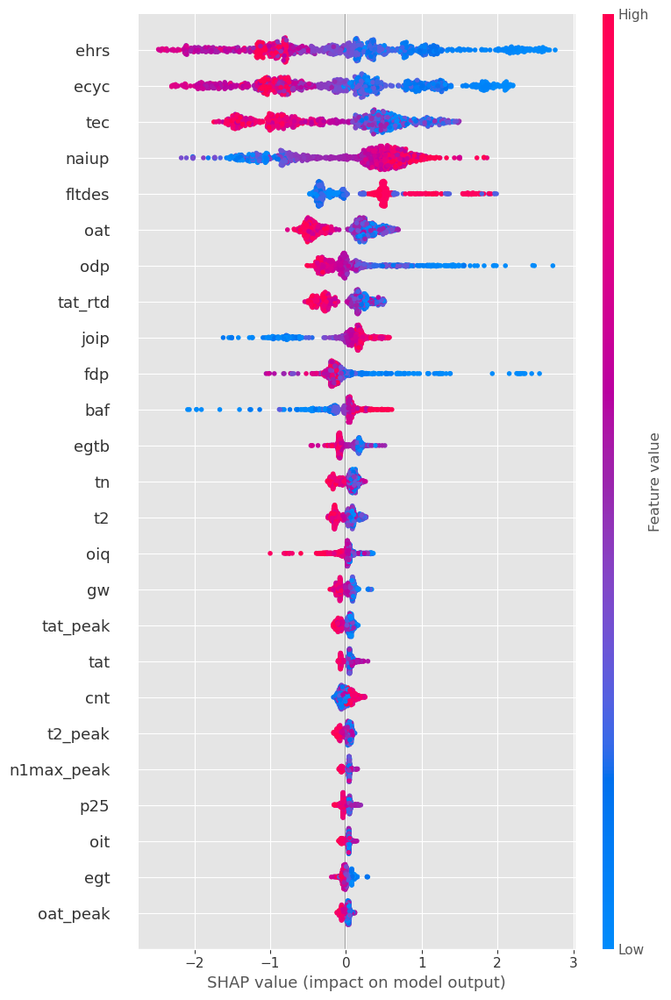

In [154]:
best_catboost_model = catboost_models[min_index_cb]
train_data = Pool(data=X_train_folds[min_index_cb],
                  label=y_train_folds[min_index_cb],
                  cat_features=cat_features)

explainer = shap.TreeExplainer(best_catboost_model)
shap_values = explainer.shap_values(train_data)
shap.summary_plot(shap_values, X_train_folds[min_index_cb], max_display=25)


In [157]:

cols_to_drop_catboost = []
train_data = Pool(
    data=X_train_folds[min_index_cb].drop(cols_to_drop_catboost, axis=1),
    label=y_train_folds[min_index_cb],
    cat_features=cat_features
)
eval_data = Pool(
    data=X_test_folds[min_index_cb].drop(cols_to_drop_catboost, axis=1),
    label=y_test_folds[min_index_cb],
    cat_features=cat_features
)

best_catboost_model_refit = catboost_models[min_index_cb]
best_catboost_model_refit.fit(
    train_data,
    eval_set=eval_data,
    verbose=1000,
    use_best_model=True,
    plot=False
)

refit_score = best_catboost_model_refit.best_score_['validation'].get('RMSE')
print(f"\n Model best_catboost_model_refit RMSE score ---------> {refit_score:.5f}")


0:	learn: 5.6807870	test: 8.4108050	best: 8.4108050 (0)	total: 5.47ms	remaining: 19.1s
1000:	learn: 0.1619834	test: 3.4333778	best: 3.4333778 (1000)	total: 4s	remaining: 10s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 3.42114115
bestIteration = 1250

Shrink model to first 1251 iterations.

 Model best_catboost_model_refit RMSE score ---------> 3.42114


## LGBM

### Goss

In [125]:
# закодируем категориальные признаки
X = dataset_time_sorted_BGU.drop(drop_cols, axis=1, errors="ignore")
y = dataset_time_sorted_BGU["egtm"]

encoder = LabelEncoder()
features_to_encode = ['dep', 'arr']
for col in features_to_encode:
    X[col] = encoder.fit_transform(X[col])

lgbm_model = lgbm.LGBMRegressor(random_state=random_state,
                               objective="rmse",
                               metric="rmse",
                               boosting_type="goss",
                               n_jobs=1,
                               verbose=-1
                               )

param_grid = {'learning_rate': [0.25, 0.05],
              'reg_lambda': [0, 0.5, 1],
              'num_leaves': [5, 10],
              'max_bin': [50, 100],
              'boosting_type': ['goss']
              }

# perform_grid_search(X, y, lgbm_model, param_grid, rmse_scorer, tscv)


In [84]:
X

,pos,fltdes,dep,arr,acct,alt,alt_peak,alt_rtd,aoc,b25,...,vb2,vorrc,vsva,w14,pf,wai,nai,prv,hpv,xf
0,1,8990.0,2,42,-20.0,1418.0,1247.0,-352.0,3.6,7.3,...,0.2,58.2,0.0,1160.0,0.53,0.0,0.0,1.0,0.0,0.0
1,2,8990.0,2,42,-20.0,1418.0,1247.0,-352.0,3.5,7.3,...,0.1,57.3,0.0,1160.0,0.53,0.0,0.0,1.0,0.0,0.0
2,1,1024.0,36,42,-20.0,2005.0,1581.0,96.0,3.5,7.3,...,0.1,55.4,0.0,1179.0,0.53,0.0,0.0,1.0,0.0,0.0
3,2,1024.0,36,42,-20.0,2005.0,1676.0,96.0,3.4,7.3,...,0.1,54.6,0.0,1179.0,0.53,0.0,0.0,1.0,0.0,0.0
4,1,217.0,42,27,-20.0,1739.0,1566.0,619.0,3.5,7.3,...,0.5,50.8,0.0,1302.0,0.51,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1247,1,777.0,24,42,-20.0,2512.0,2365.0,1472.0,3.4,7.3,...,0.3,53.2,0.0,1188.0,0.01,0.0,0.0,0.0,0.0,0.0
1248,2,924.0,3,42,-20.0,1835.0,1476.0,1.0,3.4,7.3,...,0.2,54.2,0.0,1127.0,0.53,0.0,0.0,1.0,0.0,0.0
1249,1,924.0,3,42,-20.0,1835.0,1295.0,1.0,3.4,7.3,...,0.4,55.7,0.0,1131.0,0.53,0.0,0.0,1.0,0.0,0.0
1250,2,949.0,42,3,-20.0,1186.0,976.0,235.0,3.5,7.3,...,0.2,52.1,0.0,1170.0,0.03,0.0,0.0,0.0,0.0,0.0


In [85]:
lgbm_goss_models = []
goss_scores = []
for train_index, test_index in tscv.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    lgb_model = lgbm.LGBMRegressor(objective="rmse",
                                  learning_rate=0.1,
                                  random_state=random_state,
                                  cat_feature=[0,2,3],
                                  boosting_type="goss",
                                  max_bin=50,
                                  num_leaves=10,
                                  reg_lambda=0.5,
                                  n_jobs=1,
                                  verbose=-1
                                  )

    lgb_model.fit(X_train,
                  y_train,
                  eval_set=[(X_test, y_test)],
                  eval_metric='rmse',
                  callbacks=[lgbm.early_stopping(stopping_rounds=50)],
                  )
    lgbm_goss_models.append(lgb_model)
    goss_scores.append(np.mean([v for k, v in lgb_model.best_score_["valid_0"].items()
                                 if "rmse" in k], dtype="float16"))

min_rmse_goss = min(goss_scores)
min_index_goss = goss_scores.index(min_rmse_goss)

for i in range(len(goss_scores)):
    print(f"Model lgbm_goss_models {i} RMSE score ---------> {goss_scores[i]:.5f}")


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[88]	valid_0's rmse: 5.63614
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[94]	valid_0's rmse: 5.41156
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[58]	valid_0's rmse: 3.21526
Model lgbm_goss_models 0 RMSE score ---------> 5.63672
Model lgbm_goss_models 1 RMSE score ---------> 5.41016
Model lgbm_goss_models 2 RMSE score ---------> 3.21484


In [79]:
# X_train_encoded_goss = X_train_folds[min_index_goss].copy()
# X_test_encoded_goss = X_test_folds[min_index_goss].copy()

# X_train_encoded_goss

In [17]:

## МБ как-то так



# # Можем посмотреть влияние фичей на все классы
# explainer = shap.TreeExplainer(clf)

# val_dataset = Pool(data=X_test, label=y_test, cat_features=cat_cols)
# shap_values = explainer.shap_values(val_dataset)
# shap.summary_plot(shap_values, X_test, max_display = 25, plot_size = (15, 5))

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

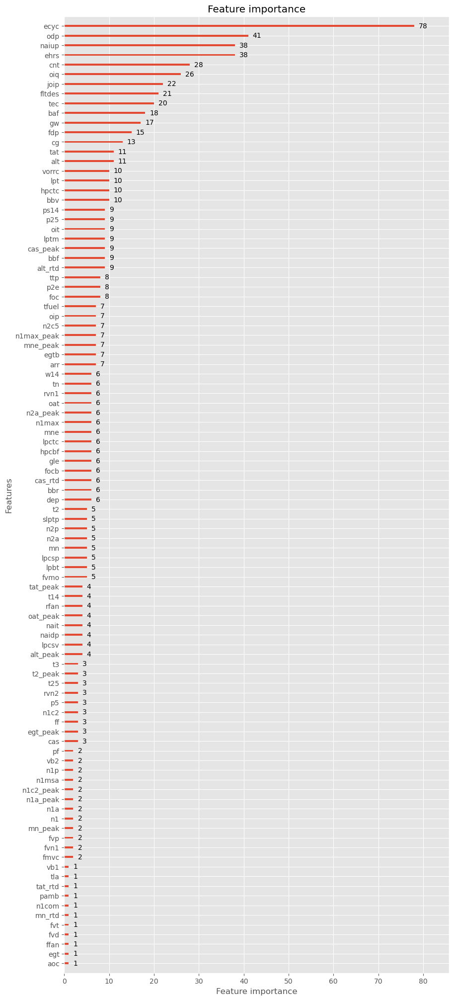

In [80]:
lgbm.plot_importance(lgbm_goss_models[min_index_goss], figsize=(10, 25))


In [81]:
goss_feature_importances = lgbm_goss_models[min_index_goss].feature_importances_
cols_to_drop_goss = []
for i,feature_importance in enumerate(goss_feature_importances):
    if feature_importance == 0:
        cols_to_drop_goss.append(X.columns[i])

In [86]:
lgbm_goss_optimized = lgbm.LGBMRegressor(objective="rmse",
                                  learning_rate=0.1,
                                  random_state=random_state,
#                                   cat_feature=[3,4],
                                  boosting_type="goss",
                                  max_bin=50,
                                  num_leaves=10,
                                  reg_lambda=0.5,
                                  n_jobs=1,
                                  verbose=-1
                                  )


lgbm_goss_optimized.fit(X_train_folds[min_index_goss].drop(cols_to_drop_goss, axis=1),
                        y_train_folds[min_index_goss],
                        eval_set=[(X_test_folds[min_index_goss].drop(cols_to_drop_goss, axis=1),
                        y_test_folds[min_index_goss])],
                        eval_metric='rmse',
                        callbacks=[lgbm.early_stopping(stopping_rounds=50)]
                       )

optimized_goss_score = lgbm_goss_optimized.best_score_['valid_0'].get('rmse')
print(f"\n Model lgbm_goss_optimized RMSE score ---------> {optimized_goss_score:.5f}")

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[79]	valid_0's rmse: 3.0764

 Model lgbm_goss_optimized RMSE score ---------> 3.07640


### Dart

In [87]:
# закодируем категориальные признаки
X = dataset_time_sorted_BGU.drop(drop_cols, axis=1, errors="ignore")
y = dataset_time_sorted_BGU["egtm"]

encoder = LabelEncoder()
features_to_encode = ['dep', 'arr']
for col in features_to_encode:
    X[col] = encoder.fit_transform(X[col])

lgbm_model = lgbm.LGBMRegressor(random_state=random_state,
                               objective="rmse",
                               metric="rmse",
                               n_jobs=1,
                               verbose=-1
                               )


param_grid = {'learning_rate': [0.25, 0.05],
              'reg_lambda': [0, 0.5, 1],
              'num_leaves': [5, 10],
              'max_bin': [50, 200, 400],
              'boosting_type': ['dart']
             }

# perform_grid_search(X, y, lgbm_model, param_grid, rmse_scorer, tscv)



In [88]:
lgbm_dart_models = []
dart_scores = []
for train_index, test_index in tscv.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    lgb_model = lgbm.LGBMRegressor(objective="rmse",
                                  learning_rate=0.25,
                                  random_state=random_state,
                                  cat_feature=[0,2,3],
                                  boosting_type="dart",
                                  max_bin=200,
                                  num_leaves=10,
                                  reg_lambda=1,
                                  n_jobs=1,
                                  verbose=-1
                                  )

    lgb_model.fit(X_train,
                  y_train,
                  eval_set=[(X_test, y_test)],
                  eval_metric='rmse',
                  callbacks=[lgbm.early_stopping(stopping_rounds=50)],
                  )
    lgbm_dart_models.append(lgb_model)
    dart_scores.append(np.mean([v for k, v in lgb_model.best_score_["valid_0"].items()
                                 if "rmse" in k], dtype="float16"))

min_rmse_dart = min(dart_scores)
min_index_dart = dart_scores.index(min_rmse_dart)

for i in range(len(dart_scores)):
    print(f"Model lgbm_dart_models {i} RMSE score ---------> {dart_scores[i]:.5f}")


Model lgbm_dart_models 0 RMSE score ---------> 31.20312
Model lgbm_dart_models 1 RMSE score ---------> 9.08594
Model lgbm_dart_models 2 RMSE score ---------> 2.84961


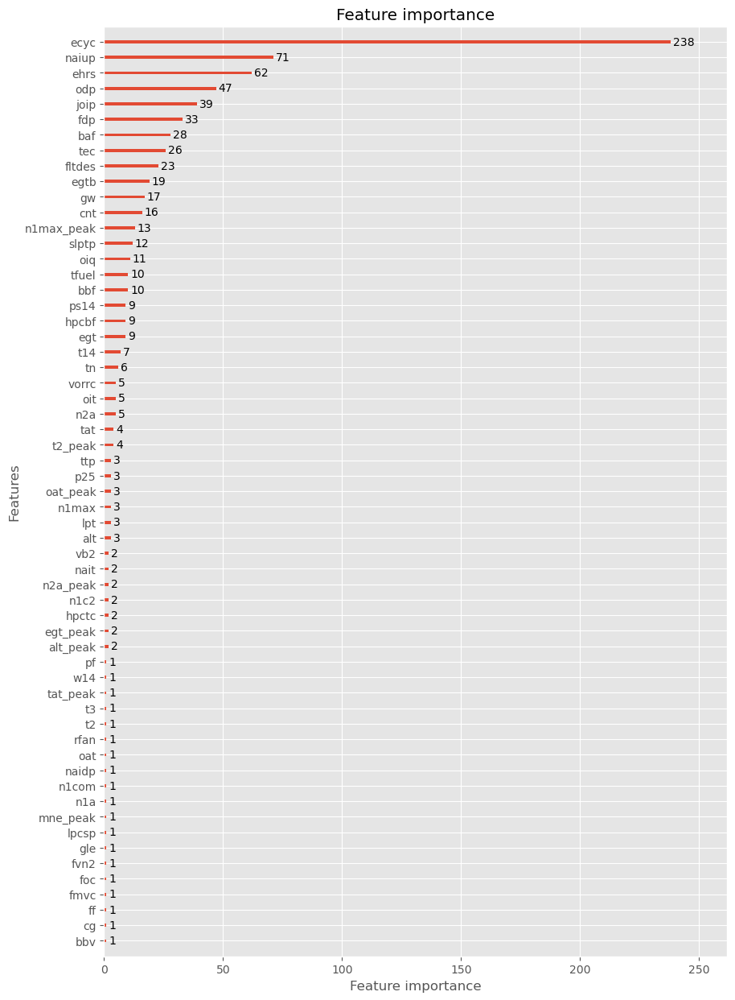

In [64]:
lgbm.plot_importance(lgbm_dart_models[min_index_dart], figsize=(10, 15));


In [99]:
dart_feature_importances = lgbm_dart_models[min_index_dart].feature_importances_
cols_to_drop_dart = []
for i,feature_importance in enumerate(dart_feature_importances):
    if feature_importance == 0:
        cols_to_drop_dart.append(X.columns[i])

!! когда дропаю нулевые фичи - rmse = 2.84, а когда 'bbv' и 'cg' (у них важность 1), то rmse = 2.67

!! когда я дропал до обучения dart 'dep' и 'arr', то rmse было на 2.74 и 2.61

In [100]:
# cols_to_drop_dart = ['bbv', 'cg']

lgbm_dart_optimized = lgbm.LGBMRegressor(objective="rmse",
                                        learning_rate=0.25,
                                        random_state=random_state,
                                        cat_feature=[0, 2, 3],
                                        boosting_type="dart",
                                        max_bin=200,
                                        num_leaves=10,
                                        reg_lambda=1,
                                        n_jobs=1,
                                         verbose=-1
)
lgbm_dart_optimized.fit(X_train_folds[min_index_dart].drop(cols_to_drop_dart, axis=1),
                        y_train_folds[min_index_dart],
                        eval_set=[(X_test_folds[min_index_dart].drop(cols_to_drop_dart, axis=1),
                        y_test_folds[min_index_dart])],
                        eval_metric='rmse',
                        callbacks=[lgbm.early_stopping(stopping_rounds=50)]
                       )

score_lgb_dart_optimized = lgbm_dart_optimized.best_score_['valid_0'].get('rmse')
print(f"\n Model lgb_dart_optimized RMSE score ---------> {score_lgb_dart_optimized:.5f}")



 Model lgb_dart_optimized RMSE score ---------> 2.84864


Сохраняем модели

In [24]:
# booster_lgb_goss_optimized, booster_lgb_dart_optimized = lgbm_goss_optimized.booster_, lgbm_dart_optimized.booster_
# booster_lgb_goss_optimized.save_model('models/lgb_goss_optimized.cbm')
# booster_lgb_dart_optimized.save_model('models/lgb_dart_optimized.cbm')

## XGBoost

### Dart

In [21]:

xgb_model = xgb.XGBRegressor(random_state=random_state,
                         objective='reg:squarederror',
                         tree_method="hist",
                         enable_categorical=True,
                         n_jobs=-1,
                         )
param_grid = {'max_depth': [3, 5],
              'max_leaves': [7, 9],
              'min_child_weight': [12, 14],
              'rate_drop': [0.05, 0.1],
              'one_drop': [1],
              'booster': ['dart']
              }

# perform_grid_search(X, y, xgb_model, param_grid, rmse_scorer, tscv)

In [23]:
xgb_dart_models = []
scores_xgb_dart = []
num_boost_round_ = 1000

learning_rates = np.linspace(0.5, 0.001, num_boost_round_).tolist()
scheduler = xgb.callback.LearningRateScheduler(learning_rates)

params_dart = {'objective': 'reg:squarederror',
               'tree_method': 'hist',
               'seed': random_state,
               'booster': 'dart',
               'max_depth': '5',
               'max_leaves': '9',
               'min_child_weight': '14',
               'one_drop': '1',
               'rate_drop': '0.1',
               'n_jobs': '-1',
               }
for train_index, test_index in tscv.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    dtrain = xgb.DMatrix(X_train, label=y_train, nthread=-1, enable_categorical=True)
    dtest = xgb.DMatrix(X_test, y_test, nthread=-1, enable_categorical=True)

    booster = xgb.train(params_dart,
                        dtrain=dtrain,
                        num_boost_round=num_boost_round_,
                        evals=[(dtrain, 'dtrain'), (dtest, 'dtest')],
                        verbose_eval=1000,
                        callbacks=[scheduler],
                        early_stopping_rounds=100,
                        )

    xgb_dart_models.append(booster)
    scores_xgb_dart.append(np.mean(booster.best_score))
min_rmse_xgb_dart = min(scores_xgb_dart)
min_index_xgb_dart = scores_xgb_dart.index(min_rmse_xgb_dart)
assert len(xgb_dart_models) == n_splits
for i in range(len(scores_xgb_dart)):
    print(f"Model xgb_dart {i} RMSE score ---------> {scores_xgb_dart[i]:.5f}")


[0]	dtrain-rmse:2.27787	dtest-rmse:7.70983
[316]	dtrain-rmse:0.22557	dtest-rmse:5.52896
[0]	dtrain-rmse:3.59675	dtest-rmse:8.51564
[123]	dtrain-rmse:0.34468	dtest-rmse:8.17150
[0]	dtrain-rmse:4.30454	dtest-rmse:7.27589
[156]	dtrain-rmse:0.54810	dtest-rmse:3.50327
Model xgb_dart 0 RMSE score ---------> 5.52374
Model xgb_dart 1 RMSE score ---------> 7.98817
Model xgb_dart 2 RMSE score ---------> 3.46466


In [42]:
colsdrop_xgb_dartf = []

dtrain = xgb.DMatrix(X_train_folds[min_index_xgb_dart],
                     label=y_train_folds[min_index_xgb_dart],
                     nthread=-1, enable_categorical=True)
dtest = xgb.DMatrix(X_test_folds[min_index_xgb_dart],
                    y_test_folds[min_index_xgb_dart],
                    nthread=-1, enable_categorical=True)

boosterf = xgb.train(params_dart,
                dtrain=dtrain,
                num_boost_round=num_boost_round_,
                evals=[(dtrain, 'dtrain'), (dtest, 'dtest')],
                verbose_eval=1000,
                callbacks=[scheduler],
                early_stopping_rounds=100,
)
xgb_dartf = boosterf
score_xgb_dartf = xgb_dartf.best_score
print(f"\n Model xgb_dartf RMSE score ---------> {score_xgb_dartf:.5f}")

[0]	dtrain-rmse:4.30454	dtest-rmse:7.27589
[155]	dtrain-rmse:0.54905	dtest-rmse:3.50442

 Model xgb_dartf RMSE score ---------> 3.46466


In [41]:
# # xgb_model.save_model('xgb_0001.json')
# bst = xgb.Booster({'nthread': 4})
# bst.load_model('xgb_0001.json')
# y_pred = bst.predict(dtest)
# mean_squared_error(y_test, y_pred) ** 0.5
# xgb.plot_importance(bst, title='Feature Importance Weight')
# xgb.plot_importance(bst, importance_type='gain', title='Feature Importance Gain')
# xgb.plot_importance(bst, importance_type='cover', title='Feature Importance Cover');
# # ”weight” - это количество раз, когда объект появляется в дереве
# # ”gain” - это средний прирост разделений, в которых используется этот объект
# # ”cover” - это средний охват разделений, в которых используется этот объект, где избыточность определяется как количество выборок, на которые влияет разделение

### GBTree

In [43]:

xgb_model = xgb.XGBRegressor(random_state=random_state,
                         objective='reg:squarederror',
                         tree_method="hist",
                         enable_categorical=True,
                         n_jobs=-1,
                         )
param_grid = {'max_depth': [3, 5],
              'max_leaves': [7, 9],
              'min_child_weight': [12, 14],
              'rate_drop': [0.05, 0.1],
              'one_drop': [1],
              'booster': ['gbtree']
              }

# perform_grid_search(X, y, xgb_model, param_grid, rmse_scorer, tscv)

In [44]:
xgb_gbtree_models = [] 
scores_xgb_gbtree = [] 
    
learning_rates = np.linspace(0.5, 0.0001, num_boost_round_).tolist() 
scheduler = xgb.callback.LearningRateScheduler(learning_rates)
   
params_gbtree = {'objective': 'reg:squarederror', 
                 'tree_method': 'hist',
                 'seed': random_state,
                 'booster': 'gbtree',
                 'colsample_bytree': '0.6',
                 'max_depth': '2', 
                 'min_child_weight': '16',
                 'max_leaves': '5',
                 'n_jobs': '-1',
                 }

for train_index, test_index in tscv.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    dtrain = xgb.DMatrix(X_train, label=y_train, nthread=-1, enable_categorical=True)
    dtest = xgb.DMatrix(X_test, y_test, nthread=-1, enable_categorical=True)
    
    booster = xgb.train(params_gbtree,
                        dtrain=dtrain,
                        num_boost_round=num_boost_round_,
                        evals=[(dtrain, 'dtrain'), (dtest, 'dtest')],
                        verbose_eval=1000,
                        callbacks=[scheduler],
                        early_stopping_rounds=100
                      )
    xgb_gbtree_models.append(booster)
    scores_xgb_gbtree.append(np.mean(booster.best_score))
min_rmse_xgb_gbtree = min(scores_xgb_gbtree)
min_index_xgb_gbtree = scores_xgb_gbtree.index(min_rmse_xgb_gbtree)
assert len(xgb_gbtree_models) == n_splits
for i in range(len(scores_xgb_gbtree)):
    print(f"Model xgb_gbtree {i} RMSE score ---------> {scores_xgb_gbtree[i]:.5f}")

[0]	dtrain-rmse:2.59080	dtest-rmse:8.34220
[259]	dtrain-rmse:0.03404	dtest-rmse:5.73438
[0]	dtrain-rmse:4.29169	dtest-rmse:7.68000
[233]	dtrain-rmse:0.17962	dtest-rmse:5.69877
[0]	dtrain-rmse:4.76379	dtest-rmse:7.06876
[124]	dtrain-rmse:0.44245	dtest-rmse:3.40599
Model xgb_gbtree 0 RMSE score ---------> 5.72317
Model xgb_gbtree 1 RMSE score ---------> 5.65951
Model xgb_gbtree 2 RMSE score ---------> 3.33331


In [45]:
colsdrop_xgb_gbtreef = []

dtrain = xgb.DMatrix(X_train_folds[min_index_xgb_gbtree].drop(colsdrop_xgb_gbtreef, axis=1), 
                     label=y_train_folds[min_index_xgb_gbtree], 
                     nthread=-1, enable_categorical=True)
dtest = xgb.DMatrix(X_test_folds[min_index_xgb_gbtree].drop(colsdrop_xgb_gbtreef, axis=1),
                    y_test_folds[min_index_xgb_gbtree], 
                    nthread=-1, enable_categorical=True)
    
boosterf = xgb.train(params_gbtree,
                     dtrain=dtrain,
                     num_boost_round=num_boost_round_,
                     evals=[(dtrain, 'dtrain'), (dtest, 'dtest')],
                     verbose_eval=1000,
                     callbacks=[scheduler],
                     early_stopping_rounds=100,
                     )
xgb_gbtreef = boosterf
score_xgb_gbtreef = xgb_gbtreef.best_score
print(f"\n Model xgb_gbtreef RMSE score ---------> {score_xgb_gbtreef:.5f}")


[0]	dtrain-rmse:4.76379	dtest-rmse:7.06876
[124]	dtrain-rmse:0.44245	dtest-rmse:3.40599

 Model xgb_gbtreef RMSE score ---------> 3.33331
